In [1]:
from multi_task.ablate_neurons import plot_prec_recall_change, reload_model, make_predictions, confusion_matrix, sort_neurons_for_class, calc_l1_norms_of_weights
from multi_task.util.dicts import imagenet_dict
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix

import torch
import time
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
plt.style.use('seaborn-paper')
import seaborn as sns
sns.set_context("paper")
from matplotlib.lines import Line2D

/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/mnt/antares_raid/home/spiess/projects/structure-for-interpretability/multi_task/util/util.py:21: DeprecationWarning: Please use `shift` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  from scipy.ndimage.interpolation import shift
/tmp/ipykernel_4315/4095109376.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-paper')


In [2]:
usual_layer_idx_to_l1_norms_idx = { 0:'layer1.0.conv2.weight',
                                        1:'layer1.1.conv1.ordinary_conv.weight',
                                        2:'layer1.1.conv2.ordinary_conv.weight',
                                        3:'layer2.0.conv1.ordinary_conv.weight',
                                        4:'layer2.0.conv2.ordinary_conv.weight',
                                        5:'layer2.1.conv1.ordinary_conv.weight',
                                        6:'layer2.1.conv2.ordinary_conv.weight',
                                        7:'layer3.0.conv1.ordinary_conv.weight',
                                        8:'layer3.0.conv2.ordinary_conv.weight',
                                        9:'layer3.1.conv1.ordinary_conv.weight',
                                        10:'layer3.1.conv2.ordinary_conv.weight',
                                        11:'layer4.0.conv1.ordinary_conv.weight',
                                        12:'layer4.0.conv2.ordinary_conv.weight',
                                        13:'layer4.1.conv1.ordinary_conv.weight',
                                        14:'layer4.1.conv2.ordinary_conv.weight'}

In [3]:
def new_plot_prec_recall_change(save_model_path, param_file, metric_name,
                          # saved_activations_path='activations_on_validation_preserved_spatial_10_pretrained_imagenet.npy',
                          saved_activations_path='activations_on_validation_14_pretrained_imagenet.npy',
                            saved_labels_path='labels_pretrained_imagenet.npy', wd_path=None,
                            l1_norms=None, force_recalculation=False, storage_path="."):

    model = reload_model(save_model_path, param_file)
    print(saved_activations_path)
    # works for layers 10 & 14:
    # with open(saved_activations_path, 'rb') as f:
    #     loaded_activations = torch.tensor(pickle.load(f))
    # works for layer 6:
    loaded_activations = torch.tensor(np.load(saved_activations_path))

    labels = np.load(saved_labels_path)
    wasser_dists_values = list(np.load(wd_path, allow_pickle=True).item().values())
    # print('Attention! What I do to get last linear weights only works for the pretrained imagenet model')

    if 'pretrained_imagenet' in saved_activations_path:
        fc_weights = model.fc.weight.detach().cpu().numpy()

    layeri = int(saved_activations_path.split('_')[-3])

    y_pred = make_predictions(model, loaded_activations, layeri, if_disable=False)
    precision_before, recall_before, _, _ = precision_recall_fscore_support(labels, y_pred)

    cm = confusion_matrix(labels, y_pred)
    FP = cm.sum(axis=0) - np.diag(cm)  
    FN = cm.sum(axis=1) - np.diag(cm)
    TP = np.diag(cm)
    TN = cm.sum() - (FP + FN + TP)

    tpr = np.nan_to_num(TP/(TP+FN))
    ppv = np.nan_to_num(TP/(TP+FP))

    assert (recall_before == tpr).all()
    assert (precision_before == ppv).all()

    fpr_before = FP/(FP+TN)


    n_neurons_dict = {
        6: 128, 
        10: 256, 
        14: 512
    }

    testing = False

    if not testing:
        ablate_neurons_config = {
            256: [8, 16, 32, 64, 128, 192],
            512: [16, 32, 64, 128, 256, 384],
            128: [4, 8, 16, 32, 64, 96], 
        }
    else:
        ablate_neurons_config = {
            256: [8, 16, 32],
            512: [16, 32, 64],
            128: [4, 8, 16], 
        }

    n_neurons = n_neurons_dict[layeri]
    assert n_neurons == loaded_activations.size()[1]
    
    n_classes = 1000 if not testing else 5

    n_neurons_to_disable = ablate_neurons_config[n_neurons]

    save_postfix = f'layer{layeri}_disabled_{"_".join(str(x) for x in n_neurons_to_disable)}'
    if n_classes == 1000:
        save_postfix += '_imagenet'
    elif n_classes == 10:
        save_postfix += '_cifar10'
    elif n_classes == 5:
        save_postfix += '_testing'
    else:
        raise Exception(f"Unknown n_classes: {n_classes}")

    # def change_2d_array_into_dict(arr, neuron_sorting_fun_names):
    #         means_dict = {}
    #         for i, n in enumerate(neuron_sorting_fun_names):
    #             means_dict[n] = arr[i, :]
    #         return means_dict

    def random_perm_lambda():
        permuted_neurons = np.random.permutation(n_neurons)
        return lambda a, b: permuted_neurons

    sorting_funs_list = [
        ('random 1', random_perm_lambda()),
        # ('random 2', random_perm_lambda()),
        # ('random 3', random_perm_lambda()),
        (f'argmax {metric_name}', lambda metric_values, idx: np.array(sort_neurons_for_class(metric_values, idx)[0][::-1])),
        (f'argmin {metric_name}', lambda metric_values, idx: sort_neurons_for_class(metric_values, idx)[0])
    ]

    # Don't compute this, because what the ablation wants to show is whether these neurons affect exitatory or inhibitory.
    
    # if layeri == 14:
    #     # This kind of dilutes the plot as this was already compared when correlation to gradients was computed.
    #     if 'pretrained_imagenet' in saved_activations_path:
    #         sorting_funs_list += [
    #             ('sort-readout-max', lambda _, idx: np.argsort(fc_weights[idx])[::-1]),
    #             ('sort-readout-min', lambda _, idx: np.argsort(fc_weights[idx])),
    #         ]
    # else:
    #     # why this strategy? This sort by smallest weight magnitude as a baseline for sparse networks. Not really relevant for us. Ignore it!
    #     sorting_funs_list += [
    #         ('sort-l1', lambda _, idx: np.argsort(l1_norms))# this is sort-l1 for non-last layers
    #     ]

    neuron_sorting_fun_names, neuron_sorting_funs = zip(*sorting_funs_list)

    try:
        precision_means_dict = np.load(f'{storage_path}/prec_means_dict{save_postfix}.npy', allow_pickle=True).item()
        recall_means_dict = np.load(f'{storage_path}/recall_means_dict{save_postfix}.npy', allow_pickle=True).item()
        precision_stds_dict = np.load(f'{storage_path}/prec_stds_dict{save_postfix}.npy', allow_pickle=True).item()
        recall_stds_dict = np.load(f'{storage_path}/recall_stds_dict{save_postfix}.npy', allow_pickle=True).item()
    
        raw_precision_changes_dict = np.load(f'{storage_path}/raw_precision_changes_dict{save_postfix}.npy', allow_pickle=True).item()
        raw_recall_changes_dict = np.load(f'{storage_path}/raw_recall_changes_dict{save_postfix}.npy', allow_pickle=True).item()

        raw_fpr_changes_dict = np.load(f'{storage_path}/raw_fpr_changes_dict{save_postfix}.npy', allow_pickle=True).item()
        
        # raw_precision_dict = np.load(f'raw_precision_dict{save_postfix}.npy', allow_pickle=True).item()
        # raw_recall_dict = np.load(f'raw_recall_dict{save_postfix}.npy', allow_pickle=True).item()
    except:
        precision_means_dict = {}
        recall_means_dict = {}
        precision_stds_dict = {}
        recall_stds_dict = {}
        raw_precision_changes_dict = {}
        raw_recall_changes_dict = {}

        raw_fpr_changes_dict = {}

        # raw_precision_dict = {}
        # raw_recall_dict = {}
        
        
        # precision_means = np.zeros((len(neuron_sorting_funs), len(n_neurons_to_disable)))
        # recall_means = np.zeros((len(neuron_sorting_funs), len(n_neurons_to_disable)))
        # precision_stds = np.zeros((len(neuron_sorting_funs), len(n_neurons_to_disable)))
        # recall_stds = np.zeros((len(neuron_sorting_funs), len(n_neurons_to_disable)))
    
    something_changed = False

    for (sorting_fun_name, sorting_fun) in zip(neuron_sorting_fun_names, neuron_sorting_funs):
        if not force_recalculation and sorting_fun_name in precision_means_dict:
            continue

        something_changed = True
        
        precision_means_dict[sorting_fun_name] = np.zeros(len(n_neurons_to_disable))
        recall_means_dict[sorting_fun_name] = np.zeros(len(n_neurons_to_disable))
        precision_stds_dict[sorting_fun_name] = np.zeros(len(n_neurons_to_disable))
        recall_stds_dict[sorting_fun_name] = np.zeros(len(n_neurons_to_disable))

        raw_precision_changes_dict[sorting_fun_name] = np.zeros((len(n_neurons_to_disable), n_classes))
        raw_recall_changes_dict[sorting_fun_name] = np.zeros((len(n_neurons_to_disable), n_classes))

        raw_fpr_changes_dict[sorting_fun_name] = np.zeros((len(n_neurons_to_disable), n_classes))

        # raw_precision_dict[sorting_fun_name] = np.zeros((len(n_neurons_to_disable), n_classes))
        # raw_recall_dict[sorting_fun_name] = np.zeros((len(n_neurons_to_disable), n_classes))

        for j, n_to_disable in enumerate(n_neurons_to_disable):
            print(f'{n_to_disable} disabled')
            p_diffs = []
            r_diffs = []
            fpr_diffs = []
            
            # ps = []
            # rs = []
            already_computed_dict = dict()

            for class_idx in range(n_classes):
                print(class_idx)
                st = time.time()
                cur_idx = list(sorting_fun(wasser_dists_values, class_idx)[:n_to_disable])
                sorted_cur_idx = tuple(np.sort(cur_idx))
                
                # x = loaded_activations.clone().cuda()
                # x[:, cur_idx] = 0
                # x = model.fc(x)
                # conf_matr = confusion_matrix(labels, torch.argmax(x, dim=1).detach().cpu().numpy())
                
                if (sorted_cur_idx in already_computed_dict):
                    p, r, fpr = already_computed_dict[sorted_cur_idx]
                else:
                    # don't recompute if ablations doesn't change
                    y_pred = make_predictions(model, loaded_activations, layeri, if_disable=True, disable_ind=cur_idx)
                    
                    cm = confusion_matrix(labels, y_pred)
                    FP = cm.sum(axis=0) - np.diag(cm)  
                    FN = cm.sum(axis=1) - np.diag(cm)
                    TP = np.diag(cm)
                    TN = cm.sum() - (FP + FN + TP)

                    tpr = np.nan_to_num(TP/(TP+FN))
                    ppv = np.nan_to_num(TP/(TP+FP))
                    fpr = FP/(FP+TN)

                    p, r, _, _ = precision_recall_fscore_support(labels, y_pred)

                    assert (r == tpr).all()
                    assert (p == ppv).all()

                    # p = np.nan_to_num(p)
                    already_computed_dict[sorted_cur_idx] = (p, r, fpr)
                
                p_diff = p[class_idx] - precision_before[class_idx]
                r_diff = r[class_idx] - recall_before[class_idx]
                fpr_diff = fpr[class_idx] - fpr_before[class_idx]
                p_diffs.append(p_diff)
                r_diffs.append(r_diff)
                fpr_diffs.append(fpr_diff)
                # ps.append(p[class_idx])
                # rs.append(r[class_idx])
                ed = time.time()
                print(f'time={ed - st}')

            precision_means_dict[sorting_fun_name][j] = np.mean(p_diffs)
            recall_means_dict[sorting_fun_name][j] = np.mean(r_diffs)
            precision_stds_dict[sorting_fun_name][j] = np.std(p_diffs)
            recall_stds_dict[sorting_fun_name][j] = np.std(r_diffs)

            raw_precision_changes_dict[sorting_fun_name][j] = p_diffs
            raw_recall_changes_dict[sorting_fun_name][j] = r_diffs

            raw_fpr_changes_dict[sorting_fun_name][j] = fpr_diffs

            # raw_precision_dict[sorting_fun_name][j] = ps
            # raw_recall_dict[sorting_fun_name][j] = rs

            # plt.rcParams.update({'font.size': 17})
            # proper_hist(np.array(p_diffs), bin_size=0.02)
            # plt.savefig('prec_change32_hist.png', format='png')
            # plt.show()

    if something_changed:
        np.save(f'{storage_path}/prec_means_dict{save_postfix}.npy', precision_means_dict)
        np.save(f'{storage_path}/recall_means_dict{save_postfix}.npy', recall_means_dict)
        np.save(f'{storage_path}/prec_stds_dict{save_postfix}.npy', precision_stds_dict)
        np.save(f'{storage_path}/recall_stds_dict{save_postfix}.npy', recall_stds_dict)
        np.save(f'{storage_path}/raw_precision_changes_dict{save_postfix}.npy', raw_precision_changes_dict)
        np.save(f'{storage_path}/raw_recall_changes_dict{save_postfix}.npy', raw_recall_changes_dict)

        np.save(f'{storage_path}/raw_fpr_changes_dict{save_postfix}.npy', raw_fpr_changes_dict)
        # np.save(f'raw_precision_dict{save_postfix}.npy', raw_precision_dict)
        # np.save(f'raw_recall_dict{save_postfix}.npy', raw_recall_dict)

    info = {'neuron_sorting_fun_names':neuron_sorting_fun_names, 'n_neurons_to_disable':n_neurons_to_disable}
    np.save(f'{storage_path}/info_{save_postfix}.npy', info)

    plt.title('Precision change')
    plt.xlabel('Units ablated')
    # plt.xscale('log')
    plt.xticks(n_neurons_to_disable)
    # plt.gca().get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    for n in neuron_sorting_fun_names:
        plt.errorbar(n_neurons_to_disable, precision_means_dict[n], yerr=precision_stds_dict[n],
                    label=n, capsize=5)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'prec_change_{save_postfix}.png', format='png')
    plt.savefig(f'prec_change_{save_postfix}.svg', format='svg')
    plt.show()
    plt.close()

    plt.title('Recall change')
    plt.xlabel('Units ablated')
    # plt.xscale('log')
    plt.xticks(n_neurons_to_disable)
    # plt.gca().get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    for n in neuron_sorting_fun_names:
        plt.errorbar(n_neurons_to_disable, recall_means_dict[n], yerr=recall_stds_dict[n],
                     label=n, capsize=5)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'rec_change_{save_postfix}.png', format='png')
    plt.savefig(f'rec_change_{save_postfix}.svg', format='svg')
    plt.show()
    plt.close()

    # Full distribution plots

    prop_cycle = plt.rcParams['axes.prop_cycle']
    colors = prop_cycle.by_key()['color']

    plt.title('Precision change')
    plt.xlabel('Units ablated')
    plt.xticks(n_neurons_to_disable)
    
    handles = []
    for (i, n) in enumerate(neuron_sorting_fun_names):
        plt.plot(n_neurons_to_disable, raw_precision_changes_dict[n], color=colors[i], linewidth=0.1, alpha=0.1)
        line = Line2D([0], [0], label=n, color=colors[i])
        handles += [line]
    plt.legend(handles=handles, loc="upper center", ncol=5, bbox_to_anchor=(0.5, 1.2))
    # plt.tight_layout()
    plt.savefig(f'prec_change_full_distribution_{save_postfix}.png', format='png')
    plt.savefig(f'prec_change_full_distribution_{save_postfix}.svg', format='svg')
    plt.show()
    plt.close()

    plt.title('FPR change')
    plt.xlabel('Units ablated')
    plt.xticks(n_neurons_to_disable)
    
    handles = []
    for (i, n) in enumerate(neuron_sorting_fun_names):
        plt.plot(n_neurons_to_disable, raw_fpr_changes_dict[n], color=colors[i], linewidth=0.1, alpha=0.1)
        line = Line2D([0], [0], label=n, color=colors[i])
        handles += [line]
    plt.legend(handles=handles, loc="upper center", ncol=5, bbox_to_anchor=(0.5, 1.2))
    # plt.tight_layout()
    plt.savefig(f'fpr_change_full_distribution_{save_postfix}.png', format='png')
    plt.savefig(f'fpr_change_full_distribution_{save_postfix}.svg', format='svg')
    plt.show()
    plt.close()

    plt.title('Recall change')
    plt.xlabel('Units ablated')
    plt.xticks(n_neurons_to_disable)
    
    handles = []
    for (i, n) in enumerate(neuron_sorting_fun_names):
        plt.plot(n_neurons_to_disable, raw_recall_changes_dict[n], color=colors[i], linewidth=0.1, alpha=0.1)
        line = Line2D([0], [0], label=n, color=colors[i])
        handles += [line]
    plt.legend(handles=handles, loc="upper center", ncol=5, bbox_to_anchor=(0.5, 1.2))
    # plt.tight_layout()
    plt.savefig(f'rec_change_full_distribution_{save_postfix}.png', format='png')
    plt.savefig(f'rec_change_full_distribution_{save_postfix}.svg', format='svg')
    plt.show()
    plt.close()

In [4]:
imagenet_dict_reversed = dict(zip(imagenet_dict.values(), imagenet_dict.keys()))
if_pretrained_imagenet = True

path_prefix = 'stored_activations/'
storage_path = "local_storage/ablation_cache/"

In [5]:
if if_pretrained_imagenet:
        model_name_short = 'pretrained_imagenet'
        save_model_path = 'dummy'
        param_file = 'dummy'

In [6]:
try:
    l1_norms_dict = np.load(f'l1_norms_{model_name_short}.npy', allow_pickle=True).item()
except:
    calc_l1_norms_of_weights(save_model_path)
    l1_norms_dict = np.load(f'l1_norms_{model_name_short}.npy', allow_pickle=True).item()

For last layer (14), there is no l1-norm because it's just a single weight. This is what is sorted by in readout-max (by largest weight) and readout-min (by lowest weight).

TODO: For simplicity, maybe call it argmax-l1 and argmin-l1 and do it for all layers.

Currently, just the means and stds are saved.

I wanted to check how a line plot with low opacity and width might look like.

Plot the absolute values of precision and recall or use the probabilities.

stored_activations/activations_on_validation_preserved_spatial_6_pretrained_imagenet.npy


4 disabled
0


time=13.393253803253174
1
time=2.1457672119140625e-05
2
time=1.4781951904296875e-05
3
time=1.1205673217773438e-05
4
time=1.1444091796875e-05
5
time=1.0013580322265625e-05
6
time=9.775161743164062e-06
7
time=9.5367431640625e-06
8
time=1.0251998901367188e-05
9
time=9.775161743164062e-06
10
time=9.775161743164062e-06
11
time=9.5367431640625e-06
12
time=9.775161743164062e-06
13
time=9.5367431640625e-06
14
time=1.0013580322265625e-05
15
time=9.775161743164062e-06
16
time=1.0013580322265625e-05
17
time=9.775161743164062e-06
18
time=9.5367431640625e-06
19
time=1.0013580322265625e-05
20
time=9.775161743164062e-06
21
time=9.5367431640625e-06
22
time=9.775161743164062e-06
23
time=9.775161743164062e-06
24
time=9.5367431640625e-06
25
time=9.775161743164062e-06
26
time=9.298324584960938e-06
27
time=1.0013580322265625e-05
28
time=9.298324584960938e-06
29
time=9.298324584960938e-06
30
time=9.059906005859375e-06
31
time=9.5367431640625e-06
32
time=9.775161743164062e-06
33
time=9.5367431640625e-06
34
t

time=13.411036729812622
1
time=2.3126602172851562e-05
2
time=1.4781951904296875e-05
3
time=1.2874603271484375e-05
4
time=1.1444091796875e-05
5
time=1.1205673217773438e-05
6
time=1.0967254638671875e-05
7
time=1.0728836059570312e-05
8
time=1.0728836059570312e-05
9
time=1.049041748046875e-05
10
time=1.0251998901367188e-05
11
time=1.0251998901367188e-05
12
time=1.049041748046875e-05
13
time=1.0251998901367188e-05
14
time=1.0251998901367188e-05
15
time=1.049041748046875e-05
16
time=1.049041748046875e-05
17
time=1.0728836059570312e-05
18
time=1.0251998901367188e-05
19
time=1.0728836059570312e-05
20
time=1.0251998901367188e-05
21
time=1.0251998901367188e-05
22
time=1.0013580322265625e-05
23
time=1.1682510375976562e-05
24
time=1.0728836059570312e-05
25
time=1.0728836059570312e-05
26
time=1.0251998901367188e-05
27
time=1.049041748046875e-05
28
time=1.049041748046875e-05
29
time=1.0728836059570312e-05
30
time=1.049041748046875e-05
31
time=1.0251998901367188e-05
32
time=1.049041748046875e-05
33
t

time=13.502872467041016
1
time=2.6226043701171875e-05
2
time=1.621246337890625e-05
3
time=1.3589859008789062e-05
4
time=1.2636184692382812e-05
5
time=1.2874603271484375e-05
6
time=1.2159347534179688e-05
7
time=1.2159347534179688e-05
8
time=1.1920928955078125e-05
9
time=1.1682510375976562e-05
10
time=1.1682510375976562e-05
11
time=1.1444091796875e-05
12
time=1.1444091796875e-05
13
time=1.1444091796875e-05
14
time=1.1682510375976562e-05
15
time=1.1444091796875e-05
16
time=1.1920928955078125e-05
17
time=1.2159347534179688e-05
18
time=1.1205673217773438e-05
19
time=1.1444091796875e-05
20
time=1.1444091796875e-05
21
time=1.1444091796875e-05
22
time=1.1205673217773438e-05
23
time=1.1682510375976562e-05
24
time=1.1682510375976562e-05
25
time=1.1682510375976562e-05
26
time=1.1444091796875e-05
27
time=1.1682510375976562e-05
28
time=1.1682510375976562e-05
29
time=1.1444091796875e-05
30
time=1.1444091796875e-05
31
time=1.1682510375976562e-05
32
time=1.1682510375976562e-05
33
time=1.1444091796875e

time=13.5988290309906
1
time=3.337860107421875e-05
2
time=1.9073486328125e-05
3
time=1.621246337890625e-05
4
time=1.621246337890625e-05
5
time=1.5020370483398438e-05
6
time=1.4543533325195312e-05
7
time=1.4543533325195312e-05
8
time=1.4543533325195312e-05
9
time=1.4066696166992188e-05
10
time=1.4066696166992188e-05
11
time=1.4066696166992188e-05
12
time=1.4066696166992188e-05
13
time=1.4066696166992188e-05
14
time=1.4066696166992188e-05
15
time=1.4066696166992188e-05
16
time=1.430511474609375e-05
17
time=1.4066696166992188e-05
18
time=1.3589859008789062e-05
19
time=1.430511474609375e-05
20
time=1.4066696166992188e-05
21
time=1.3828277587890625e-05
22
time=1.430511474609375e-05
23
time=1.4781951904296875e-05
24
time=1.430511474609375e-05
25
time=1.4543533325195312e-05
26
time=1.4543533325195312e-05
27
time=1.4543533325195312e-05
28
time=1.4066696166992188e-05
29
time=1.430511474609375e-05
30
time=1.4066696166992188e-05
31
time=1.430511474609375e-05
32
time=1.4543533325195312e-05
33
time

time=13.78742504119873
1
time=0.00019812583923339844
2
time=2.6464462280273438e-05
3
time=2.2649765014648438e-05
4
time=2.1696090698242188e-05
5
time=2.0742416381835938e-05
6
time=2.0265579223632812e-05
7
time=2.0503997802734375e-05
8
time=2.0503997802734375e-05
9
time=2.0265579223632812e-05
10
time=2.0503997802734375e-05
11
time=2.002716064453125e-05
12
time=1.9788742065429688e-05
13
time=2.0265579223632812e-05
14
time=1.9550323486328125e-05
15
time=2.0265579223632812e-05
16
time=2.0503997802734375e-05
17
time=1.9788742065429688e-05
18
time=1.9550323486328125e-05
19
time=2.0265579223632812e-05
20
time=1.9788742065429688e-05
21
time=1.9311904907226562e-05
22
time=1.9788742065429688e-05
23
time=1.9788742065429688e-05
24
time=1.9311904907226562e-05
25
time=2.002716064453125e-05
26
time=2.002716064453125e-05
27
time=2.9325485229492188e-05
28
time=1.9311904907226562e-05
29
time=1.9073486328125e-05
30
time=1.9311904907226562e-05
31
time=1.9311904907226562e-05
32
time=1.9788742065429688e-05


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.994208812713623
1
time=0.00020003318786621094
2
time=3.1948089599609375e-05
3
time=2.765655517578125e-05
4
time=2.7894973754882812e-05
5
time=2.6226043701171875e-05
6
time=2.5510787963867188e-05
7
time=2.6226043701171875e-05
8
time=2.5510787963867188e-05
9
time=2.5510787963867188e-05
10
time=2.5987625122070312e-05
11
time=2.47955322265625e-05
12
time=2.5033950805664062e-05
13
time=2.574920654296875e-05
14
time=2.5033950805664062e-05
15
time=2.5033950805664062e-05
16
time=2.6464462280273438e-05
17
time=2.5033950805664062e-05
18
time=2.5033950805664062e-05
19
time=2.6226043701171875e-05
20
time=2.47955322265625e-05
21
time=2.4557113647460938e-05
22
time=2.6226043701171875e-05
23
time=2.5033950805664062e-05
24
time=2.5033950805664062e-05
25
time=3.218650817871094e-05
26
time=3.62396240234375e-05
27
time=2.4557113647460938e-05
28
time=2.5033950805664062e-05
29
time=2.4557113647460938e-05
30
time=2.4557113647460938e-05
31
time=2.5033950805664062e-05
32
time=2.4557113647460938e-05
33

time=13.394119501113892
1


time=13.411466598510742
2


time=13.39972996711731
3
time=0.00011110305786132812
4


time=13.381277799606323
5


time=13.400197744369507
6


time=13.402566194534302
7


time=13.369357824325562
8


time=13.380179643630981
9


time=13.410894393920898
10


time=13.37590765953064
11


time=13.374099969863892
12


time=13.38005805015564
13


time=13.396735668182373
14


time=13.395423412322998
15


time=13.374206304550171
16


time=13.400742053985596
17


time=13.435261726379395
18


time=13.40275239944458
19


time=13.407467603683472
20


time=13.438446283340454
21


time=13.516266822814941
22


time=13.403586864471436
23


time=13.423392057418823
24


time=13.42401123046875
25


time=13.407048463821411
26


time=13.42486572265625
27


time=13.391398191452026
28


time=13.445065259933472
29


time=13.438709020614624
30


time=13.435078859329224
31


time=13.401408433914185
32


time=13.401057481765747
33


time=13.403010368347168
34


time=13.409870147705078
35


time=13.399585962295532
36


time=13.420106172561646
37


time=13.43771743774414
38
time=0.00012493133544921875
39


time=13.661205530166626
40


time=13.401100635528564
41


time=13.411126852035522
42


time=13.391914129257202
43


time=13.420283555984497
44


time=13.404497623443604
45


time=13.41291332244873
46


time=13.40686821937561
47


time=13.408469915390015
48


time=13.42642092704773
49


time=13.392470359802246
50


time=13.414947986602783
51


time=13.385949850082397
52


time=13.415605306625366
53


time=13.437401294708252
54


time=13.507921695709229
55


time=13.493638277053833
56


time=13.531307697296143
57


time=13.395210027694702
58


time=13.424389123916626
59


time=13.448201894760132
60


time=13.433664083480835
61


time=13.429783582687378
62


time=13.448994159698486
63


time=13.409199714660645
64


time=13.4153733253479
65


time=13.452558755874634
66


time=13.42548131942749
67


time=13.421400547027588
68


time=13.421106815338135
69


time=13.426622867584229
70


time=13.404398441314697
71


time=13.493036270141602
72


time=13.433118343353271
73


time=13.416668176651001
74


time=13.426409006118774
75


time=13.43757438659668
76


time=13.392274618148804
77


time=13.440055131912231
78


time=13.457200050354004
79


time=13.505489826202393
80


time=13.428518533706665
81


time=13.411749124526978
82


time=13.443124055862427
83


time=13.409627676010132
84


time=13.419204950332642
85


time=13.416624784469604
86


time=13.409643173217773
87


time=13.386161804199219
88


time=13.454371929168701
89


time=13.39161229133606
90


time=13.395595073699951
91


time=13.447060346603394
92


time=13.42779541015625
93


time=13.403807640075684
94


time=13.437934398651123
95


time=13.414141178131104
96


time=13.422558069229126
97


time=13.496942520141602
98


time=13.413174629211426
99


time=13.406821489334106
100


time=13.44163465499878
101


time=13.399662017822266
102


time=13.430313348770142
103


time=13.388349533081055
104


time=13.430614948272705
105


time=13.43618369102478
106


time=13.387801170349121
107


time=13.415168046951294
108


time=13.430843591690063
109


time=13.424357891082764
110


time=13.436335563659668
111


time=13.39830231666565
112


time=13.405839204788208
113


time=13.403828859329224
114


time=13.421709775924683
115


time=13.38814091682434
116


time=13.4345862865448
117


time=13.393630504608154
118


time=13.395383596420288
119
time=0.00014257431030273438
120


time=13.425333261489868
121


time=13.400107622146606
122


time=13.399107933044434
123


time=13.444825410842896
124


time=13.431254386901855
125


time=13.436835289001465
126


time=13.43371844291687
127


time=13.445157527923584
128


time=13.429337978363037
129


time=13.430196285247803
130


time=13.481409788131714
131


time=13.429089307785034
132


time=13.397963523864746
133


time=13.465511560440063
134


time=13.432318210601807
135


time=13.407886743545532
136


time=13.475120544433594
137


time=13.388031721115112
138
time=0.00013017654418945312
139


time=13.438273906707764
140


time=13.412639379501343
141


time=13.41834020614624
142


time=13.411897659301758
143


time=13.41533088684082
144


time=13.393759489059448
145


time=13.433269739151001
146


time=13.404736995697021
147


time=13.427220106124878
148


time=13.396279573440552
149


time=13.457309007644653
150


time=13.412335634231567
151


time=13.423680543899536
152


time=13.38474416732788
153


time=13.404321193695068
154


time=13.411296606063843
155


time=13.397043943405151
156


time=13.387647867202759
157


time=13.414491176605225
158


time=13.398075819015503
159


time=13.437055587768555
160


time=13.39085865020752
161


time=13.41783618927002
162


time=13.39853811264038
163


time=13.427680253982544
164


time=13.39153242111206
165


time=13.419078350067139
166


time=13.41618800163269
167


time=13.423834562301636
168


time=13.373937845230103
169


time=13.462228298187256
170


time=13.40978455543518
171


time=13.433574438095093
172


time=13.442682981491089
173


time=13.407418489456177
174


time=13.394818305969238
175


time=13.495975971221924
176


time=13.40915060043335
177


time=13.436217308044434
178


time=13.457235336303711
179


time=13.420585870742798
180


time=13.408900737762451
181


time=13.449170589447021
182


time=13.406707286834717
183


time=13.437080383300781
184


time=13.396431684494019
185


time=13.397502422332764
186
time=0.0004570484161376953
187


time=13.403795719146729
188


time=13.434885263442993
189


time=13.393015384674072
190


time=13.401681184768677
191


time=13.40700912475586
192


time=13.421493530273438
193


time=13.424135684967041
194
time=0.00046062469482421875
195
time=5.1021575927734375e-05
196


time=13.414982318878174
197


time=13.431038856506348
198


time=13.408735990524292
199


time=13.400323629379272
200


time=13.396658658981323
201


time=13.432666540145874
202


time=13.398540496826172
203


time=13.429881811141968
204


time=13.402504444122314
205


time=13.432098865509033
206
time=0.000457763671875
207


time=13.403007507324219
208
time=0.00013208389282226562
209


time=13.42337441444397
210


time=13.4065523147583
211


time=13.438452005386353
212


time=13.432420492172241
213


time=13.433936357498169
214


time=13.416880130767822
215
time=0.0001285076141357422
216


time=13.465530157089233
217
time=0.0004291534423828125
218


time=13.40626335144043
219
time=0.0002846717834472656
220
time=0.0002460479736328125
221
time=4.696846008300781e-05
222


time=13.434072494506836
223


time=13.434767961502075
224


time=13.401305198669434
225
time=0.0004544258117675781
226


time=13.400375366210938
227


time=13.439943790435791
228


time=13.40729570388794
229


time=13.450913190841675
230
time=0.00014495849609375
231


time=13.483248710632324
232
time=0.00013136863708496094
233


time=13.435847997665405
234


time=13.487149000167847
235


time=13.434893369674683
236


time=13.399121761322021
237


time=13.43233585357666
238


time=13.414493799209595
239


time=13.39838433265686
240


time=13.41082501411438
241


time=13.412883520126343
242


time=13.412123203277588
243


time=13.413616418838501
244


time=13.41154146194458
245


time=13.410813570022583
246


time=13.40941047668457
247


time=13.436160802841187
248


time=13.416239976882935
249


time=13.420356750488281
250


time=13.447863340377808
251


time=13.41342806816101
252


time=13.426625967025757
253
time=0.0001289844512939453
254


time=13.428459882736206
255


time=13.449121952056885
256
time=0.00016689300537109375
257


time=13.476787090301514
258


time=13.455426216125488
259


time=13.404032468795776
260


time=13.465246438980103
261


time=13.400997638702393
262


time=13.438950538635254
263


time=13.451215982437134
264


time=13.448653221130371
265


time=13.42796802520752
266
time=0.00013971328735351562
267
time=0.0003867149353027344
268


time=13.46213436126709
269


time=13.406791687011719
270


time=13.42100977897644
271


time=13.52916669845581
272


time=13.419835329055786
273


time=13.449326992034912
274


time=13.434738159179688
275


time=13.410125255584717
276


time=13.431878328323364
277


time=13.407716989517212
278


time=13.418508529663086
279


time=13.417513370513916
280


time=13.437163591384888
281


time=13.424296140670776
282


time=13.426628112792969
283


time=13.417800188064575
284


time=13.438613176345825
285


time=13.434844970703125
286


time=13.42642092704773
287


time=13.431102991104126
288


time=13.449668645858765
289


time=13.435298204421997
290


time=13.419938325881958
291


time=13.472006559371948
292


time=13.414271116256714
293


time=13.426229238510132
294


time=13.449617385864258
295


time=13.4385986328125
296


time=13.41496992111206
297


time=13.437186002731323
298


time=13.437793254852295
299


time=13.451499462127686
300


time=13.451092958450317
301


time=13.420277118682861
302


time=13.413630962371826
303


time=13.446674108505249
304


time=13.446351528167725
305


time=13.436577796936035
306


time=13.425091981887817
307


time=13.420186758041382
308


time=13.443508386611938
309


time=13.43496060371399
310


time=13.439477682113647
311


time=13.422055959701538
312


time=13.41418719291687
313


time=13.421314716339111
314


time=13.435309886932373
315


time=13.411154508590698
316


time=13.424914836883545
317


time=13.40731143951416
318


time=13.430391788482666
319


time=13.409748554229736
320


time=13.423949480056763
321


time=13.431414127349854
322


time=13.442686319351196
323


time=13.431283950805664
324
time=0.00029754638671875
325


time=13.419185400009155
326


time=13.409809350967407
327


time=13.448692083358765
328


time=13.436073303222656
329


time=13.412944316864014
330


time=13.495246171951294
331
time=0.0004680156707763672
332


time=13.408659219741821
333


time=13.419963598251343
334


time=13.431916236877441
335


time=13.425370931625366
336
time=0.00014352798461914062
337


time=13.40477967262268
338


time=13.425334215164185
339


time=13.435216903686523
340


time=13.406235933303833
341


time=13.430770874023438
342


time=13.417769432067871
343


time=13.414061784744263
344


time=13.434572219848633
345


time=13.408430576324463
346


time=13.440076112747192
347


time=13.408666372299194
348


time=13.427137613296509
349


time=13.448757410049438
350
time=0.0003180503845214844
351


time=13.407362222671509
352


time=13.45123553276062
353


time=13.427216053009033
354


time=13.412147045135498
355


time=13.407631158828735
356


time=13.429058313369751
357


time=13.4238862991333
358


time=13.425836563110352
359


time=13.408249855041504
360


time=13.445467710494995
361


time=13.406160354614258
362


time=13.438881874084473
363


time=13.399899959564209
364


time=13.429779291152954
365


time=13.438672065734863
366


time=13.438166379928589
367


time=13.422470569610596
368


time=13.437994480133057
369


time=13.421014785766602
370


time=13.431147575378418
371


time=13.443504333496094
372
time=0.00047779083251953125
373


time=13.4262056350708
374


time=13.419394969940186
375


time=13.45691204071045
376


time=13.426550388336182
377


time=13.412877798080444
378


time=13.44140338897705
379


time=13.40385103225708
380


time=13.436424255371094
381


time=13.447790384292603
382


time=13.424233436584473
383


time=13.427606344223022
384


time=13.434544086456299
385


time=13.439353704452515
386


time=13.455482959747314
387


time=13.438287734985352
388


time=13.440570592880249
389


time=13.41954755783081
390


time=13.426000833511353
391


time=13.42933177947998
392


time=13.419546842575073
393


time=13.422921419143677
394


time=13.399899005889893
395


time=13.414494037628174
396


time=13.411431074142456
397


time=13.447736263275146
398


time=13.42045783996582
399


time=13.418283939361572
400


time=13.432583570480347
401


time=13.456925630569458
402


time=13.479719638824463
403


time=13.467293977737427
404


time=13.438342571258545
405


time=13.4070303440094
406


time=13.402995586395264
407


time=13.447500228881836
408


time=13.430702924728394
409


time=13.430891036987305
410


time=13.472801923751831
411


time=13.443287372589111
412


time=13.430919408798218
413


time=13.520031452178955
414


time=13.42256212234497
415


time=13.410293102264404
416


time=13.42296028137207
417


time=13.42412543296814
418


time=13.428027868270874
419


time=13.432765245437622
420


time=13.426729440689087
421


time=13.40600848197937
422


time=13.416911125183105
423


time=13.406070709228516
424


time=13.42129635810852
425


time=13.438316822052002
426


time=13.424650192260742
427


time=13.42480993270874
428


time=13.42606234550476
429


time=13.42613959312439
430


time=13.43375277519226
431


time=13.459861516952515
432


time=13.409068822860718
433


time=13.437082052230835
434


time=13.421511173248291
435


time=13.417456865310669
436


time=13.433867454528809
437


time=13.42856240272522
438


time=13.403975009918213
439


time=13.449175119400024
440


time=13.395522832870483
441


time=13.438021659851074
442


time=13.509121894836426
443


time=13.448440551757812
444


time=13.42139196395874
445


time=13.459003925323486
446


time=13.432276010513306
447


time=13.426828861236572
448


time=13.48732590675354
449


time=13.416966915130615
450


time=13.44403886795044
451


time=13.428932189941406
452


time=13.426412582397461
453


time=13.432175159454346
454


time=13.411157608032227
455


time=13.412592887878418
456


time=13.415390968322754
457


time=13.417264699935913
458


time=13.444703102111816
459
time=0.0004696846008300781
460


time=13.413032054901123
461


time=13.42841386795044
462


time=13.478421688079834
463


time=13.434237957000732
464


time=13.416143417358398
465


time=13.452090501785278
466


time=13.510233402252197
467


time=13.426120281219482
468


time=13.42795467376709
469


time=13.439285278320312
470


time=13.400623798370361
471


time=13.453720331192017
472


time=13.448707342147827
473


time=13.448573589324951
474


time=13.415757894515991
475


time=13.43083930015564
476


time=13.422474384307861
477


time=13.404026985168457
478


time=13.44283390045166
479


time=13.414923906326294
480
time=0.00014138221740722656
481


time=13.430561065673828
482


time=13.476985692977905
483


time=13.427602291107178
484


time=13.409568786621094
485
time=0.0004570484161376953
486


time=13.405539274215698
487


time=13.392058372497559
488


time=13.421448945999146
489


time=13.397347927093506
490


time=13.400617122650146
491


time=13.39250135421753
492


time=13.424742221832275
493


time=13.388747692108154
494


time=13.408668756484985
495


time=13.42947244644165
496


time=13.428842306137085
497


time=13.424648523330688
498


time=13.434256553649902
499


time=13.428603410720825
500


time=13.4320387840271
501


time=13.417002439498901
502


time=13.41183352470398
503


time=13.437622547149658
504


time=13.417161703109741
505


time=13.419421911239624
506


time=13.413749933242798
507
time=0.0001399517059326172
508


time=13.415687799453735
509


time=13.39833116531372
510


time=13.44511079788208
511


time=13.395124197006226
512
time=0.00046181678771972656
513


time=13.411774396896362
514


time=13.489256858825684
515


time=13.442779779434204
516


time=13.435129880905151
517


time=13.476195812225342
518
time=0.00014257431030273438
519


time=13.42543911933899
520


time=13.421092510223389
521


time=13.452122926712036
522


time=13.4590163230896
523


time=13.415827989578247
524


time=13.452207088470459
525


time=13.427165985107422
526


time=13.420326232910156
527


time=13.430275201797485
528


time=13.392107725143433
529


time=13.439831018447876
530


time=13.399231672286987
531


time=13.428058385848999
532


time=13.405271053314209
533


time=13.41139817237854
534


time=13.426855325698853
535


time=13.43685531616211
536


time=13.39574146270752
537


time=13.460365295410156
538


time=13.437712669372559
539


time=13.44519591331482
540


time=13.421780109405518
541


time=13.438645601272583
542


time=13.439685106277466
543


time=13.41324257850647
544


time=13.455808877944946
545


time=13.414545059204102
546


time=13.411974430084229
547


time=13.426658153533936
548
time=0.00014829635620117188
549


time=13.436976194381714
550


time=13.400323867797852
551


time=13.450176000595093
552


time=13.407875776290894
553


time=13.402212381362915
554


time=13.434527158737183
555


time=13.436320781707764
556


time=13.417199611663818
557
time=0.000461578369140625
558


time=13.441133260726929
559


time=13.411392450332642
560


time=13.414550542831421
561


time=13.466755151748657
562


time=13.40873670578003
563


time=13.426249980926514
564


time=13.427366733551025
565


time=13.41598916053772
566


time=13.416752338409424
567


time=13.512158393859863
568


time=13.421967506408691
569


time=13.423553705215454
570


time=13.427763223648071
571


time=13.44308590888977
572


time=13.465490818023682
573


time=13.419267416000366
574


time=13.414674043655396
575


time=13.433713674545288
576


time=13.411338329315186
577


time=13.454342126846313
578


time=13.41447138786316
579


time=13.432166576385498
580


time=13.41279149055481
581


time=13.42701244354248
582


time=13.414466142654419
583


time=13.451762437820435
584


time=13.48518419265747
585


time=13.447707653045654
586
time=0.0004665851593017578
587


time=13.44594144821167
588


time=13.439292669296265
589


time=13.45220685005188
590


time=13.42240023612976
591


time=13.470367908477783
592


time=13.45737361907959
593


time=13.425673484802246
594


time=13.435720205307007
595


time=13.429287910461426
596
time=0.00031685829162597656
597


time=13.442628383636475
598


time=13.41699767112732
599


time=13.41350793838501
600


time=13.470852136611938
601


time=13.42225980758667
602


time=13.45280146598816
603


time=13.418617248535156
604


time=13.441244840621948
605
time=0.0001437664031982422
606
time=0.00037288665771484375
607


time=13.40467119216919
608


time=13.430274963378906
609
time=0.0004563331604003906
610


time=13.415160655975342
611


time=13.463755369186401
612


time=13.422966241836548
613
time=0.00030493736267089844
614


time=13.433118343353271
615


time=13.401652336120605
616


time=13.433959484100342
617


time=13.4434335231781
618


time=13.434103965759277
619


time=13.429113149642944
620


time=13.457046031951904
621


time=13.41591477394104
622
time=0.0002994537353515625
623


time=13.47841215133667
624


time=13.452970027923584
625


time=13.435677766799927
626


time=13.448202133178711
627


time=13.45407247543335
628


time=13.437546014785767
629


time=13.449612379074097
630


time=13.419930696487427
631


time=13.423897504806519
632


time=13.461201190948486
633


time=13.410033226013184
634


time=13.437198877334595
635


time=13.40755844116211
636
time=0.00014400482177734375
637


time=13.415424346923828
638


time=13.410478115081787
639


time=13.436548709869385
640


time=13.401694059371948
641
time=0.0004596710205078125
642


time=13.39884638786316
643


time=13.441530466079712
644


time=13.41965651512146
645


time=13.452913522720337
646


time=13.414732933044434
647


time=13.412439107894897
648


time=13.414430618286133
649


time=13.44788146018982
650


time=13.398737907409668
651
time=0.00014591217041015625
652


time=13.406193256378174
653


time=13.441529989242554
654


time=13.432271480560303
655


time=13.41643476486206
656


time=13.458293437957764
657


time=13.410380840301514
658


time=13.440170526504517
659


time=13.422500610351562
660


time=13.452882766723633
661


time=13.45414113998413
662


time=13.449655055999756
663


time=13.40750503540039
664


time=13.448294401168823
665


time=13.420572280883789
666


time=13.41564655303955
667


time=13.445159196853638
668


time=13.405664205551147
669


time=13.432549715042114
670


time=13.465940952301025
671


time=13.442689180374146
672


time=13.412359952926636
673


time=13.482128858566284
674


time=13.40052080154419
675
time=0.0001437664031982422
676


time=13.46129822731018
677


time=13.422988891601562
678


time=13.433627605438232
679


time=13.400524854660034
680


time=13.425944089889526
681
time=0.0005002021789550781
682


time=13.418219089508057
683


time=13.424081563949585
684


time=13.400861263275146
685


time=13.42113995552063
686


time=13.408942222595215
687


time=13.415489912033081
688


time=13.40432596206665
689


time=13.45675277709961
690


time=13.402320384979248
691


time=13.431112051010132
692


time=13.408082246780396
693


time=13.43593692779541
694


time=13.429044961929321
695


time=13.457659006118774
696


time=13.421360969543457
697


time=13.452079772949219
698


time=13.508898973464966
699


time=13.420227527618408
700


time=13.404082536697388
701


time=13.42487645149231
702


time=13.408920288085938
703


time=13.426282167434692
704


time=13.451000213623047
705


time=13.405109882354736
706


time=13.44998550415039
707


time=13.457043886184692
708


time=13.426034927368164
709


time=13.410496234893799
710


time=13.548705101013184
711
time=0.0004458427429199219
712


time=13.405774354934692
713


time=13.420280694961548
714


time=13.407577514648438
715


time=13.425741195678711
716


time=13.44195008277893
717


time=13.417176485061646
718


time=13.416604042053223
719


time=13.437768936157227
720


time=13.46959137916565
721


time=13.41097354888916
722


time=13.413827896118164
723


time=13.440144300460815
724


time=13.429512977600098
725


time=13.41051697731018
726


time=13.437407732009888
727


time=13.407463788986206
728


time=13.420069217681885
729


time=13.413727283477783
730


time=13.451338768005371
731


time=13.478567123413086
732


time=13.423981428146362
733


time=13.42596435546875
734


time=13.444496154785156
735


time=13.407699823379517
736


time=13.43893313407898
737


time=13.469503402709961
738


time=13.43065881729126
739


time=13.410725831985474
740


time=13.494387865066528
741


time=13.399076461791992
742
time=0.0004601478576660156
743
time=5.316734313964844e-05
744


time=13.413661003112793
745
time=0.00032401084899902344
746
time=5.841255187988281e-05
747


time=13.479661703109741
748


time=13.418238878250122
749
time=0.0003178119659423828
750


time=13.438728332519531
751


time=13.415615320205688
752


time=13.428502082824707
753
time=0.00046324729919433594
754


time=13.414552927017212
755


time=13.425871133804321
756


time=13.409358263015747
757


time=13.431554317474365
758


time=13.42613935470581
759
time=0.0005004405975341797
760


time=13.420259952545166
761
time=0.0001423358917236328
762


time=13.393391132354736
763


time=13.423564434051514
764


time=13.403446912765503
765


time=13.418176412582397
766


time=13.407771587371826
767
time=0.0004620552062988281
768


time=13.425357341766357
769


time=13.439806938171387
770


time=13.423099279403687
771


time=13.415638208389282
772


time=13.420860767364502
773


time=13.429691553115845
774


time=13.424233675003052
775


time=13.450134515762329
776


time=13.412404537200928
777


time=13.415404081344604
778


time=13.51898717880249
779


time=13.47152066230774
780


time=13.407905578613281
781


time=13.445398807525635
782


time=13.401403427124023
783


time=13.41365647315979
784


time=13.44807767868042
785


time=13.438576459884644
786


time=13.389454126358032
787


time=13.448186159133911
788
time=0.0001430511474609375
789
time=0.00037860870361328125
790


time=13.409200429916382
791


time=13.433304071426392
792


time=13.403833627700806
793


time=13.45145058631897
794


time=13.40631651878357
795


time=13.418596982955933
796


time=13.447362422943115
797


time=13.421112298965454
798


time=13.432677984237671
799
time=0.0004036426544189453
800


time=13.412134885787964
801


time=13.39810299873352
802


time=13.432875394821167
803


time=13.422741413116455
804
time=0.00014257431030273438
805


time=13.399494647979736
806


time=13.426007509231567
807


time=13.419074535369873
808


time=13.438371181488037
809


time=13.39837908744812
810


time=13.422853231430054
811


time=13.38710641860962
812


time=13.42936897277832
813
time=0.000141143798828125
814
time=0.0003807544708251953
815


time=13.415573120117188
816


time=13.453964471817017
817


time=13.413629531860352
818


time=13.42552375793457
819


time=13.490995168685913
820


time=13.419770956039429
821


time=13.557388305664062
822


time=13.423887014389038
823


time=13.415999412536621
824


time=13.409077644348145
825


time=13.42634391784668
826


time=13.40866470336914
827


time=13.42660903930664
828


time=13.433988094329834
829
time=0.0004456043243408203
830


time=13.41835618019104
831


time=13.408100605010986
832


time=13.413037538528442
833


time=13.40162706375122
834


time=13.395987510681152
835


time=13.38954210281372
836


time=13.395512819290161
837


time=13.399825811386108
838


time=13.424662828445435
839


time=13.39264702796936
840


time=13.409578800201416
841


time=13.445860385894775
842


time=13.405262470245361
843


time=13.419734716415405
844


time=13.419424772262573
845


time=13.43382215499878
846
time=0.0001418590545654297
847


time=13.406261682510376
848
time=0.0004620552062988281
849
time=5.269050598144531e-05
850


time=13.422158479690552
851
time=0.0004620552062988281
852


time=13.397281646728516
853


time=13.425615549087524
854


time=13.393123388290405
855


time=13.420382499694824
856


time=13.404218196868896
857


time=13.457792520523071
858


time=13.423720598220825
859
time=0.0004899501800537109
860


time=13.434508562088013
861
time=0.00014138221740722656
862
time=0.00021457672119140625
863


time=13.422249555587769
864
time=0.00014352798461914062
865


time=13.420233964920044
866


time=13.434581279754639
867


time=13.4003267288208
868


time=13.431249618530273
869


time=13.446062803268433
870


time=13.405529737472534
871


time=13.395318031311035
872


time=13.494671106338501
873


time=13.394566297531128
874


time=13.42609977722168
875


time=13.429597616195679
876


time=13.404253244400024
877


time=13.40081000328064
878


time=13.492657899856567
879


time=13.390078067779541
880


time=13.46323013305664
881
time=0.0003910064697265625
882


time=13.422743558883667
883


time=13.413503646850586
884


time=13.401784658432007
885


time=13.448949337005615
886
time=0.00032591819763183594
887


time=13.438820362091064
888


time=13.42355465888977
889


time=13.440781354904175
890


time=13.442645072937012
891


time=13.452191352844238
892


time=13.412033319473267
893


time=13.427870273590088
894


time=13.415373802185059
895


time=13.467453002929688
896
time=0.00014209747314453125
897


time=13.407588958740234
898


time=13.418545484542847
899


time=13.41855001449585
900


time=13.413284301757812
901
time=0.0001461505889892578
902


time=13.418773651123047
903


time=13.412331819534302
904


time=13.410222291946411
905


time=13.476122856140137
906


time=13.419790983200073
907


time=13.412132501602173
908


time=13.463785409927368
909


time=13.427982330322266
910


time=13.385015487670898
911


time=13.470144987106323
912
time=0.0001506805419921875
913


time=13.446800947189331
914


time=13.444438695907593
915


time=13.46996784210205
916


time=13.434407472610474
917


time=13.454114437103271
918


time=13.441293716430664
919


time=13.397188425064087
920


time=13.39885926246643
921


time=13.405813694000244
922


time=13.41563606262207
923


time=13.404308795928955
924


time=13.401915311813354
925
time=0.0001366138458251953
926


time=13.414979696273804
927


time=13.407352447509766
928


time=13.399186372756958
929


time=13.399755477905273
930


time=13.412262678146362
931


time=13.40208625793457
932


time=13.41528606414795
933


time=13.407586336135864
934


time=13.400445699691772
935


time=13.401878118515015
936


time=13.404218196868896
937


time=13.411832809448242
938


time=13.425808906555176
939


time=13.401861190795898
940


time=13.394006490707397
941


time=13.427080392837524
942


time=13.418883800506592
943


time=13.392589330673218
944


time=13.405081748962402
945


time=13.451244115829468
946


time=13.402445316314697
947


time=13.410316228866577
948


time=13.428529500961304
949


time=13.451511859893799
950


time=13.422836303710938
951


time=13.455159187316895
952


time=13.392083644866943
953


time=13.407555103302002
954


time=13.42796778678894
955


time=13.402162075042725
956
time=0.00013780593872070312
957


time=13.413563966751099
958


time=13.44131350517273
959


time=13.40274453163147
960


time=13.422236442565918
961


time=13.399383068084717
962


time=13.403841972351074
963


time=13.430312395095825
964


time=13.402184009552002
965


time=13.401452541351318
966


time=13.41905689239502
967


time=13.401153326034546
968


time=13.403390407562256
969


time=13.415971755981445
970


time=13.403265476226807
971


time=13.386867046356201
972


time=13.406468391418457
973


time=13.390049695968628
974


time=13.407554626464844
975


time=13.386945486068726
976


time=13.399691343307495
977


time=13.388905763626099
978


time=13.3976891040802
979


time=13.383491039276123
980
time=0.00029015541076660156
981


time=13.386724948883057
982


time=13.39979338645935
983
time=0.0002918243408203125
984


time=13.385551929473877
985


time=13.387423276901245
986


time=13.407186269760132
987


time=13.37891411781311
988


time=13.384989738464355
989


time=13.392972230911255
990


time=13.379723072052002
991


time=13.386451959609985
992


time=13.410340070724487
993


time=13.404196977615356
994


time=13.408316135406494
995


time=13.487451076507568
996


time=13.401322841644287
997


time=13.389514923095703
998


time=13.498382568359375
999
time=0.0001342296600341797
8 disabled
0


time=13.41943883895874
1


time=13.413386344909668
2


time=13.478593826293945
3


time=13.422359466552734
4


time=13.425152778625488
5


time=13.468389511108398
6


time=13.418803453445435
7


time=13.416919946670532
8


time=13.472029209136963
9


time=13.42505407333374
10


time=13.432314157485962
11


time=13.428373098373413
12


time=13.420196771621704
13


time=13.421168565750122
14


time=13.414999008178711
15


time=13.416596174240112
16


time=13.417825698852539
17


time=13.423571348190308
18


time=13.428090572357178
19


time=13.425578832626343
20


time=13.442608833312988
21


time=13.426918268203735
22


time=13.421622276306152
23


time=13.417790651321411
24


time=13.421626567840576
25


time=13.425094842910767
26


time=13.424334287643433
27


time=13.424853801727295
28


time=13.431175947189331
29


time=13.422402620315552
30


time=13.427325248718262
31


time=13.43513536453247
32


time=13.418665885925293
33


time=13.420923709869385
34


time=13.455562829971313
35


time=13.428190469741821
36


time=13.427815437316895
37


time=13.451476335525513
38


time=13.429067611694336
39


time=13.433010816574097
40


time=13.48392939567566
41


time=13.422225713729858
42


time=13.419583320617676
43


time=13.412057638168335
44


time=13.42903447151184
45


time=13.415286779403687
46


time=13.409194707870483
47


time=13.421921014785767
48


time=13.421101093292236
49


time=13.418712615966797
50


time=13.428359746932983
51


time=13.404086828231812
52


time=13.405795335769653
53


time=13.423287391662598
54


time=13.414457321166992
55


time=13.408742904663086
56


time=13.422272443771362
57


time=13.417003870010376
58


time=13.41300892829895
59


time=13.417495489120483
60


time=13.41265320777893
61


time=13.414235830307007
62


time=13.421293497085571
63


time=13.416584253311157
64


time=13.420041561126709
65


time=13.423651695251465
66


time=13.452677965164185
67


time=13.40804409980774
68


time=13.409353494644165
69


time=13.461814880371094
70


time=13.404521703720093
71


time=13.41278886795044
72


time=13.452461957931519
73


time=13.417650938034058
74


time=13.431114912033081
75


time=13.465489625930786
76


time=13.40652871131897
77


time=13.440463066101074
78


time=13.441044092178345
79


time=13.419697523117065
80


time=13.440478563308716
81


time=13.42388129234314
82


time=13.429078817367554
83


time=13.445188999176025
84


time=13.416377782821655
85


time=13.413997173309326
86


time=13.428195476531982
87


time=13.45254373550415
88


time=13.421239852905273
89


time=13.440812587738037
90


time=13.416350364685059
91


time=13.421416997909546
92


time=13.448121547698975
93


time=13.420349836349487
94


time=13.425883054733276
95


time=13.428065538406372
96


time=13.41060209274292
97


time=13.412804365158081
98


time=13.438413381576538
99


time=13.425239086151123
100


time=13.424685955047607
101


time=13.456361770629883
102


time=13.430908441543579
103


time=13.420858383178711
104


time=13.484691619873047
105


time=13.428076028823853
106


time=13.418453216552734
107


time=13.445339679718018
108


time=13.420069217681885
109


time=13.431694984436035
110


time=13.488019943237305
111


time=13.426043510437012
112


time=13.407039642333984
113


time=13.461750268936157
114


time=13.422834873199463
115


time=13.423784255981445
116


time=13.436367750167847
117


time=13.416473865509033
118


time=13.441854000091553
119


time=13.448530673980713
120


time=13.426099300384521
121


time=13.424068927764893
122


time=13.422020673751831
123


time=13.420066356658936
124


time=13.415836334228516
125


time=13.434713363647461
126


time=13.428072452545166
127


time=13.421069622039795
128


time=13.434699773788452
129


time=13.42227816581726
130


time=13.42088007926941
131


time=13.440444707870483
132


time=13.426219701766968
133


time=13.436191082000732
134


time=13.446526050567627
135


time=13.433990955352783
136


time=13.433428049087524
137


time=13.428462982177734
138


time=13.424057483673096
139


time=13.529756546020508
140


time=13.42951774597168
141


time=13.429290533065796
142


time=13.48459768295288
143


time=13.439670085906982
144


time=13.42674469947815
145


time=13.450841188430786
146


time=13.435292482376099
147


time=13.437957525253296
148


time=13.428796529769897
149


time=13.42828106880188
150


time=13.432036638259888
151


time=13.433287382125854
152


time=13.433724880218506
153


time=13.423622131347656
154


time=13.438559293746948
155


time=13.438815116882324
156


time=13.437758684158325
157


time=13.42267370223999
158


time=13.434831619262695
159


time=13.43420934677124
160


time=13.427595376968384
161


time=13.433579683303833
162


time=13.425946474075317
163


time=13.430207014083862
164


time=13.442840814590454
165


time=13.436241149902344
166


time=13.430258989334106
167


time=13.4645414352417
168


time=13.478622436523438
169


time=13.435893058776855
170


time=13.452615976333618
171


time=13.446935415267944
172


time=13.43373155593872
173


time=13.437724113464355
174


time=13.473953247070312
175


time=13.430604219436646
176


time=13.44864821434021
177


time=13.472201347351074
178


time=13.41461443901062
179


time=13.425550937652588
180


time=13.417312383651733
181


time=13.42405104637146
182


time=13.449239492416382
183


time=13.437188863754272
184


time=13.428890466690063
185


time=13.438383102416992
186


time=13.42491865158081
187


time=13.429906606674194
188


time=13.45825481414795
189


time=13.423743486404419
190


time=13.420218467712402
191


time=13.4343581199646
192


time=13.428646087646484
193


time=13.423792600631714
194


time=13.438894271850586
195


time=13.423055410385132
196


time=13.425463199615479
197


time=13.468231678009033
198


time=13.420093536376953
199


time=13.420047521591187
200


time=13.46269941329956
201


time=13.422937631607056
202


time=13.420671224594116
203


time=13.46586298942566
204


time=13.419179677963257
205


time=13.427687883377075
206


time=13.464720487594604
207


time=13.425073862075806
208


time=13.43118166923523
209


time=13.456059694290161
210


time=13.420361995697021
211


time=13.424472332000732
212


time=13.437985181808472
213


time=13.426819324493408
214


time=13.423480749130249
215


time=13.432919263839722
216


time=13.420634031295776
217


time=13.425579309463501
218


time=13.422410249710083
219


time=13.416784524917603
220


time=13.42124342918396
221


time=13.42879319190979
222


time=13.413744449615479
223


time=13.416963338851929
224


time=13.434045791625977
225


time=13.41643476486206
226


time=13.425357103347778
227


time=13.426850318908691
228


time=13.41468358039856
229


time=13.417404174804688
230


time=13.425535202026367
231


time=13.42069149017334
232


time=13.424185991287231
233


time=13.42827844619751
234


time=13.410432577133179
235


time=13.457531690597534
236


time=13.433113813400269
237


time=13.419028043746948
238


time=13.440782308578491
239


time=13.442419528961182
240


time=13.413355112075806
241


time=13.451846837997437
242


time=13.444293975830078
243


time=13.42916488647461
244


time=13.439074516296387
245


time=13.438521385192871
246


time=13.417887926101685
247


time=13.426916122436523
248


time=13.43469762802124
249


time=13.417783260345459
250


time=13.423388004302979
251


time=13.437814950942993
252


time=13.416734218597412
253


time=13.410035371780396
254


time=13.443622827529907
255


time=13.422797441482544
256


time=13.417120933532715
257


time=13.43580174446106
258


time=13.414509057998657
259


time=13.412079572677612
260


time=13.43202543258667
261


time=13.411410093307495
262


time=13.425245761871338
263


time=13.437719821929932
264


time=13.41189193725586
265


time=13.408545017242432
266


time=13.425024509429932
267


time=13.437281370162964
268


time=13.407402276992798
269


time=13.422749757766724
270


time=13.495193719863892
271


time=13.420884847640991
272


time=13.419714450836182
273


time=13.456196069717407
274


time=13.416723489761353
275


time=13.422053337097168
276


time=13.458184957504272
277


time=13.449750185012817
278


time=13.425814628601074
279


time=13.45071268081665
280


time=13.419872045516968
281


time=13.445339679718018
282


time=13.434767961502075
283


time=13.425472974777222
284


time=13.424962759017944
285


time=13.412900686264038
286


time=13.419402837753296
287


time=13.42670226097107
288


time=13.423117637634277
289


time=13.416991233825684
290


time=13.420916557312012
291


time=13.418616771697998
292


time=13.414043664932251
293


time=13.420938730239868
294


time=13.425559997558594
295


time=13.417035818099976
296


time=13.432228088378906
297


time=13.41926908493042
298


time=13.420000076293945
299


time=13.428630113601685
300


time=13.408979654312134
301


time=13.407197952270508
302


time=13.434145212173462
303


time=13.461125612258911
304


time=13.409995555877686
305


time=13.446792125701904
306


time=13.419894933700562
307


time=13.419675350189209
308


time=13.457858800888062
309


time=13.404866695404053
310


time=13.41341519355774
311


time=13.475959539413452
312


time=13.413858652114868
313


time=13.413218975067139
314


time=13.478623151779175
315


time=13.424065351486206
316


time=13.41203498840332
317


time=13.459171056747437
318


time=13.422561168670654
319


time=13.438853740692139
320


time=13.433940887451172
321


time=13.420209646224976
322


time=13.417111873626709
323


time=13.433138847351074
324


time=13.415990352630615
325


time=13.420097827911377
326


time=13.434470653533936
327


time=13.438737392425537
328


time=13.420823335647583
329


time=13.432739496231079
330


time=13.424631118774414
331


time=13.426553964614868
332


time=13.428873538970947
333


time=13.41771388053894
334


time=13.42041301727295
335


time=13.430877208709717
336


time=13.419601678848267
337


time=13.416340351104736
338


time=13.430413484573364
339


time=13.419420957565308
340


time=13.441422700881958
341


time=13.42127013206482
342


time=13.420277833938599
343


time=13.483861923217773
344


time=13.422531843185425
345


time=13.416256666183472
346


time=13.457116842269897
347


time=13.43306016921997
348


time=13.419939041137695
349


time=13.452814817428589
350


time=13.426774740219116
351


time=13.427454471588135
352


time=13.507740259170532
353


time=13.431320667266846
354


time=13.427637577056885
355


time=13.429794073104858
356


time=13.430202722549438
357


time=13.412137031555176
358


time=13.413421630859375
359


time=13.477971315383911
360


time=13.434460163116455
361


time=13.413533449172974
362


time=13.42567753791809
363


time=13.417030334472656
364


time=13.423360109329224
365


time=13.419588565826416
366


time=13.42537784576416
367


time=13.42691946029663
368


time=13.423501253128052
369


time=13.424973964691162
370


time=13.455362319946289
371


time=13.436083555221558
372


time=13.431873321533203
373


time=13.411723852157593
374


time=13.435992956161499
375


time=13.45733118057251
376


time=13.415491104125977
377


time=13.419755935668945
378


time=13.479737281799316
379


time=13.423029899597168
380


time=13.421979427337646
381


time=13.44642972946167
382


time=13.42851209640503
383


time=13.461483240127563
384


time=13.4752676486969
385


time=13.40967607498169
386


time=13.434136390686035
387


time=13.437185049057007
388


time=13.441226482391357
389


time=13.454907417297363
390


time=13.42417049407959
391


time=13.440981149673462
392


time=13.45492434501648
393


time=13.431756258010864
394


time=13.415986776351929
395


time=13.426513671875
396


time=13.417580842971802
397


time=13.417927742004395
398


time=13.427741527557373
399


time=13.428577184677124
400


time=13.421898603439331
401


time=13.430150747299194
402


time=13.416990041732788
403


time=13.426620960235596
404


time=13.437804698944092
405


time=13.410135746002197
406


time=13.410364389419556
407


time=13.467725038528442
408


time=13.445861339569092
409


time=13.417574882507324
410


time=13.439568758010864
411


time=13.420414924621582
412


time=13.427367448806763
413


time=13.454169988632202
414


time=13.419709205627441
415


time=13.415706634521484
416


time=13.469626903533936
417


time=13.420211553573608
418


time=13.422540664672852
419


time=13.50518274307251
420


time=13.422637701034546
421


time=13.432181358337402
422


time=13.433356761932373
423


time=13.436007976531982
424


time=13.442052125930786
425


time=13.435471773147583
426


time=13.42823576927185
427


time=13.4303138256073
428


time=13.432281732559204
429


time=13.424746990203857
430


time=13.419427633285522
431


time=13.435323715209961
432


time=13.430429697036743
433


time=13.426708936691284
434


time=13.440903902053833
435


time=13.428995132446289
436


time=13.429916858673096
437


time=13.42496132850647
438


time=13.413933277130127
439


time=13.452768802642822
440


time=13.43147349357605
441


time=13.422609090805054
442


time=13.445328712463379
443


time=13.465027093887329
444


time=13.419189691543579
445


time=13.457737922668457
446


time=13.435890913009644
447


time=13.427612781524658
448


time=13.461475849151611
449


time=13.428670883178711
450


time=13.417447328567505
451


time=13.44534420967102
452


time=13.430307388305664
453


time=13.42857575416565
454


time=13.40990686416626
455


time=13.42460584640503
456


time=13.442634105682373
457


time=13.419322490692139
458


time=13.427910327911377
459


time=13.439076662063599
460


time=13.433227062225342
461


time=13.431763172149658
462


time=13.41966462135315
463


time=13.410448551177979
464


time=13.42665696144104
465


time=13.418408393859863
466


time=13.41055417060852
467


time=13.42342472076416
468


time=13.416481018066406
469


time=13.420749425888062
470


time=13.422767162322998
471


time=13.43204140663147
472


time=13.418413639068604
473


time=13.424689292907715
474


time=13.451643943786621
475


time=13.419044971466064
476


time=13.439945697784424
477


time=13.493859052658081
478


time=13.414174318313599
479


time=13.427121877670288
480


time=13.463922500610352
481


time=13.415562152862549
482


time=13.423812627792358
483


time=13.453155755996704
484


time=13.421208143234253
485


time=13.422386884689331
486


time=13.490262985229492
487


time=13.432340621948242
488


time=13.454143047332764
489


time=13.417694568634033
490


time=13.421293258666992
491


time=13.461147546768188
492


time=13.459762811660767
493


time=13.428882598876953
494


time=13.434106349945068
495
time=0.00014328956604003906
496


time=13.414773225784302
497


time=13.424992561340332
498


time=13.44151782989502
499


time=13.412351608276367
500


time=13.4093496799469
501


time=13.432212829589844
502


time=13.424512147903442
503


time=13.43115758895874
504


time=13.439042091369629
505


time=13.427129030227661
506


time=13.431992530822754
507


time=13.458170890808105
508


time=13.421037197113037
509


time=13.428410053253174
510


time=13.443798780441284
511


time=13.417120218276978
512


time=13.419071674346924
513


time=13.486918926239014
514


time=13.42238736152649
515


time=13.417969465255737
516


time=13.50586986541748
517


time=13.430172204971313
518


time=13.430010080337524
519


time=13.453888416290283
520


time=13.418374061584473
521


time=13.433765888214111
522


time=13.443336725234985
523


time=13.421838998794556
524


time=13.433374881744385
525


time=13.45265507698059
526


time=13.420583248138428
527


time=13.419800758361816
528


time=13.43724250793457
529


time=13.418009281158447
530


time=13.417593240737915
531


time=13.446985483169556
532


time=13.419320583343506
533


time=13.427490234375
534


time=13.444637537002563
535


time=13.413519382476807
536


time=13.422428846359253
537


time=13.463270425796509
538


time=13.429065704345703
539


time=13.44407844543457
540


time=13.435290813446045
541


time=13.418149471282959
542


time=13.445855855941772
543


time=13.44543719291687
544


time=13.41469144821167
545


time=13.441462755203247
546


time=13.447550058364868
547


time=13.421596765518188
548


time=13.44520354270935
549


time=13.430688858032227
550


time=13.42537784576416
551


time=13.484607696533203
552


time=13.438381910324097
553


time=13.434719562530518
554


time=13.434913158416748
555


time=13.424509525299072
556


time=13.433450698852539
557


time=13.692990064620972
558


time=13.431911945343018
559


time=13.430517196655273
560


time=13.424409627914429
561


time=13.439167022705078
562


time=13.426228284835815
563


time=13.427699327468872
564


time=13.444665908813477
565


time=13.436773538589478
566


time=13.435315132141113
567


time=13.443800926208496
568


time=13.458982467651367
569


time=13.428811311721802
570


time=13.455868482589722
571


time=13.492154836654663
572


time=13.432420492172241
573


time=13.441672563552856
574


time=13.470433712005615
575


time=13.430174827575684
576


time=13.444010257720947
577


time=13.457153797149658
578


time=13.422348260879517
579


time=13.431324243545532
580


time=13.50519847869873
581


time=13.43382716178894
582


time=13.457595825195312
583


time=13.433948278427124
584


time=13.426133155822754
585


time=13.441012859344482
586


time=13.424520254135132
587


time=13.444629907608032
588


time=13.44977355003357
589


time=13.422585487365723
590


time=13.422664403915405
591


time=13.437537908554077
592


time=13.41929817199707
593


time=13.427926063537598
594


time=13.454365015029907
595


time=13.418683528900146
596


time=13.428196430206299
597


time=13.444863557815552
598


time=13.418791770935059
599


time=13.429106712341309
600


time=13.477437257766724
601


time=13.43828797340393
602


time=13.432315826416016
603


time=13.493617534637451
604


time=13.424886465072632
605


time=13.432043552398682
606


time=13.450178384780884
607


time=13.424490451812744
608


time=13.421252727508545
609


time=13.503728151321411
610


time=13.419014692306519
611


time=13.418650388717651
612


time=13.44175672531128
613


time=13.418928623199463
614


time=13.42309045791626
615


time=13.439950227737427
616


time=13.422397136688232
617


time=13.415656805038452
618


time=13.435645818710327
619


time=13.416005373001099
620


time=13.430469512939453
621


time=13.442675590515137
622


time=13.404968738555908
623


time=13.411587238311768
624


time=13.437983751296997
625


time=13.416650295257568
626


time=13.41286015510559
627


time=13.437811374664307
628


time=13.410515069961548
629


time=13.42036485671997
630


time=13.444113492965698
631


time=13.431650876998901
632


time=13.429313659667969
633


time=13.426571607589722
634


time=13.423766374588013
635


time=13.454136610031128
636


time=13.457063436508179
637


time=13.418220520019531
638


time=13.484037637710571
639


time=13.450170516967773
640


time=13.421473026275635
641


time=13.454827070236206
642


time=13.430338859558105
643


time=13.41057014465332
644


time=13.466797828674316
645


time=13.432190418243408
646


time=13.42444920539856
647


time=13.498671531677246
648


time=13.435081720352173
649


time=13.424287796020508
650


time=13.414840459823608
651


time=13.438232660293579
652


time=13.435004472732544
653


time=13.436220645904541
654


time=13.431915521621704
655


time=13.43157172203064
656


time=13.433696746826172
657


time=13.422468900680542
658


time=13.42500615119934
659


time=13.422307252883911
660


time=13.426873445510864
661


time=13.425110101699829
662
time=0.00014257431030273438
663


time=13.415831327438354
664


time=13.452951669692993
665


time=13.420926809310913
666


time=13.42023491859436
667


time=13.437565803527832
668


time=13.438706636428833
669


time=13.42598843574524
670


time=13.427107572555542
671


time=13.441062688827515
672


time=13.429156064987183
673


time=13.445616722106934
674


time=13.480875730514526
675


time=13.432161808013916
676


time=13.449042558670044
677


time=13.437493085861206
678


time=13.41895842552185
679


time=13.431347131729126
680


time=13.506486177444458
681


time=13.440668821334839
682


time=13.457512855529785
683


time=13.410547018051147
684


time=13.421704530715942
685


time=13.459896087646484
686


time=13.43031620979309
687


time=13.420565128326416
688


time=13.462758779525757
689


time=13.430761814117432
690


time=13.42476749420166
691


time=13.453628063201904
692


time=13.419275760650635
693


time=13.421379804611206
694


time=13.452511548995972
695


time=13.420572280883789
696


time=13.42143702507019
697


time=13.442507982254028
698


time=13.421144485473633
699


time=13.415804147720337
700


time=13.449730634689331
701


time=13.427440881729126
702


time=13.417589664459229
703


time=13.46732783317566
704


time=13.421266794204712
705


time=13.42658281326294
706


time=13.476669549942017
707


time=13.419278860092163
708


time=13.421728372573853
709


time=13.48559021949768
710


time=13.417092084884644
711


time=13.432471513748169
712


time=13.483917713165283
713


time=13.428608655929565
714


time=13.420125246047974
715


time=13.45232605934143
716


time=13.428989887237549
717


time=13.432694911956787
718


time=13.441006422042847
719


time=13.427443742752075
720


time=13.430630922317505
721


time=13.430931091308594
722


time=13.420094013214111
723


time=13.420342922210693
724


time=13.43939733505249
725


time=13.426525592803955
726


time=13.416462182998657
727


time=13.434619426727295
728


time=13.41335940361023
729


time=13.423665046691895
730


time=13.444871425628662
731


time=13.416500091552734
732


time=13.425651550292969
733


time=13.441728353500366
734


time=13.413604259490967
735


time=13.44639253616333
736


time=13.443303346633911
737


time=13.42483377456665
738


time=13.474861145019531
739


time=13.449052333831787
740


time=13.426134586334229
741


time=13.433472633361816
742


time=13.443101167678833
743


time=13.421733617782593
744


time=13.463205575942993
745


time=13.450979232788086
746


time=13.421812295913696
747


time=13.424489498138428
748


time=13.446992874145508
749


time=13.428979873657227
750


time=13.415281772613525
751


time=13.456927299499512
752


time=13.421934843063354
753


time=13.417349815368652
754


time=13.433181285858154
755


time=13.418278217315674
756


time=13.424037456512451
757


time=13.438916444778442
758


time=13.41468358039856
759


time=13.425708770751953
760


time=13.445860147476196
761


time=13.423488140106201
762


time=13.422046661376953
763


time=13.449342727661133
764


time=13.422336339950562
765


time=13.421633005142212
766


time=13.445629358291626
767


time=13.454248428344727
768


time=13.422065019607544
769


time=13.441754579544067
770


time=13.509950160980225
771


time=13.418288946151733
772


time=13.469610929489136
773


time=13.474752426147461
774


time=13.415157556533813
775


time=13.447066068649292
776


time=13.46742582321167
777


time=13.422441720962524
778


time=13.458667039871216
779


time=13.443085193634033
780


time=13.423665285110474
781


time=13.48082685470581
782


time=13.430252313613892
783


time=13.427597522735596
784


time=13.443929195404053
785


time=13.421106100082397
786


time=13.420974731445312
787


time=13.442426204681396
788


time=13.428754568099976
789


time=13.431262731552124
790


time=13.441916704177856
791


time=13.422349691390991
792


time=13.435816764831543
793


time=13.451739311218262
794


time=13.417734384536743
795


time=13.419702291488647
796


time=13.449377059936523
797


time=13.427347183227539
798


time=13.415579795837402
799


time=13.461560249328613
800


time=13.427486181259155
801


time=13.436007499694824
802


time=13.465819120407104
803


time=13.427663326263428
804


time=13.4337317943573
805


time=13.450013160705566
806


time=13.423070907592773
807


time=13.418843269348145
808


time=13.45362663269043
809


time=13.419017314910889
810


time=13.427534818649292
811


time=13.46772050857544
812


time=13.422789573669434
813


time=13.442688941955566
814


time=13.439566135406494
815


time=13.425586700439453
816


time=13.445577144622803
817


time=13.450998783111572
818


time=13.425130844116211
819


time=13.419049978256226
820


time=13.440213680267334
821


time=13.427394390106201
822


time=13.428556680679321
823


time=13.438450813293457
824


time=13.424156188964844
825


time=13.426627397537231
826


time=13.44075608253479
827


time=13.426558017730713
828


time=13.422835350036621
829


time=13.432146072387695
830


time=13.424530982971191
831


time=13.44728422164917
832


time=13.426991701126099
833


time=13.421341180801392
834


time=13.454479217529297
835


time=13.43188762664795
836


time=13.421520948410034
837


time=13.48056960105896
838


time=13.444461107254028
839


time=13.424587488174438
840


time=13.45775556564331
841


time=13.456462621688843
842


time=13.428422689437866
843


time=13.467878341674805
844


time=13.45374870300293
845


time=13.448734521865845
846


time=13.431628704071045
847


time=13.461340188980103
848


time=13.435973882675171
849


time=13.428556203842163
850


time=13.465463161468506
851


time=13.43661880493164
852


time=13.425387144088745
853


time=13.458954811096191
854


time=13.424397945404053
855


time=13.422555208206177
856


time=13.438569784164429
857


time=13.429383039474487
858


time=13.422662496566772
859


time=13.432752132415771
860


time=13.428277015686035
861


time=13.447550535202026
862


time=13.437150955200195
863


time=13.443854808807373
864


time=13.426958084106445
865


time=13.442026138305664
866


time=13.47301959991455
867


time=13.432659387588501
868


time=13.438274145126343
869


time=13.45512318611145
870


time=13.435786962509155
871


time=13.441624164581299
872


time=13.450958728790283
873


time=13.42882776260376
874


time=13.454020977020264
875


time=13.468049764633179
876


time=13.435075044631958
877


time=13.471949815750122
878


time=13.434340238571167
879


time=13.42945909500122
880


time=13.459665536880493
881


time=13.434337377548218
882


time=13.431157350540161
883


time=13.472017526626587
884


time=13.430310010910034
885


time=13.426469087600708
886


time=13.439806461334229
887


time=13.43010425567627
888


time=13.426616907119751
889


time=13.439606189727783
890


time=13.427493333816528
891


time=13.430087804794312
892


time=13.461745262145996
893


time=13.422101736068726
894


time=13.416815996170044
895


time=13.475749254226685
896


time=13.423719644546509
897


time=13.423462390899658
898


time=13.474152088165283
899


time=13.424949884414673
900


time=13.438695669174194
901


time=13.45173692703247
902
time=0.00014138221740722656
903


time=13.426777124404907
904


time=13.421118021011353
905


time=13.47062349319458
906


time=13.422672033309937
907


time=13.426554203033447
908


time=13.452771425247192
909


time=13.419215202331543
910


time=13.423794269561768
911


time=13.445616483688354
912


time=13.427431106567383
913


time=13.424618482589722
914


time=13.448370695114136
915


time=13.424693822860718
916


time=13.545179843902588
917


time=13.451489925384521
918


time=13.422642707824707
919


time=13.420888662338257
920


time=13.443793773651123
921


time=13.424489259719849
922


time=13.418620347976685
923


time=13.443932056427002
924


time=13.422334432601929
925


time=13.476110219955444
926


time=13.446720838546753
927


time=13.423499584197998
928


time=13.455943584442139
929


time=13.458562850952148
930


time=13.411641120910645
931


time=13.443300724029541
932


time=13.447955846786499
933


time=13.42045283317566
934


time=13.461731195449829
935


time=13.45847201347351
936


time=13.434004783630371
937


time=13.468230962753296
938


time=13.45813536643982
939


time=13.426382064819336
940


time=13.432308912277222
941


time=13.444781064987183
942


time=13.414500951766968
943


time=13.417272806167603
944


time=13.440105199813843
945


time=13.43472933769226
946


time=13.444097518920898
947


time=13.441173553466797
948


time=13.435884714126587
949


time=13.433565855026245
950


time=13.470367193222046
951


time=13.437963485717773
952


time=13.42951774597168
953


time=13.449718952178955
954


time=13.42264461517334
955


time=13.410211086273193
956


time=13.446793794631958
957


time=13.466224193572998
958


time=13.417524814605713
959


time=13.432246685028076
960


time=13.461819410324097
961


time=13.418997764587402
962


time=13.439682722091675
963


time=13.4507417678833
964


time=13.407819747924805
965


time=13.443066358566284
966


time=13.486638069152832
967


time=13.416300773620605
968


time=13.451844215393066
969


time=13.455336570739746
970


time=13.414599418640137
971


time=13.442538261413574
972


time=13.420761823654175
973


time=13.417548179626465
974


time=13.455430507659912
975


time=13.415243864059448
976


time=13.419417142868042
977


time=13.450877904891968
978


time=13.422949314117432
979


time=13.41498589515686
980


time=13.453229427337646
981


time=13.423875570297241
982


time=13.426633834838867
983


time=13.441406965255737
984


time=13.410202980041504
985


time=13.427117347717285
986


time=13.453991413116455
987


time=13.420707702636719
988


time=13.415664911270142
989


time=13.46555495262146
990


time=13.43566632270813
991


time=13.421390533447266
992


time=13.482495069503784
993


time=13.427924394607544
994


time=13.421141386032104
995


time=13.473871946334839
996


time=13.421706914901733
997


time=13.431294441223145
998


time=13.500579118728638
999


time=13.427721977233887
16 disabled
0


time=13.48338508605957
1


time=13.582263708114624
2


time=13.486119985580444
3


time=13.486538887023926
4


time=13.496686697006226
5


time=13.48185682296753
6


time=13.486698150634766
7


time=13.49855637550354
8


time=13.47244644165039
9


time=13.4735848903656
10


time=13.49197506904602
11


time=13.474052667617798
12


time=13.481940984725952
13


time=13.480191707611084
14


time=13.48429250717163
15


time=13.504545450210571
16


time=13.529170989990234
17


time=13.47214674949646
18


time=13.531588077545166
19


time=13.500051736831665
20


time=13.461977481842041
21


time=13.52670931816101
22


time=13.497318506240845
23


time=13.481595993041992
24


time=13.466933488845825
25


time=13.544697523117065
26


time=13.490089178085327
27


time=13.492206335067749
28


time=13.503813743591309
29


time=13.463963508605957
30


time=13.473156929016113
31


time=13.510193586349487
32


time=13.46454405784607
33


time=13.47093653678894
34


time=13.499966859817505
35


time=13.516614198684692
36


time=13.480066537857056
37


time=13.487942934036255
38


time=13.500269651412964
39


time=13.477375984191895
40


time=13.50459361076355
41


time=13.521873950958252
42


time=13.474663496017456
43


time=13.51483964920044
44


time=13.518054962158203
45


time=13.474653482437134
46


time=13.498987674713135
47


time=13.487462282180786
48


time=13.479327917098999
49


time=13.503109455108643
50


time=13.493229389190674
51


time=13.487544059753418
52


time=13.506989240646362
53


time=13.479520082473755
54


time=13.488100051879883
55


time=13.560844421386719
56


time=13.489975929260254
57


time=13.477525472640991
58


time=13.564842224121094
59


time=13.466349601745605
60


time=13.486339330673218
61


time=13.522824764251709
62


time=13.479708671569824
63


time=13.482677221298218
64


time=13.502477169036865
65


time=13.48298954963684
66


time=13.479279041290283
67


time=13.510549306869507
68


time=13.47485065460205
69


time=13.478906869888306
70


time=13.511097192764282
71


time=13.492679595947266
72


time=13.479464769363403
73


time=13.517301321029663
74


time=13.491549491882324
75


time=13.512642621994019
76


time=13.508007049560547
77


time=13.486811637878418
78


time=13.538429260253906
79


time=13.498283386230469
80


time=13.512972116470337
81


time=13.542831182479858
82


time=13.505089044570923
83


time=13.485247135162354
84


time=13.482537269592285
85


time=13.503319501876831
86


time=13.489412307739258
87


time=13.491378545761108
88


time=13.499781370162964
89


time=13.482271432876587
90


time=13.494784116744995
91


time=13.500998973846436
92


time=13.480973720550537
93


time=13.475874900817871
94


time=13.511817455291748
95


time=13.506574869155884
96


time=13.48690152168274
97


time=13.520143032073975
98


time=13.513672590255737
99


time=13.490150451660156
100


time=13.505432605743408
101


time=13.512893199920654
102


time=13.486587285995483
103


time=13.508275747299194
104


time=13.484519720077515
105


time=13.480144500732422
106


time=13.512248754501343
107


time=13.473010778427124
108


time=13.481200456619263
109


time=13.51107382774353
110


time=13.48933458328247
111


time=13.48582911491394
112


time=13.513759136199951
113


time=13.484381198883057
114


time=13.492599964141846
115


time=13.527046203613281
116


time=13.481608867645264
117


time=13.4751296043396
118


time=13.58463454246521
119


time=13.471683025360107
120


time=13.486842393875122
121


time=13.542174577713013
122


time=13.487268924713135
123


time=13.475640535354614
124


time=13.515156507492065
125


time=13.475146293640137
126


time=13.491707801818848
127


time=13.512555599212646
128


time=13.480817794799805
129


time=13.483649730682373
130


time=13.509439468383789
131


time=13.489060163497925
132


time=13.479121685028076
133


time=13.512641906738281
134


time=13.471989870071411
135


time=13.48222017288208
136


time=13.510313749313354
137


time=13.472728967666626
138


time=13.516432285308838
139


time=13.501425981521606
140


time=13.480355501174927
141


time=13.505757808685303
142


time=13.503258228302002
143


time=13.472501277923584
144


time=13.56824517250061
145


time=13.511307954788208
146


time=13.4881010055542
147


time=13.475058794021606
148


time=13.528900861740112
149


time=13.476236343383789
150


time=13.4817373752594
151


time=13.510340690612793
152


time=13.48794937133789
153


time=13.482506036758423
154


time=13.505667686462402
155


time=13.500326871871948
156


time=13.497059106826782
157


time=13.505768060684204
158


time=13.521974325180054
159


time=13.481633424758911
160


time=13.504034280776978
161


time=13.531982183456421
162


time=13.475590467453003
163


time=13.484315395355225
164


time=13.50394344329834
165


time=13.475136756896973
166


time=13.519181251525879
167


time=13.480956792831421
168


time=13.480584621429443
169


time=13.510725259780884
170


time=13.482306241989136
171


time=13.47872805595398
172


time=13.507455110549927
173


time=13.472159147262573
174


time=13.481467008590698
175


time=13.517270803451538
176


time=13.487196445465088
177


time=13.48496150970459
178


time=13.548567771911621
179


time=13.483708143234253
180


time=13.475664377212524
181


time=13.502828359603882
182


time=13.469767808914185
183


time=13.482014656066895
184


time=13.503316879272461
185


time=13.477505207061768
186


time=13.475296020507812
187


time=13.500488758087158
188


time=13.479630708694458
189


time=13.473867654800415
190


time=13.495458364486694
191


time=13.473923683166504
192


time=13.479823112487793
193


time=13.494293212890625
194


time=13.475046157836914
195


time=13.485815286636353
196


time=13.510109424591064
197


time=13.477774143218994
198


time=13.503462314605713
199


time=13.501691818237305
200


time=13.47940731048584
201


time=13.522888898849487
202


time=13.504286050796509
203


time=13.480215311050415
204


time=13.506726026535034
205


time=13.510709285736084
206


time=13.470064401626587
207


time=13.510085582733154
208


time=13.508990287780762
209


time=13.487896919250488
210


time=13.475282907485962
211


time=13.497504949569702
212


time=13.48470950126648
213


time=13.478013753890991
214


time=13.49105954170227
215


time=13.474167585372925
216


time=13.476030588150024
217


time=13.503082513809204
218


time=13.482536554336548
219


time=13.464328289031982
220


time=13.5072762966156
221


time=13.534414052963257
222


time=13.480301141738892
223


time=13.498505353927612
224


time=13.58512282371521
225


time=13.487332105636597
226


time=13.507526397705078
227


time=13.504907608032227
228


time=13.489562511444092
229


time=13.520474433898926
230


time=13.49145793914795
231


time=13.476449012756348
232


time=13.505617141723633
233


time=13.486688137054443
234


time=13.488718509674072
235


time=13.516642808914185
236


time=13.480123281478882
237


time=13.482755422592163
238


time=13.525382995605469
239


time=13.497471570968628
240


time=13.482444047927856
241


time=13.523662090301514
242


time=13.487359762191772
243


time=13.482703685760498
244


time=13.54670262336731
245


time=13.479732513427734
246


time=13.48977017402649
247


time=13.527008295059204
248


time=13.477434158325195
249


time=13.495214700698853
250


time=13.517648935317993
251


time=13.487399578094482
252


time=13.47870135307312
253


time=13.511672973632812
254


time=13.479729413986206
255


time=13.48314905166626
256


time=13.543592929840088
257


time=13.477986574172974
258


time=13.49433159828186
259


time=13.51422929763794
260


time=13.480830430984497
261


time=13.531497240066528
262


time=13.505661249160767
263


time=13.467374086380005
264


time=13.507959604263306
265


time=13.49488353729248
266


time=13.481721639633179
267


time=13.510362148284912
268


time=13.504927635192871
269


time=13.489311218261719
270


time=13.494436502456665
271


time=13.495917558670044
272


time=13.523684024810791
273


time=13.476431369781494
274


time=13.512925148010254
275


time=13.495949268341064
276


time=13.479642391204834
277


time=13.498239517211914
278


time=13.484190225601196
279


time=13.485915422439575
280


time=13.50696849822998
281


time=13.523876905441284
282


time=13.482282400131226
283


time=13.50678825378418
284


time=13.51413893699646
285


time=13.474324703216553
286


time=13.496366500854492
287


time=13.515480995178223
288


time=13.491752862930298
289


time=13.51237416267395
290


time=13.476064205169678
291


time=13.474103927612305
292


time=13.511252641677856
293


time=13.473185300827026
294


time=13.479216814041138
295


time=13.501024723052979
296


time=13.504539728164673
297


time=13.478233098983765
298


time=13.491636514663696
299


time=13.471612691879272
300


time=13.479183673858643
301


time=13.562573671340942
302


time=13.464935302734375
303


time=13.471534729003906
304


time=13.573746919631958
305


time=13.475907325744629
306


time=13.481590509414673
307


time=13.504456996917725
308


time=13.467531442642212
309


time=13.490438222885132
310


time=13.508270978927612
311


time=13.46704387664795
312


time=13.472082614898682
313


time=13.496021747589111
314


time=13.4657621383667
315


time=13.473576784133911
316


time=13.504117012023926
317


time=13.487346410751343
318


time=13.480031728744507
319


time=13.514293432235718
320


time=13.472841024398804
321


time=13.49536418914795
322


time=13.512580633163452
323


time=13.47620701789856
324


time=13.503942728042603
325


time=13.509551286697388
326


time=13.480357885360718
327


time=13.553177833557129
328


time=13.503026008605957
329


time=13.494703769683838
330


time=13.502507448196411
331


time=13.507594585418701
332


time=13.478262424468994
333


time=13.468090534210205
334


time=13.5128653049469
335


time=13.479801416397095
336


time=13.471733331680298
337


time=13.504133224487305
338


time=13.47964882850647
339


time=13.484196424484253
340


time=13.499464511871338
341


time=13.488013505935669
342


time=13.482662677764893
343


time=13.503583192825317
344


time=13.516325235366821
345


time=13.4820237159729
346


time=13.505703449249268
347


time=13.526543140411377
348


time=13.473142862319946
349


time=13.505674123764038
350


time=13.57034420967102
351


time=13.471648931503296
352


time=13.517833709716797
353


time=13.49395203590393
354


time=13.48139500617981
355


time=13.511854887008667
356


time=13.482720851898193
357


time=13.480268955230713
358


time=13.538573503494263
359


time=13.489001512527466
360


time=13.516206741333008
361


time=13.527374505996704
362


time=13.486330509185791
363


time=13.488784790039062
364


time=13.518069982528687
365


time=13.484201192855835
366


time=13.486467361450195
367


time=13.556801319122314
368


time=13.47273325920105
369


time=13.472750663757324
370


time=13.527637481689453
371


time=13.47815203666687
372


time=13.473507165908813
373


time=13.508846282958984
374


time=13.471448421478271
375


time=13.478069067001343
376


time=13.505497455596924
377


time=13.478951692581177
378


time=13.480640172958374
379


time=13.50058889389038
380


time=13.486353874206543
381


time=13.497254371643066
382


time=13.500121593475342
383


time=13.483689069747925
384


time=13.507848262786865
385


time=13.507200002670288
386


time=13.481902837753296
387


time=13.524638175964355
388


time=13.501913785934448
389


time=13.483994483947754
390


time=13.54494833946228
391


time=13.495908975601196
392


time=13.486610174179077
393


time=13.478602170944214
394


time=13.521369457244873
395


time=13.475638151168823
396


time=13.480942010879517
397


time=13.508394956588745
398


time=13.467761993408203
399


time=13.46876859664917
400


time=13.508088827133179
401


time=13.480370283126831
402


time=13.474642515182495
403


time=13.489484071731567
404


time=13.540146589279175
405


time=13.481242179870605
406


time=13.49842357635498
407


time=13.50537896156311
408


time=13.478970766067505
409


time=13.512609004974365
410


time=13.525614738464355
411


time=13.48142147064209
412


time=13.50745940208435
413


time=13.467998504638672
414


time=13.47743010520935
415


time=13.500479936599731
416


time=13.489341259002686
417


time=13.48221206665039
418


time=13.543461084365845
419


time=13.492217540740967
420


time=13.487812995910645
421


time=13.506194829940796
422


time=13.475885391235352
423


time=13.473483324050903
424


time=13.55151104927063
425


time=13.471181392669678
426


time=13.477627038955688
427


time=13.550419807434082
428


time=13.465579509735107
429


time=13.476430416107178
430


time=13.519158601760864
431


time=13.4811372756958
432


time=13.47321343421936
433


time=13.501120328903198
434


time=13.48930025100708
435


time=13.487965106964111
436


time=13.505171537399292
437


time=13.489280939102173
438


time=13.49193549156189
439


time=13.510310173034668
440


time=13.494791746139526
441


time=13.492351770401001
442


time=13.503936529159546
443


time=13.489664077758789
444


time=13.523980379104614
445


time=13.511260747909546
446


time=13.491125583648682
447


time=13.549737453460693
448


time=13.501993417739868
449


time=13.491915464401245
450


time=13.523456811904907
451


time=13.516974925994873
452


time=13.499144077301025
453


time=13.484038352966309
454


time=13.512893915176392
455


time=13.49445104598999
456


time=13.485764026641846
457


time=13.50332522392273
458


time=13.480005025863647
459


time=13.490093469619751
460


time=13.532218933105469
461


time=13.481874465942383
462


time=13.484018802642822
463


time=13.497425317764282
464


time=13.528254270553589
465


time=13.485601902008057
466


time=13.496557235717773
467


time=13.518359184265137
468


time=13.487374544143677
469


time=13.509397506713867
470


time=13.51701807975769
471


time=13.492289066314697
472


time=13.522492408752441
473


time=13.49958610534668
474


time=13.480137825012207
475


time=13.503543138504028
476


time=13.486095190048218
477


time=13.47386384010315
478


time=13.505077362060547
479


time=13.481884956359863
480


time=13.483177423477173
481


time=13.50674319267273
482


time=13.478432416915894
483


time=13.46881103515625
484


time=13.509947061538696
485


time=13.479457378387451
486


time=13.482666492462158
487


time=13.536451578140259
488


time=13.475845575332642
489


time=13.537878513336182
490


time=13.514660120010376
491


time=13.472623348236084
492


time=13.485244035720825
493


time=13.502203464508057
494


time=13.473820686340332
495


time=13.481604814529419
496


time=13.493975639343262
497


time=13.480458498001099
498


time=13.481977224349976
499


time=13.508134126663208
500


time=13.469475984573364
501


time=13.478385925292969
502


time=13.503638744354248
503


time=13.481046915054321
504


time=13.474872350692749
505


time=13.508482456207275
506


time=13.486590147018433
507


time=13.534184694290161
508


time=13.5147066116333
509


time=13.48167872428894
510


time=13.583564758300781
511


time=13.513351917266846
512


time=13.486732006072998
513


time=13.506872653961182
514


time=13.510878562927246
515


time=13.49251389503479
516


time=13.480751276016235
517


time=13.503546714782715
518


time=13.47892951965332
519


time=13.48222017288208
520


time=13.503308057785034
521


time=13.480711936950684
522


time=13.478026151657104
523


time=13.515078067779541
524


time=13.487839221954346
525


time=13.48660659790039
526


time=13.5243980884552
527


time=13.534477710723877
528


time=13.482903957366943
529


time=13.502899646759033
530


time=13.509439945220947
531


time=13.489240407943726
532


time=13.516343116760254
533


time=13.516446113586426
534


time=13.475142478942871
535


time=13.516326904296875
536


time=13.475215196609497
537


time=13.479790687561035
538


time=13.504212379455566
539


time=13.503331422805786
540


time=13.475712060928345
541


time=13.511603116989136
542


time=13.476442813873291
543


time=13.47590160369873
544


time=13.51086950302124
545


time=13.476077795028687
546


time=13.475696563720703
547


time=13.514123916625977
548


time=13.468274354934692
549


time=13.479315042495728
550


time=13.51825213432312
551


time=13.476472616195679
552


time=13.476903676986694
553


time=13.543426752090454
554


time=13.477122783660889
555


time=13.51452350616455
556


time=13.513578653335571
557


time=13.486070394515991
558


time=13.47486400604248
559


time=13.511980056762695
560


time=13.481259822845459
561


time=13.492264986038208
562


time=13.51038384437561
563


time=13.486427068710327
564


time=13.488622426986694
565


time=13.522765636444092
566


time=13.477004289627075
567


time=13.513927698135376
568


time=13.52046012878418
569


time=13.490261316299438
570


time=13.529523611068726
571


time=13.526593208312988
572


time=13.490739822387695
573


time=13.506952047348022
574


time=13.479235410690308
575


time=13.48579478263855
576


time=13.465059995651245
577


time=13.513221740722656
578


time=13.473539352416992
579


time=13.485978126525879
580


time=13.469555616378784
581


time=13.510805368423462
582


time=13.510037660598755
583


time=13.475337743759155
584


time=13.468190670013428
585


time=13.477431774139404
586


time=13.472258806228638
587


time=13.506131887435913
588


time=13.46217155456543
589


time=13.472781658172607
590


time=13.506025075912476
591


time=13.4698646068573
592


time=13.510408639907837
593


time=13.527296304702759
594


time=13.492742776870728
595


time=13.482101440429688
596


time=13.524953603744507
597


time=13.483415126800537
598


time=13.50455617904663
599


time=13.477356672286987
600


time=13.481854438781738
601


time=13.481998205184937
602


time=13.492355823516846
603


time=13.495665311813354
604


time=13.479678630828857
605


time=13.46457290649414
606


time=13.475231647491455
607


time=13.476328134536743
608


time=13.500316858291626
609


time=13.473843574523926
610


time=13.512928485870361
611


time=13.479270935058594
612


time=13.464168787002563
613


time=13.51253080368042
614


time=13.474180936813354
615


time=13.480154991149902
616


time=13.533060789108276
617


time=13.468278884887695
618


time=13.508201122283936
619


time=13.481398105621338
620


time=13.481699228286743
621


time=13.491247415542603
622


time=13.482442617416382
623


time=13.509160041809082
624


time=13.485739469528198
625


time=13.471442699432373
626


time=13.462968111038208
627


time=13.469317436218262
628


time=13.513071775436401
629


time=13.478963136672974
630


time=13.497179985046387
631


time=13.51163625717163
632


time=13.50565242767334
633


time=13.537864446640015
634


time=13.484607458114624
635


time=13.489208936691284
636


time=13.536227226257324
637


time=13.497143983840942
638


time=13.531662464141846
639


time=13.534124851226807
640


time=13.484766721725464
641


time=13.499205589294434
642


time=13.488656044006348
643


time=13.530370950698853
644


time=13.489866971969604
645


time=13.494696855545044
646


time=13.487637281417847
647


time=13.48528790473938
648


time=13.519613265991211
649


time=13.493249654769897
650


time=13.52583360671997
651


time=13.500566005706787
652


time=13.475536823272705
653


time=13.587904214859009
654


time=13.491054773330688
655


time=13.477659463882446
656


time=13.56288766860962
657


time=13.468697309494019
658


time=13.524651288986206
659


time=13.476864576339722
660


time=13.470166444778442
661


time=13.480964183807373
662


time=13.483039855957031
663


time=13.514090538024902
664


time=13.4768385887146
665


time=13.47960615158081
666


time=13.477971076965332
667


time=13.483670473098755
668


time=13.51039433479309
669


time=13.467050075531006
670


time=13.520690679550171
671


time=13.483932971954346
672


time=13.477934837341309
673


time=13.600923776626587
674


time=13.494428634643555
675


time=13.474753141403198
676


time=13.505654096603394
677


time=13.475526094436646
678


time=13.526553392410278
679


time=13.505181074142456
680


time=13.483452081680298
681


time=13.486283302307129
682


time=13.493933916091919
683


time=13.499899625778198
684


time=13.473971605300903
685


time=13.46834397315979
686


time=13.475777626037598
687


time=13.48094391822815
688


time=13.500885248184204
689


time=13.462356328964233
690


time=13.494009494781494
691


time=13.481066226959229
692


time=13.473715782165527
693


time=13.537717819213867
694


time=13.466548681259155
695


time=13.475359201431274
696


time=13.53626298904419
697


time=13.480890989303589
698


time=13.497110843658447
699


time=13.492802143096924
700


time=13.47857928276062
701


time=13.480878829956055
702


time=13.471667051315308
703


time=13.502300262451172
704


time=13.480926036834717
705


time=13.472539186477661
706


time=13.46816611289978
707


time=13.488000869750977
708


time=13.557703733444214
709


time=13.477234125137329
710


time=13.47495412826538
711


time=13.49197506904602
712


time=13.46776270866394
713


time=13.551170349121094
714


time=13.480572700500488
715


time=13.474443912506104
716


time=13.523868799209595
717


time=13.4823579788208
718


time=13.51037883758545
719


time=13.511858701705933
720


time=13.476091384887695
721


time=13.487785816192627
722


time=13.474612712860107
723


time=13.504438877105713
724


time=13.48505425453186
725


time=13.474259376525879
726


time=13.471656560897827
727


time=13.475518226623535
728


time=13.54945421218872
729


time=13.475475788116455
730


time=13.479650974273682
731


time=13.490206003189087
732


time=13.485923290252686
733


time=13.534156084060669
734


time=13.48348617553711
735


time=13.478104829788208
736


time=13.542405843734741
737


time=13.484792232513428
738


time=13.506006479263306
739


time=13.505410194396973
740


time=13.48210597038269
741


time=13.483723402023315
742


time=13.47828722000122
743


time=13.500883340835571
744


time=13.483242511749268
745


time=13.489506721496582
746


time=13.494290113449097
747


time=13.488281965255737
748


time=13.528666734695435
749


time=13.490255355834961
750


time=13.490514755249023
751


time=13.484772443771362
752


time=13.478076219558716
753


time=13.557511806488037
754


time=13.489832639694214
755


time=13.47970175743103
756


time=13.511992692947388
757


time=13.500534296035767
758


time=13.519411563873291
759


time=13.525802373886108
760


time=13.477743864059448
761


time=13.489501237869263
762


time=13.534921884536743
763


time=13.518826484680176
764


time=13.488593578338623
765


time=13.489410161972046
766


time=13.484772205352783
767


time=13.482227087020874
768


time=13.506505727767944
769


time=13.483860969543457
770


time=13.47915267944336
771


time=13.48140263557434
772


time=13.472400665283203
773


time=13.518749713897705
774


time=13.481523036956787
775


time=13.50098443031311
776


time=13.516655206680298
777


time=13.464246988296509
778


time=13.514853477478027
779


time=13.54972505569458
780


time=13.485478401184082
781


time=13.48586630821228
782


time=13.535443782806396
783


time=13.510685682296753
784


time=13.478837013244629
785


time=13.466028451919556
786


time=13.474260091781616
787


time=13.472156047821045
788


time=13.515403270721436
789


time=13.475948095321655
790


time=13.481784343719482
791


time=13.471696853637695
792


time=13.471430540084839
793


time=13.520008325576782
794


time=13.480313539505005
795


time=13.477314710617065
796


time=13.530554294586182
797


time=13.478491306304932
798


time=13.506911516189575
799


time=13.539768934249878
800


time=13.479367017745972
801


time=13.47826600074768
802


time=13.487949848175049
803


time=13.516136646270752
804


time=13.480639934539795
805


time=13.478682279586792
806


time=13.475608587265015
807


time=13.46792221069336
808


time=13.507462739944458
809


time=13.475796222686768
810


time=13.491368055343628
811


time=13.480180978775024
812


time=13.48326849937439
813


time=13.506543159484863
814


time=13.468068599700928
815


time=13.489441871643066
816


time=13.535961866378784
817


time=13.491362810134888
818


time=13.519403457641602
819


time=13.499924659729004
820


time=13.478382587432861
821


time=13.49047565460205
822


time=13.526007890701294
823


time=13.519341468811035
824


time=13.478460550308228
825


time=13.476761817932129
826


time=13.475374937057495
827


time=13.474777936935425
828


time=13.51123309135437
829


time=13.476015329360962
830


time=13.481341361999512
831


time=13.474982261657715
832


time=13.481422901153564
833


time=13.524377584457397
834


time=13.487902164459229
835


time=13.47920560836792
836


time=13.533282041549683
837


time=13.479136228561401
838


time=13.522353887557983
839


time=13.512992858886719
840


time=13.479214191436768
841


time=13.488575458526611
842


time=13.52098035812378
843


time=13.512813568115234
844


time=13.476200580596924
845


time=13.47733449935913
846


time=13.48120379447937
847


time=13.482024669647217
848


time=13.5160653591156
849


time=13.478734016418457
850


time=13.479789733886719
851


time=13.472112655639648
852


time=13.472338438034058
853


time=13.518344163894653
854


time=13.478391170501709
855


time=13.472389936447144
856


time=13.479225635528564
857


time=13.476319313049316
858


time=13.53985333442688
859


time=13.507176876068115
860


time=13.475698471069336
861


time=13.477758407592773
862


time=13.529217004776001
863


time=13.500566720962524
864


time=13.472516775131226
865


time=13.49826717376709
866


time=13.474529027938843
867


time=13.509639263153076
868


time=13.51854133605957
869


time=13.470956802368164
870


time=13.472570419311523
871


time=13.479089260101318
872


time=13.476388216018677
873


time=13.51618504524231
874


time=13.472486019134521
875


time=13.476277112960815
876


time=13.476106882095337
877


time=13.471161365509033
878


time=13.515568256378174
879


time=13.513479232788086
880


time=13.47128701210022
881


time=13.464226007461548
882


time=13.496962785720825
883


time=13.508939266204834
884


time=13.464277982711792
885


time=13.506431818008423
886


time=13.473089218139648
887


time=13.477838516235352
888


time=13.55260157585144
889


time=13.475677013397217
890


time=13.48249363899231
891


time=13.472766876220703
892


time=13.47727370262146
893


time=13.519840955734253
894


time=13.47512435913086
895


time=13.469047546386719
896


time=13.47607421875
897


time=13.470885753631592
898


time=13.51038646697998
899


time=13.483038187026978
900


time=13.463682413101196
901


time=13.467684507369995
902


time=13.517517328262329
903


time=13.50201940536499
904


time=13.47126817703247
905


time=13.511740446090698
906


time=13.480415105819702
907


time=13.471216201782227
908


time=13.505416870117188
909


time=13.470651149749756
910


time=13.486246585845947
911


time=13.484519004821777
912


time=13.467885732650757
913


time=13.515474796295166
914


time=13.465819597244263
915


time=13.481008291244507
916


time=13.482764482498169
917


time=13.468334436416626
918


time=13.50816822052002
919


time=13.476045370101929
920


time=13.474168300628662
921


time=13.465804100036621
922


time=13.494873046875
923


time=13.524230480194092
924


time=13.476219654083252
925


time=13.517834663391113
926


time=13.488229513168335
927


time=13.471877336502075
928


time=13.525032997131348
929


time=13.480812788009644
930


time=13.47713589668274
931


time=13.486762762069702
932


time=13.491047143936157
933


time=13.50817346572876
934


time=13.486366271972656
935


time=13.483468294143677
936


time=13.48850679397583
937


time=13.480999946594238
938


time=13.506529569625854
939


time=13.507158279418945
940


time=13.47657060623169
941


time=13.475929975509644
942


time=13.471179723739624
943


time=13.506248712539673
944


time=13.477855443954468
945


time=13.547433376312256
946


time=13.488450527191162
947


time=13.464064121246338
948


time=13.514278411865234
949


time=13.46442437171936
950


time=13.475502252578735
951


time=13.51302719116211
952


time=13.468387365341187
953


time=13.516022205352783
954


time=13.471819162368774
955


time=13.48470687866211
956


time=13.499082326889038
957


time=13.482664823532104
958


time=13.50589632987976
959


time=13.46176290512085
960


time=13.472317695617676
961


time=13.476147413253784
962


time=13.465903759002686
963


time=13.499033689498901
964


time=13.472130060195923
965


time=13.488820552825928
966


time=13.47929573059082
967


time=13.481643915176392
968


time=13.527866125106812
969


time=13.479238748550415
970


time=13.484102010726929
971


time=13.542478084564209
972


time=13.47554898262024
973


time=13.502264261245728
974


time=13.503108739852905
975


time=13.468845129013062
976


time=13.482350587844849
977


time=13.470152854919434
978


time=13.499215602874756
979


time=13.463622331619263
980


time=13.465614318847656
981


time=13.470041751861572
982


time=13.467378377914429
983


time=13.495948791503906
984


time=13.474342346191406
985


time=13.475675106048584
986


time=13.492338418960571
987


time=13.472110748291016
988


time=13.529512882232666
989


time=13.475649356842041
990


time=13.46705412864685
991


time=13.503252983093262
992


time=13.471358060836792
993


time=13.514846324920654
994


time=13.501496315002441
995


time=13.477521896362305
996


time=13.474784851074219
997


time=13.46825623512268
998


time=13.51544451713562
999


time=13.480647563934326
32 disabled
0


time=13.580532550811768
1


time=13.58367109298706
2


time=13.58250379562378
3


time=13.630505561828613
4


time=13.583430051803589
5


time=13.605815410614014
6


time=13.581234455108643
7


time=13.569782733917236
8


time=13.686380863189697
9


time=13.568772554397583
10


time=13.573951005935669
11


time=13.573178768157959
12


time=13.565312385559082
13


time=13.6092689037323
14


time=13.576164484024048
15


time=13.568965911865234
16


time=13.56335186958313
17


time=13.573615312576294
18


time=13.614200115203857
19


time=13.589937925338745
20


time=13.572679042816162
21


time=13.621798515319824
22


time=13.622049808502197
23


time=13.623318433761597
24


time=13.585716724395752
25


time=13.583104133605957
26


time=13.578200101852417
27


time=13.588270902633667
28


time=13.625027418136597
29


time=13.584486961364746
30


time=13.582464933395386
31


time=13.570740461349487
32


time=13.590688467025757
33


time=13.651134729385376
34


time=13.591644525527954
35


time=13.596012830734253
36


time=13.653958082199097
37


time=13.602283477783203
38


time=13.628650665283203
39


time=13.587402820587158
40


time=13.579993963241577
41


time=13.589643239974976
42


time=13.583022832870483
43


time=13.61863398551941
44


time=13.621800184249878
45


time=13.581506490707397
46


time=13.580423355102539
47


time=13.649463891983032
48


time=13.629364967346191
49


time=13.633174896240234
50


time=13.582134008407593
51


time=13.586963415145874
52


time=13.595205545425415
53


time=13.612518548965454
54


time=13.591593027114868
55


time=13.599633932113647
56


time=13.59159517288208
57


time=13.594215869903564
58


time=13.608343124389648
59


time=13.581861972808838
60


time=13.592713117599487
61


time=13.591747522354126
62


time=13.589545965194702
63


time=13.624104738235474
64


time=13.586234092712402
65


time=13.578497648239136
66


time=13.583750486373901
67


time=13.576794385910034
68


time=13.621910810470581
69


time=13.641770839691162
70


time=13.57217025756836
71


time=13.576162099838257
72


time=13.61169981956482
73


time=13.616013765335083
74


time=13.581660747528076
75


time=13.5693039894104
76


time=13.586162805557251
77


time=13.579867362976074
78


time=13.633633375167847
79


time=13.573970079421997
80


time=13.61652159690857
81


time=13.587466478347778
82


time=13.587649822235107
83


time=13.634304761886597
84


time=13.590965270996094
85


time=13.57822561264038
86


time=13.613937139511108
87


time=13.58270001411438
88


time=13.62015438079834
89


time=13.579964637756348
90


time=13.579530239105225
91


time=13.569923877716064
92


time=13.578445434570312
93


time=13.61557126045227
94


time=13.595815420150757
95


time=13.580381870269775
96


time=13.570039987564087
97


time=13.622195959091187
98


time=13.59742283821106
99


time=13.577608346939087
100


time=13.571902513504028
101


time=13.574012756347656
102


time=13.57473874092102
103


time=13.616509914398193
104


time=13.579222202301025
105


time=13.570026397705078
106


time=13.568206310272217
107


time=13.573532819747925
108


time=13.644584655761719
109


time=13.58353304862976
110


time=13.573825597763062
111


time=13.586756229400635
112


time=13.571692943572998
113


time=13.61069655418396
114


time=13.572194337844849
115


time=13.572121143341064
116


time=13.583611726760864
117


time=13.579800128936768
118


time=13.61052680015564
119


time=13.58801555633545
120


time=13.576922416687012
121


time=13.588852643966675
122


time=13.625679016113281
123


time=13.620058298110962
124


time=13.582957983016968
125


time=13.627275466918945
126


time=13.583762407302856
127


time=13.567493200302124
128


time=13.617559432983398
129


time=13.578893661499023
130


time=13.586721420288086
131


time=13.57645034790039
132


time=13.577880620956421
133


time=13.620803356170654
134


time=13.582521200180054
135


time=13.592705249786377
136


time=13.621377229690552
137


time=13.560668230056763
138


time=13.618424892425537
139


time=13.576770067214966
140


time=13.574596405029297
141


time=13.579164028167725
142


time=13.577481269836426
143


time=13.613443613052368
144


time=13.587000370025635
145


time=13.580414533615112
146


time=13.574429750442505
147


time=13.596811056137085
148


time=13.641746044158936
149


time=13.592484474182129
150


time=13.636202812194824
151


time=13.581955909729004
152


time=13.584026098251343
153


time=13.630881547927856
154


time=13.589645624160767
155


time=13.591835498809814
156


time=13.584970474243164
157


time=13.594510316848755
158


time=13.624714136123657
159


time=13.585043907165527
160


time=13.586599826812744
161


time=13.627374172210693
162


time=13.579640626907349
163


time=13.624380350112915
164


time=13.585823059082031
165


time=13.581130981445312
166


time=13.578007698059082
167


time=13.570497274398804
168


time=13.608279943466187
169


time=13.569355010986328
170


time=13.56893253326416
171


time=13.585705041885376
172


time=13.62147068977356
173


time=13.61557936668396
174


time=13.567856550216675
175


time=13.640517711639404
176


time=13.597586393356323
177


time=13.567883968353271
178


time=13.622141122817993
179


time=13.593724250793457
180


time=13.579920768737793
181


time=13.688488006591797
182


time=13.571545600891113
183


time=13.62088394165039
184


time=13.593907117843628
185


time=13.587937593460083
186


time=13.63970398902893
187


time=13.577038526535034
188


time=13.637659311294556
189


time=13.658447980880737
190


time=13.583275556564331
191


time=13.572205066680908
192


time=13.585204601287842
193


time=13.631898641586304
194


time=13.58331036567688
195


time=13.58636999130249
196


time=13.579184293746948
197


time=13.634969472885132
198


time=13.628186464309692
199


time=13.588913440704346
200


time=13.640227317810059
201


time=13.575032711029053
202


time=13.586893558502197
203


time=13.621352910995483
204


time=13.57174277305603
205


time=13.586185932159424
206


time=13.591498136520386
207


time=13.58306336402893
208


time=13.649201154708862
209


time=13.58936619758606
210


time=13.578628778457642
211


time=13.621273756027222
212


time=13.58327579498291
213


time=13.631251573562622
214


time=13.575801372528076
215


time=13.568125247955322
216


time=13.575067520141602
217


time=13.580356359481812
218


time=13.621976613998413
219


time=13.576962947845459
220


time=13.568204164505005
221


time=13.573487520217896
222


time=13.617305517196655
223


time=13.616262674331665
224


time=13.569311618804932
225


time=13.614412307739258
226


time=13.590701580047607
227


time=13.580208539962769
228


time=13.616028547286987
229


time=13.573817253112793
230


time=13.591946840286255
231


time=13.584839105606079
232


time=13.575129508972168
233


time=13.673255443572998
234


time=13.578914403915405
235


time=13.581900835037231
236


time=13.607435941696167
237


time=13.581692457199097
238


time=13.632832765579224
239


time=13.6354501247406
240


time=13.60003399848938
241


time=13.594575643539429
242


time=13.606374740600586
243


time=13.645853996276855
244


time=13.590974807739258
245


time=13.589469194412231
246


time=13.592260599136353
247


time=13.651497602462769
248


time=13.629163980484009
249


time=13.601620435714722
250


time=13.636608839035034
251


time=13.585896968841553
252


time=13.595347166061401
253


time=13.619840860366821
254


time=13.589085817337036
255


time=13.593218803405762
256


time=13.589460611343384
257


time=13.581709623336792
258


time=13.68932056427002
259


time=13.580918788909912
260


time=13.57509708404541
261


time=13.617276906967163
262


time=13.593891143798828
263


time=13.631615400314331
264


time=13.592073440551758
265


time=13.579874753952026
266


time=13.582940816879272
267


time=13.618812322616577
268


time=13.624796628952026
269


time=13.5816650390625
270


time=13.581338882446289
271


time=13.581046104431152
272


time=13.633540153503418
273


time=13.610611200332642
274


time=13.579412698745728
275


time=13.623631954193115
276


time=13.586620807647705
277


time=13.593154907226562
278


time=13.620907545089722
279


time=13.588196039199829
280


time=13.58371901512146
281


time=13.582376956939697
282


time=13.580282211303711
283


time=13.620202779769897
284


time=13.589835405349731
285


time=13.584664821624756
286


time=13.615809679031372
287


time=13.586241245269775
288


time=13.631242036819458
289


time=13.584279298782349
290


time=13.585260152816772
291


time=13.584022283554077
292


time=13.575088500976562
293


time=13.622166633605957
294


time=13.573373556137085
295


time=13.581602811813354
296


time=13.575652599334717
297


time=13.627389669418335
298


time=13.630807638168335
299


time=13.582210779190063
300


time=13.605483531951904
301


time=13.576560497283936
302


time=13.599560976028442
303


time=13.601991653442383
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.578500032424927
305


time=13.576322078704834
306


time=13.579456329345703
307


time=13.57293152809143
308


time=13.648780584335327
309


time=13.579846143722534
310


time=13.580715417861938
311


time=13.627260684967041
312


time=13.569341659545898
313


time=13.621455192565918
314


time=13.582184314727783
315


time=13.575963020324707
316


time=13.571373224258423
317


time=13.565500974655151
318


time=13.614731073379517
319


time=13.577451705932617
320


time=13.575185775756836
321


time=13.586190462112427
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.602067947387695
323


time=13.61573600769043
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.578550100326538
325


time=13.641497135162354
326


time=13.590057849884033
327


time=13.590420484542847
328


time=13.61444091796875
329


time=13.578939437866211
330


time=13.576974630355835
331


time=13.585150241851807
332


time=13.586066484451294
333


time=13.627297401428223
334


time=13.580569505691528
335


time=13.585368633270264
336


time=13.602381467819214
337


time=13.589091062545776
338


time=13.618481636047363
339


time=13.606618881225586
340


time=13.5868558883667
341


time=13.602030992507935
342


time=13.58292531967163
343


time=13.629649639129639
344


time=13.576926231384277
345


time=13.595170974731445
346


time=13.583137512207031
347


time=13.600940227508545
348


time=13.618636131286621
349


time=13.589331150054932
350


time=13.672374248504639
351


time=13.592323064804077
352


time=13.592013120651245
353


time=13.620645761489868
354


time=13.58652663230896
355


time=13.592891454696655
356


time=13.588782787322998
357


time=13.578935146331787
358


time=13.644227743148804
359


time=13.58921504020691
360


time=13.599079608917236
361


time=13.627355813980103
362


time=13.590026378631592
363


time=13.61441707611084
364


time=13.613142728805542
365


time=13.596672058105469
366


time=13.599082946777344
367


time=13.585623502731323
368


time=13.621017694473267
369


time=13.5884690284729
370


time=13.590841054916382
371


time=13.587661981582642
372


time=13.62406849861145
373


time=13.6329824924469
374


time=13.591558933258057
375


time=13.631213665008545
376


time=13.595943212509155
377


time=13.613994598388672
378


time=13.660308361053467
379


time=13.59383487701416
380


time=13.584328174591064
381


time=13.586227893829346
382


time=13.594624996185303
383


time=13.66140866279602
384


time=13.592497110366821
385


time=13.588220834732056
386


time=13.659718751907349
387


time=13.589174747467041
388


time=13.67141604423523
389


time=13.594951391220093
390


time=13.591611862182617
391


time=13.597346782684326
392


time=13.595214605331421
393


time=13.64511227607727
394


time=13.590015411376953
395


time=13.59677791595459
396


time=13.589280366897583
397


time=13.618228912353516
398


time=13.644431829452515
399


time=13.593717813491821
400


time=13.618480920791626
401


time=13.592940330505371
402


time=13.578063249588013
403


time=13.630162954330444
404


time=13.585641145706177
405


time=13.596089601516724
406


time=13.576347589492798
407


time=13.593653202056885
408


time=13.648075103759766
409


time=13.585832118988037
410


time=13.581854104995728
411


time=13.618866682052612
412


time=13.59336519241333
413


time=13.65195631980896
414


time=13.597886562347412
415


time=13.603222608566284
416


time=13.598154306411743
417


time=13.590970754623413
418


time=13.633295774459839
419


time=13.58208417892456
420


time=13.571579933166504
421


time=13.585018873214722
422


time=13.671561241149902
423


time=13.639382123947144
424


time=13.59496021270752
425


time=13.644959688186646
426


time=13.587048292160034
427


time=13.594016313552856
428


time=13.641381025314331
429


time=13.578094005584717
430


time=13.59127426147461
431


time=13.590247392654419
432


time=13.585368156433105
433


time=13.647444486618042
434


time=13.581544637680054
435


time=13.585136413574219
436


time=13.634931325912476
437


time=13.581008911132812
438


time=13.629429340362549
439


time=13.591314792633057
440


time=13.589903831481934
441


time=13.584330320358276
442


time=13.57327938079834
443


time=13.6274254322052
444


time=13.615371704101562
445


time=13.591622114181519
446


time=13.585605144500732
447


time=13.624419927597046
448


time=13.621575593948364
449


time=13.59020185470581
450


time=13.59790825843811
451


time=13.582955598831177
452


time=13.571950674057007
453


time=13.634310960769653
454


time=13.593095541000366
455


time=13.589786767959595
456


time=13.577482461929321
457


time=13.585444688796997
458


time=13.64508843421936
459


time=13.588454246520996
460


time=13.58315134048462
461


time=13.628226518630981
462


time=13.595808267593384
463


time=13.617233753204346
464


time=13.580769062042236
465


time=13.592529296875
466


time=13.585198640823364
467


time=13.594684362411499
468


time=13.623901605606079
469


time=13.596835613250732
470


time=13.576793909072876
471


time=13.580929517745972
472


time=13.676206827163696
473


time=13.621325731277466
474


time=13.580637693405151
475


time=13.597156524658203
476


time=13.588031530380249
477


time=13.578993558883667
478


time=13.61680006980896
479


time=13.582311868667603
480


time=13.593841314315796
481


time=13.581990003585815
482


time=13.580265760421753
483


time=13.670188903808594
484


time=13.580052375793457
485


time=13.57651686668396
486


time=13.614332914352417
487


time=13.57204532623291
488


time=13.687549114227295
489


time=13.584547281265259
490


time=13.578178644180298
491


time=13.57836365699768
492


time=13.572080135345459
493


time=13.622205972671509
494


time=13.591416358947754
495


time=13.587013721466064
496


time=13.578202724456787
497


time=13.636951446533203
498


time=13.619630098342896
499


time=13.580824613571167
500


time=13.631324529647827
501


time=13.582929849624634
502


time=13.595984935760498
503


time=13.629485845565796
504


time=13.577815532684326
505


time=13.59531307220459
506


time=13.58872103691101
507


time=13.597666501998901
508


time=13.740967750549316
509


time=13.595783710479736
510


time=13.588616847991943
511


time=13.612726211547852
512


time=13.581775903701782
513


time=13.623043537139893
514


time=13.589800596237183
515


time=13.59951663017273
516


time=13.592675924301147
517


time=13.586681842803955
518


time=13.623370170593262
519


time=13.611539840698242
520


time=13.582916259765625
521


time=13.593105554580688
522


time=13.61646842956543
523


time=13.641049861907959
524


time=13.580061435699463
525


time=13.648626327514648
526


time=13.585524797439575
527


time=13.583830118179321
528


time=13.629497051239014
529


time=13.570081949234009
530


time=13.588411808013916
531


time=13.591771602630615
532


time=13.587045669555664
533


time=13.668699026107788
534


time=13.587902784347534
535


time=13.583996295928955
536


time=13.640166997909546
537


time=13.578377723693848
538


time=13.625054359436035
539


time=13.579638004302979
540


time=13.590993881225586
541


time=13.58886194229126
542


time=13.58547067642212
543


time=13.643037796020508
544


time=13.635026216506958
545


time=13.581273555755615
546


time=13.583947658538818
547


time=13.628132820129395
548


time=13.64246392250061
549


time=13.595317125320435
550


time=13.585168361663818
551


time=13.573413372039795
552


time=13.580264806747437
553


time=13.638387203216553
554


time=13.583162307739258
555


time=13.585242748260498
556


time=13.583194732666016
557


time=13.576054811477661
558


time=13.644564628601074
559


time=13.600077629089355
560


time=13.572795391082764
561


time=13.656549453735352
562


time=13.705008029937744
563


time=13.629934072494507
564


time=13.572081565856934
565


time=13.573502540588379
566


time=13.578198671340942
567


time=13.580280065536499
568


time=13.625373363494873
569


time=13.602839708328247
570


time=13.588743209838867
571


time=13.589353322982788
572


time=13.632616758346558
573


time=13.633497953414917
574


time=13.584432601928711
575


time=13.578894853591919
576


time=13.590293169021606
577


time=13.596144199371338
578


time=13.636135339736938
579


time=13.589406728744507
580


time=13.588419675827026
581


time=13.572195291519165
582


time=13.581759214401245
583


time=13.735046863555908
584


time=13.577312231063843
585


time=13.579970836639404
586


time=13.659566640853882
587


time=13.593292951583862
588


time=13.625936269760132
589


time=13.599097967147827
590


time=13.595668077468872
591


time=13.589463233947754
592


time=13.5964834690094
593


time=13.628092527389526
594


time=13.640666007995605
595


time=13.586010456085205
596


time=13.588358640670776
597


time=13.62387490272522
598


time=13.630698919296265
599


time=13.599410057067871
600


time=13.592984437942505
601


time=13.59011697769165
602


time=13.591465950012207
603


time=13.611705303192139
604


time=13.595988750457764
605


time=13.62837266921997
606


time=13.599426984786987
607


time=13.585762977600098
608


time=13.633396863937378
609


time=13.585373401641846
610


time=13.605806112289429
611


time=13.604043960571289
612


time=13.591065406799316
613


time=13.631521940231323
614


time=13.604117155075073
615


time=13.599599123001099
616


time=13.590338230133057
617


time=13.588374376296997
618


time=13.688720941543579
619


time=13.645372152328491
620


time=13.601587533950806
621


time=13.584432601928711
622


time=13.61696195602417
623


time=13.621183633804321
624


time=13.601671934127808
625


time=13.585647821426392
626


time=13.58583688735962
627


time=13.59303092956543
628


time=13.630109786987305
629


time=13.602442979812622
630


time=13.605409383773804
631


time=13.581995248794556
632


time=13.593745708465576
633


time=13.635344743728638
634


time=13.592288494110107
635


time=13.593016624450684
636


time=13.596813201904297
637


time=13.588533639907837
638


time=13.635613441467285
639


time=13.594058752059937
640


time=13.59657335281372
641


time=13.607210636138916
642


time=13.59718370437622
643


time=13.637848854064941
644


time=13.669034481048584
645


time=13.59028172492981
646


time=13.59883451461792
647


time=13.637980461120605
648


time=13.632179260253906
649


time=13.607155561447144
650


time=13.606793403625488
651


time=13.604758024215698
652


time=13.601349353790283
653


time=13.646598815917969
654


time=13.584763050079346
655


time=13.631383657455444
656


time=13.597015142440796
657


time=13.595101118087769
658


time=13.653010606765747
659


time=13.590955018997192
660


time=13.602062463760376
661


time=13.605674743652344
662


time=13.59104871749878
663


time=13.62858247756958
664


time=13.588927984237671
665


time=13.589758157730103
666


time=13.62182092666626
667


time=13.593414545059204
668


time=13.641321897506714
669


time=13.648049592971802
670


time=13.589842319488525
671


time=13.586595058441162
672


time=13.584652185440063
673


time=13.633816003799438
674


time=13.58752179145813
675


time=13.587277889251709
676


time=13.583408117294312
677


time=13.573619365692139
678


time=13.647855043411255
679


time=13.60319995880127
680


time=13.611263036727905
681


time=13.580130577087402
682


time=13.585713624954224
683


time=13.645363330841064
684


time=13.584628343582153
685


time=13.587435960769653
686


time=13.584200859069824
687


time=13.588933944702148
688


time=13.638177156448364
689


time=13.583997249603271
690


time=13.576116800308228
691


time=13.603151798248291
692


time=13.582466125488281
693


time=13.63708233833313
694


time=13.612120628356934
695


time=13.571854591369629
696


time=13.587112188339233
697


time=13.587292671203613
698


time=13.642078399658203
699


time=13.585149765014648
700


time=13.584527730941772
701


time=13.582414388656616
702


time=13.580313682556152
703


time=13.629724025726318
704


time=13.577415227890015
705


time=13.662580013275146
706


time=13.591239213943481
707


time=13.602610111236572
708


time=13.64423131942749
709


time=13.590723752975464
710


time=13.58683180809021
711


time=13.590704441070557
712


time=13.590576648712158
713


time=13.61986494064331
714


time=13.582817077636719
715


time=13.593574523925781
716


time=13.604886531829834
717


time=13.59868860244751
718


time=13.613864660263062
719


time=13.656647443771362
720


time=13.593289136886597
721


time=13.602907419204712
722


time=13.593889951705933
723


time=13.630247116088867
724


time=13.588560581207275
725


time=13.59105920791626
726


time=13.600198984146118
727


time=13.702478170394897
728


time=13.609989881515503
729


time=13.592593669891357
730


time=13.616949796676636
731


time=13.604450941085815
732


time=13.593896389007568
733


time=13.619996070861816
734


time=13.58763599395752
735


time=13.584615707397461
736


time=13.583071231842041
737


time=13.580342531204224
738


time=13.619623184204102
739


time=13.593691349029541
740


time=13.598124027252197
741


time=13.613632678985596
742


time=13.595658540725708
743


time=13.612141847610474
744


time=13.608120203018188
745


time=13.573732137680054
746


time=13.577970027923584
747


time=13.56895136833191
748


time=13.667494773864746
749


time=13.574028015136719
750


time=13.571215867996216
751


time=13.578311920166016
752


time=13.592756509780884
753


time=13.65407395362854
754


time=13.596738815307617
755


time=13.622649669647217
756


time=13.580982685089111
757


time=13.575756072998047
758


time=13.628615617752075
759


time=13.583885431289673
760


time=13.584455251693726
761


time=13.579853773117065
762


time=13.580051898956299
763


time=13.632687091827393
764


time=13.580123901367188
765


time=13.585675477981567
766


time=13.623098850250244
767


time=13.577216386795044
768


time=13.641433715820312
769


time=13.662722826004028
770


time=13.573704481124878
771


time=13.574036836624146
772


time=13.577349424362183
773


time=13.641666650772095
774


time=13.576773405075073
775


time=13.571004867553711
776


time=13.570612668991089
777


time=13.577075242996216
778


time=13.640148639678955
779


time=13.58329963684082
780


time=13.60729169845581
781


time=13.580322980880737
782


time=13.575110912322998
783


time=13.621589183807373
784


time=13.569511413574219
785


time=13.595081329345703
786


time=13.584867477416992
787


time=13.588844776153564
788


time=13.63298511505127
789


time=13.572431802749634
790


time=13.575050830841064
791


time=13.598313808441162
792


time=13.576736688613892
793


time=13.628366947174072
794


time=13.65845513343811
795


time=13.576308965682983
796


time=13.599849700927734
797


time=13.581571340560913
798


time=13.63043999671936
799


time=13.592982769012451
800


time=13.587160587310791
801


time=13.578891277313232
802


time=13.579524278640747
803


time=13.62713360786438
804


time=13.59443473815918
805


time=13.630407333374023
806


time=13.577883243560791
807


time=13.59958267211914
808


time=13.641397714614868
809


time=13.601839780807495
810


time=13.595720052719116
811


time=13.580217838287354
812


time=13.588600873947144
813


time=13.6450674533844
814


time=13.587472438812256
815


time=13.573225975036621
816


time=13.624720811843872
817


time=13.573377132415771
818


time=13.640382051467896
819


time=13.61803150177002
820


time=13.56992244720459
821


time=13.589051246643066
822


time=13.597070217132568
823


time=13.634058237075806
824


time=13.59328579902649
825


time=13.56907868385315
826


time=13.578344583511353
827


time=13.583970785140991
828


time=13.63405466079712
829


time=13.570304155349731
830


time=13.621013879776001
831


time=13.57779312133789
832


time=13.583492517471313
833


time=13.633036375045776
834


time=13.588069438934326
835


time=13.583778381347656
836


time=13.582076072692871
837


time=13.579518795013428
838


time=13.63500452041626
839


time=13.579325675964355
840


time=13.589111804962158
841


time=13.617560148239136
842


time=13.580779552459717
843


time=13.62569785118103
844


time=13.612516641616821
845


time=13.576927423477173
846


time=13.577423572540283
847


time=13.569762706756592
848


time=13.634036302566528
849


time=13.591992378234863
850


time=13.573391199111938
851


time=13.572347640991211
852


time=13.575886249542236
853


time=13.630089521408081
854


time=13.562271356582642
855


time=13.602511167526245
856


time=13.572092771530151
857


time=13.585350513458252
858


time=13.677460432052612
859


time=13.571785926818848
860


time=13.58384656906128
861


time=13.58614444732666
862


time=13.589016199111938
863


time=13.636377811431885
864


time=13.574830532073975
865


time=13.574958086013794
866


time=13.59850263595581
867


time=13.591414213180542
868


time=13.64082407951355
869


time=13.627495765686035
870


time=13.605799198150635
871


time=13.609847784042358
872


time=13.619765758514404
873


time=13.679887294769287
874


time=13.60422682762146
875


time=13.611192226409912
876


time=13.625562191009521
877


time=13.616854667663574
878


time=13.674345016479492
879


time=13.6184823513031
880


time=13.681823968887329
881


time=13.61999773979187
882


time=13.633203268051147
883


time=13.694693088531494
884


time=13.617403030395508
885


time=13.634217262268066
886


time=13.632214546203613
887


time=13.609474658966064
888


time=13.680448293685913
889


time=13.687166929244995
890


time=13.635862827301025
891


time=13.670156478881836
892


time=13.62519907951355
893


time=13.705655336380005
894


time=13.615449905395508
895


time=13.640357494354248
896


time=13.625367879867554
897


time=13.639464378356934
898


time=13.684313535690308
899


time=13.648982286453247
900


time=13.63097882270813
901


time=13.650724411010742
902


time=13.663635730743408
903


time=13.685319185256958
904


time=13.630892515182495
905


time=13.626322984695435
906


time=13.630983352661133
907


time=13.617888927459717
908


time=13.671589136123657
909


time=13.617913007736206
910


time=13.649317502975464
911


time=13.628262042999268
912


time=13.624239683151245
913


time=13.670448780059814
914


time=13.63290548324585
915


time=13.639607191085815
916


time=13.633667230606079
917


time=13.627619743347168
918


time=13.671565532684326
919


time=13.630208253860474
920


time=13.620207786560059
921


time=13.638007402420044
922


time=13.624281883239746
923


time=13.692519187927246
924


time=13.665973663330078
925


time=13.638542413711548
926


time=13.6495201587677
927


time=13.624269962310791
928


time=13.669540643692017
929


time=13.627886295318604
930


time=13.618377923965454
931


time=13.621302366256714
932


time=13.649315118789673
933


time=13.675172567367554
934


time=13.620715618133545
935


time=13.661161184310913
936


time=13.64427638053894
937


time=13.622805833816528
938


time=13.668867349624634
939


time=13.618189573287964
940


time=13.622280359268188
941


time=13.629028081893921
942


time=13.627277374267578
943


time=13.677197694778442
944


time=13.62014126777649
945


time=13.626131296157837
946


time=13.660197257995605
947


time=13.634981155395508
948


time=13.669936418533325
949


time=13.622572422027588
950


time=13.620002269744873
951


time=13.65453553199768
952


time=13.623137950897217
953


time=13.670230627059937
954


time=13.671794176101685
955


time=13.608843803405762
956


time=13.611393690109253
957


time=13.677973985671997
958


time=13.660270690917969
959


time=13.605045080184937
960


time=13.615495443344116
961


time=13.613120079040527
962


time=13.619826793670654
963


time=13.661434173583984
964


time=13.610715866088867
965


time=13.667076349258423
966


time=13.61969256401062
967


time=13.62369680404663
968


time=13.670389652252197
969


time=14.059969186782837
970


time=13.628899335861206
971


time=13.62458324432373
972


time=13.625903844833374
973


time=13.69812297821045
974


time=13.613322734832764
975


time=13.619437217712402
976


time=13.662179470062256
977


time=13.624174356460571
978


time=13.684347867965698
979


time=13.612062692642212
980


time=13.614985227584839
981


time=13.626169204711914
982


time=13.615878105163574
983


time=13.720660209655762
984


time=13.621216773986816
985


time=13.609890222549438
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.608213901519775
987


time=13.646419048309326
988


time=13.672974348068237
989


time=13.616003036499023
990


time=13.650019645690918
991


time=13.623936653137207
992


time=13.617900848388672
993


time=13.666476249694824
994


time=13.618634939193726
995


time=13.623241662979126
996


time=13.626770257949829
997


time=13.618700504302979
998


time=13.71198034286499
999


time=13.617846965789795
64 disabled
0


time=13.824913263320923
1


time=13.813891172409058
2


time=13.82410454750061
3


time=13.865002155303955
4


time=13.832084894180298
5


time=13.814369201660156
6


time=13.8753182888031
7


time=13.813414335250854
8


time=13.868423223495483
9


time=13.82335114479065
10


time=13.818048477172852
11


time=13.835728406906128
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.817466735839844
13


time=13.869978666305542
14


time=13.823307991027832
15


time=13.814717531204224
16


time=13.81010913848877
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.8119056224823
18


time=13.863636493682861
19


time=13.87925934791565
20


time=13.812250137329102
21


time=13.824997186660767
22


time=13.823036432266235
23


time=13.866049766540527
24


time=13.833534240722656
25


time=13.818416833877563
26


time=13.81951904296875
27


time=13.872045040130615
28


time=13.867955446243286
29


time=13.816460847854614
30


time=13.826087236404419
31


time=13.811671257019043
32


time=13.91073203086853
33


time=13.865439414978027
34


time=13.825886011123657
35


time=13.827279806137085
36


time=13.817564249038696
37


time=13.833975315093994
38


time=13.873453855514526
39


time=13.818014860153198
40


time=13.84900164604187
41


time=13.815742492675781
42


time=13.81858515739441
43


time=13.899874925613403
44


time=13.81452226638794
45


time=13.858960390090942
46


time=13.86257266998291
47


time=13.820217370986938
48


time=13.873653173446655
49


time=13.817338943481445
50


time=13.832449436187744
51


time=13.810880899429321
52


time=13.819854736328125
53


time=13.880114078521729
54


time=13.810226202011108
55


time=13.793196678161621
56


time=13.807447671890259
57


time=13.814965724945068
58


time=13.868653297424316
59


time=13.797300338745117
60


time=13.823730707168579
61


time=13.813218832015991
62


time=13.822961807250977
63


time=13.885899782180786
64


time=13.837441205978394
65


time=13.81790542602539
66


time=13.828335046768188
67


time=13.816559791564941
68


time=13.881518840789795
69


time=13.824878215789795
70


time=13.808658599853516
71


time=13.894895315170288
72


time=13.807304382324219
73


time=13.894857168197632
74


time=13.818994283676147
75


time=13.815073490142822
76


time=13.816895008087158
77


time=13.810586214065552
78


time=13.886767864227295
79


time=13.872714757919312
80


time=13.830763578414917
81


time=13.822960615158081
82


time=13.822087049484253
83


time=13.864087104797363
84


time=13.839366436004639
85


time=13.817527055740356
86


time=13.819870710372925
87


time=13.813083410263062
88


time=13.871729612350464
89


time=13.815049886703491
90


time=13.80329442024231
91


time=13.824174165725708
92


time=13.893244504928589
93


time=13.881489515304565
94


time=13.803498983383179
95


time=13.797208547592163
96


time=13.815655708312988
97


time=13.832756757736206
98


time=13.890336751937866
99


time=13.814311265945435
100


time=13.838043689727783
101


time=13.809483528137207
102


time=13.81625485420227
103


time=13.934894800186157
104


time=13.824059009552002
105


time=13.890953302383423
106


time=13.825214147567749
107


time=13.815890789031982
108


time=13.880414009094238
109


time=13.822230339050293
110


time=13.841016054153442
111


time=13.814940452575684
112


time=13.801122426986694
113


time=13.864959716796875
114


time=13.823731660842896
115


time=13.830081224441528
116


time=13.830222129821777
117


time=13.818933486938477
118


time=13.85931396484375
119


time=13.822495698928833
120


time=13.83120346069336
121


time=13.822869777679443
122


time=13.822622060775757
123


time=13.928780794143677
124


time=13.81653881072998
125


time=13.829949617385864
126


time=13.85576581954956
127


time=13.82787299156189
128


time=13.88511610031128
129


time=13.807015657424927
130


time=13.816136121749878
131


time=13.888463020324707
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.830665349960327
133


time=13.89456844329834
134


time=13.822389841079712
135


time=13.815868377685547
136


time=13.844371795654297
137


time=13.81703233718872
138


time=13.8811354637146
139


time=13.853044509887695
140


time=13.826764583587646
141


time=13.812210083007812
142


time=13.811890125274658
143


time=13.880670309066772
144


time=13.857133865356445
145


time=13.82081127166748
146


time=13.825808763504028
147


time=13.814093828201294
148


time=13.88183307647705
149


time=13.83240532875061
150


time=13.958467721939087
151


time=13.82227087020874
152


time=13.871848344802856
153


time=13.873589754104614
154


time=13.809073209762573
155


time=13.804806232452393
156


time=13.814569234848022
157


time=13.860064268112183
158


time=13.876856565475464
159


time=13.821699142456055
160


time=13.813648462295532
161


time=13.816330909729004
162


time=13.832895755767822
163


time=13.884181022644043
164


time=13.821215152740479
165


time=13.844774007797241
166


time=13.810835599899292
167


time=13.824331521987915
168


time=13.887416362762451
169


time=13.8244469165802
170


time=13.880839824676514
171


time=13.819334030151367
172


time=13.81359076499939
173


time=13.902796268463135
174


time=13.815013408660889
175


time=13.833441495895386
176


time=13.812602758407593
177


time=13.817496061325073
178


time=13.871862173080444
179


time=13.821967601776123
180


time=13.816833734512329
181


time=13.82901930809021
182


time=13.82421088218689
183


time=13.880081176757812
184


time=13.812791109085083
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.82081389427185
186


time=13.826122999191284
187


time=13.812681913375854
188


time=13.888342142105103
189


time=13.810218095779419
190


time=13.818239212036133
191


time=13.871820449829102
192


time=13.82427716255188
193


time=13.876039743423462
194


time=13.81019115447998
195


time=13.8114755153656
196


time=13.847783088684082
197


time=13.81894588470459
198


time=13.884686708450317
199


time=13.818704843521118
200


time=13.813827753067017
201


time=13.80976915359497
202


time=13.819095134735107
203


time=13.878639221191406
204


time=13.845761775970459
205


time=13.809632062911987
206


time=13.806376934051514
207


time=13.811924695968628
208


time=13.881460428237915
209


time=13.833609342575073
210


time=13.810608148574829
211


time=13.812286853790283
212


time=13.865812540054321
213


time=13.878345966339111
214


time=13.828951120376587
215


time=13.832405805587769
216


time=13.812761545181274
217


time=13.871922492980957
218


time=13.860880374908447
219


time=13.826347827911377
220


time=13.815638780593872
221


time=13.823745012283325
222


time=13.83120584487915
223


time=13.915632963180542
224


time=13.816896915435791
225


time=13.859949588775635
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.817518711090088
227


time=13.818176984786987
228


time=13.866968631744385
229


time=13.798477411270142
230


time=13.836760520935059
231


time=13.817451477050781
232


time=13.823379516601562
233


time=13.893289566040039
234


time=13.80742621421814
235


time=13.831550121307373
236


time=13.80930471420288
237


time=13.811881065368652
238


time=13.879059791564941
239


time=13.810625553131104
240


time=13.805762529373169
241


time=13.811795949935913
242


time=13.808095216751099
243


time=13.94606900215149
244


time=13.821369171142578
245


time=13.816408395767212
246


time=13.809871673583984
247


time=13.80778169631958
248


time=13.879936695098877
249


time=13.82365608215332
250


time=13.826166868209839
251


time=13.87498140335083
252


time=13.803745031356812
253


time=13.867872714996338
254


time=13.814988613128662
255


time=13.828240633010864
256


time=13.851267099380493
257


time=13.807435989379883
258


time=13.871458053588867
259


time=13.803100109100342
260


time=13.816677808761597
261


time=13.816186904907227
262


time=13.813614845275879
263


time=13.869516611099243
264


time=13.874526262283325
265


time=13.805137157440186
266


time=13.808048248291016
267


time=13.8004891872406
268


time=13.87278437614441
269


time=13.815049648284912
270


time=13.8109769821167
271


time=13.82201361656189
272


time=13.832672595977783
273


time=13.87343454360962
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.807079315185547
275


time=13.803161859512329
276


time=13.809684753417969
277


time=13.849634647369385
278


time=13.867628335952759
279


time=13.8098886013031
280


time=13.816139698028564
281


time=13.806588411331177
282


time=13.851842641830444
283


time=13.863829851150513
284


time=13.802915811538696
285


time=13.847316026687622
286


time=13.825534343719482
287


time=13.816480875015259
288


time=13.875235557556152
289


time=13.812656164169312
290


time=13.848849534988403
291


time=13.818317890167236
292


time=13.821149587631226
293


time=13.876145362854004
294


time=13.812228918075562
295


time=13.830505609512329
296


time=13.818215370178223
297


time=13.818577527999878
298


time=13.88992977142334
299


time=13.83130955696106
300


time=13.82134461402893
301


time=13.826761722564697
302


time=13.831451654434204
303


time=13.884695529937744
304


time=13.829585552215576
305


time=13.830798149108887
306


time=13.827987432479858
307


time=13.831393957138062
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.888259172439575
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.825257778167725
310


time=13.843693733215332
311


time=13.860265016555786
312


time=13.81248688697815
313


time=13.905966997146606
314


time=13.822961807250977
315


time=13.831326007843018
316


time=13.874544382095337
317


time=13.807929992675781
318


time=13.873785257339478
319


time=13.814635992050171
320


time=13.82377290725708
321


time=13.836185693740845
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.813332796096802
323


time=13.861700057983398
324


time=13.818005323410034
325


time=13.824541330337524
326


time=13.827413320541382
327


time=13.824895858764648
328


time=13.910437107086182
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.86795711517334
330


time=13.825840473175049
331


time=13.83440375328064
332


time=13.814758777618408
333


time=13.875354290008545
334


time=13.82728099822998
335


time=13.820890188217163
336


time=13.815093278884888
337


time=13.868340730667114
338


time=13.896131038665771
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.835633993148804
340


time=13.810427188873291
341


time=13.818631410598755
342


time=13.881322383880615
343


time=13.888092756271362
344


time=13.833855390548706
345


time=13.845067977905273
346


time=13.815442562103271
347


time=13.809046030044556
348


time=13.89682674407959
349


time=13.816924571990967
350


time=13.886540412902832
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.826428174972534
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.813646078109741
353


time=13.906535863876343
354


time=13.813032388687134
355


time=13.84103012084961
356


time=13.811671495437622
357


time=13.828997373580933
358


time=13.875868320465088
359


time=13.820038318634033
360


time=13.826560974121094
361


time=13.82394027709961
362


time=13.830183744430542
363


time=13.985666036605835
364


time=13.820254802703857
365


time=13.87326979637146
366


time=13.821016311645508
367


time=13.821462154388428
368


time=13.8721444606781
369


time=13.833771228790283
370


time=13.819123029708862
371


time=13.819707155227661
372


time=13.812319040298462
373


time=13.87439513206482
374


time=13.818133354187012
375


time=13.810965776443481
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.891234874725342
377


time=13.815388441085815
378


time=13.890141725540161
379


time=13.807868957519531
380


time=13.815272092819214
381


time=13.835242509841919
382


time=13.817289352416992
383


time=13.905592203140259
384


time=13.823107719421387
385


time=13.818601846694946
386


time=13.827292919158936
387


time=13.812506437301636
388


time=13.882140874862671
389


time=13.852837562561035
390


time=13.829700469970703
391


time=13.821289300918579
392


time=13.817853212356567
393


time=13.866198062896729
394


time=13.842550992965698
395


time=13.816884756088257
396


time=13.827766418457031
397


time=13.888147592544556
398


time=13.885543823242188
399


time=13.831843614578247
400


time=13.816323280334473
401


time=13.823387145996094
402


time=13.86815094947815
403


time=13.881887912750244
404


time=13.82972502708435
405


time=13.84506869316101
406


time=13.810404300689697
407


time=13.850822448730469
408


time=13.91501760482788
409


time=13.83540391921997
410


time=13.838327646255493
411


time=13.820910692214966
412


time=13.811310052871704
413


time=13.892097234725952
414


time=13.83139944076538
415


time=13.861212253570557
416


time=13.822490215301514
417


time=13.813666343688965
418


time=13.888895511627197
419


time=13.815632820129395
420


time=13.836742162704468
421


time=13.825392246246338
422


time=13.815892457962036
423


time=13.88594675064087
424


time=13.806302070617676
425


time=13.828367948532104
426


time=13.820379972457886
427


time=13.82350754737854
428


time=13.885166645050049
429


time=13.822073221206665
430


time=13.826166152954102
431


time=13.821701765060425
432


time=13.830676078796387
433


time=13.930034875869751
434


time=13.80949592590332
435


time=13.80281662940979
436


time=13.838427066802979
437


time=13.814356565475464
438


time=13.88079833984375
439


time=13.809962034225464
440


time=13.823127031326294
441


time=13.862573146820068
442


time=13.809575319290161
443


time=13.955533504486084
444


time=13.82068419456482
445


time=13.824152708053589
446


time=13.831725120544434
447


time=13.81205677986145
448


time=13.883909463882446
449


time=13.86779522895813
450


time=13.819809198379517
451


time=13.820634365081787
452


time=13.81696605682373
453


time=13.881171703338623
454


time=13.899820566177368
455


time=13.828386068344116
456


time=13.830410957336426
457


time=13.823339700698853
458


time=13.868198156356812
459


time=13.825461626052856
460


time=13.813968181610107
461


time=13.824363708496094
462


time=13.839452028274536
463


time=13.886882543563843
464


time=13.812689781188965
465


time=13.803674221038818
466


time=13.81029987335205
467


time=13.860565185546875
468


time=13.871251583099365
469


time=13.836559534072876
470


time=13.81551194190979
471


time=13.804965019226074
472


time=13.821424722671509
473


time=13.888061761856079
474


time=13.829197406768799
475


time=13.903123617172241
476


time=13.820389747619629
477


time=13.829222440719604
478


time=13.880466222763062
479


time=13.821540117263794
480


time=13.865741729736328
481


time=13.834717988967896
482


time=13.826672554016113
483


time=13.910553932189941
484


time=13.825313806533813
485


time=13.842445611953735
486


time=13.843775749206543
487


time=13.83768916130066
488


time=13.870735883712769
489


time=13.81993556022644
490


time=13.823307991027832
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.826902866363525
492


time=13.839932441711426
493


time=13.92418885231018
494


time=13.836890459060669
495


time=13.835442304611206
496


time=13.827308416366577
497


time=13.833345174789429
498


time=13.906527042388916
499


time=13.849449157714844
500


time=13.819141864776611
501


time=13.891937017440796
502


time=13.819068193435669
503


time=13.88394808769226
504


time=13.849732875823975
505


time=13.830965280532837
506


time=13.858510494232178
507


time=13.82258415222168
508


time=13.895645141601562
509


time=13.832900285720825
510


time=13.823706150054932
511


time=13.832708358764648
512


time=13.844462394714355
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.88966965675354
514


time=13.863223552703857
515


time=13.835450172424316
516


time=13.828414916992188
517


time=13.833295106887817
518


time=13.923796892166138
519


time=13.903798580169678
520


time=13.824287414550781
521


time=13.83574390411377
522


time=13.828020811080933
523


time=13.917438268661499
524


time=13.83734917640686
525


time=13.820369482040405
526


time=13.8256356716156
527


time=13.851594924926758
528


time=13.91488528251648
529


time=13.836487770080566
530


time=13.832075357437134
531


time=13.824334621429443
532


time=13.84930968284607
533


time=13.890641927719116
534


time=13.8393714427948
535


time=13.8242347240448
536


time=13.82332468032837
537


time=13.83726191520691
538


time=13.888745307922363
539


time=13.817473411560059
540


time=13.850696325302124
541


time=13.823838949203491
542


time=13.82219648361206
543


time=13.946589708328247
544


time=13.819449424743652
545


time=13.862964391708374
546


time=13.826645851135254
547


time=13.821515798568726
548


time=13.884745836257935
549


time=13.818222999572754
550


time=13.872178077697754
551


time=13.824681997299194
552


time=13.821858406066895
553


time=13.902457475662231
554


time=13.817497968673706
555


time=13.828940629959106
556


time=13.812690019607544
557


time=13.81392502784729
558


time=13.893491268157959
559


time=13.821685314178467
560


time=13.828553915023804
561


time=13.819189071655273
562


time=13.81453800201416
563


time=13.900565385818481
564


time=13.814383745193481
565


time=13.819855213165283
566


time=13.924687385559082
567


time=13.8126962184906
568


time=13.892395734786987
569


time=13.8265540599823
570


time=13.827064037322998
571


time=13.872545003890991
572


time=13.81443166732788
573


time=13.900532484054565
574


time=13.821812391281128
575


time=13.811607599258423
576


time=13.834987878799438
577


time=13.826398611068726
578


time=13.891847133636475
579


time=13.855560064315796
580


time=13.807547569274902
581


time=13.815845012664795
582


time=13.82824420928955
583


time=13.897138118743896
584


time=13.883493185043335
585


time=13.826105117797852
586


time=13.83503270149231
587


time=13.834177255630493
588


time=13.8891122341156
589


time=13.833499193191528
590


time=13.824511528015137
591


time=13.820225715637207
592


time=13.834856271743774
593


time=13.899009227752686
594


time=13.826860189437866
595


time=13.828798532485962
596


time=13.833436489105225
597


time=13.85733699798584
598


time=13.901897192001343
599


time=13.837348461151123
600


time=13.832330703735352
601


time=13.82806396484375
602


time=13.838131427764893
603


time=13.87567138671875
604


time=13.846350908279419
605


time=13.877848148345947
606


time=13.82903265953064
607


time=13.82262921333313
608


time=13.890243530273438
609


time=13.81213641166687
610


time=13.90317440032959
611


time=13.822396039962769
612


time=13.827689170837402
613


time=13.876386165618896
614


time=13.809229135513306
615


time=13.848093748092651
616


time=13.83330512046814
617


time=13.820547819137573
618


time=13.9148268699646
619


time=13.812457799911499
620


time=13.820284605026245
621


time=13.855382919311523
622


time=13.828714370727539
623


time=13.895775079727173
624


time=13.826652765274048
625


time=13.822737216949463
626


time=13.818344831466675
627


time=13.81964659690857
628


time=13.89403748512268
629


time=13.816587924957275
630


time=13.820981740951538
631


time=13.85758900642395
632


time=13.815157890319824
633


time=13.890514135360718
634


time=13.816458940505981
635


time=13.812193393707275
636


time=13.84299921989441
637


time=13.80538821220398
638


time=13.89687442779541
639


time=13.81433892250061
640


time=13.807985305786133
641


time=13.807491540908813
642


time=13.807934761047363
643


time=13.87005352973938
644


time=13.860403776168823
645


time=13.807286024093628
646


time=13.811582326889038
647


time=13.811168432235718
648


time=13.876729011535645
649


time=13.841383934020996
650


time=13.820157051086426
651


time=13.823199987411499
652


time=13.84701657295227
653


time=13.878542423248291
654


time=13.804756164550781
655


time=13.810250282287598
656


time=13.805522441864014
657


time=13.850037097930908
658


time=13.918942213058472
659


time=13.813417434692383
660


time=13.813618659973145
661


time=13.80248498916626
662


time=13.837119340896606
663


time=13.879371166229248
664


time=13.8213050365448
665


time=13.837674856185913
666


time=13.82077407836914
667


time=13.820405006408691
668


time=13.90942096710205
669


time=13.810101747512817
670


time=13.854951858520508
671


time=13.822288990020752
672


time=13.82095718383789
673


time=13.883101224899292
674


time=13.798003911972046
675


time=13.825374126434326
676


time=13.839843511581421
677


time=13.81630253791809
678


time=13.888068675994873
679


time=13.815064907073975
680


time=13.812680721282959
681


time=13.833817481994629
682


time=13.820348262786865
683


time=13.887232780456543
684


time=13.822034358978271
685


time=13.836905479431152
686


time=13.825701713562012
687


time=13.822571277618408
688


time=13.937284231185913
689


time=13.822498559951782
690


time=13.814956903457642
691


time=13.858084678649902
692


time=13.837881088256836
693


time=13.89815092086792
694


time=13.830854177474976
695


time=13.829321384429932
696


time=13.878994703292847
697


time=13.859573125839233
698


time=13.904430866241455
699


time=13.83580207824707
700


time=13.824541330337524
701


time=13.86152458190918
702


time=13.832598209381104
703


time=13.884336709976196
704


time=13.847835063934326
705


time=13.825628757476807
706


time=13.83411431312561
707


time=13.828208923339844
708


time=13.892049312591553
709


time=13.877716779708862
710


time=13.823113679885864
711


time=13.828583002090454
712


time=13.822375535964966
713


time=13.882087469100952
714


time=13.845713376998901
715


time=13.82440733909607
716


time=13.825485467910767
717


time=13.851980686187744
718


time=13.881329536437988
719


time=13.807400465011597
720


time=13.811482191085815
721


time=13.814667463302612
722


time=13.86534070968628
723


time=13.871880531311035
724


time=13.819435358047485
725


time=13.808206558227539
726


time=13.816091537475586
727


time=13.834006071090698
728


time=13.870381832122803
729


time=13.821287631988525
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.850164651870728
731


time=13.818310737609863
732


time=13.824641227722168
733


time=13.897579193115234
734


time=13.81160593032837
735


time=13.888100385665894
736


time=13.8264639377594
737


time=13.822110652923584
738


time=13.888371467590332
739


time=13.817367315292358
740


time=13.839703798294067
741


time=13.81255555152893
742


time=13.819450855255127
743


time=13.873783349990845
744


time=13.822421550750732
745


time=13.81615400314331
746


time=13.825622320175171
747


time=13.819217681884766
748


time=13.880481004714966
749


time=13.81566596031189
750


time=13.8269784450531
751


time=13.814329862594604
752


time=13.823238134384155
753


time=13.924806833267212
754


time=13.827213525772095
755


time=13.817258596420288
756


time=13.862035751342773
757


time=13.818415403366089
758


time=13.900864839553833
759


time=13.835423946380615
760


time=13.840290069580078
761


time=13.896958827972412
762


time=13.832044839859009
763


time=13.944909572601318
764


time=13.835267782211304
765


time=13.830422163009644
766


time=13.846272706985474
767


time=13.824981212615967
768


time=13.874569416046143
769


time=13.863953590393066
770


time=13.80930781364441
771


time=13.817410230636597
772


time=13.814373254776001
773


time=13.874730587005615
774


time=13.8578519821167
775


time=13.802826881408691
776


time=13.829301357269287
777


time=13.825974941253662
778


time=13.895915269851685
779


time=13.828428030014038
780


time=13.821869373321533
781


time=13.82100772857666
782


time=13.869676113128662
783


time=13.889104843139648
784


time=13.840790510177612
785


time=13.82150936126709
786


time=13.821641206741333
787


time=13.877406597137451
788


time=13.885263681411743
789


time=13.830114364624023
790


time=13.824485778808594
791


time=13.836421728134155
792


time=13.832777500152588
793


time=13.894939661026001
794


time=13.835238695144653
795


time=13.883068561553955
796


time=13.83748984336853
797


time=13.837003469467163
798


time=13.924892902374268
799


time=13.836158037185669
800


time=13.878614664077759
801


time=13.838104009628296
802


time=13.835694074630737
803


time=13.91782522201538
804


time=13.826946496963501
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.854722499847412
806


time=13.837181806564331
807


time=13.826587915420532
808


time=13.897143363952637
809


time=13.834791421890259
810


time=13.845257997512817
811


time=13.83357858657837
812


time=13.835146188735962
813


time=13.941987037658691
814


time=13.830266952514648
815


time=13.83997893333435
816


time=13.832214593887329
817


time=13.837391376495361
818


time=13.954678297042847
819


time=13.833575010299683
820


time=13.836785316467285
821


time=13.855108499526978
822


time=13.83439016342163
823


time=13.931881189346313
824


time=13.835055112838745
825


time=13.833266019821167
826


time=13.878896951675415
827


time=13.857210874557495
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.910574436187744
829


time=13.836004972457886
830


time=13.824887752532959
831


time=13.849001169204712
832


time=13.83197832107544
833


time=13.898334503173828
834


time=13.839151620864868
835


time=13.820887565612793
836


time=13.822551965713501
837


time=13.829678535461426
838


time=13.878612041473389
839


time=13.853394746780396
840


time=13.82240915298462
841


time=13.835393190383911
842


time=13.824662685394287
843


time=13.885782957077026
844


time=13.844014167785645
845


time=13.824154615402222
846


time=13.814844369888306
847


time=13.83725380897522
848


time=13.911917209625244
849


time=13.809544086456299
850


time=13.806580781936646
851


time=13.812788248062134
852


time=13.876604557037354
853


time=13.894088506698608
854


time=13.813250541687012
855


time=13.810274600982666
856


time=13.81655240058899
857


time=13.849725484848022
858


time=13.885432958602905
859


time=13.818438291549683
860


time=13.848172664642334
861


time=13.818328619003296
862


time=13.816390991210938
863


time=13.895572900772095
864


time=13.8182053565979
865


time=13.89457106590271
866


time=13.81788182258606
867


time=13.824818134307861
868


time=13.935974359512329
869


time=13.819767236709595
870


time=13.837568998336792
871


time=13.814576387405396
872


time=13.829197883605957
873


time=13.923006772994995
874


time=13.82128095626831
875


time=13.81857442855835
876


time=13.821452379226685
877


time=13.822954654693604
878


time=13.899839878082275
879


time=13.82277774810791
880


time=13.819222450256348
881


time=13.815678119659424
882


time=13.829435348510742
883


time=13.928130388259888
884


time=13.953845262527466
885


time=13.823092460632324
886


time=13.853581666946411
887


time=13.822238445281982
888


time=13.919283151626587
889


time=13.823431730270386
890


time=13.82253098487854
891


time=13.875099182128906
892


time=13.815863370895386
893


time=13.898610830307007
894


time=13.817164659500122
895


time=13.829859256744385
896


time=13.830394506454468
897


time=13.829778909683228
898


time=13.940903663635254
899


time=13.878952503204346
900


time=13.830092191696167
901


time=13.820298671722412
902


time=13.834248781204224
903


time=13.886744260787964
904


time=13.851871490478516
905


time=13.817523956298828
906


time=13.83491849899292
907


time=13.821593046188354
908


time=13.901129007339478
909


time=13.82208514213562
910


time=13.841142892837524
911


time=13.821760654449463
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.851211786270142
913


time=13.891734600067139
914


time=13.816038846969604
915


time=13.810851097106934
916


time=13.814686059951782
917


time=13.871567010879517
918


time=13.916626691818237
919


time=13.826276302337646
920


time=13.819042921066284
921


time=13.827046155929565
922


time=13.846330881118774
923


time=13.885992050170898
924


time=13.814986944198608
925


time=13.911415338516235
926


time=13.816673517227173
927


time=13.825491905212402
928


time=13.89900517463684
929


time=13.823814630508423
930


time=13.87189793586731
931


time=13.811642169952393
932


time=13.819485902786255
933


time=13.889727592468262
934


time=13.821736097335815
935


time=13.82726764678955
936


time=13.826031684875488
937


time=13.818727731704712
938


time=13.886554718017578
939


time=13.826635599136353
940


time=13.816462993621826
941


time=13.817638397216797
942


time=13.817481756210327
943


time=13.908360719680786
944


time=13.810730218887329
945


time=13.815410614013672
946


time=13.812352180480957
947


time=13.828789949417114
948


time=13.916566371917725
949


time=13.825233936309814
950


time=13.819833517074585
951


time=13.83560585975647
952


time=13.818811178207397
953


time=13.910435199737549
954


time=13.826206922531128
955


time=13.81747817993164
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.854418277740479
957


time=13.817299365997314
958


time=13.914357900619507
959


time=13.812748432159424
960


time=13.826245546340942
961


time=13.853414058685303
962


time=13.818078517913818
963


time=13.885433912277222
964


time=13.840896129608154
965


time=13.817418336868286
966


time=13.83561897277832
967


time=13.816261291503906
968


time=13.952438592910767
969


time=13.853055477142334
970


time=13.812082052230835
971


time=13.813290119171143
972


time=13.816244125366211
973


time=13.884560823440552
974


time=13.833801746368408
975


time=13.819313764572144
976


time=13.81189227104187
977


time=13.868574142456055
978


time=13.883707523345947
979


time=13.805826902389526
980


time=13.814213037490845
981


time=13.813276052474976
982


time=13.934794425964355
983


time=13.894501209259033
984


time=13.823140621185303
985


time=13.810455083847046
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.800502300262451
987


time=13.814881324768066
988


time=13.908204793930054
989


time=13.94133996963501
990


time=13.868032217025757
991


time=13.823303699493408
992


time=13.815535545349121
993


time=13.899450540542603
994


time=13.812936782836914
995


time=13.85576605796814
996


time=13.844433784484863
997


time=13.829257249832153
998


time=13.879498481750488
999


time=13.824566841125488
96 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.051132202148438
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009527444839478
2


time=14.013251543045044
3


time=14.06572937965393
4


time=13.990211486816406
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024615049362183
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.992468357086182
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008262157440186
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.062644958496094
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017969369888306
10


time=14.017477035522461
11


time=14.00053858757019
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004653453826904
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092305660247803
14


time=13.995790243148804
15


time=14.018763542175293
16


time=13.984198808670044
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012778282165527
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0592360496521
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.003859281539917
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.052549600601196
21


time=13.990270137786865
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.996645212173462
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067662239074707
24


time=14.004298686981201
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.039761066436768
26


time=14.005999326705933
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00318169593811
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073093891143799
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016990423202515
30


time=14.018867254257202
31


time=14.002712488174438
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.996802806854248
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086553812026978
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.998591423034668
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035412073135376
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000329971313477
37


time=14.01825737953186
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080208539962769
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004377365112305
40


time=14.035982131958008
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028950214385986
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007456064224243
43


time=14.087616205215454
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.998984813690186
45


time=14.111653089523315
46


time=13.995809555053711
47


time=14.000583171844482
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.065055131912231
49


time=14.02886414527893
50


time=14.037150621414185
51


time=13.999431610107422
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.99942398071289
53


time=14.086028337478638
54


time=13.998648405075073
55


time=14.033917903900146
56


time=13.99941086769104
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008492946624756
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.065837144851685
59


time=13.996076345443726
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021079778671265
61


time=13.988365650177002
62


time=14.007057428359985
63


time=14.062089681625366
64


time=13.99899935722351
65


time=14.033740520477295
66


time=14.00852656364441
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01309871673584
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112412691116333
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00352144241333
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070850610733032
71


time=14.016066789627075
72


time=14.050593614578247
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08574891090393
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034235000610352
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005890369415283
76


time=14.000868797302246
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026054382324219
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108356952667236
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021848440170288
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01624584197998
81


time=14.004619359970093
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.043964385986328
83


time=14.074846744537354
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017516851425171
85


time=13.997983694076538
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02882170677185
87


time=14.028128147125244
88


time=14.06783390045166
89


time=14.013226509094238
90


time=14.023335456848145
91


time=14.000524044036865
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.046697854995728
93


time=14.060168504714966
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027328491210938
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012319803237915
96


time=14.01946496963501
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.056476831436157
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092895030975342
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009225368499756
100


time=14.00456714630127
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023317098617554
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.056478261947632
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092067241668701
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011633396148682
105


time=13.993483304977417
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009562015533447
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.064488172531128
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081407070159912
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010814189910889
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013433694839478
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009201049804688
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026288747787476
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081023216247559
114


time=14.014635801315308
115


time=14.001718044281006
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.997210025787354
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.038480997085571
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087722539901733
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.006428241729736
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.99765658378601
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.985420227050781
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.054404973983765
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.062739610671997
124


time=14.001591920852661
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010884284973145
126


time=14.023177146911621
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.03456735610962
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076245784759521
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007397174835205
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009361028671265
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005261182785034
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081214189529419
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081967830657959
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074524879455566
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005852460861206
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01030945777893
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004647254943848
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100389242172241
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021817922592163
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.999832391738892
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0064218044281
142


time=14.125979661941528
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07429552078247
144


time=14.130645751953125
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000288009643555
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.031025409698486
147


time=14.008132457733154
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081590175628662
149


time=14.043599843978882
150


time=14.029084205627441
151


time=14.00704288482666
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.998506307601929
153


time=14.05298662185669
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.044517993927002
155


time=13.99898624420166
156


time=14.000985383987427
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.999476432800293
158


time=14.09709906578064
159


time=14.015028953552246
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.985111474990845
161


time=13.993860483169556
162


time=14.010480642318726
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088951349258423
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033822059631348
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000210762023926
166


time=14.02910852432251
167


time=13.999364614486694
168


time=14.12264633178711
169


time=14.045720338821411
170


time=14.014580011367798
171


time=14.004149675369263
172


time=13.99744987487793
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085971593856812
174


time=14.059563636779785
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000524282455444
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012948989868164
177


time=14.015917778015137
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11854100227356
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.04901933670044
180


time=14.013882875442505
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02576494216919
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035351991653442
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089617490768433
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.029130697250366
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010388851165771
186


time=14.045807361602783
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.999942302703857
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092578172683716
189


time=14.008415460586548
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026376008987427
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.052740573883057
192


time=14.003269672393799
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086163997650146
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01270318031311
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01011347770691
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024510860443115
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00885820388794
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1150963306427
199


time=14.002599239349365
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.997300386428833
201


time=14.019713878631592
202


time=14.02161455154419
203


time=14.09109902381897
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.996901750564575
205


time=13.995167016983032
206


time=14.049837589263916
207


time=13.993796586990356
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077425003051758
209


time=14.07695198059082
210


time=14.045601844787598
211


time=14.059063911437988
212


time=14.002995729446411
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072007417678833
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02511739730835
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004887104034424
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.065756559371948
217


time=14.009047746658325
218


time=14.096852540969849
219


time=14.003669023513794
220


time=14.007365226745605
221


time=14.050445556640625
222


time=14.024658441543579
223


time=14.086809158325195
224


time=14.00763988494873
225


time=14.007360696792603
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074846506118774
227


time=14.01296091079712
228


time=14.084193229675293
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010378360748291
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019926071166992
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.043180465698242
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013667583465576
233


time=14.099951267242432
234


time=14.035605430603027
235


time=14.004212617874146
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.036082983016968
237


time=14.01021695137024
238


time=14.127432107925415
239


time=14.017596960067749
240


time=14.010223388671875
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.040782690048218
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021072387695312
243


time=14.112479209899902
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.001495838165283
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008420705795288
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023208379745483
247


time=14.006129741668701
248


time=14.102949142456055
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.001975774765015
250


time=14.028472900390625
251


time=14.001996040344238
252


time=14.001929759979248
253


time=14.105662822723389
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01045036315918
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007025480270386
256


time=14.012956142425537
257


time=14.01098346710205
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.124064922332764
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.002208948135376
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009675741195679
261


time=13.999425172805786
262


time=14.042789220809937
263


time=14.094757080078125
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011651515960693
265


time=14.008588314056396
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016386985778809
267


time=14.00347900390625
268


time=14.096254587173462
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008100986480713
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028473854064941
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007389068603516
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00833535194397
273


time=14.105679512023926
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024466514587402
275


time=14.00743055343628
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004511594772339
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008216619491577
278


time=14.152734756469727
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00761342048645
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02584958076477
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013310194015503
282


time=14.036988973617554
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071999073028564
284


time=14.018534898757935
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023561716079712
286


time=14.04381251335144
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007501363754272
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094918727874756
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009155511856079
290


time=14.03191590309143
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008554458618164
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014904499053955
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08921217918396
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.036078214645386
295


time=14.015071392059326
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011919975280762
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018687725067139
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.133997678756714
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00899624824524
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027127504348755
301


time=14.021766662597656
302


time=14.031829833984375
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081140518188477
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014456510543823
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.056293964385986
306


time=14.014435291290283
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012574434280396
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079710245132446
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.994978427886963
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.03887391090393
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011579990386963
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007596731185913
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07249641418457
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026561260223389
315


time=14.025193214416504
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026722192764282
317


time=14.017686605453491
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.127983808517456
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009121894836426
320


time=14.042259454727173
321


time=14.00763750076294
322


time=14.061932802200317
323


time=14.086870670318604
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000706195831299
325


time=14.053857803344727
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017526388168335
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015329122543335
328


time=14.088303804397583
329


time=14.012937307357788
330


time=14.044819831848145
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028934955596924
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025866508483887
333


time=14.097076177597046
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.030040502548218
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.045860052108765
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010605335235596
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010311841964722
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104233264923096
339


time=14.25736141204834
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.170687675476074
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00690770149231
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.029287099838257
343


time=14.08875060081482
344


time=14.000523090362549
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070220947265625
346


time=14.013747930526733
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.045964002609253
348


time=14.080456972122192
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014481782913208
350


time=14.026325941085815
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01126480102539
352


time=14.037471532821655
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089954137802124
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021999597549438
355


time=14.004549980163574
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007169723510742
357


time=14.035852193832397
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.116701602935791
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010015487670898
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005514144897461
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.9929838180542
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.056613445281982
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087685585021973
364


time=14.007452726364136
365


time=13.996907711029053
366


time=14.025529384613037
367


time=14.062937498092651
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089538812637329
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008237838745117
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.022422075271606
371


time=14.015046119689941
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074405670166016
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087785482406616
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0405113697052
375


time=14.019665241241455
376


time=14.016437530517578
377


time=14.042532920837402
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.107658863067627
379


time=14.01824140548706
380


time=14.024290561676025
381


time=14.016788959503174
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071483612060547
383


time=14.149245977401733
384


time=14.01193881034851
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011563301086426
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.045536994934082
387


time=14.104668140411377
388


time=14.08438229560852
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00798487663269
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027831315994263
391


time=14.016246557235718
392


time=14.058059692382812
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086678981781006
394


time=14.071858167648315
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013359785079956
396


time=14.022084951400757
397


time=14.014240741729736
398


time=14.110722541809082
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033944129943848
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02735161781311
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.038728475570679
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033503532409668
403


time=14.093718767166138
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.03240704536438
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017022371292114
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.046499013900757
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01794171333313
408


time=14.097562313079834
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025339126586914
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024747610092163
411


time=14.01786732673645
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013267993927002
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.102202415466309
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085322380065918
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01832914352417
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018349170684814
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018574476242065
418


time=14.10425877571106
419


time=14.038224458694458
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017288208007812
421


time=14.021188259124756
422


time=14.034335374832153
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087141513824463
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033584117889404
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01561689376831
426


time=14.025643825531006
427


time=14.00677227973938
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09912395477295
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.054107904434204
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025459051132202
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005922555923462
432


time=14.010884523391724
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079558610916138
434


time=14.05595874786377
435


time=14.015536546707153
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008519649505615
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015029668807983
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103126287460327
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.047181844711304
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004379510879517
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02996563911438
442


time=14.045813798904419
443


time=14.082282066345215
444


time=14.047964572906494
445


time=14.02359127998352
446


time=14.058274745941162
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009951829910278
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08695673942566
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0178964138031
450


time=14.023054122924805
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.037548065185547
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00806212425232
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087914943695068
454


time=14.023942470550537
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.006059646606445
456


time=14.024295806884766
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023054361343384
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.110966444015503
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014022588729858
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021219730377197
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033446550369263
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033464193344116
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09914231300354
464


time=14.016913652420044
465


time=14.021182537078857
466


time=14.080145359039307
467


time=14.012967109680176
468


time=14.101488590240479
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007769107818604
470


time=14.025794267654419
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.048993349075317
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01747989654541
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097667694091797
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033365964889526
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011590003967285
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07631254196167
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009819507598877
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085274696350098
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014727115631104
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018216848373413
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078126668930054
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.039528369903564
483


time=14.135203123092651
484


time=14.012144327163696
485


time=14.011704683303833
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.048535346984863
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011922121047974
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.12456750869751
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013126373291016
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.052740097045898
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024968147277832
492


time=14.004560947418213
493


time=14.145604372024536
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071086406707764
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.116311311721802
496


time=14.023142337799072
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.031852722167969
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1257483959198
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.993555545806885
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005357503890991
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011016130447388
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034688949584961
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101186752319336
504


time=13.99372911453247
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007229328155518
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018357515335083
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008845329284668
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098903894424438
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.994112491607666
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024850845336914
511


time=13.998313188552856
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.006185054779053
513


time=14.086414098739624
514


time=14.033464431762695
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00168490409851
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.998993158340454
517


time=14.007103443145752
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.123308420181274
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007011651992798
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.999119281768799
521


time=13.996142148971558
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019147396087646
523


time=14.101298332214355
524


time=14.009477853775024
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005650281906128
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.000202894210815
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013235092163086
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11320686340332
529


time=14.006225109100342
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.001281499862671
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019222021102905
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00262451171875
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103997468948364
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00845456123352
535


time=14.013816356658936
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035919427871704
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011502265930176
538


time=14.111228704452515
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015496253967285
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028521299362183
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.006644487380981
542


time=13.998754262924194
543


time=14.112551212310791
544


time=14.040405511856079
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02785587310791
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01222276687622
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.003825902938843
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108343362808228
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.022188186645508
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023643016815186
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016052007675171
552


time=14.047676086425781
553


time=14.105229377746582
554


time=14.0111083984375
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02982783317566
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026747941970825
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027529239654541
558


time=14.094066858291626
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013582468032837
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.058753490447998
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01502799987793
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.020965576171875
563


time=14.078383684158325
564


time=14.025085926055908
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035721778869629
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01233458518982
567


time=14.009810447692871
568


time=14.114640474319458
569


time=13.99742865562439
570


time=14.030134677886963
571


time=14.004887342453003
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01904559135437
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088597774505615
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009686470031738
575


time=14.043280124664307
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016230344772339
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00355339050293
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.146272659301758
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004704475402832
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080420970916748
581


time=14.002715826034546
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.994922161102295
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08850383758545
584


time=14.029431581497192
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032866477966309
586


time=14.001532554626465
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023952960968018
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.124993085861206
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015302419662476
590


time=14.074466466903687
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009549379348755
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033270597457886
593


time=14.114880084991455
594


time=14.012924671173096
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.054960250854492
596


time=14.041675567626953
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.040215015411377
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096167087554932
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014078140258789
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033082485198975
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0050630569458
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034138679504395
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090428113937378
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023811101913452
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013090133666992
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018532037734985
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.036864995956421
608


time=14.123188495635986
609


time=14.019116401672363
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02357292175293
611


time=14.007802248001099
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.068087100982666
613


time=14.109244585037231
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014374256134033
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.020257711410522
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027957916259766
617


time=14.053232192993164
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0918869972229
619


time=14.02150559425354
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01592493057251
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02260947227478
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.047367811203003
623


time=14.098939418792725
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013923406600952
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033228874206543
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010507583618164
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.053709030151367
628


time=14.08799409866333
629


time=14.026538372039795
630


time=14.011322736740112
631


time=14.009097576141357
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033631324768066
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.12326717376709
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007106304168701
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.006128787994385
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021233558654785
637


time=14.088429689407349
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109535694122314
639


time=14.019240379333496
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005722284317017
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.031007766723633
642


time=14.054956197738647
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108972072601318
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.041114330291748
645


time=14.035571813583374
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032205581665039
647


time=14.060885906219482
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.110260963439941
649


time=14.042527437210083
650


time=14.006166934967041
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0125892162323
652


time=14.009888172149658
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.144469976425171
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.040010213851929
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014177799224854
656


time=14.018482208251953
657


time=14.039433479309082
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.113373517990112
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.050344944000244
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010502338409424
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02328085899353
662


time=14.006981611251831
663


time=14.09127688407898
664


time=14.05110502243042
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01024603843689
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011642694473267
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016661167144775
668


time=14.1591317653656
669


time=14.069266557693481
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00736403465271
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005103588104248
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.004146814346313
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.148663520812988
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.04302978515625
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010996103286743
676


time=14.011956930160522
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035934925079346
678


time=14.091998100280762
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090436935424805
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009335041046143
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033531188964844
682


time=14.005643367767334
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106281042098999
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.124085664749146
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02599811553955
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017638683319092
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.005325078964233
688


time=14.107697010040283
689


time=14.026453495025635
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00181770324707
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.044569492340088
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00872254371643
693


time=14.119037628173828
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00403380393982
695


time=14.01958966255188
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.020576477050781
697


time=14.035577058792114
698


time=14.101863622665405
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010552167892456
700


time=14.003849744796753
701


time=14.0336332321167
702


time=14.015018939971924
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094773769378662
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02833342552185
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026817321777344
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.061152458190918
707


time=14.012022972106934
708


time=14.118784189224243
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02974271774292
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.00782585144043
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.04932713508606
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.020690679550171
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.121167182922363
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016013860702515
715


time=14.021131038665771
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.062122344970703
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.044020414352417
718


time=14.099707841873169
719


time=14.017999172210693
720


time=14.010332107543945
721


time=14.061107873916626
722


time=14.021073818206787
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096070289611816
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018675327301025
725


time=14.035640716552734
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.051514863967896
727


time=14.030463457107544
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100668668746948
729


time=14.047130107879639
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018293619155884
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.059377431869507
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02333402633667
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.160039901733398
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018709182739258
735


time=14.02573013305664
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012498378753662
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.031900644302368
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.123358726501465
739


time=14.040669202804565
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033885478973389
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.036297798156738
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02238655090332
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097344398498535
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009201288223267
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.045520305633545
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015850067138672
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02540397644043
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.102846384048462
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100061416625977
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02557897567749
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012300729751587
752


time=14.018323183059692
753


time=14.169962644577026
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018435001373291
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019525051116943
756


time=14.022165298461914
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034330129623413
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101980924606323
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019559860229492
760


time=14.010855913162231
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.038959264755249
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025311708450317
763


time=14.175254106521606
764


time=14.017665386199951
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032363891601562
766


time=14.016684293746948
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026525497436523
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.111584424972534
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.031829118728638
770


time=14.017961502075195
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025686025619507
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015170574188232
773


time=14.116188764572144
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025578737258911
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034029245376587
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023502111434937
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.044202089309692
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09016752243042
779


time=14.009959697723389
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.050538301467896
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033008575439453
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028533220291138
783


time=14.110970258712769
784


time=14.02756953239441
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.055580139160156
786


time=14.019959688186646
787


time=14.04857850074768
788


time=14.116799592971802
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035486936569214
790


time=14.034393072128296
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013176679611206
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01945161819458
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.127769947052002
794


time=14.021609544754028
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.064806699752808
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.015653371810913
797


time=14.03087306022644
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098652124404907
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.997085809707642
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.053236722946167
801


time=14.02495265007019
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008744716644287
803


time=14.079416990280151
804


time=14.009398221969604
805


time=14.054786920547485
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011911630630493
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.007361888885498
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106162548065186
809


time=14.004894495010376
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069784164428711
811


time=14.01298999786377
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016306400299072
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117253541946411
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028971910476685
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032374382019043
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010681629180908
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023276329040527
818


time=14.118184328079224
819


time=14.023722887039185
820


time=14.0415198802948
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.010477542877197
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.058109521865845
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.111404180526733
824


time=14.02547574043274
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.029687404632568
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.039280891418457
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.056599140167236
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103642225265503
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.03786301612854
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.05366325378418
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.030333042144775
832


time=14.035850763320923
833


time=14.10994291305542
834


time=14.044660329818726
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.021334886550903
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024564027786255
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067233562469482
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.119852542877197
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019240140914917
840


time=14.016555786132812
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02268671989441
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.059119462966919
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.124324560165405
844


time=14.020135641098022
845


time=14.02152156829834
846


time=14.0414879322052
847


time=14.053681373596191
848


time=14.10470724105835
849


time=14.029657363891602
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028974056243896
851


time=14.026031494140625
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070259094238281
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.156946897506714
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035509586334229
855


time=14.01907229423523
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.020715951919556
857


time=14.040388584136963
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.133494853973389
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.052968502044678
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01875638961792
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023895502090454
862


time=14.044865131378174
863


time=14.09869933128357
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.039944410324097
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023431301116943
866


time=14.037711143493652
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013169050216675
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100075006484985
869


time=14.045035123825073
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.051066160202026
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023507356643677
872


time=14.016340494155884
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.107431173324585
874


time=14.062943458557129
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.011404514312744
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012507200241089
877


time=14.018836498260498
878


time=14.146660566329956
879


time=14.067903518676758
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033744096755981
881


time=14.021787166595459
882


time=14.034661769866943
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105833292007446
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.058132886886597
885


time=14.02950382232666
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023332834243774
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.038573026657104
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.113456726074219
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032156229019165
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.998403549194336
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.03969931602478
892


time=14.027059555053711
893


time=14.112406253814697
894


time=14.051939249038696
895


time=14.00655221939087
896


time=14.01366376876831
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0089430809021
898


time=14.109596252441406
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027372360229492
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.038579225540161
901


time=14.024937868118286
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034623622894287
903


time=14.13014030456543
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079076766967773
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027503967285156
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.040092706680298
907


time=14.023634195327759
908


time=14.142436027526855
909


time=14.026051759719849
910


time=14.021023988723755
911


time=14.049378395080566
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.032378196716309
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11520791053772
914


time=14.036522150039673
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.022738218307495
916


time=14.059975624084473
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.027292013168335
918


time=14.104005575180054
919


time=14.03141164779663
920


time=14.051703929901123
921


time=14.074663877487183
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026465654373169
923


time=14.101568937301636
924


time=14.028871536254883
925


time=14.020639419555664
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.047551393508911
927


time=14.018251419067383
928


time=14.12301516532898
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017662763595581
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019205570220947
931


time=14.04928970336914
932


time=14.033612966537476
933


time=14.15967845916748
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016729831695557
935


time=14.010979890823364
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.036612033843994
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012723922729492
938


time=14.115779161453247
939


time=14.011767625808716
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.033408641815186
941


time=14.086331367492676
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.016650199890137
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13993501663208
944


time=14.034618854522705
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02004337310791
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014249324798584
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.017159700393677
948


time=14.14319372177124
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014467477798462
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.024019241333008
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008551120758057
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.022020101547241
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106778860092163
954


time=14.02163052558899
955


time=14.024106502532959
956


time=14.03189730644226
957


time=14.021866083145142
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.133291244506836
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.012996673583984
960


time=14.039175271987915
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.01668381690979
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.018948078155518
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.102684497833252
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.034212589263916
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.009941101074219
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.025072574615479
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.013451099395752
968


time=14.13553237915039
969


time=14.029644966125488
970


time=14.028493165969849
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.035242080688477
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.042352199554443
973


time=14.117820978164673
974


time=14.019635438919067
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028681755065918
976


time=14.038394689559937
977


time=14.027663469314575
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.126681327819824
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.028843641281128
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.054015398025513
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.023195505142212
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.008475542068481
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13955044746399
984


time=14.027147769927979
985


time=14.039846897125244
986


time=14.010370254516602
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.030144214630127
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.161933660507202
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.02323031425476
990


time=14.02253007888794
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.014927625656128
992


time=14.043227910995483
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11049771308899
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.019924879074097
995


time=14.021572589874268
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.026137590408325
997


time=14.009907960891724
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.095433950424194
999


time=14.014446496963501
4 disabled
0


time=13.486371278762817
1


time=13.439260244369507
2


time=13.437989711761475
3


time=13.52655839920044
4


time=13.439766883850098
5


time=13.432539463043213
6


time=13.475219249725342
7


time=13.456800937652588
8


time=13.540674448013306
9


time=13.46983289718628
10


time=13.444413423538208
11


time=13.464271783828735
12


time=13.439085960388184
13


time=13.528622388839722
14


time=13.458656549453735
15


time=13.450331687927246
16


time=13.434990406036377
17


time=13.445739030838013
18


time=13.556004762649536
19


time=13.442491054534912
20


time=13.450030088424683
21


time=13.521590948104858
22


time=13.44331669807434
23


time=13.601335525512695
24


time=13.436856985092163
25


time=13.441202640533447
26


time=13.465465545654297
27


time=13.449528932571411
28
time=0.00011706352233886719
29


time=13.578696727752686
30
time=0.00026988983154296875
31


time=13.508835792541504
32


time=13.490752458572388
33


time=13.698227167129517
34


time=13.498994827270508
35


time=13.530381917953491
36


time=13.445517778396606
37


time=13.445015907287598
38


time=13.443664073944092
39


time=13.440019369125366
40


time=13.535348653793335
41


time=13.447389364242554
42


time=13.440288782119751
43


time=13.440349102020264
44


time=13.437373638153076
45


time=13.54965615272522
46


time=13.442399740219116
47


time=13.436161994934082
48


time=13.468459129333496
49


time=13.447885990142822
50


time=13.54684066772461
51


time=13.486355543136597
52


time=13.4447762966156
53


time=13.458967208862305
54


time=13.476429462432861
55


time=13.522037744522095
56


time=13.455806970596313
57
time=0.0002770423889160156
58
time=0.00023698806762695312
59


time=13.484176397323608
60


time=13.446218967437744
61


time=13.437453746795654
62
time=0.00011897087097167969
63


time=13.534834623336792
64


time=13.444848775863647
65


time=13.441140174865723
66


time=13.43487000465393
67


time=13.438823938369751
68


time=13.546157836914062
69


time=13.461662292480469
70


time=13.44407844543457
71


time=13.453197479248047
72


time=13.448641061782837
73


time=13.539929151535034
74


time=13.435239791870117
75


time=13.44912052154541
76


time=13.451026916503906
77


time=13.525150060653687
78


time=13.547454833984375
79


time=13.439961194992065
80


time=13.540493965148926
81


time=13.438448429107666
82
time=0.00011992454528808594
83


time=13.427710056304932
84


time=13.533933877944946
85


time=13.458964347839355
86


time=13.433498859405518
87


time=13.433224439620972
88


time=13.43363070487976
89


time=13.536926984786987
90


time=13.449994087219238
91


time=13.434876203536987
92


time=13.44070291519165
93


time=13.442610263824463
94


time=13.550308227539062
95


time=13.444668531417847
96


time=13.439218997955322
97


time=13.455869197845459
98
time=0.00012040138244628906
99


time=13.442379713058472
100


time=13.570109128952026
101


time=13.448126554489136
102
time=0.00012183189392089844
103


time=13.503438949584961
104


time=13.449907064437866
105


time=13.435094118118286
106
time=0.00012373924255371094
107


time=13.550577878952026
108


time=13.44424319267273
109


time=13.463374376296997
110


time=13.485063314437866
111


time=13.461045503616333
112


time=13.554007768630981
113


time=13.449499607086182
114
time=0.00011992454528808594
115


time=13.456963777542114
116


time=13.476009607315063
117


time=13.464929342269897
118


time=13.572416305541992
119


time=13.459277391433716
120


time=13.438351154327393
121


time=13.440664052963257
122


time=13.500768184661865
123


time=13.606406927108765
124
time=0.00012111663818359375
125


time=13.451415300369263
126


time=13.44542121887207
127


time=13.479057312011719
128


time=13.497758865356445
129


time=13.640625238418579
130


time=13.44548749923706
131


time=13.507102251052856
132


time=13.546164989471436
133


time=13.503365993499756
134


time=13.557581663131714
135


time=13.468538999557495
136


time=13.475227117538452
137


time=13.51172685623169
138


time=13.552258491516113
139


time=13.53972601890564
140


time=13.459888696670532
141


time=13.456876993179321
142


time=13.46230411529541
143


time=13.467505693435669
144


time=13.5606107711792
145


time=13.472467184066772
146


time=13.469990015029907
147


time=13.502338647842407
148


time=13.4624662399292
149


time=13.593190431594849
150


time=13.444514989852905
151


time=13.4534432888031
152


time=13.65742301940918
153


time=13.501369714736938
154


time=13.609694480895996
155


time=13.462021827697754
156


time=13.457996368408203
157


time=13.478528499603271
158


time=13.504069089889526
159


time=13.580465078353882
160


time=13.464569807052612
161


time=13.481413841247559
162


time=13.476598501205444
163


time=13.457549571990967
164


time=13.56357741355896
165


time=13.458854675292969
166


time=13.482153177261353
167


time=13.46198844909668
168


time=13.46943712234497
169


time=13.562294960021973
170
time=0.00012493133544921875
171


time=13.456411838531494
172


time=13.498872995376587
173


time=13.602745771408081
174


time=13.865808963775635
175


time=13.589788675308228
176


time=13.47575569152832
177


time=13.47316312789917
178


time=13.485795259475708
179


time=13.489166736602783
180


time=13.567468404769897
181


time=13.473699808120728
182


time=13.464538335800171
183
time=0.00042819976806640625
184


time=13.46343994140625
185


time=13.469252109527588
186


time=13.567254066467285
187
time=0.00012063980102539062
188


time=13.474782705307007
189


time=13.502275943756104
190


time=13.481806755065918
191


time=13.480369329452515
192


time=13.590893507003784
193


time=13.459686517715454
194


time=13.463983297348022
195


time=13.535395622253418
196


time=13.467472791671753
197


time=13.571383714675903
198


time=13.469321012496948
199


time=13.474548101425171
200


time=13.48069167137146
201


time=13.463990688323975
202


time=13.581876754760742
203


time=13.477976322174072
204


time=13.472222328186035
205


time=13.477560997009277
206


time=13.499934434890747
207


time=13.581322193145752
208


time=13.472647190093994
209


time=13.601912260055542
210


time=13.684597730636597
211


time=13.482990264892578
212


time=13.596650838851929
213


time=13.466040849685669
214


time=13.46272611618042
215


time=13.484184265136719
216


time=13.466240882873535
217


time=13.592882633209229
218


time=13.45588755607605
219


time=13.46286916732788
220


time=13.46848177909851
221


time=13.466936111450195
222


time=13.565534114837646
223


time=13.467118978500366
224


time=13.460975646972656
225


time=13.469652891159058
226


time=13.575653553009033
227


time=13.57046103477478
228
time=0.0001246929168701172
229


time=13.46155858039856
230


time=13.548242330551147
231


time=13.463944435119629
232


time=13.46626329421997
233
time=0.00012445449829101562
234


time=13.575501203536987
235


time=13.456913948059082
236


time=13.465853691101074
237


time=13.461286306381226
238


time=13.467209815979004
239


time=13.583014011383057
240


time=13.460758924484253
241


time=13.463942527770996
242


time=13.467758417129517
243


time=13.492560625076294
244


time=13.587553977966309
245


time=13.476068496704102
246


time=13.461419105529785
247


time=13.464346170425415
248


time=13.482779026031494
249


time=13.591237783432007
250


time=13.466005802154541
251


time=13.525825023651123
252


time=13.507663011550903
253


time=13.464203596115112
254


time=13.56799054145813
255


time=13.464507102966309
256


time=13.468451499938965
257


time=13.46292519569397
258


time=13.460816860198975
259


time=13.569196462631226
260


time=13.483311176300049
261


time=13.455822229385376
262


time=13.46181607246399
263


time=13.467369794845581
264


time=13.57409930229187
265


time=13.46406888961792
266


time=13.468457221984863
267


time=13.46896505355835
268


time=13.469064235687256
269


time=13.56948184967041
270


time=13.463778734207153
271


time=13.492965936660767
272


time=13.47041654586792
273


time=13.47667670249939
274


time=13.582481145858765
275


time=13.461914539337158
276
time=0.0004553794860839844
277


time=13.497067928314209
278


time=13.491610050201416
279


time=13.490309238433838
280


time=13.679394245147705
281


time=13.476344585418701
282


time=13.481910467147827
283


time=13.467957019805908
284


time=13.474348068237305
285


time=13.593612432479858
286


time=13.467949628829956
287


time=13.495853900909424
288


time=13.476707696914673
289


time=13.46985650062561
290


time=13.595325708389282
291
time=0.0004558563232421875
292


time=13.46438479423523
293


time=13.50327730178833
294


time=13.467469453811646
295


time=13.470779180526733
296


time=13.568166255950928
297


time=13.474114894866943
298


time=13.46143126487732
299


time=13.50544261932373
300


time=13.48214840888977
301


time=13.590386390686035
302


time=13.467119455337524
303


time=13.476064205169678
304


time=13.467029809951782
305
time=0.0004513263702392578
306


time=13.474515438079834
307


time=13.563872814178467
308


time=13.46047306060791
309


time=13.466251850128174
310


time=13.471785306930542
311


time=13.466376304626465
312


time=13.621411561965942
313


time=13.458881139755249
314


time=13.509990930557251
315


time=13.46812629699707
316


time=13.461672067642212
317


time=13.563422203063965
318


time=13.466511726379395
319


time=13.463532447814941
320


time=13.497700929641724
321


time=13.464603185653687
322


time=13.570077180862427
323


time=13.471478700637817
324


time=13.469644546508789
325
time=0.0004506111145019531
326


time=13.463855743408203
327


time=13.466615438461304
328


time=13.569059133529663
329


time=13.472980737686157
330


time=13.46199083328247
331


time=13.467207670211792
332


time=13.470180034637451
333


time=13.578355312347412
334


time=13.47270393371582
335
time=0.00013113021850585938
336


time=13.517420768737793
337


time=13.469825029373169
338


time=13.470033884048462
339


time=13.588175296783447
340


time=13.456359624862671
341
time=0.00013399124145507812
342
time=0.0003910064697265625
343
time=4.744529724121094e-05
344
time=4.2438507080078125e-05
345


time=13.53728985786438
346


time=13.534243106842041
347


time=13.489734888076782
348
time=0.00013184547424316406
349


time=13.596618175506592
350


time=13.474677324295044
351


time=13.478448629379272
352


time=13.493889808654785
353


time=13.48013186454773
354


time=13.57952356338501
355


time=13.519056797027588
356


time=13.492549419403076
357
time=0.00045371055603027344
358


time=13.497898817062378
359


time=13.48548436164856
360


time=13.596431493759155
361
time=0.0003974437713623047
362


time=13.49134612083435
363


time=13.535357475280762
364


time=13.484941005706787
365
time=0.0004558563232421875
366


time=13.486187219619751
367


time=13.599604606628418
368


time=13.503923654556274
369


time=13.493150234222412
370


time=13.53528118133545
371


time=13.488068580627441
372


time=13.57894515991211
373


time=13.512646436691284
374


time=13.49335765838623
375


time=13.495232820510864
376


time=13.470367431640625
377


time=13.580677032470703
378


time=13.477986574172974
379


time=13.470800876617432
380


time=13.476204872131348
381


time=13.522652864456177
382


time=13.570899724960327
383


time=13.467576503753662
384


time=13.522893905639648
385


time=13.480345010757446
386


time=13.475406885147095
387


time=13.5647611618042
388


time=13.471702098846436
389


time=13.486235857009888
390


time=13.48288345336914
391


time=13.467432975769043
392


time=13.5888090133667
393


time=13.476316690444946
394


time=13.478686332702637
395


time=13.475316286087036
396


time=13.480862379074097
397


time=13.571396350860596
398


time=13.478492975234985
399


time=13.480883836746216
400


time=13.467675685882568
401


time=13.479401111602783
402


time=13.584697246551514
403


time=13.481589555740356
404


time=13.555454015731812
405


time=13.477066993713379
406


time=13.47833776473999
407


time=13.625155210494995
408


time=13.474542379379272
409


time=13.471341133117676
410


time=13.480314016342163
411


time=13.473408460617065
412


time=13.584524393081665
413


time=13.479700565338135
414


time=13.475006341934204
415


time=13.481506824493408
416


time=13.477327585220337
417


time=13.592229127883911
418


time=13.470473289489746
419


time=13.478190660476685
420


time=13.484979629516602
421


time=13.499708414077759
422


time=13.564098834991455
423


time=13.47238802909851
424


time=13.515872240066528
425


time=13.502421855926514
426


time=13.476465702056885
427


time=13.573355436325073
428


time=13.479564428329468
429


time=13.484585523605347
430


time=13.480798959732056
431


time=13.472099542617798
432


time=13.579944372177124
433


time=13.477495193481445
434


time=13.47582721710205
435


time=13.479251623153687
436


time=13.480486154556274
437


time=13.579648494720459
438


time=13.46131682395935
439


time=13.478796482086182
440


time=13.482729434967041
441


time=13.501127004623413
442


time=13.580583810806274
443


time=13.459431886672974
444


time=13.492661476135254
445


time=13.47737169265747
446


time=13.466017484664917
447


time=13.59319281578064
448


time=13.47958254814148
449


time=13.474060297012329
450


time=13.470835447311401
451


time=13.459980487823486
452


time=13.578362226486206
453


time=13.457136392593384
454


time=13.462608814239502
455


time=13.462966680526733
456


time=13.453873634338379
457


time=13.577412128448486
458


time=13.46582293510437
459


time=13.463952779769897
460


time=13.457829713821411
461


time=13.486567258834839
462


time=13.564000129699707
463


time=13.464131593704224
464


time=13.480456352233887
465


time=13.457568407058716
466


time=13.469829082489014
467


time=13.5781831741333
468


time=13.453365802764893
469


time=13.466062068939209
470


time=13.501368999481201
471


time=13.460488080978394
472


time=13.615870714187622
473


time=13.482711553573608
474


time=13.473554611206055
475


time=13.481953620910645
476


time=13.473195552825928
477


time=13.596802234649658
478


time=13.471484899520874
479


time=13.48461127281189
480
time=0.00013494491577148438
481


time=13.48161506652832
482


time=13.50915813446045
483


time=13.612194538116455
484


time=13.488367795944214
485


time=13.501699209213257
486


time=13.476938009262085
487


time=13.473221778869629
488


time=13.591738939285278
489


time=13.483285903930664
490


time=13.484071016311646
491


time=13.483182907104492
492


time=13.479978322982788
493


time=13.643507957458496
494


time=13.482616424560547
495
time=0.00014543533325195312
496


time=13.488027811050415
497


time=13.491365671157837
498


time=13.487514972686768
499


time=13.577826738357544
500
time=0.00013494491577148438
501


time=13.466449499130249
502


time=13.461304903030396
503


time=13.473330974578857
504


time=13.526766538619995
505


time=13.560552835464478
506


time=13.462683200836182
507


time=13.501566171646118
508


time=13.469965696334839
509


time=13.474812746047974
510


time=13.568004846572876
511
time=0.00031566619873046875
512


time=13.460670232772827
513


time=13.483075380325317
514


time=13.464605331420898
515


time=13.461138010025024
516


time=13.575823068618774
517


time=13.467808485031128
518


time=13.464322090148926
519


time=13.485591173171997
520


time=13.59350323677063
521


time=13.58348298072815
522


time=13.47435736656189
523


time=13.463814735412598
524


time=13.467883348464966
525


time=13.52582597732544
526


time=13.576657772064209
527


time=13.466125965118408
528


time=13.517470121383667
529


time=13.468096017837524
530


time=13.471246004104614
531


time=13.617149591445923
532


time=13.638404130935669
533


time=13.472699642181396
534


time=13.496524333953857
535


time=13.454036951065063
536


time=13.566025972366333
537


time=13.459396362304688
538


time=13.464251279830933
539


time=13.474368572235107
540


time=13.46098279953003
541


time=13.57734489440918
542


time=13.476062059402466
543


time=13.469889879226685
544


time=13.455318212509155
545


time=13.489493608474731
546


time=13.577033996582031
547


time=13.459635019302368
548
time=0.0002887248992919922
549


time=13.529699087142944
550


time=13.456478595733643
551


time=13.466718912124634
552


time=13.567046642303467
553


time=13.454293251037598
554


time=13.459735631942749
555


time=13.461849451065063
556


time=13.456612348556519
557


time=13.569143533706665
558


time=13.466585397720337
559


time=13.465829610824585
560


time=13.468911170959473
561


time=13.466753005981445
562


time=13.568509578704834
563


time=13.460325717926025
564


time=13.463402271270752
565


time=13.459444999694824
566


time=13.504204511642456
567


time=13.571480512619019
568


time=13.46288537979126
569


time=13.515325546264648
570


time=13.469141244888306
571


time=13.46178936958313
572


time=13.58385968208313
573


time=13.46111249923706
574


time=13.47885537147522
575


time=13.47112774848938
576


time=13.468825101852417
577


time=13.569708585739136
578


time=13.45583963394165
579


time=13.463627099990845
580


time=13.46514892578125
581


time=13.464321851730347
582


time=13.61631178855896
583


time=13.458671569824219
584


time=13.462671756744385
585


time=13.466147422790527
586


time=13.458911418914795
587


time=13.558918476104736
588


time=13.473618507385254
589
time=0.00013518333435058594
590


time=13.500093936920166
591


time=13.46471118927002
592


time=13.462160348892212
593


time=13.576074838638306
594


time=13.461574077606201
595


time=13.456552743911743
596


time=13.49252462387085
597


time=13.469202280044556
598


time=13.576845169067383
599


time=13.466167211532593
600


time=13.4593665599823
601


time=13.465308666229248
602


time=13.533003568649292
603


time=13.616336584091187
604


time=13.466295957565308
605


time=13.466421842575073
606


time=13.465817928314209
607


time=13.477422952651978
608


time=13.574859380722046
609


time=13.462874412536621
610


time=13.51363205909729
611


time=13.481736183166504
612


time=13.476824045181274
613


time=13.583665132522583
614


time=13.477083921432495
615


time=13.47556447982788
616


time=13.535029411315918
617


time=13.467011451721191
618


time=13.600454092025757
619


time=13.468807935714722
620


time=13.47343134880066
621


time=13.476200342178345
622


time=13.479864120483398
623


time=13.608194828033447
624
time=0.00013780593872070312
625


time=13.472548484802246
626


time=13.484390020370483
627


time=13.469875812530518
628


time=13.493820428848267
629


time=13.582379817962646
630


time=13.476662397384644
631


time=13.520435810089111
632


time=13.48281478881836
633


time=13.513270854949951
634


time=13.589864492416382
635


time=13.51992678642273
636


time=13.747791767120361
637


time=13.490646362304688
638


time=13.490984201431274
639


time=13.631098747253418
640


time=13.469111680984497
641


time=13.471031188964844
642


time=13.472437143325806
643


time=13.504112482070923
644


time=13.573635578155518
645


time=13.475863456726074
646


time=13.490804195404053
647
time=0.00041174888610839844
648
time=5.1021575927734375e-05
649


time=13.612956285476685
650


time=13.51265549659729
651
time=0.00013637542724609375
652


time=13.586410999298096
653


time=13.530728101730347
654
time=0.00013875961303710938
655


time=13.512106657028198
656
time=0.00013518333435058594
657


time=13.471468925476074
658


time=13.49845814704895
659


time=13.866097211837769
660


time=14.142099142074585
661


time=13.736080169677734
662


time=13.512560606002808
663


time=13.482376337051392
664
time=0.0004591941833496094
665


time=13.637971639633179
666


time=13.48388934135437
667


time=13.496751308441162
668


time=13.540980815887451
669


time=13.595820188522339
670


time=13.605981349945068
671


time=13.495866060256958
672


time=13.510626077651978
673
time=0.0004661083221435547
674


time=13.577391147613525
675


time=13.503813028335571
676


time=13.629806756973267
677


time=13.53235936164856
678


time=13.511512994766235
679


time=13.500373840332031
680


time=13.520044088363647
681


time=13.591536045074463
682


time=13.490956544876099
683


time=13.536389350891113
684


time=13.48905634880066
685


time=13.50011920928955
686
time=0.00015592575073242188
687
time=0.000385284423828125
688
time=4.8160552978515625e-05
689


time=13.621728897094727
690


time=13.60952377319336
691


time=13.497703075408936
692


time=13.486613273620605
693


time=13.487327098846436
694


time=13.595694065093994
695


time=13.487357139587402
696


time=13.477596044540405
697


time=13.547557353973389
698
time=0.0003228187561035156
699


time=13.752578020095825
700


time=13.633760213851929
701


time=13.52636981010437
702


time=13.496164560317993
703


time=13.508998394012451
704


time=13.523320198059082
705


time=13.856903076171875
706


time=13.49101710319519
707


time=13.474534511566162
708


time=13.495085716247559
709


time=13.483001708984375
710


time=13.592780351638794
711


time=13.493947267532349
712


time=13.61683177947998
713


time=13.51552438735962
714


time=13.485981464385986
715


time=13.634596109390259
716


time=13.874384641647339
717
time=0.00013709068298339844
718
time=0.0003757476806640625
719


time=13.573537588119507
720


time=13.906255006790161
721


time=13.84128212928772
722


time=13.624226331710815
723


time=13.534934520721436
724


time=13.857012271881104
725


time=13.513868808746338
726


time=13.53711724281311
727


time=13.599733591079712
728


time=13.528427124023438
729


time=13.517935276031494
730


time=13.481720924377441
731


time=13.540874004364014
732


time=14.053358793258667
733


time=13.562325954437256
734
time=0.00014781951904296875
735


time=13.70600414276123
736


time=13.483298540115356
737


time=13.563558101654053
738


time=13.803454399108887
739


time=13.50925612449646
740


time=13.53580117225647
741


time=13.527095079421997
742


time=13.485831499099731
743


time=13.613447904586792
744


time=13.53147006034851
745


time=13.515663862228394
746


time=13.85538387298584
747


time=13.478588819503784
748


time=13.604129552841187
749


time=13.64025616645813
750


time=13.512205600738525
751


time=13.47538161277771
752


time=13.486388921737671
753


time=13.603564262390137
754
time=0.0003790855407714844
755


time=13.548702716827393
756
time=0.00014138221740722656
757
time=0.0003898143768310547
758


time=13.762646436691284
759


time=13.514718294143677
760
time=0.0001361370086669922
761


time=13.547970056533813
762


time=13.681560039520264
763


time=13.56171703338623
764


time=13.535691261291504
765


time=13.598525762557983
766


time=13.500662565231323
767


time=13.61270809173584
768


time=13.767101049423218
769


time=13.895704746246338
770


time=14.122481346130371
771
time=0.0001399517059326172
772


time=14.08985447883606
773
time=0.00045490264892578125
774


time=14.074271440505981
775


time=13.87583589553833
776


time=14.096866607666016
777


time=14.05681824684143
778


time=13.500399827957153
779


time=13.6054208278656
780


time=13.531485080718994
781


time=13.63113260269165
782


time=13.797380208969116
783


time=13.505757331848145
784


time=13.598055601119995
785


time=13.501646518707275
786


time=13.497938394546509
787


time=13.660743713378906
788


time=13.5032799243927
789


time=13.554130554199219
790


time=13.58099102973938
791


time=13.973669290542603
792


time=13.514559268951416
793


time=13.491517305374146
794


time=13.690349340438843
795


time=13.70604395866394
796


time=13.511955976486206
797


time=14.165242195129395
798
time=0.0004019737243652344
799
time=5.221366882324219e-05
800


time=14.529806852340698
801


time=13.6086745262146
802


time=13.590759754180908
803


time=13.782291889190674
804


time=13.50935411453247
805


time=13.509325742721558
806


time=13.607242107391357
807


time=13.50395393371582
808


time=13.532846212387085
809


time=13.512182712554932
810


time=13.537830114364624
811


time=13.687435388565063
812


time=13.556993007659912
813


time=13.704698085784912
814


time=13.891359567642212
815


time=13.503456830978394
816


time=13.602487087249756
817


time=13.528795003890991
818


time=13.689772844314575
819


time=13.54220986366272
820


time=13.522611141204834
821


time=13.629936218261719
822


time=13.899425983428955
823


time=13.511894226074219
824


time=13.546642541885376
825
time=0.00013709068298339844
826


time=13.537084817886353
827


time=13.615060091018677
828


time=13.506004810333252
829


time=13.49469256401062
830


time=13.494533061981201
831


time=13.504932880401611
832


time=13.606689214706421
833


time=13.50867223739624
834


time=13.497538328170776
835


time=13.494479417800903
836


time=13.496436357498169
837


time=13.611384630203247
838


time=13.500057697296143
839


time=13.502603769302368
840


time=13.544982433319092
841


time=13.596104860305786
842


time=14.00292158126831
843


time=13.977428436279297
844


time=13.498056650161743
845


time=13.495903730392456
846


time=13.492198944091797
847


time=13.627582311630249
848
time=0.0001347064971923828
849


time=13.513831853866577
850


time=13.594290733337402
851


time=13.564910888671875
852


time=13.793005228042603
853


time=14.43419861793518
854


time=13.68216323852539
855


time=13.514049053192139
856


time=13.511673212051392
857
time=0.0004591941833496094
858


time=13.505189418792725
859


time=13.609153985977173
860


time=13.551589965820312
861


time=13.813972234725952
862


time=13.50079870223999
863


time=13.5053071975708
864
time=0.00013637542724609375
865


time=13.61735224723816
866


time=13.493643045425415
867


time=13.511757373809814
868


time=13.496421337127686
869


time=13.499574899673462
870


time=13.659096956253052
871


time=13.498003482818604
872


time=13.500248193740845
873


time=13.49160623550415
874
time=0.0001380443572998047
875


time=13.49477481842041
876


time=13.599733352661133
877


time=13.518292427062988
878


time=13.510185241699219
879


time=13.506566286087036
880


time=13.552223443984985
881


time=13.62284517288208
882


time=13.492579698562622
883


time=13.566077947616577
884


time=13.490090131759644
885


time=13.50623106956482
886
time=0.0002932548522949219
887


time=13.620746850967407
888


time=13.515957593917847
889


time=13.553527593612671
890


time=13.69962215423584
891


time=13.516921043395996
892


time=13.618627786636353
893


time=13.518640518188477
894
time=0.00013375282287597656
895


time=13.500921487808228
896
time=0.00013303756713867188
897


time=13.544468402862549
898


time=13.53713083267212
899


time=13.63073992729187
900


time=13.637163400650024
901


time=13.519304275512695
902


time=13.555652856826782
903


time=13.564132452011108
904


time=13.64969277381897
905


time=13.49741506576538
906


time=13.494295120239258
907


time=13.499279975891113
908


time=13.490669965744019
909


time=13.597146034240723
910


time=13.4849214553833
911


time=13.49515175819397
912


time=13.50777292251587
913


time=13.51383662223816
914


time=13.61894941329956
915


time=13.53272819519043
916
time=0.00013446807861328125
917


time=13.549970149993896
918


time=13.526928901672363
919


time=13.50324010848999
920


time=13.6507887840271
921


time=13.598998785018921
922
time=0.00013494491577148438
923


time=13.50986909866333
924


time=13.507006883621216
925


time=13.5256667137146
926


time=13.645483255386353
927


time=13.504984378814697
928


time=13.500662803649902
929


time=13.511683940887451
930


time=13.607444763183594
931


time=13.63187837600708
932


time=13.552064180374146
933


time=13.600040674209595
934


time=13.600219249725342
935


time=13.51550006866455
936


time=13.612160205841064
937


time=13.540503978729248
938


time=13.496351480484009
939


time=13.511568546295166
940


time=13.494585037231445
941


time=13.61424207687378
942


time=13.49257755279541
943


time=13.501348972320557
944


time=13.515892744064331
945


time=13.508771896362305
946


time=13.6141037940979
947


time=13.54170823097229
948


time=13.499054193496704
949


time=13.504581689834595
950


time=13.537475347518921
951


time=13.60054349899292
952


time=13.504304885864258
953


time=13.480405569076538
954


time=13.489118337631226
955


time=13.48368239402771
956


time=13.602758169174194
957


time=13.49118971824646
958


time=13.489821434020996
959


time=13.48914361000061
960


time=13.475214958190918
961


time=13.671127319335938
962


time=13.49405813217163
963


time=13.484812021255493
964


time=13.516886234283447
965


time=13.483899116516113
966


time=13.606147527694702
967


time=13.517873287200928
968


time=13.482815265655518
969


time=13.50273871421814
970


time=13.492603063583374
971


time=13.593815326690674
972


time=13.489218950271606
973


time=13.497262477874756
974


time=13.50592589378357
975


time=13.487009525299072
976


time=13.587294816970825
977


time=13.487048149108887
978


time=13.504019737243652
979


time=13.481541395187378
980


time=13.489778280258179
981


time=13.609366178512573
982


time=13.504766464233398
983


time=13.502543926239014
984


time=13.605536222457886
985


time=13.504040956497192
986
time=0.00012993812561035156
987


time=13.62219524383545
988


time=13.51004695892334
989


time=13.493897914886475
990


time=13.502631425857544
991
time=0.0003037452697753906
992
time=4.9591064453125e-05
993
time=4.363059997558594e-05
994
time=4.1961669921875e-05
995


time=13.499160289764404
996


time=13.62298035621643
997


time=13.500070810317993
998


time=13.496626853942871
999
time=0.0002865791320800781
8 disabled
0


time=13.523865222930908
1


time=13.520836591720581
2


time=13.642966032028198
3


time=13.519357442855835
4


time=13.572980880737305
5


time=13.531681537628174
6


time=13.524326086044312
7


time=13.644199848175049
8


time=13.524875164031982
9


time=13.53682541847229
10


time=13.53259015083313
11


time=13.525168657302856
12


time=13.64313554763794
13


time=13.51784610748291
14


time=13.520769357681274
15


time=13.528584241867065
16


time=13.511104345321655
17


time=13.630335092544556
18


time=13.55777096748352
19


time=13.530296087265015
20


time=13.519917488098145
21


time=13.571930408477783
22


time=13.628984212875366
23


time=13.525466203689575
24


time=13.563825368881226
25


time=13.513726711273193
26


time=13.533441066741943
27


time=13.656100034713745
28


time=13.516634225845337
29


time=13.513956069946289
30


time=13.52066445350647
31


time=13.518978834152222
32


time=13.639504432678223
33


time=13.51884937286377
34


time=13.509544610977173
35


time=13.558011770248413
36


time=13.539888858795166
37


time=13.638193607330322
38


time=13.561439037322998
39


time=13.5196373462677
40


time=13.527822971343994
41


time=13.521183967590332
42


time=13.628480434417725
43


time=13.523874521255493
44


time=13.640326023101807
45


time=13.654136896133423
46


time=13.637501239776611
47


time=13.652482509613037
48


time=13.591187238693237
49


time=13.647728204727173
50


time=13.531498670578003
51


time=13.52426791191101
52


time=13.68358325958252
53


time=13.53132176399231
54


time=13.591893434524536
55


time=13.531715154647827
56


time=13.664729833602905
57
time=0.00038051605224609375
58


time=13.671342611312866
59


time=13.539354085922241
60


time=13.520642757415771
61


time=13.564223051071167
62


time=13.540508031845093
63


time=13.652684688568115
64


time=13.576613903045654
65


time=13.532095193862915
66


time=13.736878633499146
67


time=13.52654218673706
68


time=13.648278713226318
69


time=13.552119970321655
70


time=13.525487422943115
71


time=13.538432836532593
72


time=13.526916027069092
73


time=13.64787244796753
74


time=13.521166801452637
75


time=13.582623720169067
76


time=13.579705715179443
77


time=13.532232761383057
78


time=13.637394905090332
79


time=13.537323951721191
80


time=13.548999071121216
81


time=13.695568799972534
82


time=13.527577638626099
83


time=13.639603853225708
84


time=13.526742935180664
85


time=13.535178422927856
86


time=13.530702829360962
87


time=13.530599594116211
88


time=13.654905319213867
89


time=13.601357698440552
90


time=13.765807867050171
91


time=13.5480055809021
92


time=13.678051233291626
93


time=13.730798721313477
94


time=13.567771911621094
95


time=13.626479625701904
96


time=13.566807746887207
97


time=13.533291101455688
98


time=13.67185640335083
99


time=13.521249771118164
100


time=13.70390772819519
101


time=13.699148416519165
102


time=13.69874620437622
103


time=13.690969944000244
104


time=13.552051305770874
105


time=13.741795063018799
106


time=13.545029163360596
107


time=13.694929122924805
108


time=13.686210870742798
109


time=13.561793565750122
110


time=13.59084439277649
111


time=13.61203908920288
112


time=13.533554315567017
113


time=13.636496305465698
114


time=13.557814359664917
115


time=13.551655769348145
116


time=13.615601301193237
117


time=13.541110754013062
118


time=13.64872407913208
119


time=13.539445161819458
120


time=13.533226490020752
121


time=13.578746318817139
122


time=13.53887128829956
123


time=13.680787086486816
124


time=13.544431447982788
125


time=13.617515087127686
126


time=13.56788444519043
127


time=13.531443357467651
128


time=13.66615080833435
129


time=13.571032047271729
130


time=13.541975736618042
131


time=13.528023719787598
132


time=13.58609914779663
133


time=13.721700668334961
134


time=13.540194511413574
135


time=13.643254518508911
136


time=13.564124822616577
137


time=13.551126718521118
138


time=13.684805154800415
139


time=13.602651357650757
140


time=13.557924747467041
141


time=13.706299781799316
142


time=13.648217678070068
143


time=13.799036502838135
144


time=13.646329879760742
145


time=13.52301573753357
146


time=13.549981117248535
147


time=13.977202415466309
148


time=13.646715879440308
149


time=13.523527145385742
150


time=13.554120540618896
151


time=13.54133939743042
152


time=13.530076265335083
153


time=13.647674798965454
154


time=13.521383285522461
155


time=13.605068922042847
156


time=13.547834396362305
157


time=13.5789315700531
158


time=13.63746190071106
159


time=13.513071537017822
160


time=13.521515846252441
161


time=13.535458326339722
162


time=13.555953979492188
163


time=13.890249729156494
164


time=13.577311038970947
165


time=13.537385702133179
166


time=13.53243350982666
167


time=13.542808055877686
168


time=14.017592191696167
169


time=13.580162286758423
170


time=13.54135537147522
171


time=13.531561613082886
172


time=13.532199144363403
173


time=13.654841661453247
174


time=13.541681051254272
175


time=13.557300806045532
176


time=13.569722175598145
177


time=13.535792350769043
178


time=13.692095756530762
179


time=13.53749942779541
180


time=13.551494359970093
181


time=13.569050788879395
182


time=13.559680461883545
183


time=13.67188048362732
184


time=13.537521123886108
185


time=13.53952169418335
186


time=13.537758588790894
187


time=13.537647724151611
188


time=13.642924070358276
189


time=13.552816390991211
190


time=13.543057203292847
191


time=13.535114765167236
192


time=13.603762149810791
193


time=13.64314603805542
194


time=13.542342901229858
195


time=13.531341314315796
196


time=13.559768915176392
197


time=13.584263324737549
198


time=13.64533281326294
199


time=13.564937114715576
200


time=13.54649567604065
201


time=13.536477327346802
202


time=13.546976327896118
203


time=13.640869140625
204


time=13.5337393283844
205


time=13.522873640060425
206


time=13.552046775817871
207


time=13.536850929260254
208


time=13.639178991317749
209


time=13.556077480316162
210


time=13.866312503814697
211


time=13.56722092628479
212


time=13.555670976638794
213


time=13.636852264404297
214


time=13.555367231369019
215


time=13.53706955909729
216


time=13.945743083953857
217


time=13.55803394317627
218


time=13.682657480239868
219


time=13.583005666732788
220


time=13.718207836151123
221


time=13.519389629364014
222


time=13.529648065567017
223


time=13.640696287155151
224


time=13.526241779327393
225


time=13.531440019607544
226


time=13.525822639465332
227


time=13.517862558364868
228


time=13.645058155059814
229


time=13.521395444869995
230


time=13.513731479644775
231


time=13.543838024139404
232


time=13.519809007644653
233


time=13.696691274642944
234


time=13.709151029586792
235


time=13.536921977996826
236


time=13.558806896209717
237


time=13.543890953063965
238


time=13.776419878005981
239


time=13.570029020309448
240


time=13.517951011657715
241


time=13.52053165435791
242


time=13.635985612869263
243


time=13.629286527633667
244


time=13.520290613174438
245


time=13.62345266342163
246


time=13.52937388420105
247


time=13.572126150131226
248


time=13.845983505249023
249


time=13.534395456314087
250


time=13.549008131027222
251


time=13.86509919166565
252


time=13.753527879714966
253


time=13.654127597808838
254


time=13.528160810470581
255


time=13.547207832336426
256


time=13.567846775054932
257


time=13.536983251571655
258


time=13.649047374725342
259


time=13.531754493713379
260


time=13.536299705505371
261


time=13.53600001335144
262


time=13.527744054794312
263


time=13.653995513916016
264


time=13.55844521522522
265


time=13.537066221237183
266


time=13.549926996231079
267


time=13.562610387802124
268


time=13.639878273010254
269


time=13.773866653442383
270


time=13.629655361175537
271


time=13.516355037689209
272


time=13.54454231262207
273


time=13.645633697509766
274


time=13.712777376174927
275


time=13.780806541442871
276


time=13.542045831680298
277


time=13.565460681915283
278


time=13.688271284103394
279


time=13.54379153251648
280


time=13.524874687194824
281


time=13.585276365280151
282


time=13.587461471557617
283


time=13.65792965888977
284


time=13.555025339126587
285


time=13.771841526031494
286


time=13.715550422668457
287


time=13.560161352157593
288


time=13.866348505020142
289


time=13.593702554702759
290


time=13.528499841690063
291


time=13.561277151107788
292


time=13.566738843917847
293


time=13.628438711166382
294


time=13.552667379379272
295


time=13.57773208618164
296


time=13.541182041168213
297


time=13.782646179199219
298


time=13.826584100723267
299


time=13.567536115646362
300


time=13.59879469871521
301


time=13.554414987564087
302


time=13.54103946685791
303


time=13.66025424003601
304


time=13.540053606033325
305


time=13.549984693527222
306


time=13.521006107330322
307


time=13.524716854095459
308


time=13.685829162597656
309


time=13.547841310501099
310


time=13.528449535369873
311


time=13.533066034317017
312


time=13.662441730499268
313


time=13.642329931259155
314


time=13.55344843864441
315


time=13.520074605941772
316


time=13.555671691894531
317


time=13.575692653656006
318


time=13.643248558044434
319


time=13.527374505996704
320


time=13.52095890045166
321


time=13.534146308898926
322


time=13.526707410812378
323


time=13.64635968208313
324


time=13.527343034744263
325


time=13.535970449447632
326


time=13.52781057357788
327


time=13.520191669464111
328


time=13.694339990615845
329


time=13.537675142288208
330


time=13.530608177185059
331


time=13.569352865219116
332


time=13.517152786254883
333


time=13.64289116859436
334


time=13.530718326568604
335


time=13.525882482528687
336


time=13.524869680404663
337


time=13.53993010520935
338


time=13.646770715713501
339


time=13.52767825126648
340


time=13.52175760269165
341


time=13.523496866226196
342


time=13.528171300888062
343


time=13.643499612808228
344


time=13.517319679260254
345


time=13.549576997756958
346


time=13.528914451599121
347


time=13.52108097076416
348


time=13.637065172195435
349


time=13.509016990661621
350


time=13.530896425247192
351


time=13.519712209701538
352


time=13.5226149559021
353


time=13.646774291992188
354


time=13.528018236160278
355


time=13.529353380203247
356


time=13.522217035293579
357


time=13.519116163253784
358


time=13.639744758605957
359


time=13.586635828018188
360


time=13.53484582901001
361


time=13.518427610397339
362


time=13.562648296356201
363


time=13.645798444747925
364


time=13.539188385009766
365


time=13.527416229248047
366


time=13.5159010887146
367


time=13.532265424728394
368


time=13.640938758850098
369


time=13.526832580566406
370


time=13.524278163909912
371


time=13.529071569442749
372


time=13.530138492584229
373


time=13.65388560295105
374


time=13.52827000617981
375


time=13.528127670288086
376


time=13.5773446559906
377


time=13.53872013092041
378


time=13.63027310371399
379


time=13.575990200042725
380


time=13.530784845352173
381


time=13.534399509429932
382


time=13.523987531661987
383


time=13.717482566833496
384


time=13.527372598648071
385


time=13.53010368347168
386


time=13.524271965026855
387


time=13.542719841003418
388


time=13.637876272201538
389


time=13.51909327507019
390


time=13.555558443069458
391


time=13.53891372680664
392


time=13.520586967468262
393


time=13.64147686958313
394


time=13.521503448486328
395


time=13.527914762496948
396


time=13.525521993637085
397


time=13.524095296859741
398


time=13.648421049118042
399


time=13.524327754974365
400


time=13.526185989379883
401


time=13.527390718460083
402


time=13.531246662139893
403


time=13.641024827957153
404


time=13.580015420913696
405


time=13.529016494750977
406


time=13.529713153839111
407


time=13.587961912155151
408


time=13.6413733959198
409


time=13.533332347869873
410


time=13.529090166091919
411


time=13.525905847549438
412


time=13.531248807907104
413


time=13.652121782302856
414


time=13.526217460632324
415


time=13.530606031417847
416


time=13.523188591003418
417


time=13.528028964996338
418


time=13.651878595352173
419


time=13.51814866065979
420


time=13.527075052261353
421


time=13.559319734573364
422


time=13.531381368637085
423


time=13.653965711593628
424


time=13.518808841705322
425


time=13.527872323989868
426


time=13.536770582199097
427


time=13.523311138153076
428


time=13.64339566230774
429


time=13.523622989654541
430


time=13.518481492996216
431


time=13.533330202102661
432


time=13.53654932975769
433


time=13.648106813430786
434


time=13.520041704177856
435


time=13.625629425048828
436


time=13.525634050369263
437


time=13.525458335876465
438


time=13.651561975479126
439


time=13.52757453918457
440


time=13.53576397895813
441


time=13.543465852737427
442


time=13.528667211532593
443


time=13.652591466903687
444


time=13.527051448822021
445


time=13.52022123336792
446


time=13.531418323516846
447


time=13.529721975326538
448


time=13.655424118041992
449


time=13.569173097610474
450


time=13.52619457244873
451


time=13.532343864440918
452


time=13.574422121047974
453


time=13.62578296661377
454


time=13.530243396759033
455


time=13.52211880683899
456


time=13.541246175765991
457


time=13.522394895553589
458


time=13.683314085006714
459


time=13.523543119430542
460


time=13.526207208633423
461


time=13.522746324539185
462


time=13.523478031158447
463


time=13.645453929901123
464


time=13.52684497833252
465


time=13.513180494308472
466


time=13.567960739135742
467


time=13.522903680801392
468


time=13.644490718841553
469


time=13.521070003509521
470


time=13.518496990203857
471


time=13.532878875732422
472


time=13.52399754524231
473


time=13.655229091644287
474


time=13.52647066116333
475


time=13.511702060699463
476


time=13.525085687637329
477


time=13.532926797866821
478


time=13.658852815628052
479


time=13.509829044342041
480


time=13.609787464141846
481


time=13.518638134002686
482


time=13.526464939117432
483


time=13.652472257614136
484


time=13.520670413970947
485


time=13.52932620048523
486


time=13.527718305587769
487


time=13.52623701095581
488


time=13.642062902450562
489


time=13.520441770553589
490


time=13.5351402759552
491


time=13.53091812133789
492


time=13.53428316116333
493


time=13.656167984008789
494


time=13.580419778823853
495


time=13.547566175460815
496


time=13.525561094284058
497


time=13.579879522323608
498


time=13.65369176864624
499


time=13.534329414367676
500


time=13.521178722381592
501


time=13.523767709732056
502


time=13.527962446212769
503


time=13.642499685287476
504


time=13.523239612579346
505


time=13.532055139541626
506


time=13.52129864692688
507


time=13.524070024490356
508


time=13.660514116287231
509


time=13.524991273880005
510


time=13.520126819610596
511


time=13.59996485710144
512


time=13.541107177734375
513


time=13.656253337860107
514


time=13.530277729034424
515


time=13.528108358383179
516


time=13.532091856002808
517


time=13.52811884880066
518


time=13.646790742874146
519


time=13.527746438980103
520


time=13.536832571029663
521


time=13.523991107940674
522


time=13.54116940498352
523


time=13.63514232635498
524


time=13.535163402557373
525


time=13.589109897613525
526


time=13.530236959457397
527


time=13.541931629180908
528


time=13.65715503692627
529


time=13.530999898910522
530


time=13.539918422698975
531


time=13.522668361663818
532


time=13.53479290008545
533


time=13.66346001625061
534


time=13.532456398010254
535


time=13.527474164962769
536


time=13.54692268371582
537


time=13.531126976013184
538


time=13.721544027328491
539


time=13.557005405426025
540


time=13.527426719665527
541


time=13.532981157302856
542


time=13.557101964950562
543


time=13.651009559631348
544


time=13.529429912567139
545


time=13.518910884857178
546


time=13.522526979446411
547


time=13.520310401916504
548


time=13.64243483543396
549


time=13.511019706726074
550


time=13.519774913787842
551


time=13.521783590316772
552


time=13.52207088470459
553


time=13.644691705703735
554


time=13.514545440673828
555


time=13.524707078933716
556


time=13.561817407608032
557


time=13.519846200942993
558


time=13.647914409637451
559


time=13.512609481811523
560


time=13.51966404914856
561


time=13.5127112865448
562


time=13.513701915740967
563


time=13.643080711364746
564


time=13.51785922050476
565


time=13.53580641746521
566


time=13.518814325332642
567


time=13.5810387134552
568


time=13.639483213424683
569


time=13.523415088653564
570


time=13.555760622024536
571


time=13.51950216293335
572


time=13.531433343887329
573


time=13.668145418167114
574


time=13.517174243927002
575


time=13.518761157989502
576


time=13.518264055252075
577


time=13.528408765792847
578


time=13.644300699234009
579


time=13.523083686828613
580


time=13.52825403213501
581


time=13.532886505126953
582


time=13.522029161453247
583


time=13.638739824295044
584


time=13.575930118560791
585


time=13.523654460906982
586


time=13.521381378173828
587


time=13.585909128189087
588


time=13.636733770370483
589


time=13.529332876205444
590


time=13.528616189956665
591


time=13.514291048049927
592


time=13.523502826690674
593


time=13.625508308410645
594


time=13.518488645553589
595


time=13.517732381820679
596


time=13.531131505966187
597


time=13.524910926818848
598


time=13.700113534927368
599


time=13.523534059524536
600


time=13.521135568618774
601


time=13.568420886993408
602


time=13.523512363433838
603


time=13.666183948516846
604


time=13.527331352233887
605


time=13.53009843826294
606


time=13.522595167160034
607


time=13.534857034683228
608


time=13.651664018630981
609


time=13.523043155670166
610


time=13.524590015411377
611


time=13.520772933959961
612


time=13.570047378540039
613


time=13.652606010437012
614


time=13.52035140991211
615


time=13.551210403442383
616


time=13.530389785766602
617


time=13.529715538024902
618


time=13.65808367729187
619


time=13.528523445129395
620


time=13.535652875900269
621


time=13.530490398406982
622


time=13.523919820785522
623


time=13.699079990386963
624


time=13.523108959197998
625


time=13.530412435531616
626


time=13.52892541885376
627


time=13.521322011947632
628


time=13.635915994644165
629


time=13.555423498153687
630


time=13.52072787284851
631


time=13.517475366592407
632


time=13.633503198623657
633


time=13.63053822517395
634


time=13.53359079360962
635


time=13.517966032028198
636


time=13.531203031539917
637


time=13.528505086898804
638


time=13.637069940567017
639


time=13.519922733306885
640


time=13.514994621276855
641


time=13.523182392120361
642


time=13.520897626876831
643


time=13.64851713180542
644


time=13.51781964302063
645


time=13.517367124557495
646


time=13.608538150787354
647


time=13.528204202651978
648


time=13.650154113769531
649


time=13.522910594940186
650


time=13.525204181671143
651


time=13.533282279968262
652


time=13.528403759002686
653


time=13.645120620727539
654


time=13.521459341049194
655


time=13.530261039733887
656


time=13.589868068695068
657


time=13.564274072647095
658


time=13.639118909835815
659


time=13.520874738693237
660


time=13.554736852645874
661


time=13.529982328414917
662


time=13.52537727355957
663


time=13.644752502441406
664


time=13.514118194580078
665


time=13.521369695663452
666


time=13.524563789367676
667


time=13.512189626693726
668


time=13.633143186569214
669


time=13.51796817779541
670


time=13.517760753631592
671


time=13.523977279663086
672


time=13.518776893615723
673


time=13.639228105545044
674


time=13.565536260604858
675


time=13.517161846160889
676


time=13.515029191970825
677


time=13.577627658843994
678


time=13.642480611801147
679


time=13.52757477760315
680


time=13.515717267990112
681


time=13.517030239105225
682


time=13.522362470626831
683


time=13.643049716949463
684


time=13.52133822441101
685


time=13.52046513557434
686


time=13.521081447601318
687


time=13.526914119720459
688


time=13.643946647644043
689


time=13.51732325553894
690


time=13.517674446105957
691


time=13.562769651412964
692


time=13.521142482757568
693


time=13.649733304977417
694


time=13.520500183105469
695


time=13.521316766738892
696


time=13.539567947387695
697


time=13.532716274261475
698


time=13.639337301254272
699


time=13.517711639404297
700


time=13.524578332901001
701


time=13.524849653244019
702


time=13.525527954101562
703


time=13.712771654129028
704


time=13.532999753952026
705


time=13.55739712715149
706


time=13.53320837020874
707


time=13.520527839660645
708


time=13.654091596603394
709


time=13.524892568588257
710


time=13.538720846176147
711


time=13.535356044769287
712


time=13.524616479873657
713


time=13.66111969947815
714


time=13.525264024734497
715


time=13.526190757751465
716


time=13.523951530456543
717


time=13.553619146347046
718


time=13.648066997528076
719


time=13.570655345916748
720


time=13.521059513092041
721


time=13.525773763656616
722


time=13.604343175888062
723


time=13.653801679611206
724


time=13.529000043869019
725


time=13.523553609848022
726


time=13.53131914138794
727


time=13.542484760284424
728


time=13.65028166770935
729


time=13.525507688522339
730


time=13.52293872833252
731


time=13.530425310134888
732


time=13.545006036758423
733


time=13.706857204437256
734


time=13.518840789794922
735


time=13.530710458755493
736


time=13.556904792785645
737


time=13.529255151748657
738


time=13.657954216003418
739


time=13.528778553009033
740


time=13.532689094543457
741


time=13.524647951126099
742


time=13.523303270339966
743


time=13.65047025680542
744


time=13.527074337005615
745


time=13.531237602233887
746


time=13.52296781539917
747


time=13.59598708152771
748


time=13.656405687332153
749


time=13.53470516204834
750


time=13.60573935508728
751


time=13.55173397064209
752


time=13.547293424606323
753


time=13.652069091796875
754


time=13.555954217910767
755


time=13.546081304550171
756


time=13.5334632396698
757


time=13.538530349731445
758


time=13.655200958251953
759


time=13.542614698410034
760


time=13.545056104660034
761


time=13.591688394546509
762


time=13.53722357749939
763


time=13.66086196899414
764


time=13.566270351409912
765


time=13.538720846176147
766


time=13.54722261428833
767


time=13.540945768356323
768


time=13.656672477722168
769


time=13.544662952423096
770


time=13.53606104850769
771


time=13.546195268630981
772


time=13.544725179672241
773


time=13.65033745765686
774


time=13.542414665222168
775


time=13.544373035430908
776


time=13.53899335861206
777


time=13.53798770904541
778


time=13.658892631530762
779


time=13.53837275505066
780


time=13.533842086791992
781


time=13.538841247558594
782


time=13.547410726547241
783


time=13.649594783782959
784


time=13.54315185546875
785


time=13.532519817352295
786


time=13.540532350540161
787


time=13.545066833496094
788


time=13.713529825210571
789


time=13.570853471755981
790


time=13.535883665084839
791


time=13.54423475265503
792


time=13.583377122879028
793


time=13.659063339233398
794


time=13.552756071090698
795


time=13.548123598098755
796


time=13.529595851898193
797


time=13.53941535949707
798


time=13.66670536994934
799


time=13.542776346206665
800


time=13.539507627487183
801


time=13.548612356185913
802


time=13.536993980407715
803


time=13.663892984390259
804


time=13.539902448654175
805


time=13.532761096954346
806


time=13.555474758148193
807


time=13.536412477493286
808


time=13.653631687164307
809


time=13.575895547866821
810


time=13.528292894363403
811


time=13.530038833618164
812


time=13.533981323242188
813


time=13.651401042938232
814


time=13.532582521438599
815


time=13.52962851524353
816


time=13.513521432876587
817


time=13.540289640426636
818


time=13.648624658584595
819


time=13.528552770614624
820


time=13.57925271987915
821


time=13.530347108840942
822


time=13.52512812614441
823


time=13.64751148223877
824


time=13.523646831512451
825


time=13.538067817687988
826


time=13.52353024482727
827


time=13.524937152862549
828


time=13.651220321655273
829


time=13.534252166748047
830


time=13.526119232177734
831


time=13.519862174987793
832


time=13.509894371032715
833


time=13.648229122161865
834


time=13.56997561454773
835


time=13.516132593154907
836


time=13.512958288192749
837


time=13.546115636825562
838


time=13.644140481948853
839


time=13.516240119934082
840


time=13.511837005615234
841


time=13.507014274597168
842


time=13.515969276428223
843


time=13.66098952293396
844


time=13.516035795211792
845


time=13.528231382369995
846


time=13.524456977844238
847


time=13.536011934280396
848


time=13.654064416885376
849


time=13.520906925201416
850


time=13.518279552459717
851


time=13.57417106628418
852


time=13.529946088790894
853


time=13.653967142105103
854


time=13.550904989242554
855


time=13.545377254486084
856


time=13.534076690673828
857


time=13.522453546524048
858


time=13.655035972595215
859


time=13.520141839981079
860


time=13.525809526443481
861


time=13.52431344985962
862


time=13.529761552810669
863


time=13.642623901367188
864


time=13.518562078475952
865


time=13.595795154571533
866


time=13.514391899108887
867


time=13.524433851242065
868


time=13.648224353790283
869


time=13.520618438720703
870


time=13.52612590789795
871


time=13.54378867149353
872


time=13.527621269226074
873


time=13.650158405303955
874


time=13.530757904052734
875


time=13.529484510421753
876


time=13.528598070144653
877


time=13.528337001800537
878


time=13.715653896331787
879


time=13.576794385910034
880


time=13.53150463104248
881


time=13.524214267730713
882


time=13.572905540466309
883


time=13.658198833465576
884


time=13.539494276046753
885


time=13.529622077941895
886


time=13.532827377319336
887


time=13.52979826927185
888


time=13.655513763427734
889


time=13.53048324584961
890


time=13.524601221084595
891


time=13.534904718399048
892


time=13.536968469619751
893


time=13.65904688835144
894


time=13.531769752502441
895


time=13.528947353363037
896


time=13.635859966278076
897


time=13.525693416595459
898


time=13.658315181732178
899


time=13.55852484703064
900


time=13.521788835525513
901


time=13.531488418579102
902


time=13.524751663208008
903


time=13.6427743434906
904


time=13.518539905548096
905


time=13.527696132659912
906


time=13.526010990142822
907


time=13.576029062271118
908


time=13.66079306602478
909


time=13.52840805053711
910


time=13.578176259994507
911


time=13.529577493667603
912


time=13.533956289291382
913


time=13.651508331298828
914


time=13.537626028060913
915


time=13.539682149887085
916


time=13.524736881256104
917


time=13.533046007156372
918


time=13.667139053344727
919


time=13.539783716201782
920


time=13.53266978263855
921


time=13.579968214035034
922


time=13.531549215316772
923


time=13.65114712715149
924


time=13.562592506408691
925


time=13.523195028305054
926
time=0.00013709068298339844
927


time=13.523658514022827
928


time=13.589757680892944
929


time=13.64802861213684
930


time=13.531345844268799
931


time=13.521381378173828
932


time=13.52645206451416
933


time=13.535786628723145
934


time=13.642334699630737
935


time=13.52701711654663
936


time=13.524153470993042
937


time=13.529863357543945
938


time=13.530923128128052
939


time=13.652158737182617
940


time=13.527378797531128
941


time=13.525847911834717
942


time=13.559497594833374
943


time=13.532220125198364
944


time=13.652838945388794
945


time=13.516124248504639
946


time=13.522306203842163
947


time=13.531505823135376
948


time=13.525948524475098
949


time=13.647794008255005
950


time=13.521910429000854
951


time=13.529585838317871
952


time=13.533174276351929
953


time=13.569371461868286
954


time=13.646988153457642
955


time=13.530030250549316
956


time=13.560844898223877
957


time=13.52352499961853
958


time=13.527434825897217
959


time=13.714154481887817
960


time=13.527748346328735
961


time=13.536226987838745
962


time=13.526134729385376
963


time=13.520390272140503
964


time=13.65816330909729
965


time=13.526923894882202
966


time=13.523407936096191
967


time=13.554443120956421
968


time=13.513074159622192
969


time=13.648771286010742
970


time=13.584038972854614
971


time=13.529788732528687
972


time=13.527067422866821
973


time=13.5550217628479
974


time=13.666544914245605
975


time=13.52951192855835
976


time=13.513851165771484
977


time=13.531813383102417
978


time=13.529863595962524
979


time=13.671919345855713
980


time=13.55174207687378
981


time=13.565652132034302
982


time=13.564234018325806
983


time=13.539465188980103
984


time=13.675552129745483
985


time=13.525635480880737
986


time=13.53568410873413
987


time=13.575092077255249
988


time=13.537226438522339
989


time=13.652865886688232
990


time=13.530548095703125
991


time=13.530922651290894
992


time=13.5327730178833
993
time=0.00028395652770996094
994


time=13.5213041305542
995


time=13.65787148475647
996
time=0.0001316070556640625
997


time=13.544491529464722
998


time=13.53030776977539
999


time=13.523674011230469
16 disabled
0


time=13.62228274345398
1


time=13.707231283187866
2


time=13.584538698196411
3


time=13.628076314926147
4


time=13.58014702796936
5


time=13.581460952758789
6


time=13.716896533966064
7


time=13.59670352935791
8


time=13.583453893661499
9


time=13.575249433517456
10


time=13.574816226959229
11


time=13.718705177307129
12


time=13.590941190719604
13


time=13.581035137176514
14


time=13.633290767669678
15


time=13.589119672775269
16


time=13.72768235206604
17


time=13.588040590286255
18


time=13.578470706939697
19


time=13.589540481567383
20


time=13.59082317352295
21


time=13.721805334091187
22


time=13.628780364990234
23


time=13.593335151672363
24


time=13.580349445343018
25


time=13.643431663513184
26


time=13.719570875167847
27


time=13.590357542037964
28


time=13.576340436935425
29


time=13.574440717697144
30


time=13.589828491210938
31


time=13.706817150115967
32


time=13.576805591583252
33


time=13.617027044296265
34


time=13.577948331832886
35


time=13.586251974105835
36


time=13.68196177482605
37


time=13.570759773254395
38


time=13.572017908096313
39


time=13.580345153808594
40


time=13.579366445541382
41


time=13.76675796508789
42


time=13.572665691375732
43


time=13.572838306427002
44


time=13.583102703094482
45


time=13.58036732673645
46


time=13.709859848022461
47


time=13.661876201629639
48


time=13.590522766113281
49


time=13.590562582015991
50


time=13.580015897750854
51


time=13.717272281646729
52


time=13.575565814971924
53


time=13.590185165405273
54


time=13.59340786933899
55


time=13.590025424957275
56


time=13.711875915527344
57


time=13.586047649383545
58


time=13.640774726867676
59


time=13.578901767730713
60


time=13.570626258850098
61


time=13.717640399932861
62


time=13.59814977645874
63


time=13.59740948677063
64


time=13.572242021560669
65


time=13.57903790473938
66


time=13.714671850204468
67


time=13.595929861068726
68


time=13.589858531951904
69


time=13.638391733169556
70


time=13.582829236984253
71


time=13.715885162353516
72


time=13.615100622177124
73


time=13.583625793457031
74


time=13.574889659881592
75


time=13.581565856933594
76


time=13.714431047439575
77


time=13.579895257949829
78


time=13.576045751571655
79


time=13.582051753997803
80


time=13.620798587799072
81


time=13.697678565979004
82


time=13.577413558959961
83


time=13.620115280151367
84


time=13.58123517036438
85


time=13.592561960220337
86


time=13.71680474281311
87


time=13.57516098022461
88


time=13.58052396774292
89


time=13.587820053100586
90


time=13.58435320854187
91


time=13.722857475280762
92


time=13.598317861557007
93


time=13.586511850357056
94


time=13.613977909088135
95


time=13.582956552505493
96


time=13.718976259231567
97


time=13.583170175552368
98


time=13.583161354064941
99


time=13.597004175186157
100


time=13.583271026611328
101


time=13.721421241760254
102


time=13.575450897216797
103


time=13.583718061447144
104


time=13.580354452133179
105


time=13.606140613555908
106


time=13.709390878677368
107


time=13.573209285736084
108


time=13.61358118057251
109


time=13.584699153900146
110


time=13.58301591873169
111


time=13.79125428199768
112


time=13.573978424072266
113


time=13.578969955444336
114


time=13.57939100265503
115


time=13.577088832855225
116


time=13.709212064743042
117


time=13.578134775161743
118


time=13.58390998840332
119


time=13.634429216384888
120


time=13.585188865661621
121


time=13.716212272644043
122


time=13.57773470878601
123


time=13.58159327507019
124


time=13.583255052566528
125


time=13.580846071243286
126


time=13.704838514328003
127


time=13.581041812896729
128


time=13.587823629379272
129


time=13.583344459533691
130


time=13.601036310195923
131


time=13.704287767410278
132


time=13.586381912231445
133


time=13.57786750793457
134


time=13.578835487365723
135


time=13.583179950714111
136


time=13.712126970291138
137


time=13.592145442962646
138


time=13.58599305152893
139


time=13.599690675735474
140


time=13.594153881072998
141


time=13.717548847198486
142


time=13.594611644744873
143


time=13.591861486434937
144


time=13.628270626068115
145


time=13.581041812896729
146


time=13.718088388442993
147


time=13.584310531616211
148


time=13.592711925506592
149


time=13.588475704193115
150


time=13.585806608200073
151


time=13.696712732315063
152


time=13.631263494491577
153


time=13.587377071380615
154


time=13.591064214706421
155


time=13.625106811523438
156


time=13.70699405670166
157


time=13.591127634048462
158


time=13.589096546173096
159


time=13.588919162750244
160


time=13.593717336654663
161


time=13.705438613891602
162


time=13.589472532272339
163


time=13.602772235870361
164


time=13.597429275512695
165


time=13.590975284576416
166


time=13.71646499633789
167


time=13.592803955078125
168


time=13.592326164245605
169


time=13.584717512130737
170


time=13.588285446166992
171


time=13.713399171829224
172


time=13.593293905258179
173


time=13.583178758621216
174


time=13.583101987838745
175


time=13.585645198822021
176


time=13.711080312728882
177


time=13.633344888687134
178


time=13.587505578994751
179


time=13.588688850402832
180


time=13.64132571220398
181


time=13.709203958511353
182


time=13.58487319946289
183


time=13.575594186782837
184


time=13.578691482543945
185


time=13.582372426986694
186


time=13.71245551109314
187


time=13.579087734222412
188


time=13.658797979354858
189


time=13.57929015159607
190


time=13.594437837600708
191


time=13.719748973846436
192


time=13.58622121810913
193


time=13.588196277618408
194


time=13.601865768432617
195


time=13.588064908981323
196


time=13.779436111450195
197


time=13.593156814575195
198


time=13.582030296325684
199


time=13.618551254272461
200


time=13.584820032119751
201


time=13.717906951904297
202


time=13.671530485153198
203


time=13.580794095993042
204


time=13.58478593826294
205


time=13.577024698257446
206


time=13.715099573135376
207


time=13.580336809158325
208


time=13.57914662361145
209


time=13.58829140663147
210


time=13.625891208648682
211


time=13.70897126197815
212


time=13.575448751449585
213


time=13.608583450317383
214


time=13.577025175094604
215


time=13.574899435043335
216


time=13.703279256820679
217


time=13.579888820648193
218


time=13.582791805267334
219


time=13.581224918365479
220


time=13.575727939605713
221


time=13.732412815093994
222


time=13.592605113983154
223


time=13.593643426895142
224


time=13.628266096115112
225


time=13.568267345428467
226


time=13.720898151397705
227


time=13.586507320404053
228


time=13.591789245605469
229


time=13.592740058898926
230


time=13.587454557418823
231


time=13.72282338142395
232


time=13.59364366531372
233


time=13.596571922302246
234


time=13.586500406265259
235


time=13.63108515739441
236


time=13.735079050064087
237


time=13.584921598434448
238


time=13.60029673576355
239


time=13.579054832458496
240


time=13.587049007415771
241


time=13.71040153503418
242


time=13.588732957839966
243


time=13.579902172088623
244


time=13.580540418624878
245


time=13.588438034057617
246


time=13.782422542572021
247


time=13.59036374092102
248


time=13.59233045578003
249


time=13.612613439559937
250


time=13.587383031845093
251


time=13.710739374160767
252


time=13.573010444641113
253


time=13.572131156921387
254


time=13.601265907287598
255


time=13.586561918258667
256


time=13.707858324050903
257


time=13.63168978691101
258


time=13.575317621231079
259


time=13.57329797744751
260


time=13.623858213424683
261


time=13.709659099578857
262


time=13.5829758644104
263


time=13.585065841674805
264


time=13.58696460723877
265


time=13.584312915802002
266


time=13.694488525390625
267


time=13.582283020019531
268


time=13.6026029586792
269


time=13.581993579864502
270


time=13.572930097579956
271


time=13.727437734603882
272


time=13.586758136749268
273


time=13.580124855041504
274


time=13.637296676635742
275


time=13.592876195907593
276


time=13.714467525482178
277


time=13.578387975692749
278


time=13.575770378112793
279


time=13.582576274871826
280


time=13.576811790466309
281


time=13.722696781158447
282


time=13.653878211975098
283


time=13.585285425186157
284


time=13.581932067871094
285


time=13.658476829528809
286


time=13.731772422790527
287


time=13.61054515838623
288


time=13.577910661697388
289


time=13.582945823669434
290


time=13.592098474502563
291


time=13.721387386322021
292


time=13.600314140319824
293


time=13.654493808746338
294


time=13.584434032440186
295


time=13.587218999862671
296


time=13.718093156814575
297


time=13.579992771148682
298


time=13.580179452896118
299


time=13.57622504234314
300


time=13.58206582069397
301


time=13.706347703933716
302


time=13.582399129867554
303


time=13.579788208007812
304


time=13.600839614868164
305


time=13.586968421936035
306


time=13.713514566421509
307


time=13.615641593933105
308


time=13.574323177337646
309


time=13.58385181427002
310


time=13.590192556381226
311


time=13.701095342636108
312


time=13.57940125465393
313


time=13.572124242782593
314


time=13.584499597549438
315


time=13.59762954711914
316


time=13.74372410774231
317


time=13.65013861656189
318


time=13.68208122253418
319


time=13.589524745941162
320


time=13.594088077545166
321


time=13.711133241653442
322


time=13.596030950546265
323


time=13.590040683746338
324


time=13.585793733596802
325


time=13.58356237411499
326


time=13.716557025909424
327


time=13.59620976448059
328


time=13.579576253890991
329


time=13.624031066894531
330


time=13.580880641937256
331


time=13.71437120437622
332


time=13.68796157836914
333


time=13.588579177856445
334


time=13.584978580474854
335


time=13.585399389266968
336


time=13.722280263900757
337


time=13.590762376785278
338


time=13.586854934692383
339


time=13.579294919967651
340


time=13.622640132904053
341


time=13.718000888824463
342


time=13.597361087799072
343


time=13.605436086654663
344


time=13.581412315368652
345


time=13.576387166976929
346


time=13.771215200424194
347


time=13.587101459503174
348


time=13.593438386917114
349


time=13.57836389541626
350


time=13.573554039001465
351


time=13.708364009857178
352


time=13.572510242462158
353


time=13.578689336776733
354


time=13.599789381027222
355


time=13.572572708129883
356


time=13.711563110351562
357


time=13.592210054397583
358


time=13.579599380493164
359


time=13.566567420959473
360


time=13.585943222045898
361


time=13.721514701843262
362


time=13.608393669128418
363


time=13.57504391670227
364


time=13.570074081420898
365


time=13.616887092590332
366


time=13.72168779373169
367


time=13.59040379524231
368


time=13.5691237449646
369


time=13.575496196746826
370


time=13.574064016342163
371


time=13.713045597076416
372


time=13.581305742263794
373


time=13.580790042877197
374


time=13.567678928375244
375


time=13.591482639312744
376


time=13.721753120422363
377


time=13.581615924835205
378


time=13.573180437088013
379


time=13.631359577178955
380


time=13.576613426208496
381


time=13.704811334609985
382


time=13.568479061126709
383


time=13.575575351715088
384


time=13.578553199768066
385


time=13.580095529556274
386


time=13.708233833312988
387


time=13.610255718231201
388


time=13.586535453796387
389


time=13.577312707901001
390


time=13.622215747833252
391


time=13.707130670547485
392


time=13.584438800811768
393


time=13.584727048873901
394


time=13.580188751220703
395


time=13.58548641204834
396


time=13.709900379180908
397


time=13.587193489074707
398


time=13.600600957870483
399


time=13.599448204040527
400


time=13.576049327850342
401


time=13.705935001373291
402


time=13.579367637634277
403


time=13.583043336868286
404


time=13.577722072601318
405


time=13.583294153213501
406


time=13.71434497833252
407


time=13.586604595184326
408


time=13.5820472240448
409


time=13.585028648376465
410


time=13.583417177200317
411


time=13.715869665145874
412


time=13.621094465255737
413


time=13.577176570892334
414


time=13.586495161056519
415


time=13.630665302276611
416


time=13.730240821838379
417


time=13.609777927398682
418


time=13.580780982971191
419


time=13.588039636611938
420


time=13.593496322631836
421


time=13.785853624343872
422


time=13.580057382583618
423


time=13.609643459320068
424


time=13.58217740058899
425


time=13.59297251701355
426


time=13.72560429573059
427


time=13.587249994277954
428


time=13.59123945236206
429


time=13.589440107345581
430


time=13.584380149841309
431


time=13.715140581130981
432


time=13.583895206451416
433


time=13.580745458602905
434


time=13.610964298248291
435


time=13.593327760696411
436


time=13.713486433029175
437


time=13.65341830253601
438


time=13.588129758834839
439


time=13.646838903427124
440


time=13.595645427703857
441


time=13.712071418762207
442


time=13.582581758499146
443


time=13.588419437408447
444


time=13.588316679000854
445


time=13.588544845581055
446


time=13.715135335922241
447


time=13.599205732345581
448


time=13.676764965057373
449


time=13.60357928276062
450


time=13.599906921386719
451


time=13.716140985488892
452


time=13.583865404129028
453


time=13.629261255264282
454


time=13.592976570129395
455


time=13.59666657447815
456


time=13.712728261947632
457


time=13.591115474700928
458


time=13.58561110496521
459


time=13.660070419311523
460


time=13.58853030204773
461


time=13.717032194137573
462


time=13.587552547454834
463


time=13.59183645248413
464


time=13.601400136947632
465


time=13.581381797790527
466


time=13.712679624557495
467


time=13.598942995071411
468


time=13.585936546325684
469


time=13.59227728843689
470


time=13.625617504119873
471


time=13.719086408615112
472


time=13.6138756275177
473


time=13.597116231918335
474


time=13.585492372512817
475


time=13.60344910621643
476


time=13.732826232910156
477


time=13.594533920288086
478


time=13.602601766586304
479


time=13.576178789138794
480


time=13.587206602096558
481


time=13.721643686294556
482


time=13.586338758468628
483


time=13.596137046813965
484


time=13.620630979537964
485


time=13.577693700790405
486


time=13.699421644210815
487


time=13.588143110275269
488


time=13.581107139587402
489


time=13.581412315368652
490


time=13.579971075057983
491


time=13.697232723236084
492


time=13.643879175186157
493


time=13.57965612411499
494


time=13.695977687835693
495


time=13.646556854248047
496


time=13.711989164352417
497


time=13.57524061203003
498


time=13.580877542495728
499


time=13.568313598632812
500


time=13.584630727767944
501


time=13.712227821350098
502


time=13.57869577407837
503


time=13.637982606887817
504


time=13.581047773361206
505


time=13.579443454742432
506


time=13.781575679779053
507


time=13.570764780044556
508


time=13.588666677474976
509


time=13.579824686050415
510


time=13.580289602279663
511


time=13.717257499694824
512


time=13.581434965133667
513


time=13.582029104232788
514


time=13.628727674484253
515


time=13.581203937530518
516


time=13.705052137374878
517


time=13.622774839401245
518


time=13.582652807235718
519


time=13.593881368637085
520


time=13.578842401504517
521


time=13.712262630462646
522


time=13.580907583236694
523


time=13.58805775642395
524


time=13.581762313842773
525


time=13.592163324356079
526


time=13.695111989974976
527


time=13.575446605682373
528


time=13.623404026031494
529


time=13.58037281036377
530


time=13.59423017501831
531


time=13.71220874786377
532


time=13.573766946792603
533


time=13.581974267959595
534


time=13.570950508117676
535


time=13.574893474578857
536


time=13.713221788406372
537


time=13.582272052764893
538


time=13.579861879348755
539


time=13.659562110900879
540


time=13.569329977035522
541


time=13.732897758483887
542


time=13.621851682662964
543


time=13.576139688491821
544


time=13.591021537780762
545


time=13.584294557571411
546


time=13.716031312942505
547


time=13.584756135940552
548


time=13.583555221557617
549


time=13.587320566177368
550


time=13.651135683059692
551


time=13.722525358200073
552


time=13.578347206115723
553


time=13.636796236038208
554


time=13.57076644897461
555


time=13.588626861572266
556


time=13.718347549438477
557


time=13.579829931259155
558


time=13.57496976852417
559


time=13.573168754577637
560


time=13.582689762115479
561


time=13.725419282913208
562


time=13.56835675239563
563


time=13.575063943862915
564


time=13.60057806968689
565


time=13.584417581558228
566


time=13.726479291915894
567


time=13.572576999664307
568


time=13.570414304733276
569


time=13.577027797698975
570


time=13.582194805145264
571


time=13.718031883239746
572


time=13.5778648853302
573


time=13.574516773223877
574


time=13.576550006866455
575


time=13.647252798080444
576


time=13.723616123199463
577


time=13.58122706413269
578


time=13.587699890136719
579


time=13.57605767250061
580


time=13.586709976196289
581


time=13.716069459915161
582


time=13.573862314224243
583


time=13.580228090286255
584


time=13.58028793334961
585


time=13.574220895767212
586


time=13.786146640777588
587


time=13.577106237411499
588


time=13.562470197677612
589


time=13.666815519332886
590


time=13.567930698394775
591


time=13.723073720932007
592


time=13.573208808898926
593


time=13.575976133346558
594


time=13.57287883758545
595


time=13.572094678878784
596


time=13.717873811721802
597


time=13.620888471603394
598


time=13.573224306106567
599


time=13.569957256317139
600


time=13.599530220031738
601


time=13.716152429580688
602


time=13.581169605255127
603


time=13.567274332046509
604


time=13.570537090301514
605


time=13.568978786468506
606


time=13.718607664108276
607


time=13.56415057182312
608


time=13.590541124343872
609


time=13.56967568397522
610


time=13.582594633102417
611


time=13.723977088928223
612


time=13.576045274734497
613


time=13.58477234840393
614


time=13.643702507019043
615


time=13.574756145477295
616


time=13.721187353134155
617


time=13.581796884536743
618


time=13.586382627487183
619


time=13.57577919960022
620


time=13.57207465171814
621


time=13.715871095657349
622


time=13.676263570785522
623


time=13.575374603271484
624


time=13.58098316192627
625


time=13.603803157806396
626


time=13.723064422607422
627


time=13.584144830703735
628


time=13.570926904678345
629


time=13.578653335571289
630


time=13.573853254318237
631


time=13.720520734786987
632


time=13.578564882278442
633


time=13.635268211364746
634


time=13.5769202709198
635


time=13.572857856750488
636


time=13.718472719192505
637


time=13.585141658782959
638


time=13.583824872970581
639


time=13.584261417388916
640


time=13.581908226013184
641


time=13.727691650390625
642


time=13.576972007751465
643


time=13.577584028244019
644


time=13.59843373298645
645


time=13.57819390296936
646


time=13.72226071357727
647


time=13.611734628677368
648


time=13.584471464157104
649


time=13.583592891693115
650


time=13.616437435150146
651


time=13.710270881652832
652


time=13.584318161010742
653


time=13.57847285270691
654


time=13.576071739196777
655


time=13.574701070785522
656


time=13.770525217056274
657


time=13.574388980865479
658


time=13.592419624328613
659


time=13.580740690231323
660


time=13.577439308166504
661


time=13.711606979370117
662


time=13.56949496269226
663


time=13.578815698623657
664


time=13.578959465026855
665


time=13.571441411972046
666


time=13.711193323135376
667


time=13.570261001586914
668


time=13.585150718688965
669


time=13.623695850372314
670


time=13.57320237159729
671


time=13.716332197189331
672


time=13.621694564819336
673


time=13.58543872833252
674


time=13.593205451965332
675


time=13.595596313476562
676


time=13.722708940505981
677


time=13.591922044754028
678


time=13.58288049697876
679


time=13.60072112083435
680


time=13.626863718032837
681


time=13.717702865600586
682


time=13.587452411651611
683


time=13.616981983184814
684


time=13.596635580062866
685


time=13.58016586303711
686


time=13.702369689941406
687


time=13.581644535064697
688


time=13.592782020568848
689


time=13.586154699325562
690


time=13.586331367492676
691


time=13.73232364654541
692


time=13.595922231674194
693


time=13.579355239868164
694


time=13.603475093841553
695


time=13.578102827072144
696


time=13.725682735443115
697


time=13.578075647354126
698


time=13.578811407089233
699


time=13.575299263000488
700


time=13.58420991897583
701


time=13.720718622207642
702


time=13.582896947860718
703


time=13.574299573898315
704


time=13.584046840667725
705


time=13.609151840209961
706


time=13.727848768234253
707


time=13.59050178527832
708


time=13.628808498382568
709


time=13.582719564437866
710


time=13.601866722106934
711


time=13.729485750198364
712


time=13.58280348777771
713


time=13.593140840530396
714


time=13.578544855117798
715


time=13.5902419090271
716


time=13.73289704322815
717


time=13.593502283096313
718


time=13.57736849784851
719


time=13.618327617645264
720


time=13.617438316345215
721


time=13.738858699798584
722


time=13.592990159988403
723


time=13.591207027435303
724


time=13.589732646942139
725


time=13.58641004562378
726


time=13.739793300628662
727


time=13.630510330200195
728


time=13.600738048553467
729


time=13.585460662841797
730


time=13.635709524154663
731


time=13.728897094726562
732


time=13.59731125831604
733


time=13.588770389556885
734


time=13.590481042861938
735


time=13.58809232711792
736


time=13.805384874343872
737


time=13.587878465652466
738


time=13.628495454788208
739


time=13.583169221878052
740


time=13.580636739730835
741


time=13.728140830993652
742


time=13.579527616500854
743


time=13.590552568435669
744


time=13.584395170211792
745


time=13.584258556365967
746


time=13.732847929000854
747


time=13.580182790756226
748


time=13.582521677017212
749


time=13.590472221374512
750


time=13.594474077224731
751


time=13.723398447036743
752


time=13.607284545898438
753


time=13.584684133529663
754


time=13.587330102920532
755


time=13.580473899841309
756


time=13.72391653060913
757


time=13.583508491516113
758


time=13.574111461639404
759


time=13.59026288986206
760


time=13.585988521575928
761


time=13.724270820617676
762


time=13.578986167907715
763


time=13.611491203308105
764


time=13.584810256958008
765


time=13.584685325622559
766


time=13.7253098487854
767


time=13.575647115707397
768


time=13.586967706680298
769


time=13.57619857788086
770


time=13.58557915687561
771


time=13.725263595581055
772


time=13.584150314331055
773


time=13.579214096069336
774


time=13.6451895236969
775


time=13.57984972000122
776


time=13.71602463722229
777


time=13.613831996917725
778


time=13.563523054122925
779


time=13.588120698928833
780


time=13.583694458007812
781


time=13.71048617362976
782


time=13.58164668083191
783


time=13.584519863128662
784


time=13.58340334892273
785


time=13.598140716552734
786


time=13.722238540649414
787


time=13.586325645446777
788


time=13.604231357574463
789


time=13.590085506439209
790


time=13.587173223495483
791


time=13.712453365325928
792


time=13.585134506225586
793


time=13.593833208084106
794


time=13.596796035766602
795


time=13.584535598754883
796


time=13.721778869628906
797


time=13.600035667419434
798


time=13.578864812850952
799


time=13.622685194015503
800


time=13.580613851547241
801


time=13.713946104049683
802


time=13.600213050842285
803


time=13.591169118881226
804


time=13.587865114212036
805


time=13.584771871566772
806


time=13.724535942077637
807


time=13.582658767700195
808


time=13.5941481590271
809


time=13.586998462677002
810


time=13.64257550239563
811


time=13.708580493927002
812


time=13.584784746170044
813


time=13.606432437896729
814


time=13.582806587219238
815


time=13.602274656295776
816


time=13.805806636810303
817


time=13.5905601978302
818


time=13.589157342910767
819


time=13.587841033935547
820


time=13.58329725265503
821


time=13.741593837738037
822


time=13.5929696559906
823


time=13.581892013549805
824


time=13.631829738616943
825


time=13.590605020523071
826


time=13.731926441192627
827


time=13.582892656326294
828


time=13.57612419128418
829


time=13.586595296859741
830


time=13.587253332138062
831


time=13.727615356445312
832


time=13.6511971950531
833


time=13.582496643066406
834


time=13.57657790184021
835


time=13.647477865219116
836


time=13.720146894454956
837


time=13.60739254951477
838


time=13.588045597076416
839


time=13.589991569519043
840


time=13.656385898590088
841


time=13.743386268615723
842


time=13.587820529937744
843


time=13.623198747634888
844


time=13.606067180633545
845


time=13.596389293670654
846


time=13.723196983337402
847


time=13.588542461395264
848


time=13.607452869415283
849


time=13.597746849060059
850


time=13.59147024154663
851


time=13.735066175460815
852


time=13.585103511810303
853


time=13.5944242477417
854


time=13.601423978805542
855


time=13.595611572265625
856


time=13.737322092056274
857


time=13.637022972106934
858


time=13.589556217193604
859


time=13.599083662033081
860


time=13.587629318237305
861


time=13.72736144065857
862


time=13.586116790771484
863


time=13.584392309188843
864


time=13.592584133148193
865


time=13.595475435256958
866


time=13.724151611328125
867


time=13.582822561264038
868


time=13.610710620880127
869


time=13.585863828659058
870


time=13.586941957473755
871


time=13.713566541671753
872


time=13.580498695373535
873


time=13.581696033477783
874


time=13.585538625717163
875


time=13.585535049438477
876


time=13.731974601745605
877


time=13.579731702804565
878


time=13.585994958877563
879


time=13.633036851882935
880


time=13.580660581588745
881


time=13.725687026977539
882


time=13.654368877410889
883


time=13.595387935638428
884


time=13.581034421920776
885


time=13.595823287963867
886


time=13.714665412902832
887


time=13.586137056350708
888


time=13.575294017791748
889


time=13.577643156051636
890


time=13.60367727279663
891


time=13.724542140960693
892


time=13.5890634059906
893


time=13.68800950050354
894


time=13.580628156661987
895


time=13.57150673866272
896


time=13.723081827163696
897


time=13.57726263999939
898


time=13.579730749130249
899


time=13.576508045196533
900


time=13.569386005401611
901


time=13.798760652542114
902


time=13.582599639892578
903


time=13.576092720031738
904


time=13.618399143218994
905


time=13.571433067321777
906


time=13.728400230407715
907


time=13.585043907165527
908


time=13.57110047340393
909


time=13.576103210449219
910


time=13.572832584381104
911


time=13.720482110977173
912


time=13.57757043838501
913


time=13.566063642501831
914


time=13.567810535430908
915


time=13.639796733856201
916


time=13.705842018127441
917


time=13.572151899337769
918


time=13.573805809020996
919


time=13.574515581130981
920


time=13.57834005355835
921


time=13.723243474960327
922


time=13.573014736175537
923


time=13.57282042503357
924


time=13.571369886398315
925


time=13.582109212875366
926


time=13.736349821090698
927


time=13.579183578491211
928


time=13.579212427139282
929


time=13.630423307418823
930


time=13.590559005737305
931


time=13.731763362884521
932


time=13.586666345596313
933


time=13.581029891967773
934


time=13.587653875350952
935


time=13.583327531814575
936


time=13.731148481369019
937


time=13.622160911560059
938


time=13.586193323135376
939


time=13.578004121780396
940


time=13.616538286209106
941


time=13.710325479507446
942


time=13.569284200668335
943


time=13.5790433883667
944


time=13.585097551345825
945


time=13.578629732131958
946


time=13.71490478515625
947


time=13.572186946868896
948


time=13.603732109069824
949


time=13.575573921203613
950


time=13.576093196868896
951


time=13.712955474853516
952


time=13.574955463409424
953


time=13.583924055099487
954


time=13.596187829971313
955


time=13.569866180419922
956


time=13.706730365753174
957


time=13.5784010887146
958


time=13.578832864761353
959


time=13.56984257698059
960


time=13.565237522125244
961


time=13.71571660041809
962


time=13.610536575317383
963


time=13.573975801467896
964


time=13.571346521377563
965


time=13.619368553161621
966


time=13.61897087097168
967


time=13.72621202468872
968


time=13.576130867004395
969


time=13.57413625717163
970


time=13.577579498291016
971


time=13.585915565490723
972


time=13.78464961051941
973


time=13.611869096755981
974


time=13.572335481643677
975


time=13.578656911849976
976


time=13.621437072753906
977


time=13.717180967330933
978


time=13.598931789398193
979


time=13.577276706695557
980


time=13.580062627792358
981


time=13.571881532669067
982


time=13.569671869277954
983


time=13.704477787017822
984


time=13.596149682998657
985


time=13.579838752746582
986


time=13.57090449333191
987


time=13.626183271408081
988


time=13.571598768234253
989


time=13.710227966308594
990


time=13.58463191986084
991


time=13.574917316436768
992


time=13.58646035194397
993


time=13.578519105911255
994


time=13.704915285110474
995


time=13.574205160140991
996


time=13.570223093032837
997


time=13.579882860183716
998


time=13.613065242767334
999


time=13.722046375274658
32 disabled
0


time=13.686878204345703
1


time=13.702492952346802
2


time=13.676884412765503
3


time=13.684842348098755
4


time=13.823994874954224
5


time=13.686052322387695
6


time=13.701694965362549
7


time=13.688125371932983
8


time=13.688786745071411
9


time=13.830766916275024
10


time=13.689685821533203
11


time=13.686348676681519
12


time=13.684386968612671
13


time=13.68927788734436
14


time=13.68231725692749
15


time=13.828163862228394
16


time=13.682617902755737
17


time=13.73514199256897
18


time=13.689612865447998
19


time=13.692031383514404
20


time=13.819680213928223
21


time=13.68550968170166
22


time=13.680116891860962
23


time=13.683924436569214
24


time=13.681750774383545
25


time=13.831510543823242
26


time=13.681060791015625
27


time=13.692561626434326
28


time=13.68905758857727
29


time=13.694119453430176
30


time=13.831753969192505
31


time=13.689833641052246
32


time=13.684082746505737
33


time=13.738423824310303
34


time=13.678368330001831
35


time=13.820590496063232
36


time=13.692321538925171
37


time=13.680407047271729
38


time=13.687308311462402
39


time=13.686212301254272
40


time=13.827173471450806
41


time=13.708518505096436
42


time=13.721909999847412
43


time=13.693322896957397
44


time=13.728194952011108
45


time=13.832351207733154
46


time=13.681586503982544
47


time=13.680973052978516
48


time=13.692586421966553
49


time=13.709133625030518
50


time=13.824949502944946
51


time=13.674834489822388
52


time=13.708663940429688
53


time=13.690794229507446
54


time=13.690354347229004
55


time=13.9010751247406
56


time=13.67665719985962
57


time=13.690978288650513
58


time=13.688018798828125
59


time=13.686685562133789
60


time=13.834220170974731
61


time=13.690650939941406
62


time=13.700570106506348
63


time=13.67960500717163
64


time=13.681427240371704
65


time=13.831259727478027
66


time=13.683505296707153
67


time=13.689018964767456
68


time=13.722710371017456
69


time=13.694356679916382
70


time=13.830907583236694
71


time=13.688304662704468
72


time=13.689090728759766
73


time=13.682054042816162
74


time=13.686206340789795
75


time=13.829692363739014
76


time=13.72397756576538
77


time=13.698961019515991
78


time=13.688122272491455
79


time=13.731603860855103
80


time=13.835124492645264
81


time=13.695494890213013
82


time=13.68691372871399
83


time=13.697746276855469
84


time=13.732672691345215
85


time=13.83226203918457
86


time=13.69731092453003
87


time=13.720885038375854
88


time=13.686330556869507
89


time=13.683644533157349
90


time=13.826675653457642
91


time=13.684433698654175
92


time=13.69565200805664
93


time=13.69405484199524
94


time=13.68364930152893
95


time=13.837092399597168
96


time=13.695875883102417
97


time=13.703281879425049
98


time=13.690612077713013
99


time=13.698695421218872
100


time=13.844034194946289
101


time=13.695326328277588
102


time=13.688110828399658
103


time=13.766418695449829
104


time=13.69622015953064
105


time=13.819538354873657
106


time=13.69034743309021
107


time=13.683613061904907
108


time=13.686266899108887
109


time=13.694820880889893
110


time=13.853467464447021
111


time=13.743012428283691
112


time=13.68404483795166
113


time=13.707679986953735
114


time=13.693420886993408
115


time=13.846256971359253
116


time=13.69048547744751
117


time=13.686123371124268
118


time=13.694058656692505
119


time=13.75802493095398
120


time=13.844229459762573
121


time=13.707844018936157
122


time=13.698586463928223
123


time=13.691367387771606
124


time=13.698664665222168
125


time=13.834196090698242
126


time=13.69394850730896
127


time=13.728151559829712
128


time=13.704036951065063
129


time=13.699195146560669
130


time=13.835780382156372
131


time=13.688148260116577
132


time=13.692358255386353
133


time=13.697713851928711
134


time=13.717241764068604
135


time=13.944031476974487
136


time=13.68826150894165
137


time=13.695523262023926
138


time=13.686161041259766
139


time=13.679587602615356
140


time=13.829476118087769
141


time=13.689205884933472
142


time=13.689319372177124
143


time=13.734731912612915
144


time=13.681792736053467
145


time=13.836223840713501
146


time=13.75007700920105
147


time=13.694254636764526
148


time=13.696447610855103
149


time=13.688784837722778
150


time=13.820222616195679
151


time=13.726660251617432
152


time=13.707446813583374
153


time=13.691104888916016
154


time=13.74556589126587
155


time=13.84643030166626
156


time=13.70174241065979
157


time=13.703291893005371
158


time=13.705600261688232
159


time=13.715880393981934
160


time=13.84322476387024
161


time=13.691964626312256
162


time=13.732076406478882
163


time=13.69898772239685
164


time=13.689446687698364
165


time=13.835319519042969
166


time=13.696306705474854
167


time=13.71331000328064
168


time=13.703064918518066
169


time=13.686087131500244
170


time=13.833064794540405
171


time=13.696396112442017
172


time=13.702282428741455
173


time=13.69435167312622
174


time=13.692429780960083
175


time=13.823411703109741
176


time=13.69277286529541
177


time=13.695718765258789
178


time=13.7532958984375
179


time=13.684113264083862
180


time=13.838568687438965
181


time=13.687647581100464
182


time=13.700363397598267
183


time=13.699656009674072
184


time=13.69602918624878
185


time=13.836333751678467
186


time=13.727453708648682
187


time=13.693682432174683
188


time=13.696321725845337
189


time=13.69599962234497
190


time=13.8231782913208
191


time=13.682583570480347
192


time=13.692713260650635
193


time=13.691560506820679
194


time=13.731413841247559
195


time=13.817078828811646
196


time=13.688235998153687
197


time=13.689358711242676
198


time=13.693437099456787
199


time=13.693821668624878
200


time=13.842734575271606
201


time=13.689051389694214
202


time=13.721518993377686
203


time=13.691502332687378
204


time=13.681885957717896
205


time=13.83994746208191
206


time=13.69402003288269
207


time=13.704883575439453
208


time=13.694804430007935
209


time=13.694132566452026
210


time=13.897436380386353
211


time=13.688508749008179
212


time=13.695760250091553
213


time=13.720257759094238
214


time=13.701776266098022
215


time=13.811412572860718
216


time=13.680495738983154
217


time=13.693875551223755
218


time=13.700777769088745
219


time=13.706406116485596
220


time=13.82562804222107
221


time=13.734545946121216
222


time=13.716609477996826
223


time=13.702225923538208
224


time=13.698237180709839
225


time=13.840391397476196
226


time=13.684433221817017
227


time=13.70234990119934
228


time=13.712137937545776
229


time=13.758411884307861
230


time=13.837446212768555
231


time=13.697669744491577
232


time=13.689520835876465
233


time=13.70259952545166
234


time=13.702970743179321
235


time=13.84383487701416
236


time=13.69175672531128
237


time=13.75275468826294
238


time=13.720369815826416
239


time=13.705596208572388
240


time=13.840365171432495
241


time=13.687700271606445
242


time=13.688698530197144
243


time=13.688212633132935
244


time=13.696444034576416
245


time=13.82273006439209
246


time=13.685051202774048
247


time=13.69788670539856
248


time=13.692642450332642
249


time=13.704967975616455
250


time=13.848565816879272
251


time=13.67945122718811
252


time=13.691938400268555
253


time=13.717206239700317
254


time=13.699574708938599
255


time=13.850392818450928
256


time=13.704915761947632
257


time=13.676965236663818
258


time=13.704271793365479
259


time=13.699227571487427
260


time=13.84782099723816
261


time=13.727210760116577
262


time=13.686594724655151
263


time=13.68926215171814
264


time=13.730719566345215
265


time=13.848739862442017
266


time=13.691716432571411
267


time=13.692952632904053
268


time=13.682664155960083
269


time=13.722104787826538
270


time=13.850104570388794
271


time=13.690820217132568
272


time=13.715059518814087
273


time=13.683936357498169
274


time=13.705033302307129
275


time=13.833256244659424
276


time=13.6954345703125
277


time=13.704518556594849
278


time=13.69650411605835
279


time=13.697622537612915
280


time=13.851818799972534
281


time=13.696581840515137
282


time=13.696571350097656
283


time=13.681651830673218
284


time=13.690460920333862
285


time=13.832982778549194
286


time=13.719845533370972
287


time=13.697579383850098
288


time=13.71270751953125
289


time=13.693053245544434
290


time=13.858752727508545
291


time=13.700042009353638
292


time=13.694910764694214
293


time=13.69716477394104
294


time=13.688786745071411
295


time=13.930883884429932
296


time=13.73975682258606
297


time=13.700483083724976
298


time=13.697047472000122
299


time=13.697455167770386
300


time=13.836992025375366
301


time=13.69136381149292
302


time=13.680257558822632
303


time=13.689735889434814
304


time=13.723025560379028
305


time=13.853997945785522
306


time=13.70285677909851
307


time=13.697568893432617
308


time=13.685086727142334
309


time=13.697330236434937
310


time=13.850773096084595
311


time=13.696552991867065
312


time=13.759610652923584
313


time=13.691368341445923
314


time=13.696032047271729
315


time=13.85175895690918
316


time=13.699380159378052
317


time=13.68788743019104
318


time=13.68967056274414
319


time=13.694206953048706
320


time=13.85335636138916
321


time=13.68846583366394
322


time=13.700600624084473
323


time=13.734247922897339
324


time=13.684581995010376
325


time=13.846898078918457
326


time=13.684903383255005
327


time=13.690539121627808
328


time=13.713566541671753
329


time=13.695066213607788
330


time=13.840829133987427
331


time=13.715522766113281
332


time=13.682048797607422
333


time=13.686209440231323
334


time=13.68756628036499
335


time=13.844855785369873
336


time=13.722669839859009
337


time=13.686037540435791
338


time=13.700398206710815
339


time=13.765446186065674
340


time=13.83976674079895
341


time=13.68629789352417
342


time=13.693766593933105
343


time=13.690068483352661
344


time=13.703007459640503
345


time=13.839805603027344
346


time=13.688554048538208
347


time=13.79972767829895
348


time=13.695484161376953
349


time=13.691813468933105
350


time=13.846993446350098
351


time=13.709206104278564
352


time=13.695722579956055
353


time=13.709843397140503
354


time=13.681279420852661
355


time=13.835548639297485
356


time=13.699644327163696
357


time=13.707772016525269
358


time=13.690712451934814
359


time=13.697962284088135
360


time=13.838923692703247
361


time=13.678672075271606
362


time=13.690101623535156
363


time=13.730467557907104
364


time=13.701236009597778
365


time=13.84600305557251
366


time=13.690418004989624
367


time=13.689265489578247
368


time=13.685129404067993
369


time=13.69125747680664
370


time=13.802079916000366
371


time=13.763125658035278
372


time=13.696669101715088
373


time=13.717153072357178
374


time=13.685763359069824
375


time=13.837280035018921
376


time=13.68606185913086
377


time=13.692205429077148
378


time=13.695031881332397
379


time=13.72403335571289
380


time=13.825206279754639
381


time=13.69617748260498
382


time=13.75518250465393
383


time=13.687816619873047
384


time=13.684667825698853
385


time=13.834939002990723
386


time=13.692660570144653
387


time=13.731784582138062
388


time=13.697245359420776
389


time=13.688678979873657
390


time=13.852174520492554
391


time=13.685794591903687
392


time=13.6914963722229
393


time=13.69219970703125
394


time=13.703374147415161
395


time=13.83935260772705
396


time=13.686048030853271
397


time=13.691402435302734
398


time=13.723922729492188
399


time=13.71868634223938
400


time=13.845348358154297
401


time=13.677303075790405
402


time=13.687493801116943
403


time=13.706388473510742
404


time=13.69926905632019
405


time=13.822288513183594
406


time=13.73043441772461
407


time=13.702895879745483
408


time=13.699877738952637
409


time=13.696002721786499
410


time=13.833929300308228
411


time=13.688839673995972
412


time=13.690199613571167
413


time=13.677791595458984
414


time=13.726765394210815
415


time=13.837854146957397
416


time=13.69159483909607
417


time=13.68795657157898
418


time=13.680779457092285
419


time=13.68114447593689
420


time=13.81734824180603
421


time=13.684933423995972
422


time=13.708859920501709
423


time=13.677417755126953
424


time=13.68842601776123
425


time=13.81596326828003
426


time=13.683809518814087
427


time=13.685660123825073
428


time=13.671847581863403
429


time=13.6969735622406
430


time=13.906212329864502
431


time=13.689330101013184
432


time=13.684329986572266
433


time=13.747382640838623
434


time=13.694605588912964
435


time=13.828781366348267
436


time=13.678213119506836
437


time=13.68439269065857
438


time=13.71134638786316
439


time=13.681358814239502
440


time=13.911160707473755
441


time=13.705536127090454
442


time=13.697587728500366
443


time=13.68618392944336
444


time=13.669200658798218
445


time=13.830729246139526
446


time=13.70291805267334
447


time=13.686016082763672
448


time=13.687861680984497
449


time=13.72733187675476
450


time=13.833530187606812
451


time=13.686542272567749
452


time=13.68274736404419
453


time=13.676998376846313
454


time=13.677843570709229
455


time=13.836276054382324
456


time=13.683370113372803
457


time=13.715278387069702
458


time=13.678532123565674
459


time=13.693150520324707
460


time=13.838993549346924
461


time=13.676437139511108
462


time=13.681596040725708
463


time=13.683799266815186
464


time=13.682759761810303
465


time=13.831488370895386
466


time=13.67324423789978
467


time=13.686259746551514
468


time=13.676693677902222
469


time=13.68466830253601
470


time=13.824918270111084
471


time=13.671196699142456
472


time=13.672202825546265
473


time=13.721647262573242
474


time=13.66750192642212
475


time=13.826350927352905
476


time=13.69961142539978
477


time=13.67995810508728
478


time=13.68032717704773
479


time=13.674809694290161
480


time=13.834388971328735
481


time=13.703225374221802
482


time=13.685293436050415
483


time=13.683165073394775
484


time=13.708400249481201
485


time=13.828531980514526
486


time=13.684195518493652
487


time=13.68415093421936
488


time=13.685777187347412
489


time=13.681459903717041
490


time=13.847241163253784
491


time=13.684556245803833
492


time=13.72359323501587
493


time=13.689401626586914
494


time=13.707424640655518
495


time=13.836829662322998
496


time=13.692058563232422
497


time=13.67965579032898
498


time=13.728707313537598
499


time=13.68232250213623
500


time=13.755321264266968
501


time=13.835804224014282
502


time=13.695688962936401
503


time=13.699342727661133
504


time=13.684802055358887
505


time=13.693677186965942
506


time=13.837768316268921
507


time=13.687870264053345
508


time=13.747602939605713
509


time=13.700419187545776
510


time=13.693768739700317
511


time=13.84810471534729
512


time=13.687718391418457
513


time=13.690984964370728
514


time=13.686457633972168
515


time=13.700576543807983
516


time=13.833406925201416
517


time=13.680174350738525
518


time=13.702762126922607
519


time=13.732576847076416
520


time=13.688395500183105
521


time=13.919171571731567
522


time=13.687801361083984
523


time=13.689398288726807
524


time=13.730435609817505
525


time=13.699991703033447
526


time=13.847132444381714
527


time=13.759841680526733
528


time=13.685646533966064
529


time=13.691251993179321
530


time=13.688105821609497
531


time=13.839585542678833
532


time=13.732767820358276
533


time=13.69555926322937
534


time=13.696842193603516
535


time=13.718958854675293
536


time=13.842113733291626
537


time=13.69723916053772
538


time=13.690383195877075
539


time=13.700716733932495
540


time=13.707706451416016
541


time=13.847934007644653
542


time=13.689716815948486
543


time=13.730775833129883
544


time=13.692237377166748
545


time=13.676612138748169
546


time=13.825575351715088
547


time=13.68065094947815
548


time=13.690080881118774
549


time=13.706290245056152
550


time=13.68979024887085
551


time=13.850484371185303
552


time=13.688117265701294
553


time=13.695693016052246
554


time=13.685237884521484
555


time=13.682744264602661
556


time=13.840880870819092
557


time=13.684165716171265
558


time=13.700110912322998
559


time=13.72614336013794
560


time=13.690305233001709
561


time=13.87781286239624
562


time=13.68364143371582
563


time=13.68626880645752
564


time=13.684294700622559
565


time=13.682235717773438
566


time=13.844613313674927
567


time=13.733324527740479
568


time=13.68593978881836
569


time=13.693516254425049
570


time=13.688875913619995
571


time=13.845146656036377
572


time=13.681804895401001
573


time=13.675164461135864
574


time=13.68758511543274
575


time=13.719233512878418
576


time=13.844083786010742
577


time=13.688055515289307
578


time=13.713626146316528
579


time=13.682733297348022
580


time=13.688645362854004
581


time=13.832029104232788
582


time=13.68488621711731
583


time=13.733889818191528
584


time=13.681204080581665
585


time=13.680677890777588
586


time=13.837388038635254
587


time=13.696439504623413
588


time=13.692594289779663
589


time=13.692090034484863
590


time=13.695239067077637
591


time=13.879281520843506
592


time=13.691133499145508
593


time=13.687273502349854
594


time=13.718164682388306
595


time=13.69931674003601
596


time=13.917790174484253
597


time=13.694274187088013
598


time=13.697722911834717
599


time=13.699290990829468
600


time=13.697991609573364
601


time=13.836864948272705
602


time=13.738882541656494
603


time=13.707644939422607
604


time=13.689033269882202
605


time=13.688672542572021
606


time=13.846970796585083
607


time=13.689810991287231
608


time=13.753727197647095
609


time=13.692065000534058
610


time=13.74578332901001
611


time=13.84784197807312
612


time=13.696325302124023
613


time=13.691134452819824
614


time=13.694782018661499
615


time=13.681570768356323
616


time=13.827569961547852
617


time=13.691765069961548
618


time=13.730559587478638
619


time=13.67734694480896
620


time=13.6829833984375
621


time=13.833464622497559
622


time=13.697059631347656
623


time=13.693501472473145
624


time=13.6916823387146
625


time=13.691540718078613
626


time=13.843716144561768
627


time=13.69029688835144
628


time=13.699387073516846
629


time=13.7096848487854
630


time=13.688628435134888
631


time=13.852041721343994
632


time=13.696021556854248
633


time=13.695606231689453
634


time=13.738558053970337
635


time=13.690737009048462
636


time=13.840013027191162
637


time=13.703575134277344
638


time=13.694952487945557
639


time=13.694443225860596
640


time=13.68635892868042
641


time=13.843172788619995
642


time=13.723957300186157
643


time=13.69620156288147
644


time=13.700859785079956
645


time=13.727826118469238
646


time=13.85783338546753
647


time=13.696712255477905
648


time=13.698470830917358
649


time=13.693881511688232
650


time=13.71121335029602
651


time=13.8463134765625
652


time=13.702939510345459
653


time=13.73606562614441
654


time=13.698413133621216
655


time=13.698682308197021
656


time=13.851924896240234
657


time=13.691812992095947
658


time=13.731247901916504
659


time=13.694995880126953
660


time=13.694508790969849
661


time=13.851540088653564
662


time=13.69685173034668
663


time=13.701318740844727
664


time=13.690569639205933
665


time=13.683372020721436
666


time=13.85304307937622
667


time=13.698989868164062
668


time=13.701582431793213
669


time=13.746400117874146
670


time=13.685406684875488
671


time=13.855445146560669
672


time=13.6842622756958
673


time=13.689528703689575
674


time=13.691481113433838
675


time=13.691916942596436
676


time=13.91346001625061
677


time=13.731226682662964
678


time=13.701485395431519
679


time=13.708359718322754
680


time=13.689292430877686
681


time=13.8622407913208
682


time=13.69551396369934
683


time=13.689166784286499
684


time=13.6927330493927
685


time=13.734995126724243
686


time=13.847182273864746
687


time=13.694084882736206
688


time=13.715142250061035
689


time=13.699196100234985
690


time=13.68893575668335
691


time=13.842021942138672
692


time=13.692630290985107
693


time=13.755778551101685
694


time=13.688689231872559
695


time=13.70012903213501
696


time=13.862022876739502
697


time=13.703341484069824
698


time=13.699848890304565
699


time=13.69544267654419
700


time=13.695028305053711
701


time=13.847736835479736
702


time=13.69008994102478
703


time=13.699481964111328
704


time=13.68949007987976
705


time=13.689186573028564
706


time=13.842686653137207
707


time=13.68680715560913
708


time=13.690109014511108
709


time=13.730873107910156
710


time=13.686944484710693
711


time=13.8324716091156
712


time=13.721311092376709
713


time=13.692605257034302
714


time=13.689663410186768
715


time=13.693294048309326
716


time=13.854739427566528
717


time=13.729074716567993
718


time=13.68123984336853
719


time=13.682966709136963
720


time=13.730425834655762
721


time=13.85602355003357
722


time=13.69425344467163
723


time=13.686796426773071
724


time=13.680734395980835
725


time=13.696021556854248
726


time=13.843992948532104
727


time=13.70111632347107
728


time=13.72057294845581
729


time=13.680054903030396
730


time=13.681826829910278
731


time=13.844550132751465
732


time=13.691438436508179
733


time=13.687604427337646
734


time=13.68548846244812
735


time=13.6880362033844
736


time=13.855628728866577
737


time=13.690484046936035
738


time=13.690368175506592
739


time=13.680252075195312
740


time=13.70221471786499
741


time=13.846484899520874
742


time=13.692422866821289
743


time=13.682331085205078
744


time=13.710191488265991
745


time=13.678587198257446
746


time=13.840474367141724
747


time=13.687355279922485
748


time=13.685076236724854
749


time=13.680652141571045
750


time=13.67980670928955
751


time=13.848739862442017
752


time=13.729098796844482
753


time=13.686779022216797
754


time=13.708279371261597
755


time=13.687702417373657
756


time=13.916762590408325
757


time=13.69239592552185
758


time=13.690629959106445
759


time=13.685801029205322
760


time=13.721097946166992
761


time=13.83600115776062
762


time=13.686894416809082
763


time=13.739083766937256
764


time=13.716399431228638
765


time=13.682035446166992
766


time=13.85217022895813
767


time=13.713912725448608
768


time=13.735847473144531
769


time=13.694868564605713
770


time=13.682107210159302
771


time=13.850803852081299
772


time=13.678848505020142
773


time=13.687700033187866
774


time=13.684837341308594
775


time=13.675431489944458
776


time=13.84447693824768
777


time=13.682717084884644
778


time=13.680521011352539
779


time=13.755088090896606
780


time=13.68408203125
781


time=13.847217321395874
782


time=13.692639589309692
783


time=13.67662262916565
784


time=13.691137075424194
785


time=13.684914350509644
786


time=13.849293947219849
787


time=13.754292011260986
788


time=13.688431978225708
789


time=13.689554214477539
790


time=13.688355445861816
791


time=13.843031644821167
792


time=13.691964626312256
793


time=13.68740177154541
794


time=13.690269947052002
795


time=13.735992193222046
796


time=13.848464012145996
797


time=13.708942890167236
798


time=13.71372127532959
799


time=13.694434881210327
800


time=13.718710899353027
801


time=13.861096620559692
802


time=13.703911542892456
803


time=13.750465869903564
804


time=13.70680856704712
805


time=13.688209056854248
806


time=13.854159593582153
807


time=13.695925951004028
808


time=13.697766304016113
809


time=13.696218729019165
810


time=13.69328761100769
811


time=13.83805251121521
812


time=13.69054889678955
813


time=13.701369047164917
814


time=13.688140153884888
815


time=13.690666198730469
816


time=13.844184637069702
817


time=13.701343536376953
818


time=13.696096181869507
819


time=13.72459864616394
820


time=13.696836471557617
821


time=13.849368810653687
822


time=13.71942949295044
823


time=13.708465576171875
824


time=13.689425945281982
825


time=13.68782091140747
826


time=13.838172435760498
827


time=13.748148441314697
828


time=13.685993671417236
829


time=13.692847728729248
830


time=13.731990098953247
831


time=13.684847593307495
832


time=13.93524169921875
833


time=13.687107801437378
834


time=13.686264753341675
835


time=13.693363666534424
836


time=13.684761047363281
837


time=13.849392414093018
838


time=13.766076803207397
839


time=13.678909063339233
840


time=13.686548233032227
841


time=13.68705677986145
842


time=13.838126420974731
843


time=13.700981616973877
844


time=13.680437803268433
845


time=13.683691024780273
846


time=13.719836711883545
847


time=13.839037656784058
848


time=13.691391229629517
849


time=13.691113471984863
850


time=13.685953855514526
851


time=13.676600217819214
852


time=13.845132112503052
853


time=13.689257860183716
854


time=13.71930718421936
855


time=13.689651727676392
856


time=13.695512056350708
857


time=13.842761993408203
858


time=13.684142112731934
859


time=13.689893960952759
860


time=13.683093309402466
861


time=13.689732074737549
862


time=13.843474626541138
863


time=13.683143615722656
864


time=13.683056831359863
865


time=13.679805040359497
866


time=13.687706470489502
867


time=13.843163251876831
868


time=13.69025993347168
869


time=13.681609392166138
870


time=13.72701621055603
871


time=13.684235334396362
872


time=13.850512266159058
873


time=13.719693660736084
874


time=13.687785148620605
875


time=13.689021110534668
876


time=13.69255542755127
877


time=13.836089849472046
878


time=13.709607601165771
879


time=13.689847707748413
880


time=13.683996438980103
881


time=13.77901291847229
882


time=13.837386846542358
883


time=13.6862211227417
884


time=13.680882215499878
885


time=13.67642068862915
886


time=13.720251321792603
887


time=13.843782901763916
888


time=13.694476127624512
889


time=13.735256910324097
890


time=13.684075117111206
891


time=13.685056209564209
892


time=13.858139276504517
893


time=13.690616369247437
894


time=13.702537775039673
895


time=13.698025226593018
896


time=13.690410852432251
897


time=13.847962856292725
898


time=13.69343614578247
899


time=13.696614742279053
900


time=13.678439140319824
901


time=13.68518614768982
902


time=13.859500169754028
903


time=13.68785810470581
904


time=13.68256950378418
905


time=13.718758583068848
906


time=13.68813681602478
907


time=13.953234910964966
908


time=13.695080280303955
909


time=13.68761157989502
910


time=13.68839955329895
911


time=13.688933372497559
912


time=13.833312273025513
913


time=13.725176811218262
914


time=13.6910560131073
915


time=13.688247442245483
916


time=13.692471265792847
917


time=13.849497318267822
918


time=13.702702522277832
919


time=13.695603609085083
920


time=13.69358777999878
921


time=13.747865676879883
922


time=13.852678537368774
923


time=13.710989475250244
924


time=13.700444459915161
925


time=13.695708513259888
926


time=13.686362743377686
927


time=13.85366177558899
928


time=13.704950094223022
929


time=13.73424768447876
930


time=13.69818115234375
931


time=13.699809789657593
932


time=13.851804733276367
933


time=13.689403295516968
934


time=13.696723222732544
935


time=13.698854207992554
936


time=13.692750692367554
937


time=13.86524486541748
938


time=13.699100494384766
939


time=13.699656248092651
940


time=13.781845331192017
941


time=13.699747085571289
942


time=13.85291051864624
943


time=13.68392562866211
944


time=13.699718475341797
945


time=13.742616176605225
946


time=13.695541858673096
947


time=13.863400936126709
948


time=13.750987768173218
949


time=13.710606336593628
950


time=13.699620723724365
951


time=13.695780754089355
952


time=13.851152420043945
953


time=13.749092817306519
954


time=13.728358507156372
955


time=13.692625522613525
956


time=13.746416330337524
957


time=13.854868650436401
958


time=13.695123434066772
959


time=13.698882102966309
960


time=13.686098098754883
961


time=13.728052377700806
962


time=13.85447645187378
963


time=13.697591543197632
964


time=13.78100037574768
965


time=13.691128969192505
966


time=13.700620412826538
967


time=13.849529027938843
968


time=13.693703174591064
969


time=13.71656346321106
970


time=13.688575744628906
971


time=13.70656418800354
972


time=13.872594118118286
973


time=13.697999954223633
974


time=13.69165587425232
975


time=13.701305389404297
976


time=13.689450740814209
977


time=13.887124300003052
978


time=13.695164918899536
979


time=13.697350025177002
980


time=13.755607843399048
981


time=13.69229507446289
982


time=13.862121105194092
983


time=13.692445516586304
984


time=13.689239263534546
985


time=13.701180458068848
986


time=13.693827629089355
987


time=13.944390058517456
988


time=13.767207860946655
989


time=13.690469026565552
990


time=13.677725315093994
991


time=13.692071437835693
992


time=13.855973243713379
993


time=13.700390577316284
994


time=13.68808889389038
995


time=13.707369089126587
996


time=13.730163097381592
997


time=13.866339206695557
998


time=13.69183874130249
999


time=13.682457685470581
64 disabled
0


time=13.895464658737183
1


time=13.923268795013428
2


time=14.06348967552185
3


time=13.902698755264282
4


time=13.892564535140991
5


time=13.88147783279419
6


time=13.887284278869629
7


time=14.070247173309326
8


time=13.885260343551636
9


time=13.924783945083618
10


time=13.890908241271973
11


time=13.880390167236328
12


time=14.04402780532837
13


time=13.874456882476807
14


time=13.922112226486206
15


time=13.893650770187378
16


time=13.88150668144226
17


time=14.058598041534424
18


time=13.881253004074097
19


time=13.917646408081055
20


time=13.891483306884766
21


time=13.899666786193848
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117105722427368
23


time=13.892498016357422
24


time=13.925579309463501
25


time=13.877856254577637
26


time=13.893691778182983
27


time=14.074077129364014
28


time=13.901147842407227
29


time=13.923938512802124
30


time=13.896022081375122
31


time=13.890957117080688
32


time=14.079423427581787
33


time=13.911339044570923
34


time=13.917722940444946
35


time=13.923388242721558
36


time=13.89885663986206
37


time=14.062968969345093
38


time=13.878854036331177
39


time=13.902812242507935
40


time=13.923890829086304
41


time=13.90756368637085
42


time=14.088087797164917
43


time=13.892496824264526
44


time=13.892307758331299
45


time=13.898248195648193
46


time=13.888656616210938
47


time=14.07331109046936
48


time=13.90437364578247
49


time=13.899135112762451
50


time=13.895336627960205
51


time=13.88911747932434
52


time=14.059092283248901
53


time=13.898577451705933
54


time=13.911640167236328
55


time=13.898712396621704
56


time=13.895573616027832
57


time=14.142733573913574
58


time=13.90972089767456
59


time=13.897604942321777
60


time=13.90648889541626
61


time=13.89816689491272
62


time=14.182953119277954
63


time=13.893410921096802
64


time=13.91558051109314
65


time=13.915491342544556
66


time=13.910701274871826
67


time=14.088627576828003
68


time=13.902448892593384
69


time=13.901616334915161
70


time=13.924417495727539
71


time=13.920868635177612
72


time=14.058690547943115
73


time=13.888315677642822
74


time=13.884865045547485
75


time=13.94766116142273
76


time=13.91283655166626
77


time=14.118266105651855
78


time=13.896300554275513
79


time=13.899146556854248
80


time=13.95386266708374
81


time=13.897513389587402
82


time=14.087944507598877
83


time=13.897321462631226
84


time=13.901942253112793
85


time=13.948877811431885
86


time=13.905881643295288
87


time=14.075024366378784
88


time=13.903451442718506
89


time=13.897968530654907
90


time=13.906998634338379
91


time=13.905783653259277
92


time=14.068161725997925
93


time=13.90017318725586
94


time=13.88738226890564
95


time=13.919368028640747
96


time=13.897114753723145
97


time=14.115749597549438
98


time=13.908912420272827
99


time=13.892397403717041
100


time=13.910181522369385
101


time=13.893062114715576
102


time=14.065505981445312
103


time=13.900596380233765
104


time=13.899586915969849
105


time=13.896229028701782
106


time=13.896826028823853
107


time=14.053956508636475
108


time=13.918062448501587
109


time=13.886489868164062
110


time=13.890849590301514
111


time=13.882980823516846
112


time=14.046655893325806
113


time=13.907845258712769
114


time=13.885329008102417
115


time=13.900264978408813
116


time=13.915943622589111
117


time=14.057341814041138
118


time=13.916048049926758
119


time=13.896241426467896
120


time=14.02096939086914
121


time=13.895056962966919
122


time=14.061042070388794
123


time=13.928797721862793
124


time=13.879654169082642
125


time=13.896669149398804
126


time=13.902267456054688
127


time=14.05404019355774
128


time=13.905844449996948
129


time=13.887251377105713
130


time=13.891438961029053
131


time=13.91157841682434
132


time=14.132787704467773
133


time=13.909088850021362
134


time=13.89205002784729
135


time=13.892484426498413
136


time=13.97859001159668
137


time=13.885982990264893
138


time=13.895777225494385
139


time=13.881754636764526
140


time=13.89579963684082
141


time=13.94447660446167
142


time=14.057743310928345
143


time=13.887617826461792
144


time=13.882109880447388
145


time=13.895094394683838
146


time=13.967594623565674
147


time=13.88985538482666
148


time=13.897540092468262
149


time=13.8814218044281
150


time=13.91837191581726
151


time=14.07088303565979
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.890129089355469
153


time=13.896084785461426
154


time=13.924164772033691
155


time=13.888243913650513
156


time=13.898489952087402
157


time=13.89650559425354
158


time=13.889214277267456
159


time=13.921629905700684
160


time=14.051257371902466
161


time=13.893162727355957
162


time=13.884241104125977
163


time=13.891567707061768
164


time=13.94000792503357
165


time=13.890066385269165
166


time=13.885058403015137
167


time=13.88803243637085
168


time=13.880660057067871
169


time=14.06076192855835
170


time=13.891644954681396
171


time=13.893728733062744
172


time=13.891571521759033
173


time=13.892216682434082
174


time=13.952486038208008
175


time=13.906600713729858
176


time=13.90003776550293
177


time=13.889628648757935
178


time=14.060477018356323
179


time=13.91243600845337
180


time=13.89158582687378
181


time=13.888384103775024
182


time=13.962445735931396
183


time=13.892137050628662
184


time=13.89820909500122
185


time=13.896583080291748
186


time=13.914647102355957
187


time=14.052338361740112
188


time=13.896523475646973
189


time=13.894007205963135
190


time=13.900461196899414
191


time=13.91653060913086
192


time=13.932373285293579
193


time=13.890869855880737
194


time=13.892152309417725
195


time=13.888976812362671
196


time=14.063290357589722
197


time=13.941135168075562
198


time=13.885470628738403
199


time=13.890239477157593
200


time=13.893790245056152
201


time=13.889198064804077
202


time=13.927005767822266
203


time=13.913870811462402
204


time=13.88731837272644
205


time=14.043293952941895
206


time=13.882855892181396
207


time=13.907412052154541
208


time=13.899139165878296
209


time=13.931419372558594
210


time=13.910768508911133
211


time=13.886446475982666
212


time=13.892717599868774
213


time=14.075993537902832
214


time=13.897066116333008
215


time=14.060434341430664
216


time=13.8857102394104
217


time=13.905959606170654
218


time=13.899219512939453
219


time=13.892986059188843
220


time=13.943269729614258
221


time=13.922228574752808
222


time=13.893093585968018
223


time=13.899546146392822
224


time=14.053552150726318
225


time=13.973809957504272
226


time=13.901007890701294
227


time=13.908750534057617
228


time=13.887558937072754
229


time=13.903442621231079
230


time=13.928385257720947
231


time=13.901304244995117
232


time=13.923635959625244
233


time=14.063086986541748
234


time=13.905192375183105
235


time=13.920655488967896
236


time=13.898372411727905
237


time=13.895073413848877
238


time=13.906219959259033
239


time=13.926513433456421
240


time=13.898347854614258
241


time=13.913240671157837
242


time=14.067834615707397
243


time=13.973954439163208
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.913774013519287
245


time=13.899800062179565
246


time=13.924468994140625
247


time=14.403552770614624
248


time=13.996570348739624
249


time=13.910588502883911
250


time=13.905637264251709
251


time=14.147528648376465
252


time=13.911332845687866
253


time=13.93863296508789
254


time=13.92198920249939
255


time=14.036131381988525
256


time=13.909486532211304
257


time=13.922162771224976
258


time=13.942427635192871
259


time=13.919402599334717
260


time=14.077442407608032
261


time=13.966598272323608
262


time=13.896482706069946
263


time=13.943662881851196
264


time=13.982492923736572
265


time=13.93946647644043
266


time=13.902402639389038
267


time=13.894780397415161
268


time=13.977549314498901
269


time=14.152968883514404
270


time=13.952800035476685
271


time=13.917818069458008
272


time=13.924687623977661
273


time=13.92648959159851
274


time=13.892410278320312
275


time=13.898940324783325
276


time=13.916823387145996
277


time=13.895593166351318
278


time=13.906304359436035
279


time=14.044407844543457
280


time=13.935802698135376
281


time=13.892711162567139
282


time=13.893840789794922
283


time=13.889520645141602
284


time=13.888507843017578
285


time=13.916810750961304
286


time=13.990588426589966
287


time=13.891451358795166
288


time=14.075606346130371
289


time=13.890366077423096
290


time=13.902379751205444
291


time=13.957286596298218
292


time=13.893828630447388
293


time=13.908377170562744
294


time=13.897416353225708
295


time=13.909924268722534
296


time=13.945335149765015
297


time=14.078951835632324
298


time=13.891376972198486
299


time=13.890161514282227
300


time=13.905368566513062
301


time=13.946510791778564
302


time=13.888541221618652
303


time=13.886081457138062
304


time=13.88930058479309
305


time=13.895988941192627
306


time=14.088081121444702
307


time=13.896325588226318
308


time=13.889954328536987
309


time=13.889939785003662
310


time=13.88765287399292
311


time=13.895651817321777
312


time=13.895289659500122
313


time=13.885457515716553
314


time=13.924870729446411
315


time=14.08840537071228
316


time=13.896099328994751
317


time=13.89763069152832
318


time=13.898838758468628
319


time=13.949593782424927
320


time=13.905436515808105
321


time=13.889275312423706
322


time=13.880480289459229
323


time=13.881043672561646
324


time=14.069497346878052
325


time=13.892021179199219
326


time=13.886348485946655
327


time=13.924972295761108
328


time=13.882848978042603
329


time=13.928462982177734
330


time=13.891862630844116
331


time=13.891417980194092
332


time=13.875160217285156
333


time=14.059743881225586
334


time=13.902162313461304
335


time=13.90988540649414
336


time=13.879708051681519
337


time=14.004937887191772
338


time=13.89806318283081
339


time=13.886246681213379
340


time=13.892239809036255
341


time=13.907702445983887
342


time=14.059490203857422
343


time=13.877507209777832
344


time=13.891338348388672
345


time=13.898359298706055
346


time=13.882479906082153
347


time=13.937503576278687
348


time=13.879286289215088
349


time=13.886790037155151
350


time=13.88912844657898
351


time=14.060808658599854
352


time=13.918391942977905
353


time=13.883183717727661
354


time=13.881539583206177
355


time=13.88486385345459
356


time=13.885416984558105
357


time=13.903645515441895
358


time=13.916800022125244
359


time=13.884764671325684
360


time=14.015094757080078
361


time=13.88293743133545
362


time=13.889398097991943
363


time=13.894032716751099
364


time=13.893937349319458
365


time=13.995536088943481
366


time=13.896427869796753
367


time=13.916282892227173
368


time=13.887208223342896
369


time=14.084139823913574
370


time=13.927915334701538
371


time=13.893344402313232
372


time=13.898500919342041
373


time=13.897412538528442
374


time=13.89246129989624
375


time=13.937580585479736
376


time=13.878541469573975
377


time=13.886758804321289
378


time=14.041085958480835
379


time=13.887600183486938
380


time=13.932987689971924
381


time=13.895342826843262
382


time=13.889389753341675
383


time=13.906259536743164
384


time=13.881494522094727
385


time=13.920634746551514
386


time=13.883519649505615
387


time=14.061487913131714
388


time=13.921033382415771
389


time=13.907155513763428
390


time=13.886820793151855
391


time=13.881036281585693
392


time=13.882241487503052
393


time=13.980422496795654
394


time=13.89082384109497
395


time=13.901216506958008
396


time=14.140152931213379
397


time=13.894016981124878
398


time=13.93279480934143
399


time=13.920093297958374
400


time=13.889565467834473
401


time=13.890408039093018
402


time=13.896547794342041
403


time=13.889861583709717
404


time=13.911170721054077
405


time=14.05106806755066
406


time=13.885879278182983
407


time=13.898768186569214
408


time=13.905772686004639
409


time=13.914315938949585
410


time=13.886147737503052
411


time=13.92192792892456
412


time=13.895934581756592
413


time=13.910942077636719
414


time=14.040271520614624
415


time=13.911808967590332
416


time=13.944646835327148
417


time=13.894653797149658
418


time=13.889480352401733
419


time=13.891353607177734
420


time=13.886879205703735
421


time=13.948272943496704
422


time=13.89492917060852
423


time=14.033582210540771
424


time=13.892215728759766
425


time=13.89290714263916
426


time=13.94799280166626
427


time=13.888354539871216
428


time=13.89443302154541
429


time=13.887104511260986
430


time=13.882095336914062
431


time=13.932948589324951
432


time=14.053483486175537
433


time=13.907625913619995
434


time=13.966481685638428
435


time=13.89495325088501
436


time=13.886735916137695
437


time=13.889872074127197
438


time=13.910698652267456
439


time=13.924748420715332
440


time=13.89401650428772
441


time=14.058167219161987
442


time=13.915191173553467
443


time=13.887846231460571
444


time=13.915541648864746
445


time=13.908645153045654
446


time=13.90802264213562
447


time=13.889617919921875
448


time=13.886192321777344
449


time=13.925485372543335
450


time=14.100707054138184
451


time=13.888173818588257
452


time=13.88986849784851
453


time=13.892879724502563
454


time=13.935366868972778
455


time=13.892621755599976
456


time=13.889908075332642
457


time=13.906642436981201
458


time=13.886500835418701
459


time=14.08047866821289
460


time=13.878394603729248
461


time=13.891135215759277
462


time=13.922646760940552
463


time=13.919799566268921
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.89029598236084
465


time=13.883580207824707
466


time=13.888282537460327
467


time=13.974518299102783
468


time=14.062042236328125
469


time=13.897119998931885
470


time=13.887159824371338
471


time=13.893603324890137
472


time=13.95893931388855
473


time=13.894164323806763
474


time=13.902669191360474
475


time=13.895925045013428
476


time=13.906225442886353
477


time=14.10266661643982
478


time=13.883045673370361
479


time=13.883654117584229
480


time=13.886960506439209
481


time=13.888134956359863
482


time=13.91818642616272
483


time=13.886590242385864
484


time=13.8997802734375
485


time=13.905254602432251
486


time=14.050073385238647
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.977193355560303
488


time=13.89594841003418
489


time=13.893560409545898
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.936105251312256
491


time=13.921128273010254
492


time=13.905437707901001
493


time=13.89603304862976
494


time=13.895249843597412
495


time=14.08651065826416
496


time=13.894298791885376
497


time=13.884430885314941
498


time=13.88919186592102
499


time=13.893056392669678
500


time=13.951416492462158
501


time=13.89297342300415
502


time=13.904029607772827
503


time=13.892565250396729
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077227354049683
505


time=13.92712950706482
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.899516105651855
507


time=13.898121356964111
508


time=13.888776540756226
509


time=13.899226427078247
510


time=13.917081356048584
511


time=13.911704301834106
512


time=13.901479244232178
513


time=14.06459903717041
514


time=13.887707233428955
515


time=13.896343231201172
516


time=13.908416748046875
517


time=13.881688356399536
518


time=13.954907894134521
519


time=13.89777159690857
520


time=13.887682914733887
521


time=13.888968467712402
522


time=14.075177431106567
523


time=13.922451496124268
524


time=13.887780666351318
525


time=13.902425527572632
526


time=13.89538836479187
527


time=13.89845323562622
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.954228639602661
529


time=13.934694528579712
530


time=13.89820647239685
531


time=14.063358545303345
532


time=13.89297342300415
533


time=13.903470993041992
534


time=13.903793811798096
535


time=13.905150651931763
536


time=13.90456247329712
537


time=13.888104915618896
538


time=13.886573314666748
539


time=13.887054920196533
540


time=14.165043115615845
541


time=13.931151628494263
542


time=13.8847975730896
543


time=13.890247821807861
544


time=13.888990640640259
545


time=13.898705005645752
546


time=13.966500043869019
547


time=13.885944366455078
548


time=13.897002935409546
549


time=14.06592082977295
550


time=13.902027130126953
551


time=13.935015201568604
552


time=13.89250135421753
553


time=13.892889976501465
554


time=13.893924951553345
555


time=13.907725095748901
556


time=13.919192552566528
557


time=13.887866973876953
558


time=14.07033085823059
559


time=13.908567667007446
560


time=13.883296251296997
561


time=13.902632713317871
562


time=13.887685060501099
563


time=13.89395523071289
564


time=13.975827932357788
565


time=13.888028621673584
566


time=13.878186225891113
567


time=14.051140308380127
568


time=13.904072284698486
569


time=13.932774305343628
570


time=13.887194633483887
571


time=13.89745807647705
572


time=13.912971258163452
573


time=13.883995771408081
574


time=13.947108268737793
575


time=13.89000129699707
576


time=14.065755605697632
577


time=13.89074993133545
578


time=13.89075756072998
579


time=13.962344646453857
580


time=13.891019821166992
581


time=13.89412260055542
582


time=13.898654460906982
583


time=13.892415523529053
584


time=13.93240237236023
585


time=14.06506633758545
586


time=13.913252592086792
587


time=13.893535375595093
588


time=13.88294792175293
589


time=13.885674715042114
590


time=13.903841733932495
591


time=13.897701263427734
592


time=13.958651781082153
593


time=13.886337995529175
594


time=14.04427719116211
595


time=13.882135152816772
596


time=13.891771793365479
597


time=13.949291706085205
598


time=13.89190673828125
599


time=13.886176824569702
600


time=13.89492678642273
601


time=13.923607587814331
602


time=13.91853380203247
603


time=14.053325653076172
604


time=13.898207187652588
605


time=13.917591333389282
606


time=13.892160654067993
607


time=13.955047369003296
608


time=13.908042430877686
609


time=13.88304328918457
610


time=13.881540298461914
611


time=13.884098052978516
612


time=14.071302652359009
613


time=13.885014772415161
614


time=13.883328676223755
615


time=13.886893033981323
616


time=13.88274359703064
617


time=13.898282051086426
618


time=13.896740913391113
619


time=13.88188624382019
620


time=13.967911720275879
621


time=14.065361738204956
622


time=13.891631126403809
623


time=13.904196977615356
624


time=13.904006242752075
625


time=13.917389631271362
626


time=13.892560958862305
627


time=13.910078763961792
628


time=13.882331609725952
629


time=13.891469955444336
630


time=14.04725170135498
631


time=13.88887333869934
632


time=13.907172203063965
633


time=13.919236421585083
634


time=13.879139423370361
635


time=13.899192094802856
636


time=13.899203300476074
637


time=13.894235610961914
638


time=13.927791833877563
639


time=14.060728549957275
640


time=13.891927480697632
641


time=13.88573169708252
642


time=13.921412467956543
643


time=13.942391633987427
644


time=13.901020050048828
645


time=13.889942169189453
646


time=13.897944211959839
647


time=13.87638258934021
648


time=14.064942121505737
649


time=13.901416063308716
650


time=13.901856660842896
651


time=13.89346718788147
652


time=13.888960361480713
653


time=13.921757459640503
654


time=13.884424924850464
655


time=13.919444799423218
656


time=13.878641128540039
657


time=14.071239471435547
658


time=13.921276569366455
659


time=13.909415006637573
660


time=13.888221263885498
661


time=13.881174564361572
662


time=13.890151262283325
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.892075061798096
664


time=13.895803451538086
665


time=13.921778917312622
666


time=14.068703889846802
667


time=13.891077280044556
668


time=13.885080575942993
669


time=13.926543474197388
670


time=13.897197961807251
671


time=13.933420419692993
672


time=13.890842199325562
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.915846824645996
674


time=13.882514953613281
675


time=14.151603937149048
676


time=13.943183183670044
677


time=13.884274244308472
678


time=13.895134210586548
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.915983200073242
680


time=13.90508222579956
681


time=13.936292886734009
682


time=13.903732061386108
683


time=13.92047643661499
684


time=14.082797050476074
685


time=13.884320735931396
686


time=13.901453495025635
687


time=13.894794464111328
688


time=13.916375398635864
689


time=13.910454034805298
690


time=13.921751022338867
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.88973093032837
692


time=13.88570523262024
693


time=14.063657999038696
694


time=13.931782960891724
695


time=13.896487474441528
696


time=13.897721290588379
697


time=13.891101837158203
698


time=13.91563081741333
699


time=13.922971725463867
700


time=13.901874542236328
701


time=13.903080224990845
702


time=14.087505578994751
703


time=13.893718004226685
704


time=13.915497064590454
705


time=13.890289068222046
706


time=13.923794746398926
707


time=13.90165638923645
708


time=13.892711639404297
709


time=13.921862363815308
710


time=13.891349792480469
711


time=14.07676362991333
712


time=13.88546371459961
713


time=13.892049789428711
714


time=13.920574426651001
715


time=13.885614156723022
716


time=13.899046897888184
717


time=13.968282699584961
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.888123989105225
719


time=13.905830383300781
720


time=14.06351923942566
721


time=13.905728101730347
722


time=13.94173789024353
723


time=13.900931358337402
724


time=13.887245655059814
725


time=13.89930510520935
726


time=13.90124225616455
727


time=13.930120944976807
728


time=13.894528865814209
729


time=14.098647594451904
730


time=14.055018663406372
731


time=13.898634910583496
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.931462526321411
733


time=13.902153730392456
734


time=13.90315294265747
735


time=13.896460056304932
736


time=13.88811707496643
737


time=13.943625450134277
738


time=14.05674433708191
739


time=13.903743267059326
740


time=13.891352653503418
741


time=13.90504240989685
742


time=13.905652284622192
743


time=13.886717319488525
744


time=13.889318227767944
745


time=13.951719760894775
746


time=13.901240348815918
747


time=14.063194751739502
748


time=13.921662330627441
749


time=13.896578788757324
750


time=13.94849681854248
751


time=13.93488597869873
752


time=13.908179998397827
753


time=13.897639036178589
754


time=13.89514708518982
755


time=13.946997880935669
756


time=14.058355331420898
757


time=13.896945714950562
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.898674011230469
759


time=13.924637794494629
760


time=13.924604654312134
761


time=13.905859231948853
762


time=13.908334255218506
763


time=13.898546695709229
764


time=13.897862195968628
765


time=14.077475547790527
766


time=13.890397787094116
767


time=13.900561094284058
768


time=13.884960651397705
769


time=13.89903998374939
770


time=13.917422771453857
771


time=13.909669876098633
772


time=13.89511513710022
773


time=13.979836702346802
774


time=14.061283588409424
775


time=13.897277116775513
776


time=13.889744520187378
777


time=13.892820358276367
778


time=13.96181035041809
779


time=13.890864849090576
780


time=13.885850667953491
781


time=13.89074969291687
782


time=13.915309429168701
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.96001148223877
784


time=14.062650680541992
785


time=13.898653030395508
786


time=13.895278692245483
787


time=13.899473190307617
788


time=14.033066272735596
789


time=13.884828090667725
790


time=13.891268968582153
791


time=13.895729303359985
792


time=13.8865647315979
793


time=13.9185152053833
794


time=14.052045822143555
795


time=13.912054300308228
796


time=13.8853919506073
797


time=13.883256435394287
798


time=13.913304090499878
799


time=13.883819103240967
800


time=13.891191005706787
801


time=13.963024616241455
802


time=13.87947940826416
803


time=14.14522671699524
804


time=13.88548493385315
805


time=13.87775444984436
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.965871334075928
807


time=13.888227224349976
808


time=13.889814376831055
809


time=13.894232988357544
810


time=13.888797760009766
811


time=13.94821548461914
812


time=14.054065942764282
813


time=13.896426677703857
814


time=13.891575336456299
815


time=13.883642196655273
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.930800914764404
817


time=13.882624864578247
818


time=13.886955976486206
819


time=13.890873670578003
820


time=13.882188320159912
821


time=14.091663122177124
822


time=13.88437032699585
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.882935047149658
824


time=13.887234210968018
825


time=13.887640953063965
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.884248733520508
827


time=13.919336557388306
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.884766340255737
829


time=13.911354541778564
830


time=14.068678140640259
831


time=13.9094078540802
832


time=13.883761882781982
833


time=13.88504672050476
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=13.929232835769653
835


time=13.874866962432861
836


time=13.90847396850586
837


time=13.895373582839966
838


time=13.890902996063232
839


time=14.062538862228394
840


time=13.879502534866333
841


time=13.91408634185791
842


time=13.895173072814941
843


time=13.88655138015747
844


time=13.904346704483032
845


time=13.874264240264893
846


time=13.916746854782104
847


time=13.925469875335693
848


time=14.067094087600708
849


time=13.897267818450928
850


time=13.892741441726685
851


time=13.914493799209595
852


time=13.978412628173828
853


time=13.90009331703186
854


time=13.897494077682495
855


time=13.881191730499268
856


time=13.903819799423218
857


time=14.100286960601807
858


time=13.891231775283813
859


time=13.896246671676636
860


time=13.884897708892822
861


time=13.892060279846191
862


time=13.946616649627686
863


time=13.898494482040405
864


time=13.90242886543274
865


time=13.899490594863892
866


time=14.086035966873169
867


time=13.945112228393555
868


time=13.897022008895874
869


time=13.907159566879272
870


time=13.902451515197754
871


time=13.895348310470581
872


time=13.946948051452637
873


time=13.886643648147583
874


time=13.887542963027954
875


time=14.062323331832886
876


time=13.899581909179688
877


time=13.911640882492065
878


time=13.88741421699524
879


time=13.890995979309082
880


time=13.928378343582153
881


time=13.90932297706604
882


time=13.903552293777466
883


time=13.885677814483643
884


time=13.999475002288818
885


time=13.950119972229004
886


time=13.921189785003662
887


time=13.897345781326294
888


time=13.902148485183716
889


time=13.905771017074585
890


time=13.982033967971802
891


time=13.888730525970459
892


time=13.904319524765015
893


time=14.088250398635864
894


time=13.892889022827148
895


time=13.96108341217041
896


time=13.891525745391846
897


time=13.897136688232422
898


time=13.8850736618042
899


time=13.885516166687012
900


time=13.938570499420166
901


time=13.89012598991394
902


time=14.080539464950562
903


time=13.937005281448364
904


time=13.889182329177856
905


time=13.881570816040039
906


time=13.89342737197876
907


time=13.894340991973877
908


time=14.031600952148438
909


time=13.895761489868164
910


time=13.89013934135437
911


time=14.06472396850586
912


time=13.889580249786377
913


time=13.967463493347168
914


time=13.889202356338501
915


time=13.898080348968506
916


time=13.889495611190796
917


time=13.884676218032837
918


time=13.970262289047241
919


time=13.892038822174072
920


time=14.073193550109863
921


time=13.89492678642273
922


time=13.897012710571289
923


time=13.91944670677185
924


time=13.887263536453247
925


time=13.899479150772095
926


time=13.914410829544067
927


time=13.892117261886597
928


time=13.894191980361938
929


time=14.07997465133667
930


time=13.916126489639282
931


time=13.904383659362793
932


time=13.884102821350098
933


time=13.896595001220703
934


time=13.913312196731567
935


time=13.89078664779663
936


time=13.921931505203247
937


time=13.893620014190674
938


time=14.170607805252075
939


time=13.897470235824585
940


time=13.900593519210815
941


time=13.943906545639038
942


time=13.886970520019531
943


time=13.884138345718384
944


time=13.910968542098999
945


time=13.891276359558105
946


time=13.940997838973999
947


time=14.075467348098755
948


time=13.89749264717102
949


time=13.886736869812012
950


time=13.884303092956543
951


time=13.912264347076416
952


time=13.922849893569946
953


time=13.894331216812134
954


time=13.896809816360474
955


time=13.894813299179077
956


time=14.096763610839844
957


time=13.885427236557007
958


time=13.895828485488892
959


time=13.951115131378174
960


time=13.893766403198242
961


time=13.89694619178772
962


time=13.903993844985962
963


time=13.894383192062378
964


time=13.98073124885559
965


time=14.07261323928833
966


time=13.88912296295166
967


time=13.885748624801636
968


time=13.875345230102539
969


time=13.957560062408447
970


time=13.88183045387268
971


time=13.9139404296875
972


time=13.889185905456543
973


time=13.87933349609375
974


time=14.060791015625
975


time=13.881054878234863
976


time=13.8976731300354
977


time=13.915635347366333
978


time=13.88683819770813
979


time=13.912916660308838
980


time=13.881003141403198
981


time=13.911010980606079
982


time=13.930186986923218
983


time=14.060275793075562
984


time=13.8989839553833
985


time=13.920077085494995
986


time=13.88788390159607
987


time=14.000044345855713
988


time=13.890668392181396
989


time=13.891599655151367
990


time=13.895183801651001
991


time=13.89223313331604
992


time=14.014423847198486
993


time=13.888875961303711
994


time=13.883625984191895
995


time=13.882338047027588
996


time=13.89105749130249
997


time=14.003987550735474
998


time=13.893280744552612
999


time=13.899160861968994
96 disabled
0


time=14.066744804382324
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.262705087661743
2


time=14.12882947921753
3


time=14.069430351257324
4


time=14.074002981185913
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098434686660767
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085690975189209
7


time=14.123438119888306
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078527450561523
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093915224075317
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.229074478149414
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079071760177612
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.132707834243774
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.095192432403564
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11694049835205
15


time=14.086192846298218
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077482223510742
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092149496078491
18


time=14.069175958633423
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.22400164604187
20


time=14.073837757110596
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.171470880508423
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082751750946045
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078613758087158
24


time=14.13546109199524
25


time=14.095178127288818
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072093963623047
27


time=14.064293146133423
28


time=14.2564058303833
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.119888305664062
30


time=14.082760572433472
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103519201278687
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080513000488281
33


time=14.110214233398438
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070888757705688
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074370622634888
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091966390609741
37


time=14.254701614379883
38


time=14.084034442901611
39


time=14.09024429321289
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09304141998291
41


time=14.134163618087769
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078667402267456
43


time=14.085434436798096
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086284160614014
45


time=14.09896969795227
46


time=14.211498260498047
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081321954727173
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.113439798355103
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100956678390503
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104748249053955
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085373640060425
52


time=14.085948467254639
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115748882293701
54


time=14.091684579849243
55


time=14.265143632888794
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089849948883057
57


time=14.10730242729187
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117277383804321
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080195426940918
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081358194351196
61


time=14.101126909255981
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08413052558899
63


time=14.103031396865845
64


time=14.335522174835205
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.135070323944092
66


time=14.119459629058838
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096101760864258
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079101324081421
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.095547199249268
70


time=14.086753606796265
71


time=14.082592725753784
72


time=14.085529327392578
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.263355016708374
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081977844238281
75


time=14.1066734790802
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08198857307434
77


time=14.0952627658844
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076194524765015
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066844463348389
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.127130508422852
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100274801254272
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.274866342544556
83


time=14.08840012550354
84


time=14.082062005996704
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090044975280762
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073923587799072
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097721576690674
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077435731887817
89


time=14.103185892105103
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081363201141357
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.263435125350952
92


time=14.131176233291626
93


time=14.104921817779541
94


time=14.072424173355103
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076996564865112
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071945667266846
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.145273685455322
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085599660873413
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073846340179443
100


time=14.237879276275635
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112192869186401
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094019412994385
103


time=14.07421088218689
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09425139427185
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093427181243896
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11559247970581
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073970794677734
108


time=14.076581239700317
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.284931182861328
110


time=14.08061170578003
111


time=14.06310772895813
112


time=14.074630975723267
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106733322143555
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117819786071777
115


time=14.073547840118408
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07493782043457
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075154781341553
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.256606101989746
119


time=14.163598775863647
120


time=14.081258296966553
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109614849090576
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080085039138794
123


time=14.08598780632019
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076703310012817
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1045081615448
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.129589557647705
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.231268882751465
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081252574920654
129


time=14.092872858047485
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076037645339966
131


time=14.129218101501465
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075068712234497
133


time=14.100728034973145
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07644772529602
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070871353149414
136


time=14.268530130386353
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093899965286255
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100604057312012
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077643394470215
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087891340255737
141


time=14.07881784439087
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072062492370605
143


time=14.110171556472778
144


time=14.076529741287231
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287236452102661
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075072288513184
147


time=14.075241088867188
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1393301486969
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083420515060425
150


time=14.07433795928955
151


time=14.06928014755249
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069404602050781
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.136295557022095
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.256141424179077
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08711576461792
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069616794586182
157


time=14.089961051940918
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.068844079971313
159


time=14.078407764434814
160


time=14.093890190124512
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08704423904419
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08384656906128
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.25000810623169
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071919441223145
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.130653619766235
166


time=14.070051431655884
167


time=14.078789472579956
168


time=14.067210912704468
169


time=14.097718238830566
170


time=14.104092597961426
171


time=14.064877986907959
172


time=14.249855041503906
173


time=14.088949203491211
174


time=14.072582721710205
175


time=14.174894332885742
176


time=14.071961879730225
177


time=14.09757661819458
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066039085388184
179


time=14.074573516845703
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.065522193908691
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.263939380645752
182


time=14.111297845840454
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076122283935547
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076065301895142
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09754753112793
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073177576065063
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.124319076538086
188


time=14.074586629867554
189


time=14.087469339370728
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.244684219360352
191


time=14.068827629089355
192


time=14.131749868392944
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09376335144043
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093079090118408
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067485570907593
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07795000076294
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091208219528198
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.062051057815552
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.347913026809692
200


time=14.078808784484863
201


time=14.089699506759644
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07456111907959
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.060103416442871
204


time=14.21426010131836
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084980487823486
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078064203262329
207


time=14.069541692733765
208


time=14.252048969268799
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.127633810043335
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082010507583618
211


time=14.093263149261475
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081465721130371
213


time=14.097375392913818
214


time=14.075937747955322
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073792695999146
216


time=14.113460063934326
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.327423095703125
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.099653244018555
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088887453079224
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074508666992188
221


time=14.157502174377441
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067803859710693
223


time=14.07041049003601
224


time=14.0872061252594
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100950479507446
226


time=14.271281480789185
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080482482910156
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097105979919434
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09703278541565
230


time=14.088800430297852
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088498830795288
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079479217529297
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.114162683486938
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085305452346802
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.262696743011475
236


time=14.0894775390625
237


time=14.101871728897095
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13768196105957
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06942081451416
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084667921066284
241


time=14.093334674835205
242


time=14.074498414993286
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1658034324646
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.263863801956177
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112531185150146
246


time=14.081910371780396
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08116364479065
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075522422790527
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094005107879639
250


time=14.095283508300781
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093459129333496
252


time=14.085411071777344
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.283624410629272
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082105159759521
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.14053726196289
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.062139749526978
257


time=14.101093769073486
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069340705871582
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074138879776001
260


time=14.115368366241455
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103737592697144
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.270702362060547
263


time=14.092535495758057
264


time=14.06650447845459
265


time=14.074565410614014
266


time=14.064635992050171
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094019174575806
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074473142623901
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.107220888137817
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069324493408203
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.258538246154785
272


time=14.129476308822632
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085570573806763
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075503826141357
275


time=14.074547529220581
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07160758972168
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.183269739151001
278


time=14.079520463943481
279


time=14.075634002685547
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.26069951057434
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086000204086304
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.148067235946655
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07023000717163
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.126631736755371
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10211181640625
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093759536743164
287


time=14.086829662322998
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076183795928955
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.282297134399414
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084174394607544
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086580991744995
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085973024368286
293


time=14.111568212509155
294


time=14.110381841659546
295


time=14.093024730682373
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08443284034729
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103305578231812
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.25683879852295
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112233638763428
300


time=14.071979761123657
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11545443534851
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.095791101455688
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088988304138184
304


time=14.076639413833618
305


time=14.106555223464966
306


time=14.082453966140747
307


time=14.24657940864563
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079476594924927
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092517137527466
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091127157211304
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105142593383789
312


time=14.081624031066895
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.110880613327026
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074352979660034
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076473474502563
316


time=14.23646092414856
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109382390975952
318


time=14.114694833755493
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093514680862427
320


time=14.09085988998413
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117183446884155
322


time=14.088644027709961
323


time=14.089532136917114
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082712173461914
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.390426635742188
326


time=14.093057870864868
327


time=14.084723472595215
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.126055240631104
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112546443939209
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08541989326477
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0701584815979
332


time=14.085837602615356
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.170819997787476
334


time=14.249447584152222
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.102212190628052
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083648204803467
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.116838693618774
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069377660751343
339


time=14.079577207565308
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1020987033844
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0983726978302
342


time=14.162906408309937
343


time=14.259931325912476
344


time=14.084147930145264
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.171021461486816
346


time=14.071384191513062
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072014331817627
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06220030784607
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087092161178589
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10716724395752
351


time=14.06818962097168
352


time=14.269639492034912
353


time=14.091899633407593
354


time=14.090983867645264
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06086254119873
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.05748438835144
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09595799446106
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077061653137207
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072441816329956
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072583675384521
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.274016380310059
362


time=14.09653902053833
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067797899246216
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.068696022033691
365


time=14.087630271911621
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066955089569092
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.17983102798462
368


time=14.077080488204956
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106229782104492
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.245840549468994
371


time=14.078403234481812
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066204071044922
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096039533615112
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087740659713745
375


time=14.073084115982056
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082998275756836
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093753099441528
378


time=14.066961526870728
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.256725072860718
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.060764074325562
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083198308944702
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.063112020492554
383


time=14.07367992401123
384


time=14.149500846862793
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103639125823975
386


time=14.078824043273926
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078461408615112
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.251129627227783
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.200773000717163
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07828950881958
391


time=14.094293594360352
392


time=14.085330247879028
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115224838256836
394


time=14.090708017349243
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08216381072998
396


time=14.134331941604614
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.280036687850952
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076707601547241
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076789617538452
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094308376312256
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.17345666885376
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089375495910645
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078651189804077
404


time=14.076703786849976
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.142210245132446
406


time=14.27647089958191
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082481145858765
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.099415302276611
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09932827949524
410


time=14.10283350944519
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076082468032837
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078400373458862
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.159074544906616
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086171388626099
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.272093296051025
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079901456832886
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092146635055542
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.099940776824951
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115551710128784
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071865797042847
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093738794326782
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07166051864624
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109805822372437
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.266097068786621
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106467008590698
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080296277999878
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086171388626099
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0800039768219
429


time=14.095117092132568
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105205297470093
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075720071792603
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087344408035278
433


time=14.28747010231018
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078819036483765
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.123255014419556
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073171138763428
437


time=14.098339557647705
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067309856414795
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08216905593872
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.138293266296387
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090868949890137
442


time=14.319591999053955
443


time=14.070431232452393
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094665050506592
445


time=14.095925569534302
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080504179000854
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.126341581344604
448


time=14.084781169891357
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104304313659668
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085484981536865
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.269518613815308
452


time=14.14186954498291
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108357191085815
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08661961555481
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087220907211304
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082762479782104
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13631272315979
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080878973007202
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104814052581787
460


time=14.37341833114624
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.1082444190979
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072730302810669
463


time=14.072966814041138
464


time=14.099786043167114
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087012767791748
466


time=14.074321031570435
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081334114074707
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07285737991333
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287246942520142
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.0696542263031
471


time=14.057599306106567
472


time=14.069611549377441
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087546586990356
474


time=14.167649745941162
475


time=14.077708721160889
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100784540176392
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088648796081543
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.256603240966797
479


time=14.072053909301758
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069523096084595
481


time=14.139846563339233
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076324462890625
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070982933044434
484


time=14.069427251815796
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093913316726685
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103546142578125
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.256024360656738
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074589014053345
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09572720527649
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07365870475769
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.163163900375366
492


time=14.076458930969238
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109070539474487
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075375318527222
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.099941730499268
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.283922672271729
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106127738952637
498


time=14.134263038635254
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.142746925354004
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081851720809937
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105065822601318
502


time=14.066275835037231
503


time=14.120113849639893
504


time=14.07325792312622
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.284008741378784
506


time=14.082660913467407
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074263334274292
508


time=14.136529922485352
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097949266433716
510


time=14.098382234573364
511


time=14.070736408233643
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085129022598267
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098700046539307
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.281484603881836
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117366790771484
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092205286026001
517


time=14.09575605392456
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081135034561157
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080925464630127
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.113672733306885
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106200695037842
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081909894943237
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.279173135757446
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079402923583984
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.143284797668457
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082526206970215
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08761739730835
528


time=14.067565679550171
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11275053024292
530


time=14.066090822219849
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.063641786575317
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.272792100906372
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09047555923462
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069287776947021
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075335025787354
536


time=14.064359903335571
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.122541427612305
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069422721862793
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066186428070068
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073627233505249
541


time=14.278565883636475
542


time=14.162277460098267
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083430290222168
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069681882858276
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08758544921875
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077785730361938
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078741788864136
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081129789352417
549


time=14.093385934829712
550


time=14.265962600708008
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071799993515015
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069775104522705
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098110437393188
554


time=14.100878477096558
555


time=14.058120012283325
556


time=14.076085090637207
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091636657714844
558


time=14.08195161819458
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.274552583694458
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069738864898682
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083470344543457
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.065917253494263
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067471027374268
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.106624603271484
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08355450630188
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09237265586853
567


time=14.072667598724365
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.364559650421143
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06605863571167
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070406675338745
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098052978515625
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078326940536499
573


time=14.098298072814941
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069983720779419
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07349705696106
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109782457351685
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.286929607391357
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072354078292847
579


time=14.069361925125122
580


time=14.070971727371216
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.17093300819397
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.063629150390625
583


time=14.079963445663452
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082811832427979
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100762844085693
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.265038251876831
587


time=14.08275032043457
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09682011604309
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.114507675170898
590


time=14.077641010284424
591


time=14.086881637573242
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08469557762146
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.144646167755127
594


time=14.091740369796753
595


time=14.258563041687012
596


time=14.078680753707886
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117373943328857
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115032434463501
599


time=14.081296682357788
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080256938934326
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087355375289917
602


time=14.082486391067505
603


time=14.078165292739868
604


time=14.263680219650269
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.12539529800415
606


time=14.071404933929443
607


time=14.076138019561768
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071425199508667
609


time=14.090142011642456
610


time=14.098158597946167
611


time=14.071152210235596
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071176052093506
613


time=14.280306577682495
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09038758277893
615


time=14.129889965057373
616


time=14.088633298873901
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.112571716308594
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094815015792847
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081996202468872
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.113017320632935
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10656452178955
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287578821182251
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078986883163452
624


time=14.092834234237671
625


time=14.087461948394775
626


time=14.083523988723755
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096499919891357
628


time=14.07810354232788
629


time=14.107634782791138
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079782962799072
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.262347936630249
632


time=14.101555585861206
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08580493927002
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066039562225342
635


time=14.079326868057251
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07528281211853
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.131378173828125
638


time=14.076598405838013
639


time=14.1128249168396
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.268789529800415
641


time=14.10096025466919
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07958722114563
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083762884140015
644


time=14.109559297561646
645


time=14.112405061721802
646


time=14.078070640563965
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083720207214355
648


time=14.074539422988892
649


time=14.268643140792847
650


time=14.06750226020813
651


time=14.07208251953125
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081507444381714
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093961238861084
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104943752288818
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072203636169434
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090072393417358
657


time=14.0961434841156
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.269777536392212
659


time=14.081629514694214
660


time=14.076163530349731
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.123203039169312
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082494735717773
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08326530456543
664


time=14.062976360321045
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097922563552856
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108779191970825
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.270583868026733
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089613914489746
669


time=14.099069118499756
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09029245376587
671


time=14.117780208587646
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088014125823975
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093097686767578
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081223726272583
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078552722930908
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.316619634628296
677


time=14.094101190567017
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11072850227356
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071365594863892
680


time=14.087871313095093
681


time=14.083746433258057
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071300745010376
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.12436580657959
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076896667480469
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.297661542892456
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079784870147705
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084254741668701
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.148960590362549
689


time=14.089970350265503
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076635599136353
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078445434570312
692


time=14.085396766662598
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.167671203613281
694


time=14.38572907447815
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11702299118042
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080418109893799
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085685014724731
698


time=14.072418451309204
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082276821136475
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105089664459229
701


time=14.102622509002686
702


time=14.084190368652344
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.277225732803345
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.067764520645142
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10996150970459
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074604511260986
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084593772888184
708


time=14.090380668640137
709


time=14.104456663131714
710


time=14.078660011291504
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071927309036255
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.327544689178467
713


time=14.079746723175049
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071523666381836
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06499195098877
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072815418243408
717


time=14.131450891494751
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074191093444824
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.066928148269653
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.074066877365112
721


time=14.291946649551392
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10287356376648
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069262027740479
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082719087600708
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09293532371521
726


time=14.08345103263855
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090221166610718
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073925733566284
729


time=14.143307209014893
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.27097225189209
731


time=14.085144996643066
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07935094833374
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097792625427246
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096231698989868
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081212520599365
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.064191818237305
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11515498161316
738


time=14.084428548812866
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.290573120117188
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.094013690948486
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091410875320435
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084560871124268
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07362413406372
744


time=14.134084939956665
745


time=14.082494497299194
746


time=14.099407434463501
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089256286621094
748


time=14.292319774627686
749


time=14.106786012649536
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077733516693115
751


time=14.095378398895264
752


time=14.066299676895142
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08290982246399
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.18596863746643
755


time=14.074416637420654
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101573705673218
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287606954574585
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.070918083190918
759


time=14.082631587982178
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.06994915008545
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104329109191895
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087898254394531
763


time=14.09308934211731
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089000463485718
765


time=14.108168601989746
766


time=14.274004220962524
767


time=14.068259716033936
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13945460319519
769


time=14.093456029891968
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069947719573975
771


time=14.073066234588623
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072893381118774
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.134941816329956
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07153844833374
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287922859191895
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07563328742981
777


time=14.092391967773438
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.154378175735474
779


time=14.087004661560059
780


time=14.130313634872437
781


time=14.088365077972412
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080984592437744
783


time=14.078427791595459
784


time=14.274754524230957
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.156482934951782
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088091611862183
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087861776351929
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08039379119873
789


time=14.098833322525024
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117595195770264
791


time=14.072605848312378
792


time=14.076570510864258
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.28588342666626
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083248853683472
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.118572473526001
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07549786567688
797


time=14.13169240951538
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078453063964844
799


time=14.092623949050903
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08230447769165
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09648084640503
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.288001537322998
803


time=14.077584981918335
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076902866363525
805


time=14.095820188522339
806


time=14.077827215194702
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115330219268799
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088404893875122
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101949214935303
810


time=14.08198881149292
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.270870685577393
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11710000038147
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08737063407898
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097860336303711
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.069166898727417
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077059030532837
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.092310905456543
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08240532875061
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098693609237671
820


time=14.35429072380066
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09699296951294
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083497047424316
823


time=14.089426755905151
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.123451948165894
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096450090408325
826


time=14.078839302062988
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084463357925415
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.082959651947021
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.32017993927002
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087402820587158
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11154556274414
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084308862686157
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101831436157227
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081850290298462
835


time=14.084558248519897
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.120352745056152
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104746103286743
838


time=14.272299528121948
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077754974365234
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083902597427368
841


time=14.135652542114258
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078540802001953
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07977843284607
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.079113483428955
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.095656394958496
846


time=14.15642523765564
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.291197299957275
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105729818344116
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101101636886597
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08401894569397
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076673984527588
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080820322036743
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11950421333313
854


time=14.08875846862793
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072139263153076
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.270417928695679
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105008363723755
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.12616515159607
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081863403320312
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.085163831710815
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09956407546997
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071694135665894
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.145792961120605
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073765277862549
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.331772327423096
866


time=14.072626113891602
867


time=14.084031581878662
868


time=14.076387643814087
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101021766662598
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.089376211166382
871


time=14.066093444824219
872


time=14.07827615737915
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.083003997802734
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.266261577606201
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.100431442260742
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.061246871948242
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081371545791626
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072765827178955
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.064124822616577
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.104896306991577
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09212851524353
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.072477102279663
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.266499996185303
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090494394302368
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09775996208191
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.076537370681763
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.10218620300293
888


time=14.06412649154663
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103456974029541
890


time=14.075843095779419
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084811687469482
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.278476238250732
893


time=14.083210706710815
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.071696281433105
895


time=14.084231615066528
896


time=14.078892707824707
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.137062788009644
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081434726715088
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.07822561264038
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081398487091064
901


time=14.298340797424316
902


time=14.082180738449097
903


time=14.096367359161377
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097551584243774
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.091572046279907
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08892560005188
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093630313873291
908


time=14.081731796264648
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.13774061203003
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.287004232406616
911


time=14.079996109008789
912


time=14.073698043823242
913


time=14.098891019821167
914


time=14.120506525039673
915


time=14.080716133117676
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08219861984253
917


time=14.105858087539673
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.125444650650024
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.276220083236694
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.077248573303223
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11803388595581
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.075318098068237
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.087388515472412
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093069076538086
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084381580352783
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103413105010986
927


time=14.08412790298462
928


time=14.29468321800232
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.09356951713562
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084609985351562
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.141007423400879
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08711552619934
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.102952003479004
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.073044061660767
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.115020513534546
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.108956336975098
937


time=14.398529052734375
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.105846643447876
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.093498945236206
940


time=14.087806463241577
941


time=14.105232954025269
942


time=14.075904130935669
943


time=14.158080816268921
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.088690757751465
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.109494924545288
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.289862871170044
947


time=14.0834641456604
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.160473108291626
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098289012908936
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084169149398804
951


time=14.086368322372437
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.098955154418945
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.131203174591064
954


time=14.093101501464844
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.294502973556519
956


time=14.07503366470337
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.101130485534668
958


time=14.07993221282959
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.081828594207764
960


time=14.111410140991211
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11711049079895
962


time=14.088214635848999
963


time=14.113943099975586
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.295615673065186
965


time=14.200997591018677
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.367579936981201
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.117999076843262
968


time=14.06427001953125
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.11386513710022
970


time=14.145373106002808
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.080741167068481
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.121192216873169
973


time=14.300600051879883
974


time=14.070607900619507
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.121324062347412
976


time=14.150561332702637
977


time=14.163347482681274
978


time=14.107744455337524
979


time=14.083273887634277
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.078892230987549
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.151061058044434
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.512472867965698
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.097087144851685
984


time=14.16778302192688
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.641814231872559
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.086883544921875
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.084386587142944
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.103371143341064
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.15297794342041
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.390650272369385
991


time=14.378641605377197
992


time=14.59964632987976
993


time=14.084950685501099
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.08418321609497
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.090535402297974
996


time=14.171011924743652
997


time=14.411881923675537
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.14418649673462
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=14.096900224685669


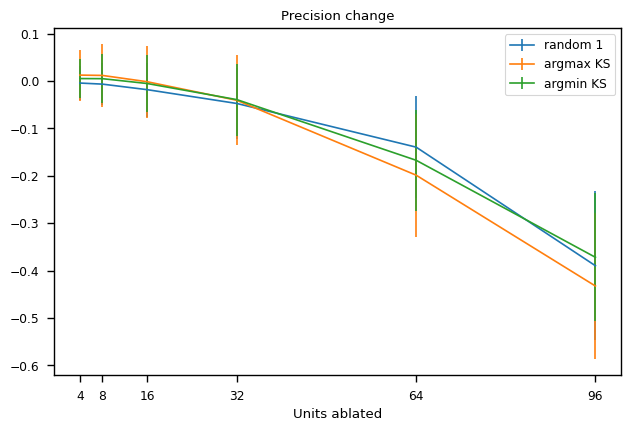

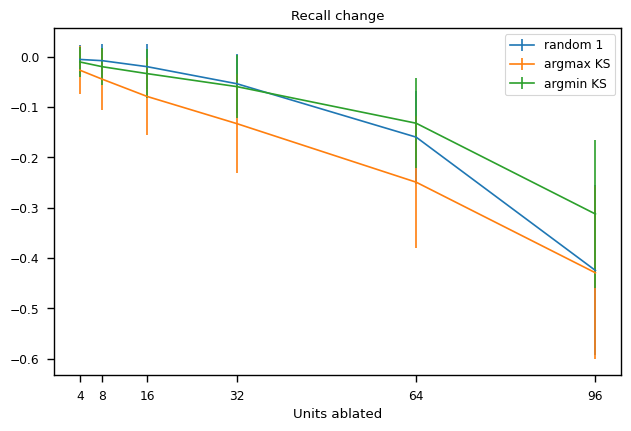

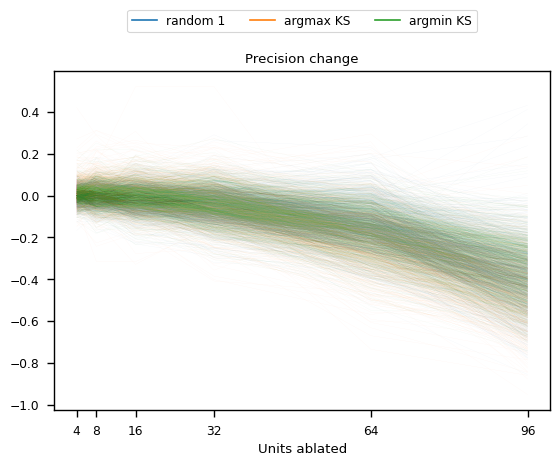

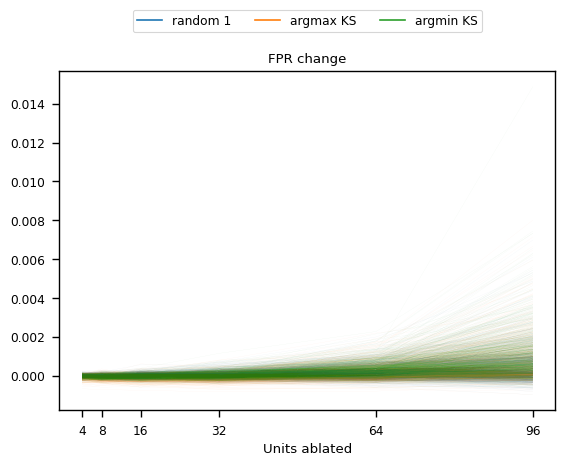

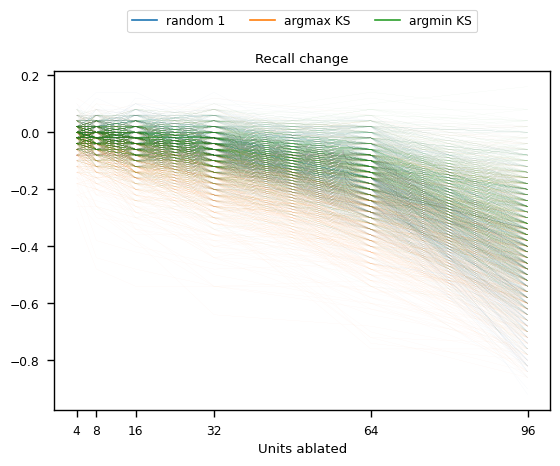

stored_activations/activations_on_validation_preserved_spatial_10_pretrained_imagenet.npy


8 disabled
0


time=6.480607032775879
1
time=2.3603439331054688e-05
2
time=1.5735626220703125e-05
3
time=1.2636184692382812e-05
4
time=1.1920928955078125e-05
5
time=1.1444091796875e-05
6
time=1.0967254638671875e-05
7
time=1.0967254638671875e-05
8
time=1.1205673217773438e-05
9
time=1.0967254638671875e-05
10
time=1.049041748046875e-05
11
time=1.049041748046875e-05
12
time=1.0967254638671875e-05
13
time=1.1205673217773438e-05
14
time=1.0728836059570312e-05
15
time=1.0967254638671875e-05
16
time=1.0967254638671875e-05
17
time=1.0728836059570312e-05
18
time=1.0728836059570312e-05
19
time=1.0967254638671875e-05
20
time=1.1205673217773438e-05
21
time=1.0728836059570312e-05
22
time=1.0728836059570312e-05
23
time=1.1444091796875e-05
24
time=1.0728836059570312e-05
25
time=1.0728836059570312e-05
26
time=1.0728836059570312e-05
27
time=1.0728836059570312e-05
28
time=1.0728836059570312e-05
29
time=1.049041748046875e-05
30
time=1.049041748046875e-05
31
time=1.049041748046875e-05
32
time=1.1444091796875e-05
33
time=

time=6.461351156234741
1
time=2.7179718017578125e-05
2
time=1.6689300537109375e-05
3
time=1.33514404296875e-05
4
time=1.3113021850585938e-05
5
time=1.2636184692382812e-05
6
time=1.1920928955078125e-05
7
time=1.1920928955078125e-05
8
time=1.2159347534179688e-05
9
time=1.1682510375976562e-05
10
time=1.1682510375976562e-05
11
time=1.1444091796875e-05
12
time=1.1682510375976562e-05
13
time=1.1920928955078125e-05
14
time=1.1682510375976562e-05
15
time=1.1920928955078125e-05
16
time=1.1920928955078125e-05
17
time=1.1682510375976562e-05
18
time=1.1682510375976562e-05
19
time=1.239776611328125e-05
20
time=1.1682510375976562e-05
21
time=1.1444091796875e-05
22
time=1.1444091796875e-05
23
time=1.1682510375976562e-05
24
time=1.1682510375976562e-05
25
time=1.1920928955078125e-05
26
time=1.1444091796875e-05
27
time=1.2159347534179688e-05
28
time=1.1920928955078125e-05
29
time=1.1444091796875e-05
30
time=1.1444091796875e-05
31
time=1.1444091796875e-05
32
time=1.239776611328125e-05
33
time=1.168251037

time=6.472982883453369
1
time=4.029273986816406e-05
2
time=1.9073486328125e-05
3
time=1.5974044799804688e-05
4
time=1.621246337890625e-05
5
time=1.5497207641601562e-05
6
time=1.52587890625e-05
7
time=1.5497207641601562e-05
8
time=1.5020370483398438e-05
9
time=1.4543533325195312e-05
10
time=1.4543533325195312e-05
11
time=1.4543533325195312e-05
12
time=1.430511474609375e-05
13
time=1.4543533325195312e-05
14
time=1.4066696166992188e-05
15
time=1.4543533325195312e-05
16
time=1.4781951904296875e-05
17
time=1.4543533325195312e-05
18
time=1.4066696166992188e-05
19
time=1.52587890625e-05
20
time=1.430511474609375e-05
21
time=1.4781951904296875e-05
22
time=1.4543533325195312e-05
23
time=1.4781951904296875e-05
24
time=1.4543533325195312e-05
25
time=1.52587890625e-05
26
time=1.4543533325195312e-05
27
time=1.4781951904296875e-05
28
time=1.52587890625e-05
29
time=1.4781951904296875e-05
30
time=1.430511474609375e-05
31
time=1.4543533325195312e-05
32
time=1.5020370483398438e-05
33
time=1.454353332519

time=6.541871786117554
1
time=0.00027680397033691406
2
time=2.3365020751953125e-05
3
time=1.9073486328125e-05
4
time=2.3126602172851562e-05
5
time=1.7642974853515625e-05
6
time=1.7642974853515625e-05
7
time=1.7881393432617188e-05
8
time=1.7642974853515625e-05
9
time=1.7404556274414062e-05
10
time=1.7404556274414062e-05
11
time=1.6927719116210938e-05
12
time=1.71661376953125e-05
13
time=1.811981201171875e-05
14
time=1.6927719116210938e-05
15
time=1.6927719116210938e-05
16
time=1.7404556274414062e-05
17
time=1.71661376953125e-05
18
time=1.71661376953125e-05
19
time=1.7404556274414062e-05
20
time=1.6927719116210938e-05
21
time=1.6927719116210938e-05
22
time=1.6927719116210938e-05
23
time=1.71661376953125e-05
24
time=1.6927719116210938e-05
25
time=1.71661376953125e-05
26
time=1.6927719116210938e-05
27
time=1.6689300537109375e-05
28
time=1.6927719116210938e-05
29
time=1.6689300537109375e-05
30
time=2.574920654296875e-05
31
time=1.6689300537109375e-05
32
time=1.7404556274414062e-05
33
time=1

time=6.700595378875732
1
time=0.000263214111328125
2
time=3.981590270996094e-05
3
time=3.123283386230469e-05
4
time=3.0994415283203125e-05
5
time=2.8133392333984375e-05
6
time=2.7894973754882812e-05
7
time=2.86102294921875e-05
8
time=2.7894973754882812e-05
9
time=2.7418136596679688e-05
10
time=2.8371810913085938e-05
11
time=2.6941299438476562e-05
12
time=2.7179718017578125e-05
13
time=2.8133392333984375e-05
14
time=2.6702880859375e-05
15
time=2.7418136596679688e-05
16
time=2.8133392333984375e-05
17
time=2.6941299438476562e-05
18
time=2.6702880859375e-05
19
time=3.790855407714844e-05
20
time=2.6464462280273438e-05
21
time=2.6464462280273438e-05
22
time=2.7179718017578125e-05
23
time=2.6464462280273438e-05
24
time=2.6464462280273438e-05
25
time=2.7418136596679688e-05
26
time=2.5987625122070312e-05
27
time=2.6226043701171875e-05
28
time=2.6941299438476562e-05
29
time=2.6226043701171875e-05
30
time=2.5987625122070312e-05
31
time=2.6702880859375e-05
32
time=2.574920654296875e-05
33
time=2.5

/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.730695962905884
1
time=0.00023365020751953125
2
time=4.935264587402344e-05
3
time=4.172325134277344e-05
4
time=4.172325134277344e-05
5
time=3.886222839355469e-05
6
time=3.814697265625e-05
7
time=3.9577484130859375e-05
8
time=3.743171691894531e-05
9
time=3.7670135498046875e-05
10
time=3.910064697265625e-05
11
time=3.695487976074219e-05
12
time=3.719329833984375e-05
13
time=3.8623809814453125e-05
14
time=3.647804260253906e-05
15
time=3.719329833984375e-05
16
time=3.886222839355469e-05
17
time=3.6716461181640625e-05
18
time=4.6253204345703125e-05
19
time=3.838539123535156e-05
20
time=3.5762786865234375e-05
21
time=3.600120544433594e-05
22
time=3.7670135498046875e-05
23
time=3.5762786865234375e-05
24
time=3.600120544433594e-05
25
time=3.790855407714844e-05
26
time=3.62396240234375e-05
27
time=3.647804260253906e-05
28
time=3.743171691894531e-05
29
time=3.552436828613281e-05
30
time=3.528594970703125e-05
31
time=3.743171691894531e-05
32
time=3.600120544433594e-05
33
time=3.57627868652

time=6.425384283065796
1


time=6.424644231796265
2


time=6.553966522216797
3


time=6.431417226791382
4


time=6.462588548660278
5


time=6.4264843463897705
6


time=6.428938865661621
7


time=6.429871082305908
8


time=6.474145174026489
9


time=6.436948299407959
10


time=6.433652877807617
11


time=6.440577507019043
12


time=6.440086364746094
13


time=6.4406514167785645
14


time=6.44028902053833
15


time=6.439199686050415
16


time=6.434778690338135
17


time=6.436058044433594
18


time=6.512996435165405
19


time=6.746499538421631
20


time=6.4729814529418945
21


time=6.611285448074341
22


time=6.4503419399261475
23


time=6.634213924407959
24


time=6.476342678070068
25


time=6.61374306678772
26


time=6.463811874389648
27


time=6.437570571899414
28


time=6.47004508972168
29


time=6.439291477203369
30


time=6.537719011306763
31


time=6.608062744140625
32


time=6.446982145309448
33


time=6.445993185043335
34


time=6.437830924987793
35


time=6.444170713424683
36


time=6.442203044891357
37


time=6.4358625411987305
38


time=6.480379104614258
39


time=6.744304895401001
40


time=6.570602655410767
41


time=6.446289539337158
42


time=6.437320709228516
43


time=6.44167685508728
44


time=6.436842441558838
45


time=6.506215810775757
46


time=6.4378111362457275
47


time=6.438032150268555
48


time=6.440796136856079
49


time=6.443573236465454
50


time=6.442763328552246
51


time=6.443998098373413
52


time=6.441819667816162
53


time=6.439614772796631
54


time=6.441410303115845
55


time=6.444634914398193
56


time=6.438694953918457
57


time=6.43303656578064
58


time=6.439215660095215
59


time=6.569341421127319
60


time=6.44093132019043
61


time=6.442022800445557
62


time=6.450089693069458
63


time=6.434917211532593
64


time=6.469047784805298
65


time=6.438692808151245
66


time=6.455682277679443
67


time=6.464045286178589
68


time=6.538764238357544
69


time=6.643272876739502
70


time=6.465685129165649
71


time=6.445309638977051
72


time=6.52412748336792
73


time=6.6530845165252686
74


time=6.443860054016113
75


time=6.471576690673828
76


time=6.5734899044036865
77


time=6.5607850551605225
78


time=6.59882926940918
79


time=6.678033113479614
80


time=6.6319661140441895
81


time=6.467126846313477
82


time=6.489278554916382
83


time=6.449504613876343
84


time=6.456348180770874
85


time=6.450570583343506
86


time=6.453496694564819
87


time=6.477877378463745
88


time=6.476842403411865
89


time=6.78340744972229
90


time=6.7428810596466064
91


time=6.6004979610443115
92


time=6.737926006317139
93


time=6.745631217956543
94


time=6.4660539627075195
95


time=6.4523701667785645
96


time=6.443387746810913
97


time=6.570903062820435
98


time=6.482860088348389
99


time=6.441555500030518
100


time=6.465611934661865
101


time=6.598079442977905
102


time=6.450869798660278
103


time=6.450666666030884
104


time=6.482659339904785
105


time=6.523479223251343
106


time=6.440119504928589
107


time=6.44821572303772
108


time=6.463148355484009
109


time=6.490250587463379
110


time=6.728718519210815
111


time=6.451430797576904
112


time=6.451289892196655
113


time=6.459948778152466
114


time=6.45304274559021
115


time=6.450445652008057
116


time=6.60277247428894
117


time=6.655422687530518
118


time=6.463690757751465
119


time=6.5745134353637695
120


time=6.461205959320068
121


time=6.455495834350586
122


time=6.458004713058472
123


time=6.447717905044556
124


time=6.4869232177734375
125


time=6.493285417556763
126


time=6.5375096797943115
127


time=6.572688817977905
128


time=6.525593519210815
129


time=6.446277141571045
130


time=6.4414989948272705
131


time=6.448456048965454
132


time=6.6601762771606445
133


time=6.5187883377075195
134


time=6.465696573257446
135


time=6.5664567947387695
136


time=6.443071126937866
137


time=6.450485467910767
138


time=6.468055725097656
139


time=6.454620361328125
140


time=6.727398633956909
141


time=6.500177621841431
142


time=6.453240394592285
143


time=6.455148458480835
144


time=6.444494962692261
145


time=6.758166790008545
146


time=6.615516662597656
147


time=6.622481822967529
148


time=6.495532035827637
149


time=6.467155456542969
150


time=6.453302621841431
151


time=6.47826361656189
152


time=6.468328952789307
153


time=6.565654754638672
154


time=6.593820571899414
155


time=6.5143797397613525
156


time=6.439571380615234
157


time=6.52625036239624
158


time=6.442803382873535
159


time=6.4389097690582275
160


time=6.451608180999756
161


time=6.436256170272827
162


time=6.450511693954468
163


time=6.490025520324707
164


time=6.457852840423584
165


time=6.553208589553833
166
time=0.00054168701171875
167


time=6.461023807525635
168


time=6.442457437515259
169


time=6.497873544692993
170


time=6.464895486831665
171


time=6.5243079662323
172


time=6.781087875366211
173


time=6.444978952407837
174


time=6.5707688331604
175


time=6.449749946594238
176


time=6.468840837478638
177


time=6.478358268737793
178


time=6.567536115646362
179


time=6.450239658355713
180


time=6.4503889083862305
181


time=6.498979330062866
182


time=6.54018497467041
183


time=6.445838451385498
184


time=6.475424289703369
185


time=6.448124647140503
186


time=6.445422649383545
187


time=6.456889390945435
188


time=6.4469146728515625
189


time=6.50261116027832
190


time=6.44387149810791
191


time=6.44420599937439
192


time=6.53644323348999
193


time=6.574544668197632
194


time=6.446229696273804
195


time=6.447355031967163
196


time=6.587162494659424
197


time=6.450098276138306
198


time=6.456031322479248
199


time=6.44472336769104
200


time=6.442927122116089
201


time=6.439765691757202
202


time=6.467993259429932
203


time=6.570289611816406
204


time=6.472139358520508
205


time=6.455632925033569
206


time=6.49470067024231
207


time=6.451385259628296
208


time=6.453429698944092
209


time=6.649764776229858
210


time=6.452033758163452
211


time=6.459151268005371
212


time=6.562557220458984
213


time=6.452338933944702
214


time=6.504664897918701
215


time=6.514891147613525
216


time=6.445129156112671
217


time=6.490206956863403
218


time=6.564981937408447
219


time=6.450263500213623
220


time=6.450516939163208
221


time=6.456784963607788
222


time=6.473096609115601
223


time=6.481168031692505
224


time=6.579298496246338
225


time=6.449625730514526
226


time=6.528484582901001
227


time=6.4487385749816895
228
time=0.0005261898040771484
229


time=6.448793649673462
230


time=6.4602391719818115
231
time=0.0005605220794677734
232


time=6.451692342758179
233


time=6.581850528717041
234


time=6.638431072235107
235


time=6.546237945556641
236


time=6.448712110519409
237


time=6.459751605987549
238


time=6.456143617630005
239


time=6.450041770935059
240


time=6.470196723937988
241


time=6.467472314834595
242


time=6.786880731582642
243


time=6.476142406463623
244


time=6.4795026779174805
245


time=6.47871208190918
246


time=6.451806545257568
247


time=6.615750551223755
248


time=6.613579273223877
249


time=6.465300559997559
250


time=6.5656843185424805
251


time=6.495456218719482
252


time=6.648676156997681
253


time=6.459709167480469
254


time=6.565990447998047
255


time=6.5362913608551025
256


time=6.452264785766602
257


time=6.449321746826172
258


time=6.44133186340332
259


time=6.464035987854004
260


time=6.55786919593811
261


time=6.571219444274902
262


time=6.7025933265686035
263


time=6.473841905593872
264


time=6.578569173812866
265


time=6.47767972946167
266


time=6.455124139785767
267


time=6.470613956451416
268


time=6.629328012466431
269


time=6.455248832702637
270


time=6.454706192016602
271


time=6.5797669887542725
272


time=6.469873428344727
273


time=6.46016263961792
274


time=6.462644338607788
275


time=6.456880807876587
276


time=6.448683261871338
277


time=6.447260618209839
278


time=6.472135066986084
279


time=6.501389503479004
280


time=6.478861570358276
281


time=6.467036485671997
282


time=6.452100038528442
283


time=6.48218560218811
284


time=6.466500520706177
285


time=6.498546123504639
286


time=6.458745002746582
287


time=6.462284803390503
288


time=6.521434307098389
289


time=6.668882131576538
290


time=6.580856561660767
291


time=6.4845640659332275
292


time=6.449876070022583
293


time=6.452054023742676
294


time=6.575714588165283
295


time=6.588312387466431
296


time=6.466585397720337
297


time=6.472145318984985
298


time=6.561233758926392
299


time=6.452676296234131
300


time=6.458340883255005
301


time=6.477908611297607
302


time=6.450615644454956
303


time=6.460242748260498
304


time=6.456967115402222
305


time=6.447695255279541
306


time=6.4840474128723145
307


time=6.458822965621948
308


time=6.527174949645996
309


time=6.620325803756714
310


time=6.691852807998657
311


time=6.591617822647095
312


time=6.4599385261535645
313


time=6.462182521820068
314


time=6.457823276519775
315


time=6.462617635726929
316


time=6.461313247680664
317


time=6.461358070373535
318


time=6.467508316040039
319


time=6.462317943572998
320


time=6.463125467300415
321


time=6.455476522445679
322


time=6.462885618209839
323


time=6.461384296417236
324


time=6.466559410095215
325


time=6.465083599090576
326


time=6.465210676193237
327


time=6.4589879512786865
328


time=6.5784056186676025
329


time=6.4680564403533936
330


time=6.464579343795776
331


time=6.458927154541016
332


time=6.4624245166778564
333


time=6.511109828948975
334


time=6.46327018737793
335


time=6.466725826263428
336


time=6.506918907165527
337


time=6.475945234298706
338


time=6.467487573623657
339


time=6.475927829742432
340


time=6.5412023067474365
341


time=6.466225624084473
342


time=6.457482576370239
343


time=6.456589698791504
344


time=6.477713108062744
345


time=6.579017877578735
346


time=6.526632308959961
347


time=6.616220951080322
348


time=6.510483026504517
349


time=6.45231556892395
350


time=6.461755990982056
351


time=6.524963617324829
352


time=6.468942880630493
353


time=6.496156454086304
354


time=6.445249319076538
355


time=6.455873489379883
356


time=6.4969563484191895
357


time=6.531555891036987
358


time=6.466187000274658
359


time=6.4576942920684814
360


time=6.448871374130249
361


time=6.448595285415649
362


time=6.45621657371521
363


time=6.446189641952515
364


time=6.452803134918213
365


time=6.500334978103638
366


time=6.5782105922698975
367


time=6.449501276016235
368


time=6.449389934539795
369


time=6.446304082870483
370


time=6.447568893432617
371


time=6.454939365386963
372


time=6.452309608459473
373


time=6.454830646514893
374


time=6.451952934265137
375


time=6.456231355667114
376


time=6.454723834991455
377


time=6.447688102722168
378


time=6.449907302856445
379


time=6.506322145462036
380


time=6.443013906478882
381


time=6.451986312866211
382


time=6.45930814743042
383


time=6.448960781097412
384


time=6.449402570724487
385


time=6.4489452838897705
386


time=6.578246355056763
387


time=6.4552271366119385
388


time=6.451758623123169
389


time=6.4541404247283936
390


time=6.453371047973633
391


time=6.45020866394043
392


time=6.4568212032318115
393


time=6.4512903690338135
394


time=6.455901384353638
395


time=6.455435514450073
396


time=6.501894950866699
397


time=6.45281457901001
398


time=6.452398777008057
399


time=6.463792562484741
400


time=6.445592880249023
401


time=6.456026077270508
402


time=6.451428413391113
403


time=6.448086500167847
404


time=6.449795722961426
405


time=6.578798770904541
406


time=6.460914611816406
407


time=6.457300424575806
408


time=6.450899124145508
409


time=6.46263575553894
410


time=6.4525251388549805
411


time=6.4492573738098145
412


time=6.455973863601685
413


time=6.494777202606201
414


time=6.462559461593628
415


time=6.45010232925415
416


time=6.461040735244751
417


time=6.449901103973389
418


time=6.451019287109375
419


time=6.45783543586731
420


time=6.452252388000488
421


time=6.450159311294556
422


time=6.448734760284424
423


time=6.454653739929199
424


time=6.578008413314819
425


time=6.450820207595825
426


time=6.452847242355347
427


time=6.4729249477386475
428


time=6.46064829826355
429


time=6.456321954727173
430


time=6.49102520942688
431


time=6.455296754837036
432


time=6.450277328491211
433


time=6.4547600746154785
434


time=6.461802244186401
435


time=6.450414657592773
436


time=6.458015441894531
437


time=6.449475049972534
438


time=6.45551323890686
439


time=6.452117204666138
440


time=6.453736782073975
441


time=6.444540500640869
442


time=6.454841613769531
443


time=6.5725884437561035
444


time=6.492573261260986
445


time=6.446513414382935
446


time=6.458778619766235
447


time=6.495441436767578
448


time=6.4485790729522705
449


time=6.452537298202515
450


time=6.447419166564941
451


time=6.45182991027832
452


time=6.449950456619263
453


time=6.456930160522461
454


time=6.443768501281738
455


time=6.451819658279419
456


time=6.449272632598877
457


time=6.459397077560425
458


time=6.449919939041138
459


time=6.45512580871582
460


time=6.4455883502960205
461


time=6.508729457855225
462


time=6.577200889587402
463


time=6.453975200653076
464


time=6.493481636047363
465


time=6.457890033721924
466


time=6.443093776702881
467


time=6.455236911773682
468


time=6.443949460983276
469


time=6.448168516159058
470


time=6.4515345096588135
471


time=6.450845003128052
472


time=6.447250604629517
473


time=6.450982570648193
474


time=6.4525439739227295
475


time=6.451453685760498
476


time=6.444873809814453
477


time=6.4508585929870605
478


time=6.542677640914917
479


time=6.444581985473633
480


time=6.448398590087891
481


time=6.573434114456177
482


time=6.456840753555298
483


time=6.451412677764893
484


time=6.453436851501465
485


time=6.465926170349121
486


time=6.463768482208252
487


time=6.466079950332642
488


time=6.466652154922485
489


time=6.456648349761963
490


time=6.460914850234985
491


time=6.4623799324035645
492


time=6.457204103469849
493


time=6.464137554168701
494


time=6.460274934768677
495


time=6.491541385650635
496


time=6.46661114692688
497


time=6.464121103286743
498


time=6.461552858352661
499


time=6.459760665893555
500


time=6.582634925842285
501


time=6.456828355789185
502


time=6.456613063812256
503


time=6.461627960205078
504


time=6.456561088562012
505


time=6.464945554733276
506


time=6.449714183807373
507


time=6.455399990081787
508


time=6.462936162948608
509


time=6.451737880706787
510


time=6.465046167373657
511


time=6.457415342330933
512


time=6.487390756607056
513


time=6.458315372467041
514


time=6.46289587020874
515


time=6.469135046005249
516


time=6.461435556411743
517


time=6.458579778671265
518


time=6.453486442565918
519


time=6.581621408462524
520


time=6.461950302124023
521


time=6.459362506866455
522


time=6.457488298416138
523


time=6.4568047523498535
524


time=6.4538116455078125
525


time=6.465382814407349
526


time=6.457014322280884
527


time=6.457506895065308
528


time=6.455401659011841
529


time=6.515413045883179
530


time=6.456700325012207
531


time=6.459567070007324
532


time=6.453184604644775
533


time=6.459786891937256
534


time=6.460443735122681
535


time=6.462400913238525
536


time=6.457184791564941
537


time=6.4597625732421875
538


time=6.583024263381958
539


time=6.4584455490112305
540


time=6.4621360301971436
541


time=6.458778619766235
542


time=6.469990968704224
543


time=6.464761257171631
544


time=6.456486701965332
545


time=6.461841344833374
546


time=6.509935617446899
547


time=6.452077627182007
548


time=6.459904193878174
549


time=6.46365761756897
550


time=6.458089113235474
551


time=6.463872909545898
552


time=6.456377983093262
553


time=6.459142446517944
554


time=6.452892541885376
555


time=6.449309825897217
556


time=6.461217164993286
557


time=6.58074426651001
558


time=6.464012861251831
559


time=6.464813709259033
560


time=6.463604211807251
561


time=6.457566976547241
562


time=6.462002515792847
563


time=6.56139349937439
564


time=6.460401296615601
565


time=6.449753046035767
566


time=6.4600300788879395
567


time=6.446340799331665
568


time=6.451426267623901
569


time=6.459182977676392
570


time=6.459286689758301
571


time=6.4537248611450195
572


time=6.455397367477417
573


time=6.447798490524292
574


time=6.451201677322388
575


time=6.4506590366363525
576


time=6.597859144210815
577


time=6.4563398361206055
578


time=6.451466798782349
579


time=6.448628187179565
580


time=6.493380546569824
581


time=6.44921875
582


time=6.465454816818237
583


time=6.443791627883911
584


time=6.448925733566284
585


time=6.445441484451294
586


time=6.447504043579102
587


time=6.446593523025513
588


time=6.451196193695068
589


time=6.449548721313477
590


time=6.447583198547363
591


time=6.444821119308472
592


time=6.44989800453186
593


time=6.4420764446258545
594


time=6.509222507476807
595


time=6.5705788135528564
596


time=6.468548774719238
597


time=6.495792865753174
598


time=6.456967115402222
599


time=6.4579126834869385
600


time=6.447662353515625
601


time=6.454585552215576
602


time=6.457022428512573
603


time=6.459881544113159
604


time=6.457285642623901
605


time=6.4547119140625
606


time=6.456661224365234
607


time=6.452089786529541
608


time=6.459072589874268
609


time=6.4590723514556885
610


time=6.457550764083862
611


time=6.493785619735718
612


time=6.4600913524627686
613


time=6.457733631134033
614


time=6.5863940715789795
615


time=6.4546897411346436
616


time=6.4554057121276855
617


time=6.45461630821228
618


time=6.453836441040039
619


time=6.450612783432007
620


time=6.4591522216796875
621


time=6.4512598514556885
622


time=6.454344272613525
623


time=6.4580771923065186
624


time=6.458000898361206
625


time=6.460171461105347
626


time=6.4607696533203125
627


time=6.459238290786743
628


time=6.495598077774048
629


time=6.455811262130737
630


time=6.457576274871826
631


time=6.461108446121216
632


time=6.453453302383423
633


time=6.583502292633057
634


time=6.452544689178467
635


time=6.452446222305298
636


time=6.445450782775879
637


time=6.461117506027222
638


time=6.4556355476379395
639


time=6.467244386672974
640


time=6.457954406738281
641


time=6.458497524261475
642


time=6.457482814788818
643


time=6.449722528457642
644


time=6.455095291137695
645


time=6.5171589851379395
646


time=6.458456039428711
647


time=6.45701789855957
648


time=6.455301523208618
649


time=6.448593616485596
650


time=6.447271108627319
651


time=6.455037355422974
652


time=6.575228691101074
653


time=6.45510721206665
654


time=6.44459080696106
655


time=6.446143388748169
656


time=6.452762603759766
657


time=6.44904637336731
658


time=6.462524175643921
659


time=6.4525134563446045
660


time=6.446837425231934
661


time=6.457462310791016
662


time=6.49155330657959
663


time=6.454312086105347
664


time=6.45602560043335
665


time=6.460203170776367
666


time=6.457131624221802
667


time=6.450976371765137
668


time=6.456283092498779
669


time=6.453167676925659
670


time=6.4481024742126465
671


time=6.571901082992554
672


time=6.457762718200684
673


time=6.45759129524231
674


time=6.460817098617554
675


time=6.460725784301758
676


time=6.453459978103638
677


time=6.4574196338653564
678


time=6.449397563934326
679


time=6.486008644104004
680


time=6.451266527175903
681


time=6.4537811279296875
682


time=6.454392433166504
683


time=6.4524335861206055
684


time=6.449755668640137
685


time=6.449589014053345
686


time=6.44982647895813
687


time=6.45599102973938
688


time=6.456435918807983
689


time=6.45323371887207
690


time=6.571727514266968
691


time=6.4545817375183105
692


time=6.468507289886475
693


time=6.467536687850952
694


time=6.454050540924072
695


time=6.447349786758423
696


time=6.4848668575286865
697


time=6.451576232910156
698


time=6.45671820640564
699


time=6.456090927124023
700


time=6.455080986022949
701


time=6.457077264785767
702


time=6.454041004180908
703


time=6.44842004776001
704


time=6.448815584182739
705


time=6.452196359634399
706


time=6.456831216812134
707


time=6.4603753089904785
708


time=6.4575889110565186
709


time=6.57326865196228
710


time=6.529107570648193
711


time=6.450221300125122
712


time=6.456112861633301
713


time=6.471716403961182
714


time=6.453667402267456
715


time=6.452328205108643
716


time=6.4523539543151855
717


time=6.4585511684417725
718


time=6.457043409347534
719


time=6.457485675811768
720


time=6.459025144577026
721


time=6.449120759963989
722


time=6.462617635726929
723


time=6.4597272872924805
724


time=6.455245494842529
725


time=6.461284160614014
726


time=6.458639860153198
727


time=6.512272357940674
728


time=6.571694850921631
729


time=6.459234237670898
730


time=6.468383073806763
731


time=6.464197635650635
732


time=6.490562200546265
733


time=6.452561855316162
734


time=6.457373380661011
735


time=6.463390588760376
736


time=6.461034774780273
737


time=6.463932514190674
738


time=6.455491781234741
739


time=6.4628331661224365
740


time=6.461422681808472
741


time=6.447882890701294
742


time=6.461215257644653
743


time=6.454315900802612
744


time=6.513682842254639
745


time=6.4582977294921875
746


time=6.448359251022339
747


time=6.574004650115967
748


time=6.475869178771973
749


time=6.453864336013794
750


time=6.454395294189453
751


time=6.455514669418335
752


time=6.457747220993042
753


time=6.456375360488892
754


time=6.45525336265564
755


time=6.45696759223938
756


time=6.449112415313721
757


time=6.458367586135864
758


time=6.45381498336792
759


time=6.451161861419678
760


time=6.456094741821289
761


time=6.4957404136657715
762


time=6.452752351760864
763


time=6.457527160644531
764


time=6.455155372619629
765


time=6.45719838142395
766


time=6.572908401489258
767


time=6.4552247524261475
768


time=6.461826324462891
769


time=6.458874702453613
770


time=6.4556097984313965
771


time=6.4632532596588135
772


time=6.4574103355407715
773


time=6.452925443649292
774


time=6.458522081375122
775


time=6.456489562988281
776


time=6.461144924163818
777


time=6.454683303833008
778


time=6.494190454483032
779


time=6.447685480117798
780


time=6.451133489608765
781


time=6.452408075332642
782


time=6.452914714813232
783


time=6.462408065795898
784


time=6.459118843078613
785


time=6.582766056060791
786


time=6.454144477844238
787


time=6.456674337387085
788


time=6.462717771530151
789


time=6.45728874206543
790


time=6.45705771446228
791


time=6.462476015090942
792


time=6.480545997619629
793


time=6.461466550827026
794


time=6.459982395172119
795


time=6.523787260055542
796


time=6.461414337158203
797


time=6.456907749176025
798


time=6.456735372543335
799


time=6.460513114929199
800


time=6.451023101806641
801


time=6.455981731414795
802


time=6.453312397003174
803


time=6.4547812938690186
804


time=6.5769078731536865
805


time=6.452231407165527
806


time=6.455032110214233
807


time=6.453254461288452
808


time=6.457418203353882
809


time=6.453439950942993
810


time=6.449032783508301
811


time=6.459612846374512
812


time=6.476114273071289
813


time=6.453688144683838
814


time=6.4588868618011475
815


time=6.452747821807861
816


time=6.455469131469727
817


time=6.449886083602905
818


time=6.456341505050659
819


time=6.450290679931641
820


time=6.458775758743286
821


time=6.454310655593872
822


time=6.456154108047485
823


time=6.576812505722046
824


time=6.470461368560791
825


time=6.4588634967803955
826


time=6.510236978530884
827


time=6.454671621322632
828


time=6.451658010482788
829


time=6.491747617721558
830


time=6.453514814376831
831


time=6.448591709136963
832


time=6.457291603088379
833


time=6.4521355628967285
834


time=6.451617002487183
835


time=6.448105812072754
836


time=6.457782506942749
837


time=6.447782754898071
838


time=6.455857515335083
839


time=6.452219486236572
840


time=6.452053546905518
841


time=6.452600479125977
842


time=6.579267501831055
843


time=6.519503355026245
844


time=6.4582929611206055
845


time=6.453271150588989
846


time=6.477285623550415
847


time=6.458091974258423
848


time=6.449686288833618
849


time=6.452659606933594
850


time=6.446570158004761
851


time=6.447438478469849
852


time=6.449671268463135
853


time=6.4460062980651855
854


time=6.451105117797852
855


time=6.453736305236816
856


time=6.454104661941528
857


time=6.45749306678772
858


time=6.454206466674805
859


time=6.451217412948608
860


time=6.4956886768341064
861


time=6.5753631591796875
862


time=6.449365615844727
863


time=6.454463005065918
864


time=6.451497316360474
865


time=6.452392816543579
866


time=6.456500768661499
867


time=6.451517105102539
868


time=6.4535064697265625
869


time=6.446383237838745
870


time=6.4508678913116455
871


time=6.4508280754089355
872


time=6.455424070358276
873


time=6.455498218536377
874


time=6.458019018173218
875


time=6.453109264373779
876


time=6.453149795532227
877


time=6.487246990203857
878


time=6.452388286590576
879


time=6.454414367675781
880


time=6.570961952209473
881


time=6.449401617050171
882


time=6.455312013626099
883


time=6.449322462081909
884


time=6.455110549926758
885


time=6.455885648727417
886


time=6.457780122756958
887


time=6.456097602844238
888


time=6.454953193664551
889


time=6.450737714767456
890


time=6.45603084564209
891


time=6.489706993103027
892


time=6.454054117202759
893


time=6.453627586364746
894


time=6.488862752914429
895


time=6.455059051513672
896


time=6.4548540115356445
897


time=6.4563963413238525
898


time=6.462792158126831
899


time=6.576809644699097
900


time=6.458034515380859
901


time=6.4579691886901855
902


time=6.4571311473846436
903


time=6.460413694381714
904


time=6.458470106124878
905


time=6.460221290588379
906


time=6.458174467086792
907


time=6.452963590621948
908


time=6.470126628875732
909


time=6.460627317428589
910


time=6.4495322704315186
911


time=6.502819538116455
912


time=6.4577956199646
913


time=6.452437400817871
914


time=6.459580898284912
915


time=6.454537391662598
916


time=6.457340240478516
917


time=6.449152231216431
918


time=6.578463792800903
919


time=6.458228826522827
920


time=6.448693513870239
921


time=6.45301079750061
922


time=6.453850507736206
923


time=6.4569268226623535
924


time=6.459008693695068
925


time=6.494349002838135
926


time=6.458125352859497
927


time=6.457526922225952
928


time=6.481603622436523
929


time=6.462427377700806
930


time=6.458897590637207
931


time=6.461836576461792
932


time=6.461423635482788
933


time=6.455962181091309
934


time=6.4539124965667725
935


time=6.448678731918335
936


time=6.461219310760498
937


time=6.585572957992554
938


time=6.458271265029907
939


time=6.45964789390564
940


time=6.459787845611572
941


time=6.4605138301849365
942


time=6.512275218963623
943


time=6.453717470169067
944


time=6.453816890716553
945


time=6.483370304107666
946


time=6.458226680755615
947


time=6.453730583190918
948


time=6.444514036178589
949


time=6.455920457839966
950


time=6.454496145248413
951


time=6.451551914215088
952


time=6.46025276184082
953


time=6.4560277462005615
954


time=6.455572605133057
955


time=6.45506477355957
956


time=6.574755907058716
957


time=6.456874847412109
958


time=6.4519572257995605
959


time=6.504929542541504
960


time=6.450023889541626
961


time=6.444810628890991
962


time=6.4626312255859375
963


time=6.4557623863220215
964


time=6.451208114624023
965


time=6.452125310897827
966


time=6.444514513015747
967


time=6.4449334144592285
968


time=6.4512810707092285
969


time=6.44752049446106
970


time=6.450861692428589
971


time=6.443698167800903
972


time=6.4712584018707275
973


time=6.4449732303619385
974


time=6.4474098682403564
975


time=6.572282075881958
976


time=6.496749639511108
977


time=6.4501307010650635
978


time=6.445409774780273
979


time=6.44649600982666
980


time=6.450032711029053
981


time=6.444886684417725
982


time=6.448576927185059
983


time=6.461132049560547
984


time=6.45686411857605
985


time=6.451629638671875
986


time=6.4545629024505615
987


time=6.449919939041138
988


time=6.46014142036438
989


time=6.459995269775391
990


time=6.465345621109009
991


time=6.448824644088745
992


time=6.454989910125732
993


time=6.493085622787476
994


time=6.580198049545288
995


time=6.452672719955444
996


time=6.449941635131836
997


time=6.456871032714844
998


time=6.451940298080444
999


time=6.455950975418091
16 disabled
0


time=6.473220109939575
1


time=6.472779273986816
2


time=6.479448080062866
3


time=6.476485252380371
4


time=6.47212028503418
5


time=6.4642040729522705
6


time=6.475451231002808
7


time=6.482784032821655
8


time=6.481072187423706
9


time=6.4920384883880615
10


time=6.517984390258789
11


time=6.4825732707977295
12


time=6.476979732513428
13


time=6.5987548828125
14


time=6.473477840423584
15


time=6.472319841384888
16


time=6.478420257568359
17


time=6.477313280105591
18


time=6.47729754447937
19


time=6.476708650588989
20


time=6.475934267044067
21


time=6.472282648086548
22


time=6.473181486129761
23


time=6.477457761764526
24


time=6.474786281585693
25


time=6.477663993835449
26


time=6.474382162094116
27


time=6.538813352584839
28


time=6.478129863739014
29


time=6.477674245834351
30


time=6.494409084320068
31


time=6.4761762619018555
32


time=6.601654291152954
33


time=6.4698708057403564
34


time=6.466488361358643
35


time=6.473717451095581
36


time=6.467081546783447
37


time=6.474078416824341
38


time=6.477089881896973
39


time=6.475674867630005
40


time=6.481884479522705
41


time=6.473628997802734
42


time=6.477710008621216
43


time=6.480436086654663
44


time=6.49655294418335
45


time=6.472383975982666
46


time=6.472610712051392
47


time=6.525614261627197
48


time=6.4717183113098145
49


time=6.470195293426514
50


time=6.473024606704712
51


time=6.598164319992065
52


time=6.4789512157440186
53


time=6.474892616271973
54


time=6.469947338104248
55


time=6.477615118026733
56


time=6.47240686416626
57


time=6.472763299942017
58


time=6.4767091274261475
59


time=6.477667808532715
60


time=6.481525182723999
61


time=6.479752779006958
62


time=6.480603456497192
63


time=6.468930244445801
64


time=6.522340536117554
65


time=6.473165035247803
66


time=6.468815803527832
67


time=6.477739334106445
68


time=6.476162433624268
69


time=6.478864669799805
70


time=6.601394414901733
71


time=6.467441082000732
72


time=6.466431140899658
73


time=6.469482898712158
74


time=6.467022895812988
75


time=6.474308490753174
76


time=6.476567268371582
77


time=6.472476482391357
78


time=6.467060327529907
79


time=6.4728569984436035
80


time=6.477834939956665
81


time=6.499539375305176
82


time=6.472309112548828
83


time=6.469544172286987
84


time=6.508064270019531
85


time=6.472090721130371
86


time=6.47035813331604
87


time=6.481046199798584
88


time=6.473627090454102
89


time=6.595709562301636
90


time=6.471157789230347
91


time=6.470425367355347
92


time=6.469028472900391
93


time=6.475524425506592
94


time=6.478321075439453
95


time=6.476315975189209
96


time=6.47110652923584
97


time=6.469034671783447
98


time=6.463845729827881
99


time=6.469438314437866
100


time=6.465527534484863
101


time=6.5332653522491455
102


time=6.4669530391693115
103


time=6.470641851425171
104


time=6.472040176391602
105


time=6.477650165557861
106


time=6.469286680221558
107


time=6.464788198471069
108


time=6.60616135597229
109


time=6.469412565231323
110


time=6.486922025680542
111


time=6.468344449996948
112


time=6.470956325531006
113


time=6.479952096939087
114


time=6.475382566452026
115


time=6.4706854820251465
116


time=6.4752092361450195
117


time=6.4677650928497314
118


time=6.515038013458252
119


time=6.46883487701416
120


time=6.475494146347046
121


time=6.4880475997924805
122


time=6.476605415344238
123


time=6.473132133483887
124


time=6.468186616897583
125


time=6.465552806854248
126


time=6.469403505325317
127


time=6.5974156856536865
128


time=6.474416017532349
129


time=6.469286203384399
130


time=6.466561794281006
131


time=6.4716713428497314
132


time=6.468316555023193
133


time=6.473739385604858
134


time=6.489207029342651
135


time=6.540048122406006
136


time=6.469716548919678
137


time=6.4695045948028564
138


time=6.514113903045654
139


time=6.464061260223389
140


time=6.479226350784302
141


time=6.473536729812622
142


time=6.461795806884766
143


time=6.468988418579102
144


time=6.467744827270508
145


time=6.473839044570923
146


time=6.588582992553711
147


time=6.467695713043213
148


time=6.466917991638184
149


time=6.472134113311768
150


time=6.47003436088562
151


time=6.4695165157318115
152


time=6.471864461898804
153


time=6.469940662384033
154


time=6.479443788528442
155


time=6.517531633377075
156


time=6.476539134979248
157


time=6.48053240776062
158


time=6.481123685836792
159


time=6.47886848449707
160


time=6.464417934417725
161


time=6.48162055015564
162


time=6.478692531585693
163


time=6.467728137969971
164


time=6.473395109176636
165


time=6.5992560386657715
166


time=6.4802117347717285
167


time=6.481003761291504
168


time=6.477856159210205
169


time=6.47641396522522
170


time=6.476710319519043
171


time=6.475837707519531
172


time=6.526454448699951
173


time=6.481618642807007
174


time=6.47706937789917
175


time=6.5262885093688965
176


time=6.48204493522644
177


time=6.473139762878418
178


time=6.469656229019165
179


time=6.473691940307617
180


time=6.468714952468872
181


time=6.474758863449097
182


time=6.47655463218689
183


time=6.478233098983765
184


time=6.6007239818573
185


time=6.470951557159424
186


time=6.468745470046997
187


time=6.476288557052612
188


time=6.476043224334717
189


time=6.46923303604126
190


time=6.471131086349487
191


time=6.471913576126099
192


time=6.520439624786377
193


time=6.486692905426025
194


time=6.481616735458374
195


time=6.487537145614624
196


time=6.477744102478027
197


time=6.479751110076904
198


time=6.472120761871338
199


time=6.4760589599609375
200


time=6.474771738052368
201


time=6.475706100463867
202


time=6.482075452804565
203


time=6.594243049621582
204


time=6.472957134246826
205


time=6.476550102233887
206


time=6.473837614059448
207


time=6.472082614898682
208


time=6.476850509643555
209


time=6.51422905921936
210


time=6.478973150253296
211


time=6.476937294006348
212


time=6.519166946411133
213


time=6.481259107589722
214


time=6.494645118713379
215


time=6.4808454513549805
216


time=6.519028425216675
217


time=6.658458948135376
218


time=6.490637302398682
219


time=6.59106969833374
220


time=6.792356491088867
221


time=6.539653062820435
222


time=6.609445095062256
223


time=6.483652353286743
224


time=6.475224494934082
225


time=6.473440647125244
226


time=6.525477170944214
227


time=6.476410388946533
228


time=6.473050355911255
229


time=6.477211236953735
230


time=6.476685523986816
231


time=6.474853992462158
232


time=6.523054838180542
233


time=6.473700523376465
234


time=6.505903244018555
235


time=6.53031063079834
236


time=6.483716249465942
237


time=6.629664897918701
238


time=6.636402130126953
239


time=6.472022294998169
240


time=6.465562582015991
241


time=6.607030868530273
242


time=6.4801905155181885
243


time=6.468034029006958
244


time=6.466634750366211
245


time=6.471345901489258
246


time=6.472045421600342
247


time=6.4735329151153564
248


time=6.47200608253479
249


time=6.4744062423706055
250


time=6.46782112121582
251


time=6.466851472854614
252


time=6.5230326652526855
253


time=6.4745213985443115
254


time=6.493426561355591
255


time=6.818223237991333
256


time=6.709530353546143
257


time=6.5080437660217285
258


time=6.5603859424591064
259


time=6.481243133544922
260


time=6.596151351928711
261


time=6.482201099395752
262


time=6.478853225708008
263


time=6.477360010147095
264


time=6.4992146492004395
265


time=6.627044916152954
266


time=6.4840850830078125
267


time=6.61644172668457
268


time=6.475252628326416
269


time=6.4795286655426025
270


time=6.482019901275635
271


time=6.4723803997039795
272


time=6.568850994110107
273


time=6.469683885574341
274


time=6.4886157512664795
275


time=6.482008218765259
276


time=6.51231050491333
277


time=6.4766340255737305
278


time=6.519087314605713
279


time=6.608732223510742
280


time=6.48148775100708
281


time=6.510409832000732
282


time=6.497170686721802
283


time=6.665341377258301
284


time=6.509931802749634
285


time=6.621026992797852
286


time=6.668329238891602
287


time=6.473609924316406
288


time=6.471669673919678
289


time=6.477187156677246
290


time=6.518216133117676
291


time=6.488296747207642
292


time=6.4737513065338135
293


time=6.473419904708862
294


time=6.482220888137817
295


time=6.482111215591431
296


time=6.479466199874878
297


time=6.515608549118042
298


time=6.6092870235443115
299


time=6.784618854522705
300


time=6.514904499053955
301


time=6.500036001205444
302


time=6.502943515777588
303


time=6.611188650131226
304


time=6.553723573684692
305


time=6.47193455696106
306


time=6.622244119644165
307


time=6.508348703384399
308


time=6.627666234970093
309


time=6.483265399932861
310


time=6.660212755203247
311


time=6.4892659187316895
312


time=6.502335548400879
313


time=6.577688217163086
314


time=6.482971906661987
315


time=6.484379529953003
316


time=6.4773478507995605
317


time=6.616232872009277
318


time=6.4786458015441895
319


time=6.49144721031189
320


time=6.581174373626709
321


time=6.691609621047974
322


time=6.52324366569519
323


time=6.478792905807495
324


time=6.58657693862915
325


time=6.495426416397095
326


time=6.501302480697632
327


time=6.5363500118255615
328


time=6.478511095046997
329


time=6.4812421798706055
330


time=6.540426015853882
331


time=6.482217788696289
332


time=6.615041494369507
333


time=6.4803454875946045
334


time=6.4877541065216064
335


time=6.474331617355347
336


time=6.609042644500732
337


time=6.47315526008606
338


time=6.476269721984863
339


time=6.484055757522583
340


time=6.482101917266846
341


time=6.558622598648071
342


time=6.480567693710327
343


time=6.473694086074829
344


time=6.479579925537109
345


time=6.559751987457275
346


time=6.5814385414123535
347


time=6.555497407913208
348


time=6.481041193008423
349


time=6.571481466293335
350


time=6.537820100784302
351


time=6.567837953567505
352


time=6.4753453731536865
353


time=6.522525072097778
354


time=6.483761548995972
355


time=6.607428550720215
356


time=6.478132009506226
357


time=6.476980924606323
358


time=6.485257863998413
359


time=6.703384637832642
360


time=6.596476793289185
361


time=6.5877275466918945
362


time=6.538501262664795
363


time=6.504133224487305
364


time=6.606718301773071
365


time=6.490411758422852
366


time=6.6642608642578125
367


time=6.535067319869995
368


time=6.534427642822266
369


time=6.482022047042847
370


time=6.487670421600342
371


time=6.596456527709961
372


time=6.531829118728638
373


time=6.588803291320801
374


time=6.623064756393433
375


time=6.4916462898254395
376


time=6.509165048599243
377


time=6.492067337036133
378


time=6.478783845901489
379


time=6.510027647018433
380


time=6.475595712661743
381


time=6.479614019393921
382


time=6.502090692520142
383


time=6.476921558380127
384


time=6.48701810836792
385


time=6.477256536483765
386


time=6.4784533977508545
387


time=6.483008146286011
388


time=6.466552972793579
389


time=6.478137254714966
390


time=6.499220132827759
391


time=6.597138166427612
392


time=6.481678009033203
393


time=6.594693899154663
394


time=6.485735893249512
395


time=6.479344844818115
396


time=6.527723073959351
397


time=6.4830286502838135
398


time=6.501208543777466
399


time=6.69694972038269
400


time=6.479116201400757
401


time=6.682465314865112
402


time=6.5304436683654785
403


time=6.4774017333984375
404


time=6.470346927642822
405


time=6.469184875488281
406


time=6.485241651535034
407


time=6.475274562835693
408


time=6.493786811828613
409


time=6.502294301986694
410


time=6.477250814437866
411


time=6.485493183135986
412


time=6.609324932098389
413


time=6.490434885025024
414


time=6.489483594894409
415


time=6.481470108032227
416


time=6.497891426086426
417


time=6.556625843048096
418


time=6.504611968994141
419


time=6.581415414810181
420


time=6.5203940868377686
421


time=6.491302490234375
422


time=6.54734468460083
423


time=6.475206136703491
424


time=6.484856605529785
425


time=6.489017963409424
426


time=6.505056858062744
427


time=6.642320156097412
428


time=6.483821630477905
429


time=6.48506498336792
430


time=6.48852801322937
431


time=6.623152732849121
432


time=6.625102758407593
433


time=6.489995002746582
434


time=6.489677667617798
435


time=6.481850624084473
436


time=6.48428201675415
437


time=6.492901086807251
438


time=6.504987478256226
439


time=6.486096620559692
440


time=6.542487382888794
441


time=6.475625038146973
442


time=6.55431056022644
443


time=6.478867530822754
444


time=6.484236478805542
445


time=6.490296363830566
446


time=6.489417791366577
447


time=6.5144500732421875
448


time=6.645703077316284
449


time=6.493036270141602
450


time=6.611886262893677
451


time=6.486076593399048
452


time=6.482592582702637
453


time=6.473522186279297
454


time=6.47845721244812
455


time=6.484006881713867
456


time=6.491634845733643
457


time=6.486761808395386
458


time=6.488774538040161
459


time=6.484943151473999
460


time=6.476731538772583
461


time=6.512454271316528
462


time=6.687880277633667
463


time=6.483586549758911
464


time=6.498261451721191
465


time=6.529619932174683
466


time=6.490159273147583
467


time=6.491229772567749
468


time=6.474727153778076
469


time=6.622976779937744
470


time=6.5062174797058105
471


time=6.542279005050659
472


time=6.481445074081421
473


time=6.47477912902832
474


time=6.490044593811035
475


time=6.4773218631744385
476


time=6.521145820617676
477


time=6.739036560058594
478


time=6.508605480194092
479


time=6.818048715591431
480


time=6.712342977523804
481


time=6.53246545791626
482


time=6.707680702209473
483


time=6.496217727661133
484


time=6.507408380508423
485


time=6.665513038635254
486


time=6.515029191970825
487


time=6.507690668106079
488


time=6.62118673324585
489


time=6.4996771812438965
490


time=6.5155720710754395
491


time=6.558152198791504
492


time=6.49786639213562
493


time=6.688009023666382
494


time=6.5588343143463135
495


time=6.681539535522461
496


time=6.500184059143066
497


time=6.606863021850586
498


time=6.637128829956055
499


time=6.668762922286987
500


time=6.685643911361694
501


time=6.465517044067383
502


time=6.467839002609253
503


time=6.5092878341674805
504


time=6.468095541000366
505


time=6.453744649887085
506


time=6.469463348388672
507


time=6.586340427398682
508


time=6.454824686050415
509


time=6.465051174163818
510


time=6.522886037826538
511


time=6.461816787719727
512


time=6.459699869155884
513


time=6.446010112762451
514


time=6.460886240005493
515


time=6.458796262741089
516


time=6.456499099731445
517


time=6.516424655914307
518


time=6.461698055267334
519


time=6.4836273193359375
520


time=6.760672092437744
521


time=6.643434047698975
522


time=6.679763555526733
523


time=6.725930690765381
524


time=6.650166988372803
525


time=6.4642651081085205
526


time=6.59811544418335
527


time=6.474477052688599
528


time=6.572231769561768
529


time=6.740358829498291
530


time=6.672520637512207
531


time=6.5077574253082275
532


time=6.473014831542969
533


time=6.480332136154175
534


time=6.466249942779541
535


time=6.5328285694122314
536


time=6.50780177116394
537


time=6.494241714477539
538


time=6.598297119140625
539


time=6.470532417297363
540


time=6.466808080673218
541


time=6.462317228317261
542


time=6.46622371673584
543


time=6.471667528152466
544


time=6.465017557144165
545


time=6.590404987335205
546


time=6.525834560394287
547


time=6.4649083614349365
548


time=6.468009948730469
549


time=6.466395378112793
550


time=6.469221591949463
551


time=6.46238374710083
552


time=6.464101076126099
553


time=6.465608358383179
554


time=6.446592092514038
555


time=6.4678795337677
556


time=6.464011907577515
557


time=6.464442491531372
558


time=6.470184803009033
559


time=6.471177339553833
560


time=6.4659788608551025
561


time=6.484419345855713
562


time=6.5325844287872314
563


time=6.608506679534912
564


time=6.601302146911621
565


time=6.54519510269165
566


time=6.497248411178589
567


time=6.472172498703003
568


time=6.489264965057373
569


time=6.476408004760742
570


time=6.486243009567261
571


time=6.483119010925293
572


time=6.661512851715088
573


time=6.573988676071167
574


time=6.6596269607543945
575


time=6.623899698257446
576


time=6.68193507194519
577


time=6.721406936645508
578


time=6.64496922492981
579


time=6.5380699634552
580


time=6.552469491958618
581


time=6.486792087554932
582


time=6.467105150222778
583


time=6.584885597229004
584


time=6.55067253112793
585


time=6.795130729675293
586


time=6.669175148010254
587


time=6.501600027084351
588


time=6.5585808753967285
589


time=6.6531383991241455
590


time=6.490929126739502
591


time=6.664263486862183
592


time=6.482034206390381
593


time=6.4964940547943115
594


time=6.588947534561157
595


time=6.5579915046691895
596


time=6.486859321594238
597


time=6.474907636642456
598


time=6.512539863586426
599


time=6.485496997833252
600


time=6.474102973937988
601


time=6.475026845932007
602


time=6.600617408752441
603


time=6.479987859725952
604


time=6.5042994022369385
605


time=6.728829860687256
606


time=6.525320053100586
607


time=6.594096422195435
608


time=6.603989839553833
609


time=6.5095884799957275
610


time=6.671749114990234
611


time=6.523330450057983
612


time=6.791841983795166
613


time=6.554646253585815
614


time=6.48722243309021
615


time=6.483155012130737
616


time=6.706843137741089
617


time=6.599408864974976
618


time=6.477446556091309
619


time=6.469810485839844
620


time=6.474658250808716
621


time=6.619548559188843
622


time=6.5346198081970215
623


time=6.473635911941528
624


time=6.509401321411133
625


time=6.477011203765869
626


time=6.48882794380188
627


time=6.4840781688690186
628


time=6.474880933761597
629


time=6.478739023208618
630


time=6.4747302532196045
631


time=6.472742557525635
632


time=6.500751733779907
633


time=6.594394683837891
634


time=6.592020273208618
635


time=6.58496880531311
636


time=6.470665216445923
637


time=6.472939968109131
638


time=6.47189998626709
639


time=6.468848943710327
640


time=6.602621793746948
641


time=6.466825246810913
642


time=6.47163462638855
643


time=6.469708204269409
644


time=6.50187087059021
645


time=6.4723241329193115
646


time=6.484739542007446
647


time=6.652047395706177
648


time=6.469653844833374
649


time=6.485481262207031
650


time=6.479700565338135
651


time=6.493849992752075
652


time=6.576651573181152
653


time=6.48221755027771
654


time=6.475411653518677
655


time=6.477435111999512
656


time=6.463012456893921
657


time=6.466790676116943
658


time=6.484212160110474
659


time=6.60364556312561
660


time=6.488028526306152
661


time=6.459812641143799
662


time=6.482598304748535
663


time=6.657714366912842
664


time=6.677175045013428
665


time=6.475204944610596
666


time=6.473539590835571
667


time=6.599027633666992
668


time=6.481043100357056
669


time=6.693151235580444
670


time=6.5074684619903564
671


time=6.478184461593628
672


time=6.474730968475342
673


time=6.498477935791016
674


time=6.733590841293335
675


time=6.580076217651367
676


time=6.475836753845215
677


time=6.470874071121216
678


time=6.61155104637146
679


time=6.488241672515869
680


time=6.651516914367676
681


time=6.467782258987427
682


time=6.479528188705444
683


time=6.466170072555542
684


time=6.472660541534424
685


time=6.462366342544556
686


time=6.474823474884033
687


time=6.476081848144531
688


time=6.462413549423218
689


time=6.468788385391235
690


time=6.502078056335449
691


time=6.470171213150024
692


time=6.482401132583618
693


time=6.708018064498901
694


time=6.611653804779053
695


time=6.649498462677002
696


time=6.504121541976929
697


time=6.644399404525757
698


time=6.479255437850952
699


time=6.646020889282227
700


time=6.4777843952178955
701


time=6.5001232624053955
702


time=6.681378602981567
703


time=6.476740121841431
704


time=6.468677997589111
705


time=6.472941160202026
706


time=6.469885587692261
707


time=6.476520538330078
708


time=6.474224090576172
709


time=6.476181983947754
710


time=6.47379469871521
711


time=6.468497037887573
712


time=6.466876029968262
713


time=6.54586124420166
714


time=6.467000961303711
715


time=6.472981929779053
716


time=6.584976673126221
717


time=6.466064929962158
718


time=6.460123300552368
719


time=6.466930866241455
720


time=6.493932723999023
721


time=6.559272527694702
722


time=6.624104738235474
723


time=6.554487466812134
724


time=6.6495361328125
725


time=6.529167890548706
726


time=6.4650232791900635
727


time=6.463402509689331
728


time=6.466092824935913
729


time=6.47414755821228
730


time=6.646528482437134
731


time=6.470138072967529
732


time=6.46905779838562
733


time=6.528485536575317
734


time=6.486687421798706
735


time=6.60612416267395
736


time=6.516790866851807
737


time=6.5223939418792725
738


time=6.470301628112793
739


time=6.471725702285767
740


time=6.46647572517395
741


time=6.47458815574646
742


time=6.4948952198028564
743


time=6.471926212310791
744


time=6.7565155029296875
745


time=6.4688029289245605
746


time=6.479562282562256
747


time=6.629517555236816
748


time=6.477863073348999
749


time=6.482062101364136
750


time=6.4861900806427
751


time=6.5222272872924805
752


time=6.66680908203125
753


time=6.551493883132935
754


time=6.617170333862305
755


time=6.540470123291016
756


time=6.4663002490997314
757


time=6.4672627449035645
758


time=6.48978590965271
759


time=6.5843212604522705
760


time=6.48561954498291
761


time=6.514206647872925
762


time=6.476439714431763
763


time=6.481518030166626
764


time=6.470727205276489
765


time=6.468822717666626
766


time=6.467142820358276
767


time=6.726544618606567
768


time=6.572772026062012
769


time=6.492852687835693
770


time=6.46787691116333
771


time=6.474268674850464
772


time=6.481215953826904
773


time=6.585350751876831
774


time=6.4662251472473145
775


time=6.471200704574585
776


time=6.484383583068848
777


time=6.781111478805542
778


time=6.4919273853302
779


time=6.480104207992554
780


time=6.478869676589966
781


time=6.642151117324829
782


time=6.531757593154907
783


time=6.463696718215942
784


time=6.461378335952759
785


time=6.471641778945923
786


time=6.4647016525268555
787


time=6.4730634689331055
788


time=6.550760984420776
789


time=6.525519371032715
790


time=6.617228269577026
791


time=6.50856614112854
792


time=6.616593360900879
793


time=6.464807748794556
794


time=6.47481894493103
795


time=6.468351602554321
796


time=6.465688943862915
797


time=6.46987509727478
798


time=6.498288869857788
799


time=6.534293174743652
800


time=6.464218378067017
801


time=6.541694164276123
802


time=6.50937294960022
803


time=6.558582067489624
804


time=6.480252504348755
805


time=6.494314432144165
806


time=6.495362758636475
807


time=6.472721576690674
808


time=6.474549055099487
809


time=6.470317363739014
810


time=6.467871189117432
811


time=6.605597972869873
812


time=6.478756666183472
813


time=6.512607574462891
814


time=6.469414472579956
815


time=6.469181299209595
816


time=6.471620798110962
817


time=6.477203369140625
818


time=6.476675510406494
819


time=6.46959114074707
820


time=6.478190660476685
821


time=6.497531414031982
822


time=6.782104969024658
823


time=6.489994525909424
824


time=6.482641696929932
825


time=6.507009506225586
826


time=6.480826139450073
827


time=6.4732513427734375
828


time=6.48616623878479
829


time=6.47683048248291
830


time=6.6088643074035645
831


time=6.475488662719727
832


time=6.4881041049957275
833


time=6.486283540725708
834


time=6.481410980224609
835


time=6.479956865310669
836


time=6.479887008666992
837


time=6.4870219230651855
838


time=6.553430080413818
839


time=6.476933002471924
840


time=6.484661102294922
841


time=6.598536968231201
842


time=6.529456615447998
843


time=6.477689504623413
844


time=6.472262620925903
845


time=6.500587224960327
846


time=6.469543695449829
847


time=6.471035480499268
848


time=6.4813551902771
849


time=6.595130681991577
850


time=6.48818302154541
851


time=6.654505968093872
852


time=6.4993367195129395
853


time=6.505099296569824
854


time=6.633382320404053
855


time=6.479848861694336
856


time=6.467321157455444
857


time=6.467155456542969
858


time=6.506951808929443
859


time=6.562771558761597
860


time=6.672282457351685
861


time=6.582330942153931
862


time=6.544484615325928
863


time=6.468042612075806
864


time=6.475007772445679
865


time=6.512575626373291
866


time=6.485839605331421
867


time=6.4877824783325195
868


time=6.806030988693237
869


time=6.515654563903809
870


time=6.721572160720825
871


time=6.780627012252808
872


time=6.652459383010864
873


time=6.470936059951782
874


time=6.663129806518555
875


time=6.506957530975342
876


time=6.460365295410156
877


time=6.47295880317688
878


time=6.486175298690796
879


time=6.4696595668792725
880


time=6.556508541107178
881


time=6.471294641494751
882


time=6.600660085678101
883


time=6.458776235580444
884


time=6.467693567276001
885


time=6.47298002243042
886


time=6.6993491649627686
887


time=6.626874685287476
888


time=6.6644439697265625
889


time=6.593001842498779
890


time=6.720348834991455
891


time=6.651742696762085
892


time=6.47356915473938
893


time=6.474934339523315
894


time=6.487715721130371
895


time=6.504599571228027
896


time=6.592421531677246
897


time=6.646476984024048
898


time=6.4687724113464355
899


time=6.48291540145874
900


time=6.619090795516968
901


time=6.5635199546813965
902


time=6.66138219833374
903


time=6.490229368209839
904


time=6.509211301803589
905


time=6.55652117729187
906


time=6.601222515106201
907


time=6.480713367462158
908


time=6.481235027313232
909


time=6.494900941848755
910


time=6.504268169403076
911


time=6.514771938323975
912


time=6.476535797119141
913


time=6.468745470046997
914


time=6.47495436668396
915


time=6.467869281768799
916


time=6.4797914028167725
917


time=6.4790778160095215
918


time=6.459663391113281
919


time=6.474952220916748
920


time=6.53121280670166
921


time=6.486055374145508
922


time=6.475111961364746
923


time=6.4873046875
924


time=6.492277383804321
925


time=6.608985662460327
926


time=6.480729103088379
927


time=6.582871198654175
928


time=6.552651405334473
929


time=6.577477931976318
930


time=6.567168474197388
931


time=6.527463436126709
932


time=6.494888782501221
933


time=6.476402044296265
934


time=6.480476140975952
935


time=6.7757039070129395
936


time=6.491159915924072
937


time=6.490115165710449
938


time=6.483559846878052
939


time=6.509959936141968
940


time=6.707656383514404
941


time=6.55717396736145
942


time=6.503582239151001
943


time=6.530764579772949
944


time=6.642405271530151
945


time=6.637569189071655
946


time=6.601400852203369
947


time=6.672805547714233
948


time=6.482356548309326
949


time=6.546248435974121
950


time=6.588518857955933
951


time=6.647745370864868
952


time=6.532175540924072
953


time=6.488563776016235
954


time=6.4894325733184814
955


time=6.707325458526611
956


time=6.477999925613403
957


time=6.487598419189453
958


time=6.482959747314453
959


time=6.479876279830933
960


time=6.526518106460571
961


time=6.497365951538086
962


time=6.497200012207031
963


time=6.598032474517822
964


time=6.4778547286987305
965


time=6.526695251464844
966


time=6.474873781204224
967


time=6.526536703109741
968


time=6.574851989746094
969


time=6.476089000701904
970


time=6.479320287704468
971


time=6.5609283447265625
972


time=6.605415105819702
973


time=6.4792563915252686
974


time=6.484341859817505
975


time=6.509731769561768
976


time=6.6322667598724365
977


time=6.500697135925293
978


time=6.473911762237549
979


time=6.611790657043457
980


time=6.47098183631897
981


time=6.482966184616089
982


time=6.610214948654175
983


time=6.514195919036865
984


time=6.667946100234985
985


time=6.498233318328857
986


time=6.493413925170898
987


time=6.504746675491333
988


time=6.497650861740112
989


time=6.4801435470581055
990


time=6.498390436172485
991


time=6.598809719085693
992


time=6.476081371307373
993


time=6.466233968734741
994


time=6.476400375366211
995


time=6.519540786743164
996


time=6.471059560775757
997


time=6.497074842453003
998


time=6.4947168827056885
999


time=6.489243984222412
32 disabled
0


time=6.585875749588013
1


time=6.64483118057251
2


time=6.54097056388855
3


time=6.529206037521362
4


time=6.58696722984314
5


time=6.512579679489136
6


time=6.510818004608154
7


time=6.5497448444366455
8


time=6.507786989212036
9


time=6.511845111846924
10


time=6.519657135009766
11


time=6.508364915847778
12


time=6.508128643035889
13


time=6.513592481613159
14


time=6.53778076171875
15


time=6.5210654735565186
16


time=6.539461135864258
17


time=6.615145206451416
18


time=6.864178419113159
19


time=6.83105731010437
20


time=6.8006911277771
21


time=6.823606967926025
22


time=6.813396453857422
23


time=6.814067125320435
24


time=6.513942241668701
25


time=6.510795593261719
26


time=6.514588356018066
27


time=6.534497261047363
28


time=6.580233097076416
29


time=6.589960098266602
30


time=6.879049301147461
31


time=6.831340789794922
32


time=6.811936855316162
33


time=6.814817905426025
34


time=6.604237794876099
35


time=6.5132951736450195
36


time=6.524371385574341
37


time=6.513767957687378
38


time=6.640594244003296
39


time=6.647444486618042
40


time=6.511882066726685
41


time=6.513885259628296
42


time=6.582626104354858
43


time=6.509448766708374
44


time=6.505764007568359
45


time=6.565936803817749
46


time=6.5107409954071045
47


time=6.505918741226196
48


time=6.51761269569397
49


time=6.498831272125244
50


time=6.524329900741577
51


time=6.514742612838745
52


time=6.502541542053223
53


time=6.507217884063721
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.5094757080078125
55


time=6.514652729034424
56


time=6.511838674545288
57


time=6.531957149505615
58


time=6.648623466491699
59


time=6.5098631381988525
60


time=6.507771015167236
61


time=6.508727073669434
62


time=6.506981372833252
63


time=6.510595083236694
64


time=6.516368865966797
65


time=6.524460077285767
66


time=6.509192228317261
67


time=6.515204191207886
68


time=6.545911550521851
69


time=6.514816522598267
70


time=6.5490827560424805
71


time=6.574575662612915
72


time=6.510009288787842
73


time=6.504989385604858
74


time=6.516547918319702
75


time=6.709414958953857
76


time=6.50644326210022
77


time=6.63294792175293
78


time=6.517210483551025
79


time=6.5136964321136475
80


time=6.538248062133789
81


time=6.597672700881958
82


time=6.524368524551392
83


time=6.605661153793335
84


time=6.5176544189453125
85


time=6.5154852867126465
86


time=6.658718585968018
87


time=6.513005971908569
88


time=6.513460874557495
89


time=6.5187530517578125
90


time=6.680550813674927
91


time=6.519115686416626
92


time=6.511503219604492
93


time=6.556946754455566
94


time=6.581219911575317
95


time=6.5147716999053955
96


time=6.641658782958984
97


time=6.553294897079468
98


time=6.511188745498657
99


time=6.5115790367126465
100


time=6.5205066204071045
101


time=6.515216827392578
102


time=6.50815749168396
103


time=6.512964963912964
104


time=6.515668630599976
105


time=6.511998414993286
106


time=6.563287258148193
107


time=6.84487247467041
108


time=6.511000871658325
109


time=6.526659965515137
110


time=6.609523296356201
111


time=6.546125411987305
112


time=6.510022163391113
113


time=6.507854700088501
114


time=6.514520883560181
115


time=6.640367031097412
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.517961025238037
117


time=6.5144944190979
118


time=6.54023814201355
119


time=6.531224250793457
120


time=6.673127889633179
121


time=6.513474941253662
122


time=6.515357732772827
123


time=6.543325662612915
124


time=6.522627592086792
125


time=6.5126848220825195
126


time=6.587557554244995
127


time=6.5272743701934814
128


time=6.540850877761841
129


time=6.6975812911987305
130


time=6.5229597091674805
131


time=6.518358469009399
132


time=6.68285346031189
133


time=6.51650333404541
134


time=6.667138338088989
135


time=6.546353816986084
136


time=6.518463611602783
137


time=6.519476413726807
138


time=6.527475595474243
139


time=6.543928146362305
140


time=6.5172438621521
141


time=6.524953126907349
142


time=6.549364328384399
143


time=6.549381971359253
144


time=6.5136988162994385
145


time=6.522769451141357
146


time=6.540210485458374
147


time=6.7831199169158936
148


time=6.752352714538574
149


time=6.627323389053345
150


time=6.5204994678497314
151


time=6.539944648742676
152


time=6.655757427215576
153


time=6.645448923110962
154


time=6.522822856903076
155


time=6.509472608566284
156


time=6.520442247390747
157


time=6.515772819519043
158


time=6.562275648117065
159


time=6.522673845291138
160


time=6.508715867996216
161


time=6.53675389289856
162


time=6.524783372879028
163


time=6.512652158737183
164


time=6.516811847686768
165


time=6.509423017501831
166


time=6.505411624908447
167


time=6.505075931549072
168


time=6.508589506149292
169


time=6.515865802764893
170


time=6.508115530014038
171


time=6.508397102355957
172


time=6.639078378677368
173


time=6.511315107345581
174


time=6.511297941207886
175


time=6.517189025878906
176


time=6.515477418899536
177


time=6.517564296722412
178


time=6.5093488693237305
179


time=6.510003328323364
180


time=6.512105703353882
181


time=6.568312168121338
182


time=6.518121004104614
183


time=6.506874322891235
184


time=6.531833648681641
185


time=6.5067832469940186
186


time=6.507180690765381
187


time=6.511064052581787
188


time=6.516927480697632
189


time=6.507977724075317
190


time=6.517803907394409
191


time=6.640013217926025
192


time=6.509560823440552
193


time=6.516903638839722
194


time=6.514308452606201
195


time=6.517958402633667
196


time=6.523949861526489
197


time=6.512565851211548
198


time=6.5126824378967285
199


time=6.50621223449707
200


time=6.512877464294434
201


time=6.51527738571167
202


time=6.510291337966919
203


time=6.5168137550354
204


time=6.5485944747924805
205


time=6.509716510772705
206


time=6.516992568969727
207


time=6.534834384918213
208


time=6.51285982131958
209


time=6.50656533241272
210


time=6.642174482345581
211


time=6.515447378158569
212


time=6.513439178466797
213


time=6.518921852111816
214


time=6.510923862457275
215


time=6.51446533203125
216


time=6.508928060531616
217


time=6.502136707305908
218


time=6.508548021316528
219


time=6.5237860679626465
220


time=6.516751527786255
221


time=6.521799564361572
222


time=6.507510185241699
223


time=6.525478363037109
224


time=6.516310214996338
225


time=6.524414777755737
226


time=6.514212608337402
227


time=6.550740480422974
228


time=6.512280225753784
229


time=6.64478063583374
230


time=6.546945095062256
231


time=6.511009693145752
232


time=6.516984701156616
233


time=6.513596773147583
234


time=6.511547803878784
235


time=6.569200277328491
236


time=6.515056610107422
237


time=6.515143632888794
238


time=6.515550136566162
239


time=6.510762929916382
240


time=6.52146315574646
241


time=6.508469820022583
242


time=6.5145885944366455
243


time=6.512780427932739
244


time=6.516149282455444
245


time=6.519129276275635
246


time=6.524673223495483
247


time=6.514650821685791
248


time=6.649121284484863
249


time=6.517237663269043
250


time=6.549659967422485
251


time=6.501818895339966
252


time=6.51714301109314
253


time=6.542416095733643
254


time=6.5137622356414795
255


time=6.512155055999756
256


time=6.5121448040008545
257


time=6.516634702682495
258


time=6.515897989273071
259


time=6.508144855499268
260


time=6.509304046630859
261


time=6.517420291900635
262


time=6.513885974884033
263


time=6.514577388763428
264


time=6.511472463607788
265


time=6.512265682220459
266


time=6.5107831954956055
267


time=6.6486656665802
268


time=6.5082197189331055
269


time=6.516899824142456
270


time=6.516745090484619
271


time=6.522183656692505
272


time=6.5121660232543945
273


time=6.544720888137817
274


time=6.517108201980591
275


time=6.5076072216033936
276


time=6.557038307189941
277


time=6.513989686965942
278


time=6.517005920410156
279


time=6.516353368759155
280


time=6.5212390422821045
281


time=6.510588884353638
282


time=6.5082433223724365
283


time=6.518460750579834
284


time=6.514824390411377
285


time=6.5153748989105225
286


time=6.64602255821228
287


time=6.510229110717773
288


time=6.5111775398254395
289


time=6.51491641998291
290


time=6.515778303146362
291


time=6.503412961959839
292


time=6.526591777801514
293


time=6.505112886428833
294


time=6.51477313041687
295


time=6.514355182647705
296


time=6.557028293609619
297


time=6.514507532119751
298


time=6.509836673736572
299


time=6.573816299438477
300


time=6.51546311378479
301


time=6.509718656539917
302


time=6.52875018119812
303


time=6.523023366928101
304


time=6.514864683151245
305


time=6.632390022277832
306


time=6.505336046218872
307


time=6.517656087875366
308


time=6.518231153488159
309


time=6.517495393753052
310


time=6.511815071105957
311


time=6.513059377670288
312


time=6.5132293701171875
313


time=6.5104334354400635
314


time=6.5289294719696045
315


time=6.507514476776123
316


time=6.51599645614624
317


time=6.512163877487183
318


time=6.515638113021851
319


time=6.521442890167236
320


time=6.534658432006836
321


time=6.514334440231323
322


time=6.571723222732544
323


time=6.514767408370972
324


time=6.641098737716675
325


time=6.5448408126831055
326


time=6.514740228652954
327


time=6.506331205368042
328


time=6.504657030105591
329


time=6.503334283828735
330


time=6.506183862686157
331


time=6.513956069946289
332


time=6.511225700378418
333


time=6.509960651397705
334


time=6.504909038543701
335


time=6.508497714996338
336


time=6.50847053527832
337


time=6.506791830062866
338


time=6.503962755203247
339


time=6.505377292633057
340


time=6.50278902053833
341


time=6.508544445037842
342


time=6.523425579071045
343


time=6.648230314254761
344


time=6.511562347412109
345


time=6.544757843017578
346


time=6.512052536010742
347


time=6.511214256286621
348


time=6.5301032066345215
349


time=6.5100648403167725
350


time=6.506418704986572
351


time=6.512970685958862
352


time=6.514196395874023
353


time=6.508059740066528
354


time=6.505709648132324
355


time=6.5153608322143555
356


time=6.509627103805542
357


time=6.506049394607544
358


time=6.514312744140625
359


time=6.512502670288086
360


time=6.505900144577026
361


time=6.513268947601318
362


time=6.65201997756958
363


time=6.514191627502441
364


time=6.529165983200073
365


time=6.531581401824951
366


time=6.521266222000122
367


time=6.519934415817261
368


time=6.570152997970581
369


time=6.527827978134155
370


time=6.5307934284210205
371


time=6.565871000289917
372


time=6.530438661575317
373


time=6.530436038970947
374


time=6.5161144733428955
375


time=6.525503635406494
376


time=6.51248025894165
377


time=6.521576166152954
378


time=6.516142845153809
379


time=6.524688005447388
380


time=6.525226593017578
381


time=6.646835565567017
382


time=6.520426034927368
383


time=6.516876459121704
384


time=6.562279462814331
385


time=6.691195964813232
386


time=6.575674057006836
387


time=6.5283331871032715
388


time=6.516485214233398
389


time=6.518680572509766
390


time=6.517518758773804
391


time=6.51578688621521
392


time=6.514567613601685
393


time=6.519079685211182
394


time=6.572375774383545
395


time=6.51558256149292
396


time=6.513826608657837
397


time=6.543442726135254
398


time=6.514643669128418
399


time=6.5177483558654785
400


time=6.6410229206085205
401


time=6.509462833404541
402


time=6.527925729751587
403


time=6.524433851242065
404


time=6.53803277015686
405


time=6.763439655303955
406


time=6.586561679840088
407


time=6.516582489013672
408


time=6.513793706893921
409


time=6.521032810211182
410


time=6.517699718475342
411


time=6.530792236328125
412


time=6.5725297927856445
413


time=6.520237684249878
414


time=6.520328044891357
415


time=6.516450881958008
416


time=6.529401063919067
417


time=6.518409013748169
418


time=6.538318395614624
419


time=6.668207406997681
420


time=6.611302137374878
421


time=6.542833089828491
422


time=6.53175950050354
423


time=6.5716516971588135
424


time=6.511348247528076
425


time=6.519161701202393
426


time=6.644374370574951
427


time=6.519175052642822
428


time=6.517927885055542
429


time=6.518707990646362
430


time=6.517481088638306
431


time=6.524982929229736
432


time=6.51387619972229
433


time=6.519999980926514
434


time=6.519864559173584
435


time=6.519080638885498
436


time=6.514925479888916
437


time=6.5408775806427
438


time=6.6740968227386475
439


time=6.679425954818726
440


time=6.547079086303711
441


time=6.633131504058838
442


time=6.646900177001953
443


time=6.6796934604644775
444


time=6.522724390029907
445


time=6.51443886756897
446


time=6.5204174518585205
447


time=6.5145862102508545
448


time=6.516676664352417
449


time=6.563929080963135
450


time=6.545737981796265
451


time=6.581043243408203
452


time=6.627081394195557
453


time=6.589005708694458
454


time=6.549357175827026
455


time=6.559130668640137
456


time=6.519353151321411
457


time=6.646792650222778
458


time=6.538781404495239
459


time=6.519081115722656
460


time=6.513205289840698
461


time=6.510705232620239
462


time=6.53045129776001
463


time=6.501698970794678
464


time=6.525465488433838
465


time=6.51697039604187
466


time=6.520554065704346
467


time=6.522717237472534
468


time=6.5237791538238525
469


time=6.566325426101685
470


time=6.529969930648804
471


time=6.508875608444214
472


time=6.508206129074097
473


time=6.51421332359314
474


time=6.511391639709473
475


time=6.5215771198272705
476


time=6.667921304702759
477


time=6.807532787322998
478


time=6.568859815597534
479


time=6.527505397796631
480


time=6.6655519008636475
481


time=6.671781301498413
482


time=6.5174384117126465
483


time=6.515402555465698
484


time=6.571518421173096
485


time=6.560955047607422
486


time=6.760977268218994
487


time=6.600411891937256
488


time=6.711735725402832
489


time=6.6143646240234375
490


time=6.559844017028809
491


time=6.677632570266724
492


time=6.514709234237671
493


time=6.522830963134766
494


time=6.521399259567261
495


time=6.6402976512908936
496


time=6.5327959060668945
497


time=6.725163221359253
498


time=6.637839078903198
499


time=6.532694339752197
500


time=6.593196630477905
501


time=6.5742881298065186
502


time=6.515378952026367
503


time=6.523575067520142
504


time=6.612119674682617
505


time=6.780340671539307
506


time=6.513485908508301
507


time=6.535970687866211
508


time=6.523134469985962
509


time=6.530746936798096
510


time=6.698911905288696
511


time=6.566429138183594
512


time=6.671652793884277
513


time=6.65834641456604
514


time=6.650670528411865
515


time=6.517061948776245
516


time=6.525350570678711
517


time=6.645716428756714
518


time=6.539484977722168
519


time=6.816718578338623
520


time=6.764157295227051
521


time=6.535501003265381
522


time=6.827631235122681
523


time=6.713690757751465
524


time=6.662496328353882
525


time=6.530046701431274
526


time=6.73146915435791
527


time=6.690012693405151
528


time=6.5816919803619385
529


time=6.628474712371826
530


time=6.521332740783691
531


time=6.535604238510132
532


time=6.52791428565979
533


time=6.667364835739136
534


time=6.51745080947876
535


time=6.535757780075073
536


time=6.659375429153442
537


time=6.59116005897522
538


time=6.519606113433838
539


time=6.609640836715698
540


time=6.566932678222656
541


time=6.510307312011719
542


time=6.510882377624512
543


time=6.530590772628784
544


time=6.520408630371094
545


time=6.513820171356201
546


time=6.521214962005615
547


time=6.516737461090088
548


time=6.519261598587036
549


time=6.514291763305664
550


time=6.529238224029541
551


time=6.5138115882873535
552


time=6.657031059265137
553


time=6.514072418212891
554


time=6.521155595779419
555


time=6.513235807418823
556


time=6.512858152389526
557


time=6.513660907745361
558


time=6.520278453826904
559


time=6.52372407913208
560


time=6.514646291732788
561


time=6.519332647323608
562


time=6.517644643783569
563


time=6.5435333251953125
564


time=6.517310619354248
565


time=6.513522386550903
566


time=6.543623447418213
567


time=6.519912958145142
568


time=6.526618719100952
569


time=6.518831014633179
570


time=6.518737077713013
571


time=6.656612873077393
572


time=6.524766445159912
573


time=6.533143043518066
574


time=6.523036003112793
575


time=6.5140204429626465
576


time=6.517358779907227
577


time=6.516915559768677
578


time=6.523362636566162
579


time=6.527315378189087
580


time=6.518662691116333
581


time=6.523254632949829
582


time=6.519129991531372
583


time=6.520190954208374
584


time=6.518322467803955
585


time=6.5247251987457275
586


time=6.571893692016602
587


time=6.519831418991089
588


time=6.519551038742065
589


time=6.573111295700073
590


time=6.65024471282959
591


time=6.515101909637451
592


time=6.5300092697143555
593


time=6.519564390182495
594


time=6.520402908325195
595


time=6.520413398742676
596


time=6.517394304275513
597


time=6.5167107582092285
598


time=6.505747079849243
599


time=6.511980056762695
600


time=6.518815755844116
601


time=6.511403322219849
602


time=6.521425724029541
603


time=6.511441946029663
604


time=6.52046537399292
605


time=6.517698764801025
606


time=6.50736927986145
607


time=6.5185723304748535
608


time=6.521965026855469
609


time=6.653494358062744
610


time=6.51432466506958
611


time=6.520261287689209
612


time=6.563960075378418
613


time=6.5124733448028564
614


time=6.520819187164307
615


time=6.545787334442139
616


time=6.519537925720215
617


time=6.51316237449646
618


time=6.511592864990234
619


time=6.516254901885986
620


time=6.513506174087524
621


time=6.521169662475586
622


time=6.511855125427246
623


time=6.516204595565796
624


time=6.517910480499268
625


time=6.5093207359313965
626


time=6.521758794784546
627


time=6.509226322174072
628


time=6.64413857460022
629


time=6.519253492355347
630


time=6.517062425613403
631


time=6.52262020111084
632


time=6.514228105545044
633


time=6.5152857303619385
634


time=6.515962600708008
635


time=6.5545642375946045
636


time=6.515000820159912
637


time=6.515912055969238
638


time=6.56588077545166
639


time=6.5230553150177
640


time=6.521586894989014
641


time=6.508726119995117
642


time=6.5153422355651855
643


time=6.512038469314575
644


time=6.504332065582275
645


time=6.512424468994141
646


time=6.51761269569397
647


time=6.638915777206421
648


time=6.514131546020508
649


time=6.510380029678345
650


time=6.511120080947876
651


time=6.505587816238403
652


time=6.519355773925781
653


time=6.516185522079468
654


time=6.524968862533569
655


time=6.512590169906616
656


time=6.520349979400635
657


time=6.514922857284546
658


time=6.559635162353516
659


time=6.515063524246216
660


time=6.514947414398193
661


time=6.545828580856323
662


time=6.520503282546997
663


time=6.508443117141724
664


time=6.509401082992554
665


time=6.508481979370117
666


time=6.642812252044678
667


time=6.515750885009766
668


time=6.530874967575073
669


time=6.8143181800842285
670


time=6.6015708446502686
671


time=6.515550851821899
672


time=6.517502307891846
673


time=6.66381049156189
674


time=6.652243375778198
675


time=6.5590691566467285
676


time=6.530811309814453
677


time=6.7208075523376465
678


time=6.536243438720703
679


time=6.557316303253174
680


time=6.542168855667114
681


time=6.540874481201172
682


time=6.666894912719727
683


time=6.520416736602783
684


time=6.536072015762329
685


time=6.65073037147522
686


time=6.689977645874023
687


time=6.630560636520386
688


time=6.668501615524292
689


time=6.744174003601074
690


time=6.7224225997924805
691


time=6.717955827713013
692


time=6.720647573471069
693


time=6.724489688873291
694


time=6.755380630493164
695


time=6.6030354499816895
696


time=6.522707462310791
697


time=6.5218212604522705
698


time=6.541553974151611
699


time=6.811224937438965
700


time=6.530348777770996
701


time=6.528732538223267
702


time=6.509660720825195
703


time=6.513767957687378
704


time=6.653098821640015
705


time=6.551034212112427
706


time=6.519850969314575
707


time=6.52295446395874
708


time=6.55852746963501
709


time=6.516528129577637
710


time=6.513665437698364
711


time=6.529461860656738
712


time=6.522602081298828
713


time=6.524589776992798
714


time=6.565328359603882
715


time=6.657841444015503
716


time=6.618343353271484
717


time=6.676191568374634
718


time=6.729434013366699
719


time=6.511180400848389
720


time=6.523748874664307
721


time=6.526602745056152
722


time=6.524066209793091
723


time=6.652907371520996
724


time=6.513080596923828
725


time=6.52177882194519
726


time=6.54550313949585
727


time=6.664378881454468
728


time=6.516282081604004
729


time=6.5246453285217285
730


time=6.694160223007202
731


time=6.512848615646362
732


time=6.523330926895142
733


time=6.510748386383057
734


time=6.514368534088135
735


time=6.514005184173584
736


time=6.513007402420044
737


time=6.552856683731079
738


time=6.5091233253479
739


time=6.520831823348999
740


time=6.601831436157227
741


time=6.560579061508179
742


time=6.851962327957153
743


time=6.584591388702393
744


time=6.53324556350708
745


time=6.546625137329102
746


time=6.508313417434692
747


time=6.5856404304504395
748


time=6.508726596832275
749


time=6.505663156509399
750


time=6.500928640365601
751


time=6.510791540145874
752


time=6.513842821121216
753


time=6.513115167617798
754


time=6.5069639682769775
755


time=6.537270784378052
756


time=6.731189966201782
757


time=6.51244592666626
758


time=6.537350416183472
759


time=6.579158782958984
760


time=6.515891075134277
761


time=6.6471147537231445
762


time=6.663448333740234
763


time=6.510364055633545
764


time=6.504327774047852
765


time=6.514981031417847
766


time=6.575191020965576
767


time=6.513954401016235
768


time=6.518411874771118
769


time=6.5729820728302
770


time=6.569916248321533
771


time=6.7330641746521
772


time=6.572951316833496
773


time=6.6760475635528564
774


time=6.527554750442505
775


time=6.5364439487457275
776


time=6.525864839553833
777


time=6.518282651901245
778


time=6.515785217285156
779


time=6.516984224319458
780


time=6.631788730621338
781


time=6.525450229644775
782


time=6.516143083572388
783


time=6.517538785934448
784


time=6.526532411575317
785


time=6.5191545486450195
786


time=6.524107217788696
787


time=6.51121973991394
788


time=6.5258402824401855
789


time=6.518654108047485
790


time=6.518925428390503
791


time=6.526155233383179
792


time=6.524914741516113
793


time=6.526235103607178
794


time=6.524411916732788
795


time=6.559861421585083
796


time=6.534481525421143
797


time=6.510777473449707
798


time=6.563436269760132
799


time=6.6431496143341064
800


time=6.51877498626709
801


time=6.528093099594116
802


time=6.515498876571655
803


time=6.5223472118377686
804


time=6.518689155578613
805


time=6.517182350158691
806


time=6.520104885101318
807


time=6.522879600524902
808


time=6.523847818374634
809


time=6.51733136177063
810


time=6.525549650192261
811


time=6.516300916671753
812


time=6.519235610961914
813


time=6.517870903015137
814


time=6.525498867034912
815


time=6.516536712646484
816


time=6.516355037689209
817


time=6.516024589538574
818


time=6.648656368255615
819


time=6.517517328262329
820


time=6.519928216934204
821


time=6.5447447299957275
822


time=6.5190534591674805
823


time=6.518813133239746
824


time=6.530444622039795
825


time=6.550085544586182
826


time=6.516774654388428
827


time=6.519658327102661
828


time=6.516245365142822
829


time=6.518097639083862
830


time=6.522938966751099
831


time=6.520342826843262
832


time=6.517135381698608
833


time=6.5214996337890625
834


time=6.518959283828735
835


time=6.521245002746582
836


time=6.524383783340454
837


time=6.641673564910889
838


time=6.52092719078064
839


time=6.5212225914001465
840


time=6.525967359542847
841


time=6.5158371925354
842


time=6.518042087554932
843


time=6.516724348068237
844


time=6.563373565673828
845


time=6.517122268676758
846


time=6.516664028167725
847


time=6.539970636367798
848


time=6.51963472366333
849


time=6.52140212059021
850


time=6.51738715171814
851


time=6.536075830459595
852


time=6.51891565322876
853


time=6.510920286178589
854


time=6.511898756027222
855


time=6.507725954055786
856


time=6.6068947315216064
857


time=6.5105555057525635
858


time=6.51112699508667
859


time=6.516581296920776
860


time=6.511373996734619
861


time=6.509195804595947
862


time=6.519426345825195
863


time=6.509312629699707
864


time=6.5100531578063965
865


time=6.506106615066528
866


time=6.517796516418457
867


time=6.567692279815674
868


time=6.51211953163147
869


time=6.515581130981445
870


time=6.562070369720459
871


time=6.516189813613892
872


time=6.506043195724487
873


time=6.51056432723999
874


time=6.516233205795288
875


time=6.640240907669067
876


time=6.520980358123779
877


time=6.510159969329834
878


time=6.513366460800171
879


time=6.515660524368286
880


time=6.514865875244141
881


time=6.513535261154175
882


time=6.5129921436309814
883


time=6.510108232498169
884


time=6.516727685928345
885


time=6.5173728466033936
886


time=6.5238037109375
887


time=6.509485721588135
888


time=6.518749952316284
889


time=6.522151231765747
890


time=6.555795907974243
891


time=6.5110023021698
892


time=6.515361070632935
893


time=6.557626724243164
894


time=6.643465042114258
895


time=6.518589019775391
896


time=6.5231099128723145
897


time=6.516071081161499
898


time=6.5177061557769775
899


time=6.514256238937378
900


time=6.523057699203491
901


time=6.5098326206207275
902


time=6.522040843963623
903


time=6.5165064334869385
904


time=6.519212245941162
905


time=6.516328811645508
906


time=6.520806789398193
907


time=6.51706862449646
908


time=6.522871255874634
909


time=6.521371364593506
910


time=6.514192581176758
911


time=6.516554594039917
912


time=6.5195019245147705
913


time=6.774772644042969
914


time=6.520177125930786
915


time=6.51133918762207
916


time=6.605657339096069
917


time=6.5254175662994385
918


time=6.511207818984985
919


time=6.541697978973389
920


time=6.5129406452178955
921


time=6.519963502883911
922


time=6.521806955337524
923


time=6.513217926025391
924


time=6.518162727355957
925


time=6.510632514953613
926


time=6.509154558181763
927


time=6.51529860496521
928


time=6.516295909881592
929


time=6.519466400146484
930


time=6.5090107917785645
931


time=6.51530647277832
932


time=6.644359350204468
933


time=6.518813371658325
934


time=6.51918888092041
935


time=6.519496440887451
936


time=6.506051063537598
937


time=6.51204776763916
938


time=6.512369632720947
939


time=6.559317350387573
940


time=6.5141003131866455
941


time=6.518393039703369
942


time=6.573259592056274
943


time=6.516760587692261
944


time=6.5173563957214355
945


time=6.514052867889404
946


time=6.521914720535278
947


time=6.515573740005493
948


time=6.519895792007446
949


time=6.511357307434082
950


time=6.509435653686523
951


time=6.646322011947632
952


time=6.51200532913208
953


time=6.519813776016235
954


time=6.513997554779053
955


time=6.513157367706299
956


time=6.516120195388794
957


time=6.511438846588135
958


time=6.517486095428467
959


time=6.517178058624268
960


time=6.516922235488892
961


time=6.519236087799072
962


time=6.590293884277344
963


time=6.517452955245972
964


time=6.517714738845825
965


time=6.5404675006866455
966


time=6.509697437286377
967


time=6.515355110168457
968


time=6.514011383056641
969


time=6.529743194580078
970


time=6.64276123046875
971


time=6.521120309829712
972


time=6.519564390182495
973


time=6.508714914321899
974


time=6.511228322982788
975


time=6.513147354125977
976


time=6.5193352699279785
977


time=6.5215744972229
978


time=6.52400279045105
979


time=6.523647308349609
980


time=6.517822027206421
981


time=6.520908355712891
982


time=6.524783611297607
983


time=6.518215894699097
984


time=6.520637273788452
985


time=6.512415409088135
986


time=6.512902498245239
987


time=6.522170066833496
988


time=6.556373596191406
989


time=6.66436767578125
990


time=6.534996509552002
991


time=6.561374664306641
992


time=6.522495269775391
993


time=6.505739688873291
994


time=6.515515565872192
995


time=6.513867378234863
996


time=6.512541055679321
997


time=6.514539957046509
998


time=6.52110481262207
999


time=6.522717714309692
64 disabled
0


time=6.5831592082977295
1


time=6.585474491119385
2


time=6.579342365264893
3


time=6.587804079055786
4


time=6.576261043548584
5


time=6.58741569519043
6


time=6.579340934753418
7


time=6.574314594268799
8


time=6.715002536773682
9


time=6.58611273765564
10


time=6.581293106079102
11


time=6.583214282989502
12


time=6.571898937225342
13


time=6.588533401489258
14


time=6.579550266265869
15


time=6.576523542404175
16


time=6.581840991973877
17


time=6.569744348526001
18


time=6.578925609588623
19


time=6.583348035812378
20


time=6.6119384765625
21


time=6.57731032371521
22


time=6.584978342056274
23


time=6.622821092605591
24


time=6.581456422805786
25


time=6.588244915008545
26


time=6.625158786773682
27


time=6.731886625289917
28


time=6.58352255821228
29


time=6.619190216064453
30


time=6.591475248336792
31


time=6.58644962310791
32


time=6.593250036239624
33


time=6.624027252197266
34


time=6.5854363441467285
35


time=6.583474636077881
36


time=6.592808246612549
37


time=6.581478118896484
38


time=6.586999416351318
39


time=6.583657503128052
40


time=6.589648246765137
41


time=6.590145111083984
42


time=6.5852370262146
43


time=6.582472324371338
44


time=6.5847389698028564
45


time=6.575207948684692
46


time=6.725763559341431
47


time=6.59055233001709
48


time=6.581605911254883
49


time=6.5766143798828125
50


time=6.580852270126343
51


time=6.578647136688232
52


time=6.588781833648682
53


time=6.5815839767456055
54


time=6.589821815490723
55


time=6.584015846252441
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.589592218399048
57


time=6.5778515338897705
58


time=6.59045934677124
59


time=6.591721534729004
60


time=6.581139802932739
61


time=6.575214385986328
62


time=6.58483362197876
63


time=6.582883834838867
64


time=6.595047235488892
65


time=6.721839427947998
66


time=6.58377742767334
67


time=6.6126251220703125
68


time=6.582129716873169
69


time=6.582143545150757
70


time=6.629556655883789
71


time=6.58335018157959
72


time=6.58469557762146
73


time=6.648885250091553
74


time=6.589433670043945
75


time=6.585150957107544
76


time=6.618811845779419
77


time=6.584203720092773
78


time=6.5843119621276855
79


time=6.593308448791504
80


time=6.585322856903076
81


time=6.584139823913574
82


time=6.5858728885650635
83


time=6.57559871673584
84


time=6.715941905975342
85


time=6.5790464878082275
86


time=6.575512409210205
87


time=6.588216066360474
88


time=6.578867435455322
89


time=6.584143161773682
90


time=6.585115194320679
91


time=6.599486351013184
92


time=6.579741477966309
93


time=6.58617639541626
94


time=6.58202338218689
95


time=6.581384658813477
96


time=6.5826849937438965
97


time=6.572500467300415
98


time=6.5859386920928955
99


time=6.582899332046509
100


time=6.582254409790039
101


time=6.58595085144043
102


time=6.58605432510376
103


time=6.730373382568359
104


time=6.580968618392944
105


time=6.585094928741455
106


time=6.583853006362915
107


time=6.583209753036499
108


time=6.580085039138794
109


time=6.579746723175049
110


time=6.58666729927063
111


time=6.5924553871154785
112


time=6.579946994781494
113


time=6.583865642547607
114


time=6.6169328689575195
115


time=6.581781625747681
116


time=6.581283092498779
117


time=6.615210294723511
118


time=6.590223789215088
119


time=6.584799528121948
120


time=6.637619972229004
121


time=6.585083246231079
122


time=6.715090274810791
123


time=6.608024835586548
124


time=6.57938814163208
125


time=6.575278997421265
126


time=6.590156555175781
127


time=6.578776597976685
128


time=6.579017162322998
129


time=6.581189870834351
130


time=6.5732927322387695
131


time=6.579259634017944
132


time=6.583589792251587
133


time=6.5754899978637695
134


time=6.584527254104614
135


time=6.578184366226196
136


time=6.576117038726807
137


time=6.589597940444946
138


time=6.575494050979614
139


time=6.581624984741211
140


time=6.5780651569366455
141


time=6.719615936279297
142


time=6.589341640472412
143


time=6.583554267883301
144


time=6.584001302719116
145


time=6.583975076675415
146


time=6.585269212722778
147


time=6.59342098236084
148


time=6.595078706741333
149


time=6.577397346496582
150


time=6.575679063796997
151


time=6.590295076370239
152


time=6.582185745239258
153


time=6.586868524551392
154


time=6.588511228561401
155


time=6.586208343505859
156


time=6.588490009307861
157


time=6.593135833740234
158


time=6.626027345657349
159


time=6.589341640472412
160


time=6.717501401901245
161


time=6.623116731643677
162


time=6.592534303665161
163


time=6.582994699478149
164


time=6.644756317138672
165


time=6.583506107330322
166


time=6.5785322189331055
167


time=6.621858358383179
168


time=6.57649564743042
169


time=6.586469888687134
170


time=6.604650497436523
171


time=6.581727027893066
172


time=6.58475923538208
173


time=6.578744649887085
174


time=6.587329626083374
175


time=6.578392267227173
176


time=6.58350682258606
177


time=6.583929777145386
178


time=6.579722166061401
179


time=6.7206268310546875
180


time=6.5777504444122314
181


time=6.588411569595337
182


time=6.581387758255005
183


time=6.589303016662598
184


time=6.589846611022949
185


time=6.633837461471558
186


time=6.6028151512146
187


time=6.578619003295898
188


time=6.580905199050903
189


time=6.588429927825928
190


time=6.583150625228882
191


time=6.5910797119140625
192


time=6.589271545410156
193


time=6.589463233947754
194


time=6.58525538444519
195


time=6.585201740264893
196


time=6.587475061416626
197


time=6.583508729934692
198


time=6.721232175827026
199


time=6.584962844848633
200


time=6.596503973007202
201


time=6.588262319564819
202


time=6.5888214111328125
203


time=6.585716962814331
204


time=6.592060565948486
205


time=6.594763994216919
206


time=6.5789594650268555
207


time=6.585594654083252
208


time=6.612675905227661
209


time=6.583354234695435
210


time=6.583910703659058
211


time=6.634083271026611
212


time=6.588342189788818
213


time=6.582145690917969
214


time=6.631082773208618
215


time=6.591272354125977
216


time=6.579371452331543
217


time=6.722851276397705
218


time=6.57960057258606
219


time=6.587494850158691
220


time=6.594909429550171
221


time=6.583647012710571
222


time=6.571014404296875
223


time=6.581023693084717
224


time=6.58568811416626
225


time=6.579024076461792
226


time=6.586175918579102
227


time=6.583095073699951
228


time=6.580591678619385
229


time=6.5814924240112305
230


time=6.589550733566284
231


time=6.58140754699707
232


time=6.588726997375488
233


time=6.590768098831177
234


time=6.583122491836548
235


time=6.581880569458008
236


time=6.717162370681763
237


time=6.5813305377960205
238


time=6.582481384277344
239


time=6.579529523849487
240


time=6.577678203582764
241


time=6.583889007568359
242


time=6.578179359436035
243


time=6.588585376739502
244


time=6.581789970397949
245


time=6.584261178970337
246


time=6.571957588195801
247


time=6.578217267990112
248


time=6.605665922164917
249


time=6.580509185791016
250


time=6.583832740783691
251


time=6.581644535064697
252


time=6.6371073722839355
253


time=6.589004039764404
254


time=6.589049577713013
255


time=6.739062786102295
256


time=6.594733238220215
257


time=6.5841569900512695
258


time=6.617212533950806
259


time=6.594838857650757
260


time=6.622982501983643
261


time=6.654109954833984
262


time=6.594034433364868
263


time=6.585197687149048
264


time=6.606609106063843
265


time=6.586596250534058
266


time=6.584298372268677
267


time=6.597888946533203
268


time=6.59024977684021
269


time=6.591381072998047
270


time=6.586386680603027
271


time=6.591142177581787
272


time=6.594614267349243
273


time=6.584439039230347
274


time=6.726424932479858
275


time=6.586382150650024
276


time=6.591853857040405
277


time=6.592039585113525
278


time=6.5880162715911865
279


time=6.588723182678223
280


time=6.590453624725342
281


time=6.593583583831787
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.584781169891357
283


time=6.59177303314209
284


time=6.59438419342041
285


time=6.5818352699279785
286


time=6.592627286911011
287


time=6.589961528778076
288


time=6.58461856842041
289


time=6.591962575912476
290


time=6.588933229446411
291


time=6.589781761169434
292


time=6.586771488189697
293


time=6.729233026504517
294


time=6.589008092880249
295


time=6.5955846309661865
296


time=6.589825630187988
297


time=6.5930469036102295
298


time=6.595278739929199
299


time=6.589962959289551
300


time=6.594571352005005
301


time=6.5858070850372314
302


time=6.628679275512695
303


time=6.5897276401519775
304


time=6.591885805130005
305


time=6.628091096878052
306


time=6.593141794204712
307


time=6.597024917602539
308


time=6.6268298625946045
309


time=6.58668851852417
310


time=6.590075254440308
311


time=6.62203049659729
312


time=6.725648880004883
313


time=6.587201833724976
314


time=6.620305299758911
315


time=6.589069843292236
316


time=6.586970329284668
317


time=6.6095359325408936
318


time=6.595271587371826
319


time=6.585035562515259
320


time=6.583772420883179
321


time=6.585533142089844
322


time=6.5906593799591064
323


time=6.59210467338562
324


time=6.590615272521973
325


time=6.587922096252441
326


time=6.589402198791504
327


time=6.5821919441223145
328


time=6.592576026916504
329


time=6.587554931640625
330


time=6.584439039230347
331


time=6.708211183547974
332


time=6.595643758773804
333


time=6.592592716217041
334


time=6.584481477737427
335


time=6.587034225463867
336


time=6.590196847915649
337


time=6.625174522399902
338


time=6.594651937484741
339


time=6.583888053894043
340


time=6.583541393280029
341


time=6.576144456863403
342


time=6.5836098194122314
343


time=6.5805275440216064
344


time=6.578810930252075
345


time=6.586192607879639
346


time=6.571975946426392
347


time=6.580409526824951
348


time=6.58353328704834
349


time=6.594361305236816
350


time=6.720144271850586
351


time=6.583499908447266
352


time=6.652132749557495
353


time=6.5906572341918945
354


time=6.596767425537109
355


time=6.6473188400268555
356


time=6.584407329559326
357


time=6.58458948135376
358


time=6.618373394012451
359


time=6.592103958129883
360


time=6.581396579742432
361


time=6.6320765018463135
362


time=6.5892393589019775
363


time=6.583019256591797
364


time=6.598342418670654
365


time=6.58604621887207
366


time=6.584392070770264
367


time=6.593310832977295
368


time=6.587345838546753
369


time=6.719537258148193
370


time=6.585570335388184
371


time=6.581824541091919
372


time=6.583097219467163
373


time=6.58871865272522
374


time=6.588809490203857
375


time=6.591222286224365
376


time=6.590247631072998
377


time=6.587113380432129
378


time=6.587326526641846
379


time=6.5857813358306885
380


time=6.583337783813477
381


time=6.580111980438232
382


time=6.5874011516571045
383


time=6.58841872215271
384


time=6.5885443687438965
385


time=6.583127975463867
386


time=6.5895538330078125
387


time=6.584380388259888
388


time=6.710831880569458
389


time=6.586610555648804
390


time=6.582298755645752
391


time=6.580362319946289
392


time=6.601699590682983
393


time=6.5814127922058105
394


time=6.588467121124268
395


time=6.589775800704956
396


time=6.581897974014282
397


time=6.591161012649536
398


time=6.60090708732605
399


time=6.592093467712402
400


time=6.589299440383911
401


time=6.578505992889404
402


time=6.6303794384002686
403


time=6.590978384017944
404


time=6.58562970161438
405


time=6.619271516799927
406


time=6.581939935684204
407


time=6.714846134185791
408


time=6.6080522537231445
409


time=6.5876240730285645
410


time=6.577173709869385
411


time=6.630922079086304
412


time=6.577393531799316
413


time=6.584594249725342
414


time=6.603651285171509
415


time=6.582192420959473
416


time=6.586525917053223
417


time=6.595510482788086
418


time=6.584063529968262
419


time=6.5841145515441895
420


time=6.585177183151245
421


time=6.581372261047363
422


time=6.5801002979278564
423


time=6.577033519744873
424


time=6.582132816314697
425


time=6.579509019851685
426


time=6.711952447891235
427


time=6.5827391147613525
428


time=6.578118801116943
429


time=6.574605703353882
430


time=6.584501028060913
431


time=6.575103521347046
432


time=6.579725503921509
433


time=6.580585956573486
434


time=6.582937002182007
435


time=6.5925612449646
436


time=6.5790019035339355
437


time=6.583211660385132
438


time=6.5783233642578125
439


time=6.587138891220093
440


time=6.581316232681274
441


time=6.577216148376465
442


time=6.585623741149902
443


time=6.596685171127319
444


time=6.580331563949585
445


time=6.705510377883911
446


time=6.631016254425049
447


time=6.571778059005737
448


time=6.574152708053589
449


time=6.6149468421936035
450


time=6.575153350830078
451


time=6.581409454345703
452


time=6.6197350025177
453


time=6.586530447006226
454


time=6.577522277832031
455


time=6.630864858627319
456


time=6.57317042350769
457


time=6.576517343521118
458


time=6.5900750160217285
459


time=6.583308458328247
460


time=6.579062223434448
461


time=6.583012342453003
462


time=6.588683605194092
463


time=6.580195665359497
464


time=6.705745458602905
465


time=6.587808847427368
466


time=6.570876836776733
467


time=6.581988334655762
468


time=6.579900741577148
469


time=6.5755414962768555
470


time=6.587549448013306
471


time=6.577563762664795
472


time=6.57783842086792
473


time=6.584057331085205
474


time=6.580002784729004
475


time=6.583122730255127
476


time=6.5781354904174805
477


time=6.577391862869263
478


time=6.581655025482178
479


time=6.583959579467773
480


time=6.585744380950928
481


time=6.587342977523804
482


time=6.590686559677124
483


time=6.720920562744141
484


time=6.588391065597534
485


time=6.587566137313843
486


time=6.583458662033081
487


time=6.576229810714722
488


time=6.5831756591796875
489


time=6.584538459777832
490


time=6.583728075027466
491


time=6.581900358200073
492


time=6.584498643875122
493


time=6.626723051071167
494


time=6.588319778442383
495


time=6.582398414611816
496


time=6.653990030288696
497


time=6.589470148086548
498


time=6.585912466049194
499


time=6.622572660446167
500


time=6.5898284912109375
501


time=6.584397792816162
502


time=6.722259044647217
503


time=6.576787948608398
504


time=6.579156875610352
505


time=6.585130453109741
506


time=6.6016881465911865
507


time=6.58538293838501
508


time=6.580298662185669
509


time=6.580705642700195
510


time=6.586543321609497
511


time=6.586221694946289
512


time=6.585027456283569
513


time=6.584089994430542
514


time=6.579906940460205
515


time=6.584178447723389
516


time=6.584021806716919
517


time=6.582312107086182
518


time=6.588982820510864
519


time=6.577564716339111
520


time=6.571025133132935
521


time=6.719922304153442
522


time=6.582773685455322
523


time=6.583833456039429
524


time=6.58292555809021
525


time=6.58272123336792
526


time=6.580652713775635
527


time=6.580504417419434
528


time=6.58236837387085
529


time=6.5856781005859375
530


time=6.587307453155518
531


time=6.575569152832031
532


time=6.579531669616699
533


time=6.584822416305542
534


time=6.574016571044922
535


time=6.583406209945679
536


time=6.57908296585083
537


time=6.654008388519287
538


time=6.5790674686431885
539


time=6.579302072525024
540


time=6.718486785888672
541


time=6.578594446182251
542


time=6.573080539703369
543


time=6.617938280105591
544


time=6.5735297203063965
545


time=6.575117826461792
546


time=6.604600429534912
547


time=6.568823337554932
548


time=6.581095933914185
549


time=6.591397762298584
550


time=6.584943056106567
551


time=6.578726053237915
552


time=6.584096431732178
553


time=6.57407808303833
554


time=6.577152490615845
555


time=6.5797295570373535
556


time=6.5766441822052
557


time=6.575621843338013
558


time=6.585977792739868
559


time=6.715394973754883
560


time=6.586964130401611
561


time=6.571270942687988
562


time=6.5727386474609375
563


time=6.584256649017334
564


time=6.573273420333862
565


time=6.577832221984863
566


time=6.570380926132202
567


time=6.575702667236328
568


time=6.577294826507568
569


time=6.5782506465911865
570


time=6.579730272293091
571


time=6.578845024108887
572


time=6.5798327922821045
573


time=6.584803819656372
574


time=6.589610576629639
575


time=6.568909168243408
576


time=6.574993848800659
577


time=6.591628074645996
578


time=6.702189207077026
579


time=6.576191663742065
580


time=6.579522371292114
581


time=6.631429672241211
582


time=6.576608896255493
583


time=6.57301926612854
584


time=6.618935585021973
585


time=6.577898979187012
586


time=6.568151950836182
587


time=6.661336898803711
588


time=6.569981813430786
589


time=6.5761559009552
590


time=6.603822708129883
591


time=6.586920261383057
592


time=6.57079291343689
593


time=6.581336259841919
594


time=6.581845045089722
595


time=6.577127695083618
596


time=6.580973386764526
597


time=6.734049320220947
598


time=6.576325416564941
599


time=6.577237844467163
600


time=6.581023931503296
601


time=6.57718300819397
602


time=6.576189756393433
603


time=6.584591388702393
604


time=6.579968690872192
605


time=6.591068506240845
606


time=6.5917158126831055
607


time=6.591561555862427
608


time=6.5800721645355225
609


time=6.583648681640625
610


time=6.583263397216797
611


time=6.570217847824097
612


time=6.587289571762085
613


time=6.577717065811157
614


time=6.575262069702148
615


time=6.587801456451416
616


time=6.684031009674072
617


time=6.583878993988037
618


time=6.574482679367065
619


time=6.581007242202759
620


time=6.5855748653411865
621


time=6.581748723983765
622


time=6.61012077331543
623


time=6.58284330368042
624


time=6.576103925704956
625


time=6.620729207992554
626


time=6.580844402313232
627


time=6.585641860961914
628


time=6.624570369720459
629


time=6.584184408187866
630


time=6.576753616333008
631


time=6.652512311935425
632


time=6.573084354400635
633


time=6.578957557678223
634


time=6.611994504928589
635


time=6.714698553085327
636


time=6.60436224937439
637


time=6.59362530708313
638


time=6.592897891998291
639


time=6.576115369796753
640


time=6.587568759918213
641


time=6.586138486862183
642


time=6.5712890625
643


time=6.586561918258667
644


time=6.589880704879761
645


time=6.576022624969482
646


time=6.573814630508423
647


time=6.579628944396973
648


time=6.577776670455933
649


time=6.589807748794556
650


time=6.585796117782593
651


time=6.5746378898620605
652


time=6.578207492828369
653


time=6.57656192779541
654


time=6.712258577346802
655


time=6.588579893112183
656


time=6.579176425933838
657


time=6.57664155960083
658


time=6.578941822052002
659


time=6.58306097984314
660


time=6.580636978149414
661


time=6.583384990692139
662


time=6.583392143249512
663


time=6.576207160949707
664


time=6.578575849533081
665


time=6.585820913314819
666


time=6.579089879989624
667


time=6.580759763717651
668


time=6.574761152267456
669


time=6.615223407745361
670


time=6.577337741851807
671


time=6.576399564743042
672


time=6.624515771865845
673


time=6.7130067348480225
674


time=6.58183217048645
675


time=6.60203742980957
676


time=6.580789566040039
677


time=6.5806028842926025
678


time=6.631056070327759
679


time=6.586802244186401
680


time=6.57387900352478
681


time=6.59402322769165
682


time=6.57913064956665
683


time=6.5835957527160645
684


time=6.575243949890137
685


time=6.574051141738892
686


time=6.5882790088653564
687


time=6.5763959884643555
688


time=6.574270725250244
689


time=6.580679893493652
690


time=6.580235958099365
691


time=6.586059093475342
692


time=6.715888738632202
693


time=6.580625534057617
694


time=6.579894304275513
695


time=6.578003644943237
696


time=6.574315786361694
697


time=6.577399253845215
698


time=6.577910423278809
699


time=6.572760105133057
700


time=6.580408811569214
701


time=6.583261966705322
702


time=6.581729888916016
703


time=6.579105615615845
704


time=6.578073501586914
705


time=6.572650194168091
706


time=6.584678649902344
707


time=6.581852912902832
708


time=6.5835041999816895
709


time=6.612591505050659
710


time=6.59265661239624
711


time=6.723124027252197
712


time=6.585716724395752
713


time=6.57559609413147
714


time=6.586899042129517
715


time=6.575730085372925
716


time=6.6128716468811035
717


time=6.587470531463623
718


time=6.574669122695923
719


time=6.625719308853149
720


time=6.585277318954468
721


time=6.581584453582764
722


time=6.610357046127319
723


time=6.587176561355591
724


time=6.580684661865234
725


time=6.595696449279785
726


time=6.581677675247192
727


time=6.583756923675537
728


time=6.581629037857056
729


time=6.577739238739014
730


time=6.7154929637908936
731


time=6.598222970962524
732


time=6.579665422439575
733


time=6.585084676742554
734


time=6.582932710647583
735


time=6.5926947593688965
736


time=6.582646131515503
737


time=6.588752746582031
738


time=6.587446212768555
739


time=6.5889599323272705
740


time=6.585268497467041
741


time=6.585729598999023
742


time=6.588639736175537
743


time=6.583150863647461
744


time=6.588489532470703
745


time=6.587819576263428
746


time=6.588637828826904
747


time=6.5905256271362305
748


time=6.58253288269043
749


time=6.718411922454834
750


time=6.572803974151611
751


time=6.5796873569488525
752


time=6.582887411117554
753


time=6.591057062149048
754


time=6.5882673263549805
755


time=6.5966103076934814
756


time=6.594242095947266
757


time=6.590771675109863
758


time=6.591211795806885
759


time=6.590608596801758
760


time=6.60359263420105
761


time=6.588420867919922
762


time=6.583464860916138
763


time=6.654315948486328
764


time=6.587896347045898
765


time=6.589001893997192
766


time=6.610046625137329
767


time=6.590569019317627
768


time=6.717349290847778
769


time=6.625438213348389
770


time=6.584670782089233
771


time=6.586823225021362
772


time=6.61514139175415
773


time=6.588292837142944
774


time=6.58641242980957
775


time=6.590137958526611
776


time=6.589906454086304
777


time=6.5917439460754395
778


time=6.572609901428223
779


time=6.575413942337036
780


time=6.590466022491455
781


time=6.597940921783447
782


time=6.581644773483276
783


time=6.583482980728149
784


time=6.587244749069214
785


time=6.585941791534424
786


time=6.5759055614471436
787


time=6.718356132507324
788


time=6.57726526260376
789


time=6.580644845962524
790


time=6.587385177612305
791


time=6.577023267745972
792


time=6.583007335662842
793


time=6.601949214935303
794


time=6.580971002578735
795


time=6.576854705810547
796


time=6.58554220199585
797


time=6.578070878982544
798


time=6.579559564590454
799


time=6.578895330429077
800


time=6.589427709579468
801


time=6.580554485321045
802


time=6.585580348968506
803


time=6.583965539932251
804


time=6.580648899078369
805


time=6.582396745681763
806


time=6.722541809082031
807


time=6.643608808517456
808


time=6.587308406829834
809


time=6.581850051879883
810


time=6.614504337310791
811


time=6.583064079284668
812


time=6.582172155380249
813


time=6.625340461730957
814


time=6.581973552703857
815


time=6.591060161590576
816


time=6.629228830337524
817


time=6.58397102355957
818


time=6.590383052825928
819


time=6.600404262542725
820


time=6.582844257354736
821


time=6.577862739562988
822


time=6.582330703735352
823


time=6.5844643115997314
824


time=6.584430694580078
825


time=6.720551013946533
826


time=6.580106973648071
827


time=6.583010673522949
828


time=6.582377910614014
829


time=6.582794666290283
830


time=6.580626964569092
831


time=6.5778648853302
832


time=6.579408884048462
833


time=6.585721731185913
834


time=6.593711614608765
835


time=6.575960636138916
836


time=6.589745998382568
837


time=6.584107875823975
838


time=6.578850030899048
839


time=6.579829692840576
840


time=6.577224493026733
841


time=6.590965986251831
842


time=6.572603225708008
843


time=6.575790166854858
844


time=6.72051739692688
845


time=6.583192348480225
846


time=6.581388711929321
847


time=6.582715272903442
848


time=6.582591772079468
849


time=6.579413890838623
850


time=6.584229469299316
851


time=6.574877738952637
852


time=6.587571620941162
853


time=6.583775043487549
854


time=6.637230157852173
855


time=6.583463191986084
856


time=6.575484275817871
857


time=6.617105960845947
858


time=6.5790674686431885
859


time=6.579110145568848
860


time=6.622026443481445
861


time=6.586679697036743
862


time=6.585428714752197
863


time=6.733031749725342
864


time=6.598597764968872
865


time=6.580340385437012
866


time=6.593420743942261
867


time=6.585620880126953
868


time=6.576641321182251
869


time=6.581648826599121
870


time=6.580118417739868
871


time=6.586071729660034
872


time=6.5796897411346436
873


time=6.574460983276367
874


time=6.5805504322052
875


time=6.581333875656128
876


time=6.5776426792144775
877


time=6.579376220703125
878


time=6.57706880569458
879


time=6.57908034324646
880


time=6.577835559844971
881


time=6.5807881355285645
882


time=6.719861030578613
883


time=6.579589366912842
884


time=6.582431077957153
885


time=6.583957672119141
886


time=6.5768914222717285
887


time=6.568992614746094
888


time=6.5761823654174805
889


time=6.58064079284668
890


time=6.574789524078369
891


time=6.582125902175903
892


time=6.582390308380127
893


time=6.575375318527222
894


time=6.581261396408081
895


time=6.592495918273926
896


time=6.590503454208374
897


time=6.574696779251099
898


time=6.639841556549072
899


time=6.58463454246521
900


time=6.579872131347656
901


time=6.717302560806274
902


time=6.5837554931640625
903


time=6.583155155181885
904


time=6.621705055236816
905


time=6.58314061164856
906


time=6.577751636505127
907


time=6.6048057079315186
908


time=6.585928201675415
909


time=6.575525760650635
910


time=6.596566677093506
911


time=6.594772577285767
912


time=6.57841944694519
913


time=6.5848236083984375
914


time=6.584540605545044
915


time=6.57589864730835
916


time=6.586506366729736
917


time=6.584069490432739
918


time=6.585739374160767
919


time=6.581926345825195
920


time=6.715545892715454
921


time=6.573204755783081
922


time=6.5757224559783936
923


time=6.577361583709717
924


time=6.581260681152344
925


time=6.579988479614258
926


time=6.573983669281006
927


time=6.5867533683776855
928


time=6.577980279922485
929


time=6.577871322631836
930


time=6.586171627044678
931


time=6.578665494918823
932


time=6.587437391281128
933


time=6.576384782791138
934


time=6.58262825012207
935


time=6.580915689468384
936


time=6.576889753341675
937


time=6.587558269500732
938


time=6.5818030834198
939


time=6.753529787063599
940


time=6.576860189437866
941


time=6.585851430892944
942


time=6.58270001411438
943


time=6.578538179397583
944


time=6.583345890045166
945


time=6.6412131786346436
946


time=6.582560300827026
947


time=6.575262546539307
948


time=6.640301942825317
949


time=6.583543300628662
950


time=6.585145473480225
951


time=6.637829542160034
952


time=6.579338550567627
953


time=6.587934970855713
954


time=6.607055187225342
955


time=6.600260972976685
956


time=6.580843687057495
957


time=6.5843729972839355
958


time=6.717270135879517
959


time=6.585468053817749
960


time=6.5802998542785645
961


time=6.591200590133667
962


time=6.57487940788269
963


time=6.594995021820068
964


time=6.5857627391815186
965


time=6.58079195022583
966


time=6.582873821258545
967


time=6.579110383987427
968


time=6.582189083099365
969


time=6.579387187957764
970


time=6.583681106567383
971


time=6.582265853881836
972


time=6.5776684284210205
973


time=6.582616329193115
974


time=6.580689907073975
975


time=6.579984426498413
976


time=6.587012052536011
977


time=6.718628406524658
978


time=6.592277765274048
979


time=6.5770769119262695
980


time=6.588562726974487
981


time=6.584317684173584
982


time=6.588720798492432
983


time=6.584225654602051
984


time=6.586544990539551
985


time=6.6072680950164795
986


time=6.575876712799072
987


time=6.590217113494873
988


time=6.57420539855957
989


time=6.61979866027832
990


time=6.581880331039429
991


time=6.588980436325073
992


time=6.651210308074951
993


time=6.5785746574401855
994


time=6.586825609207153
995


time=6.626877069473267
996


time=6.7134833335876465
997


time=6.5719523429870605
998


time=6.61870002746582
999


time=6.577176570892334
128 disabled
0


time=6.6874895095825195
1


time=6.730642080307007
2


time=6.696606636047363
3


time=6.686707258224487
4


time=6.722742557525635
5


time=6.699952125549316
6


time=6.702207088470459
7


time=6.719902515411377
8


time=6.683865308761597
9


time=6.693166494369507
10


time=6.735854625701904
11


time=6.674056053161621
12


time=6.68353009223938
13


time=6.717202186584473
14


time=6.686966419219971
15


time=6.851248741149902
16


time=6.723911285400391
17


time=6.675732374191284
18


time=6.694702863693237
19


time=6.686072111129761
20


time=6.689606428146362
21


time=6.697646617889404
22


time=6.694509029388428
23


time=6.676587343215942
24


time=6.694926977157593
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.693105697631836
26


time=6.683014631271362
27


time=6.699270486831665
28


time=6.6869072914123535
29


time=6.682142496109009
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.696317672729492
31


time=6.697823524475098
32


time=6.674576044082642
33


time=6.697679758071899
34


time=6.836670875549316
35


time=6.686321973800659
36


time=6.683570623397827
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.687021970748901
38


time=6.683382511138916
39


time=6.694554090499878
40


time=6.673202037811279
41


time=6.683829307556152
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.687602758407593
43


time=6.694615840911865
44


time=6.679796934127808
45


time=6.68601655960083
46


time=6.7036004066467285
47


time=6.672237396240234
48


time=6.698143720626831
49


time=6.698863744735718
50


time=6.69695520401001
51


time=6.6767737865448
52


time=6.6880202293396
53


time=6.841993093490601
54


time=6.6732494831085205
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.693233251571655
56


time=6.67924952507019
57


time=6.689137935638428
58


time=6.675574064254761
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.682920932769775
60


time=6.6856348514556885
61


time=6.684927225112915
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.686021327972412
63


time=6.688527345657349
64


time=6.677702188491821
65


time=6.667057275772095
66


time=6.694058895111084
67


time=6.678745746612549
68


time=6.687333583831787
69


time=6.68314266204834
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.693972826004028
71


time=6.6970374584198
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.842593669891357
73


time=6.675935745239258
74


time=6.689921855926514
75


time=6.6929216384887695
76


time=6.701514720916748
77


time=6.676156044006348
78


time=6.693199634552002
79


time=6.675291299819946
80


time=6.677938938140869
81


time=6.688581466674805
82


time=6.6992738246917725
83


time=6.695554971694946
84


time=6.675880193710327
85


time=6.69238805770874
86


time=6.677820444107056
87


time=6.69853138923645
88


time=6.687735557556152
89


time=6.687977313995361
90


time=6.693466663360596
91


time=6.837729454040527
92


time=6.692747116088867
93


time=6.680268287658691
94


time=6.6960554122924805
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699437618255615
96


time=6.715259313583374
97


time=6.68527626991272
98


time=6.711309909820557
99


time=6.690253496170044
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6965460777282715
101


time=6.706245183944702
102


time=6.694228887557983
103


time=6.699350833892822
104


time=6.7392730712890625
105


time=6.697556018829346
106


time=6.674078464508057
107


time=6.7359912395477295
108


time=6.6926891803741455
109


time=6.675858020782471
110


time=6.865558624267578
111


time=6.701679468154907
112


time=6.694315671920776
113


time=6.709232330322266
114


time=6.684417247772217
115


time=6.683680534362793
116


time=6.766648292541504
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6701014041900635
118


time=6.690415859222412
119


time=6.77301287651062
120


time=6.696681976318359
121


time=6.700756072998047
122


time=6.676315546035767
123


time=6.695173263549805
124


time=6.698205471038818
125


time=6.674119234085083
126


time=6.69217848777771
127


time=6.697336196899414
128


time=6.679569482803345
129


time=6.836639404296875
130


time=6.702041864395142
131


time=6.684458255767822
132


time=6.682923793792725
133


time=6.693449020385742
134


time=6.672741174697876
135


time=6.700810432434082
136


time=6.686728477478027
137


time=6.6845667362213135
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6865057945251465
139


time=6.682380437850952
140


time=6.697859048843384
141


time=6.700555324554443
142


time=6.699966669082642
143


time=6.685647010803223
144


time=6.691073179244995
145


time=6.692326784133911
146


time=6.672073841094971
147


time=6.692737817764282
148


time=6.848351716995239
149


time=6.693819046020508
150


time=6.696526765823364
151


time=6.697519063949585
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.679262638092041
153


time=6.695816516876221
154


time=6.69762396812439
155


time=6.699035167694092
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.679541349411011
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.695868253707886
158


time=6.697153806686401
159


time=6.683007717132568
160


time=6.6895387172698975
161


time=6.689182281494141
162


time=6.680802345275879
163


time=6.690450191497803
164


time=6.678116083145142
165


time=6.690118074417114
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.686604738235474
167


time=6.854606866836548
168


time=6.675390958786011
169


time=6.696704149246216
170


time=6.694335460662842
171


time=6.680500268936157
172


time=6.68735671043396
173


time=6.680282831192017
174


time=6.691230773925781
175


time=6.69511604309082
176


time=6.678385496139526
177


time=6.694885492324829
178


time=6.689610004425049
179


time=6.685953617095947
180


time=6.683933973312378
181


time=6.683808088302612
182


time=6.694635629653931
183


time=6.700869798660278
184


time=6.678502082824707
185


time=6.698345899581909
186


time=6.836583614349365
187


time=6.695172309875488
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.672239065170288
189


time=6.690912485122681
190


time=6.684370756149292
191


time=6.692240476608276
192


time=6.702317476272583
193


time=6.701499938964844
194


time=6.694294452667236
195


time=6.706304550170898
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.690976142883301
197


time=6.682295322418213
198


time=6.729552984237671
199


time=6.699213981628418
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.692903995513916
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.745967626571655
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6943511962890625
203


time=6.674339294433594
204


time=6.730648994445801
205


time=6.839131832122803
206


time=6.697703123092651
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.724617958068848
208


time=6.680825233459473
209


time=6.690340518951416
210


time=6.709491014480591
211


time=6.688392877578735
212


time=6.682399034500122
213


time=6.731203556060791
214


time=6.671312570571899
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700100660324097
216


time=6.725231409072876
217


time=6.674863576889038
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697108745574951
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.707939863204956
220


time=6.681421279907227
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6917033195495605
222


time=6.730218887329102
223


time=6.695248603820801
224


time=6.843776226043701
225


time=6.69228720664978
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.685052156448364
227


time=6.688014984130859
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.667244911193848
229


time=6.686103343963623
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.686077833175659
231


time=6.693266153335571
232


time=6.695099115371704
233


time=6.6796088218688965
234


time=6.69328761100769
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.674669027328491
236


time=6.686047315597534
237


time=6.6821393966674805
238


time=6.680455684661865
239


time=6.689852476119995
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.693547248840332
241


time=6.673594951629639
242


time=6.66905951499939
243


time=6.832309007644653
244


time=6.686151504516602
245


time=6.6832334995269775
246


time=6.675401210784912
247


time=6.6848368644714355
248


time=6.675470352172852
249


time=6.690767288208008
250


time=6.679498910903931
251


time=6.68721604347229
252


time=6.698835134506226
253


time=6.681900501251221
254


time=6.668912887573242
255


time=6.686570644378662
256


time=6.678577423095703
257


time=6.673063516616821
258


time=6.692487478256226
259


time=6.688050270080566
260


time=6.687510251998901
261


time=6.688349485397339
262


time=6.848907232284546
263


time=6.69258189201355
264


time=6.68987512588501
265


time=6.68279767036438
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.686089277267456
267


time=6.682365655899048
268


time=6.68699312210083
269


time=6.687399864196777
270


time=6.682882785797119
271


time=6.678019762039185
272


time=6.668290615081787
273


time=6.667562961578369
274


time=6.666314601898193
275


time=6.687281608581543
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.683732032775879
277


time=6.688971519470215
278


time=6.67893385887146
279


time=6.688082933425903
280


time=6.681588888168335
281


time=6.848905801773071
282


time=6.687625885009766
283


time=6.696617841720581
284


time=6.698002576828003
285


time=6.693639516830444
286


time=6.6807074546813965
287


time=6.693235397338867
288


time=6.675211668014526
289


time=6.694409370422363
290


time=6.675886631011963
291


time=6.695765495300293
292


time=6.673075914382935
293


time=6.690752983093262
294


time=6.67802619934082
295


time=6.694134712219238
296


time=6.6761558055877686
297


time=6.688709259033203
298


time=6.679545640945435
299


time=6.696815490722656
300


time=6.838029146194458
301


time=6.700705528259277
302


time=6.701845645904541
303


time=6.6966376304626465
304


time=6.727012395858765
305


time=6.691506385803223
306


time=6.687875747680664
307


time=6.7007715702056885
308


time=6.7015838623046875
309


time=6.699936389923096
310


time=6.7337775230407715
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.698395252227783
312


time=6.7026801109313965
313


time=6.738372802734375
314


time=6.694619417190552
315


time=6.697648763656616
316


time=6.709488391876221
317


time=6.692095994949341
318


time=6.677147388458252
319


time=6.847613334655762
320


time=6.6888744831085205
321


time=6.695945739746094
322


time=6.733699798583984
323


time=6.674212694168091
324


time=6.700206279754639
325


time=6.698824882507324
326


time=6.700077295303345
327


time=6.673768997192383
328


time=6.730259895324707
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.696789026260376
330


time=6.715234279632568
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.689896821975708
332


time=6.691331386566162
333


time=6.690892934799194
334


time=6.688174486160278
335


time=6.697808027267456
336


time=6.676347017288208
337


time=6.69317102432251
338


time=6.861168384552002
339


time=6.679086923599243
340


time=6.688298463821411
341


time=6.677748918533325
342


time=6.700948238372803
343


time=6.692871809005737
344


time=6.697941303253174
345


time=6.679498672485352
346


time=6.687577247619629
347


time=6.680632591247559
348


time=6.699167728424072
349


time=6.694617986679077
350


time=6.697753190994263
351


time=6.685034513473511
352


time=6.693709135055542
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697167873382568
354


time=6.690667629241943
355


time=6.683018207550049
356


time=6.694559574127197
357


time=6.839908838272095
358


time=6.700276851654053
359


time=6.701783657073975
360


time=6.692668437957764
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.676943302154541
362


time=6.6964216232299805
363


time=6.691312551498413
364


time=6.680707693099976
365


time=6.696636199951172
366


time=6.6932923793792725
367


time=6.681235313415527
368


time=6.700908660888672
369


time=6.69732141494751
370


time=6.699608325958252
371


time=6.697335720062256
372


time=6.686062812805176
373


time=6.690670490264893
374


time=6.702524185180664
375


time=6.697746276855469
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.865163326263428
377


time=6.693129301071167
378


time=6.692890644073486
379


time=6.689871311187744
380


time=6.698256969451904
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699669122695923
382


time=6.702298641204834
383


time=6.70023250579834
384


time=6.699445724487305
385


time=6.671102046966553
386


time=6.698144435882568
387


time=6.701634407043457
388


time=6.696289539337158
389


time=6.698177099227905
390


time=6.703467607498169
391


time=6.676829814910889
392


time=6.694447994232178
393


time=6.673220634460449
394


time=6.698838472366333
395


time=6.83902382850647
396


time=6.688184022903442
397


time=6.680054187774658
398


time=6.70441198348999
399


time=6.680305242538452
400


time=6.6823341846466064
401


time=6.724759578704834
402


time=6.713468790054321
403


time=6.830662965774536
404


time=6.729631662368774
405


time=6.681742429733276
406


time=6.6878955364227295
407


time=6.738277435302734
408


time=6.694756984710693
409


time=6.674757480621338
410


time=6.732151508331299
411


time=6.6910459995269775
412


time=6.678879261016846
413


time=6.722388982772827
414


time=6.841341495513916
415


time=6.676294565200806
416


time=6.695845127105713
417


time=6.693168878555298
418


time=6.704609394073486
419


time=6.696741580963135
420


time=6.678103685379028
421


time=6.693690538406372
422


time=6.675666093826294
423


time=6.6828813552856445
424


time=6.68693208694458
425


time=6.694623231887817
426


time=6.696669101715088
427


time=6.678212642669678
428


time=6.686058759689331
429


time=6.679505348205566
430


time=6.670032024383545
431


time=6.666825771331787
432


time=6.682248830795288
433


time=6.833051681518555
434


time=6.684907674789429
435


time=6.690559148788452
436


time=6.67971658706665
437


time=6.694186210632324
438


time=6.674623012542725
439


time=6.684315919876099
440


time=6.683307409286499
441


time=6.695812940597534
442


time=6.687063694000244
443


time=6.688690900802612
444


time=6.694803714752197
445


time=6.69249415397644
446


time=6.679912090301514
447


time=6.688321113586426
448


time=6.683394908905029
449


time=6.689328670501709
450


time=6.677375078201294
451


time=6.69499945640564
452


time=6.841293096542358
453


time=6.68340277671814
454


time=6.6856701374053955
455


time=6.696439504623413
456


time=6.670629024505615
457


time=6.701148986816406
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.690901279449463
459


time=6.6778037548065186
460


time=6.688196420669556
461


time=6.682793140411377
462


time=6.687652826309204
463


time=6.681058883666992
464


time=6.689624071121216
465


time=6.676042556762695
466


time=6.667920351028442
467


time=6.672741889953613
468


time=6.696302175521851
469


time=6.665974140167236
470


time=6.690190553665161
471


time=6.845324516296387
472


time=6.695922374725342
473


time=6.67402720451355
474


time=6.692500591278076
475


time=6.6747846603393555
476


time=6.687503337860107
477


time=6.680535554885864
478


time=6.689427852630615
479


time=6.679196119308472
480


time=6.685319423675537
481


time=6.6811299324035645
482


time=6.684842348098755
483


time=6.688072681427002
484


time=6.696287155151367
485


time=6.690477609634399
486


time=6.6838219165802
487


time=6.687407732009888
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.680742502212524
489


time=6.691276788711548
490


time=6.841299295425415
491


time=6.688846826553345
492


time=6.682076692581177
493


time=6.667986631393433
494


time=6.68681526184082
495


time=6.681223154067993
496


time=6.680101156234741
497


time=6.68750524520874
498


time=6.6830902099609375
499


time=6.686045169830322
500


time=6.691935300827026
501


time=6.694657564163208
502


time=6.684543609619141
503


time=6.68934965133667
504


time=6.710537433624268
505


time=6.678979158401489
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.692676305770874
507


time=6.730550527572632
508


time=6.703072786331177
509


time=6.834505319595337
510


time=6.736720323562622
511


time=6.699512958526611
512


time=6.700077772140503
513


time=6.768439292907715
514


time=6.668934106826782
515


time=6.6938605308532715
516


time=6.739646911621094
517


time=6.691849231719971
518


time=6.704160213470459
519


time=6.729901313781738
520


time=6.677278995513916
521


time=6.667393684387207
522


time=6.734182596206665
523


time=6.686119318008423
524


time=6.684766530990601
525


time=6.697663307189941
526


time=6.6695029735565186
527


time=6.699229001998901
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.886460065841675
529


time=6.684598684310913
530


time=6.670474290847778
531


time=6.688493251800537
532


time=6.674610376358032
533


time=6.6703314781188965
534


time=6.6778786182403564
535


time=6.689322233200073
536


time=6.691038608551025
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.676660776138306
538


time=6.693129777908325
539


time=6.67772364616394
540


time=6.685523509979248
541


time=6.680796384811401
542


time=6.6926350593566895
543


time=6.676607131958008
544


time=6.690911293029785
545


time=6.677163362503052
546


time=6.688817977905273
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.843659400939941
548


time=6.694378137588501
549


time=6.676793575286865
550


time=6.666578531265259
551


time=6.6994969844818115
552


time=6.697065353393555
553


time=6.673449277877808
554


time=6.694906234741211
555


time=6.67460036277771
556


time=6.6937010288238525
557


time=6.676949739456177
558


time=6.695732355117798
559


time=6.6700522899627686
560


time=6.691243648529053
561


time=6.677972316741943
562


time=6.6753315925598145
563


time=6.691861152648926
564


time=6.68934965133667
565


time=6.6799092292785645
566


time=6.835639238357544
567


time=6.667216539382935
568


time=6.692635774612427
569


time=6.677971124649048
570


time=6.692129135131836
571


time=6.6735923290252686
572


time=6.693971872329712
573


time=6.674293756484985
574


time=6.696178913116455
575


time=6.67458176612854
576


time=6.687087535858154
577


time=6.681351900100708
578


time=6.683107614517212
579


time=6.683952331542969
580


time=6.677093505859375
581


time=6.6919543743133545
582


time=6.69012713432312
583


time=6.680422067642212
584


time=6.696993827819824
585


time=6.841005086898804
586


time=6.693895101547241
587


time=6.696441888809204
588


time=6.674809694290161
589


time=6.69127893447876
590


time=6.678426265716553
591


time=6.691519260406494
592


time=6.675022125244141
593


time=6.700140953063965
594


time=6.6695921421051025
595


time=6.6937878131866455
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.674473285675049
597


time=6.693767786026001
598


time=6.683045148849487
599


time=6.692773103713989
600


time=6.698135137557983
601


time=6.673264980316162
602


time=6.696194410324097
603


time=6.687629699707031
604


time=6.846806287765503
605


time=6.6729865074157715
606


time=6.689180612564087
607


time=6.7038233280181885
608


time=6.676130056381226
609


time=6.6959288120269775
610


time=6.7060229778289795
611


time=6.6892430782318115
612


time=6.678761005401611
613


time=6.727430582046509
614


time=6.683403015136719
615


time=6.691174507141113
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.702776908874512
617


time=6.6940038204193115
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.67428994178772
619


time=6.723235130310059
620


time=6.683057069778442
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.693751096725464
622


time=6.725628137588501
623


time=6.844232559204102
624


time=6.667772531509399
625


time=6.733683109283447
626


time=6.695335149765015
627


time=6.673826456069946
628


time=6.734792232513428
629


time=6.694890975952148
630


time=6.673388242721558
631


time=6.7380125522613525
632


time=6.698737621307373
633


time=6.695180177688599
634


time=6.770357847213745
635


time=6.680443286895752
636


time=6.693120956420898
637


time=6.687013387680054
638


time=6.681614398956299
639


time=6.6930012702941895
640


time=6.674041748046875
641


time=6.695228576660156
642


time=6.846592426300049
643


time=6.693780899047852
644


time=6.685863733291626
645


time=6.689192533493042
646


time=6.696832180023193
647


time=6.668855905532837
648


time=6.694509506225586
649


time=6.695522785186768
650


time=6.686330795288086
651


time=6.6915295124053955
652


time=6.692997217178345
653


time=6.675768613815308
654


time=6.690393447875977
655


time=6.679428815841675
656


time=6.693562984466553
657


time=6.679344415664673
658


time=6.692188024520874
659


time=6.670643091201782
660


time=6.691183805465698
661


time=6.844384431838989
662


time=6.696245431900024
663


time=6.674893617630005
664


time=6.687272310256958
665


time=6.679415464401245
666


time=6.6923229694366455
667


time=6.6777167320251465
668


time=6.672503232955933
669


time=6.69199538230896
670


time=6.691876173019409
671


time=6.696820497512817
672


time=6.685523986816406
673


time=6.696937561035156
674


time=6.7031519412994385
675


time=6.673034429550171
676


time=6.69466495513916
677


time=6.698024034500122
678


time=6.672607183456421
679


time=6.698859691619873
680


time=6.8459813594818115
681


time=6.688910722732544
682


time=6.691941499710083
683


time=6.675254821777344
684


time=6.697826862335205
685


time=6.672136306762695
686


time=6.691190719604492
687


time=6.677165508270264
688


time=6.6795573234558105
689


time=6.688398361206055
690


time=6.69153904914856
691


time=6.682718276977539
692


time=6.687277793884277
693


time=6.698146343231201
694


time=6.6883628368377686
695


time=6.689025640487671
696


time=6.700208902359009
697


time=6.687952041625977
698


time=6.712835311889648
699


time=6.840602874755859
700


time=6.697158336639404
701


time=6.674882173538208
702


time=6.695181369781494
703


time=6.66656494140625
704


time=6.690068244934082
705


time=6.6942527294158936
706


time=6.685273885726929
707


time=6.68852686882019
708


time=6.681991338729858
709


time=6.689369440078735
710


time=6.677925109863281
711


time=6.697769403457642
712


time=6.687366008758545
713


time=6.685052394866943
714


time=6.697536468505859
715


time=6.6916069984436035
716


time=6.706775426864624
717


time=6.674769639968872
718


time=6.8343727588653564
719


time=6.722258806228638
720


time=6.679670095443726
721


time=6.664880990982056
722


time=6.733738422393799
723


time=6.693363666534424
724


time=6.677297115325928
725


time=6.727787971496582
726


time=6.695973634719849
727


time=6.67836594581604
728


time=6.731974124908447
729


time=6.695422887802124
730


time=6.675051689147949
731


time=6.734038829803467
732


time=6.691534519195557
733


time=6.67982029914856
734


time=6.734025239944458
735


time=6.689200162887573
736


time=6.675956964492798
737


time=6.85364294052124
738


time=6.683671712875366
739


time=6.685473203659058
740


time=6.711824893951416
741


time=6.694182395935059
742


time=6.683539867401123
743


time=6.684632301330566
744


time=6.678593397140503
745


time=6.695164918899536
746


time=6.694850921630859
747


time=6.68464469909668
748


time=6.699117183685303
749


time=6.693310737609863
750


time=6.671220302581787
751


time=6.697308301925659
752


time=6.671302080154419
753


time=6.688688278198242
754


time=6.683461666107178
755


time=6.683881759643555
756


time=6.842199802398682
757


time=6.674201011657715
758


time=6.6923065185546875
759


time=6.677472114562988
760


time=6.696360111236572
761


time=6.697344541549683
762


time=6.673733949661255
763


time=6.697279453277588
764


time=6.687072277069092
765


time=6.685642242431641
766


time=6.669328212738037
767


time=6.691351413726807
768


time=6.675361156463623
769


time=6.696709156036377
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.698163747787476
771


time=6.6737380027771
772


time=6.696303367614746
773


time=6.675458669662476
774


time=6.696381092071533
775


time=6.834812641143799
776


time=6.69610333442688
777


time=6.674814224243164
778


time=6.673357248306274
779


time=6.687243700027466
780


time=6.675457954406738
781


time=6.688943147659302
782


time=6.681906700134277
783


time=6.695603847503662
784


time=6.689905405044556
785


time=6.684797763824463
786


time=6.670705795288086
787


time=6.689220666885376
788


time=6.67557954788208
789


time=6.694826364517212
790


time=6.673182487487793
791


time=6.668153524398804
792


time=6.690181732177734
793


time=6.679835796356201
794


time=6.829691648483276
795


time=6.690197944641113
796


time=6.681853771209717
797


time=6.673900365829468
798


time=6.690576791763306
799


time=6.669407606124878
800


time=6.687530994415283
801


time=6.680926322937012
802


time=6.68789005279541
803


time=6.6799139976501465
804


time=6.6985085010528564
805


time=6.687642812728882
806


time=6.68286395072937
807


time=6.694728136062622
808


time=6.695537328720093
809


time=6.6803953647613525
810


time=6.698759078979492
811


time=6.689288139343262
812


time=6.680710315704346
813


time=6.835209131240845
814


time=6.6993935108184814
815


time=6.699507474899292
816


time=6.695571184158325
817


time=6.677351713180542
818


time=6.691071033477783
819


time=6.676800966262817
820


time=6.687076807022095
821


time=6.7043986320495605
822


time=6.679901838302612
823


time=6.703257322311401
824


time=6.693276882171631
825


time=6.705395221710205
826


time=6.698240041732788
827


time=6.672365427017212
828


time=6.7163987159729
829


time=6.6786768436431885
830


time=6.672336101531982
831


time=6.722052812576294
832


time=6.844884395599365
833


time=6.694058418273926
834


time=6.709645986557007
835


time=6.688902139663696
836


time=6.6800291538238525
837


time=6.735530853271484
838


time=6.694112777709961
839


time=6.672966718673706
840


time=6.734046220779419
841


time=6.696864604949951
842


time=6.671664714813232
843


time=6.733573913574219
844


time=6.692686080932617
845


time=6.681045770645142
846


time=6.767690658569336
847


time=6.692134380340576
848


time=6.679266452789307
849


time=6.71892237663269
850


time=6.683771371841431
851


time=6.852627992630005
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697701454162598
853


time=6.680347442626953
854


time=6.681673765182495
855


time=6.684508562088013
856


time=6.689802169799805
857


time=6.683780670166016
858


time=6.690290927886963
859


time=6.6751790046691895
860


time=6.69305419921875
861


time=6.675275802612305
862


time=6.698897123336792
863


time=6.696147918701172
864


time=6.672889471054077
865


time=6.686428785324097
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.68658971786499
867


time=6.684112071990967
868


time=6.681077003479004
869


time=6.668437480926514
870


time=6.83428430557251
871


time=6.6993958950042725
872


time=6.689523458480835
873


time=6.680784463882446
874


time=6.664310455322266
875


time=6.696534156799316
876


time=6.6739325523376465
877


time=6.687478065490723
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.683368682861328
879


time=6.6922667026519775
880


time=6.694974184036255
881


time=6.684862852096558
882


time=6.6960813999176025
883


time=6.694807052612305
884


time=6.673377990722656
885


time=6.682777404785156
886


time=6.685438394546509
887


time=6.67483925819397
888


time=6.691586017608643
889


time=6.835941553115845
890


time=6.694534063339233
891


time=6.674005746841431
892


time=6.694762468338013
893


time=6.67418909072876
894


time=6.666592121124268
895


time=6.6978440284729
896


time=6.672105312347412
897


time=6.682779550552368
898


time=6.685534238815308
899


time=6.691203594207764
900


time=6.676314115524292
901


time=6.697528123855591
902


time=6.698389530181885
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.674530267715454
904


time=6.6909778118133545
905


time=6.675966501235962
906


time=6.687438011169434
907


time=6.6821818351745605
908


time=6.835642099380493
909


time=6.678787469863892
910


time=6.689943790435791
911


time=6.6949803829193115
912


time=6.680709600448608
913


time=6.691256999969482
914


time=6.669494152069092
915


time=6.695183515548706
916


time=6.674092531204224
917


time=6.697195053100586
918


time=6.692083358764648
919


time=6.6808249950408936
920


time=6.6907958984375
921


time=6.675886869430542
922


time=6.690861463546753
923


time=6.678064823150635
924


time=6.690558433532715
925


time=6.677042484283447
926


time=6.672851800918579
927


time=6.831368446350098
928


time=6.6966681480407715
929


time=6.669865846633911
930


time=6.692783832550049
931


time=6.677422523498535
932


time=6.681132555007935
933


time=6.686408042907715
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.702633380889893
935


time=6.700226306915283
936


time=6.693671941757202
937


time=6.707366943359375
938


time=6.69548225402832
939


time=6.673465013504028
940


time=6.727275371551514
941


time=6.682332992553711
942


time=6.692867755889893
943


time=6.702454328536987
944


time=6.699615240097046
945


time=6.691955804824829
946


time=6.845262050628662
947


time=6.685595750808716
948


time=6.681788921356201
949


time=6.727826356887817
950


time=6.679349660873413
951


time=6.6938512325286865
952


time=6.7038373947143555
953


time=6.689725637435913
954


time=6.678788900375366
955


time=6.734676361083984
956


time=6.694656610488892
957


time=6.674518585205078
958


time=6.720916509628296
959


time=6.681651830673218
960


time=6.682979345321655
961


time=6.746076583862305
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.689023733139038
963


time=6.6936211585998535
964


time=6.6900105476379395
965


time=6.835946798324585
966


time=6.70506477355957
967


time=6.690292835235596
968


time=6.679557800292969
969


time=6.691738605499268
970


time=6.695828199386597
971


time=6.678980112075806
972


time=6.689080476760864
973


time=6.6797871589660645
974


time=6.687962293624878
975


time=6.679842710494995
976


time=6.6664652824401855
977


time=6.690462827682495
978


time=6.679377794265747
979


time=6.684438228607178
980


time=6.684778690338135
981


time=6.695790529251099
982


time=6.672640323638916
983


time=6.691666841506958
984


time=6.845863342285156
985


time=6.696382522583008
986


time=6.7029242515563965
987


time=6.691799640655518
988


time=6.676377058029175
989


time=6.694616079330444
990


time=6.674258708953857
991


time=6.697370529174805
992


time=6.678157567977905
993


time=6.690838098526001
994


time=6.671597480773926
995


time=6.69244122505188
996


time=6.697851181030273
997


time=6.679024696350098
998


time=6.696609020233154
999


time=6.680283546447754
192 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778351783752441
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777196168899536
2


time=6.768320322036743
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.960224151611328
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773777723312378
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768494129180908
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76615047454834
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765728235244751
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769783020019531
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767873048782349
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800169467926025
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76786994934082
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770374536514282
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801231145858765
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765628099441528
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766628742218018
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802475690841675
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7676427364349365
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769289255142212
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796726942062378
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768514156341553
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771604776382446
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.985177993774414
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7804412841796875
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768313884735107
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767401456832886
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7693328857421875
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766784906387329
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764658689498901
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768949031829834
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770532846450806
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764212608337402
32


time=6.7679102420806885
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767895936965942
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767165184020996
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766415357589722
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769157886505127
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7673423290252686
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767080307006836
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794240951538086
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774396896362305
41


time=6.953972339630127
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783406019210815
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765728235244751
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802257537841797
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7670111656188965
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76846981048584
47


time=6.865967750549316
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769336223602295
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768126487731934
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765050888061523
51


time=6.7661638259887695
52


time=6.770092487335205
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7667555809021
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765641450881958
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768787860870361
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767242431640625
57


time=6.768061876296997
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768110513687134
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966086387634277
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767861366271973
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766087293624878
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769075870513916
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76509165763855
64


time=6.768911838531494
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769578218460083
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768004894256592
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799715042114258
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768040895462036
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801396131515503
70


time=6.76483154296875
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770179033279419
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800660610198975
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767535209655762
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767651557922363
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.83439040184021
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768064260482788
77


time=6.962102174758911
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7717485427856445
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7679126262664795
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768266916275024
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768587589263916
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765636920928955
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766219139099121
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771601438522339
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765671253204346
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768449544906616
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765302658081055
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767408609390259
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768402576446533
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767996311187744
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766057729721069
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768905162811279
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766070127487183
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767898082733154
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771533727645874
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964245796203613
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799768447875977
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770737409591675
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765847206115723
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.830952405929565
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768752336502075
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770481109619141
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799440860748291
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766937732696533
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773968696594238
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.75947117805481
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771023750305176
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766926288604736
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766820192337036
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767142057418823
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769053936004639
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767594814300537
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765533208847046
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964862108230591
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769904613494873
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768191337585449
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768131256103516
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767599105834961
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768592357635498
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796079397201538
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7713446617126465
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767041921615601
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768890142440796
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768433570861816
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799884080886841
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765929937362671
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768443822860718
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800767660140991
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768137693405151
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767199277877808
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800203800201416
132


time=6.966571807861328
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771893262863159
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764711618423462
135


time=6.766357660293579
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768227815628052
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770590782165527
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765075445175171
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767590761184692
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764600515365601
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769519567489624
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767516136169434
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7669806480407715
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7696452140808105
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766552448272705
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76610255241394
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76860785484314
148


time=6.767310619354248
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767569303512573
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685627937316895
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.954431772232056
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775968313217163
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.804857969284058
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7665112018585205
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768686532974243
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800503253936768
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766704559326172
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766817331314087
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802597522735596
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766598224639893
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780349254608154
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.756812810897827
163


time=6.767569541931152
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768699407577515
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767565488815308
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765167474746704
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768634796142578
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767988681793213
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768483400344849
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9649176597595215
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770128488540649
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7659361362457275
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769728899002075
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768076181411743
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767090082168579
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765409708023071
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769650220870972
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767293453216553
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767224550247192
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766940116882324
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796523094177246
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772375822067261
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767957448959351
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800771951675415
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7660133838653564
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768344402313232
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801769733428955
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76520037651062
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964670419692993
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771628379821777
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7674360275268555
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7713541984558105
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765916585922241
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764801979064941
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76891016960144
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768946409225464
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766505241394043
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766839504241943
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7690794467926025
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766672372817993
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7678937911987305
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76521897315979
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769483327865601
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767122507095337
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767502546310425
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766582012176514
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768728971481323
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.960897922515869
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774296283721924
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768048286437988
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768388986587524
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834387540817261
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767321348190308
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768335819244385
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800995588302612
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766741991043091
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767842054367065
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799788951873779
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7693400382995605
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782954216003418
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764190673828125
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.756031274795532
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771641492843628
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.760807514190674
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769531726837158
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767485857009888
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968386888504028
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768449306488037
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7666075229644775
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765727519989014
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768967390060425
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7698915004730225
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766205549240112
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7671589851379395
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767753601074219
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768996238708496
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768475532531738
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780503988265991
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781129360198975
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.805642604827881
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77054500579834
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766390085220337
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.903579235076904
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765374183654785
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9684083461761475
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.827581882476807
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773936033248901
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772965431213379
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7625017166137695
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766925811767578
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77180814743042
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763006687164307
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766831636428833
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767899513244629
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767557859420776
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76670503616333
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769726514816284
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765782833099365
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768986940383911
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766937255859375
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766962289810181
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770476341247559
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766646146774292
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.965475797653198
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.803436994552612
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766624689102173
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770174026489258
268


time=6.796486139297485
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7701051235198975
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765055179595947
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.803352117538452
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7666237354278564
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768520832061768
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7993011474609375
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769259214401245
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783962726593018
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778113603591919
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773107051849365
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768659353256226
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767606735229492
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768099546432495
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.965576648712158
283


time=6.76927375793457
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766263723373413
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769183397293091
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764654636383057
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769041061401367
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768089771270752
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765796899795532
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782277584075928
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78726053237915
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767759799957275
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769227981567383
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765753507614136
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7680723667144775
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.813305616378784
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7548394203186035
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768001079559326
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8315839767456055
300


time=6.770201921463013
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.95909571647644
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.820396423339844
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.756571531295776
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7706592082977295
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766309499740601
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76570463180542
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7684104442596436
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766812324523926
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76900053024292
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768071174621582
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766415119171143
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7664735317230225
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7709128856658936
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76631760597229
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7665839195251465
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7666308879852295
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768231391906738
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767046928405762
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.963085412979126
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770955324172974
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765890598297119
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7693634033203125
323


time=6.768449544906616
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8002848625183105
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766799449920654
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766551494598389
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800629615783691
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7689149379730225
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767427682876587
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833082675933838
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768382549285889
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773369789123535
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.762832880020142
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766345500946045
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771596670150757
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764006853103638
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.965491771697998
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774152994155884
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.760625839233398
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769261121749878
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767486095428467
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768002033233643
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7665863037109375
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769532203674316
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766495704650879
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76958966255188
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76448130607605
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769596576690674
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769421815872192
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764111518859863
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770044565200806
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796326398849487
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769623756408691
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769165277481079
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799689531326294
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968687534332275
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766751527786255
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800216913223267
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770724058151245
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767707586288452
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7639384269714355
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769530773162842
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76935338973999
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766842842102051
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764871120452881
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768250942230225
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767414093017578
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76627516746521
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767551898956299
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768562316894531
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767304420471191
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768955945968628
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765494346618652
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968310356140137
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76865291595459
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766570091247559
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769171476364136
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765816926956177
379


time=6.7682945728302
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791903257369995
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778447389602661
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768097400665283
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798382759094238
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7667553424835205
385


time=6.779552221298218
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.823979139328003
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767442226409912
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7694525718688965
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.856166362762451
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776773452758789
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770920276641846
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.963240146636963
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76898193359375
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765528678894043
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770055532455444
396


time=6.764705419540405
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768200159072876
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76756477355957
399


time=6.766720533370972
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769818067550659
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767223119735718
402


time=6.768095016479492
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767951011657715
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767407178878784
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769067764282227
406


time=6.764987468719482
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790609836578369
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779125690460205
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768050909042358
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.962465524673462
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.807185173034668
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763459920883179
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7721030712127686
414


time=6.8245158195495605
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772841691970825
416


time=6.7728188037872314
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789748668670654
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776443243026733
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771563529968262
420


time=6.763580322265625
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766561031341553
422


time=6.7711334228515625
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7652997970581055
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765419006347656
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7705912590026855
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765516042709351
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768975734710693
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.96722936630249
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769094944000244
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766824245452881
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766991376876831
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76739239692688
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769098520278931
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7659592628479
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769629955291748
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7661356925964355
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768551826477051
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7682366371154785
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799001216888428
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769090414047241
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766803741455078
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8301472663879395
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7708656787872314
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767204284667969
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801963567733765
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766393423080444
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.951003551483154
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776152849197388
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774349689483643
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769797325134277
451


time=6.769491195678711
452


time=6.827721118927002
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770658016204834
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770500183105469
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769383192062378
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765368938446045
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767272472381592
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76871919631958
459


time=6.7689690589904785
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765205383300781
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768187522888184
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76635217666626
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76897931098938
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767465353012085
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.950748443603516
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77483057975769
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800715684890747
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776943922042847
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769448280334473
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798477411270142
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774674654006958
472


time=6.763901948928833
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831824064254761
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685863971710205
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771028280258179
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76408052444458
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775792360305786
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78008770942688
479


time=6.769394159317017
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777617931365967
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770585536956787
482


time=6.764377117156982
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767876386642456
484


time=6.9570581912994385
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775873422622681
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771620035171509
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767292499542236
488


time=6.766873359680176
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768491983413696
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768254280090332
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767468452453613
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766357898712158
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76737904548645
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769380807876587
495


time=6.7991273403167725
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766792058944702
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767925024032593
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801333665847778
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768352031707764
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768152713775635
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798860311508179
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769306898117065
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.971123456954956
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765054702758789
505


time=6.767563819885254
506


time=6.764636278152466
507


time=6.7690229415893555
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768960475921631
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767102241516113
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767264366149902
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7687013149261475
512


time=6.766803741455078
513


time=6.766305685043335
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7673773765563965
515


time=6.767940282821655
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769082307815552
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767938852310181
518


time=6.766338109970093
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765887022018433
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768108606338501
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768433332443237
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968052864074707
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834351062774658
524


time=6.766177415847778
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768303155899048
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.830739974975586
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7717790603637695
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764821767807007
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.861974239349365
530


time=6.773821592330933
531


time=6.7773213386535645
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.759039878845215
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769905090332031
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76746678352356
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766290664672852
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768245220184326
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766388177871704
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768192291259766
539


time=6.7668681144714355
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767967700958252
541


time=6.967651128768921
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7690980434417725
543


time=6.764127492904663
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768000364303589
545


time=6.769068002700806
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767308473587036
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767557144165039
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766759395599365
549


time=6.770471572875977
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7642786502838135
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.80247163772583
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767682313919067
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769299030303955
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799531698226929
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766598701477051
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766566753387451
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796223878860474
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775311708450317
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768810749053955
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966370344161987
561


time=6.765123128890991
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766305446624756
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770601749420166
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767077445983887
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766789674758911
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766345500946045
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769004583358765
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76824164390564
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767266273498535
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766452074050903
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768374443054199
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767428874969482
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766384840011597
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7699151039123535
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766830921173096
576


time=6.765690088272095
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767596244812012
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769268989562988
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966932058334351
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7690041065216064
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7681708335876465
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8313164710998535
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769304990768433
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768918037414551
585


time=6.799894571304321
586


time=6.765993595123291
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7721266746521
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795652389526367
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77198338508606
590


time=6.770394802093506
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763530969619751
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766676187515259
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76836085319519
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7671613693237305
595


time=6.791665077209473
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776400327682495
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767150163650513
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9669554233551025
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770445346832275
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765681982040405
601


time=6.766513109207153
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768189191818237
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768115758895874
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768636226654053
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764546871185303
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76790452003479
607


time=6.798199415206909
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771228551864624
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767852067947388
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801008701324463
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767875671386719
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7662672996521
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831002950668335
614


time=6.768773078918457
615


time=6.772263765335083
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800323963165283
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.962463140487671
618


time=6.773434638977051
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7649455070495605
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767542839050293
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770272254943848
622


time=6.766417026519775
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767277717590332
624


time=6.766197919845581
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769143104553223
626


time=6.7680323123931885
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766902208328247
628


time=6.767219305038452
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768606185913086
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765835762023926
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770739316940308
632


time=6.764671325683594
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768978118896484
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766391038894653
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768202543258667
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.958813667297363
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775820255279541
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.822037220001221
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780645370483398
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76711893081665
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801558256149292
642


time=6.7657470703125
643


time=6.770004749298096
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799464702606201
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76644492149353
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772522687911987
647


time=6.764856338500977
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7641332149505615
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768673658370972
650


time=6.7687764167785645
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767174005508423
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685065269470215
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766771554946899
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966026306152344
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796828508377075
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7703235149383545
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769995212554932
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766050815582275
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7666847705841064
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767493724822998
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770293951034546
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765512228012085
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76698899269104
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767866611480713
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769094944000244
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.827407598495483
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7726781368255615
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769907236099243
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.860574960708618
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775149822235107
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767511367797852
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799920320510864
673


time=6.963832139968872
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7740092277526855
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766521692276001
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766915559768677
677


time=6.767454147338867
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769258499145508
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766102313995361
680


time=6.767738103866577
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767343282699585
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765748977661133
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768414497375488
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770055770874023
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764869451522827
686


time=6.769448518753052
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766957998275757
688


time=6.767740488052368
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767704248428345
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768181800842285
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.95418906211853
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7813897132873535
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766202211380005
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802545070648193
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765293121337891
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76966118812561
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796931743621826
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770816326141357
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765681982040405
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802191495895386
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7655394077301025
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782714128494263
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766891717910767
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775602340698242
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772520303726196
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77489447593689
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766053915023804
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770899057388306
709


time=6.9627392292022705
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771573066711426
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766743421554565
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769580125808716
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764673948287964
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768955945968628
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766972064971924
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767210960388184
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766503810882568
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770533323287964
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764909267425537
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76945161819458
721


time=6.76709771156311
722


time=6.798028230667114
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770042896270752
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767252683639526
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8306052684783936
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7718141078948975
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766829967498779
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9663848876953125
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766379356384277
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786704778671265
731


time=6.768532752990723
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770829439163208
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775803565979004
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769707441329956
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7687928676605225
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767016410827637
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772026777267456
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76465106010437
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766990900039673
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768970251083374
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76432991027832
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77020788192749
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766207456588745
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764613151550293
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771553039550781
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766616106033325
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.952901840209961
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769975662231445
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77224326133728
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.808907508850098
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765929937362671
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7701334953308105
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799464464187622
754


time=6.766179800033569
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769498825073242
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8000264167785645
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768144130706787
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770774841308594
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764545917510986
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768125295639038
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771600723266602
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.761260271072388
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768368721008301
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768809795379639
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9535136222839355
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778621673583984
767


time=6.77068018913269
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767825126647949
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767685413360596
770


time=6.768299102783203
771


time=6.764092206954956
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770101547241211
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768404483795166
774


time=6.767977237701416
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766319274902344
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768504858016968
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765852451324463
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770936489105225
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784058332443237
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772379636764526
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796849727630615
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763192176818848
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.754065990447998
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964857339859009
785


time=6.826155424118042
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772645950317383
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773813009262085
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764262914657593
789


time=6.771527528762817
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767828941345215
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765953302383423
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770202875137329
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765566349029541
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767281770706177
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768322229385376
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767786026000977
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765229225158691
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768326282501221
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768811941146851
800


time=6.766988277435303
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767503261566162
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767204761505127
803


time=6.9539878368377686
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780989646911621
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768915891647339
806


time=6.767488241195679
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768796682357788
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766819715499878
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799536466598511
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768024206161499
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766881227493286
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799672603607178
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769076108932495
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76877236366272
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800663948059082
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7680017948150635
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769965648651123
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76500940322876
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765962362289429
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7866551876068115
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774274587631226
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.962855577468872
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779858589172363
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770683765411377
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765433073043823
826


time=6.76778244972229
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767464637756348
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769312858581543
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765929222106934
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768777847290039
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7647624015808105
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771137952804565
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763733386993408
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772341012954712
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764835357666016
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771412372589111
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796403646469116
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769251585006714
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766780138015747
840


time=6.800658702850342
841


time=6.960074424743652
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776082992553711
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798556089401245
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769861936569214
845


time=6.771674394607544
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76428484916687
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767764329910278
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7701966762542725
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766391754150391
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7679455280303955
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766303539276123
852


time=6.7661964893341064
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685041427612305
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768617391586304
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7675700187683105
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767036199569702
857


time=6.766719818115234
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769988298416138
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800121545791626
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.963172912597656
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769966125488281
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7709105014801025
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765535354614258
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768017053604126
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8002028465271
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768042802810669
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766880035400391
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831401109695435
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770672798156738
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769595384597778
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831806898117065
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768517017364502
873


time=6.772043466567993
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763858079910278
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766432762145996
876


time=6.772521257400513
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.763239145278931
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966913461685181
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767440319061279
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766786575317383
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766794681549072
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771270513534546
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765408754348755
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766993045806885
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7676918506622314
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768396854400635
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76957631111145
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766529321670532
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766393423080444
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7689056396484375
891


time=6.765354871749878
892


time=6.765768051147461
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7679243087768555
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769097328186035
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7668023109436035
896


time=6.966103553771973
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768087863922119
898


time=6.76858925819397
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8006041049957275
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76782488822937
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770056247711182
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831382513046265
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765902757644653
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77192497253418
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764174461364746
906


time=6.767905950546265
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769015789031982
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766747951507568
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765714645385742
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766874074935913
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769709587097168
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766879081726074
913


time=6.788822412490845
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.945758104324341
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768279790878296
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766604661941528
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767423868179321
918


time=6.769008159637451
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766669273376465
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767528057098389
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767333745956421
922


time=6.768894910812378
923


time=6.767670631408691
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800429821014404
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766916513442993
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770703554153442
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799128293991089
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766045093536377
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768261909484863
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801100969314575
931


time=6.7667076587677
932


time=6.955176115036011
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773406744003296
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773460388183594
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770536422729492
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685792446136475
937


time=6.765728950500488
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769502878189087
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768041610717773
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766723871231079
941


time=6.766595363616943
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769691705703735
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764462471008301
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771148443222046
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765711545944214
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768287658691406
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7647459506988525
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771432399749756
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765146970748901
950


time=6.767591238021851
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.960527658462524
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.808912038803101
953


time=6.768763780593872
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767306089401245
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79800009727478
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768568754196167
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7680652141571045
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802471399307251
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767927408218384
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77044677734375
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7629008293151855
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768280982971191
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769769906997681
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765020132064819
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767390012741089
966


time=6.769745826721191
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764842510223389
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7680747509002686
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.969222784042358
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76767897605896
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765703201293945
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76782488822937
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766447067260742
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767692565917969
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768272399902344
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767002105712891
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765913248062134
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768129110336304
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7685534954071045
980


time=6.79360294342041
981


time=6.775710105895996
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765957593917847
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802943468093872
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7686262130737305
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76619029045105
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801830768585205
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76548433303833
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.95264744758606
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771440744400024
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767544984817505
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779363393783569
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765748977661133
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770806789398193
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767406463623047
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766235113143921
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768920183181763
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769547939300537
998


time=6.765965700149536
999


time=6.767195463180542
8 disabled
0


time=6.461509704589844
1


time=6.452355146408081
2


time=6.465744495391846
3


time=6.466757774353027
4


time=6.459866762161255
5


time=6.46132230758667
6


time=6.460310697555542
7


time=6.5793843269348145
8


time=6.472757339477539
9


time=6.466618537902832
10


time=6.489830493927002
11


time=6.452764272689819
12


time=6.4614644050598145
13


time=6.461851119995117
14


time=6.4617955684661865
15


time=6.463958740234375
16


time=6.451426267623901
17


time=6.465518951416016
18


time=6.463642358779907
19


time=6.468463182449341
20


time=6.461465835571289
21


time=6.464761972427368
22


time=6.466518878936768
23


time=6.465918302536011
24


time=6.495003938674927
25


time=6.459610462188721
26


time=6.591733694076538
27


time=6.50535249710083
28


time=6.463925123214722
29


time=6.461979150772095
30


time=6.466230630874634
31


time=6.463135719299316
32


time=6.462246656417847
33


time=6.467392206192017
34


time=6.46090841293335
35


time=6.467758893966675
36


time=6.462416172027588
37


time=6.464877605438232
38


time=6.463352680206299
39


time=6.464958429336548
40


time=6.465116262435913
41


time=6.518184661865234
42


time=6.466781139373779
43


time=6.465868711471558
44


time=6.508805990219116
45


time=6.589385271072388
46


time=6.462857246398926
47


time=6.4683027267456055
48


time=6.4813032150268555
49


time=6.469769239425659
50


time=6.466374635696411
51


time=6.4687416553497314
52


time=6.463519096374512
53


time=6.465917110443115
54


time=6.467593669891357
55


time=6.466423034667969
56


time=6.4615395069122314
57


time=6.469367504119873
58


time=6.493487596511841
59


time=6.4676220417022705
60


time=6.466542959213257
61


time=6.526350021362305
62


time=6.4658873081207275
63


time=6.472711563110352
64


time=6.584011077880859
65


time=6.466879367828369
66


time=6.4680774211883545
67


time=6.471240520477295
68


time=6.470033884048462
69


time=6.45796799659729
70


time=6.468475818634033
71


time=6.465518474578857
72


time=6.474501609802246
73


time=6.469258069992065
74


time=6.484394550323486
75


time=6.4651939868927
76


time=6.464339733123779
77


time=6.472422122955322
78


time=6.51400089263916
79


time=6.460523366928101
80


time=6.454984903335571
81


time=6.455461263656616
82


time=6.461744546890259
83


time=6.592559099197388
84


time=6.452106475830078
85


time=6.460762023925781
86


time=6.46027684211731
87


time=6.455147981643677
88


time=6.460415840148926
89


time=6.458434581756592
90


time=6.459571838378906
91


time=6.466691017150879
92


time=6.45427942276001
93


time=6.469193458557129
94


time=6.457543134689331
95


time=6.538688898086548
96


time=6.46365761756897
97


time=6.459755182266235
98


time=6.457894802093506
99


time=6.462707042694092
100


time=6.466339588165283
101


time=6.468343019485474
102


time=6.4704742431640625
103


time=6.595873832702637
104


time=6.466991662979126
105


time=6.472064733505249
106


time=6.46495509147644
107


time=6.469718933105469
108


time=6.470018148422241
109


time=6.4596569538116455
110


time=6.466986417770386
111


time=6.46644401550293
112


time=6.499370813369751
113


time=6.468020439147949
114


time=6.464926242828369
115


time=6.477005243301392
116


time=6.468094825744629
117


time=6.470754623413086
118


time=6.46540904045105
119


time=6.463623046875
120


time=6.462526798248291
121


time=6.468734502792358
122


time=6.59563684463501
123


time=6.464694023132324
124


time=6.468400001525879
125


time=6.471580505371094
126


time=6.4689106941223145
127


time=6.469494819641113
128


time=6.4669270515441895
129


time=6.533775806427002
130


time=6.465620279312134
131


time=6.469958543777466
132


time=6.501700162887573
133


time=6.468106269836426
134


time=6.471238374710083
135


time=6.464733362197876
136


time=6.469988107681274
137


time=6.463238716125488
138


time=6.468122243881226
139


time=6.462169408798218
140


time=6.453563213348389
141


time=6.5835723876953125
142


time=6.462014198303223
143


time=6.464624643325806
144


time=6.469518661499023
145


time=6.463613033294678
146


time=6.501610279083252
147


time=6.473513841629028
148


time=6.468770265579224
149


time=6.54657244682312
150


time=6.471071720123291
151


time=6.470895290374756
152


time=6.470781564712524
153


time=6.464246988296509
154


time=6.467650413513184
155


time=6.463000774383545
156


time=6.466130018234253
157


time=6.469829320907593
158


time=6.475646257400513
159


time=6.470063209533691
160


time=6.580418586730957
161


time=6.467660903930664
162


time=6.469264507293701
163


time=6.468489646911621
164


time=6.464721202850342
165


time=6.466315746307373
166


time=6.531243324279785
167


time=6.466670513153076
168


time=6.466190814971924
169


time=6.46395206451416
170


time=6.466490268707275
171


time=6.465848445892334
172


time=6.470026969909668
173


time=6.46186900138855
174


time=6.467729330062866
175


time=6.460774898529053
176


time=6.470659971237183
177


time=6.469990253448486
178


time=6.465223073959351
179


time=6.596975564956665
180


time=6.467585563659668
181


time=6.4724440574646
182


time=6.468923091888428
183


time=6.4995269775390625
184


time=6.466628074645996
185


time=6.475001811981201
186


time=6.459172487258911
187


time=6.475369691848755
188


time=6.461471319198608
189


time=6.464823007583618
190


time=6.466092109680176
191


time=6.470475196838379
192


time=6.4694297313690186
193


time=6.463140249252319
194


time=6.464879751205444
195


time=6.471400499343872
196


time=6.46595025062561
197


time=6.466505527496338
198


time=6.61181116104126
199


time=6.469728708267212
200


time=6.502681016921997
201


time=6.4697206020355225
202


time=6.471845388412476
203


time=6.482600688934326
204


time=6.470629453659058
205


time=6.466143369674683
206


time=6.466508388519287
207


time=6.467960357666016
208


time=6.46219277381897
209


time=6.471616506576538
210


time=6.471287965774536
211


time=6.464063405990601
212


time=6.474193572998047
213


time=6.465062618255615
214


time=6.4651782512664795
215


time=6.4703428745269775
216


time=6.46531343460083
217


time=6.598194360733032
218


time=6.460179328918457
219


time=6.449845790863037
220


time=6.509490013122559
221


time=6.453027248382568
222


time=6.458790063858032
223


time=6.454549312591553
224


time=6.461042881011963
225


time=6.463926315307617
226


time=6.4618980884552
227


time=6.4650421142578125
228


time=6.455033540725708
229


time=6.461810111999512
230


time=6.463075637817383
231


time=6.458978652954102
232


time=6.461999416351318
233


time=6.461406230926514
234


time=6.494457721710205
235


time=6.46647310256958
236


time=6.4606850147247314
237


time=6.58638334274292
238


time=6.460047483444214
239


time=6.458451986312866
240


time=6.464561939239502
241


time=6.4641900062561035
242


time=6.464543581008911
243


time=6.462137460708618
244


time=6.456666707992554
245


time=6.465598821640015
246


time=6.462179899215698
247


time=6.458358526229858
248


time=6.459197282791138
249


time=6.459228754043579
250


time=6.460644960403442
251


time=6.498645544052124
252


time=6.459513902664185
253


time=6.459460735321045
254


time=6.485533714294434
255


time=6.466079235076904
256


time=6.581632614135742
257


time=6.462718963623047
258


time=6.4659340381622314
259


time=6.464294672012329
260


time=6.4645116329193115
261


time=6.47335958480835
262


time=6.45585823059082
263


time=6.459748029708862
264


time=6.457515239715576
265


time=6.460864543914795
266


time=6.465703248977661
267


time=6.461671352386475
268


time=6.5142927169799805
269


time=6.465483665466309
270


time=6.46233344078064
271


time=6.501899719238281
272


time=6.462680101394653
273


time=6.459783554077148
274


time=6.460359334945679
275


time=6.590594530105591
276


time=6.462688207626343
277


time=6.457215309143066
278


time=6.4634459018707275
279


time=6.463569164276123
280


time=6.461718320846558
281


time=6.482005834579468
282


time=6.462825298309326
283


time=6.4687089920043945
284


time=6.465324640274048
285


time=6.472017765045166
286


time=6.467587232589722
287


time=6.462305307388306
288


time=6.503067970275879
289


time=6.471670150756836
290


time=6.459667444229126
291


time=6.46728777885437
292


time=6.465463399887085
293


time=6.462900400161743
294


time=6.587616682052612
295


time=6.463964223861694
296


time=6.458578109741211
297


time=6.46474814414978
298


time=6.468040704727173
299


time=6.462859630584717
300


time=6.465737819671631
301


time=6.474042892456055
302


time=6.47276759147644
303


time=6.467128276824951
304


time=6.4658448696136475
305


time=6.502015113830566
306


time=6.461853742599487
307


time=6.461832284927368
308


time=6.4629786014556885
309


time=6.462762355804443
310


time=6.4568190574646
311


time=6.466441631317139
312


time=6.465059280395508
313


time=6.579826831817627
314


time=6.462414026260376
315


time=6.461892604827881
316


time=6.4639081954956055
317


time=6.467655181884766
318


time=6.467843770980835
319


time=6.464224576950073
320


time=6.455297231674194
321


time=6.464182615280151
322


time=6.498994827270508
323


time=6.46926212310791
324


time=6.469688892364502
325


time=6.459739446640015
326


time=6.463142395019531
327


time=6.4612038135528564
328


time=6.462664365768433
329


time=6.456943035125732
330


time=6.4624505043029785
331


time=6.462362051010132
332


time=6.599207878112793
333


time=6.453723907470703
334


time=6.4602344036102295
335


time=6.464812994003296
336


time=6.476423978805542
337


time=6.46133017539978
338


time=6.4606969356536865
339


time=6.500365734100342
340


time=6.4604332447052
341


time=6.467301607131958
342


time=6.468083143234253
343


time=6.456616640090942
344


time=6.463371515274048
345


time=6.465738534927368
346


time=6.465985298156738
347


time=6.463543653488159
348


time=6.462129354476929
349


time=6.4658286571502686
350


time=6.4521403312683105
351


time=6.593866348266602
352


time=6.465575218200684
353


time=6.459136247634888
354


time=6.462490081787109
355


time=6.465102672576904
356


time=6.5106401443481445
357


time=6.461343765258789
358


time=6.457784175872803
359


time=6.4653160572052
360


time=6.461120367050171
361


time=6.4659974575042725
362


time=6.463856935501099
363


time=6.4610395431518555
364


time=6.456319808959961
365


time=6.462278604507446
366


time=6.462808847427368
367


time=6.462689638137817
368


time=6.462438344955444
369


time=6.493517160415649
370


time=6.5903143882751465
371


time=6.461935758590698
372


time=6.465768814086914
373


time=6.495388746261597
374


time=6.467376470565796
375


time=6.464310169219971
376


time=6.467535018920898
377


time=6.466352224349976
378


time=6.455983400344849
379


time=6.467657566070557
380


time=6.45724081993103
381


time=6.484408855438232
382


time=6.45937705039978
383


time=6.459136009216309
384


time=6.464387893676758
385


time=6.463838338851929
386


time=6.484192609786987
387


time=6.4620232582092285
388


time=6.460198402404785
389


time=6.596154451370239
390


time=6.572766542434692
391


time=6.463424444198608
392


time=6.461140394210815
393


time=6.476847171783447
394


time=6.465779542922974
395


time=6.449195384979248
396


time=6.460571765899658
397


time=6.4665772914886475
398


time=6.463448524475098
399


time=6.464925050735474
400


time=6.46465802192688
401


time=6.464228630065918
402


time=6.468193292617798
403


time=6.464466333389282
404


time=6.460124254226685
405


time=6.456672668457031
406


time=6.4581849575042725
407


time=6.509646892547607
408


time=6.5929648876190186
409


time=6.4648754596710205
410


time=6.479014873504639
411


time=6.47166895866394
412


time=6.463032484054565
413


time=6.463484764099121
414


time=6.460889577865601
415


time=6.459316253662109
416


time=6.469017028808594
417


time=6.466525554656982
418


time=6.458552360534668
419


time=6.4639973640441895
420


time=6.466498374938965
421


time=6.47015380859375
422


time=6.464438438415527
423


time=6.463972568511963
424


time=6.502959966659546
425


time=6.471059083938599
426


time=6.466676473617554
427


time=6.580256223678589
428


time=6.476901531219482
429


time=6.45704460144043
430


time=6.460407018661499
431


time=6.465021848678589
432


time=6.461791753768921
433


time=6.463581085205078
434


time=6.459323883056641
435


time=6.451886415481567
436


time=6.4625866413116455
437


time=6.45816445350647
438


time=6.456016540527344
439


time=6.4607765674591064
440


time=6.458544015884399
441


time=6.553572654724121
442


time=6.465210914611816
443


time=6.4642791748046875
444


time=6.4811460971832275
445


time=6.4647815227508545
446


time=6.458653688430786
447


time=6.592425107955933
448


time=6.466860294342041
449


time=6.467402219772339
450


time=6.458082914352417
451


time=6.462529420852661
452


time=6.4607744216918945
453


time=6.459825038909912
454


time=6.4643309116363525
455


time=6.463791370391846
456


time=6.458353519439697
457


time=6.463763475418091
458


time=6.493411064147949
459


time=6.46639609336853
460


time=6.464997291564941
461


time=6.500424861907959
462


time=6.4676055908203125
463


time=6.468926191329956
464


time=6.46866250038147
465


time=6.460404872894287
466


time=6.5911078453063965
467


time=6.4591827392578125
468


time=6.463444471359253
469


time=6.468230247497559
470


time=6.460463047027588
471


time=6.468337535858154
472


time=6.466592073440552
473


time=6.461551189422607
474


time=6.4657838344573975
475


time=6.470477342605591
476


time=6.46893572807312
477


time=6.455999851226807
478


time=6.503467082977295
479


time=6.461840391159058
480


time=6.4603941440582275
481


time=6.465909719467163
482


time=6.462597131729126
483


time=6.461043119430542
484


time=6.46007513999939
485


time=6.588725566864014
486


time=6.466301441192627
487


time=6.465083360671997
488


time=6.456996440887451
489


time=6.458873748779297
490


time=6.465303897857666
491


time=6.4634199142456055
492


time=6.479390382766724
493


time=6.470676898956299
494


time=6.456761598587036
495


time=6.495534896850586
496


time=6.46001935005188
497


time=6.460678577423096
498


time=6.465552568435669
499


time=6.454051733016968
500


time=6.460526466369629
501


time=6.4655022621154785
502


time=6.464316368103027
503


time=6.46639084815979
504


time=6.581439971923828
505


time=6.462646245956421
506


time=6.4613707065582275
507


time=6.45835280418396
508


time=6.469015836715698
509


time=6.480128049850464
510


time=6.462252140045166
511


time=6.46674108505249
512


time=6.501670837402344
513


time=6.4620959758758545
514


time=6.454651117324829
515


time=6.462279796600342
516


time=6.455986738204956
517


time=6.458754062652588
518


time=6.454457998275757
519


time=6.458910703659058
520


time=6.4551849365234375
521


time=6.4678027629852295
522


time=6.459829568862915
523


time=6.585801601409912
524


time=6.454474925994873
525


time=6.466503143310547
526


time=6.463242530822754
527


time=6.456424951553345
528


time=6.464142084121704
529


time=6.506033897399902
530


time=6.452268838882446
531


time=6.463477849960327
532


time=6.459603309631348
533


time=6.466594219207764
534


time=6.458326578140259
535


time=6.467321872711182
536


time=6.4651453495025635
537


time=6.455971002578735
538


time=6.462889194488525
539


time=6.461919546127319
540


time=6.452984094619751
541


time=6.466527938842773
542


time=6.588861703872681
543


time=6.467923164367676
544


time=6.46221661567688
545


time=6.470046520233154
546


time=6.500791549682617
547


time=6.4613142013549805
548


time=6.463055372238159
549


time=6.465190887451172
550


time=6.47973895072937
551


time=6.463407278060913
552


time=6.461257219314575
553


time=6.46934175491333
554


time=6.468620777130127
555


time=6.461517095565796
556


time=6.470723628997803
557


time=6.453782320022583
558


time=6.475817441940308
559


time=6.47265100479126
560


time=6.462958335876465
561


time=6.590845108032227
562


time=6.46084451675415
563


time=6.4999144077301025
564


time=6.4659247398376465
565


time=6.467726945877075
566


time=6.469815492630005
567


time=6.464865446090698
568


time=6.465708017349243
569


time=6.471367835998535
570


time=6.465920925140381
571


time=6.467925071716309
572


time=6.463716506958008
573


time=6.4695093631744385
574


time=6.461833715438843
575


time=6.468636751174927
576


time=6.476911306381226
577


time=6.502526760101318
578


time=6.466863393783569
579


time=6.467105150222778
580


time=6.597902536392212
581


time=6.465277194976807
582


time=6.46507453918457
583


time=6.456855058670044
584


time=6.465929746627808
585


time=6.4667298793792725
586


time=6.464422941207886
587


time=6.464598178863525
588


time=6.464494705200195
589


time=6.474857330322266
590


time=6.467908620834351
591


time=6.465028762817383
592


time=6.466364860534668
593


time=6.469904184341431
594


time=6.463067054748535
595


time=6.471642971038818
596


time=6.464320659637451
597


time=6.508656024932861
598


time=6.469889879226685
599


time=6.584660768508911
600


time=6.476110219955444
601


time=6.476306676864624
602


time=6.4621899127960205
603


time=6.465903997421265
604


time=6.462960720062256
605


time=6.465115308761597
606


time=6.455718517303467
607


time=6.464799404144287
608


time=6.462981224060059
609


time=6.464245080947876
610


time=6.472668886184692
611


time=6.460330486297607
612


time=6.469235181808472
613


time=6.4667205810546875
614


time=6.5315141677856445
615


time=6.465751886367798
616


time=6.465915203094482
617


time=6.467920541763306
618


time=6.4695611000061035
619


time=6.582288980484009
620


time=6.466569185256958
621


time=6.462283134460449
622


time=6.4689106941223145
623


time=6.469526052474976
624


time=6.464541673660278
625


time=6.468175649642944
626


time=6.4615700244903564
627


time=6.469894886016846
628


time=6.460101842880249
629


time=6.458341360092163
630


time=6.463179349899292
631


time=6.495076417922974
632


time=6.470452785491943
633


time=6.465793609619141
634


time=6.4780542850494385
635


time=6.471122741699219
636


time=6.463576555252075
637


time=6.46928596496582
638


time=6.586931228637695
639


time=6.465778112411499
640


time=6.467234134674072
641


time=6.4651124477386475
642


time=6.4636406898498535
643


time=6.465848445892334
644


time=6.466150999069214
645


time=6.4698545932769775
646


time=6.468461275100708
647


time=6.468347787857056
648


time=6.5742247104644775
649


time=6.466711759567261
650


time=6.464829444885254
651


time=6.506045579910278
652


time=6.4688849449157715
653


time=6.4668169021606445
654


time=6.468912124633789
655


time=6.468979835510254
656


time=6.469853401184082
657


time=6.462896347045898
658


time=6.579070091247559
659


time=6.463230609893799
660


time=6.46713662147522
661


time=6.469645023345947
662


time=6.463194847106934
663


time=6.465210914611816
664


time=6.482250690460205
665


time=6.46164083480835
666


time=6.4656822681427
667


time=6.462764501571655
668


time=6.500489950180054
669


time=6.469126224517822
670


time=6.467483758926392
671


time=6.465534210205078
672


time=6.466172218322754
673


time=6.467664957046509
674


time=6.468434810638428
675


time=6.465534687042236
676


time=6.470211029052734
677


time=6.464708089828491
678


time=6.4696478843688965
679


time=6.59685492515564
680


time=6.465916156768799
681


time=6.464346885681152
682


time=6.458893299102783
683


time=6.458084583282471
684


time=6.4630138874053955
685


time=6.513134002685547
686


time=6.466055154800415
687


time=6.465553283691406
688


time=6.4695634841918945
689


time=6.473617315292358
690


time=6.470282554626465
691


time=6.465780973434448
692


time=6.467116117477417
693


time=6.468876600265503
694


time=6.471893548965454
695


time=6.4692347049713135
696


time=6.468522071838379
697


time=6.466860294342041
698


time=6.468855142593384
699


time=6.457180976867676
700


time=6.471316576004028
701


time=6.466007709503174
702


time=6.504302501678467
703


time=6.464904546737671
704


time=6.46235466003418
705


time=6.4702370166778564
706


time=6.4818665981292725
707


time=6.474680185317993
708


time=6.469375371932983
709


time=6.467576742172241
710


time=6.4681479930877686
711


time=6.466785907745361
712


time=6.4721105098724365
713


time=6.467351198196411
714


time=6.469713449478149
715


time=6.489094495773315
716


time=6.46773624420166
717


time=6.474410533905029
718


time=6.474559307098389
719


time=6.5006468296051025
720


time=6.47019100189209
721


time=6.58599591255188
722


time=6.474470138549805
723


time=6.467656373977661
724


time=6.467392444610596
725


time=6.471502065658569
726


time=6.465443134307861
727


time=6.466829538345337
728


time=6.46593976020813
729


time=6.469920873641968
730


time=6.467493295669556
731


time=6.466613054275513
732


time=6.470794439315796
733


time=6.4633049964904785
734


time=6.468377351760864
735


time=6.464998006820679
736


time=6.498180150985718
737


time=6.468678951263428
738


time=6.46610164642334
739


time=6.475847482681274
740


time=6.463524580001831
741


time=6.467332601547241
742


time=6.474163055419922
743


time=6.494141101837158
744


time=6.470041990280151
745


time=6.470609903335571
746


time=6.466074466705322
747


time=6.469121932983398
748


time=6.46387791633606
749


time=6.47627854347229
750


time=6.46256422996521
751


time=6.470080375671387
752


time=6.471182823181152
753


time=6.519361972808838
754


time=6.470654726028442
755


time=6.4644646644592285
756


time=6.475471258163452
757


time=6.462444543838501
758


time=6.466956377029419
759


time=6.461932420730591
760
time=0.0005462169647216797
761


time=6.584820747375488
762


time=6.46021294593811
763


time=6.463046312332153
764


time=6.464802026748657
765


time=6.465632677078247
766


time=6.448925018310547
767


time=6.464535713195801
768


time=6.4594645500183105
769


time=6.464097738265991
770


time=6.460387706756592
771


time=6.495455980300903
772


time=6.462782144546509
773


time=6.457493305206299
774


time=6.473020553588867
775


time=6.462383985519409
776


time=6.459388971328735
777


time=6.457980155944824
778


time=6.457961559295654
779


time=6.462453126907349
780


time=6.469380140304565
781


time=6.460487365722656
782


time=6.465623378753662
783


time=6.455805063247681
784


time=6.463096380233765
785


time=6.468290567398071
786


time=6.46216607093811
787


time=6.464296340942383
788


time=6.5006422996521
789


time=6.463581562042236
790


time=6.465113639831543
791


time=6.472156763076782
792


time=6.4693498611450195
793


time=6.464624643325806
794


time=6.46380877494812
795


time=6.4635703563690186
796


time=6.462243318557739
797


time=6.4595067501068115
798


time=6.467819690704346
799


time=6.461395025253296
800


time=6.592193841934204
801


time=6.463291168212891
802


time=6.4765465259552
803


time=6.4685211181640625
804


time=6.461315155029297
805


time=6.499227285385132
806


time=6.468188285827637
807


time=6.462143659591675
808


time=6.481474161148071
809


time=6.459868669509888
810


time=6.466401815414429
811


time=6.468343734741211
812


time=6.4651594161987305
813


time=6.458542585372925
814


time=6.464375734329224
815


time=6.465919733047485
816


time=6.465994119644165
817


time=6.467166185379028
818


time=6.466469049453735
819


time=6.462328195571899
820


time=6.468247413635254
821


time=6.46833348274231
822


time=6.503798723220825
823


time=6.463953018188477
824


time=6.468515872955322
825


time=6.479055881500244
826


time=6.464043378829956
827


time=6.464719772338867
828


time=6.470273494720459
829


time=6.466591119766235
830


time=6.464235305786133
831


time=6.465769290924072
832


time=6.466060161590576
833


time=6.474025011062622
834


time=6.4815895557403564
835


time=6.482385635375977
836


time=6.469772815704346
837


time=6.4632861614227295
838


time=6.60444450378418
839


time=6.517845392227173
840


time=6.466409921646118
841


time=6.458124160766602
842


time=6.507007360458374
843


time=6.4737982749938965
844


time=6.467838287353516
845


time=6.465633392333984
846


time=6.463282346725464
847


time=6.467763900756836
848


time=6.467683553695679
849


time=6.468436002731323
850


time=6.463845491409302
851


time=6.4612877368927
852


time=6.46308445930481
853


time=6.470721244812012
854


time=6.467945575714111
855


time=6.4696946144104
856


time=6.518161773681641
857


time=6.470565557479858
858


time=6.470498085021973
859


time=6.503321170806885
860
time=0.0005443096160888672
861


time=6.473323583602905
862


time=6.468865156173706
863


time=6.466307878494263
864


time=6.495351552963257
865


time=6.472411394119263
866


time=6.472070217132568
867


time=6.469482421875
868


time=6.462995529174805
869


time=6.469872713088989
870


time=6.4683966636657715
871


time=6.464638710021973
872


time=6.465223073959351
873


time=6.474538564682007
874


time=6.506112098693848
875


time=6.466954946517944
876


time=6.464264631271362
877


time=6.595088243484497
878


time=6.472071886062622
879


time=6.469330310821533
880


time=6.469074010848999
881


time=6.465757369995117
882


time=6.472682476043701
883


time=6.474914073944092
884


time=6.4700398445129395
885


time=6.466087341308594
886


time=6.474383115768433
887


time=6.47196626663208
888


time=6.4746410846710205
889


time=6.46910548210144
890


time=6.4762632846832275
891


time=6.469491481781006
892


time=6.470469236373901
893


time=6.462517976760864
894


time=6.513829946517944
895


time=6.469878435134888
896


time=6.477481126785278
897


time=6.475895643234253
898


time=6.48155403137207
899


time=6.47338342666626
900


time=6.478057146072388
901


time=6.469188690185547
902


time=6.467224359512329
903


time=6.478387832641602
904


time=6.466724157333374
905


time=6.4674952030181885
906


time=6.46454644203186
907


time=6.468422889709473
908


time=6.464933395385742
909


time=6.463609933853149
910


time=6.468751430511475
911


time=6.507165431976318
912


time=6.475235223770142
913


time=6.471978187561035
914


time=6.476116895675659
915


time=6.597513675689697
916


time=6.464292764663696
917


time=6.464258670806885
918


time=6.47217869758606
919


time=6.4651923179626465
920


time=6.466956377029419
921


time=6.466893434524536
922


time=6.4673120975494385
923


time=6.464161157608032
924


time=6.468721389770508
925


time=6.465696573257446
926


time=6.468423128128052
927


time=6.4643166065216064
928


time=6.507780313491821
929


time=6.467272520065308
930


time=6.460746765136719
931


time=6.474748849868774
932


time=6.4662299156188965
933


time=6.473692893981934
934


time=6.464895248413086
935


time=6.461913347244263
936


time=6.463258743286133
937


time=6.468204736709595
938


time=6.466557025909424
939


time=6.456861734390259
940


time=6.462703704833984
941


time=6.473142147064209
942


time=6.468426942825317
943


time=6.465689182281494
944


time=6.462474346160889
945


time=6.501763582229614
946


time=6.4719014167785645
947


time=6.467564582824707
948


time=6.468142509460449
949


time=6.468669176101685
950


time=6.4646992683410645
951


time=6.470060348510742
952


time=6.465497255325317
953


time=6.591628074645996
954


time=6.46052098274231
955


time=6.465806484222412
956


time=6.466217756271362
957


time=6.467351675033569
958


time=6.468055725097656
959


time=6.460956573486328
960


time=6.461825609207153
961


time=6.467112302780151
962


time=6.506271123886108
963


time=6.466851472854614
964


time=6.463090419769287
965


time=6.4838151931762695
966


time=6.459317207336426
967


time=6.46533203125
968


time=6.462591886520386
969


time=6.467527866363525
970


time=6.46196985244751
971


time=6.45894980430603
972


time=6.4616475105285645
973


time=6.459004640579224
974


time=6.465779066085815
975


time=6.475470066070557
976


time=6.471000671386719
977


time=6.457675218582153
978


time=6.459648370742798
979


time=6.513079643249512
980


time=6.458293676376343
981


time=6.467174530029297
982


time=6.47571063041687
983


time=6.456892728805542
984


time=6.458192348480225
985


time=6.456102609634399
986


time=6.4577648639678955
987


time=6.45525336265564
988


time=6.45402193069458
989


time=6.46315336227417
990


time=6.452398777008057
991


time=6.586549282073975
992


time=6.466428995132446
993


time=6.46077823638916
994


time=6.459475040435791
995


time=6.455138921737671
996


time=6.527701377868652
997


time=6.467448472976685
998


time=6.45986270904541
999


time=6.484305143356323
16 disabled
0


time=6.474860906600952
1


time=6.482030391693115
2


time=6.479263782501221
3


time=6.4762187004089355
4


time=6.475572824478149
5


time=6.477881669998169
6


time=6.469447135925293
7


time=6.474939584732056
8


time=6.475549221038818
9


time=6.484670162200928
10


time=6.475062370300293
11


time=6.473862171173096
12


time=6.48339319229126
13


time=6.526401042938232
14


time=6.476502418518066
15


time=6.477640628814697
16


time=6.5250043869018555
17


time=6.47495174407959
18


time=6.475991725921631
19


time=6.480017900466919
20


time=6.478249788284302
21


time=6.469649076461792
22


time=6.477428197860718
23


time=6.481902360916138
24


time=6.478275775909424
25


time=6.479482889175415
26


time=6.479135513305664
27


time=6.4760332107543945
28


time=6.478585481643677
29


time=6.617560625076294
30


time=6.478151321411133
31


time=6.481135368347168
32


time=6.4806437492370605
33


time=6.509187459945679
34


time=6.482988119125366
35


time=6.4832165241241455
36


time=6.483204364776611
37


time=6.4819018840789795
38


time=6.4673662185668945
39


time=6.470648765563965
40


time=6.473096132278442
41


time=6.481367111206055
42


time=6.474455118179321
43


time=6.475548982620239
44


time=6.478121995925903
45


time=6.482283115386963
46


time=6.4804527759552
47


time=6.469125032424927
48


time=6.481304168701172
49


time=6.475400924682617
50


time=6.5351762771606445
51


time=6.469144344329834
52


time=6.4767889976501465
53


time=6.525253772735596
54


time=6.476034641265869
55


time=6.4809184074401855
56


time=6.479315757751465
57


time=6.470276594161987
58


time=6.47877311706543
59


time=6.483994960784912
60


time=6.474197149276733
61


time=6.474193096160889
62


time=6.474092483520508
63


time=6.476939916610718
64


time=6.4857683181762695
65


time=6.476573944091797
66


time=6.484212875366211
67


time=6.606737852096558
68


time=6.48896598815918
69


time=6.480776309967041
70


time=6.520657300949097
71


time=6.4980573654174805
72


time=6.481605529785156
73


time=6.490397691726685
74


time=6.504796981811523
75


time=6.48320460319519
76


time=6.479641914367676
77


time=6.483268737792969
78


time=6.4870054721832275
79


time=6.481884956359863
80


time=6.476318120956421
81


time=6.481807708740234
82


time=6.483743190765381
83


time=6.484043598175049
84


time=6.481378078460693
85


time=6.48078179359436
86


time=6.48268723487854
87


time=6.5038158893585205
88


time=6.4827964305877686
89


time=6.480388164520264
90


time=6.525630474090576
91


time=6.480555534362793
92


time=6.482212066650391
93


time=6.480665922164917
94


time=6.474931240081787
95


time=6.479846000671387
96


time=6.481534004211426
97


time=6.475626230239868
98


time=6.472031831741333
99


time=6.487165451049805
100


time=6.4852728843688965
101


time=6.486297130584717
102


time=6.480613470077515
103


time=6.487119913101196
104


time=6.4820191860198975
105


time=6.612116813659668
106


time=6.474517583847046
107


time=6.5318756103515625
108


time=6.485087871551514
109


time=6.487821578979492
110


time=6.503198862075806
111


time=6.483511686325073
112


time=6.4834301471710205
113


time=6.470578670501709
114


time=6.491902589797974
115


time=6.476235866546631
116


time=6.496013164520264
117


time=6.4835357666015625
118


time=6.489241361618042
119


time=6.485918760299683
120


time=6.481847286224365
121


time=6.49168062210083
122


time=6.492734909057617
123


time=6.489707708358765
124


time=6.522778034210205
125


time=6.475701808929443
126


time=6.483586549758911
127


time=6.510828495025635
128


time=6.480247259140015
129


time=6.488151788711548
130


time=6.484143495559692
131


time=6.486712217330933
132


time=6.501967906951904
133


time=6.479186773300171
134


time=6.485611915588379
135


time=6.481421947479248
136


time=6.485574960708618
137


time=6.4810991287231445
138


time=6.4861767292022705
139


time=6.484478712081909
140


time=6.478509902954102
141


time=6.487894296646118
142


time=6.472947835922241
143


time=6.61428689956665
144


time=6.546708106994629
145


time=6.489936828613281
146


time=6.486618518829346
147


time=6.566691160202026
148


time=6.488133668899536
149


time=6.475540637969971
150


time=6.484296560287476
151


time=6.490349769592285
152


time=6.480793237686157
153


time=6.478484630584717
154


time=6.482996702194214
155


time=6.478579998016357
156


time=6.480319976806641
157


time=6.473991632461548
158


time=6.483965635299683
159


time=6.482027053833008
160


time=6.48542594909668
161


time=6.482579469680786
162


time=6.487648010253906
163


time=6.4736878871917725
164


time=6.5242040157318115
165


time=6.479183912277222
166


time=6.485628604888916
167


time=6.494557857513428
168


time=6.479456663131714
169


time=6.479475021362305
170


time=6.523093938827515
171


time=6.489787340164185
172


time=6.488908052444458
173


time=6.487571954727173
174


time=6.487032175064087
175


time=6.482440948486328
176


time=6.483356475830078
177


time=6.488891124725342
178


time=6.480867147445679
179


time=6.482468366622925
180


time=6.484905481338501
181


time=6.602983713150024
182


time=6.479705810546875
183


time=6.476813554763794
184


time=6.512818336486816
185


time=6.480747699737549
186


time=6.479020118713379
187


time=6.483024835586548
188


time=6.485872745513916
189


time=6.4784791469573975
190


time=6.483314514160156
191


time=6.4722583293914795
192


time=6.483324289321899
193


time=6.474268436431885
194


time=6.480823278427124
195


time=6.477283477783203
196


time=6.474253177642822
197


time=6.480852127075195
198


time=6.472344875335693
199


time=6.474143981933594
200


time=6.482785224914551
201


time=6.512903690338135
202


time=6.487243413925171
203


time=6.47601318359375
204


time=6.5135908126831055
205


time=6.481255054473877
206


time=6.475927114486694
207


time=6.482408046722412
208


time=6.480351209640503
209


time=6.4913341999053955
210


time=6.486214876174927
211


time=6.480661869049072
212


time=6.485576152801514
213


time=6.477239608764648
214


time=6.488292694091797
215


time=6.488483667373657
216


time=6.481524229049683
217


time=6.495585918426514
218


time=6.479899644851685
219


time=6.608365774154663
220


time=6.481301784515381
221


time=6.530372619628906
222


time=6.482190370559692
223


time=6.477219104766846
224


time=6.486514329910278
225


time=6.480811595916748
226


time=6.479259014129639
227


time=6.485241889953613
228


time=6.479004383087158
229


time=6.485201120376587
230


time=6.478639125823975
231


time=6.485999822616577
232


time=6.482197046279907
233


time=6.486752033233643
234


time=6.48219633102417
235


time=6.485374689102173
236


time=6.4925172328948975
237


time=6.487376928329468
238


time=6.589381456375122
239


time=6.484105348587036
240


time=6.4877142906188965
241


time=6.511194705963135
242


time=6.487906217575073
243


time=6.479546070098877
244


time=6.489607572555542
245


time=6.480048656463623
246


time=6.491852521896362
247


time=6.476519346237183
248


time=6.493358850479126
249


time=6.485488176345825
250


time=6.485139608383179
251


time=6.477873086929321
252


time=6.481796026229858
253


time=6.478673458099365
254


time=6.487195014953613
255


time=6.480326414108276
256


time=6.487630605697632
257


time=6.60978627204895
258


time=6.521942853927612
259


time=6.48541522026062
260


time=6.479584693908691
261


time=6.530925989151001
262


time=6.477675199508667
263


time=6.485105752944946
264


time=6.488956928253174
265


time=6.484586238861084
266


time=6.491262197494507
267


time=6.486793756484985
268


time=6.488469123840332
269


time=6.471365213394165
270


time=6.487816333770752
271


time=6.478661060333252
272


time=6.48481011390686
273


time=6.482304811477661
274


time=6.478905439376831
275


time=6.486553430557251
276


time=6.477714538574219
277


time=6.4815239906311035
278


time=6.528753042221069
279


time=6.485600233078003
280


time=6.483166694641113
281


time=6.484663248062134
282


time=6.478933095932007
283


time=6.488229990005493
284


time=6.473158359527588
285


time=6.486181735992432
286


time=6.481017589569092
287


time=6.490100622177124
288


time=6.480829238891602
289


time=6.487675905227661
290


time=6.483093738555908
291


time=6.485296249389648
292


time=6.485287427902222
293


time=6.483370780944824
294


time=6.480169296264648
295


time=6.605106830596924
296


time=6.474714756011963
297


time=6.486644506454468
298


time=6.5644166469573975
299


time=6.48002552986145
300


time=6.482115268707275
301


time=6.478739976882935
302


time=6.481677770614624
303


time=6.482196092605591
304


time=6.484954118728638
305


time=6.4878575801849365
306


time=6.471088171005249
307


time=6.485592603683472
308


time=6.4782140254974365
309


time=6.4827539920806885
310


time=6.481281042098999
311


time=6.485853910446167
312


time=6.477979898452759
313


time=6.479839324951172
314


time=6.479754447937012
315


time=6.5228188037872314
316


time=6.480871677398682
317


time=6.485616207122803
318


time=6.493164777755737
319


time=6.478343486785889
320


time=6.480423212051392
321


time=6.486367225646973
322


time=6.481472015380859
323


time=6.485297679901123
324


time=6.484598636627197
325


time=6.488975286483765
326


time=6.481738805770874
327


time=6.48435640335083
328


time=6.489770889282227
329


time=6.483219623565674
330


time=6.5936784744262695
331


time=6.486860275268555
332


time=6.4845404624938965
333


time=6.6082844734191895
334


time=6.486618995666504
335


time=6.519271373748779
336


time=6.487238168716431
337


time=6.488741636276245
338


time=6.4852821826934814
339


time=6.48139762878418
340


time=6.4882824420928955
341


time=6.48695969581604
342


time=6.49320387840271
343


time=6.488542556762695
344


time=6.484776735305786
345


time=6.488960266113281
346


time=6.485959529876709
347


time=6.488883018493652
348


time=6.488420486450195
349


time=6.482301473617554
350


time=6.490487575531006
351


time=6.491146564483643
352


time=6.489867687225342
353


time=6.491927862167358
354


time=6.4800193309783936
355


time=6.550994157791138
356


time=6.486474514007568
357


time=6.4871299266815186
358


time=6.478222846984863
359


time=6.48875093460083
360


time=6.4806225299835205
361


time=6.490825414657593
362


time=6.485793828964233
363


time=6.486811637878418
364


time=6.485993146896362
365


time=6.482947587966919
366


time=6.486729621887207
367


time=6.484197378158569
368


time=6.488467693328857
369


time=6.483419418334961
370


time=6.487531661987305
371


time=6.612733602523804
372


time=6.553445816040039
373


time=6.4834885597229
374


time=6.480868816375732
375


time=6.544500827789307
376


time=6.484162330627441
377


time=6.4805169105529785
378


time=6.477204322814941
379


time=6.488976955413818
380


time=6.487092733383179
381


time=6.484737396240234
382


time=6.478391170501709
383


time=6.488317966461182
384


time=6.487887620925903
385


time=6.485147953033447
386


time=6.4745025634765625
387


time=6.47991943359375
388


time=6.486846208572388
389


time=6.485093355178833
390


time=6.4858622550964355
391


time=6.486706018447876
392


time=6.5225231647491455
393


time=6.490072250366211
394


time=6.488775968551636
395


time=6.499852657318115
396


time=6.476263761520386
397


time=6.48390007019043
398


time=6.487321853637695
399


time=6.479157209396362
400


time=6.4832141399383545
401


time=6.475997686386108
402


time=6.479928255081177
403


time=6.483056545257568
404


time=6.476979970932007
405


time=6.481293678283691
406


time=6.4771881103515625
407


time=6.485600233078003
408


time=6.4887895584106445
409


time=6.667111158370972
410


time=6.481679916381836
411


time=6.4854302406311035
412


time=6.546011209487915
413


time=6.483527898788452
414


time=6.478700160980225
415


time=6.4903998374938965
416


time=6.483030080795288
417


time=6.484478950500488
418


time=6.479169607162476
419


time=6.485867023468018
420


time=6.481671571731567
421


time=6.489593982696533
422


time=6.485513210296631
423


time=6.487864255905151
424


time=6.489736795425415
425


time=6.490290403366089
426


time=6.478322982788086
427


time=6.486016273498535
428


time=6.483177185058594
429


time=6.55798602104187
430


time=6.486060619354248
431


time=6.484151124954224
432


time=6.526058197021484
433


time=6.495988845825195
434


time=6.49483323097229
435


time=6.487965822219849
436


time=6.487473726272583
437


time=6.490458726882935
438


time=6.4816741943359375
439


time=6.4791481494903564
440


time=6.481635093688965
441


time=6.491824150085449
442


time=6.482063055038452
443


time=6.478837966918945
444


time=6.485890865325928
445


time=6.485828161239624
446


time=6.4788713455200195
447


time=6.61000394821167
448


time=6.482936859130859
449


time=6.514311075210571
450


time=6.490017890930176
451


time=6.480838298797607
452


time=6.527267217636108
453


time=6.487832307815552
454


time=6.48926305770874
455


time=6.484011173248291
456


time=6.488434076309204
457


time=6.485913515090942
458


time=6.47822904586792
459


time=6.476358890533447
460


time=6.490750789642334
461


time=6.494929790496826
462


time=6.48484992980957
463


time=6.486966609954834
464


time=6.481984376907349
465


time=6.490525484085083
466


time=6.490315914154053
467


time=6.486051797866821
468


time=6.4941794872283936
469


time=6.532117605209351
470


time=6.478567600250244
471


time=6.4925384521484375
472


time=6.498392105102539
473


time=6.476327180862427
474


time=6.480444431304932
475


time=6.487051248550415
476


time=6.494319915771484
477


time=6.4762282371521
478


time=6.4802587032318115
479


time=6.487682104110718
480


time=6.484675645828247
481


time=6.491470813751221
482


time=6.482595443725586
483


time=6.480576038360596
484


time=6.49115777015686
485


time=6.607562303543091
486


time=6.514749526977539
487


time=6.479218006134033
488


time=6.474178791046143
489


time=6.57120418548584
490


time=6.477497100830078
491


time=6.476284027099609
492


time=6.482971668243408
493


time=6.49251389503479
494


time=6.484048843383789
495


time=6.487380743026733
496


time=6.4838995933532715
497


time=6.481275320053101
498


time=6.477221250534058
499


time=6.4875640869140625
500


time=6.472736597061157
501


time=6.487480163574219
502


time=6.483466863632202
503


time=6.479385614395142
504


time=6.487311363220215
505


time=6.478830337524414
506


time=6.524035453796387
507


time=6.475659608840942
508


time=6.48025369644165
509


time=6.528657674789429
510


time=6.483738422393799
511


time=6.487940788269043
512


time=6.478241682052612
513


time=6.482339859008789
514


time=6.483835697174072
515


time=6.484006404876709
516


time=6.488590717315674
517


time=6.488726377487183
518


time=6.483415842056274
519


time=6.491248846054077
520


time=6.476680755615234
521


time=6.490511655807495
522


time=6.489736557006836
523


time=6.612179756164551
524


time=6.483457565307617
525


time=6.48620343208313
526


time=6.595823287963867
527


time=6.486475706100464
528


time=6.487422704696655
529


time=6.514892816543579
530


time=6.475908994674683
531


time=6.4835498332977295
532


time=6.485686779022217
533


time=6.48484992980957
534


time=6.484058856964111
535


time=6.4860193729400635
536


time=6.485524892807007
537


time=6.487246036529541
538


time=6.484478235244751
539


time=6.4894232749938965
540


time=6.485869884490967
541


time=6.4841578006744385
542


time=6.499374628067017
543


time=6.516193151473999
544


time=6.486223936080933
545


time=6.483299255371094
546


time=6.515955209732056
547


time=6.487418174743652
548


time=6.480559825897217
549


time=6.496623992919922
550


time=6.485562801361084
551


time=6.478560447692871
552


time=6.478672742843628
553


time=6.476149320602417
554


time=6.484875679016113
555


time=6.479963302612305
556


time=6.486819744110107
557


time=6.47965669631958
558


time=6.4824440479278564
559


time=6.487281799316406
560


time=6.482308864593506
561


time=6.611673355102539
562


time=6.485989332199097
563


time=6.4856836795806885
564


time=6.480297327041626
565


time=6.484172821044922
566


time=6.540298938751221
567


time=6.472972869873047
568


time=6.486905574798584
569


time=6.491997480392456
570


time=6.480602025985718
571


time=6.482882499694824
572


time=6.484356641769409
573


time=6.479464530944824
574


time=6.4752562046051025
575


time=6.478533506393433
576


time=6.479429006576538
577


time=6.479164123535156
578


time=6.480470180511475
579


time=6.481270790100098
580


time=6.4839019775390625
581


time=6.482329607009888
582


time=6.480705261230469
583


time=6.524320840835571
584


time=6.480571031570435
585


time=6.480282306671143
586


time=6.488232851028442
587


time=6.5044846534729
588


time=6.476519823074341
589


time=6.469536781311035
590


time=6.4763569831848145
591


time=6.48607611656189
592


time=6.481639385223389
593


time=6.485308408737183
594


time=6.4759111404418945
595


time=6.484172105789185
596


time=6.4816343784332275
597


time=6.483882665634155
598


time=6.513426780700684
599


time=6.607020378112793
600


time=6.503635883331299
601


time=6.481038570404053
602


time=6.484448194503784
603


time=6.527465343475342
604


time=6.475775957107544
605


time=6.474926710128784
606


time=6.481870174407959
607


time=6.482991933822632
608


time=6.480706453323364
609


time=6.4819416999816895
610


time=6.485537767410278
611


time=6.477100133895874
612


time=6.485751152038574
613


time=6.484872579574585
614


time=6.480536460876465
615


time=6.481253623962402
616


time=6.482560157775879
617


time=6.479868412017822
618


time=6.480915546417236
619


time=6.485048532485962
620


time=6.530620813369751
621


time=6.483736515045166
622


time=6.485603332519531
623


time=6.508465051651001
624


time=6.48509407043457
625


time=6.488009691238403
626


time=6.476162672042847
627


time=6.483283996582031
628


time=6.482699155807495
629


time=6.472928285598755
630


time=6.476639032363892
631


time=6.469816207885742
632


time=6.483415603637695
633


time=6.486079692840576
634


time=6.486822605133057
635


time=6.484675168991089
636


time=6.484005928039551
637


time=6.612934350967407
638


time=6.472519159317017
639


time=6.477227449417114
640


time=6.523793458938599
641


time=6.477855920791626
642


time=6.489613056182861
643


time=6.486609935760498
644


time=6.482510089874268
645


time=6.484360456466675
646


time=6.475903749465942
647


time=6.477046728134155
648


time=6.469312429428101
649


time=6.483627796173096
650


time=6.474187135696411
651


time=6.472318887710571
652


time=6.4778993129730225
653


time=6.4817962646484375
654


time=6.480621814727783
655


time=6.483172178268433
656


time=6.476795196533203
657


time=6.522700786590576
658


time=6.476664781570435
659


time=6.474046468734741
660


time=6.499840974807739
661


time=6.47777795791626
662


time=6.4763264656066895
663


time=6.480001211166382
664


time=6.483733177185059
665


time=6.488774299621582
666


time=6.472286939620972
667


time=6.474137544631958
668


time=6.479565143585205
669


time=6.478923082351685
670


time=6.478304386138916
671


time=6.494513750076294
672


time=6.480574607849121
673


time=6.483535289764404
674


time=6.478277206420898
675


time=6.605562448501587
676


time=6.484722375869751
677


time=6.537971258163452
678


time=6.479819297790527
679


time=6.4845709800720215
680


time=6.486450910568237
681


time=6.485029220581055
682


time=6.484429597854614
683


time=6.4797682762146
684


time=6.483402729034424
685


time=6.48392915725708
686


time=6.484350681304932
687


time=6.485194444656372
688


time=6.477306365966797
689


time=6.4884936809539795
690


time=6.483894348144531
691


time=6.488292694091797
692


time=6.478936195373535
693


time=6.481990337371826
694


time=6.519776105880737
695


time=6.484365940093994
696


time=6.483161449432373
697


time=6.537606477737427
698


time=6.490473508834839
699


time=6.482350587844849
700


time=6.488653659820557
701


time=6.481726408004761
702


time=6.4889044761657715
703


time=6.485140562057495
704


time=6.486449241638184
705


time=6.490859031677246
706


time=6.48248815536499
707


time=6.488483190536499
708


time=6.479902267456055
709


time=6.486205101013184
710


time=6.485687732696533
711


time=6.485685110092163
712


time=6.4819934368133545
713


time=6.607241868972778
714


time=6.54020881652832
715


time=6.482623100280762
716


time=6.488208770751953
717


time=6.521428108215332
718


time=6.487679719924927
719


time=6.483930826187134
720


time=6.4818949699401855
721


time=6.482303619384766
722


time=6.475959539413452
723


time=6.483452320098877
724


time=6.483738422393799
725


time=6.48748779296875
726


time=6.485066652297974
727


time=6.4894843101501465
728


time=6.48551869392395
729


time=6.485881805419922
730


time=6.489131212234497
731


time=6.477205753326416
732


time=6.486089706420898
733


time=6.473476886749268
734


time=6.5452799797058105
735


time=6.485794544219971
736


time=6.489274024963379
737


time=6.487941741943359
738


time=6.488170385360718
739


time=6.481409788131714
740


time=6.484365701675415
741


time=6.483998537063599
742


time=6.486421346664429
743


time=6.483187198638916
744


time=6.48179292678833
745


time=6.4782819747924805
746


time=6.480215787887573
747


time=6.488051176071167
748


time=6.477353096008301
749


time=6.486542701721191
750


time=6.48125696182251
751


time=6.617567777633667
752


time=6.481506824493408
753


time=6.4826905727386475
754


time=6.5257627964019775
755


time=6.488137722015381
756


time=6.478906869888306
757


time=6.48630690574646
758


time=6.480777978897095
759


time=6.475666046142578
760


time=6.482852935791016
761


time=6.475427865982056
762


time=6.481234073638916
763


time=6.4840264320373535
764


time=6.474449396133423
765


time=6.487305641174316
766


time=6.472843647003174
767


time=6.480026721954346
768


time=6.485976219177246
769


time=6.490713357925415
770


time=6.481174945831299
771


time=6.514869928359985
772


time=6.485433578491211
773


time=6.473492622375488
774


time=6.49189019203186
775


time=6.480243921279907
776


time=6.486162424087524
777


time=6.477601051330566
778


time=6.490263223648071
779


time=6.479973077774048
780


time=6.487651348114014
781


time=6.481513500213623
782


time=6.4844138622283936
783


time=6.480696678161621
784


time=6.481655120849609
785


time=6.4830687046051025
786


time=6.475269556045532
787


time=6.489784240722656
788


time=6.537029027938843
789


time=6.608903646469116
790


time=6.4801788330078125
791


time=6.515018701553345
792


time=6.471966743469238
793


time=6.486113548278809
794


time=6.490507125854492
795


time=6.4833824634552
796


time=6.482020616531372
797


time=6.488946437835693
798


time=6.478367805480957
799


time=6.494107246398926
800


time=6.483378171920776
801


time=6.492510557174683
802


time=6.480254173278809
803


time=6.488140821456909
804


time=6.491701602935791
805


time=6.490840196609497
806


time=6.489004373550415
807


time=6.488547086715698
808


time=6.516846656799316
809


time=6.485870838165283
810


time=6.476670503616333
811


time=6.510997772216797
812


time=6.487413644790649
813


time=6.486413955688477
814


time=6.490991592407227
815


time=6.485623359680176
816


time=6.480393171310425
817


time=6.489441871643066
818


time=6.4809629917144775
819


time=6.490541696548462
820


time=6.485785722732544
821


time=6.511651515960693
822


time=6.4803338050842285
823


time=6.4813621044158936
824


time=6.491835117340088
825


time=6.47596287727356
826


time=6.486462116241455
827


time=6.618030309677124
828


time=6.5208258628845215
829


time=6.487224578857422
830


time=6.482392311096191
831


time=6.498835802078247
832


time=6.488136053085327
833


time=6.482794761657715
834


time=6.482400178909302
835


time=6.485982656478882
836


time=6.487033128738403
837


time=6.482049465179443
838


time=6.485716819763184
839


time=6.482270956039429
840


time=6.47916579246521
841


time=6.491050720214844
842


time=6.483466148376465
843


time=6.4822375774383545
844


time=6.495900630950928
845


time=6.499529123306274
846


time=6.480082273483276
847


time=6.492066144943237
848


time=6.523176670074463
849


time=6.484264373779297
850


time=6.4854631423950195
851


time=6.48262357711792
852


time=6.476934194564819
853


time=6.487853765487671
854


time=6.484941482543945
855


time=6.48379111289978
856


time=6.484064102172852
857


time=6.493917942047119
858


time=6.487502098083496
859


time=6.501794099807739
860


time=6.487578630447388
861


time=6.48925256729126
862


time=6.47726035118103
863


time=6.484448194503784
864


time=6.476963758468628
865


time=6.610033273696899
866


time=6.487272024154663
867


time=6.485848665237427
868


time=6.527589321136475
869


time=6.488330364227295
870


time=6.492552757263184
871


time=6.488006591796875
872


time=6.47909140586853
873


time=6.481920480728149
874


time=6.488685846328735
875


time=6.483711004257202
876


time=6.485518455505371
877


time=6.481284856796265
878


time=6.490576505661011
879


time=6.483277797698975
880


time=6.489564657211304
881


time=6.487260103225708
882


time=6.484014511108398
883


time=6.4929726123809814
884


time=6.4829113483428955
885


time=6.522566795349121
886


time=6.482116937637329
887


time=6.489199876785278
888


time=6.51219916343689
889


time=6.497006177902222
890


time=6.489920139312744
891


time=6.489999532699585
892


time=6.481651782989502
893


time=6.484139919281006
894


time=6.484527111053467
895


time=6.488025665283203
896


time=6.486706972122192
897


time=6.490786075592041
898


time=6.486014366149902
899


time=6.486487865447998
900


time=6.488954782485962
901


time=6.498908519744873
902


time=6.510899066925049
903


time=6.600438594818115
904


time=6.480347394943237
905


time=6.560681343078613
906


time=6.480636358261108
907


time=6.4806904792785645
908


time=6.517420530319214
909


time=6.489065647125244
910


time=6.482465744018555
911


time=6.485867500305176
912


time=6.4814417362213135
913


time=6.4920430183410645
914


time=6.482034206390381
915


time=6.545539140701294
916


time=6.4850685596466064
917


time=6.503065824508667
918


time=6.488969802856445
919


time=6.482014179229736
920


time=6.492870330810547
921


time=6.485050678253174
922


time=6.486313581466675
923


time=6.491640090942383
924


time=6.488603115081787
925


time=6.5175604820251465
926


time=6.482280015945435
927


time=6.49353814125061
928


time=6.49315071105957
929


time=6.488169193267822
930


time=6.486037492752075
931


time=6.490581274032593
932


time=6.487283945083618
933


time=6.490787029266357
934


time=6.490291357040405
935


time=6.486244440078735
936


time=6.484571218490601
937


time=6.482512950897217
938


time=6.491768836975098
939


time=6.482189655303955
940


time=6.4917144775390625
941


time=6.620711326599121
942


time=6.515296459197998
943


time=6.486828088760376
944


time=6.480198621749878
945


time=6.523406505584717
946


time=6.488879919052124
947


time=6.489737510681152
948


time=6.482028007507324
949


time=6.48608660697937
950


time=6.490569829940796
951


time=6.483694553375244
952


time=6.485878229141235
953


time=6.483901739120483
954


time=6.491883754730225
955


time=6.48714542388916
956


time=6.487681150436401
957


time=6.481563329696655
958


time=6.49395227432251
959


time=6.48961067199707
960


time=6.488068342208862
961


time=6.490880966186523
962


time=6.526273488998413
963


time=6.485395431518555
964


time=6.488224267959595
965


time=6.527642488479614
966


time=6.489970684051514
967


time=6.4805028438568115
968


time=6.485867500305176
969


time=6.488306045532227
970


time=6.495177268981934
971


time=6.479945421218872
972


time=6.490124464035034
973


time=6.487602472305298
974


time=6.4824888706207275
975


time=6.495617389678955
976


time=6.495445728302002
977


time=6.489297151565552
978


time=6.504842758178711
979


time=6.6130053997039795
980


time=6.483259201049805
981


time=6.493893146514893
982


time=6.514430522918701
983


time=6.4890429973602295
984


time=6.478785753250122
985


time=6.517339706420898
986


time=6.488485813140869
987


time=6.4861900806427
988


time=6.483091831207275
989


time=6.481129169464111
990


time=6.483011245727539
991


time=6.486094236373901
992


time=6.492518424987793
993


time=6.4804017543792725
994


time=6.4909827709198
995


time=6.483905792236328
996


time=6.488619565963745
997


time=6.482548713684082
998


time=6.48681902885437
999


time=6.475840330123901
32 disabled
0


time=6.520637512207031
1


time=6.52779746055603
2


time=6.570504665374756
3


time=6.521949052810669
4


time=6.523723840713501
5


time=6.54134726524353
6


time=6.519268035888672
7


time=6.510691404342651
8


time=6.518563508987427
9


time=6.512192249298096
10


time=6.512730598449707
11


time=6.521889925003052
12


time=6.509244680404663
13


time=6.517337322235107
14


time=6.516012668609619
15


time=6.508201837539673
16


time=6.518464088439941
17


time=6.639746189117432
18


time=6.516796588897705
19


time=6.517546892166138
20


time=6.506131410598755
21


time=6.521221876144409
22


time=6.512527942657471
23


time=6.5121612548828125
24


time=6.51570987701416
25


time=6.576216697692871
26


time=6.508743524551392
27


time=6.514567136764526
28


time=6.547932386398315
29


time=6.509137392044067
30


time=6.520504474639893
31


time=6.5344274044036865
32


time=6.509042978286743
33


time=6.5276172161102295
34


time=6.528257369995117
35


time=6.52172589302063
36


time=6.516828536987305
37


time=6.514354944229126
38


time=6.523019552230835
39


time=6.5184009075164795
40


time=6.522001266479492
41


time=6.5166332721710205
42


time=6.516316652297974
43


time=6.516668081283569
44


time=6.5325493812561035
45


time=6.52155876159668
46


time=6.515912771224976
47


time=6.519736051559448
48


time=6.5609095096588135
49


time=6.517242670059204
50


time=6.5203235149383545
51


time=6.554661273956299
52


time=6.51757550239563
53


time=6.512936353683472
54


time=6.521368503570557
55


time=6.651317834854126
56


time=6.515426874160767
57


time=6.517467498779297
58


time=6.522311210632324
59


time=6.5122270584106445
60


time=6.523823499679565
61


time=6.520195722579956
62


time=6.509699106216431
63


time=6.513708114624023
64


time=6.5171027183532715
65


time=6.512463808059692
66


time=6.5073535442352295
67


time=6.5166237354278564
68


time=6.516008615493774
69


time=6.523006200790405
70


time=6.514388561248779
71


time=6.570441961288452
72


time=6.5120322704315186
73


time=6.5119404792785645
74


time=6.602973461151123
75


time=6.510997295379639
76


time=6.5159218311309814
77


time=6.519800186157227
78


time=6.522843360900879
79


time=6.504547595977783
80


time=6.512032508850098
81


time=6.519587755203247
82


time=6.517004489898682
83


time=6.524115800857544
84


time=6.51725172996521
85


time=6.512989044189453
86


time=6.52166485786438
87


time=6.520941734313965
88


time=6.513267517089844
89


time=6.515998601913452
90


time=6.516348838806152
91


time=6.517288684844971
92


time=6.5152904987335205
93


time=6.65378475189209
94


time=6.529035568237305
95


time=6.5163187980651855
96


time=6.521929502487183
97


time=6.561007022857666
98


time=6.5167505741119385
99


time=6.519967079162598
100


time=6.51712703704834
101


time=6.5223424434661865
102


time=6.512189626693726
103


time=6.521621465682983
104


time=6.51593017578125
105


time=6.519448757171631
106


time=6.516865491867065
107


time=6.517691612243652
108


time=6.5194621086120605
109


time=6.52005934715271
110


time=6.513058185577393
111


time=6.509352922439575
112


time=6.519635915756226
113


time=6.515836238861084
114


time=6.5176496505737305
115


time=6.513796091079712
116


time=6.5232994556427
117


time=6.529453754425049
118


time=6.517723321914673
119


time=6.517737865447998
120


time=6.561347723007202
121


time=6.519940137863159
122


time=6.521260976791382
123


time=6.531301736831665
124


time=6.518611907958984
125


time=6.518460750579834
126


time=6.514051675796509
127


time=6.5215113162994385
128


time=6.514139175415039
129


time=6.5203588008880615
130


time=6.51663613319397
131


time=6.640039920806885
132


time=6.517909288406372
133


time=6.512558937072754
134


time=6.516052007675171
135


time=6.51753568649292
136


time=6.521805763244629
137


time=6.515207052230835
138


time=6.51240348815918
139


time=6.519396543502808
140


time=6.508989334106445
141


time=6.516538143157959
142


time=6.5187671184539795
143


time=6.556614398956299
144


time=6.511988401412964
145


time=6.518477201461792
146


time=6.524851560592651
147


time=6.513437509536743
148


time=6.512949466705322
149


time=6.518950939178467
150


time=6.506757974624634
151


time=6.508215665817261
152


time=6.524059295654297
153


time=6.526499032974243
154


time=6.512637376785278
155


time=6.508802890777588
156


time=6.520124197006226
157


time=6.5167741775512695
158


time=6.519765138626099
159


time=6.531483173370361
160


time=6.524062156677246
161


time=6.517316579818726
162


time=6.517247676849365
163


time=6.559046506881714
164


time=6.520263910293579
165


time=6.521454572677612
166


time=6.570816516876221
167


time=6.524034738540649
168


time=6.5185136795043945
169


time=6.6428351402282715
170


time=6.525803804397583
171


time=6.535000324249268
172


time=6.517583847045898
173


time=6.5296361446380615
174


time=6.518747568130493
175


time=6.528194189071655
176


time=6.518987417221069
177


time=6.523640155792236
178


time=6.525933504104614
179


time=6.519460201263428
180


time=6.514378786087036
181


time=6.526001214981079
182


time=6.524456977844238
183


time=6.519375801086426
184


time=6.519863843917847
185


time=6.5449910163879395
186


time=6.525386571884155
187


time=6.516111373901367
188


time=6.520159721374512
189


time=6.5603532791137695
190


time=6.523017883300781
191


time=6.522271394729614
192


time=6.599690675735474
193


time=6.525612831115723
194


time=6.5165135860443115
195


time=6.530616760253906
196


time=6.520228862762451
197


time=6.524085521697998
198


time=6.523972988128662
199


time=6.526351451873779
200


time=6.522082567214966
201


time=6.521356821060181
202


time=6.52825665473938
203


time=6.519059181213379
204


time=6.527113914489746
205


time=6.521844387054443
206


time=6.518400192260742
207


time=6.657252311706543
208


time=6.529303550720215
209


time=6.528541564941406
210


time=6.521843910217285
211


time=6.5330140590667725
212


time=6.517694711685181
213


time=6.516676902770996
214


time=6.524785995483398
215


time=6.557691335678101
216


time=6.519870758056641
217


time=6.523985147476196
218


time=6.55640983581543
219


time=6.51956033706665
220


time=6.523058176040649
221


time=6.527886629104614
222


time=6.521306991577148
223


time=6.609772443771362
224


time=6.529989719390869
225


time=6.523607969284058
226


time=6.513821363449097
227


time=6.519810438156128
228


time=6.514924049377441
229


time=6.516471862792969
230


time=6.510900020599365
231


time=6.519917964935303
232


time=6.515228986740112
233


time=6.5225348472595215
234


time=6.540857315063477
235


time=6.549100399017334
236


time=6.523179054260254
237


time=6.519160747528076
238


time=6.560356378555298
239


time=6.5257768630981445
240


time=6.5240373611450195
241


time=6.61445951461792
242


time=6.522190093994141
243


time=6.609790802001953
244


time=6.546467304229736
245


time=6.655689239501953
246


time=6.526254892349243
247


time=6.529343128204346
248


time=6.52322793006897
249


time=6.523174285888672
250


time=6.521880388259888
251


time=6.520476341247559
252


time=6.522255897521973
253


time=6.526557683944702
254


time=6.517100811004639
255


time=6.528260707855225
256


time=6.5254034996032715
257


time=6.524399518966675
258


time=6.5201122760772705
259


time=6.523962497711182
260


time=6.523067951202393
261


time=6.516578197479248
262


time=6.520320415496826
263


time=6.518342733383179
264


time=6.568131685256958
265


time=6.518904209136963
266


time=6.518447637557983
267


time=6.562264680862427
268


time=6.517942428588867
269


time=6.520528316497803
270


time=6.525830507278442
271


time=6.525723457336426
272


time=6.530978202819824
273


time=6.518842458724976
274


time=6.521768808364868
275


time=6.515357971191406
276


time=6.515302419662476
277


time=6.515410900115967
278


time=6.514178514480591
279


time=6.523021459579468
280


time=6.51957106590271
281


time=6.519227981567383
282


time=6.514875411987305
283


time=6.653508901596069
284


time=6.520930767059326
285


time=6.517806529998779
286


time=6.513473749160767
287


time=6.5502331256866455
288


time=6.515557527542114
289


time=6.512338399887085
290


time=6.573360443115234
291


time=6.515985488891602
292


time=6.519667387008667
293


time=6.5296571254730225
294


time=6.518795728683472
295


time=6.512016296386719
296


time=6.531526565551758
297


time=6.519357442855835
298


time=6.510415315628052
299


time=6.519939184188843
300


time=6.509887218475342
301


time=6.512304782867432
302


time=6.514395475387573
303


time=6.517858266830444
304


time=6.514760255813599
305


time=6.517070293426514
306


time=6.517547130584717
307


time=6.513386011123657
308


time=6.508732080459595
309


time=6.5082831382751465
310


time=6.529521226882935
311


time=6.518018960952759
312


time=6.511300802230835
313


time=6.544318914413452
314


time=6.515310764312744
315


time=6.513453245162964
316


time=6.523157835006714
317


time=6.514171600341797
318


time=6.513978719711304
319


time=6.51017165184021
320


time=6.512421607971191
321


time=6.637645244598389
322


time=6.519691228866577
323


time=6.514829158782959
324


time=6.517495155334473
325


time=6.517485857009888
326


time=6.519344806671143
327


time=6.509392023086548
328


time=6.5135338306427
329


time=6.5188610553741455
330


time=6.513701915740967
331


time=6.515130043029785
332


time=6.525158405303955
333


time=6.529200077056885
334


time=6.520020484924316
335


time=6.517300605773926
336


time=6.573010683059692
337


time=6.521941423416138
338


time=6.510874032974243
339


time=6.519931793212891
340


time=6.565103530883789
341


time=6.510955572128296
342


time=6.5221874713897705
343


time=6.512331008911133
344


time=6.520207643508911
345


time=6.50945520401001
346


time=6.512102842330933
347


time=6.520474672317505
348


time=6.50688624382019
349


time=6.51978611946106
350


time=6.509353399276733
351


time=6.518556356430054
352


time=6.520896673202515
353


time=6.515544414520264
354


time=6.51745343208313
355


time=6.514670133590698
356


time=6.578102350234985
357


time=6.522219181060791
358


time=6.528259515762329
359


time=6.667866230010986
360


time=6.525704622268677
361


time=6.515576601028442
362


time=6.556769132614136
363


time=6.522374868392944
364


time=6.52188777923584
365


time=6.5172693729400635
366


time=6.522740125656128
367


time=6.525733232498169
368


time=6.524216890335083
369


time=6.518152475357056
370


time=6.524023056030273
371


time=6.52685809135437
372


time=6.526546001434326
373


time=6.526698589324951
374


time=6.521190643310547
375


time=6.524050712585449
376


time=6.5205323696136475
377


time=6.5164101123809814
378


time=6.529463052749634
379


time=6.526398658752441
380


time=6.523603677749634
381


time=6.524005889892578
382


time=6.564472913742065
383


time=6.522305965423584
384


time=6.520042657852173
385


time=6.578180551528931
386


time=6.522989988327026
387


time=6.52146053314209
388


time=6.526900291442871
389


time=6.5311126708984375
390


time=6.516643524169922
391


time=6.530976057052612
392


time=6.517903566360474
393


time=6.521395921707153
394


time=6.516644477844238
395


time=6.518457889556885
396


time=6.514326095581055
397


time=6.648454666137695
398


time=6.522148609161377
399


time=6.5172412395477295
400


time=6.517531633377075
401


time=6.515728712081909
402


time=6.521093130111694
403


time=6.524547100067139
404


time=6.51733922958374
405


time=6.556109189987183
406


time=6.515200614929199
407


time=6.529085159301758
408


time=6.5891478061676025
409


time=6.524209260940552
410


time=6.520496368408203
411


time=6.538244247436523
412


time=6.530374765396118
413


time=6.5165040493011475
414


time=6.51713752746582
415


time=6.525013446807861
416


time=6.516651391983032
417


time=6.525380611419678
418


time=6.521600961685181
419


time=6.518981456756592
420


time=6.5232625007629395
421


time=6.523927211761475
422


time=6.520855665206909
423


time=6.51750111579895
424


time=6.516954660415649
425


time=6.528155326843262
426


time=6.521737575531006
427


time=6.529380559921265
428


time=6.523544549942017
429


time=6.511461496353149
430


time=6.519737005233765
431


time=6.5380859375
432


time=6.521759033203125
433


time=6.519958257675171
434


time=6.5458502769470215
435


time=6.643336057662964
436


time=6.526718616485596
437


time=6.523362159729004
438


time=6.5240654945373535
439


time=6.520915508270264
440


time=6.5163397789001465
441


time=6.5280842781066895
442


time=6.5203893184661865
443


time=6.52485990524292
444


time=6.526911497116089
445


time=6.511811256408691
446


time=6.5265586376190186
447


time=6.523559093475342
448


time=6.526340961456299
449


time=6.521356105804443
450


time=6.522720575332642
451


time=6.522620916366577
452


time=6.52024245262146
453


time=6.514358043670654
454


time=6.567395925521851
455


time=6.528424263000488
456


time=6.531303644180298
457


time=6.588083744049072
458


time=6.526986837387085
459


time=6.518571138381958
460


time=6.553132772445679
461


time=6.522636413574219
462


time=6.509766101837158
463


time=6.522911548614502
464


time=6.508928060531616
465


time=6.5205347537994385
466


time=6.52695631980896
467


time=6.51510763168335
468


time=6.515979290008545
469


time=6.516480922698975
470


time=6.518483877182007
471


time=6.519313097000122
472


time=6.515728235244751
473


time=6.650247812271118
474


time=6.51018214225769
475


time=6.524576902389526
476


time=6.522014617919922
477


time=6.548935890197754
478


time=6.522115468978882
479


time=6.515617370605469
480


time=6.572908163070679
481


time=6.520678997039795
482


time=6.519818305969238
483


time=6.553022623062134
484


time=6.524226188659668
485


time=6.519538640975952
486


time=6.515054941177368
487


time=6.518681526184082
488


time=6.514143943786621
489


time=6.517683029174805
490


time=6.524972200393677
491


time=6.517183780670166
492


time=6.523051738739014
493


time=6.518388748168945
494


time=6.51563024520874
495


time=6.519680500030518
496


time=6.522831439971924
497


time=6.519662141799927
498


time=6.520108699798584
499


time=6.533066034317017
500


time=6.52460241317749
501


time=6.515018701553345
502


time=6.5212719440460205
503


time=6.608442783355713
504


time=6.518737316131592
505


time=6.51695990562439
506


time=6.554535865783691
507


time=6.514429092407227
508


time=6.520240545272827
509


time=6.514811038970947
510


time=6.524958848953247
511


time=6.522514581680298
512


time=6.651347637176514
513


time=6.529306173324585
514


time=6.515629291534424
515


time=6.52446174621582
516


time=6.516762733459473
517


time=6.524282455444336
518


time=6.523929595947266
519


time=6.519274473190308
520


time=6.521162748336792
521


time=6.516156196594238
522


time=6.532710313796997
523


time=6.520582437515259
524


time=6.525822401046753
525


time=6.521355867385864
526


time=6.534360408782959
527


time=6.528522253036499
528


time=6.525929927825928
529


time=6.582058668136597
530


time=6.5222554206848145
531


time=6.513779878616333
532


time=6.5299623012542725
533


time=6.525633096694946
534


time=6.522827386856079
535


time=6.513692140579224
536


time=6.523973703384399
537


time=6.520174980163574
538


time=6.522493600845337
539


time=6.523421049118042
540


time=6.523913621902466
541


time=6.524784803390503
542


time=6.5156943798065186
543


time=6.517878770828247
544


time=6.5301430225372314
545


time=6.514034748077393
546


time=6.517967700958252
547


time=6.517253637313843
548


time=6.523402452468872
549


time=6.552464485168457
550


time=6.51728892326355
551


time=6.636195421218872
552


time=6.598200559616089
553


time=6.509783506393433
554


time=6.511422872543335
555


time=6.556589603424072
556


time=6.52140212059021
557


time=6.515238523483276
558


time=6.514771938323975
559


time=6.5200488567352295
560


time=6.514293432235718
561


time=6.519216775894165
562


time=6.52826189994812
563


time=6.5145978927612305
564


time=6.5183632373809814
565


time=6.511553764343262
566


time=6.514631509780884
567


time=6.520733833312988
568


time=6.526361703872681
569


time=6.516467094421387
570


time=6.51263427734375
571


time=6.520287036895752
572


time=6.517434358596802
573


time=6.517641305923462
574


time=6.5266430377960205
575


time=6.5792765617370605
576


time=6.5244574546813965
577


time=6.5127198696136475
578


time=6.560691833496094
579


time=6.525317430496216
580


time=6.518865346908569
581


time=6.523782253265381
582


time=6.528021812438965
583


time=6.518575668334961
584


time=6.519517183303833
585


time=6.514738082885742
586


time=6.51937198638916
587


time=6.524544715881348
588


time=6.515601634979248
589


time=6.654011011123657
590


time=6.516574859619141
591


time=6.52861213684082
592


time=6.525949239730835
593


time=6.522651195526123
594


time=6.52565336227417
595


time=6.52203631401062
596


time=6.516215085983276
597


time=6.532300710678101
598


time=6.580135107040405
599


time=6.5272393226623535
600


time=6.518527984619141
601


time=6.552245855331421
602


time=6.519311904907227
603


time=6.520315408706665
604


time=6.536694526672363
605


time=6.519644498825073
606


time=6.514990568161011
607


time=6.5191264152526855
608


time=6.5116190910339355
609


time=6.5246686935424805
610


time=6.516460180282593
611


time=6.520200967788696
612


time=6.51999306678772
613


time=6.515491247177124
614


time=6.509048223495483
615


time=6.510294198989868
616


time=6.519230365753174
617


time=6.518919467926025
618


time=6.512674331665039
619


time=6.511373519897461
620


time=6.5171778202056885
621


time=6.587444305419922
622


time=6.516424655914307
623


time=6.512086391448975
624


time=6.574482679367065
625


time=6.51743483543396
626


time=6.509288311004639
627


time=6.64111590385437
628


time=6.528836727142334
629


time=6.506595849990845
630


time=6.517657041549683
631


time=6.512983083724976
632


time=6.5066001415252686
633


time=6.514683723449707
634


time=6.512207269668579
635


time=6.516820669174194
636


time=6.5126049518585205
637


time=6.51049280166626
638


time=6.519388675689697
639


time=6.510781288146973
640


time=6.5193116664886475
641


time=6.513908624649048
642


time=6.509152173995972
643


time=6.526188611984253
644


time=6.512685298919678
645


time=6.5202600955963135
646


time=6.512308120727539
647


time=6.552703142166138
648


time=6.515540599822998
649


time=6.517837762832642
650


time=6.542121648788452
651


time=6.508294105529785
652


time=6.519470691680908
653


time=6.517924070358276
654


time=6.521836757659912
655


time=6.52010178565979
656


time=6.5170135498046875
657


time=6.522191286087036
658


time=6.520127058029175
659


time=6.519169569015503
660


time=6.517234563827515
661


time=6.520270347595215
662


time=6.516573905944824
663


time=6.513259649276733
664


time=6.517446994781494
665


time=6.65488076210022
666


time=6.523803472518921
667


time=6.519108295440674
668


time=6.514413356781006
669


time=6.513988256454468
670


time=6.592995882034302
671


time=6.523091077804565
672


time=6.512861728668213
673


time=6.552204132080078
674


time=6.516262531280518
675


time=6.519058465957642
676


time=6.513020277023315
677


time=6.506998300552368
678


time=6.527269601821899
679


time=6.526106595993042
680


time=6.523229360580444
681


time=6.514616966247559
682


time=6.518877029418945
683


time=6.516440153121948
684


time=6.5159032344818115
685


time=6.522037506103516
686


time=6.523245573043823
687


time=6.520074367523193
688


time=6.519853591918945
689


time=6.5244505405426025
690


time=6.521359205245972
691


time=6.523823261260986
692


time=6.520862102508545
693


time=6.561817646026611
694


time=6.526146411895752
695


time=6.5258543491363525
696


time=6.5453925132751465
697


time=6.523712396621704
698


time=6.522149562835693
699


time=6.519687652587891
700


time=6.514296770095825
701


time=6.5196449756622314
702


time=6.518971681594849
703


time=6.658101797103882
704


time=6.521005392074585
705


time=6.518984079360962
706


time=6.525074243545532
707


time=6.511869668960571
708


time=6.526414632797241
709


time=6.529480934143066
710


time=6.513174772262573
711


time=6.52130389213562
712


time=6.524692535400391
713


time=6.516371011734009
714


time=6.524774551391602
715


time=6.527986764907837
716


time=6.595522165298462
717


time=6.522130727767944
718


time=6.51982307434082
719


time=6.566543102264404
720


time=6.516215562820435
721


time=6.5218987464904785
722


time=6.542564630508423
723


time=6.518304824829102
724


time=6.522842168807983
725


time=6.519118070602417
726


time=6.5211076736450195
727


time=6.524289608001709
728


time=6.519967079162598
729


time=6.53138279914856
730


time=6.523927688598633
731


time=6.517935276031494
732


time=6.524736404418945
733


time=6.531007289886475
734


time=6.529938459396362
735


time=6.523434638977051
736


time=6.519468307495117
737


time=6.527021408081055
738


time=6.550838470458984
739


time=6.526416301727295
740


time=6.527606964111328
741


time=6.661166429519653
742


time=6.5730812549591064
743


time=6.527637243270874
744


time=6.530966758728027
745


time=6.567299127578735
746


time=6.5249059200286865
747


time=6.520106792449951
748


time=6.536468744277954
749


time=6.5244410037994385
750


time=6.52239203453064
751


time=6.529819011688232
752


time=6.522173166275024
753


time=6.513875961303711
754


time=6.523453950881958
755


time=6.530741214752197
756


time=6.528419494628906
757


time=6.5307817459106445
758


time=6.5262837409973145
759


time=6.522540807723999
760


time=6.523201942443848
761


time=6.5229878425598145
762


time=6.529350996017456
763


time=6.5308661460876465
764


time=6.521141290664673
765


time=6.523019552230835
766


time=6.525689601898193
767


time=6.525087356567383
768


time=6.551461935043335
769


time=6.524498224258423
770


time=6.52641749382019
771


time=6.544830799102783
772


time=6.519313097000122
773


time=6.529613256454468
774


time=6.520461082458496
775


time=6.530986309051514
776


time=6.638982534408569
777


time=6.529001474380493
778


time=6.524092674255371
779


time=6.656655788421631
780


time=6.530787706375122
781


time=6.525672435760498
782


time=6.530250787734985
783


time=6.522759675979614
784


time=6.528451204299927
785


time=6.519347906112671
786


time=6.522557497024536
787


time=6.527349948883057
788


time=6.527602195739746
789


time=6.521559238433838
790


time=6.525340795516968
791


time=6.524296522140503
792


time=6.533753156661987
793


time=6.52056622505188
794


time=6.563623428344727
795


time=6.525574684143066
796


time=6.534016132354736
797


time=6.555333614349365
798


time=6.524696111679077
799


time=6.526932954788208
800


time=6.524156332015991
801


time=6.522814035415649
802


time=6.52589225769043
803


time=6.520724058151245
804


time=6.515530347824097
805


time=6.524559497833252
806


time=6.524575710296631
807


time=6.529752731323242
808


time=6.5154829025268555
809


time=6.5265491008758545
810


time=6.520780801773071
811


time=6.522362232208252
812


time=6.521023750305176
813


time=6.526800632476807
814


time=6.524898052215576
815


time=6.5234503746032715
816


time=6.521091938018799
817


time=6.660599708557129
818


time=6.520750999450684
819


time=6.518847227096558
820


time=6.558568954467773
821


time=6.524704456329346
822


time=6.521191120147705
823


time=6.517637491226196
824


time=6.515251874923706
825


time=6.521124362945557
826


time=6.518386125564575
827


time=6.522468090057373
828


time=6.521438121795654
829


time=6.514523983001709
830


time=6.524055242538452
831


time=6.515364408493042
832


time=6.52213716506958
833


time=6.526826858520508
834


time=6.515309810638428
835


time=6.521816253662109
836


time=6.51788854598999
837


time=6.5209856033325195
838


time=6.5162787437438965
839


time=6.524478912353516
840


time=6.570916414260864
841


time=6.517906427383423
842


time=6.515537261962891
843


time=6.589839696884155
844


time=6.514463424682617
845


time=6.520846128463745
846


time=6.536333084106445
847


time=6.518082857131958
848


time=6.524303913116455
849


time=6.526689767837524
850


time=6.527384996414185
851


time=6.520556449890137
852


time=6.515996932983398
853


time=6.521580219268799
854


time=6.522097587585449
855


time=6.659991979598999
856


time=6.531189680099487
857


time=6.524085521697998
858


time=6.524143695831299
859


time=6.526135444641113
860


time=6.516633987426758
861


time=6.521415710449219
862


time=6.523829460144043
863


time=6.525028944015503
864


time=6.568697214126587
865


time=6.523361921310425
866


time=6.580440521240234
867


time=6.525639533996582
868


time=6.520269393920898
869


time=6.551616430282593
870


time=6.526114463806152
871


time=6.5240325927734375
872


time=6.514588832855225
873


time=6.516022443771362
874


time=6.520397424697876
875


time=6.528959512710571
876


time=6.522175312042236
877


time=6.518321752548218
878


time=6.516192436218262
879


time=6.521355390548706
880


time=6.530654668807983
881


time=6.526636600494385
882


time=6.515671491622925
883


time=6.51938796043396
884


time=6.520040273666382
885


time=6.527315139770508
886


time=6.520766973495483
887


time=6.519041538238525
888


time=6.526710748672485
889


time=6.686726093292236
890


time=6.52299165725708
891


time=6.524374485015869
892


time=6.546889543533325
893


time=6.656881093978882
894


time=6.511484146118164
895


time=6.567154169082642
896


time=6.529253005981445
897


time=6.518866777420044
898


time=6.522123098373413
899


time=6.531999826431274
900


time=6.524517297744751
901


time=6.509453535079956
902


time=6.518624782562256
903


time=6.516427516937256
904


time=6.513985872268677
905


time=6.521692276000977
906


time=6.5154359340667725
907


time=6.519442081451416
908


time=6.518445253372192
909


time=6.514181613922119
910


time=6.523499965667725
911


time=6.517601490020752
912


time=6.515439987182617
913


time=6.51855206489563
914


time=6.516451358795166
915


time=6.645478963851929
916


time=6.515230655670166
917


time=6.517993211746216
918


time=6.5555853843688965
919


time=6.515904426574707
920


time=6.516353368759155
921


time=6.51789402961731
922


time=6.543736219406128
923


time=6.52104377746582
924


time=6.513473749160767
925


time=6.518019914627075
926


time=6.512956142425537
927


time=6.509798526763916
928


time=6.516653537750244
929


time=6.509580612182617
930


time=6.514226675033569
931


time=6.649400949478149
932


time=6.516819715499878
933


time=6.52034330368042
934


time=6.515562057495117
935


time=6.5189454555511475
936


time=6.510867595672607
937


time=6.517537832260132
938


time=6.581504821777344
939


time=6.525086879730225
940


time=6.510629892349243
941


time=6.571317195892334
942


time=6.5202131271362305
943


time=6.515839576721191
944


time=6.527978420257568
945


time=6.507254600524902
946


time=6.506731033325195
947


time=6.522980690002441
948


time=6.508280277252197
949


time=6.515878200531006
950


time=6.518968105316162
951


time=6.516173601150513
952


time=6.512645244598389
953


time=6.508004426956177
954


time=6.520938396453857
955


time=6.510180234909058
956


time=6.511369466781616
957


time=6.517922878265381
958


time=6.5117950439453125
959


time=6.511118173599243
960


time=6.516319274902344
961


time=6.580604314804077
962


time=6.520061016082764
963


time=6.511473894119263
964


time=6.560690879821777
965


time=6.516612768173218
966


time=6.511540412902832
967


time=6.531108379364014
968


time=6.527365446090698
969


time=6.648800611495972
970


time=6.516087293624878
971


time=6.51960301399231
972


time=6.518517017364502
973


time=6.521253347396851
974


time=6.512743234634399
975


time=6.5204176902771
976


time=6.520565748214722
977


time=6.529315948486328
978


time=6.522452116012573
979


time=6.52557897567749
980


time=6.514306545257568
981


time=6.517584800720215
982


time=6.521254062652588
983


time=6.52734112739563
984


time=6.5180504322052
985


time=6.520815849304199
986


time=6.5306620597839355
987


time=6.560906410217285
988


time=6.515877962112427
989


time=6.5195488929748535
990


time=6.542618751525879
991


time=6.524051666259766
992


time=6.514150381088257
993


time=6.522523641586304
994


time=6.529115676879883
995


time=6.51575231552124
996


time=6.521660327911377
997


time=6.519731760025024
998


time=6.52660346031189
999


time=6.52634334564209
64 disabled
0


time=6.585416555404663
1


time=6.591004133224487
2


time=6.591453790664673
3


time=6.587481498718262
4


time=6.5907042026519775
5


time=6.582994222640991
6


time=6.585371494293213
7


time=6.713500499725342
8


time=6.588263034820557
9


time=6.587216138839722
10


time=6.581849098205566
11


time=6.592775821685791
12


time=6.5871195793151855
13


time=6.589531183242798
14


time=6.575051546096802
15


time=6.581143140792847
16


time=6.584796190261841
17


time=6.574792861938477
18


time=6.58733057975769
19


time=6.631981372833252
20


time=6.589484930038452
21


time=6.587704658508301
22


time=6.649129152297974
23


time=6.585946798324585
24


time=6.5771164894104
25


time=6.628450393676758
26


time=6.589651584625244
27


time=6.587991952896118
28


time=6.613736867904663
29


time=6.586125612258911
30


time=6.587644100189209
31


time=6.581903696060181
32


time=6.59119987487793
33


time=6.581608057022095
34


time=6.5979695320129395
35


time=6.592210054397583
36


time=6.596776723861694
37


time=6.598169565200806
38


time=6.583809852600098
39


time=6.591803073883057
40


time=6.587497711181641
41


time=6.594768762588501
42


time=6.5855162143707275
43


time=6.587071180343628
44


time=6.721698760986328
45


time=6.593844175338745
46


time=6.591134548187256
47


time=6.586845636367798
48


time=6.596320867538452
49


time=6.590048313140869
50


time=6.587292909622192
51


time=6.589513063430786
52


time=6.605645656585693
53


time=6.584032773971558
54


time=6.581284999847412
55


time=6.587136507034302
56


time=6.586064100265503
57


time=6.657531976699829
58


time=6.592227458953857
59


time=6.588701009750366
60


time=6.584217309951782
61


time=6.590953588485718
62


time=6.595625162124634
63


time=6.594955921173096
64


time=6.583778142929077
65


time=6.582833290100098
66


time=6.636172771453857
67


time=6.587948560714722
68


time=6.579475164413452
69


time=6.627004861831665
70


time=6.5788893699646
71


time=6.580840826034546
72


time=6.644931077957153
73


time=6.582460165023804
74


time=6.585210084915161
75


time=6.612343788146973
76


time=6.589263677597046
77


time=6.580705165863037
78


time=6.580236196517944
79


time=6.58079981803894
80


time=6.5756120681762695
81


time=6.7246081829071045
82


time=6.582326650619507
83


time=6.585972547531128
84


time=6.581368446350098
85


time=6.579827308654785
86


time=6.580509185791016
87


time=6.581491708755493
88


time=6.585565567016602
89


time=6.575708627700806
90


time=6.581056118011475
91


time=6.583784580230713
92


time=6.57732081413269
93


time=6.583627223968506
94


time=6.579296827316284
95


time=6.585045576095581
96


time=6.583895921707153
97


time=6.584263801574707
98


time=6.579695224761963
99


time=6.584189414978027
100


time=6.582627534866333
101


time=6.584539890289307
102


time=6.582929849624634
103


time=6.59522008895874
104


time=6.581461429595947
105


time=6.58614182472229
106


time=6.581533432006836
107


time=6.6418187618255615
108


time=6.581554174423218
109


time=6.581629991531372
110


time=6.649244070053101
111


time=6.575112342834473
112


time=6.579587936401367
113


time=6.639746904373169
114


time=6.587488889694214
115


time=6.5927698612213135
116


time=6.608838319778442
117


time=6.591124773025513
118


time=6.715234756469727
119


time=6.6579108238220215
120


time=6.579532861709595
121


time=6.592259407043457
122


time=6.607486248016357
123


time=6.583088636398315
124


time=6.579973220825195
125


time=6.577424049377441
126


time=6.592926263809204
127


time=6.573120355606079
128


time=6.582523822784424
129


time=6.578274250030518
130


time=6.577553987503052
131


time=6.581293821334839
132


time=6.577671051025391
133


time=6.57073187828064
134


time=6.566527366638184
135


time=6.5741002559661865
136


time=6.576010704040527
137


time=6.580766677856445
138


time=6.575042486190796
139


time=6.582942485809326
140


time=6.584357976913452
141


time=6.584979057312012
142


time=6.579479455947876
143


time=6.577374219894409
144


time=6.585935354232788
145


time=6.576650857925415
146


time=6.578274965286255
147


time=6.590869903564453
148


time=6.583556652069092
149


time=6.5819313526153564
150


time=6.580872297286987
151


time=6.578353404998779
152


time=6.581341028213501
153


time=6.571998119354248
154


time=6.652470588684082
155


time=6.710057973861694
156


time=6.586390018463135
157


time=6.611563205718994
158


time=6.573697805404663
159


time=6.584127902984619
160


time=6.641873121261597
161


time=6.58152437210083
162


time=6.584842205047607
163


time=6.619577407836914
164


time=6.587997674942017
165


time=6.577814817428589
166


time=6.591339349746704
167


time=6.604730606079102
168


time=6.593487739562988
169


time=6.583101749420166
170


time=6.589440107345581
171


time=6.568164587020874
172


time=6.5807881355285645
173


time=6.586997985839844
174


time=6.579050064086914
175


time=6.5887322425842285
176


time=6.576661109924316
177


time=6.589949369430542
178


time=6.59092116355896
179


time=6.588441371917725
180


time=6.587270498275757
181


time=6.582335948944092
182


time=6.59078574180603
183


time=6.57719349861145
184


time=6.593854904174805
185


time=6.588943719863892
186


time=6.5861687660217285
187


time=6.586541652679443
188


time=6.608216762542725
189


time=6.585382699966431
190


time=6.5865373611450195
191


time=6.590156555175781
192


time=6.721241235733032
193


time=6.5953192710876465
194


time=6.586974382400513
195


time=6.5863189697265625
196


time=6.58828592300415
197


time=6.584125518798828
198


time=6.587270021438599
199


time=6.578906536102295
200


time=6.588141679763794
201


time=6.620883941650391
202


time=6.584380149841309
203


time=6.590947389602661
204


time=6.614163160324097
205


time=6.588956832885742
206


time=6.586009502410889
207


time=6.629127740859985
208


time=6.591579437255859
209


time=6.57869291305542
210


time=6.601177453994751
211


time=6.591531038284302
212


time=6.595629692077637
213


time=6.582319974899292
214


time=6.590686082839966
215


time=6.588563442230225
216


time=6.588236331939697
217


time=6.602794408798218
218


time=6.586575508117676
219


time=6.588734149932861
220


time=6.591322422027588
221


time=6.59095311164856
222


time=6.594134569168091
223


time=6.588440418243408
224


time=6.588181972503662
225


time=6.584190368652344
226


time=6.589690446853638
227


time=6.57859468460083
228


time=6.58550238609314
229


time=6.711602687835693
230


time=6.585361003875732
231


time=6.582466125488281
232


time=6.587456464767456
233


time=6.58618950843811
234


time=6.590691089630127
235


time=6.582127332687378
236


time=6.58562445640564
237


time=6.574898719787598
238


time=6.596101760864258
239


time=6.593352556228638
240


time=6.58758282661438
241


time=6.606705188751221
242


time=6.585926532745361
243


time=6.593384265899658
244


time=6.587054967880249
245


time=6.681578874588013
246


time=6.583178997039795
247


time=6.585434913635254
248


time=6.647292613983154
249


time=6.58658504486084
250


time=6.5869810581207275
251


time=6.653661251068115
252


time=6.591031551361084
253


time=6.584714889526367
254


time=6.661290168762207
255


time=6.592317581176758
256


time=6.585925579071045
257


time=6.627349853515625
258


time=6.593116521835327
259


time=6.593966960906982
260


time=6.601673603057861
261


time=6.587621688842773
262


time=6.594641447067261
263


time=6.588444471359253
264


time=6.589723110198975
265


time=6.5862767696380615
266


time=6.727960109710693
267


time=6.585586309432983
268


time=6.589134454727173
269


time=6.592663764953613
270


time=6.5915892124176025
271


time=6.583688020706177
272


time=6.583678245544434
273


time=6.5917980670928955
274


time=6.578442335128784
275


time=6.5876100063323975
276


time=6.586175918579102
277


time=6.587654113769531
278


time=6.590686559677124
279


time=6.5818562507629395
280


time=6.590922594070435
281


time=6.579611778259277
282


time=6.586770534515381
283


time=6.580286264419556
284


time=6.590508699417114
285


time=6.608721733093262
286


time=6.593801736831665
287


time=6.5986647605896
288


time=6.593520879745483
289


time=6.589210271835327
290


time=6.591923952102661
291


time=6.597631931304932
292


time=6.598291397094727
293


time=6.593631029129028
294


time=6.589383363723755
295


time=6.644899129867554
296


time=6.599853277206421
297


time=6.588805913925171
298


time=6.633100748062134
299


time=6.5969507694244385
300


time=6.591244220733643
301


time=6.628053665161133
302


time=6.58686375617981
303


time=6.730827331542969
304


time=6.617502212524414
305


time=6.587805509567261
306


time=6.5834808349609375
307


time=6.602191686630249
308


time=6.582922697067261
309


time=6.577584981918335
310


time=6.589686393737793
311


time=6.581263065338135
312


time=6.590513467788696
313


time=6.598682403564453
314


time=6.585484266281128
315


time=6.585943222045898
316


time=6.595258951187134
317


time=6.5862812995910645
318


time=6.577078580856323
319


time=6.586677074432373
320


time=6.586472272872925
321


time=6.5814127922058105
322


time=6.584052801132202
323


time=6.58092999458313
324


time=6.61702036857605
325


time=6.590833425521851
326


time=6.582785129547119
327


time=6.580564022064209
328


time=6.573110103607178
329


time=6.592400312423706
330


time=6.577065944671631
331


time=6.574573040008545
332


time=6.581204652786255
333


time=6.573957443237305
334


time=6.579113721847534
335


time=6.586174488067627
336


time=6.578817367553711
337


time=6.5790770053863525
338


time=6.5838189125061035
339


time=6.6248273849487305
340


time=6.575040102005005
341


time=6.719480752944946
342


time=6.650679349899292
343


time=6.586104154586792
344


time=6.58312463760376
345


time=6.63265323638916
346


time=6.589247941970825
347


time=6.577212333679199
348


time=6.612210035324097
349


time=6.578675031661987
350


time=6.581076383590698
351


time=6.601985454559326
352


time=6.573594570159912
353


time=6.578358173370361
354


time=6.584421396255493
355


time=6.59529185295105
356


time=6.578413486480713
357


time=6.5933473110198975
358


time=6.5798659324646
359


time=6.567425489425659
360


time=6.587886810302734
361


time=6.575201988220215
362


time=6.5804924964904785
363


time=6.584862947463989
364


time=6.675923824310303
365


time=6.58191704750061
366


time=6.57915735244751
367


time=6.576646089553833
368


time=6.57541823387146
369


time=6.580342531204224
370


time=6.579319000244141
371


time=6.570790529251099
372


time=6.5855324268341064
373


time=6.5836591720581055
374


time=6.57751989364624
375


time=6.582751512527466
376


time=6.587367057800293
377


time=6.583185434341431
378


time=6.720769643783569
379


time=6.581444501876831
380


time=6.573586702346802
381


time=6.584176540374756
382


time=6.586975574493408
383


time=6.596450090408325
384


time=6.59584379196167
385


time=6.587261438369751
386


time=6.647717475891113
387


time=6.593646764755249
388


time=6.5921852588653564
389


time=6.761649131774902
390


time=6.605950832366943
391


time=6.594168424606323
392


time=6.690431833267212
393


time=6.588495492935181
394


time=6.893478631973267
395


time=6.637788772583008
396


time=6.771214485168457
397


time=6.623655796051025
398


time=6.610189437866211
399


time=6.605384826660156
400


time=6.589497327804565
401


time=6.650349140167236
402


time=6.879238128662109
403


time=6.6202356815338135
404


time=6.640472650527954
405


time=6.599223852157593
406


time=6.7708399295806885
407


time=6.68620491027832
408


time=6.8696019649505615
409


time=6.612978458404541
410


time=6.650689601898193
411


time=6.6174421310424805
412


time=6.601317882537842
413


time=6.627843379974365
414


time=6.601673603057861
415


time=6.753888130187988
416


time=6.927008628845215
417


time=6.6004393100738525
418


time=6.923207521438599
419


time=6.596999645233154
420


time=6.60726523399353
421


time=6.654223680496216
422


time=6.59341287612915
423


time=6.591668605804443
424


time=6.596481084823608
425


time=6.606875896453857
426


time=6.593187093734741
427


time=6.596337080001831
428


time=6.66758394241333
429


time=6.594636678695679
430


time=6.5988099575042725
431


time=6.652432680130005
432


time=6.596566677093506
433


time=6.596103191375732
434


time=6.666881561279297
435


time=6.596302509307861
436


time=6.600882053375244
437


time=6.629647970199585
438


time=6.595955848693848
439


time=6.6004438400268555
440


time=6.655849456787109
441


time=6.599900722503662
442


time=6.588793754577637
443


time=6.61479926109314
444


time=6.6185314655303955
445


time=6.595686435699463
446


time=6.608644008636475
447


time=6.648230791091919
448


time=6.604897499084473
449


time=6.596848964691162
450


time=6.5967020988464355
451


time=6.602709770202637
452


time=6.740862846374512
453


time=6.614084959030151
454


time=6.607503175735474
455


time=6.603623867034912
456


time=6.601299047470093
457


time=6.600303649902344
458


time=6.599496126174927
459


time=6.597470283508301
460


time=6.602941274642944
461


time=6.5988523960113525
462


time=6.597824573516846
463


time=6.600066661834717
464


time=6.592132091522217
465


time=6.60186505317688
466


time=6.5910937786102295
467


time=6.596593379974365
468


time=6.59679388999939
469


time=6.598158597946167
470


time=6.591479778289795
471


time=6.595958471298218
472


time=6.5921666622161865
473


time=6.601093292236328
474


time=6.594017505645752
475


time=6.598015308380127
476


time=6.5997936725616455
477


time=6.593552112579346
478


time=6.595275640487671
479


time=6.591362476348877
480


time=6.601776838302612
481


time=6.597688674926758
482


time=6.601693868637085
483


time=6.594811201095581
484


time=6.684468746185303
485


time=6.6186463832855225
486


time=6.596955299377441
487


time=6.639130115509033
488


time=6.593498945236206
489


time=6.599318742752075
490


time=6.731616020202637
491


time=6.591932535171509
492


time=6.592308521270752
493


time=6.623501539230347
494


time=6.589532375335693
495


time=6.5862414836883545
496


time=6.6281938552856445
497


time=6.591721773147583
498


time=6.589212656021118
499


time=6.600088119506836
500


time=6.597335338592529
501


time=6.596698999404907
502


time=6.596303939819336
503


time=6.589033126831055
504


time=6.599761724472046
505


time=6.5946364402771
506


time=6.589140176773071
507


time=6.573507308959961
508


time=6.584235191345215
509


time=6.5911641120910645
510


time=6.592514514923096
511


time=6.599731922149658
512


time=6.594616413116455
513


time=6.592519998550415
514


time=6.591264247894287
515


time=6.594996690750122
516


time=6.594732284545898
517


time=6.584148406982422
518


time=6.599411487579346
519


time=6.59121298789978
520


time=6.5915162563323975
521


time=6.582274436950684
522


time=6.59295129776001
523


time=6.585415601730347
524


time=6.589297533035278
525


time=6.5998921394348145
526


time=6.5873565673828125
527


time=6.736082077026367
528


time=6.5884082317352295
529


time=6.591391086578369
530


time=6.594472169876099
531


time=6.588079452514648
532


time=6.590145826339722
533


time=6.595097541809082
534


time=6.628332138061523
535


time=6.5915162563323975
536


time=6.593634605407715
537


time=6.680314779281616
538


time=6.593526124954224
539


time=6.5899717807769775
540


time=6.631559133529663
541


time=6.6044511795043945
542


time=6.595556974411011
543


time=6.684350490570068
544


time=6.590152025222778
545


time=6.594712972640991
546


time=6.631539583206177
547


time=6.591709852218628
548


time=6.590448379516602
549


time=6.609884738922119
550


time=6.59150767326355
551


time=6.598811388015747
552


time=6.594756126403809
553


time=6.596080541610718
554


time=6.591045141220093
555


time=6.6022210121154785
556


time=6.599247217178345
557


time=6.606333255767822
558


time=6.591476678848267
559


time=6.592459440231323
560


time=6.604718923568726
561


time=6.894090175628662
562


time=6.625153541564941
563


time=6.597301483154297
564


time=6.743278980255127
565


time=6.590094089508057
566


time=6.595209360122681
567


time=6.5989990234375
568


time=6.592266798019409
569


time=6.600403308868408
570


time=6.585863351821899
571


time=6.589592456817627
572


time=6.590364933013916
573


time=6.593175649642944
574


time=6.59220814704895
575


time=6.595890760421753
576


time=6.597710847854614
577


time=6.599148273468018
578


time=6.594632148742676
579


time=6.596693754196167
580


time=6.592524528503418
581


time=6.5911173820495605
582


time=6.601329326629639
583


time=6.595939636230469
584


time=6.5926673412323
585


time=6.589899778366089
586


time=6.600970506668091
587


time=6.597573280334473
588


time=6.594527721405029
589


time=6.603007078170776
590


time=6.595646858215332
591


time=6.603256464004517
592


time=6.590579032897949
593


time=6.630187749862671
594


time=6.597176790237427
595


time=6.590449333190918
596


time=6.631453514099121
597


time=6.586347341537476
598


time=6.593659162521362
599


time=6.6600682735443115
600


time=6.601441860198975
601


time=6.725008964538574
602


time=6.677073001861572
603


time=6.60848593711853
604


time=6.596128463745117
605


time=6.631660461425781
606


time=6.59421443939209
607


time=6.599928379058838
608


time=6.607739686965942
609


time=6.603092908859253
610


time=6.598551273345947
611


time=6.610489368438721
612


time=6.598944425582886
613


time=6.599123239517212
614


time=6.6024088859558105
615


time=6.600104093551636
616


time=6.598513841629028
617


time=6.602579355239868
618


time=6.597002744674683
619


time=6.600981712341309
620


time=6.59799599647522
621


time=6.6030659675598145
622


time=6.601073980331421
623


time=6.60129189491272
624


time=6.597537994384766
625


time=6.6046600341796875
626


time=6.599482774734497
627


time=6.599764585494995
628


time=6.598007917404175
629


time=6.596543073654175
630


time=6.6034629344940186
631


time=6.602181673049927
632


time=6.599389553070068
633


time=6.5959155559539795
634


time=6.604098320007324
635


time=6.602148532867432
636


time=6.5947911739349365
637


time=6.606577157974243
638


time=6.742021083831787
639


time=6.60391640663147
640


time=6.59653639793396
641


time=6.598295211791992
642


time=6.60619330406189
643


time=6.606576681137085
644


time=6.597654581069946
645


time=6.606652021408081
646


time=6.600755214691162
647


time=6.599818468093872
648


time=6.60009503364563
649


time=6.63042950630188
650


time=6.612277984619141
651


time=6.598058700561523
652


time=6.631574869155884
653


time=6.593596458435059
654


time=6.6083972454071045
655


time=6.637810230255127
656


time=6.602872610092163
657


time=6.596289157867432
658


time=6.639584541320801
659


time=6.596193075180054
660


time=6.600205898284912
661


time=6.646843671798706
662


time=6.6021342277526855
663


time=6.607110977172852
664


time=6.611729860305786
665


time=6.6003334522247314
666


time=6.6032397747039795
667


time=6.601012945175171
668


time=6.601243019104004
669


time=6.604279518127441
670


time=6.597368001937866
671


time=6.603431701660156
672


time=6.603912115097046
673


time=6.600017786026001
674


time=6.600104570388794
675


time=6.602837562561035
676


time=6.60106897354126
677


time=6.7246270179748535
678


time=6.597164630889893
679


time=6.5971527099609375
680


time=6.600652456283569
681


time=6.599035978317261
682


time=6.601258277893066
683


time=6.600158929824829
684


time=6.58935546875
685


time=6.599810600280762
686


time=6.592040777206421
687


time=6.598646402359009
688


time=6.5958898067474365
689


time=6.593375205993652
690


time=6.599683523178101
691


time=6.591529607772827
692


time=6.599902153015137
693


time=6.592761516571045
694


time=6.6012725830078125
695


time=6.601476430892944
696


time=6.600877285003662
697


time=6.5995142459869385
698


time=6.602116107940674
699


time=6.603367805480957
700


time=6.599450588226318
701


time=6.602768182754517
702


time=6.644693851470947
703


time=6.6050965785980225
704


time=6.597026824951172
705


time=6.633073568344116
706


time=6.598326921463013
707


time=6.593225717544556
708


time=6.671429395675659
709


time=6.5968403816223145
710


time=6.58561897277832
711


time=6.640371084213257
712


time=6.611426591873169
713


time=6.6001574993133545
714


time=6.733647346496582
715


time=6.609763860702515
716


time=6.5970683097839355
717


time=6.628759384155273
718


time=6.5945117473602295
719


time=6.601023435592651
720


time=6.618211269378662
721


time=6.597118854522705
722


time=6.600993394851685
723


time=6.610767841339111
724


time=6.589814901351929
725


time=6.60274076461792
726


time=6.598615407943726
727


time=6.600766897201538
728


time=6.5988969802856445
729


time=6.598433971405029
730


time=6.603898525238037
731


time=6.598374366760254
732


time=6.60275936126709
733


time=6.600365877151489
734


time=6.601141452789307
735


time=6.597473859786987
736


time=6.603770732879639
737


time=6.603733539581299
738


time=6.605956554412842
739


time=6.60218071937561
740


time=6.606015920639038
741


time=6.604954957962036
742


time=6.600633382797241
743


time=6.596336126327515
744


time=6.596895217895508
745


time=6.598575830459595
746


time=6.598968029022217
747


time=6.599536180496216
748


time=6.606405973434448
749


time=6.5978758335113525
750


time=6.600482702255249
751


time=6.743069171905518
752


time=6.596609115600586
753


time=6.60094952583313
754


time=6.6018455028533936
755


time=6.596975564956665
756


time=6.60703444480896
757


time=6.611421346664429
758


time=6.5992560386657715
759


time=6.6070215702056885
760


time=6.603864908218384
761


time=6.607297897338867
762


time=6.600985288619995
763


time=6.599534511566162
764


time=6.6331398487091064
765


time=6.605705261230469
766


time=6.606114864349365
767


time=6.653923034667969
768


time=6.612207412719727
769


time=6.597076892852783
770


time=6.6405205726623535
771


time=6.601800441741943
772


time=6.595888376235962
773


time=6.638861179351807
774


time=6.600820302963257
775


time=6.6004798412323
776


time=6.61938214302063
777


time=6.602797031402588
778


time=6.604912996292114
779


time=6.612387180328369
780


time=6.619408845901489
781


time=6.587904691696167
782


time=6.592534780502319
783


time=6.594879150390625
784


time=6.595973968505859
785


time=6.594961643218994
786


time=6.591607093811035
787


time=6.592212200164795
788


time=6.732426643371582
789


time=6.596436500549316
790


time=6.598079442977905
791


time=6.598616123199463
792


time=6.5920796394348145
793


time=6.590047121047974
794


time=6.589520692825317
795


time=6.597265005111694
796


time=6.5894598960876465
797


time=6.594522476196289
798


time=6.596154689788818
799


time=6.595226049423218
800


time=6.601990699768066
801


time=6.6065449714660645
802


time=6.591833114624023
803


time=6.593745946884155
804


time=6.592359304428101
805


time=6.59577751159668
806


time=6.592700719833374
807


time=6.591315507888794
808


time=6.586682081222534
809


time=6.593062162399292
810


time=6.603195905685425
811


time=6.597076416015625
812


time=6.595552921295166
813


time=6.592090368270874
814


time=6.6060264110565186
815


time=6.598174810409546
816


time=6.589562892913818
817


time=6.664867877960205
818


time=6.600802183151245
819


time=6.594144105911255
820


time=6.638826847076416
821


time=6.59903883934021
822


time=6.591965436935425
823


time=6.6367027759552
824


time=6.589221715927124
825


time=6.736302852630615
826


time=6.6492650508880615
827


time=6.596801280975342
828


time=6.5900537967681885
829


time=6.6235387325286865
830


time=6.5966291427612305
831


time=6.598296165466309
832


time=6.607026100158691
833


time=6.603172302246094
834


time=6.598165273666382
835


time=6.598432302474976
836


time=6.598520994186401
837


time=6.589172840118408
838


time=6.588229179382324
839


time=6.591414451599121
840


time=6.592571496963501
841


time=6.614145278930664
842


time=6.597586393356323
843


time=6.599018335342407
844


time=6.594414710998535
845


time=6.591013431549072
846


time=6.589477777481079
847


time=6.595930099487305
848


time=6.589510202407837
849


time=6.589954376220703
850


time=6.595331192016602
851


time=6.587178945541382
852


time=6.586320161819458
853


time=6.59144139289856
854


time=6.592856407165527
855


time=6.588945388793945
856


time=6.594052791595459
857


time=6.585891962051392
858


time=6.587583780288696
859


time=6.592087507247925
860


time=6.593414783477783
861


time=6.58800745010376
862


time=6.7307047843933105
863


time=6.605086803436279
864


time=6.592348098754883
865


time=6.5988688468933105
866


time=6.602941513061523
867


time=6.635831117630005
868


time=6.601504325866699
869


time=6.592388391494751
870


time=6.637938022613525
871


time=6.597563028335571
872


time=6.588943004608154
873


time=6.625173330307007
874


time=6.5952253341674805
875


time=6.599208116531372
876


time=6.616421937942505
877


time=6.5894951820373535
878


time=6.593066215515137
879


time=6.639798641204834
880


time=6.597161531448364
881


time=6.598484992980957
882


time=6.609266042709351
883


time=6.601043701171875
884


time=6.593090534210205
885


time=6.587081432342529
886


time=6.597362518310547
887


time=6.593492031097412
888


time=6.601563453674316
889


time=6.587913274765015
890


time=6.590796232223511
891


time=6.592806577682495
892


time=6.598991394042969
893


time=6.5945446491241455
894


time=6.588286876678467
895


time=6.595600128173828
896


time=6.5937957763671875
897


time=6.597427606582642
898


time=6.599169015884399
899


time=6.733677625656128
900


time=6.600072383880615
901


time=6.602356672286987
902


time=6.5967466831207275
903


time=6.591637134552002
904


time=6.590781927108765
905


time=6.59811544418335
906


time=6.594717264175415
907


time=6.598415851593018
908


time=6.600120306015015
909


time=6.5951690673828125
910


time=6.590640306472778
911


time=6.592231750488281
912


time=6.596928596496582
913


time=6.603208303451538
914


time=6.599534511566162
915


time=6.602572679519653
916


time=6.597557544708252
917


time=6.599251985549927
918


time=6.590104103088379
919


time=6.59240460395813
920


time=6.618107557296753
921


time=6.597986459732056
922


time=6.59216046333313
923


time=6.655970096588135
924


time=6.596503019332886
925


time=6.593820095062256
926


time=6.636991024017334
927


time=6.595498561859131
928


time=6.59147834777832
929


time=6.66247034072876
930


time=6.599794864654541
931


time=6.596371650695801
932


time=6.637238502502441
933


time=6.602335691452026
934


time=6.59766697883606
935


time=6.611300230026245
936


time=6.734580993652344
937


time=6.593928098678589
938


time=6.603345632553101
939


time=6.607319116592407
940


time=6.596493721008301
941


time=6.595150709152222
942


time=6.5992982387542725
943


time=6.60148549079895
944


time=6.5973992347717285
945


time=6.5945351123809814
946


time=6.601086378097534
947


time=6.5894834995269775
948


time=6.595719337463379
949


time=6.5968897342681885
950


time=6.602505922317505
951


time=6.6036176681518555
952


time=6.602126598358154
953


time=6.599109172821045
954


time=6.600221395492554
955


time=6.601080417633057
956


time=6.597848653793335
957


time=6.601257562637329
958


time=6.598994016647339
959


time=6.599624395370483
960


time=6.606157541275024
961


time=6.59736180305481
962


time=6.597303867340088
963


time=6.599239349365234
964


time=6.590713739395142
965


time=6.595679044723511
966


time=6.598995208740234
967


time=6.5967628955841064
968


time=6.598909616470337
969


time=6.612838983535767
970


time=6.597139120101929
971


time=6.591707944869995
972


time=6.605685710906982
973


time=6.7308642864227295
974


time=6.6005048751831055
975


time=6.602809429168701
976


time=6.6148841381073
977


time=6.600400924682617
978


time=6.591293811798096
979


time=6.644479751586914
980


time=6.593239784240723
981


time=6.598922491073608
982


time=6.634406566619873
983


time=6.597033500671387
984


time=6.598058700561523
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.656006574630737
986


time=6.5981268882751465
987


time=6.592898368835449
988


time=6.6354475021362305
989


time=6.591404914855957
990


time=6.597665309906006
991


time=6.611693620681763
992


time=6.611495018005371
993


time=6.599708318710327
994


time=6.598707914352417
995


time=6.597080707550049
996


time=6.593979358673096
997


time=6.603212833404541
998


time=6.599957466125488
999


time=6.592893600463867
128 disabled
0


time=6.706857919692993
1


time=6.698432445526123
2


time=6.709170818328857
3


time=6.69260311126709
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.708305597305298
5


time=6.706525564193726
6


time=6.764418363571167
7


time=6.692190885543823
8


time=6.7015039920806885
9


time=6.702354431152344
10


time=6.859787464141846
11


time=6.697825193405151
12


time=6.741695165634155
13


time=6.703293561935425
14


time=6.698817253112793
15


time=6.735705614089966
16


time=6.697035551071167
17


time=6.70073127746582
18


time=6.738779067993164
19


time=6.6991705894470215
20


time=6.703078269958496
21


time=6.762598991394043
22


time=6.699298620223999
23


time=6.691866159439087
24


time=6.748074769973755
25


time=6.70490026473999
26


time=6.69959568977356
27


time=6.734687566757202
28


time=6.701998949050903
29


time=6.704262971878052
30


time=6.697654485702515
31


time=6.701371192932129
32


time=6.704507350921631
33


time=6.698128700256348
34


time=6.699561595916748
35


time=6.7040629386901855
36


time=6.698364734649658
37


time=6.701087951660156
38


time=6.703582048416138
39


time=6.699275016784668
40


time=6.69803786277771
41


time=6.706033945083618
42


time=6.697323799133301
43


time=6.70093035697937
44


time=6.698748350143433
45


time=6.699120998382568
46


time=6.702680826187134
47


time=6.836455345153809
48


time=6.70049786567688
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700985908508301
50


time=6.701813220977783
51


time=6.699085235595703
52


time=6.693971872329712
53


time=6.678455114364624
54


time=6.6934099197387695
55


time=6.7044456005096436
56


time=6.705286741256714
57


time=6.697826623916626
58


time=6.702978610992432
59


time=6.697934865951538
60


time=6.701997756958008
61


time=6.703654050827026
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700517892837524
63


time=6.697916746139526
64


time=6.698768854141235
65


time=6.701298236846924
66


time=6.695713520050049
67


time=6.704540252685547
68


time=6.704784154891968
69


time=6.705344915390015
70


time=6.697468996047974
71


time=6.701592206954956
72


time=6.702527284622192
73


time=6.70066237449646
74


time=6.703197002410889
75


time=6.696863651275635
76


time=6.7043890953063965
77


time=6.699749231338501
78


time=6.701441764831543
79


time=6.701464891433716
80


time=6.691987752914429
81


time=6.695342779159546
82


time=6.685591220855713
83


time=6.697249174118042
84


time=6.853785037994385
85


time=6.708284854888916
86


time=6.700042009353638
87


time=6.708261251449585
88


time=6.704553604125977
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700196743011475
90


time=6.698782205581665
91


time=6.721545696258545
92


time=6.6816675662994385
93


time=6.696997404098511
94


time=6.739256143569946
95


time=6.699580192565918
96


time=6.701858997344971
97


time=6.73333477973938
98


time=6.701987028121948
99


time=6.70055079460144
100


time=6.7343409061431885
101


time=6.700287342071533
102


time=6.699840068817139
103


time=6.732500076293945
104


time=6.703515291213989
105


time=6.700078725814819
106


time=6.757363796234131
107


time=6.705339431762695
108


time=6.704331398010254
109


time=6.739566326141357
110


time=6.698789834976196
111


time=6.701666355133057
112


time=6.7354652881622314
113


time=6.6990649700164795
114


time=6.698348760604858
115


time=6.70381760597229
116


time=6.702689170837402
117


time=6.70090389251709
118


time=6.701209783554077
119


time=6.699358940124512
120


time=6.704459190368652
121


time=6.831829786300659
122


time=6.698506116867065
123


time=6.701791048049927
124


time=6.701780080795288
125


time=6.698022365570068
126


time=6.700281858444214
127


time=6.701445579528809
128


time=6.691823244094849
129


time=6.681444406509399
130


time=6.699779987335205
131


time=6.703256368637085
132


time=6.699497938156128
133


time=6.701508522033691
134


time=6.699084043502808
135


time=6.702711343765259
136


time=6.700686693191528
137


time=6.7017662525177
138


time=6.709637403488159
139


time=6.693647384643555
140


time=6.701114892959595
141


time=6.698726415634155
142


time=6.703958988189697
143


time=6.697627305984497
144


time=6.701305150985718
145


time=6.7015299797058105
146


time=6.699734926223755
147


time=6.702264070510864
148


time=6.704771041870117
149


time=6.6986963748931885
150


time=6.700961351394653
151


time=6.7008056640625
152


time=6.700377464294434
153


time=6.700719594955444
154


time=6.694570302963257
155


time=6.702737808227539
156


time=6.70500111579895
157


time=6.697179079055786
158


time=6.841192007064819
159


time=6.700206756591797
160


time=6.698967695236206
161


time=6.690500736236572
162


time=6.707173109054565
163


time=6.699012041091919
164


time=6.696097373962402
165


time=6.68248438835144
166


time=6.696141242980957
167


time=6.7015769481658936
168


time=6.698753118515015
169


time=6.703112602233887
170


time=6.70094633102417
171


time=6.702343225479126
172


time=6.688865423202515
173


time=6.704684495925903
174


time=6.678901433944702
175


time=6.695786237716675
176


time=6.706560850143433
177


time=6.698533296585083
178


time=6.704604148864746
179


time=6.7287304401397705
180


time=6.69888710975647
181


time=6.705255031585693
182


time=6.727294921875
183


time=6.704047203063965
184


time=6.704269170761108
185


time=6.7358410358428955
186


time=6.701792240142822
187


time=6.733468055725098
188


time=6.770619869232178
189


time=6.697895050048828
190


time=6.70129132270813
191


time=6.737464427947998
192


time=6.701687812805176
193


time=6.700214624404907
194


time=6.76835298538208
195


time=6.857935190200806
196


time=6.708033323287964
197


time=6.703022480010986
198


time=6.700641632080078
199


time=6.705678224563599
200


time=6.698031902313232
201


time=6.698194980621338
202


time=6.699306488037109
203


time=6.703738212585449
204


time=6.69818639755249
205


time=6.701319217681885
206


time=6.7026214599609375
207


time=6.700074672698975
208


time=6.701409816741943
209


time=6.698801755905151
210


time=6.706377983093262
211


time=6.701788663864136
212


time=6.695982217788696
213


time=6.703981161117554
214


time=6.693784952163696
215


time=6.706800937652588
216


time=6.701314687728882
217


time=6.702033281326294
218


time=6.700013875961304
219


time=6.698720216751099
220


time=6.703312635421753
221


time=6.701035976409912
222


time=6.70350193977356
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.70017409324646
224


time=6.7007856369018555
225


time=6.698760271072388
226


time=6.702712535858154
227


time=6.694046258926392
228


time=6.704137802124023
229


time=6.704036712646484
230


time=6.6956751346588135
231


time=6.702179431915283
232


time=6.838029623031616
233


time=6.699566841125488
234


time=6.691535949707031
235


time=6.703809976577759
236


time=6.702832460403442
237


time=6.696863174438477
238


time=6.704434394836426
239


time=6.706777572631836
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700885772705078
241


time=6.699787616729736
242


time=6.697199583053589
243


time=6.700195550918579
244


time=6.697149276733398
245


time=6.700688362121582
246


time=6.6998209953308105
247


time=6.681377649307251
248


time=6.697227239608765
249


time=6.700363636016846
250


time=6.70101261138916
251


time=6.699833869934082
252


time=6.706883192062378
253


time=6.697620630264282
254


time=6.702375888824463
255


time=6.701183080673218
256


time=6.702406883239746
257


time=6.696769714355469
258


time=6.72729754447937
259


time=6.711112976074219
260


time=6.699338912963867
261


time=6.733802795410156
262


time=6.7027268409729
263


time=6.702181816101074
264


time=6.731990814208984
265


time=6.702286720275879
266


time=6.703198671340942
267


time=6.732037782669067
268


time=6.6991376876831055
269


time=6.849475145339966
270


time=6.743031024932861
271


time=6.706056833267212
272


time=6.708308935165405
273


time=6.699801206588745
274


time=6.6990697383880615
275


time=6.7046380043029785
276


time=6.7577924728393555
277


time=6.703272581100464
278


time=6.706073045730591
279


time=6.6992528438568115
280


time=6.697441339492798
281


time=6.707571029663086
282


time=6.699894666671753
283


time=6.70035195350647
284


time=6.704671621322632
285


time=6.697660446166992
286


time=6.700296878814697
287


time=6.700811862945557
288


time=6.701343536376953
289


time=6.699119329452515
290


time=6.698641777038574
291


time=6.705271244049072
292


time=6.702977895736694
293


time=6.703904151916504
294


time=6.699115991592407
295


time=6.701998710632324
296


time=6.698173522949219
297


time=6.702944993972778
298


time=6.698803424835205
299


time=6.702662229537964
300


time=6.700469493865967
301


time=6.701993227005005
302


time=6.700515985488892
303


time=6.697453498840332
304


time=6.703044891357422
305


time=6.698470830917358
306


time=6.836286783218384
307


time=6.701592206954956
308


time=6.703134536743164
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.701680660247803
310


time=6.700449705123901
311


time=6.701215744018555
312


time=6.700148582458496
313


time=6.7006752490997314
314


time=6.701245069503784
315


time=6.701265335083008
316


time=6.7002222537994385
317


time=6.700813293457031
318


time=6.701992034912109
319


time=6.70071816444397
320


time=6.700368404388428
321


time=6.702406644821167
322


time=6.700205087661743
323


time=6.703251838684082
324


time=6.69904351234436
325


time=6.701467990875244
326


time=6.700350284576416
327


time=6.701414585113525
328


time=6.702036380767822
329


time=6.701518535614014
330


time=6.700417518615723
331


time=6.697762966156006
332


time=6.70383095741272
333


time=6.701447248458862
334


time=6.702162981033325
335


time=6.700347185134888
336


time=6.702979326248169
337


time=6.720386981964111
338


time=6.708282709121704
339


time=6.705445051193237
340


time=6.732548236846924
341


time=6.699444055557251
342


time=6.705203294754028
343


time=6.835755109786987
344


time=6.699954032897949
345


time=6.697790861129761
346


time=6.737278938293457
347


time=6.702566146850586
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699203252792358
349


time=6.733196973800659
350


time=6.702192306518555
351


time=6.698554277420044
352


time=6.73602819442749
353


time=6.7000110149383545
354


time=6.705340147018433
355


time=6.7654078006744385
356


time=6.696214914321899
357


time=6.709752559661865
358


time=6.694873094558716
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699291229248047
360


time=6.702392339706421
361


time=6.699826002120972
362


time=6.703936338424683
363


time=6.703689098358154
364


time=6.733522891998291
365


time=6.699861288070679
366


time=6.7022809982299805
367


time=6.698523998260498
368


time=6.700659990310669
369


time=6.699941873550415
370


time=6.700418949127197
371


time=6.700716972351074
372


time=6.702998638153076
373


time=6.699732780456543
374


time=6.701543807983398
375


time=6.8054609298706055
376


time=6.6990275382995605
377


time=6.702058553695679
378


time=6.700009107589722
379


time=6.7011144161224365
380


time=6.835157155990601
381


time=6.700688362121582
382


time=6.7005956172943115
383


time=6.7010674476623535
384


time=6.70121431350708
385


time=6.70053243637085
386


time=6.700295686721802
387


time=6.701162338256836
388


time=6.702392101287842
389


time=6.698479175567627
390


time=6.702600955963135
391


time=6.6994078159332275
392


time=6.701591491699219
393


time=6.701059579849243
394


time=6.701313257217407
395


time=6.70036244392395
396


time=6.6972010135650635
397


time=6.703181743621826
398


time=6.702072620391846
399


time=6.702404260635376
400


time=6.699725389480591
401


time=6.701543569564819
402


time=6.70119571685791
403


time=6.7043681144714355
404


time=7.02742862701416
405


time=7.057992219924927
406


time=6.71450662612915
407


time=6.789497137069702
408


time=6.702913761138916
409


time=6.67923903465271
410


time=6.764372825622559
411


time=6.703026533126831
412


time=6.700076580047607
413


time=6.767056703567505
414


time=6.6996543407440186
415


time=6.703622817993164
416


time=6.733666658401489
417


time=6.834201097488403
418


time=6.7061851024627686
419


time=6.6956634521484375
420


time=6.699143409729004
421


time=6.699524879455566
422


time=6.702104091644287
423


time=6.701783657073975
424


time=6.7037272453308105
425


time=6.700592994689941
426


time=6.699840068817139
427


time=6.705755949020386
428


time=6.696926593780518
429


time=6.698692083358765
430


time=6.70302939414978
431


time=6.700123071670532
432


time=6.700712203979492
433


time=6.69864559173584
434


time=6.7006964683532715
435


time=6.706355333328247
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700481176376343
437


time=6.701935529708862
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700002908706665
439


time=6.700799465179443
440


time=6.701326847076416
441


time=6.701761245727539
442


time=6.699002504348755
443


time=6.701269626617432
444


time=6.700330972671509
445


time=6.701416969299316
446


time=6.698516368865967
447


time=6.702335357666016
448


time=6.700581073760986
449


time=6.702929496765137
450


time=6.714397192001343
451


time=6.719318628311157
452


time=6.702174186706543
453


time=6.703022241592407
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.865588426589966
455


time=6.701745986938477
456


time=6.697689056396484
457


time=6.701468229293823
458


time=6.704885244369507
459


time=6.699370622634888
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.702519655227661
461


time=6.699837684631348
462


time=6.700310230255127
463


time=6.701202392578125
464


time=6.701780319213867
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699760675430298
466


time=6.7008748054504395
467


time=6.699520826339722
468


time=6.70189356803894
469


time=6.699314594268799
470


time=6.702795743942261
471


time=6.702985048294067
472


time=6.70012903213501
473


time=6.699618339538574
474


time=6.703818082809448
475


time=6.699728727340698
476


time=6.6986494064331055
477


time=6.727950096130371
478


time=6.706858396530151
479


time=6.69736647605896
480


time=6.708651781082153
481


time=6.698009490966797
482


time=6.700991868972778
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.73542332649231
484


time=6.703104734420776
485


time=6.698216438293457
486


time=6.754978895187378
487


time=6.71346378326416
488


time=6.702621698379517
489


time=6.763199329376221
490


time=6.706545829772949
491


time=6.875958681106567
492


time=6.725102663040161
493


time=6.70208740234375
494


time=6.7043657302856445
495


time=6.698690176010132
496


time=6.700503587722778
497


time=6.704622983932495
498


time=6.695122241973877
499


time=6.700809955596924
500


time=6.70460057258606
501


time=6.698453664779663
502


time=6.703841924667358
503


time=6.701687812805176
504


time=6.7011120319366455
505


time=6.696233749389648
506


time=6.7033491134643555
507


time=6.69767427444458
508


time=6.705186367034912
509


time=6.699493885040283
510


time=6.707882881164551
511


time=6.7165367603302
512


time=6.709347486495972
513


time=6.701113224029541
514


time=6.704352617263794
515


time=6.7029078006744385
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699424982070923
517


time=6.698477268218994
518


time=6.703773260116577
519


time=6.699772596359253
520


time=6.699472427368164
521


time=6.701096057891846
522


time=6.701572895050049
523


time=6.699502468109131
524


time=6.705123424530029
525


time=6.697150230407715
526


time=6.701370716094971
527


time=6.703376293182373
528


time=6.862900972366333
529


time=6.701450347900391
530


time=6.700516700744629
531


time=6.701629400253296
532


time=6.706999063491821
533


time=6.700972080230713
534


time=6.699774503707886
535


time=6.700211524963379
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700741529464722
537


time=6.701876401901245
538


time=6.69836163520813
539


time=6.703479051589966
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697534561157227
541


time=6.704115629196167
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697869539260864
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.704634428024292
544


time=6.698735952377319
545


time=6.70113205909729
546


time=6.701279878616333
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.719896078109741
548


time=6.712554454803467
549


time=6.705956697463989
550


time=6.698730707168579
551


time=6.701732397079468
552


time=6.696258783340454
553


time=6.704058885574341
554


time=6.709299802780151
555


time=6.713935613632202
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.743534326553345
557


time=6.707057476043701
558


time=6.700819492340088
559


time=6.734777450561523
560


time=6.7086501121521
561


time=6.7027671337127686
562


time=6.74637770652771
563


time=6.709449291229248
564


time=6.702147006988525
565


time=6.736083745956421
566


time=6.866983890533447
567


time=6.698873043060303
568


time=6.763634920120239
569


time=6.702558517456055
570


time=6.703166246414185
571


time=6.707071304321289
572


time=6.697140693664551
573


time=6.703498125076294
574


time=6.696767091751099
575


time=6.70037317276001
576


time=6.707210063934326
577


time=6.696460008621216
578


time=6.6960999965667725
579


time=6.708468198776245
580


time=6.69930362701416
581


time=6.698018550872803
582


time=6.705663442611694
583


time=6.699091196060181
584


time=6.696316957473755
585


time=6.701276540756226
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.706326246261597
587


time=6.694020509719849
588


time=6.7029869556427
589


time=6.698113441467285
590


time=6.696472406387329
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.698781251907349
592


time=6.7025463581085205
593


time=6.707026243209839
594


time=6.701111793518066
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7010414600372314
596


time=6.701704263687134
597


time=6.701192378997803
598


time=6.701892375946045
599


time=6.7001402378082275
600


time=6.701464891433716
601


time=6.69956636428833
602


time=6.702295780181885
603


time=6.862295389175415
604


time=6.705880641937256
605


time=6.702134847640991
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.702800035476685
607


time=6.699170351028442
608


time=6.698321342468262
609


time=6.703972339630127
610


time=6.697194576263428
611


time=6.703018426895142
612


time=6.7007763385772705
613


time=6.704593181610107
614


time=6.69917893409729
615


time=6.699754476547241
616


time=6.69891619682312
617


time=6.702554702758789
618


time=6.701209545135498
619


time=6.704369068145752
620


time=6.700059175491333
621


time=6.7016308307647705
622


time=6.701266765594482
623


time=6.7004101276397705
624


time=6.700407028198242
625


time=6.700374126434326
626


time=6.702149152755737
627


time=6.699708938598633
628


time=6.70081901550293
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.700520277023315
630


time=6.7019805908203125
631


time=6.700352430343628
632


time=6.71621561050415
633


time=6.711156368255615
634


time=6.706211566925049
635


time=6.7343316078186035
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.704142808914185
637


time=6.701555252075195
638


time=6.7284369468688965
639


time=6.704381942749023
640


time=6.864163398742676
641


time=6.738935470581055
642


time=6.702484369277954
643


time=6.702094316482544
644


time=6.732263803482056
645


time=6.701653242111206
646


time=6.701959133148193
647


time=6.729024648666382
648


time=6.703655242919922
649


time=6.70345139503479
650


time=6.732822895050049
651


time=6.701908588409424
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.705153703689575
653


time=6.794226884841919
654


time=6.705209016799927
655


time=6.701357364654541
656


time=6.699887990951538
657


time=6.698909282684326
658


time=6.705768823623657
659


time=6.698144197463989
660


time=6.69807767868042
661


time=6.704121112823486
662


time=6.7006676197052
663


time=6.698972225189209
664


time=6.703084230422974
665


time=6.697506904602051
666


time=6.699947834014893
667


time=6.7041590213775635
668


time=6.698684453964233
669


time=6.701927900314331
670


time=6.7022974491119385
671


time=6.699273109436035
672


time=6.701136112213135
673


time=6.69981050491333
674


time=6.697724103927612
675


time=6.704520225524902
676


time=6.698357343673706
677


time=6.838871479034424
678


time=6.697948217391968
679


time=6.703294992446899
680


time=6.701796293258667
681


time=6.702046155929565
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.70125412940979
683


time=6.6976158618927
684


time=6.702412843704224
685


time=6.699567556381226
686


time=6.705852270126343
687


time=6.699066162109375
688


time=6.701162576675415
689


time=6.700292587280273
690


time=6.700807809829712
691


time=6.700732707977295
692


time=6.697551250457764
693


time=6.704347848892212
694


time=6.702808141708374
695


time=6.699630498886108
696


time=6.6962831020355225
697


time=6.707753658294678
698


time=6.699549913406372
699


time=6.70253324508667
700


time=6.6995439529418945
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.698215007781982
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.702758073806763
703


time=6.705095291137695
704


time=6.699280261993408
705


time=6.696815252304077
706


time=6.706666946411133
707


time=6.701932668685913
708


time=6.696774482727051
709


time=6.697771787643433
710


time=6.7075159549713135
711


time=6.702276706695557
712


time=6.699848890304565
713


time=6.700515985488892
714


time=6.8694844245910645
715


time=6.700833082199097
716


time=6.69823431968689
717


time=6.73481822013855
718


time=6.702290296554565
719


time=6.698507785797119
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7536327838897705
721


time=6.684545040130615
722


time=6.698580503463745
723


time=6.736358404159546
724


time=6.701841592788696
725


time=6.700377702713013
726


time=6.758319854736328
727


time=6.705999374389648
728


time=6.704096794128418
729


time=6.79584813117981
730


time=6.704740047454834
731


time=6.7078142166137695
732


time=6.697980165481567
733


time=6.697019100189209
734


time=6.706904411315918
735


time=6.698946475982666
736


time=6.699097394943237
737


time=6.706237554550171
738


time=6.697133779525757
739


time=6.699936151504517
740


time=6.70025634765625
741


time=6.701792240142822
742


time=6.700972080230713
743


time=6.700813293457031
744


time=6.699471473693848
745


time=6.702519416809082
746


time=6.700457572937012
747


time=6.701366424560547
748


time=6.7006895542144775
749


time=6.696388006210327
750


time=6.696502923965454
751


time=6.844048976898193
752


time=6.699838161468506
753


time=6.697651147842407
754


time=6.701644420623779
755


time=6.7051262855529785
756


time=6.701138496398926
757


time=6.699952602386475
758


time=6.702117204666138
759


time=6.701905012130737
760


time=6.697646856307983
761


time=6.703614234924316
762


time=6.701082706451416
763


time=6.698437929153442
764


time=6.70207953453064
765


time=6.705268383026123
766


time=6.696934223175049
767


time=6.70097017288208
768


time=6.696720838546753
769


time=6.703740835189819
770


time=6.702224969863892
771


time=6.7007057666778564
772


time=6.701957702636719
773


time=6.701289892196655
774


time=6.699973106384277
775


time=6.702133655548096
776


time=6.70068359375
777


time=6.697069883346558
778


time=6.700399398803711
779


time=6.702063083648682
780


time=6.704085826873779
781


time=6.701792001724243
782


time=6.701691150665283
783


time=6.702710151672363
784


time=6.699463129043579
785


time=6.69930362701416
786


time=6.701810836791992
787


time=6.700384855270386
788


time=6.857898473739624
789


time=6.7104315757751465
790


time=6.732542991638184
791


time=6.702538013458252
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.705238580703735
793


time=6.727344989776611
794


time=6.7043492794036865
795


time=6.703775644302368
796


time=6.732274055480957
797


time=6.699872732162476
798


time=6.70461368560791
799


time=6.733402490615845
800


time=6.699817657470703
801


time=6.701395034790039
802


time=6.76944899559021
803


time=6.698506832122803
804


time=6.7003333568573
805


time=6.7284345626831055
806


time=6.703127145767212
807


time=6.704116582870483
808


time=6.78389835357666
809


time=6.707165956497192
810


time=6.706218957901001
811


time=6.704740047454834
812


time=6.703011751174927
813


time=6.719494581222534
814


time=6.686051368713379
815


time=6.700634241104126
816


time=6.703266143798828
817


time=6.698221683502197
818


time=6.700751066207886
819


time=6.701972723007202
820


time=6.70003080368042
821


time=6.699636697769165
822


time=6.7029948234558105
823


time=6.700347185134888
824


time=6.6992528438568115
825


time=6.865565538406372
826


time=6.701409578323364
827


time=6.704779386520386
828


time=6.697739839553833
829


time=6.697134017944336
830


time=6.706683874130249
831


time=6.700712442398071
832


time=6.700027942657471
833


time=6.702629804611206
834


time=6.69354772567749
835


time=6.702335834503174
836


time=6.706557989120483
837


time=6.702355861663818
838


time=6.69782829284668
839


time=6.701476573944092
840


time=6.700904607772827
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.699633836746216
842


time=6.704911947250366
843


time=6.702430248260498
844


time=6.6972150802612305
845


time=6.700071573257446
846


time=6.699987888336182
847


time=6.705743789672852
848


time=6.700676918029785
849


time=6.704360008239746
850


time=6.6998231410980225
851


time=6.70180869102478
852


time=6.700494050979614
853


time=6.7012717723846436
854


time=6.697426080703735
855


time=6.703902244567871
856


time=6.700379371643066
857


time=6.701177358627319
858


time=6.6976282596588135
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.704190254211426
860


time=6.7015461921691895
861


time=6.698433876037598
862


time=6.865009307861328
863


time=6.705071926116943
864


time=6.700780391693115
865


time=6.700040340423584
866


time=6.703722715377808
867


time=6.696448802947998
868


time=6.703649044036865
869


time=6.7216432094573975
870


time=6.714130878448486
871


time=6.699401378631592
872


time=6.732104301452637
873


time=6.703796148300171
874


time=6.695723056793213
875


time=6.738431930541992
876


time=6.697625637054443
877


time=6.699516296386719
878


time=6.726715564727783
879


time=6.702699184417725
880


time=6.706130266189575
881


time=6.7316131591796875
882


time=6.706634521484375
883


time=6.703034400939941
884


time=6.738003969192505
885


time=6.698846817016602
886


time=6.709622859954834
887


time=6.719796895980835
888


time=6.7041401863098145
889


time=6.705296993255615
890


time=6.702813148498535
891


time=6.699908018112183
892


time=6.7067952156066895
893


time=6.697469234466553
894


time=6.699722528457642
895


time=6.703628778457642
896


time=6.698796987533569
897


time=6.702756643295288
898


time=6.702402353286743
899


time=6.863118648529053
900


time=6.701456069946289
901


time=6.703481674194336
902


time=6.697876691818237
903


time=6.702835559844971
904


time=6.69913387298584
905


time=6.702446937561035
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.697765827178955
907


time=6.738495349884033
908


time=6.697057008743286
909


time=6.701761722564697
910


time=6.702471494674683
911


time=6.699156045913696
912


time=6.7024266719818115
913


time=6.7010393142700195
914


time=6.696069002151489
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.703470230102539
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.6998066902160645
917


time=6.703973770141602
918


time=6.7009782791137695
919


time=6.700019598007202
920


time=6.701879501342773
921


time=6.7005226612091064
922


time=6.700380802154541
923


time=6.703497886657715
924


time=6.6992411613464355
925


time=6.703486204147339
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.701878786087036
927


time=6.701709270477295
928


time=6.700667381286621
929


time=6.698513507843018
930


time=6.699778318405151
931


time=6.700039863586426
932


time=6.694422960281372
933


time=6.679779291152954
934


time=6.697667121887207
935


time=6.6980860233306885
936


time=6.865283727645874
937


time=6.704159498214722
938


time=6.706059455871582
939


time=6.7018818855285645
940


time=6.6989586353302
941


time=6.7006995677948
942


time=6.6952550411224365
943


time=6.711664915084839
944


time=6.832163095474243
945


time=6.729593515396118
946


time=6.70193886756897
947


time=6.696083068847656
948


time=6.730240821838379
949


time=6.677319526672363
950


time=6.7008702754974365
951


time=6.735345363616943
952


time=6.700355768203735
953


time=6.7031614780426025
954


time=6.734768390655518
955


time=6.699384689331055
956


time=6.701380491256714
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7342445850372314
958


time=6.7011637687683105
959


time=6.699216842651367
960


time=6.7358009815216064
961


time=6.699679136276245
962


time=6.7027459144592285
963


time=6.735014915466309
964


time=6.7022058963775635
965


time=6.697620868682861
966


time=6.73387885093689
967


time=6.7021849155426025
968


time=6.707874059677124
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.695895671844482
970


time=6.700932741165161
971


time=6.715676307678223
972


time=6.68723201751709
973


time=6.8637800216674805
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.703043460845947
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.703580141067505
976


time=6.6985766887664795
977


time=6.698539733886719
978


time=6.702068328857422
979


time=6.6996588706970215
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.70135760307312
981


time=6.706214666366577
982


time=6.698439359664917
983


time=6.700361728668213
984


time=6.701477527618408
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.703799486160278
986


time=6.7004477977752686
987


time=6.698046684265137
988


time=6.703139781951904
989


time=6.695910930633545
990


time=6.694300174713135
991


time=6.708704710006714
992


time=6.701073408126831
993


time=6.69824743270874
994


time=6.692803621292114
995


time=6.704315185546875
996


time=6.704726696014404
997


time=6.691089153289795
998


time=6.702963590621948
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.703109502792358
192 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777111530303955
1


time=6.766271114349365
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769002199172974
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766981601715088
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769097089767456
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786468744277954
6


time=6.780729055404663
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766688823699951
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766680717468262
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801863193511963
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.966095685958862
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79878044128418
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.806224584579468
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7645344734191895
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769556760787964
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.866799354553223
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768023490905762
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773776054382324
18


time=6.761286020278931
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766310453414917
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769576072692871
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765959739685059
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767208814620972
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767889976501465
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76971960067749
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789113283157349
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7797651290893555
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765962600708008
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786531925201416
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7830610275268555
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765861749649048
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787405252456665
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778684139251709
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773006200790405
34


time=6.784831523895264
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78026556968689
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76959490776062
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.820679187774658
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78337550163269
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783181667327881
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8408591747283936
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7757580280303955
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771957874298096
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.83021879196167
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769979000091553
45


time=6.780595779418945
46


time=6.953762769699097
47


time=6.785311698913574
48


time=6.784759759902954
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765674829483032
50


time=6.767835378646851
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7682204246521
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76625657081604
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766740083694458
54


time=6.768573760986328
55


time=6.766521215438843
56


time=6.767154216766357
57


time=6.768747091293335
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784810304641724
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7848732471466064
60


time=6.765137195587158
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770432949066162
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7657318115234375
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7987446784973145
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767865180969238
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.835484743118286
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796239137649536
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773915767669678
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.828353404998779
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773730516433716
70


time=6.7670862674713135
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.832998752593994
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789031744003296
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785731315612793
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791819334030151
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773360729217529
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7871692180633545
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779121160507202
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789008617401123
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782024145126343
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766587257385254
81


time=6.766061544418335
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.935375928878784
83


time=6.76784086227417
84


time=6.785549163818359
85


time=6.783337354660034
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78304123878479
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784034490585327
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791777610778809
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778955936431885
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796998023986816
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.804301023483276
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76531720161438
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.823900938034058
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778399229049683
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766695261001587
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833600759506226
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796308279037476
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78980016708374
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787322282791138
100


time=6.774404048919678
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795791864395142
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791628837585449
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775855779647827
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785751581192017
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780773878097534
106


time=6.766554594039917
107


time=6.76953125
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785731554031372
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782537937164307
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768448352813721
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7779505252838135
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788570165634155
113


time=6.769861698150635
114


time=6.788390636444092
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7782511711120605
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771739721298218
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789615154266357
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.977997541427612
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79969596862793
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789584398269653
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833301067352295
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782961845397949
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799502611160278
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831892490386963
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7689714431762695
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7850518226623535
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782642364501953
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768362522125244
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768768310546875
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789182662963867
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7797040939331055
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781853199005127
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785025119781494
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769086122512817
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781427621841431
136


time=6.78665566444397
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79697060585022
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773122310638428
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767725229263306
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787569284439087
141


time=6.780808687210083
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786465883255005
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782073497772217
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784927845001221
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784818410873413
146


time=6.833906888961792
147


time=6.788189649581909
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781194448471069
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8346967697143555
150


time=6.78986930847168
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776762962341309
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.832298517227173
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771203994750977
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968218803405762
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784571409225464
156


time=6.782119989395142
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7891786098480225
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780628681182861
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766679286956787
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794286489486694
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774272680282593
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793483734130859
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775729656219482
164


time=6.7887914180755615
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780768871307373
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784918308258057
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782103776931763
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78784441947937
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782919883728027
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7886061668396
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.830013275146484
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784198760986328
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791999816894531
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8323588371276855
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776600360870361
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791031360626221
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.832690715789795
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779636859893799
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801494359970093
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766298532485962
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796500205993652
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7757227420806885
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788404703140259
184


time=6.776915073394775
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7679359912872314
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790242433547974
187


time=6.777271270751953
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7956719398498535
189


time=6.793391227722168
190


time=6.976887226104736
191


time=6.773204565048218
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793538570404053
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77452540397644
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793740510940552
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7761852741241455
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799162864685059
197


time=6.800960302352905
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792357444763184
199


time=6.8300628662109375
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780884265899658
201


time=6.786593198776245
202


time=6.815887689590454
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797800302505493
204


time=6.803194761276245
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789764404296875
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77872896194458
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798255443572998
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782062292098999
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7883429527282715
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7983644008636475
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7892491817474365
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782692909240723
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781965255737305
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785996913909912
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787402629852295
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783703088760376
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791221380233765
218


time=6.7744386196136475
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799673795700073
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7815070152282715
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790313720703125
222


time=6.790171384811401
223


time=6.778512239456177
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.831205606460571
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770490884780884
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964631795883179
227


time=6.836308717727661
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782103776931763
229


time=6.789509534835815
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788524627685547
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779725074768066
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795846223831177
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787691354751587
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785052537918091
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768216371536255
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795693635940552
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772724866867065
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790534019470215
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777164936065674
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792481422424316
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777963638305664
242


time=6.784644842147827
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780565500259399
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786376237869263
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785402059555054
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7903032302856445
247


time=6.777971506118774
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78755784034729
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8135881423950195
250


time=6.788512229919434
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780070066452026
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.835382461547852
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787238359451294
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779102563858032
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.823818206787109
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779721021652222
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.803090572357178
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798001766204834
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797379970550537
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772735834121704
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79170036315918
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.976346254348755
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780713319778442
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785851001739502
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770436763763428
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780949592590332
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785733938217163
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781383037567139
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788705587387085
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767588376998901
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792754173278809
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776236295700073
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768809795379639
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798914670944214
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795320987701416
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794235467910767
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.813440322875977
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791928291320801
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776867628097534
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833831548690796
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767809152603149
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789851188659668
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.81300950050354
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797041893005371
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776112794876099
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790879726409912
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7920308113098145
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7833092212677
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783498048782349
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784595727920532
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793982267379761
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774026393890381
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7859649658203125
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782712936401367
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786367893218994
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779649019241333
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784760475158691
298


time=6.983385324478149
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.80252480506897
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794053316116333
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774869203567505
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.824156284332275
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77949333190918
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793243408203125
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.874310731887817
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786930322647095
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785373687744141
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797083377838135
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789700031280518
310


time=6.793608903884888
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7874884605407715
312


time=6.8012683391571045
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798717737197876
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7713782787323
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795023441314697
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774633884429932
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798427581787109
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802078723907471
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785807371139526
320


time=6.782028675079346
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790891408920288
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779100656509399
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7927892208099365
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776577949523926
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798669338226318
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769749879837036
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8011486530303955
328


time=6.788012266159058
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781318426132202
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8332226276397705
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796093940734863
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796504259109497
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.835264682769775
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.971646785736084
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774534225463867
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7883219718933105
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779373407363892
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768235921859741
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7870213985443115
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779932975769043
341


time=6.7969748973846436
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772661209106445
343


time=6.790567636489868
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77869439125061
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793848276138306
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773648500442505
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794090270996094
348


time=6.773991346359253
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7940452098846436
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775814533233643
351


time=6.766491651535034
352


time=6.798314571380615
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771522521972656
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796132564544678
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.804759979248047
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767683982849121
357


time=6.768155813217163
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.827605485916138
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774153232574463
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793034791946411
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.843244552612305
362


time=6.785544157028198
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800971984863281
364


time=6.811024904251099
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77127742767334
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785721302032471
367


time=6.78283953666687
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79618501663208
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773918867111206
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.96509575843811
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768766641616821
372


time=6.7880706787109375
373


time=6.779806613922119
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7904298305511475
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780441522598267
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765934705734253
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768725872039795
378


time=6.791091442108154
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7777626514434814
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833223581314087
381


time=6.767470121383667
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767168760299683
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801602840423584
384


time=6.7915709018707275
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774548768997192
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.839514970779419
387


time=6.785125017166138
388


time=6.798001766204834
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7810375690460205
390


time=6.767284393310547
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7988433837890625
392


time=6.779903888702393
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791684865951538
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769734859466553
395


time=6.7916998863220215
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775055646896362
397


time=6.767964124679565
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766789436340332
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795020818710327
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773056983947754
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7700605392456055
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787465810775757
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777348756790161
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767883062362671
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769880533218384
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9671471118927
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767653703689575
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799437046051025
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767526149749756
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801522731781006
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.835272789001465
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770992755889893
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7980170249938965
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.825584650039673
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77417516708374
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769630193710327
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788608551025391
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778284311294556
419


time=6.766579866409302
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770932197570801
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783315181732178
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787459373474121
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782209157943726
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783141374588013
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768569231033325
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766125917434692
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789115905761719
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779327392578125
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767988204956055
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766649007797241
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766905069351196
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768433570861816
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7867889404296875
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782251358032227
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793800115585327
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.840541839599609
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797911167144775
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7714173793792725
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8296754360198975
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770408868789673
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791724920272827
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.975748538970947
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789651870727539
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782619476318359
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76498556137085
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78802490234375
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782857418060303
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76886773109436
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765678405761719
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766298294067383
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76593017578125
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769214868545532
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791912078857422
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77703332901001
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781754970550537
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78678560256958
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772183895111084
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789452314376831
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7754762172698975
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767172336578369
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.80081844329834
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76749849319458
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785190105438232
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.815464735031128
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767111301422119
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767936706542969
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833147048950195
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768672227859497
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7894933223724365
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779885530471802
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769843101501465
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7700417041778564
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792501211166382
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777991533279419
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793972969055176
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770064830780029
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792783260345459
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.975093364715576
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766884088516235
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788748264312744
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781019926071167
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7828075885772705
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784656286239624
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782660484313965
485


time=6.788496494293213
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791656255722046
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776473522186279
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8005571365356445
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.820990085601807
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782299995422363
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765346050262451
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.836056232452393
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791159629821777
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775871992111206
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833338022232056
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768406391143799
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772174119949341
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7905988693237305
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773834943771362
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779250860214233
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789472579956055
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785950422286987
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782753944396973
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76769495010376
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766693353652954
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766451120376587
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767775297164917
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767732858657837
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769861459732056
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.764277696609497
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794334411621094
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773621082305908
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788539409637451
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.978480815887451
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769150018692017
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76904559135437
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.799832105636597
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788366079330444
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778562307357788
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.80256462097168
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767813444137573
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766824722290039
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8943212032318115
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775458097457886
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778761386871338
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785848379135132
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770701169967651
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788125276565552
529


time=6.779911279678345
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768779754638672
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788192987442017
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779465436935425
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770908355712891
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765553951263428
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79256534576416
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7762274742126465
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800166130065918
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7695958614349365
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790565013885498
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775442123413086
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790552616119385
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778468370437622
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834641218185425
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767309904098511
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.828049182891846
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773067474365234
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791476726531982
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.812456846237183
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791528701782227
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.986960172653198
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789689540863037
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77053689956665
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790331602096558
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778681516647339
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789172887802124
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778163433074951
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766124486923218
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767695188522339
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794381380081177
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796184778213501
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77939248085022
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768058776855469
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787728548049927
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781668186187744
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7947351932525635
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796103477478027
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779350280761719
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79692530632019
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7693963050842285
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.835390567779541
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790009498596191
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779281139373779
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.853932619094849
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780043125152588
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788483381271362
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.845568895339966
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800904989242554
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79667067527771
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773102760314941
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788761138916016
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779235124588013
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797605752944946
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7722883224487305
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795677423477173
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772433519363403
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.964336156845093
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770008087158203
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792602777481079
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773611307144165
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770864963531494
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790066480636597
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77548360824585
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8010759353637695
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766646146774292
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.821904182434082
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781310319900513
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79196310043335
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.809274911880493
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787864446640015
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779215574264526
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834266901016235
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7951819896698
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781189918518066
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788841485977173
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793181657791138
606


time=6.780733585357666
607


time=6.793679237365723
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772922515869141
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800834655761719
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78916597366333
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780651330947876
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794088363647461
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773259162902832
614


time=6.79887580871582
615


time=6.771301746368408
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768635511398315
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78333592414856
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779253959655762
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77137303352356
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79237961769104
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775382041931152
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9653050899505615
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.828628778457642
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775824069976807
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783324241638184
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.818247079849243
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796080827713013
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77362847328186
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793368101119995
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7746741771698
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786065340042114
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781351566314697
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79386568069458
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776383638381958
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790054559707642
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776933908462524
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.800373077392578
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796662330627441
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774880409240723
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798052787780762
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7926459312438965
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777816295623779
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788926839828491
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777283191680908
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785695552825928
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785697937011719
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766768932342529
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8247411251068115
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778626441955566
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788714408874512
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.811355352401733
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796974420547485
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7959818840026855
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833792448043823
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776930332183838
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7975945472717285
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771453380584717
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.968138694763184
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7864110469818115
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783732891082764
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796105146408081
662


time=6.7904393672943115
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78094482421875
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781879663467407
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787447452545166
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788344621658325
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780697822570801
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789983510971069
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778590202331543
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792085409164429
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776092290878296
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793435573577881
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.806758642196655
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.803084850311279
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791640758514404
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.810809135437012
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787637233734131
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780620098114014
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798723459243774
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791889667510986
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798489093780518
682


time=6.780487775802612
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791842222213745
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777441501617432
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786514043807983
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780574560165405
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791733026504517
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776677131652832
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786713361740112
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782717943191528
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786693811416626
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780912399291992
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79590368270874
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9733781814575195
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779759168624878
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789694547653198
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779424428939819
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789566278457642
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791515111923218
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7966015338897705
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.839946031570435
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7736406326293945
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7713117599487305
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.823109865188599
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779032945632935
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789004802703857
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.836055278778076
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7791619300842285
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786400079727173
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781005859375
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791430234909058
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776543140411377
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765674352645874
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7969512939453125
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774755954742432
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.765111684799194
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780266761779785
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7842161655426025
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771018028259277
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78833794593811
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780117511749268
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766820669174194
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79130744934082
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780362129211426
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788081407546997
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789267539978027
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78626275062561
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772967576980591
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.80080509185791
730


time=6.964871406555176
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768631935119629
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833356618881226
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7674970626831055
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772654056549072
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795857906341553
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766650676727295
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771003246307373
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79557991027832
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7712013721466064
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769091606140137
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787950277328491
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780915260314941
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779435873031616
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786460638046265
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768426179885864
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792283296585083
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776140928268433
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.76741361618042
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786709547042847
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781660318374634
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793826580047607
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776821613311768
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786039352416992
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.812787294387817
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792618274688721
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776187419891357
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.827316045761108
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773888111114502
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789238452911377
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8466315269470215
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788676977157593
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784077167510986
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783093690872192
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782310724258423
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79057240486145
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.977003574371338
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789767265319824
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779425144195557
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766577243804932
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789999723434448
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781517744064331
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783785343170166
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781339168548584
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768697738647461
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768849849700928
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788269519805908
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7797157764434814
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766418695449829
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768105506896973
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795545339584351
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771267890930176
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.803056240081787
783


time=6.765646696090698
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791831731796265
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.809715032577515
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786646127700806
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782485008239746
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834140062332153
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7892231941223145
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783826112747192
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7943291664123535
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771109580993652
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789433002471924
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779361724853516
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767933130264282
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786290407180786
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78136944770813
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767166376113892
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79092264175415
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777523517608643
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786535024642944
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.97417688369751
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78891921043396
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787470102310181
805


time=6.797009229660034
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791784048080444
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8132665157318115
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795628070831299
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773074388504028
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833671569824219
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767460346221924
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769819259643555
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833649635314941
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767797470092773
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794521808624268
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8073248863220215
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791654825210571
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779470682144165
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785474538803101
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780588865280151
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768578767776489
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779948949813843
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7877888679504395
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7670207023620605
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796574831008911
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.773590326309204
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785135984420776
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782115697860718
829


time=6.79330849647522
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774919033050537
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79255485534668
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77678656578064
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785654306411743
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78251314163208
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8337297439575195
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798553943634033
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772189140319824
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.967357873916626
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796407699584961
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775374889373779
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.830530405044556
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789180755615234
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780900955200195
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7856175899505615
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781400918960571
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793885707855225
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774787664413452
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788277864456177
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782041311264038
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786253452301025
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78190016746521
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7910473346710205
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775313138961792
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768243074417114
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786891222000122
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782899379730225
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791240930557251
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777122974395752
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786816596984863
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.813101530075073
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.78878927230835
862


time=6.778792858123779
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.836320638656616
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796742916107178
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772380828857422
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.822876453399658
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778831481933594
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802719593048096
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766018867492676
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791006565093994
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779929876327515
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786227464675903
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779546737670898
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.969766616821289
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789527177810669
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776470184326172
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79059362411499
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7801289558410645
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786897659301758
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780760288238525
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785123109817505
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7819249629974365
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789766311645508
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779315948486328
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.798628330230713
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769268751144409
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768134117126465
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.802918195724487
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790053844451904
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775583267211914
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.829636096954346
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.772631645202637
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797644138336182
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.867089509963989
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7688775062561035
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791246175765991
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780457258224487
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787071228027344
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7790846824646
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771898031234741
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793551445007324
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7910754680633545
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780149221420288
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786556959152222
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784536123275757
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7939441204071045
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.771773815155029
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.769229888916016
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767128944396973
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.9668803215026855
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.767612934112549
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.768201589584351
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8221025466918945
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778996706008911
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7683351039886475
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.826763153076172
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79140567779541
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784989595413208
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.834033966064453
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792720317840576
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780777931213379
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786329030990601
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777280569076538
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791295766830444
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777219295501709
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.790827035903931
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780375719070435
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.766390562057495
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791415214538574
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775506496429443
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792956352233887
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775951147079468
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.79253888130188
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77589750289917
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791354656219482
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.775731086730957
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.797766447067261
938


time=6.795158624649048
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777501821517944
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7868945598602295
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8156585693359375
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793834447860718
943


time=6.774028539657593
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801897764205933
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786927938461304
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.983065843582153
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.827552556991577
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.796824932098389
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777204275131226
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.785783529281616
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.781451940536499
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.792280197143555
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778136491775513
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788261890411377
955


time=6.777827739715576
956


time=6.789315462112427
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.779473543167114
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7699010372161865
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789530992507935
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.777486324310303
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794321775436401
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.774871349334717
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.793331623077393
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.809341192245483
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788692951202393
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.852450132369995
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.786258935928345
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7753870487213135
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801981210708618
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788808822631836
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.77984881401062
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.833582162857056
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.791731357574463
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7833571434021
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.784309148788452
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778874635696411
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789294242858887
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.778376579284668
979


time=6.793641090393066
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.776450872421265
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.789930105209351
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.975492000579834
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.788666248321533
984


time=6.779232740402222
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.770789623260498
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.787908315658569
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.780494451522827
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7868194580078125
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.782312870025635
990


time=6.779728651046753
991


time=6.819140434265137
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.801614284515381
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.783183574676514
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.8433918952941895
995


time=6.777217149734497
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.795156955718994
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.839205980300903
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.794863700866699
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=6.7940919399261475


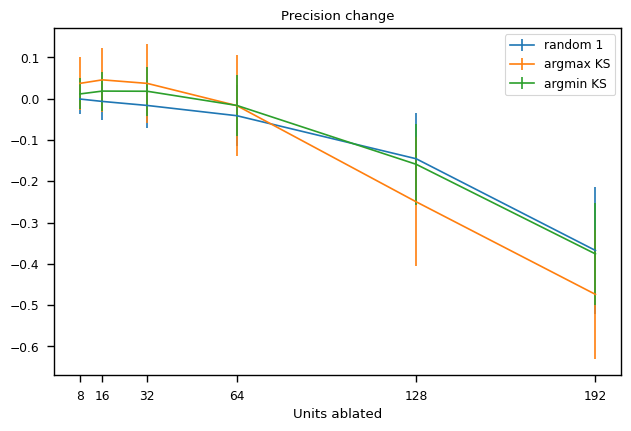

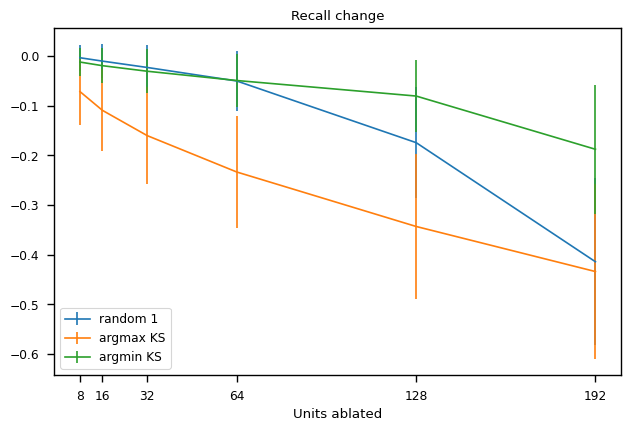

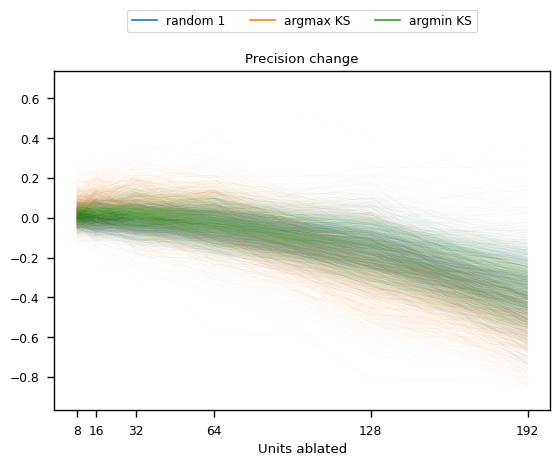

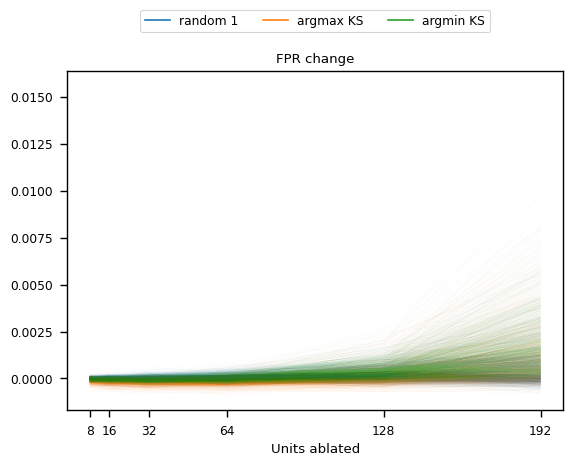

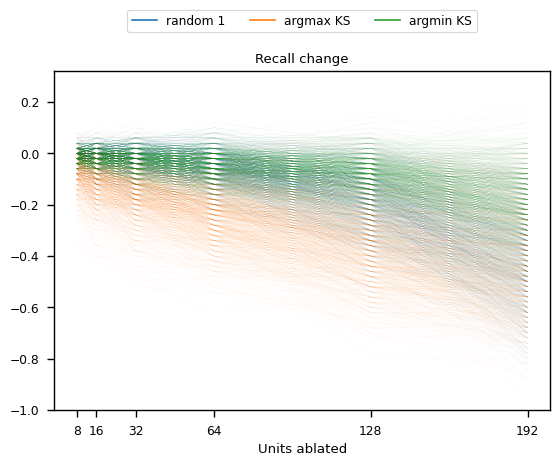

stored_activations/activations_on_validation_preserved_spatial_14_pretrained_imagenet.npy


16 disabled
0


time=1.1103630065917969
1


time=1.1096866130828857
2


time=1.1346933841705322
3


time=1.1018035411834717
4


time=1.1003739833831787
5


time=1.106250286102295
6


time=1.0999414920806885
7


time=1.1033480167388916
8


time=1.1020808219909668
9


time=1.1026005744934082
10


time=1.1024296283721924
11


time=1.124070167541504
12


time=1.1108510494232178
13


time=1.178802728652954
14


time=1.1044492721557617
15


time=1.1033506393432617
16


time=1.1046414375305176
17


time=1.1047394275665283
18


time=1.1073575019836426
19


time=1.105271577835083
20


time=1.1268057823181152
21


time=1.1036713123321533
22


time=1.1022040843963623
23


time=1.1024813652038574
24


time=1.1021006107330322
25


time=1.1062383651733398
26


time=1.1059858798980713
27


time=1.1036527156829834
28


time=1.104753017425537
29


time=1.1240289211273193
30


time=1.1136674880981445
31


time=1.1019086837768555
32


time=1.102437973022461
33


time=1.103517770767212
34


time=1.1041319370269775
35


time=1.1012392044067383
36


time=1.101252555847168
37


time=1.102865219116211
38


time=1.1240050792694092
39


time=1.1017115116119385
40


time=1.1019222736358643
41


time=1.0997228622436523
42


time=1.1030817031860352
43


time=1.101189136505127
44


time=1.104513168334961
45


time=1.1010918617248535
46


time=1.1075584888458252
47


time=1.1052379608154297
48


time=1.1054327487945557
49


time=1.0995447635650635
50


time=1.1006097793579102
51


time=1.1012420654296875
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1023213863372803
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1009657382965088
54


time=1.1046783924102783
55


time=1.0996036529541016
56


time=1.1080541610717773
57


time=1.1039175987243652
58


time=1.1042840480804443
59


time=1.1019206047058105
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1039822101593018
61


time=1.1017754077911377
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.10306715965271
63


time=1.1040680408477783
64


time=1.1124143600463867
65


time=1.1035516262054443
66


time=1.1035382747650146
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1058781147003174
68


time=1.1010735034942627
69


time=1.1037368774414062
70


time=1.1017382144927979
71


time=1.1038813591003418
72


time=1.1032700538635254
73


time=1.1042187213897705
74


time=1.1054701805114746
75


time=1.1059565544128418
76


time=1.1025209426879883
77


time=1.1014015674591064
78


time=1.106503963470459
79


time=1.1025869846343994
80


time=1.1033475399017334
81


time=1.1047286987304688
82


time=1.102656364440918
83


time=1.1083362102508545
84


time=1.106924295425415
85


time=1.1031110286712646
86


time=1.1027724742889404
87


time=1.1036863327026367
88


time=1.1018784046173096
89


time=1.1023962497711182
90


time=1.1027305126190186
91


time=1.1034815311431885
92


time=1.1076328754425049
93


time=1.1048219203948975
94


time=1.1045477390289307
95


time=1.145860195159912
96


time=1.1868908405303955
97


time=1.1038377285003662
98


time=1.1031060218811035
99


time=1.1021535396575928
100


time=1.101088523864746
101


time=1.1095600128173828
102


time=1.1050148010253906
103


time=1.1023826599121094
104


time=1.1067311763763428
105


time=1.1095662117004395
106


time=1.1047954559326172
107


time=1.102750539779663
108


time=1.1019213199615479
109


time=1.1066675186157227
110


time=1.105480432510376
111


time=1.106311559677124
112


time=1.1033425331115723
113


time=1.1010184288024902
114


time=1.1043481826782227
115


time=1.101959228515625
116


time=1.108968734741211
117


time=1.1075303554534912
118


time=1.1092302799224854
119


time=1.1091551780700684
120


time=1.1065194606781006
121


time=1.1012017726898193
122


time=1.1068763732910156
123


time=1.1041669845581055
124


time=1.1061198711395264
125


time=1.1051597595214844
126


time=1.1041886806488037
127


time=1.1018993854522705
128


time=1.1059057712554932
129


time=1.110677719116211
130


time=1.1020190715789795
131


time=1.1031107902526855
132


time=1.1010866165161133
133


time=1.1015617847442627
134


time=1.1021668910980225
135


time=1.1054258346557617
136


time=1.101489543914795
137


time=1.1052534580230713
138


time=1.1039602756500244
139


time=1.1030385494232178
140


time=1.0990715026855469
141


time=1.1013603210449219
142


time=1.1038310527801514
143


time=1.1041219234466553
144


time=1.1029179096221924
145


time=1.1018199920654297
146


time=1.105255365371704
147


time=1.1286520957946777
148


time=1.108788013458252
149


time=1.1036739349365234
150


time=1.103722333908081
151


time=1.105144739151001
152


time=1.1081039905548096
153


time=1.103414535522461
154


time=1.10858154296875
155


time=1.1061444282531738
156


time=1.115192174911499
157


time=1.1016476154327393
158


time=1.1001839637756348
159


time=1.1029586791992188
160


time=1.1025362014770508
161


time=1.1012978553771973
162


time=1.103698492050171
163


time=1.1043932437896729
164


time=1.1165580749511719
165


time=1.1688168048858643
166


time=1.1070284843444824
167


time=1.1018166542053223
168


time=1.1008174419403076
169


time=1.1004970073699951
170


time=1.1006152629852295
171


time=1.1034822463989258
172


time=1.1025230884552002
173


time=1.104325771331787
174


time=1.1268877983093262
175


time=1.103769302368164
176


time=1.1066758632659912
177


time=1.1025185585021973
178


time=1.102085828781128
179


time=1.108382225036621
180


time=1.1032018661499023
181


time=1.1021373271942139
182


time=1.1021921634674072
183


time=1.1874151229858398
184


time=1.1044609546661377
185


time=1.1019439697265625
186


time=1.1055879592895508
187


time=1.1046874523162842
188


time=1.1051485538482666
189


time=1.1023585796356201
190


time=1.1041839122772217
191


time=1.1026978492736816
192


time=1.1297707557678223
193


time=1.1041204929351807
194


time=1.1051483154296875
195


time=1.1033098697662354
196


time=1.1039624214172363
197


time=1.1037673950195312
198


time=1.1036031246185303
199


time=1.1034879684448242
200


time=1.1022069454193115
201


time=1.1444334983825684
202


time=1.1027662754058838
203


time=1.1046106815338135
204


time=1.1041388511657715
205


time=1.1046109199523926
206


time=1.10457444190979
207


time=1.1044542789459229
208


time=1.103243112564087
209


time=1.1033811569213867
210


time=1.1432013511657715
211


time=1.103517770767212
212


time=1.1046829223632812
213


time=1.1067020893096924
214


time=1.1078150272369385
215


time=1.1070306301116943
216


time=1.1050105094909668
217


time=1.105846881866455
218


time=1.1072113513946533
219


time=1.1448230743408203
220


time=1.1054346561431885
221


time=1.1072795391082764
222


time=1.105560064315796
223


time=1.1067686080932617
224


time=1.1059911251068115
225


time=1.105947494506836
226


time=1.1054553985595703
227


time=1.1025021076202393
228


time=1.1749062538146973
229


time=1.104686975479126
230


time=1.1086370944976807
231


time=1.1072144508361816
232


time=1.10650634765625
233


time=1.1087679862976074
234


time=1.1036412715911865
235


time=1.1027438640594482
236


time=1.1058132648468018
237


time=1.1361615657806396
238


time=1.1063928604125977
239


time=1.1070888042449951
240


time=1.1079161167144775
241


time=1.1063995361328125
242


time=1.1074459552764893
243


time=1.105163812637329
244


time=1.1094543933868408
245


time=1.102646827697754
246


time=1.1430373191833496
247


time=1.1029980182647705
248


time=1.1051454544067383
249


time=1.1043431758880615
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1049606800079346
251


time=1.1053471565246582
252


time=1.104417085647583
253


time=1.1054911613464355
254


time=1.1040241718292236
255


time=1.1443185806274414
256


time=1.1051361560821533
257


time=1.104616641998291
258


time=1.1045637130737305
259


time=1.1073718070983887
260


time=1.1050512790679932
261


time=1.1052484512329102
262


time=1.1044442653656006
263


time=1.1056897640228271
264


time=1.137990951538086
265


time=1.1078457832336426
266


time=1.1064910888671875
267


time=1.108299732208252
268


time=1.1063709259033203
269


time=1.1051976680755615
270


time=1.106257677078247
271


time=1.106651782989502
272


time=1.1067757606506348
273


time=1.1582224369049072
274


time=1.1031298637390137
275


time=1.099799633026123
276


time=1.1025278568267822
277


time=1.1006505489349365
278


time=1.1026110649108887
279


time=1.10483980178833
280


time=1.104201078414917
281


time=1.105480670928955
282


time=1.1456935405731201
283


time=1.1044566631317139
284


time=1.103182315826416
285


time=1.1047759056091309
286


time=1.1061136722564697
287


time=1.1041250228881836
288


time=1.1018776893615723
289


time=1.1041698455810547
290


time=1.1009039878845215
291


time=1.1441547870635986
292


time=1.1046020984649658
293


time=1.1023974418640137
294


time=1.1013214588165283
295


time=1.101083517074585
296


time=1.1019091606140137
297


time=1.0984091758728027
298


time=1.1015260219573975
299


time=1.0997793674468994
300


time=1.1665453910827637
301


time=1.1057326793670654
302


time=1.1022100448608398
303


time=1.1035740375518799
304


time=1.1006600856781006
305


time=1.1057355403900146
306


time=1.1039342880249023
307


time=1.1013782024383545
308


time=1.1597669124603271
309


time=1.150280237197876
310


time=1.1045074462890625
311


time=1.1001758575439453
312


time=1.1015188694000244
313


time=1.1045567989349365
314


time=1.1041176319122314
315


time=1.146561622619629
316


time=1.188277006149292
317


time=1.1057829856872559
318


time=1.1440889835357666
319


time=1.107889175415039
320


time=1.102132797241211
321


time=1.1017026901245117
322


time=1.102137565612793
323


time=1.1021971702575684
324


time=1.1010453701019287
325


time=1.1030151844024658
326


time=1.1062026023864746
327


time=1.1462695598602295
328


time=1.101921796798706
329


time=1.1026039123535156
330


time=1.1040704250335693
331


time=1.1025452613830566
332


time=1.1009838581085205
333


time=1.1052465438842773
334


time=1.110039234161377
335


time=1.1053972244262695
336


time=1.1945514678955078
337


time=1.1032907962799072
338


time=1.1018359661102295
339


time=1.1046488285064697
340


time=1.101074457168579
341


time=1.1057627201080322
342


time=1.1017875671386719
343


time=1.1029250621795654
344


time=1.1022231578826904
345


time=1.1706111431121826
346


time=1.1014270782470703
347


time=1.1025664806365967
348


time=1.1021575927734375
349


time=1.1026594638824463
350


time=1.108156442642212
351


time=1.1042380332946777
352


time=1.1047720909118652
353


time=1.1014001369476318
354


time=1.161665439605713
355


time=1.1025092601776123
356


time=1.101553201675415
357


time=1.1079566478729248
358


time=1.105555772781372
359


time=1.102217197418213
360


time=1.1027774810791016
361


time=1.1037976741790771
362


time=1.1044020652770996
363


time=1.1855456829071045
364


time=1.1043057441711426
365


time=1.1079583168029785
366


time=1.1052634716033936
367


time=1.1020443439483643
368


time=1.108553409576416
369


time=1.1076269149780273
370


time=1.1091976165771484
371


time=1.106415033340454
372


time=1.1444919109344482
373


time=1.104543685913086
374


time=1.1033408641815186
375


time=1.1042311191558838
376


time=1.1035442352294922
377


time=1.105208158493042
378


time=1.1039080619812012
379


time=1.1049830913543701
380


time=1.105212688446045
381


time=1.1435081958770752
382


time=1.104987382888794
383


time=1.1030213832855225
384


time=1.103593111038208
385


time=1.1022343635559082
386


time=1.103569507598877
387


time=1.1017210483551025
388


time=1.1035876274108887
389


time=1.1045546531677246
390


time=1.1727714538574219
391


time=1.103973388671875
392


time=1.1041772365570068
393


time=1.1045801639556885
394


time=1.1042499542236328
395


time=1.102491855621338
396


time=1.1027119159698486
397


time=1.1043379306793213
398


time=1.102977991104126
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1611621379852295
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1049656867980957
401


time=1.102515459060669
402


time=1.1049902439117432
403


time=1.102306604385376
404


time=1.1062705516815186
405


time=1.1007938385009766
406


time=1.1017656326293945
407


time=1.1023766994476318
408


time=1.134554386138916
409


time=1.1043460369110107
410


time=1.102684736251831
411


time=1.1030423641204834
412


time=1.104172706604004
413


time=1.1034834384918213
414


time=1.1036970615386963
415


time=1.1031734943389893
416


time=1.1024165153503418
417


time=1.1371119022369385
418


time=1.1009182929992676
419


time=1.102651596069336
420


time=1.1026406288146973
421


time=1.1027028560638428
422


time=1.1034746170043945
423


time=1.1058168411254883
424


time=1.1018505096435547
425


time=1.1024582386016846
426


time=1.1469531059265137
427


time=1.1079833507537842
428


time=1.1025900840759277
429


time=1.102400302886963
430


time=1.1018784046173096
431


time=1.1031913757324219
432


time=1.1034600734710693
433


time=1.1016912460327148
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.103668212890625
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1437690258026123
436


time=1.1024179458618164
437


time=1.1021490097045898
438


time=1.1010451316833496
439


time=1.101224422454834
440


time=1.1087355613708496
441


time=1.1029231548309326
442


time=1.1041302680969238
443


time=1.1006393432617188
444


time=1.1430208683013916
445


time=1.1040306091308594
446


time=1.105482578277588
447


time=1.1045126914978027
448


time=1.105872631072998
449


time=1.1079964637756348
450


time=1.1058857440948486
451


time=1.1041584014892578
452


time=1.1033823490142822
453


time=1.142505407333374
454


time=1.1012873649597168
455


time=1.1018085479736328
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1048336029052734
457


time=1.1037893295288086
458


time=1.1064667701721191
459


time=1.104508399963379
460


time=1.1053047180175781
461


time=1.1029908657073975
462


time=1.1388943195343018
463


time=1.0996904373168945
464


time=1.103344440460205
465


time=1.1004199981689453
466


time=1.101032018661499
467


time=1.1002447605133057
468


time=1.1018531322479248
469


time=1.1029143333435059
470


time=1.1036438941955566
471


time=1.1270031929016113
472


time=1.108710527420044
473


time=1.1062676906585693
474


time=1.108978271484375
475


time=1.107964038848877
476


time=1.1079540252685547
477


time=1.107912540435791
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1057357788085938
479


time=1.1039402484893799
480


time=1.1200082302093506
481


time=1.101628303527832
482


time=1.1036064624786377
483


time=1.1048142910003662
484


time=1.1020097732543945
485


time=1.1045918464660645
486


time=1.103161334991455
487


time=1.1086714267730713
488


time=1.1014940738677979
489


time=1.1152849197387695
490


time=1.104111671447754
491


time=1.1044247150421143
492


time=1.1073415279388428
493


time=1.1067945957183838
494


time=1.103177547454834
495


time=1.1039271354675293
496


time=1.1030125617980957
497


time=1.1032564640045166
498


time=1.1103901863098145
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.103482723236084
500


time=1.1027030944824219
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1050426959991455
502


time=1.1066396236419678
503


time=1.1066505908966064
504


time=1.1026263236999512
505


time=1.1028423309326172
506


time=1.1040847301483154
507


time=1.107421636581421
508


time=1.1058833599090576
509


time=1.1055848598480225
510


time=1.1026725769042969
511


time=1.100694179534912
512


time=1.103161334991455
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1042134761810303
514


time=1.1053192615509033
515


time=1.1021721363067627
516


time=1.1102755069732666
517


time=1.1039555072784424
518


time=1.1060504913330078
519


time=1.1031785011291504
520


time=1.1051528453826904
521


time=1.1053929328918457
522


time=1.1047675609588623
523


time=1.103614091873169
524


time=1.1086297035217285
525


time=1.1074426174163818
526


time=1.108903408050537
527


time=1.101179599761963
528


time=1.1017978191375732
529


time=1.1017203330993652
530


time=1.1040141582489014
531


time=1.1053240299224854
532


time=1.1058948040008545
533


time=1.1062092781066895
534


time=1.1510868072509766
535


time=1.1875560283660889
536


time=1.109072208404541
537


time=1.103668451309204
538


time=1.1097304821014404
539


time=1.1081933975219727
540


time=1.1059725284576416
541


time=1.10123610496521
542


time=1.1103720664978027
543


time=1.1168458461761475
544


time=1.1060841083526611
545


time=1.106283187866211
546


time=1.1026978492736816
547


time=1.1010351181030273
548


time=1.1012022495269775
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1037859916687012
550


time=1.1012744903564453
551


time=1.1040680408477783
552


time=1.1122188568115234
553


time=1.1876108646392822
554


time=1.1053409576416016
555


time=1.101656436920166
556


time=1.1035544872283936
557


time=1.1015410423278809
558


time=1.1038529872894287
559


time=1.1006970405578613
560


time=1.1035165786743164
561


time=1.1098718643188477
562


time=1.1022326946258545
563


time=1.1025290489196777
564


time=1.104008674621582
565


time=1.1039369106292725
566


time=1.10575270652771
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1048099994659424
568


time=1.1061182022094727
569


time=1.1052100658416748
570


time=1.106109619140625
571


time=1.1068146228790283
572


time=1.1068308353424072
573


time=1.106931209564209
574


time=1.1020772457122803
575


time=1.1046435832977295
576


time=1.1040325164794922
577


time=1.116706132888794
578


time=1.1129274368286133
579


time=1.107666015625
580


time=1.1088955402374268
581


time=1.105715274810791
582


time=1.1058104038238525
583


time=1.1043007373809814
584


time=1.1065700054168701
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1057794094085693
586


time=1.1052563190460205
587


time=1.1063010692596436
588


time=1.1104729175567627
589


time=1.1035373210906982
590


time=1.107492208480835
591


time=1.1045103073120117
592


time=1.107344150543213
593


time=1.1067919731140137
594


time=1.1054003238677979
595


time=1.1070458889007568
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109424114227295
597


time=1.112546443939209
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110775470733643
599


time=1.1086504459381104
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.106295108795166
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1056625843048096
602


time=1.1071441173553467
603


time=1.1050164699554443
604


time=1.1048743724822998
605


time=1.1064059734344482
606


time=1.110297441482544
607


time=1.1079704761505127
608


time=1.1056532859802246
609


time=1.1068189144134521
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1101493835449219
611


time=1.107952356338501
612


time=1.1067695617675781
613


time=1.1063778400421143
614


time=1.106689453125
615


time=1.112835168838501
616


time=1.105611801147461
617


time=1.1065888404846191
618


time=1.1079967021942139
619


time=1.1048791408538818
620


time=1.1084167957305908
621


time=1.1049394607543945
622


time=1.1075363159179688
623


time=1.104980230331421
624


time=1.1086397171020508
625


time=1.1052184104919434
626


time=1.1034114360809326
627


time=1.1046323776245117
628


time=1.104419231414795
629


time=1.1041476726531982
630


time=1.1035280227661133
631


time=1.1046173572540283
632


time=1.104753017425537
633


time=1.1071481704711914
634


time=1.1033012866973877
635


time=1.1043906211853027
636


time=1.104722499847412
637


time=1.1028122901916504
638


time=1.1047513484954834
639


time=1.1030006408691406
640


time=1.104374885559082
641


time=1.1033267974853516
642


time=1.1098260879516602
643


time=1.1085145473480225
644


time=1.137460470199585
645


time=1.139481544494629
646


time=1.1068623065948486
647


time=1.1053736209869385
648


time=1.1033508777618408
649


time=1.102574348449707
650


time=1.1045432090759277
651


time=1.108161211013794
652


time=1.104440450668335
653


time=1.104358434677124
654


time=1.1035938262939453
655


time=1.1026067733764648
656


time=1.103205680847168
657


time=1.102832317352295
658


time=1.1016063690185547
659


time=1.1031262874603271
660


time=1.1054224967956543
661


time=1.1185972690582275
662


time=1.105865478515625
663


time=1.1041560173034668
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1050081253051758
665


time=1.1024811267852783
666


time=1.1072206497192383
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.104116678237915
668


time=1.103760004043579
669


time=1.107180118560791
670


time=1.1511387825012207
671


time=1.1065428256988525
672


time=1.1071743965148926
673


time=1.1045527458190918
674


time=1.107043981552124
675


time=1.1067149639129639
676


time=1.101654291152954
677


time=1.103496789932251
678


time=1.1172981262207031
679


time=1.1533162593841553
680


time=1.1031184196472168
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1042001247406006
682


time=1.1034190654754639
683


time=1.104175329208374
684


time=1.1038014888763428
685


time=1.104126214981079
686


time=1.1052308082580566
687


time=1.1066999435424805
688


time=1.1947929859161377
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1058437824249268
690


time=1.1070561408996582
691


time=1.1053466796875
692


time=1.1094365119934082
693


time=1.1054596900939941
694


time=1.1065311431884766
695


time=1.1040832996368408
696


time=1.1091961860656738
697


time=1.1136577129364014
698


time=1.1081464290618896
699


time=1.1068236827850342
700


time=1.108163595199585
701


time=1.1055560111999512
702


time=1.1080894470214844
703


time=1.1057398319244385
704


time=1.1038587093353271
705


time=1.1077032089233398
706


time=1.1718354225158691
707


time=1.1082572937011719
708


time=1.1039984226226807
709


time=1.1060376167297363
710


time=1.105224847793579
711


time=1.1039977073669434
712


time=1.1043832302093506
713


time=1.1029868125915527
714


time=1.104250192642212
715


time=1.1467368602752686
716


time=1.10469388961792
717


time=1.1043202877044678
718


time=1.1028306484222412
719


time=1.1039040088653564
720


time=1.1071734428405762
721


time=1.1073956489562988
722


time=1.1066436767578125
723


time=1.106738805770874
724


time=1.1495227813720703
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1050872802734375
726


time=1.1054508686065674
727


time=1.1056814193725586
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.107841968536377
729


time=1.1234657764434814
730


time=1.1011755466461182
731


time=1.1047441959381104
732


time=1.1027345657348633
733


time=1.1416006088256836
734


time=1.1016533374786377
735


time=1.1030380725860596
736


time=1.1025173664093018
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1032354831695557
738


time=1.1034221649169922
739


time=1.1032795906066895
740


time=1.1040606498718262
741


time=1.1034564971923828
742


time=1.159980058670044
743


time=1.1021947860717773
744


time=1.103428602218628
745


time=1.103745698928833
746


time=1.103642225265503
747


time=1.1022629737854004
748


time=1.1036999225616455
749


time=1.1032671928405762
750


time=1.1055631637573242
751


time=1.1322219371795654
752


time=1.104806900024414
753


time=1.1042203903198242
754


time=1.1506359577178955
755


time=1.1869568824768066
756


time=1.104585886001587
757


time=1.100475549697876
758


time=1.104142665863037
759


time=1.1080350875854492
760


time=1.1552422046661377
761


time=1.1035552024841309
762


time=1.1078236103057861
763


time=1.1080543994903564
764


time=1.10471773147583
765


time=1.1075718402862549
766


time=1.104672908782959
767


time=1.1046040058135986
768


time=1.1078641414642334
769


time=1.108057975769043
770


time=1.1058268547058105
771


time=1.106797218322754
772


time=1.106997013092041
773


time=1.1072978973388672
774


time=1.1081504821777344
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1070175170898438
776


time=1.1074190139770508
777


time=1.1070568561553955
778


time=1.11553955078125
779


time=1.106713056564331
780


time=1.105116367340088
781


time=1.1054041385650635
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1056785583496094
783


time=1.1066384315490723
784


time=1.1052203178405762
785


time=1.1060702800750732
786


time=1.1064651012420654
787


time=1.1547777652740479
788


time=1.106849193572998
789


time=1.1081621646881104
790


time=1.1068592071533203
791


time=1.106994867324829
792


time=1.107100486755371
793


time=1.1029345989227295
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.102907419204712
795


time=1.1042330265045166
796


time=1.1760363578796387
797


time=1.10892653465271
798


time=1.1066560745239258
799


time=1.108393907546997
800


time=1.1078743934631348
801


time=1.1069722175598145
802


time=1.1034231185913086
803


time=1.1025221347808838
804


time=1.1068017482757568
805


time=1.1203572750091553
806


time=1.1037375926971436
807


time=1.107058048248291
808


time=1.108522653579712
809


time=1.1097121238708496
810


time=1.1073832511901855
811


time=1.1045324802398682
812


time=1.1063785552978516
813


time=1.1052069664001465
814


time=1.12770676612854
815


time=1.1091701984405518
816


time=1.106440544128418
817


time=1.1052048206329346
818


time=1.1046910285949707
819


time=1.1045958995819092
820


time=1.1036651134490967
821


time=1.1071937084197998
822


time=1.1067652702331543
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.15980863571167
824


time=1.1094961166381836
825


time=1.108086109161377
826


time=1.1064927577972412
827


time=1.1059825420379639
828


time=1.1114280223846436
829


time=1.1051397323608398
830


time=1.1056363582611084
831


time=1.105398416519165
832


time=1.1274261474609375
833


time=1.1052982807159424
834


time=1.1050238609313965
835


time=1.1067602634429932
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1055662631988525
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1060974597930908
838


time=1.103773593902588
839


time=1.105376958847046
840


time=1.1082861423492432
841


time=1.1343932151794434
842


time=1.107719898223877
843


time=1.1036694049835205
844


time=1.1049079895019531
845


time=1.1066691875457764
846


time=1.1085433959960938
847


time=1.104325771331787
848


time=1.1043307781219482
849


time=1.1054041385650635
850


time=1.2028746604919434
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1252551078796387
852


time=1.1042218208312988
853


time=1.1093530654907227
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.108851671218872
855


time=1.1092805862426758
856


time=1.1050314903259277
857


time=1.105956792831421
858


time=1.1076266765594482
859


time=1.1197068691253662
860


time=1.1056287288665771
861


time=1.102689504623413
862


time=1.1044771671295166
863


time=1.1045706272125244
864


time=1.1050238609313965
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.104280948638916
866


time=1.105238676071167
867


time=1.1066734790802002
868


time=1.1260473728179932
869


time=1.104870319366455
870


time=1.104658603668213
871


time=1.1020309925079346
872


time=1.1043822765350342
873


time=1.105168104171753
874


time=1.1033201217651367
875


time=1.104992389678955
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.105879783630371
877


time=1.1410095691680908
878


time=1.1061348915100098
879


time=1.1052005290985107
880


time=1.1037235260009766
881


time=1.10331130027771
882


time=1.1073880195617676
883


time=1.1052935123443604
884


time=1.104781150817871
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1038310527801514
886


time=1.1468815803527832
887


time=1.1048729419708252
888


time=1.1060054302215576
889


time=1.103231430053711
890


time=1.1044349670410156
891


time=1.1070466041564941
892


time=1.1088504791259766
893


time=1.1041173934936523
894


time=1.1044869422912598
895


time=1.1563377380371094
896


time=1.1059894561767578
897


time=1.10561203956604
898


time=1.1055808067321777
899


time=1.1080927848815918
900


time=1.1095926761627197
901


time=1.109187364578247
902


time=1.1101324558258057
903


time=1.1087713241577148
904


time=1.1656315326690674
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1033897399902344
906


time=1.1055176258087158
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1037015914916992
908


time=1.1075820922851562
909


time=1.1084115505218506
910


time=1.1060914993286133
911


time=1.107607126235962
912


time=1.1062827110290527
913


time=1.1633994579315186
914


time=1.1041996479034424
915


time=1.1128392219543457
916


time=1.1059186458587646
917


time=1.1075801849365234
918


time=1.1075325012207031
919


time=1.1070947647094727
920


time=1.1061317920684814
921


time=1.1091570854187012
922


time=1.177053451538086
923


time=1.109304666519165
924


time=1.1059637069702148
925


time=1.10685133934021
926


time=1.1090352535247803
927


time=1.1057384014129639
928


time=1.1056320667266846
929


time=1.103393316268921
930


time=1.10591459274292
931


time=1.1221239566802979
932


time=1.1042506694793701
933


time=1.1045572757720947
934


time=1.1056928634643555
935


time=1.1069724559783936
936


time=1.1087486743927002
937


time=1.1074721813201904
938


time=1.108201503753662
939


time=1.1061365604400635
940


time=1.1570937633514404
941


time=1.1034929752349854
942


time=1.1043448448181152
943


time=1.1057217121124268
944


time=1.1076595783233643
945


time=1.1050214767456055
946


time=1.1041808128356934
947


time=1.1039257049560547
948


time=1.1065711975097656
949


time=1.1259362697601318
950


time=1.1025605201721191
951


time=1.10603666305542
952


time=1.1050024032592773
953


time=1.104323387145996
954


time=1.104813575744629
955


time=1.1060261726379395
956


time=1.106590747833252
957


time=1.105668067932129
958


time=1.1671380996704102
959


time=1.1021757125854492
960


time=1.107602834701538
961


time=1.1026811599731445
962


time=1.1096124649047852
963


time=1.1078734397888184
964


time=1.106527328491211
965


time=1.1037509441375732
966


time=1.105226993560791
967


time=1.181298017501831
968


time=1.1044535636901855
969


time=1.1032118797302246
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1067485809326172
971


time=1.1049535274505615
972


time=1.1068761348724365
973


time=1.150686264038086
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868770122528076
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1261365413665771
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1099753379821777
977


time=1.1048412322998047
978


time=1.1066701412200928
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1056575775146484
980


time=1.1055781841278076
981


time=1.1053593158721924
982


time=1.1037421226501465
983


time=1.105104923248291
984


time=1.1078457832336426
985


time=1.1502599716186523
986


time=1.102832317352295
987


time=1.1030418872833252
988


time=1.1040387153625488
989


time=1.1041991710662842
990


time=1.1047999858856201
991


time=1.1044073104858398
992


time=1.1029860973358154
993


time=1.1049504280090332
994


time=1.1335759162902832
995


time=1.102407693862915
996


time=1.1038916110992432
997


time=1.1033806800842285
998


time=1.1058228015899658
999


time=1.1044921875
32 disabled
0


time=1.113464117050171
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113908052444458
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308097839355469
3


time=1.1167082786560059
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139731407165527
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112725019454956
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139109134674072
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139092445373535
8


time=1.1133084297180176
9


time=1.1140003204345703
10


time=1.111414909362793
11


time=1.1151089668273926
12


time=1.1138451099395752
13


time=1.1122682094573975
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1144864559173584
15


time=1.1126375198364258
16


time=1.113520622253418
17


time=1.1141247749328613
18


time=1.1136245727539062
19


time=1.1126501560211182
20


time=1.1171348094940186
21


time=1.1152002811431885
22


time=1.1117453575134277
23


time=1.1136224269866943
24


time=1.1127915382385254
25


time=1.1133997440338135
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1143665313720703
27


time=1.1138851642608643
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136143207550049
29


time=1.1206247806549072
30


time=1.1148412227630615
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114703893661499
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115013837814331
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124567985534668
34


time=1.1127314567565918
35


time=1.112720251083374
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1108927726745605
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1142632961273193
38


time=1.1164307594299316
39


time=1.1273345947265625
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11407470703125
41


time=1.115877389907837
42


time=1.1148066520690918
43


time=1.1146540641784668
44


time=1.1161243915557861
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115718126296997
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1156327724456787
47


time=1.1207857131958008
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1171724796295166
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132583618164062
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128549575805664
51


time=1.111201286315918
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134743690490723
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115156888961792
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168477535247803
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112849473953247
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153414249420166
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151344776153564
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112837553024292
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1167638301849365
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1148056983947754
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112978458404541
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112828016281128
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130902767181396
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137351989746094
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168487071990967
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145756244659424
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1177520751953125
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126325130462646
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147375106811523
70


time=1.1129748821258545
71


time=1.1137981414794922
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140022277832031
73


time=1.1124000549316406
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1190612316131592
75


time=1.1145620346069336
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113924264907837
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115490436553955
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111969232559204
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114006519317627
80


time=1.1129631996154785
81


time=1.115753173828125
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150062084197998
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1169731616973877
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1160471439361572
85


time=1.1123332977294922
86


time=1.1129250526428223
87


time=1.1153912544250488
88


time=1.1149234771728516
89


time=1.1116197109222412
90


time=1.1153950691223145
91


time=1.1143648624420166
92


time=1.1209537982940674
93


time=1.1163787841796875
94


time=1.1134188175201416
95


time=1.1128811836242676
96


time=1.1133058071136475
97


time=1.1144788265228271
98


time=1.1196484565734863
99


time=1.113158941268921
100


time=1.1149163246154785
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1177411079406738
102


time=1.115464210510254
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1156103610992432
104


time=1.117675542831421
105


time=1.1136152744293213
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114922046661377
107


time=1.1125071048736572
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1162924766540527
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114764928817749
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.12227201461792
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141023635864258
112


time=1.1110165119171143
113


time=1.111961841583252
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118755340576172
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110916137695312
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1154236793518066
117


time=1.1120903491973877
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118364334106445
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117021083831787
120


time=1.1121346950531006
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111203908920288
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129541397094727
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116890907287598
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1097979545593262
125


time=1.1114084720611572
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11122727394104
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110513687133789
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1230719089508057
129


time=1.112746000289917
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1109623908996582
131


time=1.1135497093200684
132


time=1.1105525493621826
133


time=1.11085844039917
134


time=1.1093838214874268
135


time=1.1101229190826416
136


time=1.1113169193267822
137


time=1.1158699989318848
138


time=1.1113591194152832
139


time=1.1151831150054932
140


time=1.1133248805999756
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126351356506348
142


time=1.1109588146209717
143


time=1.1117255687713623
144


time=1.109760046005249
145


time=1.110595464706421
146


time=1.1120452880859375
147


time=1.1123247146606445
148


time=1.109318494796753
149


time=1.1119468212127686
150


time=1.1122922897338867
151


time=1.1099743843078613
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1113495826721191
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1086974143981934
154


time=1.1106815338134766
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141273975372314
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145594120025635
157


time=1.1099255084991455
158


time=1.111572027206421
159


time=1.1120500564575195
160


time=1.1099791526794434
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1109583377838135
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1094706058502197
163


time=1.1083176136016846
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1228039264678955
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1217029094696045
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111971378326416
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109971284866333
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1148567199707031
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135306358337402
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126012802124023
171


time=1.1116752624511719
172


time=1.1107442378997803
173


time=1.11430025100708
174


time=1.112351655960083
175


time=1.1148512363433838
176


time=1.1126863956451416
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129283905029297
178


time=1.1098527908325195
179


time=1.114208459854126
180


time=1.113006830215454
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135449409484863
182


time=1.1146371364593506
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140708923339844
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129074096679688
185


time=1.1131095886230469
186


time=1.1121444702148438
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1108214855194092
188


time=1.1137564182281494
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120505332946777
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1089582443237305
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.179495096206665
192


time=1.2003037929534912
193


time=1.1132395267486572
194


time=1.1101253032684326
195


time=1.1111230850219727
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1100540161132812
197


time=1.108020305633545
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114270687103271
199


time=1.108626127243042
200


time=1.1312129497528076
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1254136562347412
202


time=1.113954782485962
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139588356018066
204


time=1.1133630275726318
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1149928569793701
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1261465549468994
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140658855438232
208


time=1.113100528717041
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1506519317626953
210


time=1.1404197216033936
211


time=1.1174263954162598
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118746042251587
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153895854949951
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113081693649292
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1182260513305664
216


time=1.111353874206543
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1117572784423828
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1646461486816406
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133241653442383
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120662689208984
221


time=1.1123883724212646
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1106085777282715
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135737895965576
224


time=1.1101512908935547
225


time=1.1131017208099365
226


time=1.1147027015686035
227


time=1.1760494709014893
228


time=1.1128811836242676
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1179912090301514
230


time=1.1138644218444824
231


time=1.1114716529846191
232


time=1.1115002632141113
233


time=1.1117744445800781
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1103112697601318
235


time=1.1109490394592285
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.151524543762207
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109912633895874
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140825748443604
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.119297742843628
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1178736686706543
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1169865131378174
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128942966461182
243


time=1.1135377883911133
244


time=1.1148462295532227
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.128605842590332
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118638515472412
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123461723327637
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1096901893615723
249


time=1.110388994216919
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113130807876587
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121461391448975
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113069772720337
253


time=1.115581750869751
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1663157939910889
255


time=1.1137053966522217
256


time=1.1121432781219482
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1125719547271729
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1142921447753906
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140031814575195
260


time=1.113492488861084
261


time=1.110267162322998
262


time=1.1174240112304688
263


time=1.1251921653747559
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141395568847656
265


time=1.1105825901031494
266


time=1.113041877746582
267


time=1.1108357906341553
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118346929550171
269


time=1.1128497123718262
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1113502979278564
271


time=1.1157293319702148
272


time=1.1127815246582031
273


time=1.111701488494873
274


time=1.1129810810089111
275


time=1.1152706146240234
276


time=1.1148533821105957
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1099090576171875
278


time=1.1129295825958252
279


time=1.1084349155426025
280


time=1.117687463760376
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112919807434082
282


time=1.1129546165466309
283


time=1.11143159866333
284


time=1.1108059883117676
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128921508789062
286


time=1.1111018657684326
287


time=1.1105706691741943
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1098904609680176
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159262657165527
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123545169830322
291


time=1.11285400390625
292


time=1.1121337413787842
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119744777679443
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140291690826416
295


time=1.1113979816436768
296


time=1.1125285625457764
297


time=1.1093852519989014
298


time=1.1162996292114258
299


time=1.1132237911224365
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116280555725098
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114699840545654
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127560138702393
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136894226074219
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1146883964538574
305


time=1.113234043121338
306


time=1.1124861240386963
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1169404983520508
308


time=1.1143956184387207
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122260093688965
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122968196868896
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114239692687988
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110969066619873
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1155991554260254
314


time=1.1146636009216309
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1142590045928955
316


time=1.118762731552124
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159307956695557
318


time=1.1120011806488037
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153631210327148
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127166748046875
321


time=1.1133921146392822
322


time=1.1136579513549805
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136484146118164
324


time=1.114217758178711
325


time=1.1159160137176514
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1144201755523682
327


time=1.1115589141845703
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119422912597656
329


time=1.110569715499878
330


time=1.112285852432251
331


time=1.111687183380127
332


time=1.1117520332336426
333


time=1.1108803749084473
334


time=1.1153523921966553
335


time=1.1136119365692139
336


time=1.112858772277832
337


time=1.1127204895019531
338


time=1.1105799674987793
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113342523574829
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111268997192383
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112403392791748
342


time=1.1109516620635986
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114025592803955
344


time=1.1133956909179688
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114070415496826
346


time=1.1119401454925537
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124186515808105
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122105121612549
349


time=1.112154483795166
350


time=1.1122791767120361
351


time=1.110405445098877
352


time=1.1148605346679688
353


time=1.1141223907470703
354


time=1.1104342937469482
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121492385864258
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118769645690918
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119439601898193
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132545471191406
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153488159179688
360


time=1.113814115524292
361


time=1.119316577911377
362


time=1.1173129081726074
363


time=1.109358549118042
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123392581939697
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121208667755127
366


time=1.1147878170013428
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1167597770690918
368


time=1.1141302585601807
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122362613677979
370


time=1.1175155639648438
371


time=1.1150028705596924
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110148429870605
373


time=1.1103785037994385
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133973598480225
375


time=1.1099088191986084
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123387813568115
377


time=1.1124308109283447
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150438785552979
379


time=1.114903450012207
380


time=1.1141331195831299
381


time=1.1106629371643066
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1105525493621826
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1107826232910156
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110637903213501
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115577220916748
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111109972000122
387


time=1.1131319999694824
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159071922302246
389


time=1.1122627258300781
390


time=1.1125214099884033
391


time=1.1121714115142822
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130549907684326
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116256713867188
394


time=1.109290599822998
395


time=1.1084613800048828
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1109464168548584
397


time=1.1379568576812744
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.116257667541504
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1113836765289307
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113344430923462
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1131651401519775
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116273403167725
403


time=1.1090805530548096
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1093270778656006
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1095225811004639
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132144927978516
407


time=1.1121313571929932
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128501892089844
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1615192890167236
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2089283466339111
411


time=1.1121065616607666
412


time=1.1113049983978271
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1088743209838867
414


time=1.1092662811279297
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139636039733887
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139261722564697
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116700172424316
418


time=1.1108789443969727
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124043464660645
420


time=1.1128666400909424
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150853633880615
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115872859954834
423


time=1.1134326457977295
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1174216270446777
425


time=1.1138665676116943
426


time=1.1131725311279297
427


time=1.1119465827941895
428


time=1.1129636764526367
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111040115356445
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119060516357422
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1091911792755127
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109534502029419
433


time=1.1131622791290283
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132423877716064
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110502004623413
436


time=1.1088876724243164
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1117503643035889
438


time=1.1105542182922363
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124320030212402
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127674579620361
441


time=1.112903356552124
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168115139007568
443


time=1.1151516437530518
444


time=1.1115670204162598
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111083984375
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141812801361084
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111140251159668
448


time=1.1108756065368652
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116881370544434
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139168739318848
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1176671981811523
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1157746315002441
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1125831604003906
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132879257202148
455


time=1.1109106540679932
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133077144622803
457


time=1.1107356548309326
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118226051330566
459


time=1.110917568206787
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112736463546753
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136085987091064
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120998859405518
463


time=1.1115636825561523
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129729747772217
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120147705078125
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119458675384521
467


time=1.1100027561187744
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110069751739502
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134274005889893
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111855506896973
471


time=1.1104848384857178
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121649742126465
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120479106903076
474


time=1.1116173267364502
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150691509246826
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129975318908691
477


time=1.1114957332611084
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150336265563965
479


time=1.1142520904541016
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112964391708374
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112163782119751
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111670732498169
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120679378509521
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111350059509277
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1096415519714355
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111299991607666
487


time=1.1133623123168945
488


time=1.1155149936676025
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118137836456299
490


time=1.1114623546600342
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1131222248077393
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115732192993164
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129963397979736
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120145320892334
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110594272613525
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151127815246582
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113945484161377
498


time=1.1091458797454834
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1102550029754639
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110646724700928
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130056381225586
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123437881469727
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111558437347412
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1099052429199219
505


time=1.118666648864746
506


time=1.1120831966400146
507


time=1.1122736930847168
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126902103424072
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110854148864746
510


time=1.1117234230041504
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113170862197876
512


time=1.1110384464263916
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1100049018859863
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1278469562530518
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1493515968322754
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122417449951172
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111221313476562
518


time=1.1115241050720215
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135494709014893
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1101553440093994
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1085224151611328
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1107065677642822
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1265711784362793
524


time=1.1301605701446533
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136131286621094
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114163398742676
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127338409423828
528


time=1.1115264892578125
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158521175384521
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112414836883545
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1100866794586182
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349451541900635
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124050617218018
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134495735168457
535


time=1.110872507095337
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114001750946045
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118433475494385
538


time=1.1107988357543945
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111837387084961
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111450433731079
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1478543281555176
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1160826683044434
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132164001464844
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120972633361816
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129636764526367
546


time=1.1090786457061768
547


time=1.1109240055084229
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1107256412506104
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109283208847046
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1506695747375488
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120176315307617
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124680042266846
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1102159023284912
554


time=1.1115608215332031
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1092419624328613
556


time=1.1123073101043701
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135337352752686
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116673946380615
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1699769496917725
560


time=1.1278324127197266
561


time=1.1147172451019287
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133198738098145
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130836009979248
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1109840869903564
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.109877347946167
566


time=1.1088457107543945
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121842861175537
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1521289348602295
569


time=1.1099834442138672
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1100540161132812
571


time=1.1107571125030518
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1157617568969727
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118886470794678
574


time=1.1103355884552002
575


time=1.1132433414459229
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140398979187012
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1674237251281738
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119158267974854
579


time=1.113508939743042
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127192974090576
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11289644241333
582


time=1.1101577281951904
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117234706878662
584


time=1.111398458480835
585


time=1.1133880615234375
586


time=1.133190393447876
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133184432983398
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139721870422363
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113647222518921
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145961284637451
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1144604682922363
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.116253137588501
593


time=1.115717887878418
594


time=1.1302387714385986
595


time=1.173917531967163
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147654056549072
597


time=1.117027997970581
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163828372955322
599


time=1.1135847568511963
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118929147720337
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152286529541016
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1186020374298096
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117799997329712
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113844633102417
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113966464996338
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112943172454834
607


time=1.1145493984222412
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115241050720215
609


time=1.1133275032043457
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122405529022217
611


time=1.1118879318237305
612


time=1.1148109436035156
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159288883209229
614


time=1.117767095565796
615


time=1.1827185153961182
616


time=1.113656997680664
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1142756938934326
618


time=1.1188387870788574
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115030288696289
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168248653411865
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117053508758545
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115471601486206
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121151447296143
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152870655059814
625


time=1.1116280555725098
626


time=1.1118271350860596
627


time=1.1588590145111084
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.200875997543335
629


time=1.124459981918335
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1255767345428467
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1164817810058594
632


time=1.1107101440429688
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124587059020996
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110790729522705
635


time=1.1168186664581299
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11802077293396
637


time=1.1141648292541504
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168994903564453
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1149978637695312
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1162872314453125
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1104762554168701
642


time=1.1101627349853516
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11100172996521
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1117348670959473
645


time=1.1181106567382812
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1149768829345703
647


time=1.111290454864502
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1164634227752686
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1146609783172607
650


time=1.1113007068634033
651


time=1.110013723373413
652


time=1.1108179092407227
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121468544006348
654


time=1.113069772720337
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120638847351074
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116228103637695
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158554553985596
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137299537658691
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1106560230255127
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1121094226837158
661


time=1.1118743419647217
662


time=1.1102197170257568
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122479438781738
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110119104385376
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1112892627716064
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1164705753326416
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.116898536682129
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140103340148926
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132574081420898
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152317523956299
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126811504364014
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151816844940186
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112931489944458
674


time=1.1108074188232422
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158745288848877
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147756576538086
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119027137756348
678


time=1.1135141849517822
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136655807495117
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147081851959229
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.116640567779541
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114786148071289
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139605045318604
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.116363763809204
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113858699798584
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114518642425537
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118683815002441
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139354705810547
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141235828399658
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115769863128662
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159226894378662
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151556968688965
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1172785758972168
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114743709564209
695


time=1.1128699779510498
696


time=1.1111040115356445
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133952140808105
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141557693481445
699


time=1.1143450736999512
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140823364257812
701


time=1.1122467517852783
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353542804718018
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123874187469482
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124842166900635
705


time=1.1112687587738037
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113149642944336
707


time=1.1118416786193848
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112844705581665
709


time=1.1122055053710938
710


time=1.1121759414672852
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1379241943359375
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1143834590911865
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141109466552734
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129250526428223
715


time=1.113807201385498
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1144936084747314
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1138272285461426
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11214280128479
719


time=1.1102309226989746
720


time=1.1290924549102783
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1113133430480957
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118199348449707
723


time=1.1114537715911865
724


time=1.112030267715454
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1175220012664795
726


time=1.1194169521331787
727


time=1.1134023666381836
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130332946777344
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1387317180633545
730


time=1.1140377521514893
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1117055416107178
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114985942840576
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113196849822998
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1157019138336182
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150553226470947
736


time=1.1125967502593994
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1119225025177002
738


time=1.1525287628173828
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1200535297393799
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1198203563690186
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112896203994751
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163411140441895
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1146130561828613
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163573265075684
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163489818572998
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1180651187896729
747


time=1.1594488620758057
748


time=1.1134262084960938
749


time=1.115117073059082
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151244640350342
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1173226833343506
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134169101715088
753


time=1.1142771244049072
754


time=1.110490322113037
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113619089126587
756


time=1.2056388854980469
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111893892288208
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163914203643799
759


time=1.1157197952270508
760


time=1.1144819259643555
761


time=1.1169769763946533
762


time=1.1120855808258057
763


time=1.1126282215118408
764


time=1.1157360076904297
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1614494323730469
766


time=1.114720344543457
767


time=1.1140286922454834
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158742904663086
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113349437713623
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152551174163818
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113879919052124
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145317554473877
773


time=1.1164684295654297
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1455438137054443
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112161636352539
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1100337505340576
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113323450088501
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1111485958099365
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115686893463135
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1125903129577637
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114821434020996
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135730743408203
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1138689517974854
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127068996429443
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110891580581665
786


time=1.1115281581878662
787


time=1.1096210479736328
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114277839660645
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112398386001587
790


time=1.112793207168579
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1254627704620361
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1242456436157227
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11649751663208
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135156154632568
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1110155582427979
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1200661659240723
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135993003845215
798


time=1.118645429611206
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.111095905303955
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168479919433594
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1157035827636719
802


time=1.1148769855499268
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1117284297943115
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137282848358154
805


time=1.1112511157989502
806


time=1.1130409240722656
807


time=1.116698980331421
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140491962432861
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118103265762329
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1186730861663818
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1138148307800293
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117109775543213
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147689819335938
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127700805664062
815


time=1.1109793186187744
816


time=1.1148936748504639
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1162199974060059
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1207175254821777
819


time=1.115896463394165
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1170101165771484
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158218383789062
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113584041595459
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110656499862671
824


time=1.110435962677002
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151127815246582
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147053241729736
827


time=1.1176106929779053
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11433744430542
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1156120300292969
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1163456439971924
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136448383331299
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129670143127441
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136445999145508
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129329204559326
835


time=1.1137967109680176
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1164462566375732
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1162705421447754
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140050888061523
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1148326396942139
840


time=1.1133167743682861
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134495735168457
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1141183376312256
843


time=1.117776870727539
844


time=1.114670753479004
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1821091175079346
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2058312892913818
847


time=1.1166443824768066
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139371395111084
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128323078155518
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168596744537354
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1146924495697021
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1187341213226318
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112736701965332
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117112159729004
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1168572902679443
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150751113891602
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1131691932678223
858


time=1.1136724948883057
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1131095886230469
860


time=1.1132352352142334
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153888702392578
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1151602268218994
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1174259185791016
864


time=1.1141364574432373
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113548994064331
866


time=1.113893985748291
867


time=1.1145994663238525
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1161010265350342
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122357845306396
870


time=1.114091157913208
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152000427246094
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1178233623504639
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1152076721191406
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135022640228271
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112109661102295
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126577854156494
877


time=1.1122255325317383
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147902011871338
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1142849922180176
880


time=1.1170613765716553
881


time=1.1187264919281006
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1150944232940674
883


time=1.1141998767852783
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1138439178466797
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159543991088867
886


time=1.1159298419952393
887


time=1.115009069442749
888


time=1.1127958297729492
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114163875579834
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1217820644378662
891


time=1.1144509315490723
892


time=1.114487648010254
893


time=1.114654302597046
894


time=1.1150155067443848
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112480640411377
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139919757843018
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114463806152344
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134181022644043
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1232552528381348
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126165390014648
901


time=1.1163413524627686
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.117112636566162
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.118248462677002
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1164889335632324
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1189031600952148
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1176786422729492
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1176810264587402
908


time=1.1320369243621826
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137948036193848
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136987209320068
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1148531436920166
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1181466579437256
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136693954467773
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1122145652770996
915


time=1.1148426532745361
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1135363578796387
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138242483139038
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132972240447998
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1127300262451172
920


time=1.1137440204620361
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120398044586182
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.115682601928711
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129834651947021
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113318681716919
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1139934062957764
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1614868640899658
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113753318786621
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1160237789154053
929


time=1.1145555973052979
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113706111907959
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1132400035858154
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137802600860596
933


time=1.1139793395996094
934


time=1.1149542331695557
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1602802276611328
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153509616851807
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126408576965332
938


time=1.1167519092559814
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1137609481811523
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1136159896850586
941


time=1.1143622398376465
942


time=1.1135525703430176
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1155414581298828
944


time=1.1443588733673096
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126947402954102
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.114372730255127
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1124515533447266
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1154093742370605
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1158170700073242
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126534938812256
951


time=1.1152989864349365
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1143989562988281
953


time=1.1960675716400146
954


time=1.1125192642211914
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1147291660308838
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1126925945281982
957


time=1.1120374202728271
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1143574714660645
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1140365600585938
960


time=1.111043930053711
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1130285263061523
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.160935401916504
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.113870620727539
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1118805408477783
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.112823247909546
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1112644672393799
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1103816032409668
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1125586032867432
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1109161376953125
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1159868240356445
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1128814220428467
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1114068031311035
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115939617156982
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1115710735321045
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116304397583008
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.110802173614502
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1120312213897705
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1112356185913086
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145203113555908
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1213030815124512
981


time=1.113100528717041
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1134693622589111
983


time=1.1100330352783203
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1113574504852295
985


time=1.112997055053711
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1123631000518799
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129207611083984
988


time=1.1206424236297607
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1153147220611572
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1148202419281006
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1116046905517578
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1129662990570068
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.11165452003479
994


time=1.1098427772521973
995


time=1.1121175289154053
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.10927152633667
997


time=1.1158947944641113
998


time=1.1142115592956543
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1133177280426025
64 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327948570251465
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346030235290527
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132265567779541
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137617588043213
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306853294372559
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133056879043579
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138352632522583
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1382105350494385
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342236995697021
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331837177276611
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1294841766357422
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1304328441619873
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1296682357788086
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353075504302979
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329364776611328
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1368627548217773
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134047508239746
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305711269378662
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131892442703247
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318199634552002
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1302125453948975
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340792179107666
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345868110656738
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134939193725586
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1590230464935303
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1462600231170654
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330235004425049
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13236665725708
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131181240081787
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346781253814697
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130972146987915
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329219341278076
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130502700805664
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1743245124816895
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306729316711426
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315553188323975
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325252056121826
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1380043029785156
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320586204528809
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326243877410889
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1300280094146729
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1396279335021973
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2150013446807861
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320369243621826
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322102546691895
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322681903839111
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344623565673828
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322739124298096
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1299669742584229
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130080223083496
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386656761169434
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370148658752441
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333470344543457
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337954998016357
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338696479797363
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341688632965088
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314499378204346
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325418949127197
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307079792022705
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384449005126953
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134324312210083
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330370903015137
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1909945011138916
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2275855541229248
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133002758026123
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359593868255615
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349046230316162
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133927583694458
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188033103942871
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1301662921905518
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323442459106445
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333715915679932
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130316972732544
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328155994415283
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1300721168518066
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330487728118896
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349961757659912
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1750972270965576
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1310851573944092
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130138874053955
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13226318359375
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318213939666748
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322691440582275
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332426071166992
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.128767490386963
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338019371032715
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136354684829712
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320233345031738
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311218738555908
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331079006195068
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133134365081787
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132591724395752
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132159948348999
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133413314819336
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355130672454834
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362535953521729
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337471008300781
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134023904800415
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327838897705078
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335053443908691
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1313495635986328
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306416988372803
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1313204765319824
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361172199249268
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134568452835083
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367735862731934
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135228157043457
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333458423614502
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335558891296387
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130462408065796
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336705684661865
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326932907104492
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1697783470153809
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133882999420166
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323966979980469
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132392406463623
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320722103118896
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369686126708984
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342823505401611
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137155294418335
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384186744689941
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1644110679626465
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315124034881592
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132655143737793
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363005638122559
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308979988098145
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334543228149414
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324591636657715
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307852268218994
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362159252166748
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316077709197998
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325156688690186
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314728260040283
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134247064590454
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1297872066497803
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130955457687378
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131026268005371
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1321187019348145
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332049369812012
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351580619812012
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340196132659912
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320619583129883
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337168216705322
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1282203197479248
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131080150604248
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306073665618896
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312220096588135
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336822509765625
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320419311523438
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130068302154541
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1301302909851074
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1290411949157715
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.128150224685669
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1287243366241455
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1293396949768066
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303014755249023
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1493525505065918
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1415915489196777
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305067539215088
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1310081481933594
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305060386657715
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326475143432617
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307945251464844
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131809949874878
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306445598602295
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1719684600830078
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133263111114502
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132603406906128
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348726749420166
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1298127174377441
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.141425371170044
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1321558952331543
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343615055084229
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136322259902954
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1806423664093018
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332802772521973
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1286845207214355
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133815050125122
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332736015319824
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326420307159424
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131056785583496
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318273544311523
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335647106170654
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370551586151123
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134066104888916
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333222389221191
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339879035949707
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133030891418457
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340806484222412
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315219402313232
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329200267791748
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135565996170044
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344547271728516
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324739456176758
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131974458694458
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338257789611816
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13045072555542
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323332786560059
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130403757095337
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342451572418213
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1465630531311035
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322388648986816
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1357512474060059
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339941024780273
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130739688873291
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328644752502441
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361563205718994
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316823959350586
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1302402019500732
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1755454540252686
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317851543426514
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338579654693604
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.129673957824707
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325979232788086
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361594200134277
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318717002868652
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322462558746338
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338157653808594
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.143413782119751
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312408447265625
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317980289459229
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346502304077148
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133399486541748
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309361457824707
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324124336242676
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325631141662598
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381473541259766
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335558891296387
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133772850036621
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305623054504395
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327006816864014
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337015628814697
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334364414215088
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331112384796143
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335105895996094
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135296106338501
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133277177810669
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317005157470703
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355891227722168
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344871520996094
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326038837432861
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1310017108917236
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334152221679688
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359124183654785
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347150802612305
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1301703453063965
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132505178451538
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314692497253418
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331591606140137
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309988498687744
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322505474090576
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312944889068604
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305510997772217
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.167374849319458
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1302955150604248
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13199782371521
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309292316436768
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303637027740479
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1293604373931885
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134169578552246
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303470134735107
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370744705200195
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2192978858947754
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312446594238281
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333115100860596
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314435005187988
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325602531433105
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324658393859863
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307926177978516
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307857036590576
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361749172210693
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352002620697021
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336708068847656
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315279006958008
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347754001617432
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333041191101074
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854631900787354
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2286510467529297
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333510875701904
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1382524967193604
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355700492858887
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325242519378662
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339945793151855
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133469820022583
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341004371643066
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340570449829102
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131331205368042
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326708793640137
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1603376865386963
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364190578460693
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332080364227295
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132080078125
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343412399291992
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132155179977417
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1374852657318115
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1389360427856445
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345188617706299
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1781933307647705
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334655284881592
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363110542297363
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327447891235352
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351318359375
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133749008178711
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333458423614502
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315515041351318
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360154151916504
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352345943450928
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344735622406006
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351687908172607
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324303150177002
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344232559204102
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352884769439697
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136458396911621
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134084701538086
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363334655761719
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381618976593018
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133470058441162
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1382951736450195
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369335651397705
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132751703262329
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359241008758545
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132204532623291
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322126388549805
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339519023895264
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133399486541748
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1295223236083984
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131176471710205
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315314769744873
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349775791168213
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331841945648193
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1410894393920898
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345798969268799
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.152031660079956
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369986534118652
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336302757263184
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360290050506592
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366996765136719
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322236061096191
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318809986114502
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317172050476074
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340129375457764
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861557960510254
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1399714946746826
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386475563049316
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342604160308838
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347131729125977
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361229419708252
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1402981281280518
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342267990112305
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352968215942383
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2054123878479004
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133272647857666
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369647979736328
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136305809020996
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134777307510376
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346421241760254
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349914073944092
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349565982818604
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140040397644043
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1385936737060547
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354570388793945
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1391994953155518
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364891529083252
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351063251495361
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335432529449463
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333725452423096
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346776485443115
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1403980255126953
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1377811431884766
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361119747161865
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135653018951416
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346726417541504
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369171142578125
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1374659538269043
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356499195098877
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136023998260498
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1781022548675537
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137082815170288
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1368343830108643
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384663581848145
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356201171875
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346702575683594
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361095905303955
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1377794742584229
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136279821395874
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864676475524902
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352646350860596
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348018646240234
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337387561798096
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308708190917969
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346633434295654
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327459812164307
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328792572021484
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386654376983643
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329715251922607
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345367431640625
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325328350067139
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1388623714447021
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1373794078826904
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340694427490234
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335175037384033
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136125087738037
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337950229644775
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356780529022217
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342649459838867
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134944200515747
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347692012786865
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343660354614258
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317942142486572
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1319034099578857
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329896450042725
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.143965721130371
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335234642028809
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13600492477417
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133363962173462
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332175731658936
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347169876098633
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134202480316162
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1599891185760498
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137833833694458
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1928141117095947
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136901617050171
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335387229919434
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316261291503906
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332612037658691
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367135047912598
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1376004219055176
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337838172912598
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359784603118896
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1441082954406738
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345384120941162
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131765604019165
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343770027160645
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351072788238525
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339802742004395
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335129737854004
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348528861999512
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1383886337280273
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339614391326904
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367275714874268
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350369453430176
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331374645233154
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136155366897583
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351611614227295
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133683681488037
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359586715698242
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362404823303223
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1387977600097656
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341016292572021
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320202350616455
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326415538787842
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348302364349365
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386175155639648
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135162591934204
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323606967926025
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.150803804397583
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1460914611816406
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1361939907073975
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338121891021729
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132063865661621
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309430599212646
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1321630477905273
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1291553974151611
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350994110107422
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.17976975440979
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327414512634277
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311273574829102
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326234340667725
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1293303966522217
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334755420684814
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314501762390137
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131469488143921
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326298713684082
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1483509540557861
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317646503448486
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326100826263428
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131922960281372
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328577995300293
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334178447723389
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.129474401473999
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1292369365692139
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358654499053955
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350061893463135
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131835699081421
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130037784576416
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333153247833252
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1300430297851562
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132216453552246
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13356614112854
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135796308517456
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2129321098327637
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2989075183868408
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1378657817840576
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1388328075408936
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372461318969727
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317527294158936
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1289141178131104
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130549430847168
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316683292388916
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.180509328842163
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341660022735596
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315765380859375
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324436664581299
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307315826416016
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324751377105713
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1295700073242188
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303160190582275
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322054862976074
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2043988704681396
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131836175918579
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1295957565307617
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346371173858643
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1297614574432373
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303799152374268
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305170059204102
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134094476699829
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341757774353027
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133896827697754
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1300790309906006
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320784091949463
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328160762786865
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134268045425415
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342158317565918
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.142671823501587
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.142183780670166
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136864185333252
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1413424015045166
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1357848644256592
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1296706199645996
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386220455169678
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337053775787354
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312041282653809
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303904056549072
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334035396575928
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351780891418457
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1449871063232422
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316540241241455
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131065845489502
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311557292938232
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340601444244385
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132131814956665
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348984241485596
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1301813125610352
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.181323766708374
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324028968811035
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347770690917969
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338629722595215
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330437660217285
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1312484741210938
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359641551971436
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133352518081665
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1473145484924316
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911206245422363
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354413032531738
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.15230131149292
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341469287872314
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130676031112671
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309921741485596
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306743621826172
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315128803253174
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134606122970581
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353440284729004
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325562000274658
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131181001663208
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330256462097168
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133333444595337
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338584423065186
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341702938079834
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341118812561035
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1378300189971924
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348023414611816
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351778507232666
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327354907989502
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134281873703003
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133375883102417
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133481502532959
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322927474975586
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132882833480835
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1411664485931396
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349077224731445
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322286128997803
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354384422302246
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322121620178223
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1307353973388672
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323699951171875
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355621814727783
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309378147125244
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893997192382812
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328942775726318
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350440979003906
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334774494171143
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1304259300231934
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130547046661377
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336085796356201
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13576340675354
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330504417419434
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184448003768921
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329801082611084
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323363780975342
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1357676982879639
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356287002563477
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1377058029174805
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138988733291626
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134805679321289
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1383686065673828
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1398348808288574
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.139052391052246
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1376700401306152
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1394550800323486
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1385362148284912
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364452838897705
611


time=1.1352453231811523
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1375014781951904
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140563726425171
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1380696296691895
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137098789215088
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355781555175781
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1379430294036865
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344168186187744
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363072395324707
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352663040161133
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350529193878174
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1523804664611816
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1413352489471436
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137739896774292
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1379432678222656
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1374013423919678
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356887817382812
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1382715702056885
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1371824741363525
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386911869049072
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.175800085067749
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366300582885742
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358706951141357
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1388130187988281
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326138973236084
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364245414733887
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370372772216797
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136915683746338
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1487915515899658
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1402289867401123
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360907554626465
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333072185516357
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354525089263916
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340129375457764
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352109909057617
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349501609802246
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136709451675415
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1402904987335205
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1377904415130615
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136599063873291
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136300802230835
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367745399475098
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1385254859924316
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372566223144531
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362793445587158
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134192705154419
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.150360345840454
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360106468200684
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1510834693908691
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381325721740723
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353950500488281
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135786771774292
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360509395599365
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1378631591796875
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358842849731445
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1767187118530273
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350080966949463
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350791454315186
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354169845581055
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345200538635254
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135343074798584
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370835304260254
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1368613243103027
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137350082397461
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1566314697265625
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367971897125244
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349334716796875
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1371335983276367
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135225772857666
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360325813293457
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1385266780853271
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135784387588501
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1404674053192139
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138037919998169
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334190368652344
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342556476593018
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369969844818115
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135392665863037
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135488510131836
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364612579345703
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13716459274292
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1393358707427979
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136932611465454
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1365208625793457
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342740058898926
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349847316741943
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1402456760406494
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353261470794678
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1387310028076172
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140880823135376
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1526474952697754
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140348196029663
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189401388168335
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2309770584106445
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1404364109039307
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372308731079102
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1371617317199707
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362693309783936
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1502106189727783
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1594977378845215
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1368134021759033
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134507179260254
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358528137207031
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1396288871765137
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381587982177734
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341698169708252
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138443946838379
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140932321548462
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1394789218902588
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1383264064788818
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132852554321289
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352965831756592
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1365785598754883
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136329174041748
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349406242370605
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372361183166504
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.141667366027832
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381075382232666
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1356911659240723
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366970539093018
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362438201904297
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353764533996582
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359691619873047
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358592510223389
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354269981384277
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.152071237564087
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137164831161499
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.139498233795166
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1362333297729492
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135321855545044
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134706974029541
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132657766342163
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1409151554107666
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332554817199707
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1761970520019531
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343791484832764
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136275291442871
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132814645767212
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136650800704956
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353237628936768
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355178356170654
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372408866882324
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348309516906738
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1817991733551025
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1365766525268555
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136064052581787
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1368777751922607
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341872215270996
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.137070894241333
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358981132507324
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13700532913208
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1388068199157715
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1389331817626953
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327462196350098
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135986566543579
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347298622131348
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1386466026306152
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1369740962982178
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384737491607666
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136580228805542
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.139289379119873
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1365909576416016
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1374602317810059
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1401939392089844
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1405975818634033
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1377110481262207
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1395654678344727
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1378726959228516
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1528103351593018
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1665794849395752
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354005336761475
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1390893459320068
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134582757949829
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.143951177597046
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320443153381348
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309335231781006
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311135292053223
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347723007202148
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1763410568237305
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330814361572266
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320044994354248
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346983909606934
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134291172027588
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132488489151001
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384003162384033
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346211433410645
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.140578031539917
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135347843170166
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336631774902344
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131035566329956
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308987140655518
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326572895050049
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1325418949127197
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340320110321045
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332483291625977
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.139434814453125
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342172622680664
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344141960144043
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367638111114502
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1327083110809326
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322073936462402
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343703269958496
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340360641479492
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342790126800537
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366305351257324
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366021633148193
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339099407196045
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333701610565186
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317596435546875
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315619945526123
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1379544734954834
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1345689296722412
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323444843292236
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1698155403137207
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133826494216919
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351187229156494
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.15336275100708
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134861707687378
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342248916625977
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135237693786621
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346790790557861
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347272396087646
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1981897354125977
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363921165466309
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349174976348877
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134962797164917
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1374011039733887
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346240043640137
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366455554962158
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1364777088165283
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1432063579559326
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1370823383331299
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1359672546386719
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1333558559417725
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340398788452148
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1376533508300781
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133788824081421
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340796947479248
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344304084777832
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.139725685119629
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1400203704833984
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1315288543701172
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340978145599365
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134904384613037
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344020366668701
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350328922271729
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1378145217895508
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384146213531494
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1435141563415527
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320817470550537
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347973346710205
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340155601501465
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1306133270263672
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1381125450134277
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367652416229248
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318819522857666
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.141831874847412
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1833796501159668
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133697271347046
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318199634552002
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318109035491943
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132256031036377
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1297392845153809
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316404342651367
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331276893615723
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314198970794678
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1539759635925293
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340115070343018
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350181102752686
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1353950500488281
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341009140014648
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1301329135894775
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318113803863525
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336045265197754
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13665771484375
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135709285736084
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344175338745117
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131925106048584
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1313424110412598
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1309516429901123
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322062015533447
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1295840740203857
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331157684326172
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346235275268555
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135284185409546
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331353187561035
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135185956954956
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342504024505615
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132843255996704
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132915735244751
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320786476135254
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350319385528564
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349878311157227
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343486309051514
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323471069335938
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348142623901367
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133941411972046
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349737644195557
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330862045288086
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131269931793213
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134882926940918
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1743361949920654
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340360641479492
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1316428184509277
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354188919067383
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.13157057762146
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.193016529083252
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2293949127197266
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1337203979492188
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366281509399414
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.155622959136963
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1334559917449951
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1350998878479004
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130903959274292
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1321899890899658
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1343567371368408
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320466995239258
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138887643814087
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1417474746704102
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1344826221466064
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331112384796143
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311686038970947
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335582733154297
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1348466873168945
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342616081237793
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1302738189697266
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311352252960205
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1358790397644043
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332893371582031
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1331255435943604
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308095455169678
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1317024230957031
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341969966888428
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347920894622803
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1322028636932373
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1313624382019043
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1530938148498535
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330926418304443
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.138301134109497
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1342496871948242
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1367132663726807
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326589584350586
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339094638824463
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1335792541503906
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328041553497314
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2037665843963623
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354470252990723
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338245868682861
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136800765991211
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1354308128356934
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328754425048828
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1355559825897217
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1371245384216309
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1405785083770752
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1490437984466553
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132585048675537
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.135392189025879
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1336817741394043
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1351737976074219
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1347098350524902
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318304538726807
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1298093795776367
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341588497161865
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1323027610778809
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1308207511901855
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320924758911133
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1303327083587646
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1332008838653564
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1299960613250732
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1311912536621094
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1338722705841064
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341862678527832
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1314103603363037
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.131856918334961
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1319894790649414
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1329388618469238
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340489387512207
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1320102214813232
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.130530834197998
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1357576847076416
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.162163496017456
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1470909118652344
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136826753616333
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1330466270446777
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1326041221618652
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1382007598876953
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1339797973632812
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136568307876587
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1360735893249512
128 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2248623371124268
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1916699409484863
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1916730403900146
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862285137176514
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876513957977295
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185471773147583
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857788562774658
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849262714385986
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876096725463867
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875371932983398
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886732578277588
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875083446502686
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885111331939697
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1901535987854004
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875252723693848
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889731884002686
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190413236618042
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.226715326309204
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897916793823242
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860315799713135
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850907802581787
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849374771118164
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860692501068115
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186821699142456
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874873638153076
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2162070274353027
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870779991149902
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1925060749053955
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186577558517456
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844110488891602
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859374046325684
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870806217193604
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867570877075195
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903719902038574
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884448528289795
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848955154418945
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18583345413208
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184709072113037
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871843338012695
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1819195747375488
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183509349822998
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1784977912902832
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.225379467010498
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1804900169372559
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877737045288086
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845746040344238
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185537338256836
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846139430999756
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1831722259521484
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868622303009033
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905293464660645
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874487400054932
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1827914714813232
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867988109588623
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1815712451934814
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183919906616211
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861348152160645
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851189136505127
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875083446502686
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2398669719696045
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188230037689209
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187575340270996
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1919987201690674
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871986389160156
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3019859790802002
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.197913408279419
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1958589553833008
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2306113243103027
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880302429199219
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850254535675049
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890895366668701
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847126483917236
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844725608825684
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847102642059326
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187720775604248
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.198183298110962
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1976735591888428
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852443218231201
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873831748962402
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845269203186035
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187908411026001
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861093044281006
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881983280181885
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863579750061035
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2256746292114258
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882178783416748
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870954036712646
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864378452301025
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893863677978516
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837406158447266
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882450580596924
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185366153717041
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873774528503418
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1972484588623047
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877036094665527
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870300769805908
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907343864440918
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860542297363281
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840159893035889
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188755989074707
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190366506576538
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902117729187012
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879990100860596
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187333106994629
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862812042236328
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868138313293457
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894285678863525
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864099502563477
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18790864944458
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.22141695022583
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841061115264893
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863279342651367
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847307682037354
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184511423110962
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859593391418457
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861968040466309
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1915011405944824
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905207633972168
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185842514038086
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890225410461426
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883561611175537
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183732509613037
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840529441833496
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866884231567383
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862411499023438
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2401831150054932
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.314845323562622
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1940789222717285
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1921648979187012
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918065547943115
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188140630722046
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190575122833252
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.193392038345337
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1916234493255615
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.211850881576538
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1982827186584473
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1937706470489502
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188939094543457
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899797916412354
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914329528808594
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1925408840179443
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189622163772583
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.193103313446045
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.215648889541626
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.191241979598999
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871938705444336
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914119720458984
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861529350280762
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856863498687744
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869874000549316
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905627250671387
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2724251747131348
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1906499862670898
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879935264587402
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877853870391846
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867408752441406
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897790431976318
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867871284484863
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186622142791748
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2038154602050781
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893773078918457
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885745525360107
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1909048557281494
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879582405090332
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869254112243652
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886177062988281
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1898612976074219
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1940929889678955
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1923327445983887
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185659408569336
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886646747589111
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1930463314056396
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1913487911224365
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890759468078613
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1898384094238281
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185046911239624
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2294182777404785
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917331218719482
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189056158065796
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887180805206299
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189387321472168
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907477378845215
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.19081449508667
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186802864074707
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1927576065063477
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874895095825195
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1920831203460693
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891815662384033
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896328926086426
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189103364944458
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860976219177246
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189138650894165
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188023328781128
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2728240489959717
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871404647827148
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192129373550415
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188279151916504
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897108554840088
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899375915527344
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896107196807861
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839942932128906
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.206678867340088
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1945207118988037
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1908595561981201
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1932775974273682
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880762577056885
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186305046081543
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859180927276611
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192228078842163
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918306350708008
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1920487880706787
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2013392448425293
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.276738166809082
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2548770904541016
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872172355651855
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1943190097808838
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1915922164916992
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1913957595825195
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2382557392120361
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184194803237915
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882622241973877
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188969612121582
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189500331878662
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907153129577637
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873366832733154
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905012130737305
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1982765197753906
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897499561309814
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188194990158081
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887907981872559
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902682781219482
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849374771118164
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888017654418945
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848487854003906
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.191028356552124
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190345287322998
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897947788238525
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891236305236816
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848156452178955
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884524822235107
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896331310272217
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859586238861084
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188277244567871
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2396743297576904
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872546672821045
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885783672332764
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.193711280822754
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897122859954834
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870827674865723
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903700828552246
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873326301574707
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897590160369873
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874196529388428
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853699684143066
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887683868408203
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1832702159881592
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1900978088378906
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893608570098877
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882240772247314
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1939358711242676
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2337768077850342
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192939281463623
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889777183532715
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896429061889648
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892528533935547
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862008571624756
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876282691955566
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886582374572754
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2082295417785645
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882848739624023
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885735988616943
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860053539276123
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862082481384277
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187337875366211
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854822635650635
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878113746643066
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1943399906158447
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889817714691162
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847305297851562
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875858306884766
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868171691894531
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905453205108643
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187924861907959
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888628005981445
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862611770629883
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2208545207977295
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861598491668701
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190110206604004
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889946460723877
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859540939331055
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858224868774414
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892075538635254
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886627674102783
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1989226341247559
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1968820095062256
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852772235870361
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1805191040039062
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881344318389893
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825535297393799
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841480731964111
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1832408905029297
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186326503753662
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2087123394012451
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890978813171387
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1827776432037354
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843290328979492
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1824727058410645
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855072975158691
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857545375823975
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895992755889893
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918792724609375
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861481666564941
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847946643829346
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185209035873413
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186598300933838
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186547040939331
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826198101043701
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866838932037354
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897649765014648
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884596347808838
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873674392700195
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1816160678863525
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1827802658081055
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826603412628174
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835949420928955
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187309741973877
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186096429824829
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.21565580368042
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1833477020263672
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1828877925872803
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246588945388794
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282444715499878
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1938068866729736
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187882661819458
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887805461883545
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879677772521973
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855123043060303
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888439655303955
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183664083480835
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184398889541626
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187727689743042
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851277351379395
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853611469268799
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872379779815674
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2042772769927979
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876394748687744
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861588954925537
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856718063354492
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888964176177979
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860668659210205
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855685710906982
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854000091552734
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2000224590301514
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864233016967773
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1830196380615234
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1956751346588135
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854698657989502
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840479373931885
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878349781036377
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882352828979492
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880362033843994
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892385482788086
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856939792633057
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879198551177979
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183748483657837
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844534873962402
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187452793121338
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18703293800354
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884949207305908
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2284901142120361
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881179809570312
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893157958984375
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862592697143555
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871767044067383
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825082302093506
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184858798980713
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839313507080078
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917004585266113
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880645751953125
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825923919677734
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859006881713867
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872563362121582
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185063362121582
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871318817138672
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899476051330566
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1811573505401611
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2419674396514893
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907312870025635
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187891960144043
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1908812522888184
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876769065856934
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876215934753418
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843278408050537
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895196437835693
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1934046745300293
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1960220336914062
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854536533355713
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887726783752441
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1913578510284424
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186387300491333
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863503456115723
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845283508300781
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886463165283203
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2010211944580078
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192674160003662
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850738525390625
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862030029296875
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868689060211182
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869909763336182
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1831200122833252
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843018531799316
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.22817063331604
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891162395477295
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884169578552246
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189098834991455
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857752799987793
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1813936233520508
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880836486816406
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887719631195068
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892857551574707
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871490478515625
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903345584869385
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850924491882324
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843547821044922
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863751411437988
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836659908294678
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1898751258850098
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885488033294678
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2743117809295654
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878678798675537
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857457160949707
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187554121017456
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861040592193604
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880199909210205
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1901614665985107
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183835506439209
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1924214363098145
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897099018096924
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855697631835938
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854677200317383
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188838005065918
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875226497650146
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1904947757720947
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1842679977416992
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192469596862793
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2047574520111084
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858940124511719
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854557991027832
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847858428955078
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845040321350098
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886327266693115
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853337287902832
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881017684936523
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2208073139190674
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851577758789062
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835331916809082
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840033531188965
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825551986694336
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861820220947266
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839628219604492
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858747005462646
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847050189971924
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896159648895264
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188809871673584
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866347789764404
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852223873138428
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854403018951416
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835877895355225
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868982315063477
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185790777206421
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2291600704193115
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883385181427002
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188053846359253
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879463195800781
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1824736595153809
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185744285583496
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187154769897461
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1820104122161865
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188244104385376
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843554973602295
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869125366210938
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1838552951812744
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849730014801025
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1816911697387695
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849608421325684
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863553524017334
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866798400878906
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902952194213867
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189096212387085
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844594478607178
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870079040527344
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868700981140137
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871604919433594
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825215816497803
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1834428310394287
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2102234363555908
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849510669708252
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182790756225586
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846330165863037
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825051307678223
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188438892364502
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855463981628418
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835622787475586
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18882417678833
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188260793685913
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877763271331787
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867551803588867
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867616176605225
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1815142631530762
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872303485870361
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861987113952637
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866371631622314
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2365851402282715
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841113567352295
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853971481323242
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183582067489624
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872260570526123
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843011379241943
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867530345916748
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868250370025635
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1974952220916748
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893258094787598
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845531463623047
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184969186782837
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.181300401687622
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1821775436401367
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1824970245361328
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1818020343780518
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1810612678527832
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2400670051574707
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182734489440918
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860504150390625
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840641498565674
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866307258605957
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1825366020202637
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472000122070312
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842247486114502
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2203593254089355
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187882900238037
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1820530891418457
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863102912902832
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1806118488311768
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1824946403503418
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847820281982422
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1813392639160156
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897687911987305
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855785846710205
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1838374137878418
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845324039459229
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1806292533874512
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1834471225738525
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845920085906982
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863632202148438
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.181861162185669
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24611234664917
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183729648590088
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854274272918701
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870343685150146
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847219467163086
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845543384552002
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1799249649047852
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844439506530762
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895840167999268
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872882843017578
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882729530334473
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182462453842163
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846792697906494
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860239505767822
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891002655029297
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865487098693848
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1936852931976318
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2594788074493408
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872239112854004
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887335777282715
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872260570526123
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883506774902344
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880207061767578
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872165203094482
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874024868011475
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2159671783447266
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875553131103516
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186438798904419
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844630241394043
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852476596832275
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846256256103516
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856954097747803
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863036155700684
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1896915435791016
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882476806640625
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849477291107178
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861882209777832
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186539888381958
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187068223953247
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187917947769165
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841199398040771
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183969259262085
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2264719009399414
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1832680702209473
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846792697906494
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844377517700195
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878447532653809
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1824984550476074
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848194599151611
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845507621765137
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884706020355225
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883528232574463
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854734420776367
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847333908081055
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185704231262207
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882388591766357
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187244176864624
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839191913604736
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188300609588623
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.259920597076416
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187821626663208
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185912847518921
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846227645874023
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184312343597412
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1812868118286133
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184539556503296
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857516765594482
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2162957191467285
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867907047271729
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880738735198975
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859550476074219
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187657356262207
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884396076202393
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187361478805542
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881296634674072
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1898510456085205
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188953161239624
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865336894989014
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897602081298828
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844401359558105
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1833808422088623
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844182014465332
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861999034881592
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881608963012695
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242218255996704
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867632865905762
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870872974395752
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189176082611084
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879630088806152
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1909139156341553
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881227493286133
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874933242797852
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1904959678649902
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1900367736816406
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1900672912597656
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186323642730713
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882007122039795
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899120807647705
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876094341278076
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.19382643699646
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.191800832748413
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2611157894134521
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886823177337646
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188819408416748
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189321756362915
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190321922302246
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189202070236206
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871874332427979
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877009868621826
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2160005569458008
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190380334854126
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849644184112549
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895239353179932
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861653327941895
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184654712677002
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1900544166564941
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1925196647644043
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903085708618164
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866514682769775
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187333583831787
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905815601348877
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182896614074707
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871471405029297
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851534843444824
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863000392913818
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868245601654053
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2277767658233643
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1818227767944336
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845381259918213
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844618320465088
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853406429290771
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853609085083008
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839487552642822
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1838405132293701
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.197220802307129
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885535717010498
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186464786529541
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186293601989746
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1815001964569092
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843583583831787
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848087310791016
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183784008026123
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864383220672607
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1973011493682861
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866209506988525
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185800552368164
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862647533416748
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189551830291748
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843914985656738
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858251094818115
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883230209350586
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2067368030548096
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2017135620117188
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866798400878906
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854288578033447
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184685468673706
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845359802246094
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184826135635376
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187063217163086
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868247985839844
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875336170196533
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1795334815979004
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854057312011719
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855440139770508
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862645149230957
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183717966079712
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877574920654297
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875827312469482
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2351467609405518
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887872219085693
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187056303024292
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183178186416626
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836497783660889
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879279613494873
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902196407318115
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187211275100708
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187920093536377
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903691291809082
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911869049072266
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911602020263672
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18837571144104
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911594867706299
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876401901245117
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865010261535645
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1993348598480225
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2263259887695312
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449157238006592
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2886953353881836
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883010864257812
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867930889129639
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187147855758667
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1820704936981201
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847186088562012
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2309091091156006
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187575340270996
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878163814544678
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884245872497559
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846058368682861
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849091053009033
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18947434425354
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18613862991333
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864733695983887
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185910940170288
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863436698913574
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872913837432861
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844520568847656
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855437755584717
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861562728881836
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826744079589844
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844401359558105
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2280364036560059
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867358684539795
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890885829925537
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866912841796875
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1819841861724854
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866517066955566
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849710941314697
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879053115844727
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1916849613189697
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874351501464844
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188962459564209
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889643669128418
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186328411102295
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879239082336426
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184450626373291
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894938945770264
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187269687652588
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866455078125
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1833643913269043
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855571269989014
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185478687286377
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18505859375
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188734531402588
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902670860290527
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846084594726562
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2101635932922363
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186516523361206
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189338207244873
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186213493347168
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861090660095215
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890132427215576
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184727668762207
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885790824890137
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1901922225952148
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884474754333496
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853363513946533
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857478618621826
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861820220947266
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848645210266113
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835124492645264
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837809085845947
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875665187835693
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.228797197341919
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836934089660645
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878776550292969
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887907981872559
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861112117767334
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1924118995666504
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867544651031494
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186943769454956
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897823810577393
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851871013641357
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864113807678223
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877412796020508
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875543594360352
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869754791259766
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886544227600098
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876118183135986
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890308856964111
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.216907024383545
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187373161315918
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826717853546143
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184866189956665
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897833347320557
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886317729949951
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861412525177002
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185882806777954
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2056400775909424
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876006126403809
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187988519668579
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868784427642822
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854214668273926
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846575736999512
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860270500183105
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885366439819336
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1921212673187256
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1923918724060059
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1833252906799316
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853535175323486
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882596015930176
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872162818908691
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182863473892212
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871967315673828
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1817922592163086
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2208852767944336
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846702098846436
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186445713043213
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857571601867676
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865074634552002
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18597412109375
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185689926147461
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853563785552979
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854381561279297
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860146522521973
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826155185699463
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873719692230225
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870031356811523
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185903549194336
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840300559997559
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882803440093994
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864409446716309
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2127232551574707
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1821837425231934
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884706020355225
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845855712890625
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853020191192627
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861095428466797
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863985061645508
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187415361404419
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1977488994598389
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2042880058288574
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18742036819458
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857969760894775
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189148187637329
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843109130859375
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867806911468506
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875450611114502
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190735101699829
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1867177486419678
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857833862304688
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874651908874512
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185831069946289
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841952800750732
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185542106628418
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892240047454834
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872482299804688
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2289371490478516
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854617595672607
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849889755249023
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884324550628662
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185920000076294
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886255741119385
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892290115356445
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888160705566406
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188997745513916
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889863014221191
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866803169250488
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186586618423462
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876304149627686
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847553253173828
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857235431671143
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186584234237671
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186431646347046
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2215378284454346
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879754066467285
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866450309753418
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840858459472656
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188554286956787
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882903575897217
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18556547164917
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843414306640625
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2033720016479492
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185760498046875
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873865127563477
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856403350830078
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854310035705566
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851129531860352
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835339069366455
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855697631835938
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903247833251953
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2170672416687012
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186523199081421
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855871677398682
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841728687286377
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839196681976318
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851558685302734
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185364007949829
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862502098083496
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2264437675476074
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844141483306885
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186933994293213
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185816764831543
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872563362121582
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184478759765625
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852529048919678
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860804557800293
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1910438537597656
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887998580932617
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854767799377441
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837046146392822
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836581230163574
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24847412109375
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285848617553711
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185434103012085
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885061264038086
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2069799900054932
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841936111450195
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182239055633545
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187192440032959
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844186782836914
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188297986984253
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871850490570068
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855316162109375
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1989357471466064
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853280067443848
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887059211730957
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188469648361206
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1898176670074463
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891779899597168
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18540358543396
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863207817077637
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1930856704711914
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866910457611084
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857576370239258
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849443912506104
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845018863677979
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1831843852996826
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188793420791626
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860368251800537
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882359981536865
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2367310523986816
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878809928894043
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187314510345459
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18583083152771
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.221452236175537
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188772439956665
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873903274536133
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18320631980896
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894049644470215
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1817972660064697
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1830408573150635
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184220790863037
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1909279823303223
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1838254928588867
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856629848480225
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879527568817139
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848218441009521
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461671829223633
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876394748687744
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860408782958984
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875653266906738
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185831069946289
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849315166473389
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1842491626739502
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886446475982666
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1980390548706055
256 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484486103057861
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462105751037598
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445659637451172
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493724822998047
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472801208496094
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441418170928955
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459211349487305
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2656867504119873
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514686584472656
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251441478729248
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460780143737793
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456486225128174
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486464977264404
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493953704833984
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443759441375732
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2604801654815674
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471866607666016
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467272281646729
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460217475891113
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454516887664795
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453134059906006
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485039234161377
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470030784606934
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2577919960021973
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250330924987793
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474915981292725
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242717981338501
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427966594696045
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453536987304688
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459583282470703
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24782133102417
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249018669128418
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463114261627197
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471482753753662
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242844820022583
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488958835601807
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468574047088623
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462108135223389
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470879554748535
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518174648284912
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477436065673828
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246122121810913
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249661922454834
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2421844005584717
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244631052017212
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445783615112305
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462389469146729
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247546672821045
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464323043823242
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490501403808594
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482059001922607
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443950176239014
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454569339752197
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509114742279053
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488741874694824
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489662170410156
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462339401245117
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487637996673584
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247283935546875
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246847152709961
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247377872467041
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250216007232666
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471399307250977
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2517552375793457
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248373031616211
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2431135177612305
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476119995117188
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441072463989258
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450547218322754
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463264465332031
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444736957550049
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504444122314453
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247992992401123
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482120990753174
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488148212432861
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450246810913086
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472832202911377
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477540969848633
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453551292419434
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249243974685669
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492451667785645
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247328758239746
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499895095825195
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489972114562988
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489604949951172
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506868839263916
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447571754455566
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493500709533691
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491672039031982
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473485469818115
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472825050354004
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463607788085938
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484104633331299
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486488819122314
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440268993377686
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251807451248169
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250309944152832
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491097450256348
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248758316040039
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449779510498047
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446482181549072
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467405796051025
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247441053390503
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2582132816314697
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437093257904053
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459697723388672
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242377758026123
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243556261062622
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436025142669678
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477669715881348
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471413612365723
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471907138824463
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2431421279907227
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245453119277954
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2423062324523926
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452068328857422
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445476055145264
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450575828552246
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470805644989014
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2570397853851318
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449820041656494
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2419755458831787
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2423107624053955
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438337802886963
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2431793212890625
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2423808574676514
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241992473602295
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458996772766113
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246894121170044
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448005676269531
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2428076267242432
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453396320343018
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443792819976807
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446048259735107
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452967166900635
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488694190979004
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447209358215332
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430031299591064
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482333183288574
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459838390350342
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460627555847168
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245664358139038
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2421445846557617
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3445141315460205
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3771789073944092
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505772113800049
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474169731140137
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.240593671798706
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24123215675354
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440037727355957
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479615211486816
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250457763671875
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456161975860596
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456176280975342
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451746463775635
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245152473449707
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245323657989502
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450170516967773
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246351718902588
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248284101486206
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449312210083008
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440614700317383
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24599289894104
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245978832244873
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246309518814087
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453060150146484
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244678258895874
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25516676902771
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466819286346436
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444803714752197
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440564632415771
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476189136505127
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489166259765625
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244178056716919
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452034950256348
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480278015136719
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485170364379883
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441461086273193
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457807064056396
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477338314056396
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247950553894043
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416284084320068
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432801723480225
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509615421295166
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462589740753174
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427253723144531
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243652105331421
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242800235748291
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480382919311523
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441461086273193
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2439026832580566
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476563453674316
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458736896514893
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479560375213623
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244476079940796
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444663047790527
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461705207824707
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459943294525146
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471747398376465
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253514051437378
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443861961364746
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460229396820068
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437608242034912
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455854415893555
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449896335601807
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2424609661102295
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452173233032227
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465941905975342
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456021308898926
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487447261810303
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249527931213379
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481801509857178
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468390464782715
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440123558044434
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468805313110352
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511646747589111
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458696365356445
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459802627563477
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470836639404297
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242666482925415
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456457614898682
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437069416046143
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245924472808838
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493622303009033
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486498355865479
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487688064575195
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429814338684082
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468242645263672
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479264736175537
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2434723377227783
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429158687591553
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244318962097168
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462108135223389
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473375797271729
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451591491699219
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241375207901001
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473502159118652
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245018482208252
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2421958446502686
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470755577087402
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474205493927002
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513983249664307
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519183158874512
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248331069946289
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247546672821045
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531580924987793
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508783340454102
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2533259391784668
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525651454925537
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531671524047852
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512671947479248
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487356662750244
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252598762512207
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250664234161377
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457826137542725
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2532267570495605
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470667362213135
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498016357421875
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489514350891113
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498393058776855
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248305320739746
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499229907989502
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479372024536133
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253101110458374
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523972988128662
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478041648864746
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248464584350586
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250004768371582
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478971481323242
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480511665344238
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492575645446777
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251802682876587
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501976490020752
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495064735412598
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454946041107178
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492766380310059
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479355335235596
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479419708251953
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464354038238525
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511851787567139
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486090660095215
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462921142578125
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440450191497803
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502918243408203
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447049617767334
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506210803985596
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246882438659668
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2662487030029297
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496216297149658
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24851655960083
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474918365478516
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254070520401001
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248072624206543
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249936819076538
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506294250488281
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495956420898438
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249924898147583
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516629695892334
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514064311981201
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520339488983154
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524001598358154
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246734619140625
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502140998840332
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2552056312561035
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488203048706055
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492074966430664
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481689453125
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526326179504395
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252882957458496
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2559220790863037
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252155065536499
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.255455732345581
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505667209625244
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488856315612793
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490901947021484
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2548003196716309
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484164237976074
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246788501739502
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453572750091553
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2555058002471924
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3084545135498047
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2528891563415527
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476131916046143
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496955394744873
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502670288085938
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514550685882568
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251359462738037
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504680156707764
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251610517501831
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506170272827148
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249527931213379
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520723342895508
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524428367614746
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520227432250977
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498772144317627
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2555382251739502
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502107620239258
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521255016326904
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511084079742432
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3416543006896973
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.419175386428833
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2538642883300781
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249753475189209
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2588446140289307
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499487400054932
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2549068927764893
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526037693023682
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476351261138916
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523236274719238
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518939971923828
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249054193496704
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250340223312378
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518634796142578
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252223253250122
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469630241394043
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508645057678223
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509183883666992
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488234043121338
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252932071685791
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.258955717086792
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537882328033447
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254382848739624
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499580383300781
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513751983642578
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249763011932373
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478039264678955
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535958290100098
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2559552192687988
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251889944076538
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253490924835205
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504117488861084
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2534053325653076
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496521472930908
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484724521636963
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249464511871338
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253779649734497
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2546615600585938
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2546331882476807
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497711181640625
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537410259246826
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251570224761963
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2517998218536377
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521569728851318
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2543585300445557
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2533421516418457
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505090236663818
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477984428405762
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523376941680908
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485110759735107
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509829998016357
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247741937637329
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254302740097046
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536320686340332
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505242824554443
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2541022300720215
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2532343864440918
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498915195465088
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523763179779053
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251422643661499
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2566070556640625
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527103424072266
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254157304763794
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515921592712402
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252441644668579
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498202323913574
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2528719902038574
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527873516082764
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2598047256469727
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512550354003906
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536735534667969
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478277683258057
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248351812362671
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492878437042236
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2557590007781982
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506849765777588
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2542619705200195
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507133483886719
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2534232139587402
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502899169921875
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466096878051758
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249790906906128
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250462293624878
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2522149085998535
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2534501552581787
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519571781158447
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251589059829712
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523188591003418
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501695156097412
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249680757522583
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535154819488525
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535929679870605
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536134719848633
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495408058166504
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535290718078613
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524104118347168
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466769218444824
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483768463134766
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509500980377197
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494244575500488
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515933513641357
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495460510253906
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514216899871826
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494232654571533
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250988245010376
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511014938354492
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2530748844146729
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509336471557617
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2561535835266113
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518346309661865
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25077223777771
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2529938220977783
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498786449432373
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497684955596924
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251598834991455
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253962755203247
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.276855707168579
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2606749534606934
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2532143592834473
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251140832901001
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2541608810424805
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252420425415039
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487411499023438
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536721229553223
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2859339714050293
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512640953063965
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249121904373169
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493178844451904
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247917890548706
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531044483184814
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249601125717163
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519216537475586
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919275760650635
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521984577178955
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524263858795166
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508440017700195
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478306293487549
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509253025054932
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463908195495605
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506260871887207
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3014044761657715
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2790262699127197
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486786842346191
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488250732421875
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493534088134766
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514259815216064
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.27708101272583
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485997676849365
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3043267726898193
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489008903503418
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478084564208984
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455525398254395
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471778392791748
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465705871582031
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245270013809204
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476096153259277
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2997562885284424
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248457908630371
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437975406646729
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246788740158081
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462034225463867
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504446506500244
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467460632324219
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246147632598877
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3471693992614746
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246438980102539
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472596168518066
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472209930419922
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249828577041626
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485275268554688
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436282634735107
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442240715026855
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2976148128509521
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246959924697876
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2603538036346436
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460589408874512
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503571510314941
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495477199554443
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248993158340454
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467858791351318
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908525466918945
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504544258117676
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252190113067627
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451591491699219
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483961582183838
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469398975372314
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475042343139648
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442882061004639
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897446155548096
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247239589691162
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460975646972656
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511003017425537
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2529656887054443
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490873336791992
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3435678482055664
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4735918045043945
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495489120483398
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454197406768799
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245802402496338
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501440048217773
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246741533279419
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469966411590576
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462427616119385
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2522473335266113
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477662563323975
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474589347839355
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243333101272583
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474405765533447
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481389045715332
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246182918548584
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425172328948975
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500598430633545
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835733890533447
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480173110961914
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453281879425049
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245213270187378
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472491264343262
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476134300231934
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482903003692627
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518253326416016
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253021240234375
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2439711093902588
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246056318283081
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497892379760742
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472596168518066
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477459907531738
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243614912033081
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2573513984680176
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.264155387878418
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463843822479248
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246645212173462
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493157386779785
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490413188934326
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247798204421997
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250089406967163
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.255213975906372
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501921653747559
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474803924560547
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483015060424805
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478985786437988
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247448444366455
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475121021270752
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456636428833008
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499711513519287
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494544982910156
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473118305206299
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482774257659912
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464704513549805
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249765396118164
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478032112121582
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245361089706421
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2533464431762695
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2683894634246826
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247504472732544
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495965957641602
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251166582107544
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249220848083496
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3093342781066895
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2553765773773193
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2552590370178223
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249018907546997
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527174949645996
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479586601257324
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461590766906738
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484667301177979
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492713928222656
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475907802581787
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254105567932129
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478785514831543
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488832473754883
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480003833770752
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468693256378174
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461848258972168
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483766078948975
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254004716873169
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2562131881713867
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513670921325684
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495520114898682
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465786933898926
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480392456054688
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513234615325928
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466225624084473
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479538917541504
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2575910091400146
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485160827636719
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493011951446533
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526648044586182
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508721351623535
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481367588043213
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250502109527588
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482242584228516
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535090446472168
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526288032531738
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465829849243164
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511663436889648
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498955726623535
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507328987121582
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497730255126953
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475521564483643
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2549424171447754
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251049280166626
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463977336883545
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467155456542969
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490146160125732
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251265525817871
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245804786682129
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472553253173828
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2556111812591553
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515435218811035
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486670017242432
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474365234375
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253016710281372
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520127296447754
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469642162322998
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519152164459229
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525665760040283
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498481273651123
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248708724975586
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250596284866333
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516002655029297
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487857341766357
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507035732269287
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250561237335205
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.255683183670044
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507097721099854
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248368740081787
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24826979637146
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482903003692627
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488486766815186
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455799579620361
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508080005645752
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516553401947021
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493720054626465
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459301948547363
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251220464706421
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505736351013184
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462472915649414
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464380264282227
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248340129852295
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495436668395996
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521815299987793
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245499849319458
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472498416900635
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452945709228516
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464632987976074
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24696683883667
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481155395507812
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251091480255127
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493422031402588
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247269630432129
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247450590133667
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513086795806885
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536332607269287
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455682754516602
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472906112670898
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537922859191895
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495524883270264
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476184368133545
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246002197265625
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500536441802979
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507150173187256
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491965293884277
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2536418437957764
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521955966949463
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510967254638672
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254378318786621
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470355033874512
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526428699493408
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2533352375030518
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514622211456299
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247138261795044
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2577550411224365
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250671625137329
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489817142486572
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462923526763916
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501108646392822
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507717609405518
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246262550354004
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249894618988037
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252528429031372
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496826648712158
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501039505004883
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488203048706055
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469525337219238
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469122409820557
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246110439300537
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489876747131348
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254115343093872
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251084566116333
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3397605419158936
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3787083625793457
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25016450881958
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521817684173584
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245819330215454
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485127449035645
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508196830749512
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520034313201904
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476155757904053
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473909854888916
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443900108337402
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483570575714111
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479169368743896
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492594718933105
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2567601203918457
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475333213806152
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501215934753418
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475719451904297
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515733242034912
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510435581207275
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468857765197754
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248058557510376
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511301040649414
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505249977111816
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481656074523926
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477471828460693
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503366470336914
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478835582733154
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464754581451416
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246896743774414
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527637481689453
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249828815460205
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467913627624512
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476797103881836
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484049797058105
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249481439590454
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494478225708008
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476699352264404
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505760192871094
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500879764556885
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491393089294434
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485742568969727
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493577003479004
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504527568817139
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497906684875488
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480120658874512
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2522802352905273
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495806217193604
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463231086730957
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499282360076904
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249415636062622
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251462697982788
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489924430847168
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497072219848633
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495882511138916
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2534425258636475
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248243808746338
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490460872650146
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494187355041504
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524523735046387
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487387657165527
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474322319030762
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2541117668151855
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2538247108459473
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250243902206421
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486505508422852
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501602172851562
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471613883972168
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480087280273438
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498273849487305
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511210441589355
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524316310882568
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489020824432373
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501730918884277
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479238510131836
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472748756408691
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488722801208496
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460997104644775
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531647682189941
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25197434425354
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485227584838867
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25093412399292
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482256889343262
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507917881011963
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502591609954834
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482101917266846
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501366138458252
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484300136566162
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483153343200684
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249875783920288
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250340223312378
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247668981552124
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248378038406372
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468347549438477
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510168552398682
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510926723480225
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249567985534668
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463347911834717
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478632926940918
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481985092163086
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246617317199707
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487106323242188
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250467300415039
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510383129119873
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486193180084229
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479300498962402
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489402294158936
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458374500274658
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460877895355225
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248227596282959
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523376941680908
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2534980773925781
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2522127628326416
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249230146408081
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478854656219482
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483043670654297
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470152378082275
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462854385375977
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537117004394531
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469351291656494
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445588111877441
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508034706115723
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24656081199646
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2428221702575684
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448976039886475
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247586727142334
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525880336761475
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516274452209473
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484374046325684
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490739822387695
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466237545013428
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469632625579834
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486834526062012
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513165473937988
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520549297332764
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518093585968018
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442536354064941
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516801357269287
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244828462600708
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466318607330322
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469673156738281
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490816116333008
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254763126373291
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498817443847656
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483313083648682
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484130859375
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249387502670288
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483713626861572
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464823722839355
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476904392242432
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2540528774261475
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518954277038574
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468831539154053
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500698566436768
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472190856933594
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491483688354492
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473042011260986
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246579885482788
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537946701049805
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2573261260986328
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505886554718018
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245687484741211
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510945796966553
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510550022125244
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484896183013916
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475202083587646
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.255072832107544
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521393299102783
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496321201324463
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494642734527588
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496142387390137
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503001689910889
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489261627197266
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248657464981079
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527966499328613
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486114501953125
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471442222595215
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490065097808838
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484986782073975
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487313747406006
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493422031402588
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461178302764893
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25376558303833
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520709037780762
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469894886016846
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476673126220703
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449493408203125
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445647716522217
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486720085144043
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494614124298096
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507410049438477
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250830888748169
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486083507537842
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483410835266113
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252288818359375
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468106746673584
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.338972806930542
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4419221878051758
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293919324874878
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483313083648682
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521336078643799
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505848407745361
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486703395843506
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484428882598877
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248284101486206
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450859546661377
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511250972747803
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485227584838867
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247431993484497
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514078617095947
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246065378189087
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475543022155762
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477424144744873
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246795415878296
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492544651031494
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248309850692749
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247755765914917
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478835582733154
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466762065887451
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472155094146729
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458164691925049
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250981330871582
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250582218170166
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246715784072876
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474961280822754
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2548117637634277
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247856855392456
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24688720703125
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504298686981201
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248507022857666
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.269258975982666
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479133605957031
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508940696716309
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509899139404297
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485246658325195
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468125820159912
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502930164337158
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473912239074707
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2582354545593262
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495007514953613
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449884414672852
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477715015411377
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443890571594238
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420032024383545
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245417594909668
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422454357147217
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480034828186035
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500624656677246
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245478868484497
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488627433776855
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500298023223877
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.327479600906372
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475965023040771
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444109916687012
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478907108306885
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455098628997803
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474935054779053
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247802734375
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486519813537598
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470765113830566
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464337348937988
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246152639389038
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470676898956299
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452778816223145
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446520328521729
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245002269744873
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471609115600586
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436487674713135
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443053722381592
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459475994110107
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2535839080810547
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487611770629883
384 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290675401687622
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924723625183105
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290999412536621
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2874388694763184
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892751693725586
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914423942565918
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.370328664779663
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2896959781646729
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295685052871704
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933917045593262
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2904820442199707
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919127941131592
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920432090759277
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950232028961182
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3440585136413574
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917702198028564
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2872302532196045
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289595365524292
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2911443710327148
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290626049041748
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892229557037354
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947511672973633
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914843559265137
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887482643127441
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912921905517578
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906813621520996
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938024997711182
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291396141052246
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291269302368164
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3154478073120117
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909862995147705
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290722131729126
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2885711193084717
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2881395816802979
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865283489227295
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289581298828125
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2890148162841797
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3378868103027344
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937443256378174
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2899715900421143
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880971431732178
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2890863418579102
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291161298751831
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883570194244385
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924511432647705
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898402214050293
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909924983978271
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917029857635498
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918686866760254
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288160800933838
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2889301776885986
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287806749343872
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3043997287750244
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3000609874725342
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908425331115723
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906162738800049
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908422946929932
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288975715637207
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892017364501953
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871277332305908
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3595554828643799
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902617454528809
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2969868183135986
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290355920791626
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290492296218872
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291280746459961
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937381267547607
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930798530578613
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3344612121582031
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936460971832275
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908732891082764
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935235500335693
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926609516143799
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915658950805664
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906725406646729
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963380813598633
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931804656982422
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290743112564087
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297346591949463
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914350032806396
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913353443145752
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922718524932861
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947659492492676
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2970716953277588
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3077492713928223
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921090126037598
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924237251281738
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2899696826934814
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893753051757812
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900705337524414
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914154529571533
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3467683792114258
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931082248687744
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959403991699219
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943716049194336
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928764820098877
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920844554901123
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2896008491516113
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940137386322021
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940938472747803
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2904412746429443
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290830135345459
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912461757659912
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294339895248413
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938547134399414
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290698766708374
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2970020771026611
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939529418945312
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887649536132812
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2961971759796143
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932028770446777
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922818660736084
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906572818756104
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928667068481445
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.437467336654663
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.5193331241607666
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920994758605957
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913734912872314
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938284873962402
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292696475982666
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915043830871582
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3019046783447266
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959561347961426
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914471626281738
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292231798171997
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2967967987060547
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935051918029785
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292614459991455
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913768291473389
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2992987632751465
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923669815063477
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932071685791016
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2971537113189697
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295196533203125
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935585975646973
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290759563446045
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948050498962402
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.362363338470459
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294339895248413
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893779277801514
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294513463973999
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936148643493652
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930281162261963
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958624362945557
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2951557636260986
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.307154655456543
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921102046966553
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945802211761475
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290907859802246
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292539119720459
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2911953926086426
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939629554748535
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2972190380096436
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954766750335693
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936289310455322
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2999365329742432
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932186126708984
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944128513336182
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949845790863037
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295121669769287
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3407704830169678
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291579246520996
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948503494262695
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945022583007812
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938807010650635
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296489953994751
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915549278259277
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912819385528564
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3367743492126465
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910785675048828
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931468486785889
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294048547744751
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29270601272583
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935690879821777
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963576316833496
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2973332405090332
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2961533069610596
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293107509613037
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933483123779297
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931008338928223
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2962017059326172
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930712699890137
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920713424682617
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294522762298584
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934589385986328
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906019687652588
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293360948562622
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916724681854248
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933034896850586
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291996717453003
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923827171325684
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.394364595413208
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930998802185059
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29280686378479
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935504913330078
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293407917022705
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958793640136719
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936878204345703
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2962594032287598
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.328434944152832
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901322841644287
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2895052433013916
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293074369430542
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929801940917969
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920045852661133
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2911267280578613
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2968225479125977
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922160625457764
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960233688354492
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910308837890625
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918822765350342
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2971575260162354
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938990592956543
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2885854244232178
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3730964660644531
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932555675506592
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939410209655762
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892370223999023
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289778232574463
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916691303253174
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918312549591064
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289566993713379
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3316490650177002
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937543392181396
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291292667388916
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292541265487671
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940056324005127
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938365936279297
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944834232330322
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2985408306121826
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946522235870361
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945046424865723
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2899088859558105
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291306972503662
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290940284729004
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293332815170288
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290485143661499
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298816204071045
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901053428649902
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898404598236084
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898480892181396
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914481163024902
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297886848449707
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948575019836426
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2907392978668213
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3463835716247559
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29414963722229
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2961459159851074
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944862842559814
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948107719421387
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920801639556885
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2951865196228027
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2951431274414062
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296609878540039
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933259010314941
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927489280700684
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947425842285156
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2974145412445068
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296133279800415
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293581247329712
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.300522804260254
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957110404968262
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293154239654541
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960550785064697
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942969799041748
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933735847473145
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915294170379639
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906785011291504
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3820593357086182
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914998531341553
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2953004837036133
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944467067718506
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927746772766113
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932655811309814
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926583290100098
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3057692050933838
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3560466766357422
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291996717453003
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930350303649902
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942616939544678
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929973602294922
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912588119506836
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939121723175049
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2975707054138184
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947847843170166
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293384313583374
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294238805770874
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897436618804932
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913646697998047
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910592555999756
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892274856567383
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.346435546875
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908649444580078
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915112972259521
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925441265106201
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292295217514038
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921512126922607
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938315868377686
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919995784759521
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.328951358795166
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935235500335693
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289100170135498
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.433006763458252
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4893391132354736
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945556640625
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2970247268676758
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928402423858643
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917695045471191
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930822372436523
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3016810417175293
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3045127391815186
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2889173030853271
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910888195037842
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291560173034668
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3902513980865479
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298036813735962
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958731651306152
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905769348144531
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2969298362731934
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2964000701904297
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928855419158936
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3042824268341064
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3192410469055176
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289846658706665
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915012836456299
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293041706085205
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921674251556396
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927651405334473
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294576644897461
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952320575714111
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293576955795288
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914385795593262
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914018630981445
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923147678375244
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929036617279053
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952206134796143
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292391061782837
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.364842176437378
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295030117034912
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922861576080322
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941093444824219
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937159538269043
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892615795135498
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908070087432861
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888853549957275
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3503668308258057
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901201248168945
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909655570983887
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921979427337646
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922532558441162
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3135969638824463
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927746772766113
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2951257228851318
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932777404785156
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880065441131592
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941157817840576
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947659492492676
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289992332458496
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917673587799072
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29136061668396
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2997157573699951
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950468063354492
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932565212249756
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294123888015747
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29044771194458
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2982087135314941
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297041416168213
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942214012145996
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3421592712402344
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917823791503906
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926864624023438
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906804084777832
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926340103149414
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917587757110596
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913322448730469
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29209303855896
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3108105659484863
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2985241413116455
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943825721740723
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940917015075684
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920689582824707
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930903434753418
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295081377029419
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2997021675109863
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2982983589172363
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903170585632324
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912137508392334
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913730144500732
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290306806564331
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937002182006836
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900333404541016
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3602986335754395
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293034553527832
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946712970733643
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925074100494385
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295685052871704
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936105728149414
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942445278167725
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955150604248047
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3235223293304443
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949955463409424
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290691614151001
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930433750152588
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913458347320557
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946865558624268
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902626991271973
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.299820899963379
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957351207733154
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2875349521636963
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959842681884766
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930381298065186
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915856838226318
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291987419128418
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923080921173096
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3137695789337158
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938451766967773
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295382022857666
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293377161026001
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887592315673828
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936363220214844
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292102336883545
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923915386199951
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3464818000793457
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955939769744873
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939746379852295
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909672260284424
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960937023162842
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942419052124023
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293809175491333
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2972984313964844
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2973175048828125
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954277992248535
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947649955749512
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946021556854248
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936439514160156
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946059703826904
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948095798492432
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2970781326293945
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959835529327393
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926135063171387
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942917346954346
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2968170642852783
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3013322353363037
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2976775169372559
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957839965820312
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.380692481994629
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939984798431396
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2984871864318848
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929859161376953
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933599948883057
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952048778533936
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2968740463256836
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298110008239746
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3000545501708984
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936124801635742
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919590473175049
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901771068572998
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905972003936768
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887659072875977
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893650531768799
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941019535064697
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928745746612549
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914645671844482
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894628047943115
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292644739151001
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908270359039307
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873425483703613
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921521663665771
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3259820938110352
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.321669101715088
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919197082519531
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291048288345337
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291579008102417
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292961835861206
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293508529663086
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913439273834229
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3455359935760498
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940802574157715
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920312881469727
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918524742126465
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938530445098877
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293158769607544
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919921875
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955646514892578
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294166088104248
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942006587982178
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926344871520996
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29237961769104
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2966840267181396
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292151927947998
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291715383529663
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4444859027862549
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.498079776763916
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943305969238281
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931995391845703
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935152053833008
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940573692321777
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919001579284668
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940154075622559
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.340897560119629
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294536828994751
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936608791351318
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942838668823242
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928342819213867
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949309349060059
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941391468048096
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2990467548370361
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296903133392334
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955684661865234
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293821096420288
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935364246368408
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949047088623047
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928502559661865
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957744598388672
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3394145965576172
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3132622241973877
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2951927185058594
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2953739166259766
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937965393066406
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960002422332764
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292912244796753
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2973737716674805
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.334472894668579
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2998275756835938
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931368350982666
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946124076843262
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939846515655518
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298015832901001
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963924407958984
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298898458480835
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2971062660217285
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943894863128662
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937932014465332
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944862842559814
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934861183166504
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294736385345459
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941360473632812
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297206163406372
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960457801818848
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915873527526855
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929887771606445
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948009967803955
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928524017333984
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954928874969482
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939977645874023
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3648078441619873
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2953627109527588
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294419288635254
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942664623260498
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294182300567627
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942321300506592
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295750379562378
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2988255023956299
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954819202423096
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29213285446167
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924156188964844
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945313453674316
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295189380645752
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921147346496582
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949471473693848
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2977230548858643
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946412563323975
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948670387268066
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950501441955566
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2964951992034912
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2961714267730713
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942821979522705
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2967495918273926
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3782422542572021
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932462692260742
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2966599464416504
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930750846862793
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929883003234863
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963120937347412
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293400526046753
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941651344299316
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3149166107177734
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2978589534759521
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937612533569336
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294905424118042
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957451343536377
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2973628044128418
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958645820617676
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2981388568878174
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297027349472046
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917978763580322
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292898416519165
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957651615142822
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954719066619873
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292341709136963
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925498485565186
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3398430347442627
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2962639331817627
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294724464416504
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2961487770080566
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925753593444824
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296015739440918
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941844463348389
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293095350265503
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3329482078552246
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296405553817749
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948665618896484
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295604944229126
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942214012145996
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2953681945800781
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945904731750488
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2987959384918213
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294360637664795
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2968320846557617
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295461893081665
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941222190856934
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292431354522705
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2965774536132812
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2948620319366455
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2981541156768799
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949209213256836
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943720817565918
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946693897247314
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930026054382324
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936797142028809
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932183742523193
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939550876617432
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.349576473236084
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888619899749756
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906057834625244
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929465770721436
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289569616317749
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2964239120483398
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295123815536499
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955937385559082
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3001909255981445
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933740615844727
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940104007720947
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2974867820739746
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930305004119873
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2946949005126953
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939481735229492
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3046133518218994
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3104519844055176
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898006439208984
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2889258861541748
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2890822887420654
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919087409973145
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2904603481292725
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893126010894775
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3546745777130127
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2890167236328125
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902357578277588
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879939079284668
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878057956695557
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2911853790283203
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900891304016113
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901287078857422
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3410842418670654
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902886867523193
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912812232971191
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919068336486816
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913193702697754
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894930839538574
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291167974472046
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963180541992188
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2963144779205322
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291297197341919
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934269905090332
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925279140472412
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952415943145752
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292466163635254
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952451705932617
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292931079864502
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944114208221436
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914657592773438
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943789958953857
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877748012542725
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297184705734253
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942230701446533
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2876503467559814
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3512029647827148
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898473739624023
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290893793106079
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4372427463531494
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4910717010498047
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292233943939209
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909278869628906
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936511039733887
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294417142868042
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293013334274292
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894394397735596
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919743061065674
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897274494171143
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933990955352783
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929606437683105
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3288483619689941
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.308171272277832
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938768863677979
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915470600128174
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921392917633057
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897484302520752
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879624366760254
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879958152770996
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3347020149230957
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957088947296143
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928478717803955
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921526432037354
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2957255840301514
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903180122375488
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898714542388916
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.299499750137329
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293086290359497
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2891666889190674
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898268699645996
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919878959655762
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914073467254639
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2882475852966309
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293949842453003
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296295404434204
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290447473526001
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287700891494751
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944345474243164
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883796691894531
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2907133102416992
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920243740081787
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289980411529541
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.373429298400879
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290165662765503
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292323350906372
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922179698944092
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2911334037780762
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.298997163772583
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2907040119171143
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3004064559936523
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.314420223236084
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922909259796143
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898199558258057
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940247058868408
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292802095413208
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915430068969727
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909018993377686
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2977807521820068
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918379306793213
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892992496490479
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909159660339355
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924108505249023
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894551753997803
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902288436889648
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916545867919922
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3118836879730225
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3028895854949951
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919116020202637
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938756942749023
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2891709804534912
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897839546203613
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937891483306885
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2884795665740967
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.369042158126831
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900390625
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910525798797607
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894933223724365
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909774780273438
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879517078399658
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910685539245605
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.341109037399292
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3134737014770508
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906970977783203
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919559478759766
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905213832855225
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2885866165161133
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925903797149658
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2933270931243896
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952709197998047
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902259826660156
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2875120639801025
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902367115020752
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289686918258667
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910947799682617
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906436920166016
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900488376617432
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3683855533599854
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894349098205566
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291046142578125
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291060447692871
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898013591766357
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892003059387207
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897229194641113
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913062572479248
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3381011486053467
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894806861877441
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905209064483643
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945406436920166
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941749095916748
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926781177520752
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930495738983154
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960224151611328
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294518232345581
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915740013122559
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920465469360352
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2889389991760254
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888844013214111
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292499303817749
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288283348083496
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.333874225616455
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.301957368850708
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950694561004639
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938246726989746
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910616397857666
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924559116363525
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915022373199463
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916622161865234
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3354942798614502
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295396089553833
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2940139770507812
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29459810256958
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2965126037597656
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3014099597930908
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293365240097046
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3065698146820068
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926876544952393
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918617725372314
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930798530578613
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905700206756592
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29231595993042
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912168502807617
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902605533599854
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2955255508422852
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2922146320343018
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2983887195587158
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894024848937988
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921230792999268
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927756309509277
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910122871398926
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909252643585205
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3649580478668213
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908036708831787
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916853427886963
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902965545654297
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949857711791992
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2969825267791748
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917251586914062
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296501874923706
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3015193939208984
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3138790130615234
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3048830032348633
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296452522277832
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938470840454102
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926464080810547
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916405200958252
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943956851959229
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2953286170959473
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292346715927124
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903625965118408
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898375988006592
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2954328060150146
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901842594146729
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291724681854248
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3519256114959717
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.296194076538086
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292511224746704
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921874523162842
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2928271293640137
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2996056079864502
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291757345199585
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939741611480713
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3332195281982422
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935848236083984
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927906513214111
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905545234680176
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295017957687378
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923922538757324
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2907135486602783
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4411578178405762
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.5576164722442627
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3066983222961426
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293212652206421
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29237699508667
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2967205047607422
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958300113677979
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944419384002686
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3674266338348389
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.299774169921875
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2972111701965332
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.29475736618042
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909982204437256
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2991645336151123
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292745590209961
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.31889009475708
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2994205951690674
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950303554534912
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289485216140747
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941501140594482
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292341947555542
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926685810089111
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943575382232666
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3050155639648438
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912397384643555
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952296733856201
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934670448303223
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290691614151001
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921743392944336
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289186954498291
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294053316116333
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3586053848266602
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938611507415771
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902889251708984
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917296886444092
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929270267486572
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2975678443908691
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903225421905518
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2932419776916504
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3668017387390137
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291297435760498
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934446334838867
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916507720947266
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926926612854004
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2925517559051514
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905163764953613
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2975354194641113
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2926139831542969
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2909984588623047
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290736198425293
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291372537612915
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919743061065674
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290282964706421
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927260398864746
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3657259941101074
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291696310043335
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2988953590393066
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2971346378326416
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295663595199585
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295807123184204
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2924423217773438
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2958061695098877
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3274526596069336
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920751571655273
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2927837371826172
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2875936031341553
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945847511291504
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916438579559326
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923414707183838
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952983379364014
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934784889221191
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943310737609863
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921006679534912
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908380031585693
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913482189178467
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916853427886963
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2886345386505127
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915406227111816
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916736602783203
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2914173603057861
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2931416034698486
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291090488433838
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915067672729492
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290480375289917
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.293215036392212
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.351750135421753
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289292573928833
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930834293365479
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2967286109924316
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2906577587127686
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2896497249603271
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950608730316162
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2950255870819092
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3139185905456543
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939040660858154
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289637804031372
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2908406257629395
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2966346740722656
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2918014526367188
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2910244464874268
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3087830543518066
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2938652038574219
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2919831275939941
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290583610534668
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901957035064697
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2944002151489258
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936580181121826
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2945778369903564
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.364819049835205
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2929489612579346
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923438549041748
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916886806488037
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917742729187012
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2923743724822998
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934319972991943
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952966690063477
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3465824127197266
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2949895858764648
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2942910194396973
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2939794063568115
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2947471141815186
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2901108264923096
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897734642028809
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295517921447754
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290623664855957
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913477420806885
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921831607818604
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290602684020996
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2930073738098145
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2916715145111084
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2962329387664795
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941391468048096
16 disabled
0


time=1.1079137325286865
1


time=1.1079144477844238
2


time=1.1067521572113037
3


time=1.109637975692749
4


time=1.108525037765503
5


time=1.106374979019165
6


time=1.1066787242889404
7


time=1.1086030006408691
8


time=1.108170747756958
9


time=1.1086997985839844
10


time=1.1065499782562256
11


time=1.1078424453735352
12


time=1.1080131530761719
13


time=1.1084792613983154
14


time=1.1069543361663818
15


time=1.1122114658355713
16


time=1.1107618808746338
17


time=1.1229238510131836
18


time=1.104109525680542
19


time=1.1021523475646973
20


time=1.1051385402679443
21


time=1.102433204650879
22


time=1.1052405834197998
23


time=1.1060926914215088
24


time=1.1081428527832031
25


time=1.106435775756836
26


time=1.1082172393798828
27


time=1.1049959659576416
28


time=1.1044466495513916
29


time=1.1048436164855957
30


time=1.1035547256469727
31


time=1.1066811084747314
32


time=1.1051900386810303
33


time=1.106412649154663
34


time=1.1064362525939941
35


time=1.1053075790405273
36


time=1.1063663959503174
37


time=1.104912519454956
38


time=1.1062183380126953
39


time=1.1057538986206055
40


time=1.1059105396270752
41


time=1.107450246810913
42


time=1.1059479713439941
43


time=1.109320878982544
44


time=1.1113512516021729
45


time=1.1069610118865967
46


time=1.1018588542938232
47


time=1.1039760112762451
48


time=1.1035232543945312
49


time=1.102921485900879
50


time=1.1042542457580566
51


time=1.104506492614746
52


time=1.1009061336517334
53


time=1.1070175170898438
54


time=1.1033501625061035
55


time=1.1017699241638184
56


time=1.1011919975280762
57


time=1.1012449264526367
58


time=1.1034154891967773
59


time=1.1012558937072754
60


time=1.103919267654419
61


time=1.1027922630310059
62


time=1.1092987060546875
63


time=1.1077334880828857
64


time=1.1984820365905762
65


time=1.105928897857666
66


time=1.1501259803771973
67


time=1.1934359073638916
68


time=1.104109287261963
69


time=1.1050291061401367
70


time=1.1029200553894043
71


time=1.117255687713623
72


time=1.1216323375701904
73


time=1.1019492149353027
74


time=1.1058640480041504
75


time=1.1035444736480713
76


time=1.1040279865264893
77


time=1.1047301292419434
78


time=1.1098389625549316
79


time=1.1032745838165283
80


time=1.1148488521575928
81


time=1.1031415462493896
82


time=1.101881980895996
83


time=1.1018404960632324
84


time=1.102595567703247
85


time=1.1025397777557373
86


time=1.1024858951568604
87


time=1.1080000400543213
88


time=1.1044657230377197
89


time=1.1087090969085693
90


time=1.1046922206878662
91


time=1.104675054550171
92


time=1.1022284030914307
93


time=1.1038365364074707
94


time=1.1055281162261963
95


time=1.1070683002471924
96


time=1.1041183471679688
97


time=1.1038546562194824
98


time=1.109438419342041
99


time=1.107224941253662
100


time=1.1283822059631348
101


time=1.2573187351226807
102


time=1.1053502559661865
103


time=1.1041874885559082
104


time=1.1047008037567139
105


time=1.106292724609375
106


time=1.1062865257263184
107


time=1.1151103973388672
108


time=1.1131267547607422
109


time=1.105004072189331
110


time=1.105088710784912
111


time=1.1032748222351074
112


time=1.1049952507019043
113


time=1.107330083847046
114


time=1.1045494079589844
115


time=1.1057076454162598
116


time=1.1067919731140137
117


time=1.1078500747680664
118


time=1.102278709411621
119


time=1.1040043830871582
120


time=1.1025011539459229
121


time=1.1037261486053467
122


time=1.1066710948944092
123


time=1.1047873497009277
124


time=1.1031763553619385
125


time=1.1151835918426514
126


time=1.115121603012085
127


time=1.1053242683410645
128


time=1.1031157970428467
129


time=1.1033329963684082
130


time=1.1057724952697754
131


time=1.1044642925262451
132


time=1.1042051315307617
133


time=1.1046457290649414
134


time=1.1082696914672852
135


time=1.1072683334350586
136


time=1.1036489009857178
137


time=1.1027159690856934
138


time=1.1015801429748535
139


time=1.1029856204986572
140


time=1.1030347347259521
141


time=1.1049830913543701
142


time=1.1055080890655518
143


time=1.1124463081359863
144


time=1.1055917739868164
145


time=1.1034281253814697
146


time=1.1029534339904785
147


time=1.102952003479004
148


time=1.104163646697998
149


time=1.1025569438934326
150


time=1.1041767597198486
151


time=1.1060819625854492
152


time=1.1119987964630127
153


time=1.107698678970337
154


time=1.1094319820404053
155


time=1.1050264835357666
156


time=1.102719783782959
157


time=1.102773666381836
158


time=1.102518081665039
159


time=1.106907844543457
160


time=1.1045138835906982
161


time=1.110205888748169
162


time=1.1055188179016113
163


time=1.108936071395874
164


time=1.1053988933563232
165


time=1.1021950244903564
166


time=1.1025478839874268
167


time=1.1028835773468018
168


time=1.1053647994995117
169


time=1.1036670207977295
170


time=1.1066920757293701
171


time=1.104928731918335
172


time=1.1080090999603271
173


time=1.1086463928222656
174


time=1.1028411388397217
175


time=1.1030025482177734
176


time=1.1019041538238525
177


time=1.1037828922271729
178


time=1.102604866027832
179


time=1.1068718433380127
180


time=1.1232037544250488
181


time=1.1081416606903076
182


time=1.1065807342529297
183


time=1.104844570159912
184


time=1.105853796005249
185


time=1.1041874885559082
186


time=1.104543685913086
187


time=1.103266954421997
188


time=1.1090953350067139
189


time=1.1079471111297607
190


time=1.1030871868133545
191


time=1.1055760383605957
192


time=1.104722261428833
193


time=1.1037623882293701
194


time=1.1036717891693115
195


time=1.1045234203338623
196


time=1.1199443340301514
197


time=1.1104769706726074
198


time=1.1163384914398193
199


time=1.1093440055847168
200


time=1.1075468063354492
201


time=1.1107149124145508
202


time=1.1058948040008545
203


time=1.107130765914917
204


time=1.1069152355194092
205


time=1.1068105697631836
206


time=1.1073329448699951
207


time=1.1191105842590332
208


time=1.1074423789978027
209


time=1.1076085567474365
210


time=1.1061511039733887
211


time=1.1059942245483398
212


time=1.1041688919067383
213


time=1.1055877208709717
214


time=1.1041450500488281
215


time=1.1068878173828125
216


time=1.201409101486206
217


time=1.1098079681396484
218


time=1.1106996536254883
219


time=1.1098687648773193
220


time=1.1072657108306885
221


time=1.105546236038208
222


time=1.1038713455200195
223


time=1.1044261455535889
224


time=1.1211967468261719
225


time=1.1837570667266846
226


time=1.1290600299835205
227


time=1.1114883422851562
228


time=1.1106951236724854
229


time=1.1071076393127441
230


time=1.1031403541564941
231


time=1.1041066646575928
232


time=1.104600429534912
233


time=1.1098127365112305
234


time=1.1090443134307861
235


time=1.1055750846862793
236


time=1.1109588146209717
237


time=1.1093897819519043
238


time=1.1073200702667236
239


time=1.1062967777252197
240


time=1.106665849685669
241


time=1.1055190563201904
242


time=1.1086068153381348
243


time=1.1071767807006836
244


time=1.1072227954864502
245


time=1.1059949398040771
246


time=1.1066503524780273
247


time=1.1080403327941895
248


time=1.1076488494873047
249


time=1.1086006164550781
250


time=1.1036560535430908
251


time=1.1124868392944336
252


time=1.1097538471221924
253


time=1.1113643646240234
254


time=1.1108202934265137
255


time=1.1103155612945557
256


time=1.108985185623169
257


time=1.1087210178375244
258


time=1.1085333824157715
259


time=1.10960054397583
260


time=1.1096000671386719
261


time=1.1167573928833008
262


time=1.114534616470337
263


time=1.1070873737335205
264


time=1.1120331287384033
265


time=1.10990309715271
266


time=1.1109802722930908
267


time=1.1073312759399414
268


time=1.1063575744628906
269


time=1.1099615097045898
270


time=1.1613085269927979
271


time=1.1123816967010498
272


time=1.1086363792419434
273


time=1.1077215671539307
274


time=1.1069636344909668
275


time=1.1086177825927734
276


time=1.105625867843628
277


time=1.1045174598693848
278


time=1.1102328300476074
279


time=1.1111996173858643
280


time=1.1069836616516113
281


time=1.1077063083648682
282


time=1.110032081604004
283


time=1.107121467590332
284


time=1.1069622039794922
285


time=1.1048872470855713
286


time=1.102050542831421
287


time=1.1542892456054688
288


time=1.2697899341583252
289


time=1.121361494064331
290


time=1.1112492084503174
291


time=1.10634183883667
292


time=1.107602834701538
293


time=1.1086351871490479
294


time=1.1078174114227295
295


time=1.1072659492492676
296


time=1.113936424255371
297


time=1.1110529899597168
298


time=1.1092033386230469
299


time=1.1117513179779053
300


time=1.107591152191162
301


time=1.1074607372283936
302


time=1.1094276905059814
303


time=1.108551263809204
304


time=1.1069352626800537
305


time=1.1134145259857178
306


time=1.105663537979126
307


time=1.1096158027648926
308


time=1.1067125797271729
309


time=1.106339693069458
310


time=1.1081576347351074
311


time=1.1076107025146484
312


time=1.1052324771881104
313


time=1.1069719791412354
314


time=1.1129753589630127
315


time=1.112781286239624
316


time=1.1929845809936523
317


time=1.109447956085205
318


time=1.1078875064849854
319


time=1.1080737113952637
320


time=1.1069974899291992
321


time=1.1070947647094727
322


time=1.1074116230010986
323


time=1.1126906871795654
324


time=1.1074490547180176
325


time=1.1097586154937744
326


time=1.1078577041625977
327


time=1.1060545444488525
328


time=1.1072936058044434
329


time=1.1075429916381836
330


time=1.1064012050628662
331


time=1.1074116230010986
332


time=1.112231731414795
333


time=1.1081318855285645
334


time=1.108846664428711
335


time=1.1089580059051514
336


time=1.106224536895752
337


time=1.104633092880249
338


time=1.1096537113189697
339


time=1.1070642471313477
340


time=1.107097864151001
341


time=1.1114206314086914
342


time=1.1075963973999023
343


time=1.1080107688903809
344


time=1.1070120334625244
345


time=1.107161045074463
346


time=1.1057310104370117
347


time=1.111419916152954
348


time=1.1048192977905273
349


time=1.1063132286071777
350


time=1.1110031604766846
351


time=1.1181223392486572
352


time=1.1072404384613037
353


time=1.1077206134796143
354


time=1.1068706512451172
355


time=1.1054611206054688
356


time=1.1051809787750244
357


time=1.1063687801361084
358


time=1.1053917407989502
359


time=1.10906982421875
360


time=1.1110243797302246
361


time=1.1084086894989014
362


time=1.1086912155151367
363


time=1.1081748008728027
364


time=1.1061666011810303
365


time=1.1084935665130615
366


time=1.1072211265563965
367


time=1.107010841369629
368


time=1.1101906299591064
369


time=1.1075079441070557
370


time=1.1092138290405273
371


time=1.107245683670044
372


time=1.1090402603149414
373


time=1.1046178340911865
374


time=1.10447359085083
375


time=1.1077547073364258
376


time=1.1084370613098145
377


time=1.1105480194091797
378


time=1.106499433517456
379


time=1.1059927940368652
380


time=1.1080546379089355
381


time=1.1081757545471191
382


time=1.1051735877990723
383


time=1.1056921482086182
384


time=1.1048176288604736
385


time=1.1046149730682373
386


time=1.1077125072479248
387


time=1.1752910614013672
388


time=1.107426404953003
389


time=1.1091742515563965
390


time=1.1092939376831055
391


time=1.1075501441955566
392


time=1.1059000492095947
393


time=1.1063220500946045
394


time=1.1045558452606201
395


time=1.109166145324707
396


time=1.1239955425262451
397


time=1.1078097820281982
398


time=1.1083245277404785
399


time=1.1064836978912354
400


time=1.1053128242492676
401


time=1.1042265892028809
402


time=1.1070477962493896
403


time=1.106966257095337
404


time=1.1219699382781982
405


time=1.109400749206543
406


time=1.1093661785125732
407


time=1.1125495433807373
408


time=1.113422155380249
409


time=1.1069862842559814
410


time=1.1076107025146484
411


time=1.1087160110473633
412


time=1.1071772575378418
413


time=1.1070866584777832
414


time=1.1357533931732178
415


time=1.1063168048858643
416


time=1.1110970973968506
417


time=1.1067540645599365
418


time=1.1077256202697754
419


time=1.1065027713775635
420


time=1.1095802783966064
421


time=1.106440544128418
422


time=1.1083905696868896
423


time=1.1086080074310303
424


time=1.107166051864624
425


time=1.1061522960662842
426


time=1.1064248085021973
427


time=1.106520652770996
428


time=1.108412504196167
429


time=1.1100687980651855
430


time=1.1093814373016357
431


time=1.1073641777038574
432


time=1.1147723197937012
433


time=1.1075453758239746
434


time=1.1036872863769531
435


time=1.107102870941162
436


time=1.1073124408721924
437


time=1.1087925434112549
438


time=1.104745864868164
439


time=1.1064116954803467
440


time=1.1080424785614014
441


time=1.1276178359985352
442


time=1.1068670749664307
443


time=1.1127071380615234
444


time=1.1092543601989746
445


time=1.104541301727295
446


time=1.109595537185669
447


time=1.1112303733825684
448


time=1.1073858737945557
449


time=1.1065518856048584
450


time=1.1465108394622803
451


time=1.1139042377471924
452


time=1.1116325855255127
453


time=1.106501579284668
454


time=1.107715368270874
455


time=1.1087582111358643
456


time=1.1038289070129395
457


time=1.104299545288086
458


time=1.1064670085906982
459


time=1.1194965839385986
460


time=1.1081907749176025
461


time=1.1097593307495117
462


time=1.1089437007904053
463


time=1.1088604927062988
464


time=1.108752727508545
465


time=1.1056203842163086
466


time=1.1093242168426514
467


time=1.1256234645843506
468


time=1.1266751289367676
469


time=1.1083271503448486
470


time=1.1149570941925049
471


time=1.1149213314056396
472


time=1.1131696701049805
473


time=1.1124556064605713
474


time=1.1097469329833984
475


time=1.1111431121826172
476


time=1.1119589805603027
477


time=1.1143944263458252
478


time=1.1114578247070312
479


time=1.1124932765960693
480


time=1.1132209300994873
481


time=1.1089704036712646
482


time=1.1085424423217773
483


time=1.1081244945526123
484


time=1.1106371879577637
485


time=1.1099791526794434
486


time=1.1152734756469727
487


time=1.110234260559082
488


time=1.1145401000976562
489


time=1.1121811866760254
490


time=1.1137120723724365
491


time=1.1124694347381592
492


time=1.1090104579925537
493


time=1.1108877658843994
494


time=1.1107456684112549
495


time=1.1126010417938232
496


time=1.109428882598877
497


time=1.1102924346923828
498


time=1.1093330383300781
499


time=1.110898494720459
500


time=1.1091749668121338
501


time=1.1097254753112793
502


time=1.1096000671386719
503


time=1.1256158351898193
504


time=1.1153249740600586
505


time=1.1105246543884277
506


time=1.1094579696655273
507


time=1.1610925197601318
508


time=1.1966853141784668
509


time=1.1059274673461914
510


time=1.110543966293335
511


time=1.1072065830230713
512


time=1.1116631031036377
513


time=1.1097142696380615
514


time=1.1073992252349854
515


time=1.1100332736968994
516


time=1.1074934005737305
517


time=1.10835862159729
518


time=1.1077351570129395
519


time=1.1079795360565186
520


time=1.1085286140441895
521


time=1.1091134548187256
522


time=1.111081838607788
523


time=1.10709810256958
524


time=1.108245849609375
525


time=1.1084198951721191
526


time=1.1103737354278564
527


time=1.1087875366210938
528


time=1.1091084480285645
529


time=1.1067767143249512
530


time=1.1099967956542969
531


time=1.1097664833068848
532


time=1.1053812503814697
533


time=1.1063423156738281
534


time=1.106982707977295
535


time=1.1091265678405762
536


time=1.1057910919189453
537


time=1.107637882232666
538


time=1.1073949337005615
539


time=1.1078438758850098
540


time=1.1191389560699463
541


time=1.106889247894287
542


time=1.1099941730499268
543


time=1.1076159477233887
544


time=1.108889102935791
545


time=1.108147144317627
546


time=1.1123461723327637
547


time=1.1076364517211914
548


time=1.1097908020019531
549


time=1.1170263290405273
550


time=1.1063551902770996
551


time=1.1056971549987793
552


time=1.1059026718139648
553


time=1.1072909832000732
554


time=1.105708360671997
555


time=1.1062390804290771
556


time=1.1050395965576172
557


time=1.1064679622650146
558


time=1.1361331939697266
559


time=1.108635425567627
560


time=1.1099696159362793
561


time=1.1102821826934814
562


time=1.1067304611206055
563


time=1.1092534065246582
564


time=1.1086595058441162
565


time=1.1084165573120117
566


time=1.1094233989715576
567


time=1.112455129623413
568


time=1.1076850891113281
569


time=1.112046718597412
570


time=1.1110954284667969
571


time=1.10915207862854
572


time=1.1059205532073975
573


time=1.1043040752410889
574


time=1.1084060668945312
575


time=1.121068000793457
576


time=1.1110563278198242
577


time=1.1063551902770996
578


time=1.104532241821289
579


time=1.1072380542755127
580


time=1.1083180904388428
581


time=1.1042006015777588
582


time=1.1038470268249512
583


time=1.1051568984985352
584


time=1.1204876899719238
585


time=1.1177523136138916
586


time=1.1038005352020264
587


time=1.1032578945159912
588


time=1.1053988933563232
589


time=1.1061732769012451
590


time=1.105196475982666
591


time=1.1047050952911377
592


time=1.1052193641662598
593


time=1.1052374839782715
594


time=1.1281251907348633
595


time=1.1042704582214355
596


time=1.103945016860962
597


time=1.1049926280975342
598


time=1.1064505577087402
599


time=1.1072511672973633
600


time=1.1032392978668213
601


time=1.1045825481414795
602


time=1.1053721904754639
603


time=1.178149700164795
604


time=1.1045105457305908
605


time=1.105905294418335
606


time=1.105337381362915
607


time=1.1060791015625
608


time=1.1059768199920654
609


time=1.103762149810791
610


time=1.1048862934112549
611


time=1.105849266052246
612


time=1.1458604335784912
613


time=1.104891300201416
614


time=1.1045567989349365
615


time=1.1053695678710938
616


time=1.104322910308838
617


time=1.1053740978240967
618


time=1.1046905517578125
619


time=1.1061244010925293
620


time=1.1063971519470215
621


time=1.20328688621521
622


time=1.1065397262573242
623


time=1.1060383319854736
624


time=1.1051075458526611
625


time=1.1059763431549072
626


time=1.104011058807373
627


time=1.1040313243865967
628


time=1.105226755142212
629


time=1.1067900657653809
630


time=1.1208369731903076
631


time=1.1059224605560303
632


time=1.1073412895202637
633


time=1.1066861152648926
634


time=1.1076724529266357
635


time=1.107945203781128
636


time=1.1053807735443115
637


time=1.1059212684631348
638


time=1.107020378112793
639


time=1.1238353252410889
640


time=1.1032235622406006
641


time=1.103975772857666
642


time=1.1035544872283936
643


time=1.1048789024353027
644


time=1.1042969226837158
645


time=1.1071434020996094
646


time=1.1043791770935059
647


time=1.1110153198242188
648


time=1.1883397102355957
649


time=1.1123809814453125
650


time=1.1050996780395508
651


time=1.1069262027740479
652


time=1.106158971786499
653


time=1.1055748462677002
654


time=1.1051151752471924
655


time=1.1064157485961914
656


time=1.1071488857269287
657


time=1.1235237121582031
658


time=1.105820655822754
659


time=1.1061525344848633
660


time=1.1056978702545166
661


time=1.106994390487671
662


time=1.1043822765350342
663


time=1.1038248538970947
664


time=1.1039624214172363
665


time=1.1067469120025635
666


time=1.1306886672973633
667


time=1.1069154739379883
668


time=1.10575270652771
669


time=1.107058048248291
670


time=1.1065404415130615
671


time=1.1083133220672607
672


time=1.1075737476348877
673


time=1.104964256286621
674


time=1.1094639301300049
675


time=1.136049747467041
676


time=1.1077022552490234
677


time=1.1075708866119385
678


time=1.1081547737121582
679


time=1.1072595119476318
680


time=1.106658935546875
681


time=1.107384204864502
682


time=1.1066796779632568
683


time=1.1088438034057617
684


time=1.1357946395874023
685


time=1.1054983139038086
686


time=1.1057355403900146
687


time=1.106086015701294
688


time=1.1067640781402588
689


time=1.1053175926208496
690


time=1.1082358360290527
691


time=1.10585355758667
692


time=1.1032567024230957
693


time=1.1994438171386719
694


time=1.107511281967163
695


time=1.1083533763885498
696


time=1.1056394577026367
697


time=1.1059136390686035
698


time=1.1042447090148926
699


time=1.1109743118286133
700


time=1.1083223819732666
701


time=1.121232509613037
702


time=1.1251568794250488
703


time=1.1083190441131592
704


time=1.1089487075805664
705


time=1.1062512397766113
706


time=1.1082932949066162
707


time=1.1081748008728027
708


time=1.1113171577453613
709


time=1.1074063777923584
710


time=1.108541488647461
711


time=1.1720142364501953
712


time=1.1082377433776855
713


time=1.107168436050415
714


time=1.1067454814910889
715


time=1.108731985092163
716


time=1.1069953441619873
717


time=1.108713150024414
718


time=1.1055912971496582
719


time=1.108234167098999
720


time=1.1403512954711914
721


time=1.1086013317108154
722


time=1.1089956760406494
723


time=1.1072998046875
724


time=1.1097335815429688
725


time=1.109825849533081
726


time=1.1096134185791016
727


time=1.158703088760376
728


time=1.1969866752624512
729


time=1.1275906562805176
730


time=1.1173148155212402
731


time=1.1069035530090332
732


time=1.1061904430389404
733


time=1.104339599609375
734


time=1.105872631072998
735


time=1.1055176258087158
736


time=1.1050951480865479
737


time=1.107520341873169
738


time=1.1074268817901611
739


time=1.1058032512664795
740


time=1.1092619895935059
741


time=1.1071033477783203
742


time=1.1045849323272705
743


time=1.1058669090270996
744


time=1.1018879413604736
745


time=1.1046922206878662
746


time=1.1075665950775146
747


time=1.1061325073242188
748


time=1.102837085723877
749


time=1.1042447090148926
750


time=1.1038780212402344
751


time=1.104560136795044
752


time=1.1023800373077393
753


time=1.104166030883789
754


time=1.1055324077606201
755


time=1.1163697242736816
756


time=1.1258769035339355
757


time=1.1043484210968018
758


time=1.103863000869751
759


time=1.1048552989959717
760


time=1.1041536331176758
761


time=1.1025340557098389
762


time=1.1037876605987549
763


time=1.101438283920288
764


time=1.1052403450012207
765


time=1.1158936023712158
766


time=1.1069421768188477
767


time=1.1051950454711914
768


time=1.1084630489349365
769


time=1.1066739559173584
770


time=1.1069934368133545
771


time=1.1056373119354248
772


time=1.1048569679260254
773


time=1.1063323020935059
774


time=1.1532022953033447
775


time=1.106029987335205
776


time=1.1053848266601562
777


time=1.1080033779144287
778


time=1.1066861152648926
779


time=1.1077096462249756
780


time=1.1049139499664307
781


time=1.1064977645874023
782


time=1.1076886653900146
783


time=1.1254692077636719
784


time=1.106724739074707
785


time=1.105424404144287
786


time=1.1073462963104248
787


time=1.1054835319519043
788


time=1.106783151626587
789


time=1.1075210571289062
790


time=1.106307029724121
791


time=1.1097748279571533
792


time=1.1250181198120117
793


time=1.1065478324890137
794


time=1.1069989204406738
795


time=1.1056866645812988
796


time=1.107513189315796
797


time=1.1078460216522217
798


time=1.1058876514434814
799


time=1.106072187423706
800


time=1.1100683212280273
801


time=1.1315653324127197
802


time=1.1044104099273682
803


time=1.1046528816223145
804


time=1.1054587364196777
805


time=1.1060571670532227
806


time=1.1066269874572754
807


time=1.106811285018921
808


time=1.1081581115722656
809


time=1.106912612915039
810


time=1.1656293869018555
811


time=1.1098177433013916
812


time=1.1057546138763428
813


time=1.1081359386444092
814


time=1.1046812534332275
815


time=1.1066088676452637
816


time=1.1065773963928223
817


time=1.1044807434082031
818


time=1.120391845703125
819


time=1.1333584785461426
820


time=1.1056923866271973
821


time=1.1066935062408447
822


time=1.1056506633758545
823


time=1.1061477661132812
824


time=1.1070961952209473
825


time=1.106006145477295
826


time=1.1068379878997803
827


time=1.1060254573822021
828


time=1.128263235092163
829


time=1.106628179550171
830


time=1.1083474159240723
831


time=1.107851505279541
832


time=1.1073482036590576
833


time=1.107038974761963
834


time=1.106095314025879
835


time=1.106525182723999
836


time=1.1098699569702148
837


time=1.1750714778900146
838


time=1.1056082248687744
839


time=1.1066839694976807
840


time=1.1072065830230713
841


time=1.1059610843658447
842


time=1.1060163974761963
843


time=1.1078815460205078
844


time=1.1076805591583252
845


time=1.1176223754882812
846


time=1.1278491020202637
847


time=1.1067864894866943
848


time=1.1073336601257324
849


time=1.1073668003082275
850


time=1.1053783893585205
851


time=1.110060453414917
852


time=1.1058790683746338
853


time=1.1078464984893799
854


time=1.1083593368530273
855


time=1.1901323795318604
856


time=1.103560447692871
857


time=1.1037075519561768
858


time=1.105318307876587
859


time=1.1052353382110596
860


time=1.1056513786315918
861


time=1.1062383651733398
862


time=1.1076290607452393
863


time=1.1098387241363525
864


time=1.1509888172149658
865


time=1.1051342487335205
866


time=1.104006052017212
867


time=1.1066246032714844
868


time=1.1045351028442383
869


time=1.104546308517456
870


time=1.1047937870025635
871


time=1.105468511581421
872


time=1.1064903736114502
873


time=1.1658837795257568
874


time=1.1049606800079346
875


time=1.1052284240722656
876


time=1.1043086051940918
877


time=1.1048212051391602
878


time=1.1048293113708496
879


time=1.1037836074829102
880


time=1.1049129962921143
881


time=1.1071317195892334
882


time=1.1155188083648682
883


time=1.1097452640533447
884


time=1.1087141036987305
885


time=1.106440782546997
886


time=1.1051836013793945
887


time=1.1044437885284424
888


time=1.1028382778167725
889


time=1.1040291786193848
890


time=1.1071593761444092
891


time=1.1252341270446777
892


time=1.1081852912902832
893


time=1.1076622009277344
894


time=1.108992099761963
895


time=1.107264757156372
896


time=1.1118247509002686
897


time=1.1072402000427246
898


time=1.1080901622772217
899


time=1.1087861061096191
900


time=1.1541569232940674
901


time=1.1089627742767334
902


time=1.1056017875671387
903


time=1.1048228740692139
904


time=1.1076161861419678
905


time=1.104900598526001
906


time=1.1051592826843262
907


time=1.107734203338623
908


time=1.1078855991363525
909


time=1.1553096771240234
910


time=1.1053798198699951
911


time=1.1039457321166992
912


time=1.107375144958496
913


time=1.1051545143127441
914


time=1.1067917346954346
915


time=1.1062443256378174
916


time=1.105229139328003
917


time=1.1205005645751953
918


time=1.1692910194396973
919


time=1.1075513362884521
920


time=1.1044726371765137
921


time=1.1036524772644043
922


time=1.1044814586639404
923


time=1.1058688163757324
924


time=1.1075997352600098
925


time=1.1062045097351074
926


time=1.106147050857544
927


time=1.1170768737792969
928


time=1.109147310256958
929


time=1.1070857048034668
930


time=1.1073520183563232
931


time=1.1049869060516357
932


time=1.1076273918151855
933


time=1.1043298244476318
934


time=1.1081700325012207
935


time=1.1083166599273682
936


time=1.1694512367248535
937


time=1.1084904670715332
938


time=1.1051833629608154
939


time=1.1051766872406006
940


time=1.1042144298553467
941


time=1.1042964458465576
942


time=1.1037085056304932
943


time=1.1025185585021973
944


time=1.1039414405822754
945


time=1.1180858612060547
946


time=1.1064074039459229
947


time=1.149029016494751
948


time=1.192082405090332
949


time=1.106126070022583
950


time=1.1072516441345215
951


time=1.1037876605987549
952


time=1.1057422161102295
953


time=1.1078946590423584
954


time=1.1408586502075195
955


time=1.1057381629943848
956


time=1.10379958152771
957


time=1.1026301383972168
958


time=1.1055591106414795
959


time=1.1051769256591797
960


time=1.1038672924041748
961


time=1.1057207584381104
962


time=1.106677532196045
963


time=1.122199535369873
964


time=1.1019484996795654
965


time=1.1016099452972412
966


time=1.1036927700042725
967


time=1.1023101806640625
968


time=1.1025786399841309
969


time=1.1073989868164062
970


time=1.1077041625976562
971


time=1.1101856231689453
972


time=1.138319730758667
973


time=1.102989912033081
974


time=1.103222370147705
975


time=1.1015665531158447
976


time=1.1033525466918945
977


time=1.1068861484527588
978


time=1.1039049625396729
979


time=1.1044926643371582
980


time=1.105945348739624
981


time=1.119145154953003
982


time=1.1051840782165527
983


time=1.1062679290771484
984


time=1.1056673526763916
985


time=1.1052329540252686
986


time=1.102332592010498
987


time=1.1044921875
988


time=1.103442907333374
989


time=1.1045386791229248
990


time=1.1639916896820068
991


time=1.104325532913208
992


time=1.1044507026672363
993


time=1.1049747467041016
994


time=1.1059901714324951
995


time=1.1063024997711182
996


time=1.104853630065918
997


time=1.107593059539795
998


time=1.1221814155578613
999


time=1.1553914546966553
32 disabled
0


time=1.1156601905822754
1


time=1.1153302192687988
2


time=1.1181797981262207
3


time=1.1145081520080566
4


time=1.1160025596618652
5


time=1.1152229309082031
6


time=1.1170525550842285
7


time=1.1178739070892334
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1187481880187988
9


time=1.1138496398925781
10


time=1.1146199703216553
11


time=1.1125001907348633
12


time=1.1145234107971191
13


time=1.114412784576416
14


time=1.1162099838256836
15


time=1.1159098148345947
16


time=1.1207022666931152
17


time=1.1154141426086426
18


time=1.111609935760498
19


time=1.1149160861968994
20


time=1.1137733459472656
21


time=1.1166605949401855
22


time=1.112473964691162
23


time=1.1134276390075684
24


time=1.118180513381958
25


time=1.1171529293060303
26


time=1.1174826622009277
27


time=1.1171391010284424
28


time=1.1129584312438965
29


time=1.1117560863494873
30


time=1.1163794994354248
31


time=1.112786054611206
32


time=1.1165473461151123
33


time=1.1162867546081543
34


time=1.1223344802856445
35


time=1.1162302494049072
36


time=1.1135287284851074
37


time=1.1128461360931396
38


time=1.1115996837615967
39


time=1.1121325492858887
40


time=1.116434097290039
41


time=1.1120145320892334
42


time=1.1154940128326416
43


time=1.1187794208526611
44


time=1.1169264316558838
45


time=1.1153223514556885
46


time=1.114680528640747
47


time=1.1130976676940918
48


time=1.114469051361084
49


time=1.1136622428894043
50


time=1.116318702697754
51


time=1.1125333309173584
52


time=1.1174726486206055
53


time=1.1178860664367676
54


time=1.1136689186096191
55


time=1.1169836521148682
56


time=1.1152031421661377
57


time=1.1171722412109375
58


time=1.113182544708252
59


time=1.1141905784606934
60


time=1.1142513751983643
61


time=1.1214158535003662
62


time=1.117661952972412
63


time=1.112863540649414
64


time=1.1148827075958252
65


time=1.113774299621582
66


time=1.1151118278503418
67


time=1.1154468059539795
68


time=1.11452054977417
69


time=1.1122515201568604
70


time=1.1170318126678467
71


time=1.1141490936279297
72


time=1.1119866371154785
73


time=1.1117486953735352
74


time=1.1109812259674072
75


time=1.1157290935516357
76


time=1.1127228736877441
77


time=1.116318702697754
78


time=1.1147072315216064
79


time=1.1181659698486328
80


time=1.113663673400879
81


time=1.1120171546936035
82


time=1.1149215698242188
83


time=1.1132361888885498
84


time=1.1139423847198486
85


time=1.1139171123504639
86


time=1.1151485443115234
87


time=1.1146652698516846
88


time=1.1187684535980225
89


time=1.1164960861206055
90


time=1.110400915145874
91


time=1.1118335723876953
92


time=1.1116724014282227
93


time=1.1144917011260986
94


time=1.1143407821655273
95


time=1.1177685260772705
96


time=1.1164360046386719
97


time=1.1169931888580322
98


time=1.1147496700286865
99


time=1.1104297637939453
100


time=1.1123881340026855
101


time=1.1115031242370605
102


time=1.1116132736206055
103


time=1.1111717224121094
104


time=1.1108181476593018
105


time=1.113631248474121
106


time=1.1159641742706299
107


time=1.1143314838409424
108


time=1.1131417751312256
109


time=1.1129262447357178
110


time=1.1138451099395752
111


time=1.1126270294189453
112


time=1.1126811504364014
113


time=1.1123733520507812
114


time=1.1113865375518799
115


time=1.1262271404266357
116


time=1.1306610107421875
117


time=1.111924171447754
118


time=1.115241289138794
119


time=1.1132593154907227
120


time=1.1137926578521729
121


time=1.1146759986877441
122


time=1.1122004985809326
123


time=1.1125826835632324
124


time=1.1182093620300293
125


time=1.1132323741912842
126


time=1.112501859664917
127


time=1.1132721900939941
128


time=1.1117279529571533
129


time=1.1121373176574707
130


time=1.1116151809692383
131


time=1.118164300918579
132


time=1.113966941833496
133


time=1.1153409481048584
134


time=1.111370325088501
135


time=1.1132423877716064
136


time=1.1132135391235352
137


time=1.1131834983825684
138


time=1.111985206604004
139


time=1.113037347793579
140


time=1.1118955612182617
141


time=1.1143598556518555
142


time=1.1165642738342285
143


time=1.1124565601348877
144


time=1.1106421947479248
145


time=1.1114287376403809
146


time=1.1129753589630127
147


time=1.116758108139038
148


time=1.112621784210205
149


time=1.1153876781463623
150


time=1.1137104034423828
151


time=1.1167867183685303
152


time=1.1135740280151367
153


time=1.1130015850067139
154


time=1.1131794452667236
155


time=1.112037181854248
156


time=1.1167271137237549
157


time=1.1149036884307861
158


time=1.1146485805511475
159


time=1.113527774810791
160


time=1.1386911869049072
161


time=1.1209063529968262
162


time=1.111220121383667
163


time=1.1126344203948975
164


time=1.1142518520355225
165


time=1.1129708290100098
166


time=1.1120474338531494
167


time=1.1575369834899902
168


time=1.2126719951629639
169


time=1.2004075050354004
170


time=1.1238152980804443
171


time=1.1173908710479736
172


time=1.1950197219848633
173


time=1.115767240524292
174


time=1.1144835948944092
175


time=1.112328290939331
176


time=1.112189769744873
177


time=1.1112117767333984
178


time=1.1728298664093018
179


time=1.1170446872711182
180


time=1.1122565269470215
181


time=1.1161847114562988
182


time=1.1158363819122314
183


time=1.1169402599334717
184


time=1.1133012771606445
185


time=1.114577054977417
186


time=1.115030288696289
187


time=1.1640260219573975
188


time=1.118851900100708
189


time=1.1157476902008057
190


time=1.1137161254882812
191


time=1.1162147521972656
192


time=1.1176238059997559
193


time=1.1198270320892334
194


time=1.1152300834655762
195


time=1.1191105842590332
196


time=1.1156368255615234
197


time=1.1157572269439697
198


time=1.1165621280670166
199


time=1.1149787902832031
200


time=1.114459753036499
201


time=1.1163890361785889
202


time=1.114452838897705
203


time=1.1152312755584717
204


time=1.1190643310546875
205


time=1.1163902282714844
206


time=1.1143090724945068
207


time=1.1153879165649414
208


time=1.113950490951538
209


time=1.1150736808776855
210


time=1.1167809963226318
211


time=1.115898847579956
212


time=1.1128487586975098
213


time=1.1190035343170166
214


time=1.1150712966918945
215


time=1.1165056228637695
216


time=1.1176321506500244
217


time=1.115332841873169
218


time=1.1135177612304688
219


time=1.1141319274902344
220


time=1.1160781383514404
221


time=1.114518165588379
222


time=1.117225170135498
223


time=1.1163311004638672
224


time=1.1128876209259033
225


time=1.1172876358032227
226


time=1.1140944957733154
227


time=1.1126813888549805
228


time=1.1133739948272705
229


time=1.1154084205627441
230


time=1.1139769554138184
231


time=1.1249103546142578
232


time=1.118330478668213
233


time=1.1158487796783447
234


time=1.117607831954956
235


time=1.1129310131072998
236


time=1.117178201675415
237


time=1.1154773235321045
238


time=1.1173803806304932
239


time=1.1152122020721436
240


time=1.1216235160827637
241


time=1.116544485092163
242


time=1.1142668724060059
243


time=1.118943691253662
244


time=1.1164093017578125
245


time=1.1167144775390625
246


time=1.1147596836090088
247


time=1.1150751113891602
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1145570278167725
249


time=1.1181271076202393
250


time=1.1192069053649902
251


time=1.1151716709136963
252


time=1.1152560710906982
253


time=1.113340139389038
254


time=1.1160809993743896
255


time=1.1146416664123535
256


time=1.1183137893676758
257


time=1.1155376434326172
258


time=1.1202313899993896
259


time=1.1189515590667725
260


time=1.1151378154754639
261


time=1.1158435344696045
262


time=1.1113078594207764
263


time=1.111844778060913
264


time=1.1118919849395752
265


time=1.1127314567565918
266


time=1.1136837005615234
267


time=1.1161086559295654
268


time=1.11484956741333
269


time=1.1126976013183594
270


time=1.1130764484405518
271


time=1.1121206283569336
272


time=1.1127212047576904
273


time=1.1117351055145264
274


time=1.1121606826782227
275


time=1.1129441261291504
276


time=1.1164541244506836
277


time=1.1139805316925049
278


time=1.1111433506011963
279


time=1.110299825668335
280


time=1.1111974716186523
281


time=1.1128973960876465
282


time=1.1127548217773438
283


time=1.1124870777130127
284


time=1.1124086380004883
285


time=1.1167707443237305
286


time=1.1119270324707031
287


time=1.1125867366790771
288


time=1.1114802360534668
289


time=1.1127257347106934
290


time=1.1121680736541748
291


time=1.1149859428405762
292


time=1.1173171997070312
293


time=1.113332986831665
294


time=1.1176297664642334
295


time=1.1134707927703857
296


time=1.1105899810791016
297


time=1.1114273071289062
298


time=1.1117103099822998
299


time=1.111806869506836
300


time=1.1125152111053467
301


time=1.1131250858306885
302


time=1.1110990047454834
303


time=1.1153652667999268
304


time=1.1155834197998047
305


time=1.1116173267364502
306


time=1.1105890274047852
307


time=1.1128735542297363
308


time=1.1113190650939941
309


time=1.113295078277588
310


time=1.1129374504089355
311


time=1.1119544506072998
312


time=1.1215827465057373
313


time=1.1118097305297852
314


time=1.107588529586792
315


time=1.1103873252868652
316


time=1.111673355102539
317


time=1.1113572120666504
318


time=1.1117324829101562
319


time=1.1094751358032227
320


time=1.1108319759368896
321


time=1.1173198223114014
322


time=1.1114699840545654
323


time=1.108421802520752
324


time=1.1108520030975342
325


time=1.1105601787567139
326


time=1.109696626663208
327


time=1.113297939300537
328


time=1.11195969581604
329


time=1.1086559295654297
330


time=1.1146602630615234
331


time=1.1126604080200195
332


time=1.1119608879089355
333


time=1.1102004051208496
334


time=1.1109182834625244
335


time=1.110145092010498
336


time=1.1117265224456787
337


time=1.110926866531372
338


time=1.1084644794464111
339


time=1.1143078804016113
340


time=1.1119945049285889
341


time=1.1096186637878418
342


time=1.1113262176513672
343


time=1.110926866531372
344


time=1.107605218887329
345


time=1.1084723472595215
346


time=1.112407922744751
347


time=1.1147973537445068
348


time=1.116478443145752
349


time=1.1150143146514893
350


time=1.1112864017486572
351


time=1.1124627590179443
352


time=1.1124155521392822
353


time=1.1107079982757568
354


time=1.1123673915863037
355


time=1.1134955883026123
356


time=1.112959623336792
357


time=1.116807460784912
358


time=1.1139018535614014
359


time=1.1132690906524658
360


time=1.1122143268585205
361


time=1.1103472709655762
362


time=1.1113111972808838
363


time=1.111215591430664
364


time=1.1120164394378662
365


time=1.111710786819458
366


time=1.1160588264465332
367


time=1.1124894618988037
368


time=1.110682725906372
369


time=1.112464427947998
370


time=1.1115503311157227
371


time=1.1126220226287842
372


time=1.1115350723266602
373


time=1.109799861907959
374


time=1.1111199855804443
375


time=1.1150822639465332
376


time=1.1118266582489014
377


time=1.112006664276123
378


time=1.1117360591888428
379


time=1.1110715866088867
380


time=1.1129140853881836
381


time=1.1102049350738525
382


time=1.1120669841766357
383


time=1.1124093532562256
384


time=1.1126787662506104
385


time=1.1135015487670898
386


time=1.110184669494629
387


time=1.1547021865844727
388


time=1.2011451721191406
389


time=1.1123771667480469
390


time=1.112687110900879
391


time=1.112823486328125
392


time=1.112886905670166
393


time=1.128232717514038
394


time=1.1102714538574219
395


time=1.1099212169647217
396


time=1.1107313632965088
397


time=1.1095383167266846
398


time=1.1090574264526367
399


time=1.1108880043029785
400


time=1.1139945983886719
401


time=1.1134495735168457
402


time=1.1361587047576904
403


time=1.121349573135376
404


time=1.1093285083770752
405


time=1.1097121238708496
406


time=1.1089415550231934
407


time=1.1104965209960938
408


time=1.1103827953338623
409


time=1.1102104187011719
410


time=1.110776662826538
411


time=1.1362485885620117
412


time=1.1190226078033447
413


time=1.1100735664367676
414


time=1.1093921661376953
415


time=1.114368200302124
416


time=1.110342264175415
417


time=1.1107902526855469
418


time=1.1131231784820557
419


time=1.1122167110443115
420


time=1.1500623226165771
421


time=1.1115362644195557
422


time=1.1106910705566406
423


time=1.1093215942382812
424


time=1.1099812984466553
425


time=1.1125168800354004
426


time=1.1116743087768555
427


time=1.1161744594573975
428


time=1.1107535362243652
429


time=1.1552047729492188
430


time=1.11395263671875
431


time=1.1141927242279053
432


time=1.1158652305603027
433


time=1.1141655445098877
434


time=1.1134059429168701
435


time=1.1133322715759277
436


time=1.114539623260498
437


time=1.1135249137878418
438


time=1.1684870719909668
439


time=1.1133694648742676
440


time=1.116612434387207
441


time=1.115051031112671
442


time=1.1173877716064453
443


time=1.1175081729888916
444


time=1.1127183437347412
445


time=1.1175715923309326
446


time=1.11297607421875
447


time=1.179948329925537
448


time=1.1171238422393799
449


time=1.116109848022461
450


time=1.1172101497650146
451


time=1.1166818141937256
452


time=1.1171789169311523
453


time=1.113947868347168
454


time=1.1194345951080322
455


time=1.1160504817962646
456


time=1.1560914516448975
457


time=1.1158223152160645
458


time=1.114924430847168
459


time=1.1154706478118896
460


time=1.1144070625305176
461


time=1.114896297454834
462


time=1.1133079528808594
463


time=1.1147661209106445
464


time=1.1186232566833496
465


time=1.1359052658081055
466


time=1.114732265472412
467


time=1.116804838180542
468


time=1.1150736808776855
469


time=1.1150307655334473
470


time=1.1142098903656006
471


time=1.1148443222045898
472


time=1.1147234439849854
473


time=1.1185252666473389
474


time=1.117992877960205
475


time=1.114853858947754
476


time=1.114591121673584
477


time=1.116649866104126
478


time=1.116351842880249
479


time=1.1142826080322266
480


time=1.1146008968353271
481


time=1.1149792671203613
482


time=1.1505420207977295
483


time=1.1319897174835205
484


time=1.1153895854949951
485


time=1.1162521839141846
486


time=1.1171860694885254
487


time=1.1181464195251465
488


time=1.1134564876556396
489


time=1.1153326034545898
490


time=1.1193113327026367
491


time=1.1213853359222412
492


time=1.1177685260772705
493


time=1.1169517040252686
494


time=1.1148042678833008
495


time=1.1147775650024414
496


time=1.1131086349487305
497


time=1.1135292053222656
498


time=1.1139121055603027
499


time=1.114295482635498
500


time=1.1187872886657715
501


time=1.1158671379089355
502


time=1.114201545715332
503


time=1.116729497909546
504


time=1.1146652698516846
505


time=1.1149263381958008
506


time=1.1159882545471191
507


time=1.1167078018188477
508


time=1.187694787979126
509


time=1.1179051399230957
510


time=1.1167423725128174
511


time=1.1149091720581055
512


time=1.1158044338226318
513


time=1.1160783767700195
514


time=1.1152639389038086
515


time=1.121314287185669
516


time=1.1173710823059082
517


time=1.1179320812225342
518


time=1.1199777126312256
519


time=1.1174707412719727
520


time=1.117201566696167
521


time=1.115926742553711
522


time=1.1170995235443115
523


time=1.11551833152771
524


time=1.1162524223327637
525


time=1.1139893531799316
526


time=1.1163883209228516
527


time=1.119178295135498
528


time=1.1178362369537354
529


time=1.1148512363433838
530


time=1.1143925189971924
531


time=1.115025281906128
532


time=1.1145365238189697
533


time=1.1143624782562256
534


time=1.1183791160583496
535


time=1.1139442920684814
536


time=1.1226928234100342
537


time=1.1176197528839111
538


time=1.1170337200164795
539


time=1.1160733699798584
540


time=1.1154522895812988
541


time=1.1181855201721191
542


time=1.115278959274292
543


time=1.1173648834228516
544


time=1.1215877532958984
545


time=1.118600845336914
546


time=1.1164100170135498
547


time=1.1144490242004395
548


time=1.113123893737793
549


time=1.1140618324279785
550


time=1.1142652034759521
551


time=1.1158838272094727
552


time=1.1133506298065186
553


time=1.1140170097351074
554


time=1.136230230331421
555


time=1.1151094436645508
556


time=1.114713430404663
557


time=1.1140615940093994
558


time=1.115286111831665
559


time=1.1150524616241455
560


time=1.1167645454406738
561


time=1.1182851791381836
562


time=1.1160216331481934
563


time=1.140451431274414
564


time=1.113771677017212
565


time=1.1172089576721191
566


time=1.1157128810882568
567


time=1.1149494647979736
568


time=1.1150076389312744
569


time=1.1161396503448486
570


time=1.1170148849487305
571


time=1.1150987148284912
572


time=1.155616283416748
573


time=1.1146376132965088
574


time=1.1151149272918701
575


time=1.117833137512207
576


time=1.1165308952331543
577


time=1.116908073425293
578


time=1.114898443222046
579


time=1.1187307834625244
580


time=1.1191048622131348
581


time=1.1840155124664307
582


time=1.1143043041229248
583


time=1.1179323196411133
584


time=1.1173741817474365
585


time=1.119239330291748
586


time=1.1193931102752686
587


time=1.1192309856414795
588


time=1.1187376976013184
589


time=1.1161680221557617
590


time=1.157090187072754
591


time=1.1160085201263428
592


time=1.118647813796997
593


time=1.120593547821045
594


time=1.1150095462799072
595


time=1.117422103881836
596


time=1.1166627407073975
597


time=1.1183834075927734
598


time=1.1185824871063232
599


time=1.1606154441833496
600


time=1.1164004802703857
601


time=1.1171588897705078
602


time=1.1175518035888672
603


time=1.1161396503448486
604


time=1.1172363758087158
605


time=1.116434097290039
606


time=1.1579465866088867
607


time=1.2087719440460205
608


time=1.1197712421417236
609


time=1.1165409088134766
610


time=1.1160757541656494
611


time=1.1173913478851318
612


time=1.1129841804504395
613


time=1.1159710884094238
614


time=1.1150939464569092
615


time=1.1167771816253662
616


time=1.1190967559814453
617


time=1.1183068752288818
618


time=1.1174159049987793
619


time=1.1139936447143555
620


time=1.1161391735076904
621


time=1.1151020526885986
622


time=1.1173136234283447
623


time=1.1159207820892334
624


time=1.1155025959014893
625


time=1.1203629970550537
626


time=1.1175527572631836
627


time=1.116586446762085
628


time=1.1165552139282227
629


time=1.1148476600646973
630


time=1.1123735904693604
631


time=1.1144535541534424
632


time=1.1168503761291504
633


time=1.122129201889038
634


time=1.1228246688842773
635


time=1.120954990386963
636


time=1.1142487525939941
637


time=1.1122825145721436
638


time=1.1143982410430908
639


time=1.1165316104888916
640


time=1.1138153076171875
641


time=1.1149826049804688
642


time=1.1163454055786133
643


time=1.1190180778503418
644


time=1.120966911315918
645


time=1.117093801498413
646


time=1.112069845199585
647


time=1.11295485496521
648


time=1.115302562713623
649


time=1.1172327995300293
650


time=1.1172938346862793
651


time=1.1158983707427979
652


time=1.1165425777435303
653


time=1.1197524070739746
654


time=1.1162629127502441
655


time=1.1136906147003174
656


time=1.115602731704712
657


time=1.116955280303955
658


time=1.11446213722229
659


time=1.117281198501587
660


time=1.1199259757995605
661


time=1.1195600032806396
662


time=1.1169440746307373
663


time=1.1135985851287842
664


time=1.113818645477295
665


time=1.1133983135223389
666


time=1.1152520179748535
667


time=1.1155500411987305
668


time=1.1169512271881104
669


time=1.118135929107666
670


time=1.1208107471466064
671


time=1.1174113750457764
672


time=1.1168835163116455
673


time=1.1171185970306396
674


time=1.1165001392364502
675


time=1.1176486015319824
676


time=1.1179208755493164
677


time=1.116579294204712
678


time=1.1169726848602295
679


time=1.1195378303527832
680


time=1.1161227226257324
681


time=1.116187572479248
682


time=1.1156203746795654
683


time=1.1182408332824707
684


time=1.116635799407959
685


time=1.1197876930236816
686


time=1.117070198059082
687


time=1.118760585784912
688


time=1.1434049606323242
689


time=1.1166918277740479
690


time=1.1165242195129395
691


time=1.1157398223876953
692


time=1.1145751476287842
693


time=1.1175062656402588
694


time=1.1173412799835205
695


time=1.1195459365844727
696


time=1.1153182983398438
697


time=1.1452243328094482
698


time=1.1147065162658691
699


time=1.1171307563781738
700


time=1.1166789531707764
701


time=1.1177585124969482
702


time=1.1198198795318604
703


time=1.115466594696045
704


time=1.115889549255371
705


time=1.113882303237915
706


time=1.156381607055664
707


time=1.1161012649536133
708


time=1.114203691482544
709


time=1.113156795501709
710


time=1.1157147884368896
711


time=1.1163368225097656
712


time=1.1145713329315186
713


time=1.1139745712280273
714


time=1.1125619411468506
715


time=1.160442590713501
716


time=1.1133098602294922
717


time=1.1164770126342773
718


time=1.1143622398376465
719


time=1.1150317192077637
720


time=1.1167469024658203
721


time=1.1143267154693604
722


time=1.114018201828003
723


time=1.1135542392730713
724


time=1.1600048542022705
725


time=1.1156351566314697
726


time=1.1157526969909668
727


time=1.1154656410217285
728


time=1.1159648895263672
729


time=1.115967035293579
730


time=1.1152868270874023
731


time=1.1124110221862793
732


time=1.1134850978851318
733


time=1.138498306274414
734


time=1.117980718612671
735


time=1.1167211532592773
736


time=1.1133830547332764
737


time=1.1149115562438965
738


time=1.1154069900512695
739


time=1.1134376525878906
740


time=1.1130335330963135
741


time=1.1144931316375732
742


time=1.1248745918273926
743


time=1.1163153648376465
744


time=1.1161293983459473
745


time=1.115328073501587
746


time=1.115159511566162
747


time=1.1144428253173828
748


time=1.1133396625518799
749


time=1.1123836040496826
750


time=1.11478590965271
751


time=1.1218557357788086
752


time=1.1160924434661865
753


time=1.117002010345459
754


time=1.115567684173584
755


time=1.116245985031128
756


time=1.112879753112793
757


time=1.1135003566741943
758


time=1.111938714981079
759


time=1.1180474758148193
760


time=1.1176152229309082
761


time=1.1176202297210693
762


time=1.1144649982452393
763


time=1.1150965690612793
764


time=1.1137878894805908
765


time=1.1153371334075928
766


time=1.1128902435302734
767


time=1.1126141548156738
768


time=1.1181135177612305
769


time=1.1168742179870605
770


time=1.1151721477508545
771


time=1.1162104606628418
772


time=1.1150991916656494
773


time=1.114741563796997
774


time=1.113267421722412
775


time=1.1134262084960938
776


time=1.1148231029510498
777


time=1.116286039352417
778


time=1.1198780536651611
779


time=1.1140999794006348
780


time=1.1131477355957031
781


time=1.1128630638122559
782


time=1.1117973327636719
783


time=1.1135492324829102
784


time=1.111511468887329
785


time=1.1132316589355469
786


time=1.1165130138397217
787


time=1.1155974864959717
788


time=1.1149191856384277
789


time=1.115074872970581
790


time=1.1148853302001953
791


time=1.1124587059020996
792


time=1.1112475395202637
793


time=1.111278772354126
794


time=1.110480546951294
795


time=1.1178536415100098
796


time=1.1151933670043945
797


time=1.1182904243469238
798


time=1.118375539779663
799


time=1.1160385608673096
800


time=1.1127748489379883
801


time=1.1124699115753174
802


time=1.1126203536987305
803


time=1.1128685474395752
804


time=1.1176707744598389
805


time=1.1161704063415527
806


time=1.1152262687683105
807


time=1.1149637699127197
808


time=1.1152355670928955
809


time=1.113590955734253
810


time=1.1130180358886719
811


time=1.1128239631652832
812


time=1.1121234893798828
813


time=1.120835304260254
814


time=1.116502046585083
815


time=1.1145217418670654
816


time=1.1145541667938232
817


time=1.1136019229888916
818


time=1.1131813526153564
819


time=1.1117033958435059
820


time=1.1131393909454346
821


time=1.1122148036956787
822


time=1.1195743083953857
823


time=1.1148788928985596
824


time=1.1145343780517578
825


time=1.1644699573516846
826


time=1.2057435512542725
827


time=1.1147446632385254
828


time=1.1161441802978516
829


time=1.116105556488037
830


time=1.1160638332366943
831


time=1.1162424087524414
832


time=1.1148602962493896
833


time=1.1142628192901611
834


time=1.113269567489624
835


time=1.1144754886627197
836


time=1.1102092266082764
837


time=1.1110000610351562
838


time=1.1138572692871094
839


time=1.112987756729126
840


time=1.1166651248931885
841


time=1.116764783859253
842


time=1.1146831512451172
843


time=1.112914800643921
844


time=1.1155977249145508
845


time=1.112708330154419
846


time=1.1146159172058105
847


time=1.1163713932037354
848


time=1.1165156364440918
849


time=1.117957592010498
850


time=1.1171362400054932
851


time=1.1149237155914307
852


time=1.113157033920288
853


time=1.1147615909576416
854


time=1.1132714748382568
855


time=1.1130619049072266
856


time=1.1147980690002441
857


time=1.115386962890625
858


time=1.1172780990600586
859


time=1.1158034801483154
860


time=1.1128950119018555
861


time=1.1108863353729248
862


time=1.1129143238067627
863


time=1.1116466522216797
864


time=1.113569974899292
865


time=1.114783763885498
866


time=1.1140849590301514
867


time=1.1183152198791504
868


time=1.116901159286499
869


time=1.1150548458099365
870


time=1.1118965148925781
871


time=1.114438772201538
872


time=1.114107608795166
873


time=1.1138572692871094
874


time=1.1143765449523926
875


time=1.1148273944854736
876


time=1.1242234706878662
877


time=1.1166033744812012
878


time=1.1156816482543945
879


time=1.1135656833648682
880


time=1.1146502494812012
881


time=1.1142871379852295
882


time=1.113936185836792
883


time=1.115762710571289
884


time=1.1205687522888184
885


time=1.132758378982544
886


time=1.1312661170959473
887


time=1.114009141921997
888


time=1.115710973739624
889


time=1.1142959594726562
890


time=1.1147537231445312
891


time=1.114396572113037
892


time=1.1145803928375244
893


time=1.115525245666504
894


time=1.1402573585510254
895


time=1.1154394149780273
896


time=1.1177029609680176
897


time=1.115365743637085
898


time=1.1146998405456543
899


time=1.1147878170013428
900


time=1.1162173748016357
901


time=1.115933895111084
902


time=1.1154224872589111
903


time=1.1635661125183105
904


time=1.1103761196136475
905


time=1.112583875656128
906


time=1.114746332168579
907


time=1.1151220798492432
908


time=1.1139411926269531
909


time=1.1121952533721924
910


time=1.1122229099273682
911


time=1.1100776195526123
912


time=1.1459057331085205
913


time=1.1112074851989746
914


time=1.1119630336761475
915


time=1.111342191696167
916


time=1.1128246784210205
917


time=1.1116609573364258
918


time=1.111079216003418
919


time=1.1146042346954346
920


time=1.1141493320465088
921


time=1.1739282608032227
922


time=1.13034987449646
923


time=1.1127943992614746
924


time=1.1124565601348877
925


time=1.1131863594055176
926


time=1.1119017601013184
927


time=1.112198829650879
928


time=1.111776351928711
929


time=1.1115021705627441
930


time=1.1758556365966797
931


time=1.114445447921753
932


time=1.114790439605713
933


time=1.1142902374267578
934


time=1.1139824390411377
935


time=1.112072229385376
936


time=1.1126341819763184
937


time=1.1166157722473145
938


time=1.1188764572143555
939


time=1.1243314743041992
940


time=1.1144685745239258
941


time=1.1144177913665771
942


time=1.1149790287017822
943


time=1.1180050373077393
944


time=1.1142184734344482
945


time=1.1148486137390137
946


time=1.1170635223388672
947


time=1.1184744834899902
948


time=1.1163349151611328
949


time=1.1149497032165527
950


time=1.114006519317627
951


time=1.1151788234710693
952


time=1.119919776916504
953


time=1.1241066455841064
954


time=1.122328758239746
955


time=1.1118052005767822
956


time=1.1195037364959717
957


time=1.1139192581176758
958


time=1.115570306777954
959


time=1.116485357284546
960


time=1.115326166152954
961


time=1.1134824752807617
962


time=1.112950325012207
963


time=1.1130280494689941
964


time=1.1152167320251465
965


time=1.1186985969543457
966


time=1.1465389728546143
967


time=1.1169586181640625
968


time=1.115034818649292
969


time=1.1161670684814453
970


time=1.1155955791473389
971


time=1.114670991897583
972


time=1.1140379905700684
973


time=1.1152479648590088
974


time=1.1253714561462402
975


time=1.116447925567627
976


time=1.1164968013763428
977


time=1.1146161556243896
978


time=1.1158447265625
979


time=1.113856315612793
980


time=1.115825891494751
981


time=1.1144042015075684
982


time=1.1143739223480225
983


time=1.120096206665039
984


time=1.1173067092895508
985


time=1.124399185180664
986


time=1.1158595085144043
987


time=1.117058515548706
988


time=1.1152074337005615
989


time=1.115283727645874
990


time=1.1141715049743652
991


time=1.1149649620056152
992


time=1.1187140941619873
993


time=1.1153693199157715
994


time=1.1144728660583496
995


time=1.1154758930206299
996


time=1.1141510009765625
997


time=1.1127583980560303
998


time=1.1128532886505127
999


time=1.1128771305084229
64 disabled
0


time=1.133291244506836
1


time=1.1392931938171387
2


time=1.1345453262329102
3


time=1.1359360218048096
4


time=1.1345202922821045
5


time=1.1345345973968506
6


time=1.1363224983215332
7


time=1.1345043182373047
8


time=1.1358749866485596
9


time=1.1353788375854492
10


time=1.1594092845916748
11


time=1.145677089691162
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132357120513916
13


time=1.1347310543060303
14


time=1.1304171085357666
15


time=1.1334974765777588
16


time=1.1323192119598389
17


time=1.1358590126037598
18


time=1.1334517002105713
19


time=1.18221116065979
20


time=1.1327931880950928
21


time=1.1321654319763184
22


time=1.1350781917572021
23


time=1.1330978870391846
24


time=1.129774570465088
25


time=1.1314671039581299
26


time=1.132868766784668
27


time=1.1455514430999756
28


time=1.182790756225586
29


time=1.1320445537567139
30


time=1.1329584121704102
31


time=1.130640983581543
32


time=1.1359021663665771
33


time=1.1343145370483398
34


time=1.133728265762329
35


time=1.137162685394287
36


time=1.1341686248779297
37


time=1.136549472808838
38


time=1.1322696208953857
39


time=1.1336936950683594
40


time=1.1372644901275635
41


time=1.133664846420288
42


time=1.1333258152008057
43


time=1.1836848258972168
44


time=1.227717638015747
45


time=1.136641025543213
46


time=1.1339406967163086
47


time=1.130983829498291
48


time=1.133559226989746
49


time=1.134345531463623
50


time=1.1327767372131348
51


time=1.1331007480621338
52


time=1.1358816623687744
53


time=1.1380894184112549
54


time=1.2394828796386719
55


time=1.135254144668579
56


time=1.1330986022949219
57


time=1.135664939880371
58


time=1.1342384815216064
59


time=1.138235092163086
60


time=1.1335484981536865
61


time=1.1363396644592285
62


time=1.1365313529968262
63


time=1.2023043632507324
64


time=1.1358973979949951
65


time=1.1335368156433105
66


time=1.1327788829803467
67


time=1.1338043212890625
68


time=1.1292474269866943
69


time=1.1326913833618164
70


time=1.130164623260498
71


time=1.1367464065551758
72


time=1.1351070404052734
73


time=1.1335594654083252
74


time=1.1327762603759766
75


time=1.1320862770080566
76


time=1.1320509910583496
77


time=1.129091501235962
78


time=1.1307804584503174
79


time=1.1328709125518799
80


time=1.1360552310943604
81


time=1.1371560096740723
82


time=1.1332793235778809
83


time=1.1327955722808838
84


time=1.135314702987671
85


time=1.1307690143585205
86


time=1.143869161605835
87


time=1.1320605278015137
88


time=1.130277395248413
89


time=1.148860216140747
90


time=1.1387228965759277
91


time=1.132946491241455
92


time=1.1309819221496582
93


time=1.133091688156128
94


time=1.132399559020996
95


time=1.1314911842346191
96


time=1.1339998245239258
97


time=1.1355621814727783
98


time=1.1925528049468994
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1305441856384277
100


time=1.1333439350128174
101


time=1.1362278461456299
102


time=1.1326498985290527
103


time=1.1350572109222412
104


time=1.134568691253662
105


time=1.1378655433654785
106


time=1.1342494487762451
107


time=1.14961576461792
108


time=1.1342480182647705
109


time=1.1353180408477783
110


time=1.1355681419372559
111


time=1.1357357501983643
112


time=1.1356053352355957
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.134070634841919
114


time=1.132396936416626
115


time=1.1382787227630615
116


time=1.1380083560943604
117


time=1.1432995796203613
118


time=1.1378192901611328
119


time=1.1360161304473877
120


time=1.138274908065796
121


time=1.13858962059021
122


time=1.1328277587890625
123


time=1.1361994743347168
124


time=1.1433653831481934
125


time=1.1355547904968262
126


time=1.1451711654663086
127


time=1.133314847946167
128


time=1.1354458332061768
129


time=1.135190486907959
130


time=1.135678768157959
131


time=1.1311373710632324
132


time=1.1321330070495605
133


time=1.152235507965088
134


time=1.13761305809021
135


time=1.1353473663330078
136


time=1.1364710330963135
137


time=1.1341702938079834
138


time=1.1367971897125244
139


time=1.135749340057373
140


time=1.1361474990844727
141


time=1.1418371200561523
142


time=1.1743648052215576
143


time=1.1337339878082275
144


time=1.1338884830474854
145


time=1.1347594261169434
146


time=1.1334099769592285
147


time=1.1386001110076904
148


time=1.1324574947357178
149


time=1.1375198364257812
150


time=1.1407124996185303
151


time=1.137186050415039
152


time=1.1337294578552246
153


time=1.1337273120880127
154


time=1.135636568069458
155


time=1.1342272758483887
156


time=1.1316404342651367
157


time=1.1341850757598877
158


time=1.133746862411499
159


time=1.1383912563323975
160


time=1.1337041854858398
161


time=1.135012149810791
162


time=1.1333849430084229
163


time=1.134523868560791
164


time=1.1326255798339844
165


time=1.1354727745056152
166


time=1.1345243453979492
167


time=1.1347284317016602
168


time=1.1379420757293701
169


time=1.1368906497955322
170


time=1.1348285675048828
171


time=1.1334168910980225
172


time=1.138674259185791
173


time=1.1341300010681152
174


time=1.1337227821350098
175


time=1.1357085704803467
176


time=1.1339142322540283
177


time=1.161353588104248
178


time=1.1387104988098145
179


time=1.1347086429595947
180


time=1.1322746276855469
181


time=1.1332664489746094
182


time=1.1348044872283936
183


time=1.1316568851470947
184


time=1.13344144821167
185


time=1.133317470550537
186


time=1.1670730113983154
187


time=1.1344621181488037
188


time=1.133277177810669
189


time=1.1338818073272705
190


time=1.1344523429870605
191


time=1.1349475383758545
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1346361637115479
193


time=1.1328935623168945
194


time=1.1356408596038818
195


time=1.1333045959472656
196


time=1.1344780921936035
197


time=1.135122299194336
198


time=1.138282299041748
199


time=1.1318438053131104
200


time=1.1329295635223389
201


time=1.1335704326629639
202


time=1.1346948146820068
203


time=1.1420998573303223
204


time=1.13348388671875
205


time=1.1325056552886963
206


time=1.1348445415496826
207


time=1.1353247165679932
208


time=1.1339290142059326
209


time=1.1325500011444092
210


time=1.1337034702301025
211


time=1.1348929405212402
212


time=1.1378986835479736
213


time=1.1386733055114746
214


time=1.131269931793213
215


time=1.1364355087280273
216


time=1.1337895393371582
217


time=1.1358754634857178
218


time=1.133465051651001
219


time=1.136878252029419
220


time=1.1357333660125732
221


time=1.1530334949493408
222


time=1.134101152420044
223


time=1.1323459148406982
224


time=1.1323437690734863
225


time=1.1312780380249023
226


time=1.1318409442901611
227


time=1.1323890686035156
228


time=1.1319100856781006
229


time=1.133188247680664
230


time=1.1734135150909424
231


time=1.1371304988861084
232


time=1.1338059902191162
233


time=1.1366238594055176
234


time=1.132676601409912
235


time=1.1320257186889648
236


time=1.1320991516113281
237


time=1.1345982551574707
238


time=1.1339495182037354
239


time=1.1869103908538818
240


time=1.1330714225769043
241


time=1.1345887184143066
242


time=1.1322340965270996
243


time=1.1348631381988525
244


time=1.146719217300415
245


time=1.2260746955871582
246


time=1.1334166526794434
247


time=1.1391685009002686
248


time=1.1350350379943848
249


time=1.1330575942993164
250


time=1.1344659328460693
251


time=1.134890079498291
252


time=1.1347360610961914
253


time=1.1345527172088623
254


time=1.140965223312378
255


time=1.132852554321289
256


time=1.1560583114624023
257


time=1.1364772319793701
258


time=1.188725471496582
259


time=1.227174997329712
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366701126098633
261


time=1.1367239952087402
262


time=1.134326696395874
263


time=1.1365153789520264
264


time=1.1348044872283936
265


time=1.1745920181274414
266


time=1.1348059177398682
267


time=1.1334400177001953
268


time=1.1352927684783936
269


time=1.130267858505249
270


time=1.1344070434570312
271


time=1.132798671722412
272


time=1.136063575744629
273


time=1.139514446258545
274


time=1.1379220485687256
275


time=1.1503241062164307
276


time=1.1325790882110596
277


time=1.131298542022705
278


time=1.1352088451385498
279


time=1.1328887939453125
280


time=1.1310291290283203
281


time=1.134706735610962
282


time=1.1365883350372314
283


time=1.1370525360107422
284


time=1.1337909698486328
285


time=1.1350409984588623
286


time=1.133680820465088
287


time=1.1323349475860596
288


time=1.1327450275421143
289


time=1.1341605186462402
290


time=1.133864402770996
291


time=1.1382560729980469
292


time=1.136594295501709
293


time=1.1351654529571533
294


time=1.1346423625946045
295


time=1.137075662612915
296


time=1.1336843967437744
297


time=1.1360700130462646
298


time=1.1330316066741943
299


time=1.134230375289917
300


time=1.1701834201812744
301


time=1.137474536895752
302


time=1.1394684314727783
303


time=1.1357836723327637
304


time=1.135432243347168
305


time=1.1374549865722656
306


time=1.1332778930664062
307


time=1.136234998703003
308


time=1.139880895614624
309


time=1.1762375831604004
310


time=1.1305012702941895
311


time=1.1350407600402832
312


time=1.1344575881958008
313


time=1.1344177722930908
314


time=1.1308238506317139
315


time=1.135948896408081
316


time=1.1355133056640625
317


time=1.1379637718200684
318


time=1.134690761566162
319


time=1.129481315612793
320


time=1.129704475402832
321


time=1.1438367366790771
322


time=1.1358935832977295
323


time=1.1310310363769531
324


time=1.1329708099365234
325


time=1.1342179775238037
326


time=1.141584873199463
327


time=1.1347296237945557
328


time=1.135728359222412
329


time=1.1318902969360352
330


time=1.1330621242523193
331


time=1.1346170902252197
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1384823322296143
333


time=1.136045217514038
334


time=1.135359764099121
335


time=1.13883376121521
336


time=1.134084939956665
337


time=1.133056879043579
338


time=1.1382007598876953
339


time=1.1355345249176025
340


time=1.1353936195373535
341


time=1.1350412368774414
342


time=1.136263370513916
343


time=1.1334459781646729
344


time=1.1718509197235107
345


time=1.1352169513702393
346


time=1.1352577209472656
347


time=1.134871482849121
348


time=1.1358287334442139
349


time=1.1353271007537842
350


time=1.1352617740631104
351


time=1.1340768337249756
352


time=1.1384546756744385
353


time=1.2373392581939697
354


time=1.1496620178222656
355


time=1.1366848945617676
356


time=1.1357452869415283
357


time=1.1374826431274414
358


time=1.1334359645843506
359


time=1.1354680061340332
360


time=1.1368768215179443
361


time=1.1436893939971924
362


time=1.1387999057769775
363


time=1.1368863582611084
364


time=1.13490891456604
365


time=1.133939504623413
366


time=1.136929988861084
367


time=1.1339974403381348
368


time=1.1362969875335693
369


time=1.136359691619873
370


time=1.1394789218902588
371


time=1.1370623111724854
372


time=1.1335363388061523
373


time=1.134554147720337
374


time=1.1348717212677002
375


time=1.1346850395202637
376


time=1.1323909759521484
377


time=1.1344504356384277
378


time=1.1380808353424072
379


time=1.3017187118530273
380


time=1.1351258754730225
381


time=1.136183261871338
382


time=1.1351292133331299
383


time=1.134185791015625
384


time=1.1325008869171143
385


time=1.1336143016815186
386


time=1.1295771598815918
387


time=1.1330897808074951
388


time=1.180152177810669
389


time=1.1321794986724854
390


time=1.1291844844818115
391


time=1.1325323581695557
392


time=1.1313505172729492
393


time=1.132453203201294
394


time=1.1290483474731445
395


time=1.1292128562927246
396


time=1.1342034339904785
397


time=1.1332817077636719
398


time=1.1324410438537598
399


time=1.1333808898925781
400


time=1.1310181617736816
401


time=1.134068250656128
402


time=1.1349353790283203
403


time=1.1324291229248047
404


time=1.1316173076629639
405


time=1.1360604763031006
406


time=1.1343443393707275
407


time=1.1330435276031494
408


time=1.1326262950897217
409


time=1.133223295211792
410


time=1.1326205730438232
411


time=1.1679296493530273
412


time=1.1336431503295898
413


time=1.1311681270599365
414


time=1.1381797790527344
415


time=1.133310317993164
416


time=1.1315453052520752
417


time=1.1341760158538818
418


time=1.1308412551879883
419


time=1.134695291519165
420


time=1.1331076622009277
421


time=1.1345491409301758
422


time=1.131237506866455
423


time=1.17592191696167
424


time=1.1342618465423584
425


time=1.1306118965148926
426


time=1.1341898441314697
427


time=1.130781650543213
428


time=1.1311163902282715
429


time=1.131446123123169
430


time=1.132178783416748
431


time=1.1328191757202148
432


time=1.224332571029663
433


time=1.1348588466644287
434


time=1.1321368217468262
435


time=1.1352827548980713
436


time=1.1298773288726807
437


time=1.1324336528778076
438


time=1.1310641765594482
439


time=1.130286693572998
440


time=1.1384055614471436
441


time=1.1356329917907715
442


time=1.1330015659332275
443


time=1.1355936527252197
444


time=1.1373860836029053
445


time=1.1338937282562256
446


time=1.1345455646514893
447


time=1.1346995830535889
448


time=1.1347835063934326
449


time=1.1385180950164795
450


time=1.1363179683685303
451


time=1.1301426887512207
452


time=1.1349079608917236
453


time=1.133866548538208
454


time=1.1358792781829834
455


time=1.1331782341003418
456


time=1.1330599784851074
457


time=1.1341519355773926
458


time=1.1360671520233154
459


time=1.1322009563446045
460


time=1.134333848953247
461


time=1.134352445602417
462


time=1.1333816051483154
463


time=1.1320617198944092
464


time=1.1343324184417725
465


time=1.1373825073242188
466


time=1.1362206935882568
467


time=1.1766130924224854
468


time=1.12984037399292
469


time=1.1342625617980957
470


time=1.1308128833770752
471


time=1.1310811042785645
472


time=1.133666753768921
473


time=1.2127420902252197
474


time=1.318570852279663
475


time=1.1565220355987549
476


time=1.1337780952453613
477


time=1.1311283111572266
478


time=1.131105661392212
479


time=1.1336450576782227
480


time=1.1336286067962646
481


time=1.1341640949249268
482


time=1.1314117908477783
483


time=1.1313774585723877
484


time=1.1506145000457764
485


time=1.1341478824615479
486


time=1.13370943069458
487


time=1.135606288909912
488


time=1.134206771850586
489


time=1.132248878479004
490


time=1.1341214179992676
491


time=1.1341304779052734
492


time=1.1307730674743652
493


time=1.1429691314697266
494


time=1.1335630416870117
495


time=1.1327815055847168
496


time=1.1328153610229492
497


time=1.1329503059387207
498


time=1.1344707012176514
499


time=1.1332790851593018
500


time=1.1341943740844727
501


time=1.132627010345459
502


time=1.1916728019714355
503


time=1.1344890594482422
504


time=1.1352436542510986
505


time=1.1351115703582764
506


time=1.1406047344207764
507


time=1.1362404823303223
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132746696472168
509


time=1.13712477684021
510


time=1.1344714164733887
511


time=1.1480462551116943
512


time=1.1382606029510498
513


time=1.134399175643921
514


time=1.1351261138916016
515


time=1.138899564743042
516


time=1.1342406272888184
517


time=1.1349940299987793
518


time=1.1382372379302979
519


time=1.153080940246582
520


time=1.1380550861358643
521


time=1.1393024921417236
522


time=1.138803243637085
523


time=1.1365556716918945
524


time=1.1403827667236328
525


time=1.1337368488311768
526


time=1.1357059478759766
527


time=1.1340670585632324
528


time=1.1418299674987793
529


time=1.1347033977508545
530


time=1.135507583618164
531


time=1.1326055526733398
532


time=1.142313003540039
533


time=1.1348135471343994
534


time=1.1374235153198242
535


time=1.1384570598602295
536


time=1.1430907249450684
537


time=1.1606695652008057
538


time=1.1326549053192139
539


time=1.1345841884613037
540


time=1.1331775188446045
541


time=1.1357555389404297
542


time=1.137385606765747
543


time=1.1343302726745605
544


time=1.1342360973358154
545


time=1.1345059871673584
546


time=1.1732075214385986
547


time=1.133946418762207
548


time=1.1319239139556885
549


time=1.131263256072998
550


time=1.131819725036621
551


time=1.132192611694336
552


time=1.1333823204040527
553


time=1.1385881900787354
554


time=1.1330053806304932
555


time=1.1371104717254639
556


time=1.1402158737182617
557


time=1.1371572017669678
558


time=1.1362221240997314
559


time=1.1322476863861084
560


time=1.1335339546203613
561


time=1.13218355178833
562


time=1.133923053741455
563


time=1.134608268737793
564


time=1.1358952522277832
565


time=1.134864091873169
566


time=1.1347010135650635
567


time=1.1375634670257568
568


time=1.1357543468475342
569


time=1.1331977844238281
570


time=1.132904052734375
571


time=1.1336007118225098
572


time=1.1481990814208984
573


time=1.1348636150360107
574


time=1.1373274326324463
575


time=1.134096384048462
576


time=1.1341893672943115
577


time=1.1327662467956543
578


time=1.1362693309783936
579


time=1.1402676105499268
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1321382522583008
581


time=1.1641039848327637
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1380956172943115
583


time=1.1345505714416504
584


time=1.138373613357544
585


time=1.131950855255127
586


time=1.1351046562194824
587


time=1.1331546306610107
588


time=1.1365406513214111
589


time=1.133329153060913
590


time=1.1978964805603027
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1352934837341309
592


time=1.1314711570739746
593


time=1.1338963508605957
594


time=1.1329705715179443
595


time=1.1345186233520508
596


time=1.133476734161377
597


time=1.133857011795044
598


time=1.138197660446167
599


time=1.1350460052490234
600


time=1.133354902267456
601


time=1.1351144313812256
602


time=1.1351747512817383
603


time=1.1321046352386475
604


time=1.1343035697937012
605


time=1.1308095455169678
606


time=1.1326820850372314
607


time=1.1370007991790771
608


time=1.1358706951141357
609


time=1.1325440406799316
610


time=1.1325328350067139
611


time=1.1322379112243652
612


time=1.1330697536468506
613


time=1.132934331893921
614


time=1.133702039718628
615


time=1.1355717182159424
616


time=1.1485159397125244
617


time=1.1362841129302979
618


time=1.1354467868804932
619


time=1.135575532913208
620


time=1.135138988494873
621


time=1.1332745552062988
622


time=1.1349866390228271
623


time=1.1367907524108887
624


time=1.135753870010376
625


time=1.172438144683838
626


time=1.136568546295166
627


time=1.1356539726257324
628


time=1.1369199752807617
629


time=1.1336851119995117
630


time=1.1345350742340088
631


time=1.1358859539031982
632


time=1.1370699405670166
633


time=1.1356112957000732
634


time=1.2251341342926025
635


time=1.1352386474609375
636


time=1.1357598304748535
637


time=1.1352624893188477
638


time=1.134127140045166
639


time=1.1371889114379883
640


time=1.1330432891845703
641


time=1.1389312744140625
642


time=1.1402618885040283
643


time=1.137286901473999
644


time=1.136800765991211
645


time=1.1341838836669922
646


time=1.133721113204956
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.133474349975586
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1349990367889404
649


time=1.1348185539245605
650


time=1.138124942779541
651


time=1.1380412578582764
652


time=1.1442108154296875
653


time=1.1394760608673096
654


time=1.1334998607635498
655


time=1.1350245475769043
656


time=1.1332178115844727
657


time=1.1344029903411865
658


time=1.1341211795806885
659


time=1.1336076259613037
660


time=1.1424810886383057
661


time=1.164781093597412
662


time=1.1363916397094727
663


time=1.1345434188842773
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.132312536239624
665


time=1.1333591938018799
666


time=1.1346161365509033
667


time=1.1361167430877686
668


time=1.1328046321868896
669


time=1.189946174621582
670


time=1.1351118087768555
671


time=1.1322846412658691
672


time=1.1353075504302979
673


time=1.1330375671386719
674


time=1.1350359916687012
675


time=1.1310474872589111
676


time=1.1325836181640625
677


time=1.1353099346160889
678


time=1.1423754692077637
679


time=1.1326754093170166
680


time=1.1359031200408936
681


time=1.1329705715179443
682


time=1.1294276714324951
683


time=1.134446144104004
684


time=1.1337890625
685


time=1.1330301761627197
686


time=1.137951374053955
687


time=1.1346924304962158
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2054648399353027
689


time=1.3082489967346191
690


time=1.1444799900054932
691


time=1.1374897956848145
692


time=1.1346709728240967
693


time=1.1356596946716309
694


time=1.1349141597747803
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1513235569000244
696


time=1.141263723373413
697


time=1.1338520050048828
698


time=1.133077621459961
699


time=1.1372296810150146
700


time=1.1348528861999512
701


time=1.137422800064087
702


time=1.135664701461792
703


time=1.1325042247772217
704


time=1.176790714263916
705


time=1.1359667778015137
706


time=1.133362054824829
707


time=1.1352074146270752
708


time=1.13270902633667
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1324827671051025
710


time=1.1356987953186035
711


time=1.1381053924560547
712


time=1.1365196704864502
713


time=1.1377537250518799
714


time=1.1336944103240967
715


time=1.1346049308776855
716


time=1.1326878070831299
717


time=1.1331195831298828
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1340508460998535
719


time=1.1323397159576416
720


time=1.1357800960540771
721


time=1.1388492584228516
722


time=1.1379075050354004
723


time=1.1338891983032227
724


time=1.135037899017334
725


time=1.1342320442199707
726


time=1.1335797309875488
727


time=1.1336917877197266
728


time=1.1417286396026611
729


time=1.1339540481567383
730


time=1.1412181854248047
731


time=1.1357133388519287
732


time=1.1348497867584229
733


time=1.1364378929138184
734


time=1.1361639499664307
735


time=1.1374526023864746
736


time=1.1334166526794434
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1363356113433838
738


time=1.1383552551269531
739


time=1.159813642501831
740


time=1.1384384632110596
741


time=1.1351733207702637
742


time=1.138153314590454
743


time=1.1359758377075195
744


time=1.1343610286712646
745


time=1.136286973953247
746


time=1.1358308792114258
747


time=1.135925054550171
748


time=1.1715879440307617
749


time=1.1357693672180176
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1372556686401367
751


time=1.1373651027679443
752


time=1.13834810256958
753


time=1.1356513500213623
754


time=1.135845422744751
755


time=1.1328086853027344
756


time=1.1349680423736572
757


time=1.1687180995941162
758


time=1.1348180770874023
759


time=1.1321725845336914
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1318590641021729
761


time=1.1337642669677734
762


time=1.1339001655578613
763


time=1.1341092586517334
764


time=1.1352002620697021
765


time=1.1370654106140137
766


time=1.1364762783050537
767


time=1.1336126327514648
768


time=1.1335711479187012
769


time=1.1367738246917725
770


time=1.1327426433563232
771


time=1.1345171928405762
772


time=1.1323955059051514
773


time=1.135594367980957
774


time=1.1410949230194092
775


time=1.1342179775238037
776


time=1.135587215423584
777


time=1.1328558921813965
778


time=1.1378374099731445
779


time=1.1348958015441895
780


time=1.1354212760925293
781


time=1.1387217044830322
782


time=1.1377897262573242
783


time=1.17319917678833
784


time=1.1352863311767578
785


time=1.1333582401275635
786


time=1.136439323425293
787


time=1.1352014541625977
788


time=1.1360106468200684
789


time=1.1373028755187988
790


time=1.134613037109375
791


time=1.135859727859497
792


time=1.1787481307983398
793


time=1.1387896537780762
794


time=1.1358897686004639
795


time=1.1394217014312744
796


time=1.1359012126922607
797


time=1.1367669105529785
798


time=1.1333365440368652
799


time=1.1372177600860596
800


time=1.1406149864196777
801


time=1.1365396976470947
802


time=1.139009952545166
803


time=1.1393115520477295
804


time=1.1368424892425537
805


time=1.133164405822754
806


time=1.1343111991882324
807


time=1.1356947422027588
808


time=1.1355993747711182
809


time=1.137697458267212
810


time=1.1390891075134277
811


time=1.135284423828125
812


time=1.135164737701416
813


time=1.1374013423919678
814


time=1.1330368518829346
815


time=1.1354594230651855
816


time=1.1356194019317627
817


time=1.1349384784698486
818


time=1.1423213481903076
819


time=1.1356594562530518
820


time=1.1372425556182861
821


time=1.1382453441619873
822


time=1.1349844932556152
823


time=1.138200044631958
824


time=1.1341180801391602
825


time=1.136850357055664
826


time=1.138251543045044
827


time=1.196601390838623
828


time=1.1332769393920898
829


time=1.134105920791626
830


time=1.1338629722595215
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.136596441268921
832


time=1.1369895935058594
833


time=1.1378505229949951
834


time=1.1370646953582764
835


time=1.1396996974945068
836


time=1.1714112758636475
837


time=1.1382043361663818
838


time=1.1355006694793701
839


time=1.1378130912780762
840


time=1.1335201263427734
841


time=1.1357316970825195
842


time=1.1428899765014648
843


time=1.160982608795166
844


time=1.1399486064910889
845


time=1.1357836723327637
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1366515159606934
847


time=1.137110710144043
848


time=1.1335151195526123
849


time=1.134765863418579
850


time=1.1338274478912354
851


time=1.130415916442871
852


time=1.1323354244232178
853


time=1.1360578536987305
854


time=1.1330626010894775
855


time=1.133331060409546
856


time=1.1325201988220215
857


time=1.1329874992370605
858


time=1.1324241161346436
859


time=1.1323931217193604
860


time=1.1354544162750244
861


time=1.1358377933502197
862


time=1.1545226573944092
863


time=1.1317753791809082
864


time=1.1306860446929932
865


time=1.1329846382141113
866


time=1.1312627792358398
867


time=1.1328516006469727
868


time=1.134413719177246
869


time=1.134953260421753
870


time=1.1331923007965088
871


time=1.1738460063934326
872


time=1.1328234672546387
873


time=1.1388194561004639
874


time=1.1337966918945312
875


time=1.1341767311096191
876


time=1.132521152496338
877


time=1.1431617736816406
878


time=1.1344327926635742
879


time=1.1611549854278564
880


time=1.1426937580108643
881


time=1.1366901397705078
882


time=1.1346569061279297
883


time=1.1353847980499268
884


time=1.1344184875488281
885


time=1.1348328590393066
886


time=1.1321394443511963
887


time=1.133359432220459
888


time=1.1421964168548584
889


time=1.134612798690796
890


time=1.135119915008545
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1341347694396973
892


time=1.134558916091919
893


time=1.1365880966186523
894


time=1.1322758197784424
895


time=1.1338064670562744
896


time=1.1328387260437012
897


time=1.1393067836761475
898


time=1.1342358589172363
899


time=1.133545160293579
900


time=1.1322743892669678
901


time=1.1351096630096436
902


time=1.1868937015533447
903


time=1.228165626525879
904


time=1.144094705581665
905


time=1.1317989826202393
906


time=1.1855173110961914
907


time=1.1309702396392822
908


time=1.1326367855072021
909


time=1.1318678855895996
910


time=1.13328218460083
911


time=1.1336846351623535
912


time=1.1313011646270752
913


time=1.1347942352294922
914


time=1.136185646057129
915


time=1.14371657371521
916


time=1.133448839187622
917


time=1.1341335773468018
918


time=1.1332728862762451
919


time=1.1339828968048096
920


time=1.1327075958251953
921


time=1.1345741748809814
922


time=1.1309874057769775
923


time=1.1356029510498047
924


time=1.1343512535095215
925


time=1.1325552463531494
926


time=1.1303668022155762
927


time=1.1347606182098389
928


time=1.1327366828918457
929


time=1.1340103149414062
930


time=1.1327064037322998
931


time=1.1320829391479492
932


time=1.1376476287841797
933


time=1.136173963546753
934


time=1.1334731578826904
935


time=1.1301774978637695
936


time=1.132093906402588
937


time=1.1336464881896973
938


time=1.1376748085021973
939


time=1.1344950199127197
940


time=1.1326904296875
941


time=1.1755170822143555
942


time=1.1520228385925293
943


time=1.132033109664917
944


time=1.13291597366333
945


time=1.1311039924621582
946


time=1.1332714557647705
947


time=1.1360077857971191
948


time=1.131901502609253
949


time=1.1382091045379639
950


time=1.1778628826141357
951


time=1.1335365772247314
952


time=1.134181261062622
953


time=1.1348214149475098
954


time=1.1292133331298828
955


time=1.131788730621338
956


time=1.132249116897583
957


time=1.1360936164855957
958


time=1.1347661018371582
959


time=1.147740364074707
960


time=1.1352181434631348
961


time=1.1314752101898193
962


time=1.1338529586791992
963


time=1.1330902576446533
964


time=1.1331086158752441
965


time=1.1327581405639648
966


time=1.132399559020996
967


time=1.1384451389312744
968


time=1.1337535381317139
969


time=1.1350617408752441
970


time=1.132777452468872
971


time=1.1339120864868164
972


time=1.1385231018066406
973


time=1.1349077224731445
974


time=1.135103464126587
975


time=1.1337814331054688
976


time=1.1393420696258545
977


time=1.1384892463684082
978


time=1.1332201957702637
979


time=1.1352884769439697
980


time=1.1350209712982178
981


time=1.1343743801116943
982


time=1.142298698425293
983


time=1.138812780380249
984


time=1.1420485973358154
985


time=1.154686450958252
986


time=1.1336357593536377
987


time=1.1370534896850586
988


time=1.1333858966827393
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1328227519989014
990


time=1.1386597156524658
991


time=1.1365416049957275
992


time=1.1353051662445068
993


time=1.135516881942749
994


time=1.1761462688446045
995


time=1.1324341297149658
996


time=1.1317062377929688
997


time=1.1332392692565918
998


time=1.1351866722106934
999


time=1.1387701034545898
128 disabled
0


time=1.1875481605529785
1


time=1.2035517692565918
2


time=1.1899704933166504
3


time=1.1862211227416992
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914336681365967
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1916325092315674
6


time=1.189394235610962
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190539836883545
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891040802001953
9


time=1.1889302730560303
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189953327178955
11


time=1.2299408912658691
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857445240020752
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895017623901367
14


time=1.1865043640136719
15


time=1.1854846477508545
16


time=1.1871576309204102
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850152015686035
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1823265552520752
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917574405670166
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879069805145264
21


time=1.185960292816162
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837096214294434
23


time=1.1800403594970703
24


time=1.1845972537994385
25


time=1.184415578842163
26


time=1.1830220222473145
27


time=1.1886003017425537
28


time=1.2188658714294434
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888484954833984
30


time=1.1826844215393066
31


time=1.1836695671081543
32


time=1.1841623783111572
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849932670593262
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182325839996338
35


time=1.1839382648468018
36


time=1.1973581314086914
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1923027038574219
38


time=1.1852903366088867
39


time=1.188645601272583
40


time=1.1853747367858887
41


time=1.1875486373901367
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885690689086914
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.182629108428955
44


time=1.1914668083190918
45


time=1.1869628429412842
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852447986602783
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859359741210938
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183455467224121
49


time=1.1873111724853516
50


time=1.184692144393921
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185603380203247
52


time=1.1861388683319092
53


time=1.214914321899414
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888644695281982
55


time=1.18398118019104
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887595653533936
57


time=1.186375617980957
58


time=1.1863453388214111
59


time=1.182664394378662
60


time=1.186150312423706
61


time=1.1916093826293945
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1900885105133057
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1830840110778809
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873323917388916
65


time=1.1835026741027832
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873080730438232
67


time=1.1841635704040527
68


time=1.1868631839752197
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873421669006348
70


time=1.2187025547027588
71


time=1.1852836608886719
72


time=1.1825981140136719
73


time=1.188469648361206
74


time=1.1843347549438477
75


time=1.1853103637695312
76


time=1.1827733516693115
77


time=1.1865143775939941
78


time=1.1979472637176514
79


time=1.1840424537658691
80


time=1.1888182163238525
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876153945922852
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851882934570312
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855027675628662
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865172386169434
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888794898986816
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907455921173096
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1931796073913574
88


time=1.1880683898925781
89


time=1.191985845565796
90


time=1.1935920715332031
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917386054992676
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2070114612579346
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1995444297790527
94


time=1.1900355815887451
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.226086139678955
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190490484237671
97


time=1.1860814094543457
98


time=1.1877233982086182
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1934282779693604
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188295602798462
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868715286254883
102


time=1.184540033340454
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1953277587890625
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1915555000305176
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1904985904693604
106


time=1.188835859298706
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860966682434082
108


time=1.1869587898254395
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1866929531097412
110


time=1.1862549781799316
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851770877838135
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2728655338287354
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3681848049163818
114


time=1.206505537033081
115


time=1.1895372867584229
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863057613372803
117


time=1.184171199798584
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884582042694092
119


time=1.187103271484375
120


time=1.2294929027557373
121


time=1.1917803287506104
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853587627410889
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851236820220947
124


time=1.1879308223724365
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854000091552734
126


time=1.1855616569519043
127


time=1.184828519821167
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188202142715454
129


time=1.1884357929229736
130


time=1.1871154308319092
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826283931732178
132


time=1.1861472129821777
133


time=1.1849868297576904
134


time=1.1867995262145996
135


time=1.1880896091461182
136


time=1.1867759227752686
137


time=1.219045639038086
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874263286590576
139


time=1.1859049797058105
140


time=1.1840217113494873
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863150596618652
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878602504730225
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839690208435059
144


time=1.189509630203247
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907649040222168
146


time=1.187910795211792
147


time=1.1873903274536133
148


time=1.1848328113555908
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845223903656006
150


time=1.1865899562835693
151


time=1.1865503787994385
152


time=1.1888628005981445
153


time=1.1889255046844482
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918840408325195
155


time=1.1888070106506348
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887381076812744
157


time=1.1870033740997314
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1906154155731201
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861693859100342
160


time=1.1875247955322266
161


time=1.184370517730713
162


time=1.2061212062835693
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1915597915649414
164


time=1.1842947006225586
165


time=1.1858508586883545
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839118003845215
167


time=1.183950424194336
168


time=1.1859769821166992
169


time=1.1858134269714355
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877021789550781
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188854455947876
172


time=1.1872899532318115
173


time=1.1863512992858887
174


time=1.189509391784668
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881470680236816
176


time=1.1865003108978271
177


time=1.1876838207244873
178


time=1.1870431900024414
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2278892993927002
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860113143920898
181


time=1.1838982105255127
182


time=1.1829159259796143
183


time=1.1861515045166016
184


time=1.1829168796539307
185


time=1.1843230724334717
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1821789741516113
187


time=1.1876111030578613
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1860473155975342
189


time=1.188251256942749
190


time=1.1831111907958984
191


time=1.180795669555664
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837568283081055
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849303245544434
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871590614318848
195


time=1.1938326358795166
196


time=1.320667028427124
197


time=1.1888682842254639
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185218095779419
199


time=1.1892645359039307
200


time=1.1853854656219482
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1822211742401123
202


time=1.1837615966796875
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1842174530029297
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2076027393341064
205


time=1.1873245239257812
206


time=1.1875603199005127
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184675693511963
208


time=1.1828877925872803
209


time=1.1851279735565186
210


time=1.185288906097412
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846270561218262
212


time=1.1907939910888672
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899309158325195
214


time=1.188403844833374
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863393783569336
216


time=1.1828052997589111
217


time=1.185253381729126
218


time=1.1867120265960693
219


time=1.185297966003418
220


time=1.1859652996063232
221


time=1.2297213077545166
222


time=1.1845216751098633
223


time=1.1874029636383057
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882176399230957
225


time=1.1848204135894775
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869432926177979
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876742839813232
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1827774047851562
229


time=1.1884486675262451
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1904351711273193
231


time=1.190103530883789
232


time=1.1840717792510986
233


time=1.1837050914764404
234


time=1.1830480098724365
235


time=1.1840028762817383
236


time=1.1874349117279053
237


time=1.1881747245788574
238


time=1.2544450759887695
239


time=1.1928520202636719
240


time=1.1891553401947021
241


time=1.1845386028289795
242


time=1.1889750957489014
243


time=1.1864349842071533
244


time=1.1858172416687012
245


time=1.188725471496582
246


time=1.2144699096679688
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857028007507324
248


time=1.186901330947876
249


time=1.1864430904388428
250


time=1.1877079010009766
251


time=1.1856238842010498
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188415765762329
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889188289642334
254


time=1.1898648738861084
255


time=1.1867725849151611
256


time=1.187631368637085
257


time=1.1852965354919434
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868093013763428
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1843113899230957
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868805885314941
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885161399841309
262


time=1.1855177879333496
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2268617153167725
264


time=1.1854913234710693
265


time=1.1860606670379639
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878769397735596
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862645149230957
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893203258514404
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1856353282928467
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186708927154541
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1910440921783447
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891651153564453
273


time=1.1857714653015137
274


time=1.1891570091247559
275


time=1.1881215572357178
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186525821685791
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873416900634766
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1902918815612793
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192861795425415
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2391159534454346
281


time=1.1874165534973145
282


time=1.1876497268676758
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849744319915771
284


time=1.1840248107910156
285


time=1.1845703125
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848626136779785
287


time=1.1831128597259521
288


time=1.2065296173095703
289


time=1.197892189025879
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2760624885559082
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917717456817627
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861889362335205
293


time=1.1841843128204346
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895530223846436
295


time=1.1886522769927979
296


time=1.195984125137329
297


time=1.1908340454101562
298


time=1.1814851760864258
299


time=1.1886303424835205
300


time=1.1876904964447021
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851704120635986
302


time=1.1852519512176514
303


time=1.1846246719360352
304


time=1.1847584247589111
305


time=1.2275965213775635
306


time=1.1843295097351074
307


time=1.1880085468292236
308


time=1.1877174377441406
309


time=1.1824994087219238
310


time=1.1872797012329102
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1813182830810547
312


time=1.1852071285247803
313


time=1.187497615814209
314


time=1.1844532489776611
315


time=1.1855947971343994
316


time=1.184706449508667
317


time=1.2435922622680664
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863657474517822
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836278438568115
320


time=1.18509840965271
321


time=1.1942641735076904
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857380867004395
323


time=1.1848268508911133
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875650882720947
325


time=1.1849424839019775
326


time=1.1828315258026123
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186396837234497
328


time=1.1867551803588867
329


time=1.182359218597412
330


time=1.2282023429870605
331


time=1.1881513595581055
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894652843475342
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874794960021973
334


time=1.184014081954956
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836662292480469
336


time=1.1870992183685303
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887202262878418
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1952009201049805
339


time=1.1882977485656738
340


time=1.1899166107177734
341


time=1.1862776279449463
342


time=1.183004379272461
343


time=1.1847295761108398
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887571811676025
345


time=1.1837472915649414
346


time=1.1827418804168701
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.223264217376709
348


time=1.183701992034912
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18509840965271
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184706449508667
351


time=1.1862528324127197
352


time=1.1857669353485107
353


time=1.18922758102417
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868391036987305
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1887383460998535
356


time=1.1898109912872314
357


time=1.1831550598144531
358


time=1.1830477714538574
359


time=1.1871898174285889
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839189529418945
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874933242797852
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878108978271484
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2032344341278076
364


time=1.1892249584197998
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850476264953613
366


time=1.1854941844940186
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895413398742676
368


time=1.1846718788146973
369


time=1.1875145435333252
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1821489334106445
371


time=1.1852014064788818
372


time=1.21842360496521
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868553161621094
374


time=1.1885559558868408
375


time=1.2341771125793457
376


time=1.1866252422332764
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187427282333374
378


time=1.186601161956787
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837077140808105
380


time=1.1897938251495361
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871228218078613
382


time=1.1845295429229736
383


time=1.183929443359375
384


time=1.1857173442840576
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854021549224854
386


time=1.1864135265350342
387


time=1.1826589107513428
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18526029586792
389


time=1.222013235092163
390


time=1.1880474090576172
391


time=1.1888878345489502
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879572868347168
393


time=1.1877567768096924
394


time=1.1865458488464355
395


time=1.1848137378692627
396


time=1.18668532371521
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2014734745025635
398


time=1.186779499053955
399


time=1.1880762577056885
400


time=1.1910855770111084
401


time=1.189312219619751
402


time=1.1914563179016113
403


time=1.1857056617736816
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2040042877197266
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894216537475586
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899137496948242
407


time=1.185063362121582
408


time=1.1839559078216553
409


time=1.1860082149505615
410


time=1.1927049160003662
411


time=1.1888251304626465
412


time=1.1863009929656982
413


time=1.1851882934570312
414


time=1.2204234600067139
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188537836074829
416


time=1.18697190284729
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1912074089050293
418


time=1.1855907440185547
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1831929683685303
420


time=1.1872470378875732
421


time=1.1919801235198975
422


time=1.19254732131958
423


time=1.190211534500122
424


time=1.1895239353179932
425


time=1.1875193119049072
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881403923034668
427


time=1.1897926330566406
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187574863433838
429


time=1.1891846656799316
430


time=1.1893095970153809
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2216308116912842
432


time=1.1838724613189697
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869773864746094
434


time=1.1843528747558594
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185894250869751
436


time=1.1863465309143066
437


time=1.187354564666748
438


time=1.1875956058502197
439


time=1.2043046951293945
440


time=1.1910629272460938
441


time=1.1838335990905762
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873419284820557
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863489151000977
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852335929870605
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18953537940979
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844191551208496
447


time=1.1926836967468262
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2053046226501465
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907250881195068
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855101585388184
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870028972625732
452


time=1.1831789016723633
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1829323768615723
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857736110687256
455


time=1.186089038848877
456


time=1.2120640277862549
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907601356506348
458


time=1.1866252422332764
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185340166091919
460


time=1.1871275901794434
461


time=1.1909523010253906
462


time=1.1855671405792236
463


time=1.1842973232269287
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1913769245147705
465


time=1.186443567276001
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1873254776000977
467


time=1.185659646987915
468


time=1.1867613792419434
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188232183456421
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1835856437683105
471


time=1.185802936553955
472


time=1.186887502670288
473


time=1.237060785293579
474


time=1.1894149780273438
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185288667678833
476


time=1.1883046627044678
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886417865753174
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905927658081055
479


time=1.186333179473877
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1842498779296875
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1893630027770996
482


time=1.1862218379974365
483


time=1.1870357990264893
484


time=1.1894006729125977
485


time=1.186903476715088
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863863468170166
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865260601043701
488


time=1.1878747940063477
489


time=1.18739652633667
490


time=1.2226064205169678
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840801239013672
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849400997161865
493


time=1.1844677925109863
494


time=1.1859376430511475
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859962940216064
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879663467407227
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886892318725586
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2122809886932373
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897623538970947
500


time=1.186537504196167
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845388412475586
502


time=1.1844239234924316
503


time=1.1843657493591309
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858103275299072
505


time=1.1927073001861572
506


time=1.1910209655761719
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863744258880615
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854350566864014
509


time=1.1848781108856201
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876614093780518
511


time=1.182487964630127
512


time=1.188066005706787
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894640922546387
514


time=1.184241533279419
515


time=1.2491700649261475
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1834540367126465
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882331371307373
518


time=1.1882927417755127
519


time=1.1861600875854492
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858367919921875
521


time=1.185412883758545
522


time=1.187086582183838
523


time=1.2531116008758545
524


time=1.2865841388702393
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871554851531982
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875755786895752
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1901769638061523
528


time=1.1903841495513916
529


time=1.28963303565979
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886584758758545
531


time=1.1922578811645508
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186488151550293
533


time=1.1850149631500244
534


time=1.1835596561431885
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868090629577637
536


time=1.1866052150726318
537


time=1.1867632865905762
538


time=1.186009407043457
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189223051071167
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.229555368423462
541


time=1.1883587837219238
542


time=1.187537431716919
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878933906555176
544


time=1.1889498233795166
545


time=1.1892342567443848
546


time=1.1878471374511719
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890332698822021
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1917498111724854
549


time=1.1883127689361572
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878752708435059
551


time=1.1897766590118408
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1886053085327148
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876754760742188
554


time=1.1840388774871826
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876742839813232
556


time=1.1893670558929443
557


time=1.2280864715576172
558


time=1.1957886219024658
559


time=1.1900434494018555
560


time=1.185354471206665
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847953796386719
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1849467754364014
563


time=1.1870059967041016
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845545768737793
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2091917991638184
566


time=1.1904792785644531
567


time=1.1944494247436523
568


time=1.1871628761291504
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851561069488525
570


time=1.1855614185333252
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890695095062256
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840732097625732
573


time=1.2131659984588623
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881790161132812
575


time=1.1874346733093262
576


time=1.1854500770568848
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1905946731567383
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884496212005615
579


time=1.18619704246521
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1881794929504395
581


time=1.1864569187164307
582


time=1.2196555137634277
583


time=1.1847312450408936
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188666582107544
585


time=1.1832258701324463
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854667663574219
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187981128692627
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858482360839844
589


time=1.188560962677002
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1852927207946777
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1840660572052002
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837842464447021
593


time=1.1861159801483154
594


time=1.187013864517212
595


time=1.190887451171875
596


time=1.1866729259490967
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18807053565979
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18743896484375
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2290377616882324
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841368675231934
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1855823993682861
602


time=1.1836016178131104
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839148998260498
604


time=1.186915397644043
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184675931930542
606


time=1.1827516555786133
607


time=1.2059779167175293
608


time=1.2033319473266602
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847124099731445
610


time=1.1877164840698242
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1816487312316895
612


time=1.1876299381256104
613


time=1.1857383251190186
614


time=1.1849603652954102
615


time=1.192995309829712
616


time=1.185396671295166
617


time=1.189211130142212
618


time=1.1911194324493408
619


time=1.1906182765960693
620


time=1.189784288406372
621


time=1.1862356662750244
622


time=1.18778395652771
623


time=1.1837365627288818
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2326195240020752
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187929391860962
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875314712524414
627


time=1.184255599975586
628


time=1.183121919631958
629


time=1.1872270107269287
630


time=1.185607671737671
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848297119140625
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1899011135101318
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1890289783477783
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188141107559204
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911146640777588
636


time=1.190650463104248
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865065097808838
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184720754623413
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864724159240723
640


time=1.1887385845184326
641


time=1.2117111682891846
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188673734664917
643


time=1.1811060905456543
644


time=1.1839697360992432
645


time=1.1845924854278564
646


time=1.1849615573883057
647


time=1.184065341949463
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.183732509613037
649


time=1.195554494857788
650


time=1.1928858757019043
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1834344863891602
652


time=1.1842389106750488
653


time=1.1889309883117676
654


time=1.185581922531128
655


time=1.1888017654418945
656


time=1.1868176460266113
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882209777832031
658


time=1.1878540515899658
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884052753448486
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1848788261413574
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1841294765472412
662


time=1.1918349266052246
663


time=1.184553861618042
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1830079555511475
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1911561489105225
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2267506122589111
667


time=1.186760425567627
668


time=1.1852376461029053
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872715950012207
670


time=1.1839921474456787
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186201572418213
672


time=1.1874663829803467
673


time=1.1913833618164062
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1962339878082275
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876678466796875
676


time=1.1841342449188232
677


time=1.1862282752990723
678


time=1.1849863529205322
679


time=1.1905033588409424
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187563180923462
681


time=1.186108112335205
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1915204524993896
683


time=1.2581541538238525
684


time=1.187760353088379
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1851136684417725
686


time=1.187199354171753
687


time=1.185354471206665
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185816764831543
689


time=1.186048984527588
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845638751983643
691


time=1.1868963241577148
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2774851322174072
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187640905380249
694


time=1.1878845691680908
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907472610473633
696


time=1.186824083328247
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1884479522705078
698


time=1.1875982284545898
699


time=1.1892907619476318
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.191098690032959
701


time=1.188948392868042
702


time=1.203007459640503
703


time=1.1879808902740479
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187614917755127
705


time=1.1878290176391602
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1883153915405273
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189021110534668
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2517218589782715
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.184636116027832
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892354488372803
711


time=1.189136028289795
712


time=1.1849677562713623
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1854968070983887
714


time=1.188518762588501
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1892309188842773
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.209878921508789
717


time=1.193160057067871
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1927435398101807
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18678879737854
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18803071975708
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858320236206055
722


time=1.1849794387817383
723


time=1.1924867630004883
724


time=1.1908369064331055
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2206084728240967
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907727718353271
727


time=1.1829192638397217
728


time=1.2453758716583252
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2874414920806885
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1912171840667725
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918878555297852
732


time=1.1885676383972168
733


time=1.2291860580444336
734


time=1.1865246295928955
735


time=1.1880102157592773
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189296007156372
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1862967014312744
738


time=1.1864345073699951
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1844861507415771
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877763271331787
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874158382415771
742


time=1.1864979267120361
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872899532318115
744


time=1.1839427947998047
745


time=1.1851656436920166
746


time=1.1876330375671387
747


time=1.1870043277740479
748


time=1.1852421760559082
749


time=1.1969342231750488
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2165753841400146
751


time=1.1857171058654785
752


time=1.184178352355957
753


time=1.1841998100280762
754


time=1.181999921798706
755


time=1.1848204135894775
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850078105926514
757


time=1.184074878692627
758


time=1.1901655197143555
759


time=1.2084643840789795
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1863312721252441
761


time=1.1847355365753174
762


time=1.1928584575653076
763


time=1.192650318145752
764


time=1.1849086284637451
765


time=1.1871941089630127
766


time=1.1918776035308838
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871140003204346
768


time=1.1874420642852783
769


time=1.1872985363006592
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1853806972503662
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882989406585693
772


time=1.192525863647461
773


time=1.1869995594024658
774


time=1.1870403289794922
775


time=1.2367475032806396
776


time=1.185882568359375
777


time=1.187227725982666
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187709093093872
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869628429412842
780


time=1.1857683658599854
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1861021518707275
782


time=1.1827991008758545
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1977825164794922
784


time=1.1908857822418213
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186556339263916
786


time=1.192889928817749
787


time=1.1888203620910645
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914336681365967
789


time=1.1890208721160889
790


time=1.189708948135376
791


time=1.1844897270202637
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454283237457275
793


time=1.1843774318695068
794


time=1.1882390975952148
795


time=1.1918795108795166
796


time=1.188239574432373
797


time=1.18886399269104
798


time=1.1891231536865234
799


time=1.1852068901062012
800


time=1.2042381763458252
801


time=1.1906983852386475
802


time=1.1854276657104492
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1894562244415283
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1927242279052734
805


time=1.18831205368042
806


time=1.1883811950683594
807


time=1.1894307136535645
808


time=1.1892297267913818
809


time=1.1921985149383545
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918652057647705
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186394453048706
812


time=1.1862692832946777
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891236305236816
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880202293395996
815


time=1.1900947093963623
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1880416870117188
817


time=1.2266886234283447
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1869099140167236
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918909549713135
820


time=1.188295602798462
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868937015533447
822


time=1.1903564929962158
823


time=1.185631513595581
824


time=1.185342788696289
825


time=1.1900465488433838
826


time=1.189296007156372
827


time=1.1862051486968994
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1891624927520752
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1879181861877441
830


time=1.1852552890777588
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882851123809814
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1903560161590576
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.192326307296753
834


time=1.2094297409057617
835


time=1.1928391456604004
836


time=1.189615249633789
837


time=1.1896028518676758
838


time=1.1854779720306396
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189305067062378
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188962459564209
841


time=1.18507981300354
842


time=1.2030749320983887
843


time=1.2128384113311768
844


time=1.19016432762146
845


time=1.1889984607696533
846


time=1.1938726902008057
847


time=1.1887032985687256
848


time=1.185899257659912
849


time=1.1919286251068115
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1962642669677734
851


time=1.1873445510864258
852


time=1.1932330131530762
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888055801391602
854


time=1.1917853355407715
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914455890655518
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874873638153076
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1878890991210938
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1846833229064941
859


time=1.2607758045196533
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1918902397155762
861


time=1.1868915557861328
862


time=1.189730167388916
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185586929321289
864


time=1.1874144077301025
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895222663879395
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1876132488250732
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877710819244385
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1907644271850586
869


time=1.1897356510162354
870


time=1.1837575435638428
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18867826461792
872


time=1.1883513927459717
873


time=1.1886177062988281
874


time=1.1911242008209229
875


time=1.188232660293579
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1904709339141846
877


time=1.1865978240966797
878


time=1.1917824745178223
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1906185150146484
880


time=1.191309928894043
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871354579925537
882


time=1.1900207996368408
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186500072479248
884


time=1.2064898014068604
885


time=1.1861326694488525
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885435581207275
887


time=1.188485860824585
888


time=1.1847681999206543
889


time=1.1870596408843994
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1864628791809082
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1875803470611572
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1910912990570068
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.189509630203247
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850488185882568
895


time=1.1835730075836182
896


time=1.1891798973083496
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1836886405944824
898


time=1.1874926090240479
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186957597732544
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1871237754821777
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2317359447479248
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187427043914795
903


time=1.1833765506744385
904


time=1.1803481578826904
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1837458610534668
906


time=1.1854753494262695
907


time=1.1849539279937744
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859252452850342
909


time=1.191222906112671
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.18886137008667
911


time=1.1834361553192139
912


time=1.1841771602630615
913


time=1.183952808380127
914


time=1.185410499572754
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1850881576538086
916


time=1.1852054595947266
917


time=1.250051736831665
918


time=1.2209410667419434
919


time=1.18672776222229
920


time=1.1878435611724854
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1828584671020508
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839709281921387
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1807386875152588
924


time=1.1863782405853271
925


time=1.185563325881958
926


time=1.2160334587097168
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1839160919189453
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858932971954346
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1847355365753174
930


time=1.185556411743164
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1826457977294922
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1889128684997559
933


time=1.2455110549926758
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3095664978027344
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812447547912598
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1885740756988525
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1845171451568604
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859383583068848
939


time=1.1830980777740479
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1872711181640625
941


time=1.1846990585327148
942


time=1.1889748573303223
943


time=1.2203683853149414
944


time=1.1871824264526367
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1888601779937744
946


time=1.1825306415557861
947


time=1.1859452724456787
948


time=1.1883447170257568
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1882696151733398
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1858336925506592
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2100951671600342
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.188943862915039
953


time=1.1872336864471436
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1865172386169434
955


time=1.1908223628997803
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.187842845916748
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.190298318862915
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1859138011932373
959


time=1.1928448677062988
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1895794868469238
961


time=1.1852169036865234
962


time=1.1872570514678955
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870474815368652
964


time=1.185267448425293
965


time=1.1836936473846436
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1870291233062744
967


time=1.1877272129058838
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2280175685882568
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.185102939605713
970


time=1.1855156421661377
971


time=1.186086654663086
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1857051849365234
973


time=1.1844878196716309
974


time=1.1829025745391846
975


time=1.1843011379241943
976


time=1.1931767463684082
977


time=1.1874890327453613
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1874983310699463
979


time=1.1834759712219238
980


time=1.1843407154083252
981


time=1.180358648300171
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1831824779510498
983


time=1.184617042541504
984


time=1.18464994430542
985


time=1.2607662677764893
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1897661685943604
987


time=1.1888773441314697
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1914358139038086
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1877310276031494
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1929192543029785
991


time=1.1870505809783936
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.186439037322998
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.213888168334961
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2009801864624023
995


time=1.1906774044036865
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.1868524551391602
997


time=1.1866464614868164
998


time=1.1896281242370605
999


time=1.184403419494629
256 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436108589172363
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2504119873046875
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451391220092773
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474215030670166
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455689907073975
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452292442321777
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246812105178833
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247558355331421
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441308498382568
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470576763153076
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249608039855957
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249462366104126
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444539070129395
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467617988586426
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476568222045898
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500734329223633
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245380163192749
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478580474853516
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472312450408936
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247776985168457
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456011772155762
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503929138183594
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244748830795288
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243318796157837
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438108921051025
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498865127563477
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448537349700928
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456021308898926
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246471881866455
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243617057800293
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469844818115234
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2404377460479736
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246861219406128
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249121904373169
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2434501647949219
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243497610092163
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453033924102783
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490360736846924
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447130680084229
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243971586227417
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445566654205322
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478446960449219
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433009147644043
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241661787033081
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242408275604248
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444407939910889
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503488063812256
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2411978244781494
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2428386211395264
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248389482498169
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453117370605469
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2419288158416748
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242227554321289
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437903881072998
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243887186050415
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443881034851074
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2414391040802002
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248260736465454
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284857988357544
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438666820526123
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459957599639893
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245588779449463
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450859546661377
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242006540298462
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468900680541992
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509846687316895
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481896877288818
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463743686676025
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476847171783447
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.239248514175415
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2428879737854004
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242260217666626
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243863821029663
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2627792358398438
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489244937896729
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246842861175537
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438037395477295
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463626861572266
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449228763580322
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2414331436157227
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246523141860962
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243016242980957
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248600959777832
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416362762451172
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2421956062316895
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243668556213379
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436494827270508
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516233921051025
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2410478591918945
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442421913146973
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898187637329102
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427122592926025
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436408996582031
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.240492820739746
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454338073730469
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461683750152588
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448794841766357
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243133306503296
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525362968444824
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432024478912354
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245004653930664
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456128597259521
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448902130126953
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440049648284912
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420501708984375
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459437847137451
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.262664556503296
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438957691192627
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470438480377197
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245495080947876
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429344654083252
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435085773468018
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420661449432373
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242217779159546
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2943711280822754
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476625442504883
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444028854370117
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243830680847168
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24629545211792
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416019439697266
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447662353515625
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483487129211426
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295823097229004
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243751049041748
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246764898300171
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420001029968262
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244220495223999
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245661973953247
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477142810821533
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243959665298462
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.26054048538208
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452709674835205
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.33784818649292
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4617664813995361
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2647101879119873
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248565673828125
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245570182800293
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470033168792725
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466154098510742
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242110013961792
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245995283126831
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453200817108154
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490465641021729
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480387687683105
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245415210723877
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476575374603271
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459590435028076
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416672706604004
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445554733276367
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467808723449707
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.239025354385376
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450759410858154
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480320930480957
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249582052230835
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493622303009033
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246734619140625
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452826499938965
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455253601074219
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477149963378906
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24619460105896
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243307113647461
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500498294830322
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247936725616455
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246953010559082
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437329292297363
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484049797058105
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243248701095581
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2424204349517822
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495646476745605
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461471557617188
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2595534324645996
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450942993164062
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246366262435913
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468373775482178
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248112678527832
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480792999267578
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465167045593262
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526519298553467
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813653945922852
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526237964630127
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477922439575195
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2408173084259033
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458834648132324
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2431023120880127
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456531524658203
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524924278259277
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246821641921997
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440028190612793
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482795715332031
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469992637634277
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25057053565979
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448461055755615
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460553646087646
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509491443634033
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247016191482544
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427337169647217
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246419906616211
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469658851623535
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457995414733887
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491681575775146
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2428643703460693
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475531101226807
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469048500061035
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446608543395996
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442786693572998
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245575189590454
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483291625976562
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448770999908447
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2409391403198242
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525644302368164
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.265028953552246
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516083717346191
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449183464050293
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451512813568115
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247157096862793
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432081699371338
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2424640655517578
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462010383605957
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2513337135314941
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465002536773682
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448546886444092
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489256858825684
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243640422821045
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458250522613525
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2439351081848145
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492475509643555
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509970664978027
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476160526275635
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452983856201172
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468690872192383
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500507831573486
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429192066192627
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2403209209442139
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485411167144775
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3134827613830566
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427821159362793
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438173294067383
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455520629882812
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454190254211426
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491965293884277
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243546485900879
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244776964187622
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246675968170166
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451562881469727
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2426908016204834
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430953979492188
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242316722869873
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457525730133057
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246081829071045
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441987991333008
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2597928047180176
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435216903686523
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453336715698242
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2417242527008057
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243229866027832
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433271408081055
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416188716888428
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471284866333008
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2696642875671387
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463078498840332
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446494102478027
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438404560089111
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461776733398438
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470064163208008
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454795837402344
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502963542938232
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2672820091247559
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474215030670166
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244506597518921
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447452545166016
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481896877288818
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442212104797363
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246476650238037
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.259124517440796
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2684540748596191
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451834678649902
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456927299499512
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458593845367432
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2414424419403076
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470855712890625
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2414326667785645
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490062713623047
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.330820083618164
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483689785003662
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435343265533447
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472779750823975
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456140518188477
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433218955993652
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473256587982178
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490036487579346
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2621488571166992
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420647144317627
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247605323791504
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447450160980225
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432329654693604
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430241107940674
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245274305343628
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507343292236328
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.262364149093628
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2439627647399902
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486093044281006
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283416748046875
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2553789615631104
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433040142059326
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449672222137451
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248915433883667
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28289794921875
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243534803390503
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.240809679031372
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24432373046875
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243452548980713
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416844367980957
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430460453033447
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453937530517578
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2578856945037842
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2424416542053223
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440989017486572
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2413122653961182
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.238147258758545
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241163969039917
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244591474533081
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.258305311203003
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2693958282470703
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425251007080078
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442069053649902
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425734996795654
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2402286529541016
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3374066352844238
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4645068645477295
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2621705532073975
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471730709075928
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469508647918701
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245265245437622
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2423515319824219
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451508045196533
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438769340515137
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2384607791900635
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477822303771973
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449300289154053
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433371543884277
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486672401428223
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432193756103516
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245743751525879
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441227436065674
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2389945983886719
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253084421157837
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453281879425049
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432518005371094
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.239152431488037
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459056377410889
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2396862506866455
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482290267944336
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467641830444336
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475762367248535
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470674514770508
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420642375946045
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446296215057373
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2434799671173096
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.240478515625
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246311902999878
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2414495944976807
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503013610839844
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443675994873047
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507736682891846
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253697395324707
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483503818511963
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480604648590088
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531037330627441
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502708435058594
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2550277709960938
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438979148864746
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466580867767334
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250504493713379
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487139701843262
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485980987548828
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479135990142822
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486228942871094
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250399112701416
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453594207763672
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251249074935913
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432162761688232
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247338056564331
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482960224151611
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480318546295166
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249389886856079
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2546584606170654
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251255989074707
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465450763702393
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482984066009521
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478303909301758
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2432990074157715
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486951351165771
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511138916015625
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506914138793945
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893264293670654
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483325004577637
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484149932861328
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2441973686218262
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465403079986572
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498583793640137
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24714994430542
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506482601165771
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.315068006515503
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249161958694458
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484827041625977
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506935596466064
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2514002323150635
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470035552978516
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246295690536499
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525315284729004
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454512119293213
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488043308258057
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481441497802734
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496609687805176
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484657764434814
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482850551605225
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489368915557861
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252166748046875
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442636489868164
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247145414352417
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249694585800171
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503132820129395
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461292743682861
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488024234771729
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524235248565674
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249756097793579
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484498023986816
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492356300354004
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244908332824707
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468044757843018
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527539730072021
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2510154247283936
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515039443969727
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2525811195373535
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478787899017334
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471904754638672
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252281904220581
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479169368743896
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24957275390625
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502119541168213
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250011682510376
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251457691192627
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490365505218506
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483034133911133
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519843578338623
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501964569091797
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478275299072266
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246532678604126
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458887100219727
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512116432189941
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462854385375977
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455785274505615
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249277114868164
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249112844467163
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492458820343018
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488281726837158
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487049102783203
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524478435516357
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24940824508667
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248840093612671
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494816780090332
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248061180114746
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2439231872558594
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246584177017212
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453546524047852
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449841499328613
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2673590183258057
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24642014503479
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453391551971436
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467641830444336
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497906684875488
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459681034088135
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502140998840332
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463428974151611
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2611587047576904
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463014125823975
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486224174499512
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2413036823272705
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479045391082764
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509362697601318
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446842193603516
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472918033599854
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887911796569824
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248295783996582
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485032081604004
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490110397338867
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463557720184326
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246901273727417
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499027252197266
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495994567871094
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422678470611572
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469053268432617
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425270080566406
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430737018585205
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241225004196167
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435717582702637
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249159574508667
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2533583641052246
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2758369445800781
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24826979637146
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484569549560547
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253178596496582
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247300624847412
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250171184539795
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454702854156494
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248178482055664
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467269897460938
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246887445449829
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463579177856445
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458477020263672
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477638721466064
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2548291683197021
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435109615325928
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478771209716797
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25307297706604
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516334056854248
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249155044555664
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520713806152344
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247955083847046
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251952886581421
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2434401512145996
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254187822341919
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3423209190368652
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3784737586975098
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2660436630249023
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500243186950684
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247859001159668
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24900484085083
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490367889404297
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25441575050354
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248661994934082
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2434484958648682
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484843730926514
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2522988319396973
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453360557556152
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440218925476074
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24920654296875
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253969430923462
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494502067565918
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466762065887451
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498502731323242
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449884414672852
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248208999633789
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444489002227783
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467422485351562
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.257535696029663
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476601600646973
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482147216796875
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248293161392212
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248337984085083
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474727630615234
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475030422210693
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486402988433838
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2791306972503662
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465577125549316
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493033409118652
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484891414642334
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472140789031982
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476756572723389
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519347667694092
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458765506744385
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2527809143066406
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250556230545044
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457306385040283
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474546432495117
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470922470092773
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443156242370605
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486305236816406
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2412347793579102
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2542002201080322
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249692440032959
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461414337158203
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247180700302124
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2506492137908936
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457780838012695
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246915578842163
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437853813171387
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2552645206451416
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251431941986084
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429146766662598
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459144592285156
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446050643920898
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512009143829346
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446279525756836
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2419254779815674
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25138258934021
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462108135223389
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425572872161865
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464408874511719
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250718355178833
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243474006652832
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448337078094482
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455196380615234
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2546372413635254
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2584424018859863
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464749813079834
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468130588531494
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451705932617188
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455599308013916
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456793785095215
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484328746795654
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25003981590271
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459657192230225
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442634105682373
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437701225280762
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247589349746704
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242100477218628
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450485229492188
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478678226470947
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2501916885375977
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473978996276855
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246321678161621
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484183311462402
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450015544891357
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468523979187012
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245436668395996
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422771453857422
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446177005767822
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448887825012207
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.239729642868042
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476885318756104
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243671178817749
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453444004058838
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2517542839050293
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509417533874512
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499160766601562
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2394521236419678
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479205131530762
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505359649658203
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461638450622559
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248098611831665
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463304996490479
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471752166748047
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502522468566895
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.267132043838501
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443337440490723
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471199035644531
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2411046028137207
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500417232513428
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249467372894287
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473678588867188
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481696605682373
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877600193023682
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245737075805664
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2455458641052246
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241652488708496
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247236728668213
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437965869903564
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451343536376953
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2483501434326172
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2715544700622559
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499127388000488
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2530786991119385
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24879789352417
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515618801116943
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466068267822266
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508528232574463
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494959831237793
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503106594085693
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487692832946777
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512927055358887
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442426681518555
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453057765960693
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436423301696777
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509737014770508
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2521138191223145
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437047958374023
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495090961456299
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499191761016846
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2486417293548584
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24583101272583
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512686252593994
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493045330047607
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252727746963501
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2680566310882568
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249558448791504
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436082363128662
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24723482131958
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472693920135498
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472202777862549
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246971845626831
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2528502941131592
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2681031227111816
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245149850845337
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472896575927734
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478113174438477
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452263832092285
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248192310333252
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2438397407531738
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526886463165283
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2674665451049805
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515063285827637
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464346885681152
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482397556304932
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464053630828857
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2451157569885254
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442665100097656
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2640080451965332
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465343475341797
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469487190246582
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244415283203125
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459347248077393
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464611530303955
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422235012054443
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2435879707336426
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496881484985352
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818727493286133
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24776291847229
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245741844177246
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2423512935638428
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422349452972412
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249788522720337
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2666025161743164
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491376399993896
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3007218837738037
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2495088577270508
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502403259277344
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465403079986572
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3401398658752441
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3777258396148682
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2528843879699707
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520802021026611
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494533061981201
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450447082519531
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247401237487793
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464170455932617
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2418506145477295
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244316577911377
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463264465332031
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247223138809204
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245476245880127
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246467113494873
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245149850845337
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500650882720947
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469542026519775
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457842826843262
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2431700229644775
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505650520324707
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447261810302734
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463912963867188
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475547790527344
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473599910736084
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462027072906494
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456724643707275
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2452642917633057
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498891353607178
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487452030181885
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446022033691406
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248077630996704
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2420806884765625
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2477245330810547
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463672161102295
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464354038238525
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254936695098877
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440197467803955
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464890480041504
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465064525604248
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463831901550293
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243757724761963
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244828462600708
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429802417755127
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2507398128509521
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2475996017456055
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246286392211914
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491776943206787
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2500519752502441
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488093376159668
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2418358325958252
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473549842834473
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253943920135498
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469546794891357
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442736625671387
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245917558670044
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430126667022705
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499897480010986
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2416326999664307
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459979057312012
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473409175872803
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460083961486816
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453582286834717
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480597496032715
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454535961151123
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489149570465088
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2498273849487305
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248317003250122
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489864826202393
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473409175872803
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460691928863525
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2450590133666992
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482705116271973
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2444801330566406
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2457234859466553
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466793060302734
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2515301704406738
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248748540878296
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.250119686126709
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247291088104248
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489824295043945
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2478818893432617
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472951412200928
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246882677078247
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491755485534668
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247854232788086
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2400915622711182
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246673583984375
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437653541564941
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244394302368164
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2408528327941895
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442386150360107
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.265502691268921
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2528676986694336
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453322410583496
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2427785396575928
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442729473114014
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479889392852783
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2470240592956543
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242060661315918
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2529079914093018
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479400634765625
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462358474731445
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2462177276611328
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499263286590576
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471702098846436
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422869205474854
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2442107200622559
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488982677459717
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.276799201965332
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2449758052825928
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244995355606079
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2538115978240967
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2469890117645264
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474365234375
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2415709495544434
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249922513961792
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2561380863189697
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.243800163269043
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466206550598145
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448747158050537
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2433679103851318
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247483253479004
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448382377624512
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518947124481201
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.297771692276001
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456481456756592
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461061477661133
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2468457221984863
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246549367904663
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436814308166504
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245309829711914
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.260007619857788
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2557425498962402
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461295127868652
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446320056915283
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24503755569458
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249434471130371
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2447612285614014
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.241401195526123
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2665929794311523
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2807421684265137
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2437036037445068
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246851921081543
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2453498840332031
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244323492050171
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466049194335938
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2422728538513184
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.25018310546875
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2742290496826172
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2396492958068848
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445476055145264
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248288631439209
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244204044342041
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471282482147217
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472491264343262
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2586095333099365
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2936787605285645
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467765808105469
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440299987792969
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2436318397521973
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248941421508789
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472319602966309
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443468570709229
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519419193267822
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2703583240509033
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2454712390899658
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491016387939453
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509996891021729
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471740245819092
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.252389669418335
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458040714263916
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488479614257812
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247044563293457
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2460379600524902
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2413740158081055
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467963695526123
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461917400360107
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248216152191162
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247978925704956
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2493939399719238
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2523396015167236
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.245044469833374
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456920146942139
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2511622905731201
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247335433959961
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2446844577789307
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458887100219727
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497026920318604
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2799484729766846
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2526676654815674
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2490127086639404
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247147798538208
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253016471862793
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2567496299743652
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520935535430908
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.249419927597046
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3448631763458252
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.386354923248291
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3811655044555664
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2520852088928223
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480266094207764
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471106052398682
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2479615211486816
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2531378269195557
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519080638885498
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246887445449829
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497506141662598
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2512612342834473
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24849534034729
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2508952617645264
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465167045593262
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2518904209136963
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.253410816192627
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246739387512207
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488865852355957
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492706775665283
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2502412796020508
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2484080791473389
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2492613792419434
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2516274452209473
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2487621307373047
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2482328414916992
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2458410263061523
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440862655639648
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.242600917816162
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2497758865356445
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2474877834320068
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509856224060059
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489287853240967
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.244215965270996
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2509474754333496
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524380683898926
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2503042221069336
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2456893920898438
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463157176971436
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2537355422973633
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2448852062225342
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2494869232177734
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463359832763672
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2464957237243652
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2467877864837646
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.247694969177246
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.248359203338623
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2519233226776123
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24979567527771
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2481684684753418
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2505714893341064
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2461187839508057
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24491548538208
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24784255027771
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2472219467163086
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.254291296005249
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2480685710906982
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2473528385162354
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2489967346191406
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2491297721862793
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24995756149292
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2499439716339111
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2496919631958008
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2538163661956787
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2517364025115967
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476680278778076
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2485194206237793
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2429380416870117
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246612548828125
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.24497652053833
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2471287250518799
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.251905918121338
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2463924884796143
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2476496696472168
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2443852424621582
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445728778839111
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2440319061279297
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2425854206085205
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.246835708618164
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2524726390838623
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2430343627929688
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2459542751312256
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2488837242126465
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2466168403625488
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2465698719024658
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2445991039276123
384 disabled
0


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823705673217773
1


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883481979370117
2


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858524322509766
3


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828969955444336
4


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812252044677734
5


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829248905181885
6


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2795805931091309
7


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863082885742188
8


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831075191497803
9


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2900798320770264
10


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2962982654571533
11


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840425968170166
12


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830545902252197
13


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820820808410645
14


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821130752563477
15


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828457355499268
16


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812480926513672
17


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3428351879119873
18


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819104194641113
19


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283381462097168
20


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280867576599121
21


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819435596466064
22


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280897855758667
23


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819607257843018
24


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845520973205566
25


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3592417240142822
26


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827160358428955
27


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831878662109375
28


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286090612411499
29


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833704948425293
30


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2817392349243164
31


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2791898250579834
32


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3163425922393799
33


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287179708480835
34


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832555770874023
35


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828190326690674
36


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2876341342926025
37


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867050170898438
38


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835397720336914
39


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851531505584717
40


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892165184020996
41


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4269847869873047
42


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852239608764648
43


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841465473175049
44


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2798128128051758
45


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818856239318848
46


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838852405548096
47


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282522201538086
48


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3328680992126465
49


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284095287322998
50


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818546295166016
51


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2796170711517334
52


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825918197631836
53


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285898208618164
54


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820181846618652
55


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841625213623047
56


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.308220386505127
57


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818100452423096
58


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839241027832031
59


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834177017211914
60


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820079326629639
61


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824745178222656
62


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2801048755645752
63


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2875607013702393
64


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849586009979248
65


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826178073883057
66


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827117443084717
67


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282188892364502
68


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837402820587158
69


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282637119293213
70


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812438011169434
71


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823412418365479
72


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960524559020996
73


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284574031829834
74


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834758758544922
75


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28110933303833
76


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841084003448486
77


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841167449951172
78


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829232215881348
79


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3438899517059326
80


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814629077911377
81


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280132532119751
82


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860653400421143
83


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2791085243225098
84


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2816858291625977
85


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821943759918213
86


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827816009521484
87


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3197944164276123
88


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2808849811553955
89


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843422889709473
90


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832789421081543
91


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2804896831512451
92


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2810993194580078
93


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830569744110107
94


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845392227172852
95


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821767330169678
96


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829556465148926
97


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823851108551025
98


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851507663726807
99


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853765487670898
100


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.462498426437378
101


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283097505569458
102


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2995448112487793
103


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3015820980072021
104


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820262908935547
105


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281998872756958
106


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4214377403259277
107


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4613292217254639
108


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847156524658203
109


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846143245697021
110


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3049235343933105
111


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847096920013428
112


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818527221679688
113


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282733678817749
114


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28316068649292
115


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862627506256104
116


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829132080078125
117


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867107391357422
118


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868287563323975
119


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842247486114502
120


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282308578491211
121


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824938297271729
122


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283881664276123
123


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842395305633545
124


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868914604187012
125


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2864623069763184
126


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2974860668182373
127


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830932140350342
128


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813403606414795
129


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842686176300049
130


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827606201171875
131


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827403545379639
132


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283738136291504
133


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.364128589630127
134


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285228967666626
135


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846219539642334
136


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28678560256958
137


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813959121704102
138


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855849266052246
139


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832517623901367
140


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282588243484497
141


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3267793655395508
142


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836952209472656
143


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823262214660645
144


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823848724365234
145


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832505702972412
146


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840776443481445
147


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2817814350128174
148


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894525527954102
149


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855327129364014
150


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2815377712249756
151


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2817001342773438
152


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846789360046387
153


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832491397857666
154


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284074306488037
155


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283829927444458
156


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841212749481201
157


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2810008525848389
158


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837457656860352
159


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814207077026367
160


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833337783813477
161


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832927703857422
162


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.279731273651123
163


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837603092193604
164


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.343325138092041
165


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3025527000427246
166


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858870029449463
167


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834703922271729
168


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838013172149658
169


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814013957977295
170


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819299697875977
171


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281522512435913
172


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3673005104064941
173


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283055305480957
174


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283663034439087
175


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857627868652344
176


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831838130950928
177


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867026329040527
178


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878451347351074
179


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897894382476807
180


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2937231063842773
181


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2817072868347168
182


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284801959991455
183


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2885918617248535
184


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852003574371338
185


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2792251110076904
186


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866878509521484
187


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286928415298462
188


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855584621429443
189


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28739333152771
190


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2797398567199707
191


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28367018699646
192


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826769351959229
193


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870979309082031
194


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814862728118896
195


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3389136791229248
196


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849500179290771
197


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288830280303955
198


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861614227294922
199


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898709774017334
200


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870068550109863
201


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880423069000244
202


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834110260009766
203


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3311476707458496
204


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290750503540039
205


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866706848144531
206


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851238250732422
207


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288679838180542
208


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287684679031372
209


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285679817199707
210


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2913382053375244
211


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860832214355469
212


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283423662185669
213


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866647243499756
214


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845971584320068
215


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283003568649292
216


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831487655639648
217


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284555435180664
218


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2898905277252197
219


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852277755737305
220


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283700942993164
221


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288130283355713
222


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284264087677002
223


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860853672027588
224


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850651741027832
225


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289457082748413
226


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.357572078704834
227


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2891221046447754
228


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862331867218018
229


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842509746551514
230


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828097343444824
231


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846910953521729
232


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820851802825928
233


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836921215057373
234


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.34389328956604
235


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861583232879639
236


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843017578125
237


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847936153411865
238


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282222032546997
239


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2881882190704346
240


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855000495910645
241


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893426418304443
242


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871315479278564
243


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287426233291626
244


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282308578491211
245


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285067081451416
246


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838959693908691
247


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829794883728027
248


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2869231700897217
249


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2941820621490479
250


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857396602630615
251


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283874273300171
252


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836897373199463
253


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2917671203613281
254


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832057476043701
255


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2806878089904785
256


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827248573303223
257


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3169662952423096
258


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3023920059204102
259


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835779190063477
260


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811827659606934
261


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855241298675537
262


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284705638885498
263


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847094535827637
264


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820889949798584
265


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3590548038482666
266


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845616340637207
267


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879292964935303
268


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879855632781982
269


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285813808441162
270


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861089706420898
271


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845935821533203
272


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892651557922363
273


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862591743469238
274


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281496524810791
275


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832508087158203
276


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856700420379639
277


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285463809967041
278


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828001976013184
279


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2848331928253174
280


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2890136241912842
281


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.291480302810669
282


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857396602630615
283


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852542400360107
284


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827129364013672
285


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849478721618652
286


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847661972045898
287


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2848026752471924
288


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3018550872802734
289


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285461664199829
290


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2872114181518555
291


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2815306186676025
292


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838134765625
293


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849788665771484
294


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838563919067383
295


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4225475788116455
296


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.5512275695800781
297


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880122661590576
298


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284724473953247
299


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846388816833496
300


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839465141296387
301


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2808866500854492
302


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28098464012146
303


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888402938842773
304


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861380577087402
305


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827072143554688
306


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827839851379395
307


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2882695198059082
308


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827224731445312
309


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849252223968506
310


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858657836914062
311


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852725982666016
312


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959539890289307
313


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833788394927979
314


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281914472579956
315


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865245342254639
316


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282395601272583
317


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821667194366455
318


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820146083831787
319


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3498108386993408
320


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840805053710938
321


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812509536743164
322


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835426330566406
323


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2810823917388916
324


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837574481964111
325


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280888319015503
326


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842328548431396
327


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3068265914916992
328


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854926586151123
329


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282581090927124
330


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28248929977417
331


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858450412750244
332


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867891788482666
333


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866196632385254
334


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.290146827697754
335


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842860221862793
336


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2779884338378906
337


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842607498168945
338


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819409370422363
339


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818739414215088
340


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827479839324951
341


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854609489440918
342


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870805263519287
343


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282094955444336
344


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2795822620391846
345


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888133525848389
346


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2803268432617188
347


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813713550567627
348


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281097412109375
349


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2809052467346191
350


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3581082820892334
351


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846295833587646
352


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855556011199951
353


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828319072723389
354


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2796168327331543
355


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828738689422607
356


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841999530792236
357


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834577560424805
358


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3240478038787842
359


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877273559570312
360


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851638793945312
361


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858197689056396
362


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834725379943848
363


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28499436378479
364


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2894062995910645
365


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286745548248291
366


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283449411392212
367


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283555269241333
368


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833747863769531
369


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2859160900115967
370


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865679264068604
371


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833373546600342
372


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870075702667236
373


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920289039611816
374


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857842445373535
375


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849795818328857
376


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845675945281982
377


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868149280548096
378


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840473651885986
379


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903873920440674
380


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847623825073242
381


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3378984928131104
382


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852880954742432
383


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832775115966797
384


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856132984161377
385


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2816085815429688
386


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870714664459229
387


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833888530731201
388


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814099788665771
389


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3261289596557617
390


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832293510437012
391


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814912796020508
392


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870242595672607
393


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823331356048584
394


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839446067810059
395


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2844548225402832
396


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2960519790649414
397


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849578857421875
398


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854032516479492
399


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863564491271973
400


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877228260040283
401


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862896919250488
402


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283766746520996
403


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867450714111328
404


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888133525848389
405


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878079414367676
406


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851247787475586
407


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854859828948975
408


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825782299041748
409


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829537391662598
410


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883646488189697
411


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2973964214324951
412


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3310434818267822
413


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3021693229675293
414


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283503532409668
415


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862043380737305
416


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819204330444336
417


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855405807495117
418


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863023281097412
419


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281789779663086
420


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3330161571502686
421


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858972549438477
422


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28438138961792
423


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2869079113006592
424


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288482427597046
425


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2864742279052734
426


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860229015350342
427


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286412000656128
428


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3446662425994873
429


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282958984375
430


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286567211151123
431


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873854637145996
432


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285475730895996
433


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833266258239746
434


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284721851348877
435


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878243923187256
436


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832584381103516
437


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854039669036865
438


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289146900177002
439


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843823432922363
440


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836923599243164
441


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2859218120574951
442


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2892587184906006
443


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3280460834503174
444


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285940170288086
445


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283057451248169
446


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887187004089355
447


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822363376617432
448


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880351543426514
449


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829163074493408
450


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837398052215576
451


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3446619510650635
452


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854423522949219
453


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883656024932861
454


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854061126708984
455


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28519606590271
456


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877528667449951
457


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284254550933838
458


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893140316009521
459


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2995126247406006
460


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284355640411377
461


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2884669303894043
462


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824952602386475
463


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845878601074219
464


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814316749572754
465


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833929061889648
466


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286341905593872
467


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854375839233398
468


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284794569015503
469


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850182056427002
470


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824897766113281
471


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845735549926758
472


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934422492980957
473


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880096435546875
474


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.313560962677002
475


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28346586227417
476


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854087352752686
477


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836663722991943
478


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849230766296387
479


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857179641723633
480


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288172960281372
481


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850024700164795
482


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3394155502319336
483


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858917713165283
484


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4218454360961914
485


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.5470819473266602
486


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849910259246826
487


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842178344726562
488


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857370376586914
489


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2959275245666504
490


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830817699432373
491


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849347591400146
492


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823026180267334
493


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860829830169678
494


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837202548980713
495


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847864627838135
496


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2844505310058594
497


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3374457359313965
498


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868244647979736
499


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2877399921417236
500


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867510318756104
501


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878317832946777
502


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2869250774383545
503


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2859032154083252
504


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2864136695861816
505


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3247394561767578
506


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286841869354248
507


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860994338989258
508


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289362907409668
509


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2889909744262695
510


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28389573097229
511


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839148044586182
512


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865989208221436
513


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862253189086914
514


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846925258636475
515


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2844922542572021
516


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849092483520508
517


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836673259735107
518


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863147258758545
519


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857840061187744
520


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.292867660522461
521


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2886340618133545
522


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838184833526611
523


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860426902770996
524


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827975749969482
525


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282195806503296
526


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873780727386475
527


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2891731262207031
528


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3200359344482422
529


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2876756191253662
530


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833092212677002
531


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847697734832764
532


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842586040496826
533


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285996913909912
534


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281205177307129
535


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853171825408936
536


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3370862007141113
537


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288048505783081
538


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284085750579834
539


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850959300994873
540


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834503650665283
541


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825846672058105
542


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836008071899414
543


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862575054168701
544


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847344875335693
545


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850656509399414
546


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863221168518066
547


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854843139648438
548


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2864179611206055
549


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857673168182373
550


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850594520568848
551


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2882001399993896
552


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2864644527435303
553


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286118507385254
554


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284304141998291
555


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283313512802124
556


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826800346374512
557


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28416109085083
558


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866549491882324
559


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286858320236206
560


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826688289642334
561


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824828624725342
562


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855064868927002
563


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2803406715393066
564


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28316068649292
565


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2878012657165527
566


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2797555923461914
567


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3728837966918945
568


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2794678211212158
569


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2790703773498535
570


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280846118927002
571


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812304496765137
572


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866594791412354
573


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836439609527588
574


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845072746276855
575


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3121297359466553
576


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2803113460540771
577


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825331687927246
578


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814078330993652
579


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28558349609375
580


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821977138519287
581


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2804629802703857
582


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.295943260192871
583


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843427658081055
584


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838656902313232
585


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831001281738281
586


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880609035491943
587


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836909294128418
588


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2807931900024414
589


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851591110229492
590


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861323356628418
591


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850193977355957
592


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837202548980713
593


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823855876922607
594


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2792894840240479
595


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823667526245117
596


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281907320022583
597


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820954322814941
598


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3649206161499023
599


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867212295532227
600


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850377559661865
601


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856531143188477
602


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821118831634521
603


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286200761795044
604


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280944585800171
605


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283510446548462
606


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3222784996032715
607


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2804701328277588
608


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868013381958008
609


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814910411834717
610


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824373245239258
611


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284043788909912
612


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833290100097656
613


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861676216125488
614


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2920489311218262
615


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280646800994873
616


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.279226541519165
617


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2810392379760742
618


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850286960601807
619


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2798643112182617
620


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850003242492676
621


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28407883644104
622


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833421230316162
623


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851934432983398
624


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837069034576416
625


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826454639434814
626


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2810540199279785
627


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2816100120544434
628


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839138507843018
629


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.322622299194336
630


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2802255153656006
631


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2903730869293213
632


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28214693069458
633


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831547260284424
634


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837810516357422
635


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2819974422454834
636


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849678993225098
637


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3363494873046875
638


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2872381210327148
639


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871248722076416
640


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2796857357025146
641


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867848873138428
642


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822327613830566
643


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828280925750732
644


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3054707050323486
645


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3041770458221436
646


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818078994750977
647


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2817320823669434
648


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2797484397888184
649


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280712604522705
650


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2801463603973389
651


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841582298278809
652


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867307662963867
653


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856359481811523
654


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826769351959229
655


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842373847961426
656


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841823101043701
657


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280395269393921
658


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839226722717285
659


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862789630889893
660


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840631008148193
661


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811083793640137
662


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867562770843506
663


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836554050445557
664


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855796813964844
665


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861082553863525
666


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822763919830322
667


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811477184295654
668


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.339022159576416
669


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822892665863037
670


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825310230255127
671


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2844102382659912
672


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853777408599854
673


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4205172061920166
674


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4556083679199219
675


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2893741130828857
676


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281940221786499
677


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828376293182373
678


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824652194976807
679


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836050987243652
680


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834947109222412
681


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865309715270996
682


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4032862186431885
683


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2895228862762451
684


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934308052062988
685


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28102445602417
686


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838129997253418
687


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811574935913086
688


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823245525360107
689


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285484790802002
690


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282891035079956
691


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3469932079315186
692


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287463903427124
693


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870171070098877
694


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281409740447998
695


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283440351486206
696


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2809317111968994
697


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2823359966278076
698


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2876667976379395
699


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.338594675064087
700


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835943698883057
701


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814335823059082
702


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825140953063965
703


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826910018920898
704


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867605686187744
705


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285944938659668
706


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287872076034546
707


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842497825622559
708


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845995426177979
709


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.294039011001587
710


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843408584594727
711


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833118438720703
712


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2816522121429443
713


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2805373668670654
714


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867703437805176
715


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285740852355957
716


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286635398864746
717


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813177108764648
718


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852089405059814
719


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284123420715332
720


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843921184539795
721


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834382057189941
722


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.356856107711792
723


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811203002929688
724


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282808542251587
725


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281614065170288
726


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2815465927124023
727


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814140319824219
728


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839734554290771
729


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.280451774597168
730


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.337707757949829
731


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856030464172363
732


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821719646453857
733


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829766273498535
734


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814586162567139
735


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2881944179534912
736


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281043529510498
737


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2915568351745605
738


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284996747970581
739


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851417064666748
740


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811222076416016
741


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2872822284698486
742


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842798233032227
743


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2851688861846924
744


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855331897735596
745


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286531925201416
746


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826812267303467
747


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811787128448486
748


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2848951816558838
749


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861666679382324
750


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820773124694824
751


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871193885803223
752


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856178283691406
753


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3646762371063232
754


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3011186122894287
755


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854838371276855
756


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.279663324356079
757


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839221954345703
758


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853600978851318
759


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2809786796569824
760


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.279963731765747
761


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.325542688369751
762


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2879962921142578
763


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843024730682373
764


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836885452270508
765


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853038311004639
766


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2813832759857178
767


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821681499481201
768


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2887814044952393
769


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868907451629639
770


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828214168548584
771


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820217609405518
772


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283327579498291
773


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834784984588623
774


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825610637664795
775


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825915813446045
776


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2884716987609863
777


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857346534729004
778


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2814350128173828
779


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286940574645996
780


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857699394226074
781


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829616069793701
782


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2904548645019531
783


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2869346141815186
784


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.344381332397461
785


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842752933502197
786


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830073833465576
787


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833547592163086
788


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2836902141571045
789


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839982509613037
790


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2808246612548828
791


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818775177001953
792


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.323035717010498
793


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838191986083984
794


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873859405517578
795


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285891056060791
796


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284372329711914
797


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285508394241333
798


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853832244873047
799


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2912275791168213
800


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286257266998291
801


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2809345722198486
802


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820861339569092
803


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818057537078857
804


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283827781677246
805


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831981182098389
806


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842531204223633
807


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2905569076538086
808


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847545146942139
809


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282749891281128
810


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855899333953857
811


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2849912643432617
812


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2807385921478271
813


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833335399627686
814


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2848224639892578
815


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.317967414855957
816


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3002781867980957
817


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831981182098389
818


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2808680534362793
819


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820706367492676
820


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843525409698486
821


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856025695800781
822


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2805395126342773
823


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.351167917251587
824


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286261796951294
825


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28420090675354
826


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832672595977783
827


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826800346374512
828


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284963607788086
829


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28230881690979
830


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2880525588989258
831


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2986140251159668
832


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829601764678955
833


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850565910339355
834


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824885845184326
835


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828481197357178
836


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286402702331543
837


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.287851095199585
838


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865562438964844
839


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2891042232513428
840


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.28554105758667
841


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843968868255615
842


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289271593093872
843


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821722030639648
844


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853679656982422
845


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883174419403076
846


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860088348388672
847


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822542190551758
848


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871582508087158
849


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284898281097412
850


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860569953918457
851


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871143817901611
852


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2848522663116455
853


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840855121612549
854


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.344686508178711
855


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839198112487793
856


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2838704586029053
857


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828705310821533
858


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2799036502838135
859


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283879041671753
860


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863211631774902
861


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284775972366333
862


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3141584396362305
863


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4181089401245117
864


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.4607107639312744
865


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2902228832244873
866


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2884736061096191
867


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2858662605285645
868


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289215087890625
869


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2921404838562012
870


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3399105072021484
871


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2935190200805664
872


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286916732788086
873


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865424156188965
874


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855141162872314
875


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285433053970337
876


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283766746520996
877


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3481521606445312
878


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2861838340759277
879


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2853212356567383
880


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834365367889404
881


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2865369319915771
882


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855300903320312
883


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2825868129730225
884


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888965606689453
885


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3081705570220947
886


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833092212677002
887


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281491994857788
888


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835841178894043
889


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835524082183838
890


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830471992492676
891


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285891056060791
892


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286916732788086
893


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286269187927246
894


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2830934524536133
895


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883491516113281
896


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2860627174377441
897


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3064305782318115
898


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833669185638428
899


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2871506214141846
900


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286675214767456
901


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2952072620391846
902


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2847583293914795
903


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2839019298553467
904


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2826504707336426
905


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846686840057373
906


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841064929962158
907


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289557933807373
908


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3742303848266602
909


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283970594406128
910


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855126857757568
911


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833683490753174
912


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2863430976867676
913


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2837140560150146
914


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2866785526275635
915


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840769290924072
916


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.345245361328125
917


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283604621887207
918


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855820655822754
919


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2844483852386475
920


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824361324310303
921


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2870924472808838
922


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857654094696045
923


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2934000492095947
924


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845537662506104
925


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285867691040039
926


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2867610454559326
927


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.285036325454712
928


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2824504375457764
929


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845311164855957
930


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833290100097656
931


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2874817848205566
932


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862262725830078
933


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282935619354248
934


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845439910888672
935


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282362461090088
936


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834928035736084
937


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.284421443939209
938


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833631038665771
939


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3555912971496582
940


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840394973754883
941


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873988151550293
942


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2811071872711182
943


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2854335308074951
944


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2850911617279053
945


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283259391784668
946


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2818093299865723
947


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.321385383605957
948


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2840609550476074
949


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2888545989990234
950


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2852368354797363
951


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2816381454467773
952


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282712697982788
953


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.281254768371582
954


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.288555383682251
955


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2862074375152588
956


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283252477645874
957


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283926248550415
958


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2821426391601562
959


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2828044891357422
960


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283200740814209
961


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2841730117797852
962


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.3082623481750488
963


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286644458770752
964


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868406772613525
965


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2834219932556152
966


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2808647155761719
967


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2855925559997559
968


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2842330932617188
969


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2833483219146729
970


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.374516487121582
971


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2827105522155762
972


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857327461242676
973


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2897694110870361
974


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.282285451889038
975


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2856841087341309
976


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2873303890228271
977


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2843859195709229
978


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.343888759613037
979


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283623218536377
980


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835135459899902
981


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2797532081604004
982


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.286255121231079
983


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2822744846343994
984


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2868740558624268
985


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846965789794922
986


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2831978797912598
987


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2857143878936768
988


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.283381700515747
989


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2809429168701172
990


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2793750762939453
991


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2812087535858154
992


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2845642566680908
993


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2883977890014648
994


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2829663753509521
995


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.289642572402954
996


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2846007347106934
997


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2835829257965088
998


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2832612991333008
999


/tmp/ipykernel_4315/2705364141.py:202: RuntimeWarning: invalid value encountered in divide
  ppv = np.nan_to_num(TP/(TP+FP))
/home/spiess/anaconda3/envs/small_activation/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


time=1.2820401191711426


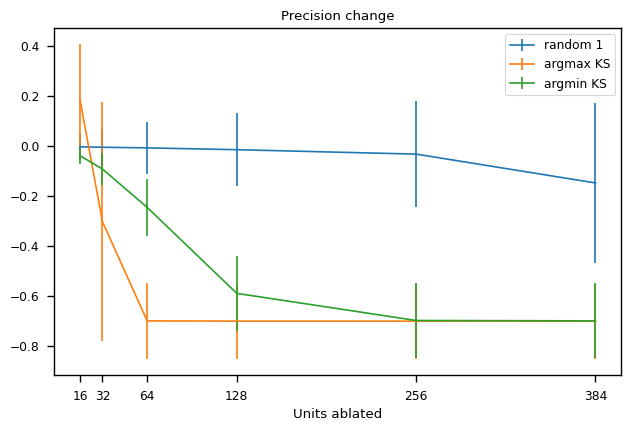

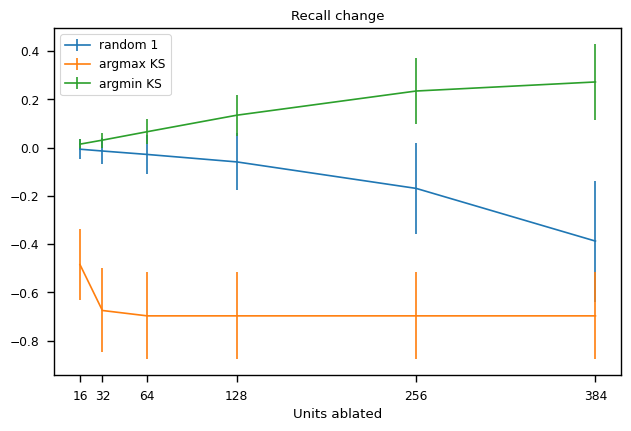

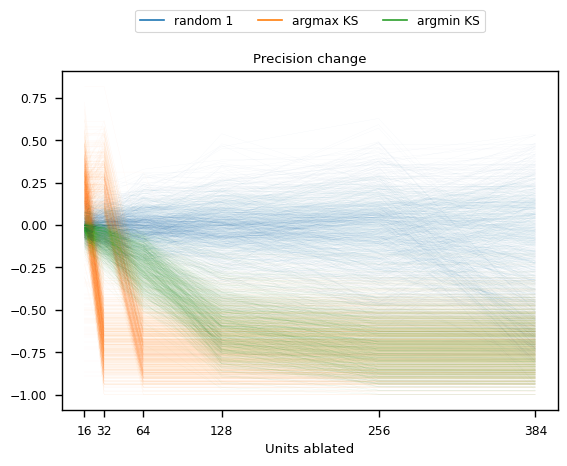

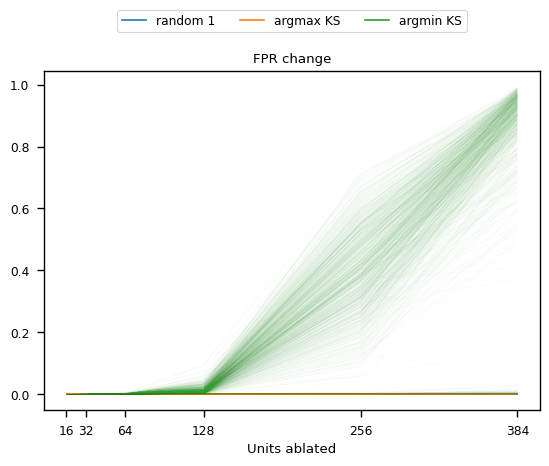

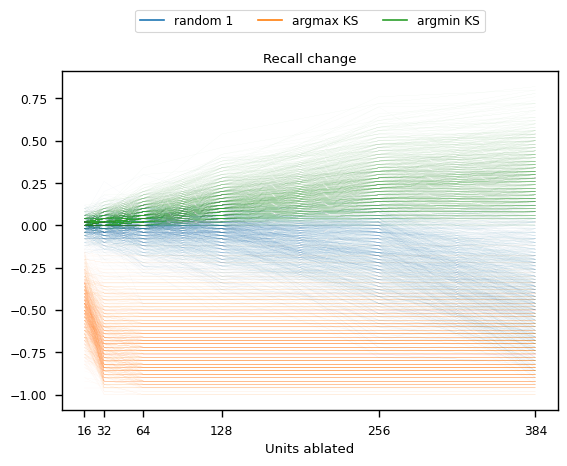

In [7]:
# Took 510 mins for layer 14

#TODO: for Cifar10 as well
for layeri in [6, 10, 14]:
        based_on = "_ks_diff"
        metric_name = "KS"
        # based_on = "_dist"
        
        new_plot_prec_recall_change(save_model_path, param_file, metric_name,
                                # saved_activations_path=f'activations_on_validation_{layeri}_pretrained_imagenet.npy',
                                saved_activations_path=f'{path_prefix}activations_on_validation_preserved_spatial_{layeri}_pretrained_imagenet.npy',
                                saved_labels_path='labels_pretrained_imagenet.npy',
                                wd_path=f'wasser_dists/wasser{based_on}_attr_hist_pretrained_imagenet_afterrelu_{layeri}.npy',
                                l1_norms=list(l1_norms_dict[usual_layer_idx_to_l1_norms_idx[layeri].replace('ordinary_conv.', '')].values()), force_recalculation=False, storage_path=storage_path)

Why precision increase for argmax: Because recall drops -> less samples are correct, but the others have higher precision

In [8]:
print("FINISHED!")
exit(0)

FINISHED!


In [ ]:
save_postfix = 'layer14_disabled_16_32_64_128_256_384_imagenet'
n_neurons_to_disable = [16, 32, 64, 128, 256, 384]

raw_precision_changes_dict = np.load(f'raw_precision_changes_dict{save_postfix}.npy', allow_pickle=True).item()
raw_recall_changes_dict = np.load(f'raw_recall_changes_dict{save_postfix}.npy', allow_pickle=True).item()

raw_precision_dict = np.load(f'raw_precision_dict{save_postfix}.npy', allow_pickle=True).item()
raw_recall_dict = np.load(f'raw_recall_dict{save_postfix}.npy', allow_pickle=True).item()

In [ ]:
raw_recall_dict['random'], raw_precision_dict['random']

In [ ]:
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

plt.plot(n_neurons_to_disable, raw_recall_dict['random'], color=colors[1], linewidth=0.1, alpha=0.2);

line = Line2D([0], [0], label='random', color=colors[1])
handles = [line]

plt.legend(handles=handles)

In [ ]:
raw_recall_changes_dict['random'][0]

In [ ]:
saved_activations_path=f'{path_prefix}activations_on_validation_preserved_spatial_{layeri}_pretrained_imagenet.npy'

model = reload_model(save_model_path, param_file)
loaded_activations = torch.tensor(np.load(saved_activations_path))
layeri = int(saved_activations_path.split('_')[-3])
y_pred = make_predictions(model, loaded_activations, layeri, if_disable=False)

saved_labels_path = 'labels_pretrained_imagenet.npy'
labels = np.load(saved_labels_path)

In [ ]:
prec, rec, _, _ = precision_recall_fscore_support(labels, y_pred)

In [ ]:
rec, prec

In [ ]:
(y_pred[labels==123] == labels[labels==123]).sum()/((labels==123).sum())

In [ ]:
rec[123], prec[123]

In [ ]:
(y_pred[labels==123] == labels[labels==123]).sum()/((y_pred==123).sum())

In [ ]:
1/50